# Mount Drive:

In [2]:
#Import drive
from google.colab import drive
#Mount Google Drive%
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
import os
os.chdir('drive/My Drive/Work/Thesis_Julien_Dejasmin/Work/code/Binary_activations_V2/MNIST_Binary_V2')
!ls

config.py   distributions  README.md	     trained_models
data	    experiments    requirements.txt  utils
DataLoader  __pycache__    results	     visualize


# Import:

In [0]:
!pip install pytorch-ignite

In [0]:
try:
  from ignite.engine import Events, create_supervised_trainer, create_supervised_evaluator
  from ignite.metrics import Accuracy, Loss, ConfusionMatrix
  from ignite.handlers import ModelCheckpoint
  from utils.training import run, evaluate
except ImportError:
  raise RuntimeError("no module Ignite, to install Ignite: 'pip install pytorch-ignite'.")

from tqdm import tqdm

In [0]:
import torch
from torch import nn
from torch.optim import SGD
from torch.utils.data import DataLoader
import torch.nn.functional as F
from torchvision.transforms import Compose, ToTensor, Normalize
from torchvision.datasets import MNIST
import matplotlib.pyplot as plt
import numpy as np
from functools import partial

from utils.models import get_my_model_Omniglot, fetch_last_checkpoint_model_filename
from DataLoader.dataLoaders import get_omniglot_dataloaders_classification
from utils.functions import Hardsigmoid

# Dataset:

In [4]:
batch_size_train = 1000
batch_size_test = 1000

# Dataset
train_loader, valid_loader, test_loader = get_omniglot_dataloaders_classification(batch_size_train, batch_size_test)

Files already downloaded and verified
Number of training examples: 16
Number of testing examples: 2


# Training:

## Training parameters:

In [0]:
# parameters default values
epochs = 50
lr = 1e-3
momentum = 0.9
log_interval = 10  # how many batches to wait before logging training status
criterion =  F.nll_loss

## Run No binary Network:

### With stride:

In [0]:
# parameters model to load no Binary model
binary = False
maxpooling = False

model, name_model = get_my_model_Omniglot(binary, maxpooling=maxpooling)
print(name_model)

Omniglot_classif_NonBinaryNet


In [0]:
path_model_checkpoint = 'trained_models/Omniglot_classif/No_binary_models/stride/'
path_save_plot = 'results/Omniglot_results/plot_acc_loss/Omniglot_classif/'

run(model, path_model_checkpoint, path_save_plot, name_model, train_loader, valid_loader, epochs, lr, momentum, criterion, log_interval)

### With maxpooling:

In [0]:
# parameters model to load no Binary model
binary = False
maxpooling = True

model, name_model = get_my_model_Omniglot(binary, maxpooling=maxpooling)
print(name_model)

In [0]:
print(model)

In [0]:
path_model_checkpoint = 'trained_models/Omniglot_classif/No_binary_models/maxpooling/'
path_save_plot = 'results/Omniglot_results/plot_acc_loss/Omniglot_classif/'

run(model, path_model_checkpoint, path_save_plot, name_model, train_loader, valid_loader, epochs, lr, momentum, criterion, log_interval)

## Run Binary Network:

### With stride:

In [0]:
# parameters model to load no Binary model
binary = True
maxpooling = False
model, name_model = get_my_model_Omniglot(binary, maxpooling=maxpooling)
print(name_model)

In [0]:
path_model_checkpoint = 'trained_models/Omniglot_classif/Binary_models/stride/'
path_save_plot = 'results/Omniglot_results/plot_acc_loss/Omniglot_classif/'

run(model, path_model_checkpoint, path_save_plot, name_model, train_loader, valid_loader, epochs, lr, momentum, criterion, log_interval)

### With maxpooling:

In [0]:
# parameters model to load no Binary model
binary = True
maxpooling = True
model, name_model = get_my_model_Omniglot(binary, maxpooling=maxpooling)
print(name_model)

In [0]:
path_model_checkpoint = 'trained_models/Omniglot_classif/Binary_models/maxpooling/'
path_save_plot = 'results/Omniglot_results/plot_acc_loss/Omniglot_classif/'

run(model, path_model_checkpoint, path_save_plot, name_model, train_loader, valid_loader, epochs, lr, momentum, criterion, log_interval)

## Run Mixt Network:

### With stride:

In [0]:
# parameters model to load no Binary model
binary = False
maxpooling = False
mixt=True

model, name_model = get_my_model_Omniglot(binary, maxpooling=maxpooling, mixt=mixt)
print(name_model)

In [0]:
path_model_checkpoint = 'trained_models/Omniglot_classif/Mixt_models/stride/'
path_save_plot = 'results/Omniglot_results/plot_acc_loss/Omniglot_classif/'

run(model, path_model_checkpoint, path_save_plot, name_model, train_loader, valid_loader, epochs, lr, momentum, criterion, log_interval)

### With maxpooling:

In [0]:
# parameters model to load no Binary model
binary = False
maxpooling = True
mixt=True

model, name_model = get_my_model_Omniglot(binary, maxpooling=maxpooling, mixt=mixt)
print(name_model)

In [0]:
path_model_checkpoint = 'trained_models/Omniglot_classif/Mixt_models/maxpooling/'
path_save_plot = 'results/Omniglot_results/plot_acc_loss/Omniglot_classif/'

run(model, path_model_checkpoint, path_save_plot, name_model, train_loader, valid_loader, epochs, lr, momentum, criterion, log_interval)

# Compute Regions:

In [0]:
from visualize.viz import visTensor, get_activation, viz_activations, viz_filters
from visualize.viz import viz_heatmap, test_predict_few_examples, standardize_and_clip, format_for_plotting
from visualize.viz import apply_transforms, GradientAscent, get_filter_layer2
from visualize.viz import get_region_layer1, get_region_layer2, get_regions_interest, get_all_regions_max

# for regions extraction
import collections
from functools import partial
import cv2

## Load models:

In [6]:
# parameters model to load no Binary model
binary = False
maxpooling = False
model_no_binary_stride, name_model_no_binary_stride = get_my_model_Omniglot(binary, maxpooling=maxpooling)

path_model = 'trained_models/Omniglot_classif/No_binary_models/stride/'
if torch.cuda.is_available():
  model_no_binary_stride.load_state_dict(torch.load(fetch_last_checkpoint_model_filename(path_model)))
else:
  model_no_binary_stride.load_state_dict(torch.load(fetch_last_checkpoint_model_filename(path_model), map_location=torch.device('cpu')))
print("Model Loaded", name_model_no_binary_stride)

Model Loaded Omniglot_classif_NonBinaryNet


In [7]:
binary = False
maxpooling = True
model_no_binary_maxpooling, name_model_no_binary_maxpooling = get_my_model_Omniglot(binary, maxpooling=maxpooling)

path_model = 'trained_models/Omniglot_classif/No_binary_models/maxpooling/'
if torch.cuda.is_available():
  model_no_binary_maxpooling.load_state_dict(torch.load(fetch_last_checkpoint_model_filename(path_model)))
else:
  model_no_binary_maxpooling.load_state_dict(torch.load(fetch_last_checkpoint_model_filename(path_model), map_location=torch.device('cpu')))
print("Model Loaded", name_model_no_binary_maxpooling)

Model Loaded Omniglot_classif_NonBinaryNet_maxpooling


In [8]:
binary = True
maxpooling = False
model_binary_stride, name_model_binary_stride = get_my_model_Omniglot(binary, maxpooling=maxpooling)

path_model = 'trained_models/Omniglot_classif/Binary_models/stride/'
if torch.cuda.is_available():
  model_binary_stride.load_state_dict(torch.load(fetch_last_checkpoint_model_filename(path_model)))
else:
  model_binary_stride.load_state_dict(torch.load(fetch_last_checkpoint_model_filename(path_model), map_location=torch.device('cpu')))
print("Model Loaded", name_model_binary_stride)

Model Loaded Omniglot_classif_Stochastic_ST_first_conv_binary


In [9]:
binary = True
maxpooling = True
model_binary_maxpooling, name_model_binary_maxpooling = get_my_model_Omniglot(binary, maxpooling=maxpooling)

path_model = 'trained_models/Omniglot_classif/Binary_models/maxpooling/'
if torch.cuda.is_available():
  model_binary_maxpooling.load_state_dict(torch.load(fetch_last_checkpoint_model_filename(path_model)))
else:
  model_binary_maxpooling.load_state_dict(torch.load(fetch_last_checkpoint_model_filename(path_model), map_location=torch.device('cpu')))
print("Model Loaded", name_model_binary_maxpooling)

Model Loaded Omniglot_classif_Stochastic_ST_first_conv_binary_maxpooling


In [10]:
binary = False
maxpooling = False
mixt=True
model_mixt_stride, name_model_mixt_stride = get_my_model_Omniglot(binary, maxpooling=maxpooling, mixt=mixt)

path_model = 'trained_models/Omniglot_classif/Mixt_models/stride/'
if torch.cuda.is_available():
  model_mixt_stride.load_state_dict(torch.load(fetch_last_checkpoint_model_filename(path_model)))
else:
  model_mixt_stride.load_state_dict(torch.load(fetch_last_checkpoint_model_filename(path_model), map_location=torch.device('cpu')))
print("Model Loaded", name_model_mixt_stride)

Model Loaded Omniglot_Stochastic_ST_mixt


In [11]:
binary = False
maxpooling = True
mixt=True
model_mixt_maxpooling, name_model_mixt_maxpooling = get_my_model_Omniglot(binary, maxpooling=maxpooling, mixt=mixt)

path_model = 'trained_models/Omniglot_classif/Mixt_models/maxpooling/'
if torch.cuda.is_available():
  model_mixt_maxpooling.load_state_dict(torch.load(fetch_last_checkpoint_model_filename(path_model)))
else:
  model_mixt_maxpooling.load_state_dict(torch.load(fetch_last_checkpoint_model_filename(path_model), map_location=torch.device('cpu')))
print("Model Loaded", name_model_mixt_maxpooling)

Model Loaded Omniglot_Stochastic_ST_maxpooling_mixt


## Run:

torch.Size([1000, 1, 105, 105])


(array([ 99.,  97.,  97., 101., 106., 109.,  94., 101., 103.,  93.]),
 array([  0. ,  96.3, 192.6, 288.9, 385.2, 481.5, 577.8, 674.1, 770.4,
        866.7, 963. ]),
 <a list of 10 Patch objects>)

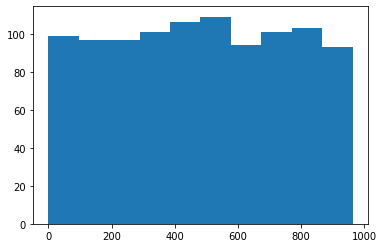

In [7]:
dataiter = iter(train_loader)
images, labels = dataiter.next()

print(images.shape)
plt.hist(labels)

In [0]:
np.save('results/Omniglot_results/regions/labels.npy', labels)

In [0]:
# Parameters:
padding = 1
filter_size = 3
len_img_w = 105
len_img_h = 105
loader = train_loader

### No binary model:

#### With stride:

In [0]:
# a dictionary that keeps saving the activations as they come
activations_no_binary_stride = collections.defaultdict(list)

def save_activation_no_binary_stride(name, mod, inp, out):
    activations_no_binary_stride[name].append(out.cpu())

In [0]:
# Registering hooks for all the Conv2d layers
# Note: Hooks are called EVERY TIME the module performs a forward pass. For modules that are
# called repeatedly at different stages of the forward pass (like RELUs), this will save different
# activations. Editing the forward pass code to save activations is the way to go for these cases.
for name, m in model_no_binary_stride.named_modules():
    if type(m)==nn.Conv2d:
      # partial to assign the layer name to each hook
      m.register_forward_hook(partial(save_activation_no_binary_stride, name))

out = model_no_binary_stride(images)

# concatenate all the outputs we saved to get the the activations for each layer for the whole dataset
activations_no_binary_stride = {name: torch.cat(outputs, 0) for name, outputs in activations_no_binary_stride.items()}

# just print out the sizes of the saved activations as a sanity check
for k,v in activations_no_binary_stride.items():
      print (k, v.size())

layer1 torch.Size([1000, 64, 53, 53])
layer2 torch.Size([1000, 128, 27, 27])
layer3 torch.Size([1000, 256, 14, 14])
layer4 torch.Size([1000, 512, 7, 7])
layer5 torch.Size([1000, 512, 4, 4])


In [0]:
stride_size = 2
stride = True

region_final, activation_final, activation_final_normalized = get_all_regions_max(images, stride, activations_no_binary_stride, stride_size, padding, filter_size, len_img_h, len_img_w)

region_layer1_no_binary_stride = region_final['layer1']
region_layer2_no_binary_stride = region_final['layer2']
region_layer3_no_binary_stride = region_final['layer3']
region_layer4_no_binary_stride = region_final['layer4']
activation_layer1_no_binary_stride = activation_final['layer1']
activation_layer2_no_binary_stride = activation_final['layer2']
activation_layer3_no_binary_stride = activation_final['layer3']
activation_layer4_no_binary_stride = activation_final['layer4']

activation_layer1_no_binary_normalized_stride = activation_final_normalized['layer1']
activation_layer2_no_binary_normalized_stride = activation_final_normalized['layer2']
activation_layer3_no_binary_normalized_stride = activation_final_normalized['layer3']
activation_layer4_no_binary_normalized_stride = activation_final_normalized['layer4']

print(region_layer1_no_binary_stride.shape)
print(region_layer2_no_binary_stride.shape)
print(region_layer3_no_binary_stride.shape)
print(region_layer4_no_binary_stride.shape)
print(activation_layer1_no_binary_stride.shape)
print(activation_layer2_no_binary_stride.shape)
print(activation_layer3_no_binary_stride.shape)
print(activation_layer4_no_binary_stride.shape)
print(activation_layer1_no_binary_normalized_stride.shape)
print(activation_layer2_no_binary_normalized_stride.shape)
print(activation_layer3_no_binary_normalized_stride.shape)
print(activation_layer4_no_binary_normalized_stride.shape)

Streaming output truncated to the last 5000 lines.
(2, 2)
(2, 3)
(2, 2)
(3, 2)
(3, 2)
treating image n 670/1000, for layer: layer1
(2, 2)
(2, 2)
(3, 2)
(3, 2)
(3, 2)
treating image n 671/1000, for layer: layer1
(2, 2)
(3, 2)
(3, 2)
treating image n 672/1000, for layer: layer1
(2, 2)
(2, 3)
(3, 2)
treating image n 673/1000, for layer: layer1
(3, 2)
(2, 2)
(2, 2)
(2, 2)
norm null for filter: 16, image: 673 with activation:-0.084721639752388, index(8,9)
(3, 2)
(3, 2)
(2, 2)
(2, 3)
(2, 2)
(2, 2)
norm null for filter: 48, image: 673 with activation:-0.06186617165803909, index(8,9)
(2, 2)
(3, 2)
(2, 2)
norm null for filter: 54, image: 673 with activation:0.19922880828380585, index(8,9)
(3, 2)
treating image n 674/1000, for layer: layer1
(3, 2)
(2, 2)
(3, 2)
(3, 2)
(3, 2)
(3, 2)
(3, 2)
(3, 2)
(3, 2)
(3, 2)
treating image n 675/1000, for layer: layer1
(2, 2)
(3, 2)
(3, 2)
treating image n 676/1000, for layer: layer1
(2, 2)
(3, 2)
(3, 2)
treating image n 677/1000, for layer: layer1
(2, 2)
(2, 2

In [0]:
np.save('results/Omniglot_results/regions/No_binary_models/stride/regions_max_layer1.npy', region_layer1_no_binary_stride)
np.save('results/Omniglot_results/regions/No_binary_models/stride/regions_max_layer2.npy', region_layer2_no_binary_stride)
np.save('results/Omniglot_results/regions/No_binary_models/stride/regions_max_layer3.npy', region_layer3_no_binary_stride)
np.save('results/Omniglot_results/regions/No_binary_models/stride/regions_max_layer4.npy', region_layer4_no_binary_stride)
np.save('results/Omniglot_results/regions/No_binary_models/stride/activations_max_layer1.npy', activation_layer1_no_binary_stride)
np.save('results/Omniglot_results/regions/No_binary_models/stride/activations_max_layer2.npy', activation_layer2_no_binary_stride)
np.save('results/Omniglot_results/regions/No_binary_models/stride/activations_max_layer3.npy', activation_layer3_no_binary_stride)
np.save('results/Omniglot_results/regions/No_binary_models/stride/activations_max_layer4.npy', activation_layer4_no_binary_stride)
np.save('results/Omniglot_results/regions/No_binary_models/stride/normalized_activations_max_layer1.npy', activation_layer1_no_binary_normalized_stride)
np.save('results/Omniglot_results/regions/No_binary_models/stride/normalized_activations_max_layer2.npy', activation_layer2_no_binary_normalized_stride)
np.save('results/Omniglot_results/regions/No_binary_models/stride/normalized_activations_max_layer3.npy', activation_layer3_no_binary_normalized_stride)
np.save('results/Omniglot_results/regions/No_binary_models/stride/normalized_activations_max_layer4.npy', activation_layer4_no_binary_normalized_stride)

#### With maxpooling:

In [0]:
activations_no_binary_maxpooling = collections.defaultdict(list)

def save_activation_no_binary_maxpooling(name, mod, inp, out):
    activations_no_binary_maxpooling[name].append(out.cpu())

In [16]:
for name, m in model_no_binary_maxpooling.named_modules():
    if type(m)==nn.MaxPool2d:
      m.register_forward_hook(partial(save_activation_no_binary_maxpooling, name))

out = model_no_binary_maxpooling(images)

activations_no_binary_maxpooling = {name: torch.cat(outputs, 0) for name, outputs in activations_no_binary_maxpooling.items()}

for k,v in activations_no_binary_maxpooling.items():
      print (k, v.size())

maxPool1 torch.Size([1000, 64, 52, 52])
maxPool2 torch.Size([1000, 128, 26, 26])
maxPool3 torch.Size([1000, 256, 13, 13])
maxPool4 torch.Size([1000, 512, 6, 6])
maxPool5 torch.Size([1000, 512, 3, 3])


In [17]:
stride_size = 2  # we take stride=2 but in reality it's maxpooling which have stride=2
stride = False

region_final, activation_final, activation_final_normalized = get_all_regions_max(images, stride, activations_no_binary_maxpooling, stride_size, padding, filter_size, len_img_h, len_img_w)

region_layer1_no_binary_maxpool = region_final['maxPool1']
region_layer2_no_binary_maxpool = region_final['maxPool2']
region_layer3_no_binary_maxpool = region_final['maxPool3']
region_layer4_no_binary_maxpool = region_final['maxPool4']
activation_layer1_no_binary_maxpool = activation_final['maxPool1']
activation_layer2_no_binary_maxpool = activation_final['maxPool2']
activation_layer3_no_binary_maxpool = activation_final['maxPool3']
activation_layer4_no_binary_maxpool = activation_final['maxPool4']

activation_layer1_no_binary_normalized_maxpool = activation_final_normalized['maxPool1']
activation_layer2_no_binary_normalized_maxpool = activation_final_normalized['maxPool2']
activation_layer3_no_binary_normalized_maxpool = activation_final_normalized['maxPool3']
activation_layer4_no_binary_normalized_maxpool = activation_final_normalized['maxPool4']

print(region_layer1_no_binary_maxpool.shape)
print(region_layer2_no_binary_maxpool.shape)
print(region_layer3_no_binary_maxpool.shape)
print(region_layer4_no_binary_maxpool.shape)
print(activation_layer1_no_binary_maxpool.shape)
print(activation_layer2_no_binary_maxpool.shape)
print(activation_layer3_no_binary_maxpool.shape)
print(activation_layer4_no_binary_maxpool.shape)
print(activation_layer1_no_binary_normalized_maxpool.shape)
print(activation_layer2_no_binary_normalized_maxpool.shape)
print(activation_layer3_no_binary_normalized_maxpool.shape)
print(activation_layer4_no_binary_normalized_maxpool.shape)

Streaming output truncated to the last 5000 lines.
(2, 2)
(2, 2)
norm null for filter: 52, image: 863 with activation:4.315117835998535, index(12,22)
norm null for filter: 58, image: 863 with activation:4.13381814956665, index(16,31)
norm null for filter: 62, image: 863 with activation:5.886147975921631, index(16,31)
treating image n 864/1000, for layer: maxPool1
norm null for filter: 0, image: 864 with activation:5.988811016082764, index(21,28)
(2, 2)
(2, 2)
norm null for filter: 8, image: 864 with activation:6.981582164764404, index(22,23)
(2, 2)
norm null for filter: 29, image: 864 with activation:7.232584476470947, index(22,23)
(2, 2)
(2, 2)
(2, 2)
(2, 2)
norm null for filter: 44, image: 864 with activation:6.0455708503723145, index(21,29)
norm null for filter: 46, image: 864 with activation:5.415118217468262, index(21,28)
norm null for filter: 58, image: 864 with activation:4.153555870056152, index(19,27)
treating image n 865/1000, for layer: maxPool1
(2, 2)
norm null for filter: 

AttributeError: ignored

In [0]:
np.save('results/Omniglot_results/regions/No_binary_models/maxpooling/regions_max_layer1.npy', region_layer1_no_binary_maxpool)
np.save('results/Omniglot_results/regions/No_binary_models/maxpooling/regions_max_layer2.npy', region_layer2_no_binary_maxpool)
np.save('results/Omniglot_results/regions/No_binary_models/maxpooling/regions_max_layer3.npy', region_layer3_no_binary_maxpool)
np.save('results/Omniglot_results/regions/No_binary_models/maxpooling/regions_max_layer4.npy', region_layer4_no_binary_maxpool)
np.save('results/Omniglot_results/regions/No_binary_models/maxpooling/activations_max_layer1.npy', activation_layer1_no_binary_maxpool)
np.save('results/Omniglot_results/regions/No_binary_models/maxpooling/activations_max_layer2.npy', activation_layer2_no_binary_maxpool)
np.save('results/Omniglot_results/regions/No_binary_models/maxpooling/activations_max_layer3.npy', activation_layer3_no_binary_maxpool)
np.save('results/Omniglot_results/regions/No_binary_models/maxpooling/activations_max_layer4.npy', activation_layer4_no_binary_maxpool)
np.save('results/Omniglot_results/regions/No_binary_models/maxpooling/normalized_activations_max_layer1.npy', activation_layer1_no_binary_normalized_maxpool)
np.save('results/Omniglot_results/regions/No_binary_models/maxpooling/normalized_activations_max_layer2.npy', activation_layer2_no_binary_normalized_maxpool)
np.save('results/Omniglot_results/regions/No_binary_models/maxpooling/normalized_activations_max_layer3.npy', activation_layer3_no_binary_normalized_maxpool)
np.save('results/Omniglot_results/regions/No_binary_models/maxpooling/normalized_activations_max_layer4.npy', activation_layer4_no_binary_normalized_maxpool)

### Binary model:

#### With Stride:

In [0]:
activations_binary_stride = collections.defaultdict(list)

def save_activation_binary_stride(name, mod, inp, out):
    activations_binary_stride[name].append(out.cpu())

In [14]:
for name, m in model_binary_stride.named_modules():
    if type(m)==nn.Conv2d:
      m.register_forward_hook(partial(save_activation_binary_stride, name))

out = model_binary_stride(images)

activations_binary_stride = {name: torch.cat(outputs, 0) for name, outputs in activations_binary_stride.items()}

for k,v in activations_binary_stride.items():
      print (k, v.size())

layer1 torch.Size([1000, 64, 53, 53])
layer2 torch.Size([1000, 128, 27, 27])
layer3 torch.Size([1000, 256, 14, 14])
layer4 torch.Size([1000, 512, 7, 7])
layer5 torch.Size([1000, 512, 4, 4])


In [15]:
stride_size = 2
stride = True

region_final, activation_final, activation_final_normalized = get_all_regions_max(images, stride, activations_binary_stride, stride_size, padding, filter_size, len_img_h, len_img_w)

region_layer1_binary_stride = region_final['layer1']
region_layer2_binary_stride = region_final['layer2']
region_layer3_binary_stride = region_final['layer3']
region_layer4_binary_stride = region_final['layer4']
activation_layer1_binary_stride = activation_final['layer1']
activation_layer2_binary_stride = activation_final['layer2']
activation_layer3_binary_stride = activation_final['layer3']
activation_layer4_binary_stride = activation_final['layer4']

activation_layer1_binary_normalized_stride = activation_final_normalized['layer1']
activation_layer2_binary_normalized_stride = activation_final_normalized['layer2']
activation_layer3_binary_normalized_stride = activation_final_normalized['layer3']
activation_layer4_binary_normalized_stride = activation_final_normalized['layer4']

print(region_layer1_binary_stride.shape)
print(region_layer2_binary_stride.shape)
print(region_layer3_binary_stride.shape)
print(region_layer4_binary_stride.shape)
print(activation_layer1_binary_stride.shape)
print(activation_layer2_binary_stride.shape)
print(activation_layer3_binary_stride.shape)
print(activation_layer4_binary_stride.shape)

print(activation_layer1_binary_normalized_stride.shape)
print(activation_layer2_binary_normalized_stride.shape)
print(activation_layer3_binary_normalized_stride.shape)
print(activation_layer4_binary_normalized_stride.shape)

Streaming output truncated to the last 5000 lines.
(2, 2)
treating image n 914/1000, for layer: layer1
(2, 3)
(3, 2)
(2, 2)
(2, 2)
(3, 2)
(3, 2)
(2, 3)
(2, 2)
(2, 2)
(2, 3)
(2, 2)
(2, 2)
(2, 2)
treating image n 915/1000, for layer: layer1
(3, 2)
(2, 2)
(2, 2)
(3, 2)
(3, 2)
(2, 3)
(2, 2)
(2, 2)
(2, 3)
(2, 2)
(2, 2)
(2, 2)
treating image n 916/1000, for layer: layer1
(2, 3)
(3, 2)
(2, 2)
(3, 2)
(2, 3)
(2, 3)
(2, 2)
(2, 2)
(2, 3)
(2, 2)
(2, 2)
treating image n 917/1000, for layer: layer1
(3, 2)
(2, 2)
(3, 2)
(2, 2)
(2, 2)
(2, 3)
(2, 2)
(2, 2)
treating image n 918/1000, for layer: layer1
(2, 3)
(3, 2)
(3, 2)
(2, 3)
(2, 3)
(2, 2)
(2, 2)
(2, 2)
(3, 2)
norm null for filter: 25, image: 918 with activation:0.1407356560230255, index(18,18)
(2, 3)
(3, 2)
norm null for filter: 32, image: 918 with activation:-0.04736757278442383, index(18,18)
(2, 3)
(2, 2)
(2, 2)
(2, 3)
(2, 2)
(2, 2)
(2, 2)
(2, 2)
(2, 3)
(2, 3)
(2, 2)
(2, 2)
treating image n 919/1000, for layer: layer1
(2, 3)
(3, 2)
(3, 2)
(2, 3)
(

In [0]:
np.save('results/Omniglot_results/regions/Binary_models/stride/regions_max_layer1.npy', region_layer1_binary_stride)
np.save('results/Omniglot_results/regions/Binary_models/stride/regions_max_layer2.npy', region_layer2_binary_stride)
np.save('results/Omniglot_results/regions/Binary_models/stride/regions_max_layer3.npy', region_layer3_binary_stride)
np.save('results/Omniglot_results/regions/Binary_models/stride/regions_max_layer4.npy', region_layer4_binary_stride)
np.save('results/Omniglot_results/regions/Binary_models/stride/activations_max_layer1.npy', activation_layer1_binary_stride)
np.save('results/Omniglot_results/regions/Binary_models/stride/activations_max_layer2.npy', activation_layer2_binary_stride)
np.save('results/Omniglot_results/regions/Binary_models/stride/activations_max_layer3.npy', activation_layer3_binary_stride)
np.save('results/Omniglot_results/regions/Binary_models/stride/activations_max_layer4.npy', activation_layer4_binary_stride)
np.save('results/Omniglot_results/regions/Binary_models/stride/normalized_activations_max_layer1.npy', activation_layer1_binary_normalized_stride)
np.save('results/Omniglot_results/regions/Binary_models/stride/normalized_activations_max_layer2.npy', activation_layer2_binary_normalized_stride)
np.save('results/Omniglot_results/regions/Binary_models/stride/normalized_activations_max_layer3.npy', activation_layer3_binary_normalized_stride)
np.save('results/Omniglot_results/regions/Binary_models/stride/normalized_activations_max_layer4.npy', activation_layer4_binary_normalized_stride)

#### with maxpooling:

In [0]:
activations_binary_maxpooling = collections.defaultdict(list)

def save_activation_binary_maxpooling(name, mod, inp, out):
    activations_binary_maxpooling[name].append(out.cpu())

In [11]:
for name, m in model_binary_maxpooling.named_modules():
    if type(m)==nn.MaxPool2d:
      m.register_forward_hook(partial(save_activation_binary_maxpooling, name))

out = model_binary_maxpooling(images)

activations_binary_maxpooling = {name: torch.cat(outputs, 0) for name, outputs in activations_binary_maxpooling.items()}

for k,v in activations_binary_maxpooling.items():
      print (k, v.size())

maxPool1 torch.Size([1000, 64, 52, 52])
maxPool2 torch.Size([1000, 128, 26, 26])
maxPool3 torch.Size([1000, 256, 13, 13])
maxPool4 torch.Size([1000, 512, 6, 6])
maxPool5 torch.Size([1000, 512, 3, 3])


In [12]:
stride_size = 2
stride = False

region_final, activation_final, activation_final_normalized = get_all_regions_max(images, stride, activations_binary_maxpooling, stride_size, padding, filter_size, len_img_h, len_img_w)

Streaming output truncated to the last 5000 lines.
(2, 2)
norm null for filter: 8, image: 890 with activation:6.556152820587158, index(28,19)
(2, 2)
norm null for filter: 29, image: 890 with activation:6.567539691925049, index(28,19)
(2, 2)
(2, 2)
(2, 2)
(2, 2)
norm null for filter: 46, image: 890 with activation:5.283988952636719, index(27,20)
norm null for filter: 62, image: 890 with activation:5.368156433105469, index(27,20)
treating image n 891/1000, for layer: maxPool1
norm null for filter: 0, image: 891 with activation:5.771265983581543, index(6,24)
(2, 2)
(2, 2)
norm null for filter: 8, image: 891 with activation:6.556152820587158, index(10,34)
(2, 2)
norm null for filter: 18, image: 891 with activation:5.653307914733887, index(5,21)
norm null for filter: 23, image: 891 with activation:6.083639144897461, index(7,36)
norm null for filter: 29, image: 891 with activation:6.567539691925049, index(10,34)
norm null for filter: 30, image: 891 with activation:6.644258499145508, index(5,

KeyError: ignored

In [14]:
region_layer1_binary_maxpool = region_final['maxPool1']
region_layer2_binary_maxpool = region_final['maxPool2']
region_layer3_binary_maxpool = region_final['maxPool3']
region_layer4_binary_maxpool = region_final['maxPool4']
activation_layer1_binary_maxpool = activation_final['maxPool1']
activation_layer2_binary_maxpool = activation_final['maxPool2']
activation_layer3_binary_maxpool = activation_final['maxPool3']
activation_layer4_binary_maxpool = activation_final['maxPool4']

activation_layer1_binary_normalized_maxpool = activation_final_normalized['maxPool1']
activation_layer2_binary_normalized_maxpool = activation_final_normalized['maxPool2']
activation_layer3_binary_normalized_maxpool = activation_final_normalized['maxPool3']
activation_layer4_binary_normalized_maxpool = activation_final_normalized['maxPool4']

print(region_layer1_binary_maxpool.shape)
print(region_layer2_binary_maxpool.shape)
print(region_layer3_binary_maxpool.shape)
print(region_layer4_binary_maxpool.shape)
print(activation_layer1_binary_maxpool.shape)
print(activation_layer2_binary_maxpool.shape)
print(activation_layer3_binary_maxpool.shape)
print(activation_layer4_binary_maxpool.shape)
print(activation_layer1_binary_normalized_maxpool.shape)
print(activation_layer2_binary_normalized_maxpool.shape)
print(activation_layer3_binary_normalized_maxpool.shape)
print(activation_layer4_binary_normalized_maxpool.shape)

(1000, 64, 3, 3)
(1000, 128, 7, 7)
(1000, 256, 15, 15)
(1000, 512, 31, 31)
(1000, 64)
(1000, 128)
(1000, 256)
(1000, 512)
(1000, 64)
(1000, 128)
(1000, 256)
(1000, 512)


In [0]:
np.save('results/Omniglot_results/regions/Binary_models/maxpooling/regions_max_layer1.npy', region_layer1_binary_maxpool)
np.save('results/Omniglot_results/regions/Binary_models/maxpooling/regions_max_layer2.npy', region_layer2_binary_maxpool)
np.save('results/Omniglot_results/regions/Binary_models/maxpooling/regions_max_layer3.npy', region_layer3_binary_maxpool)
np.save('results/Omniglot_results/regions/Binary_models/maxpooling/regions_max_layer4.npy', region_layer4_binary_maxpool)
np.save('results/Omniglot_results/regions/Binary_models/maxpooling/activations_max_layer1.npy', activation_layer1_binary_maxpool)
np.save('results/Omniglot_results/regions/Binary_models/maxpooling/activations_max_layer2.npy', activation_layer2_binary_maxpool)
np.save('results/Omniglot_results/regions/Binary_models/maxpooling/activations_max_layer3.npy', activation_layer3_binary_maxpool)
np.save('results/Omniglot_results/regions/Binary_models/maxpooling/activations_max_layer4.npy', activation_layer4_binary_maxpool)
np.save('results/Omniglot_results/regions/Binary_models/maxpooling/normalized_activations_max_layer1.npy', activation_layer1_binary_normalized_maxpool)
np.save('results/Omniglot_results/regions/Binary_models/maxpooling/normalized_activations_max_layer2.npy', activation_layer2_binary_normalized_maxpool)
np.save('results/Omniglot_results/regions/Binary_models/maxpooling/normalized_activations_max_layer3.npy', activation_layer3_binary_normalized_maxpool)
np.save('results/Omniglot_results/regions/Binary_models/maxpooling/normalized_activations_max_layer4.npy', activation_layer4_binary_normalized_maxpool)

### Mixt model:

#### With stride:

In [0]:
activations_mixt_stride = collections.defaultdict(list)

def save_activation_mixt_stride(name, mod, inp, out):
    activations_mixt_stride[name].append(out.cpu())

In [0]:
for name, m in model_mixt_stride.named_modules():
    if type(m)==nn.Conv2d:
      m.register_forward_hook(partial(save_activation_mixt_stride, name))

out = model_mixt_stride(images)

activations_mixt_stride = {name: torch.cat(outputs, 0) for name, outputs in activations_mixt_stride.items()}

for k,v in activations_mixt_stride.items():
      print (k, v.size())

In [20]:
activations_mixt_stride.pop('layer5_binary', None)
activations_mixt_stride.pop('layer5_no_binary', None)

for k,v in activations_mixt_stride.items():
      print (k, v.size())

layer1_binary torch.Size([1000, 32, 53, 53])
layer2_binary torch.Size([1000, 64, 27, 27])
layer3_binary torch.Size([1000, 128, 14, 14])
layer4_binary torch.Size([1000, 256, 7, 7])
layer1_no_binary torch.Size([1000, 32, 53, 53])
layer2_no_binary torch.Size([1000, 64, 27, 27])
layer3_no_binary torch.Size([1000, 128, 14, 14])
layer4_no_binary torch.Size([1000, 256, 7, 7])


In [21]:
stride_size = 2
stride = True

region_final, activation_final, activation_final_normalized = get_all_regions_max(images, stride, activations_mixt_stride, stride_size, padding, filter_size, len_img_h, len_img_w)

region_layer1_mixt_binary_stride = region_final['layer1_binary']
region_layer2_mixt_binary_stride = region_final['layer2_binary']
region_layer3_mixt_binary_stride = region_final['layer3_binary']
region_layer4_mixt_binary_stride = region_final['layer4_binary']
activation_layer1_mixt_binary_stride = activation_final['layer1_binary']
activation_layer2_mixt_binary_stride = activation_final['layer2_binary']
activation_layer3_mixt_binary_stride = activation_final['layer3_binary']
activation_layer4_mixt_binary_stride = activation_final['layer4_binary']

activation_layer1_mixt_binary_normalized_stride = activation_final_normalized['layer1_binary']
activation_layer2_mixt_binary_normalized_stride = activation_final_normalized['layer2_binary']
activation_layer3_mixt_binary_normalized_stride = activation_final_normalized['layer3_binary']
activation_layer4_mixt_binary_normalized_stride = activation_final_normalized['layer4_binary']

print(region_layer1_mixt_binary_stride.shape)
print(region_layer2_mixt_binary_stride.shape)
print(region_layer3_mixt_binary_stride.shape)
print(region_layer4_mixt_binary_stride.shape)
print(activation_layer1_mixt_binary_stride.shape)
print(activation_layer2_mixt_binary_stride.shape)
print(activation_layer3_mixt_binary_stride.shape)
print(activation_layer4_mixt_binary_stride.shape)

print(activation_layer1_mixt_binary_normalized_stride.shape)
print(activation_layer2_mixt_binary_normalized_stride.shape)
print(activation_layer3_mixt_binary_normalized_stride.shape)
print(activation_layer4_mixt_binary_normalized_stride.shape)

region_layer1_mixt_no_binary_stride = region_final['layer1_no_binary']
region_layer2_mixt_no_binary_stride = region_final['layer2_no_binary']
region_layer3_mixt_no_binary_stride = region_final['layer3_no_binary']
region_layer4_mixt_no_binary_stride = region_final['layer4_no_binary']
activation_layer1_mixt_no_binary_stride = activation_final['layer1_no_binary']
activation_layer2_mixt_no_binary_stride = activation_final['layer2_no_binary']
activation_layer3_mixt_no_binary_stride = activation_final['layer3_no_binary']
activation_layer4_mixt_no_binary_stride = activation_final['layer4_no_binary']

activation_layer1_mixt_no_binary_normalized_stride = activation_final_normalized['layer1_no_binary']
activation_layer2_mixt_no_binary_normalized_stride = activation_final_normalized['layer2_no_binary']
activation_layer3_mixt_no_binary_normalized_stride = activation_final_normalized['layer3_no_binary']
activation_layer4_mixt_no_binary_normalized_stride = activation_final_normalized['layer4_no_binary']

print(region_layer1_mixt_no_binary_stride.shape)
print(region_layer2_mixt_no_binary_stride.shape)
print(region_layer3_mixt_no_binary_stride.shape)
print(region_layer4_mixt_no_binary_stride.shape)
print(activation_layer1_mixt_no_binary_stride.shape)
print(activation_layer2_mixt_no_binary_stride.shape)
print(activation_layer3_mixt_no_binary_stride.shape)
print(activation_layer4_mixt_no_binary_stride.shape)

print(activation_layer1_mixt_no_binary_normalized_stride.shape)
print(activation_layer2_mixt_no_binary_normalized_stride.shape)
print(activation_layer3_mixt_no_binary_normalized_stride.shape)
print(activation_layer4_mixt_no_binary_normalized_stride.shape)

Streaming output truncated to the last 5000 lines.
treating image n 355/1000, for layer: layer1_no_binary
(3, 2)
treating image n 356/1000, for layer: layer1_no_binary
(3, 2)
treating image n 357/1000, for layer: layer1_no_binary
(3, 2)
treating image n 358/1000, for layer: layer1_no_binary
(2, 2)
(2, 3)
(3, 2)
(2, 3)
treating image n 359/1000, for layer: layer1_no_binary
(2, 2)
(3, 2)
treating image n 360/1000, for layer: layer1_no_binary
(3, 2)
treating image n 361/1000, for layer: layer1_no_binary
(2, 2)
(2, 2)
(3, 2)
(3, 2)
treating image n 362/1000, for layer: layer1_no_binary
(3, 2)
(3, 2)
treating image n 363/1000, for layer: layer1_no_binary
(2, 2)
(2, 2)
(3, 2)
treating image n 364/1000, for layer: layer1_no_binary
(3, 2)
(3, 2)
treating image n 365/1000, for layer: layer1_no_binary
(3, 2)
treating image n 366/1000, for layer: layer1_no_binary
(3, 2)
(2, 2)
(2, 2)
(2, 2)
(3, 2)
(3, 2)
(3, 2)
treating image n 367/1000, for layer: layer1_no_binary
(2, 2)
(3, 2)
treating image n 

In [0]:
np.save('results/Omniglot_results/regions/Mixt_models/stride/regions_max_layer1_binary.npy', region_layer1_mixt_binary_stride)
np.save('results/Omniglot_results/regions/Mixt_models/stride/regions_max_layer2_binary.npy', region_layer2_mixt_binary_stride)
np.save('results/Omniglot_results/regions/Mixt_models/stride/regions_max_layer3_binary.npy', region_layer3_mixt_binary_stride)
np.save('results/Omniglot_results/regions/Mixt_models/stride/regions_max_layer4_binary.npy', region_layer4_mixt_binary_stride)
np.save('results/Omniglot_results/regions/Mixt_models/stride/activations_max_layer1_binary.npy', activation_layer1_mixt_binary_stride)
np.save('results/Omniglot_results/regions/Mixt_models/stride/activations_max_layer2_binary.npy', activation_layer2_mixt_binary_stride)
np.save('results/Omniglot_results/regions/Mixt_models/stride/activations_max_layer3_binary.npy', activation_layer3_mixt_binary_stride)
np.save('results/Omniglot_results/regions/Mixt_models/stride/activations_max_layer4_binary.npy', activation_layer4_mixt_binary_stride)
np.save('results/Omniglot_results/regions/Mixt_models/stride/normalized_activations_max_layer1_binary.npy', activation_layer1_mixt_binary_normalized_stride)
np.save('results/Omniglot_results/regions/Mixt_models/stride/normalized_activations_max_layer2_binary.npy', activation_layer2_mixt_binary_normalized_stride)
np.save('results/Omniglot_results/regions/Mixt_models/stride/normalized_activations_max_layer3_binary.npy', activation_layer3_mixt_binary_normalized_stride)
np.save('results/Omniglot_results/regions/Mixt_models/stride/normalized_activations_max_layer4_binary.npy', activation_layer4_mixt_binary_normalized_stride)

np.save('results/Omniglot_results/regions/Mixt_models/stride/regions_max_layer1_no_binary.npy', region_layer1_mixt_no_binary_stride)
np.save('results/Omniglot_results/regions/Mixt_models/stride/regions_max_layer2_no_binary.npy', region_layer2_mixt_no_binary_stride)
np.save('results/Omniglot_results/regions/Mixt_models/stride/regions_max_layer3_no_binary.npy', region_layer3_mixt_no_binary_stride)
np.save('results/Omniglot_results/regions/Mixt_models/stride/regions_max_layer4_no_binary.npy', region_layer4_mixt_no_binary_stride)
np.save('results/Omniglot_results/regions/Mixt_models/stride/activations_max_layer1_no_binary.npy', activation_layer1_mixt_no_binary_stride)
np.save('results/Omniglot_results/regions/Mixt_models/stride/activations_max_layer2_no_binary.npy', activation_layer2_mixt_no_binary_stride)
np.save('results/Omniglot_results/regions/Mixt_models/stride/activations_max_layer3_no_binary.npy', activation_layer3_mixt_no_binary_stride)
np.save('results/Omniglot_results/regions/Mixt_models/stride/activations_max_layer4_no_binary.npy', activation_layer4_mixt_no_binary_stride)
np.save('results/Omniglot_results/regions/Mixt_models/stride/normalized_activations_max_layer1_no_binary.npy', activation_layer1_mixt_no_binary_normalized_stride)
np.save('results/Omniglot_results/regions/Mixt_models/stride/normalized_activations_max_layer2_no_binary.npy', activation_layer2_mixt_no_binary_normalized_stride)
np.save('results/Omniglot_results/regions/Mixt_models/stride/normalized_activations_max_layer3_no_binary.npy', activation_layer3_mixt_no_binary_normalized_stride)
np.save('results/Omniglot_results/regions/Mixt_models/stride/normalized_activations_max_layer4_no_binary.npy', activation_layer4_mixt_no_binary_normalized_stride)

#### With maxpooling:

In [0]:
activations_mixt_maxpooling = collections.defaultdict(list)

def save_activation_mixt_maxpooling(name, mod, inp, out):
    activations_mixt_maxpooling[name].append(out.cpu())

In [11]:
for name, m in model_mixt_maxpooling.named_modules():
    if type(m)==nn.MaxPool2d:
      m.register_forward_hook(partial(save_activation_mixt_maxpooling, name))

out = model_mixt_maxpooling(images)

activations_mixt_maxpooling = {name: torch.cat(outputs, 0) for name, outputs in activations_mixt_maxpooling.items()}

for k,v in activations_mixt_maxpooling.items():
      print (k, v.size())

maxPool4_no_binary torch.Size([1000, 256, 6, 6])


In [12]:
stride_size = 2
stride = False

region_final, activation_final, activation_final_normalized = get_all_regions_max(images, stride, activations_mixt_maxpooling, stride_size, padding, filter_size, len_img_h, len_img_w)

nb images: 1000
begin extraction regions
treating image n 0/1000, for layer: maxPool4_no_binary
treating image n 1/1000, for layer: maxPool4_no_binary
treating image n 2/1000, for layer: maxPool4_no_binary
treating image n 3/1000, for layer: maxPool4_no_binary
treating image n 4/1000, for layer: maxPool4_no_binary
treating image n 5/1000, for layer: maxPool4_no_binary
treating image n 6/1000, for layer: maxPool4_no_binary
treating image n 7/1000, for layer: maxPool4_no_binary
treating image n 8/1000, for layer: maxPool4_no_binary
treating image n 9/1000, for layer: maxPool4_no_binary
treating image n 10/1000, for layer: maxPool4_no_binary
treating image n 11/1000, for layer: maxPool4_no_binary
treating image n 12/1000, for layer: maxPool4_no_binary
treating image n 13/1000, for layer: maxPool4_no_binary
treating image n 14/1000, for layer: maxPool4_no_binary
treating image n 15/1000, for layer: maxPool4_no_binary
treating image n 16/1000, for layer: maxPool4_no_binary
treating image n 

In [18]:
region_layer1_mixt_binary_maxpool = region_final['maxPool1_binary']
region_layer2_mixt_binary_maxpool = region_final['maxPool2_binary']
region_layer3_mixt_binary_maxpool = region_final['maxPool3_binary']
region_layer4_mixt_binary_maxpool = region_final['maxPool4_binary']
activation_layer1_mixt_binary_maxpool = activation_final['maxPool1_binary']
activation_layer2_mixt_binary_maxpool = activation_final['maxPool2_binary']
activation_layer3_mixt_binary_maxpool = activation_final['maxPool3_binary']
activation_layer4_mixt_binary_maxpool = activation_final['maxPool4_binary']

activation_layer1_mixt_binary_normalized_maxpool = activation_final_normalized['maxPool1_binary']
activation_layer2_mixt_binary_normalized_maxpool = activation_final_normalized['maxPool2_binary']
activation_layer3_mixt_binary_normalized_maxpool = activation_final_normalized['maxPool3_binary']
activation_layer4_mixt_binary_normalized_maxpool = activation_final_normalized['maxPool4_binary']

print(region_layer1_mixt_binary_maxpool.shape)
print(region_layer2_mixt_binary_maxpool.shape)
print(region_layer3_mixt_binary_maxpool.shape)
print(region_layer4_mixt_binary_maxpool.shape)
print(activation_layer1_mixt_binary_maxpool.shape)
print(activation_layer2_mixt_binary_maxpool.shape)
print(activation_layer3_mixt_binary_maxpool.shape)
print(activation_layer4_mixt_binary_maxpool.shape)
print(activation_layer1_mixt_binary_normalized_maxpool.shape)
print(activation_layer2_mixt_binary_normalized_maxpool.shape)
print(activation_layer3_mixt_binary_normalized_maxpool.shape)
print(activation_layer4_mixt_binary_normalized_maxpool.shape)

region_layer1_mixt_no_binary_maxpool = region_final['maxPool1_no_binary']
region_layer2_mixt_no_binary_maxpool = region_final['maxPool2_no_binary']
region_layer3_mixt_no_binary_maxpool = region_final['maxPool3_no_binary']
region_layer4_mixt_no_binary_maxpool = region_final['maxPool4_no_binary']
activation_layer1_mixt_no_binary_maxpool = activation_final['maxPool1_no_binary']
activation_layer2_mixt_no_binary_maxpool = activation_final['maxPool2_no_binary']
activation_layer3_mixt_no_binary_maxpool = activation_final['maxPool3_no_binary']
activation_layer4_mixt_no_binary_maxpool = activation_final['maxPool4_no_binary']

activation_layer1_mixt_no_binary_normalized_maxpool = activation_final_normalized['maxPool1_no_binary']
activation_layer2_mixt_no_binary_normalized_maxpool = activation_final_normalized['maxPool2_no_binary']
activation_layer3_mixt_no_binary_normalized_maxpool = activation_final_normalized['maxPool3_no_binary']
activation_layer4_mixt_no_binary_normalized_maxpool = activation_final_normalized['maxPool4_no_binary']

print(region_layer1_mixt_no_binary_maxpool.shape)
print(region_layer2_mixt_no_binary_maxpool.shape)
print(region_layer3_mixt_no_binary_maxpool.shape)
print(region_layer4_mixt_no_binary_maxpool.shape)
print(activation_layer1_mixt_no_binary_maxpool.shape)
print(activation_layer2_mixt_no_binary_maxpool.shape)
print(activation_layer3_mixt_no_binary_maxpool.shape)
print(activation_layer4_mixt_no_binary_maxpool.shape)
print(activation_layer1_mixt_no_binary_normalized_maxpool.shape)
print(activation_layer2_mixt_no_binary_normalized_maxpool.shape)
print(activation_layer3_mixt_no_binary_normalized_maxpool.shape)
print(activation_layer4_mixt_no_binary_normalized_maxpool.shape)

(1000, 32, 3, 3)
(1000, 64, 7, 7)
(1000, 128, 15, 15)
(1000, 256, 31, 31)
(1000, 32)
(1000, 64)
(1000, 128)
(1000, 256)
(1000, 32)
(1000, 64)
(1000, 128)
(1000, 256)
(1000, 32, 3, 3)
(1000, 64, 7, 7)
(1000, 128, 15, 15)
(1000, 256, 31, 31)
(1000, 32)
(1000, 64)
(1000, 128)
(1000, 256)
(1000, 32)
(1000, 64)
(1000, 128)
(1000, 256)


In [0]:
np.save('results/Omniglot_results/regions/Mixt_models/maxpooling/regions_max_layer1_binary.npy', region_layer1_mixt_binary_maxpool)
np.save('results/Omniglot_results/regions/Mixt_models/maxpooling/regions_max_layer2_binary.npy', region_layer2_mixt_binary_maxpool)
np.save('results/Omniglot_results/regions/Mixt_models/maxpooling/regions_max_layer3_binary.npy', region_layer3_mixt_binary_maxpool)
np.save('results/Omniglot_results/regions/Mixt_models/maxpooling/regions_max_layer4_binary.npy', region_layer4_mixt_binary_maxpool)
np.save('results/Omniglot_results/regions/Mixt_models/maxpooling/activations_max_layer1_binary.npy', activation_layer1_mixt_binary_maxpool)
np.save('results/Omniglot_results/regions/Mixt_models/maxpooling/activations_max_layer2_binary.npy', activation_layer2_mixt_binary_maxpool)
np.save('results/Omniglot_results/regions/Mixt_models/maxpooling/activations_max_layer3_binary.npy', activation_layer3_mixt_binary_maxpool)
np.save('results/Omniglot_results/regions/Mixt_models/maxpooling/activations_max_layer4_binary.npy', activation_layer4_mixt_binary_maxpool)
np.save('results/Omniglot_results/regions/Mixt_models/maxpooling/normalized_activations_max_layer1_binary.npy', activation_layer1_mixt_binary_normalized_maxpool)
np.save('results/Omniglot_results/regions/Mixt_models/maxpooling/normalized_activations_max_layer2_binary.npy', activation_layer2_mixt_binary_normalized_maxpool)
np.save('results/Omniglot_results/regions/Mixt_models/maxpooling/normalized_activations_max_layer3_binary.npy', activation_layer3_mixt_binary_normalized_maxpool)
np.save('results/Omniglot_results/regions/Mixt_models/maxpooling/normalized_activations_max_layer4_binary.npy', activation_layer4_mixt_binary_normalized_maxpool)

np.save('results/Omniglot_results/regions/Mixt_models/maxpooling/regions_max_layer1_no_binary.npy', region_layer1_mixt_no_binary_maxpool)
np.save('results/Omniglot_results/regions/Mixt_models/maxpooling/regions_max_layer2_no_binary.npy', region_layer2_mixt_no_binary_maxpool)
np.save('results/Omniglot_results/regions/Mixt_models/maxpooling/regions_max_layer3_no_binary.npy', region_layer3_mixt_no_binary_maxpool)
np.save('results/Omniglot_results/regions/Mixt_models/maxpooling/regions_max_layer4_no_binary.npy', region_layer4_mixt_no_binary_maxpool)
np.save('results/Omniglot_results/regions/Mixt_models/maxpooling/activations_max_layer1_no_binary.npy', activation_layer1_mixt_no_binary_maxpool)
np.save('results/Omniglot_results/regions/Mixt_models/maxpooling/activations_max_layer2_no_binary.npy', activation_layer2_mixt_no_binary_maxpool)
np.save('results/Omniglot_results/regions/Mixt_models/maxpooling/activations_max_layer3_no_binary.npy', activation_layer3_mixt_no_binary_maxpool)
np.save('results/Omniglot_results/regions/Mixt_models/maxpooling/activations_max_layer4_no_binary.npy', activation_layer4_mixt_no_binary_maxpool)
np.save('results/Omniglot_results/regions/Mixt_models/maxpooling/normalized_activations_max_layer1_no_binary.npy', activation_layer1_mixt_no_binary_normalized_maxpool)
np.save('results/Omniglot_results/regions/Mixt_models/maxpooling/normalized_activations_max_layer2_no_binary.npy', activation_layer2_mixt_no_binary_normalized_maxpool)
np.save('results/Omniglot_results/regions/Mixt_models/maxpooling/normalized_activations_max_layer3_no_binary.npy', activation_layer3_mixt_no_binary_normalized_maxpool)
np.save('results/Omniglot_results/regions/Mixt_models/maxpooling/normalized_activations_max_layer4_no_binary.npy', activation_layer4_mixt_no_binary_normalized_maxpool)

## Visualize max regions:

### Load regions and activations:

In [0]:
# Labels:
labels = np.load('results/Omniglot_results/regions/labels.npy', allow_pickle=True)

# No binary model with stride:
region_layer1_no_binary_stride = np.load('results/Omniglot_results/regions/No_binary_models/stride/regions_max_layer1.npy', allow_pickle=True)
region_layer2_no_binary_stride = np.load('results/Omniglot_results/regions/No_binary_models/stride/regions_max_layer2.npy', allow_pickle=True)
# region_layer3_no_binary_stride = np.load('results/Omniglot_results/regions/No_binary_models/stride/regions_max_layer3.npy', allow_pickle=True)
# region_layer4_no_binary_stride = np.load('results/Omniglot_results/regions/No_binary_models/stride/regions_max_layer4.npy', allow_pickle=True)
activation_layer1_no_binary_stride = np.load('results/Omniglot_results/regions/No_binary_models/stride/activations_max_layer1.npy', allow_pickle=True)
activation_layer2_no_binary_stride = np.load('results/Omniglot_results/regions/No_binary_models/stride/activations_max_layer2.npy', allow_pickle=True)
activation_layer3_no_binary_stride = np.load('results/Omniglot_results/regions/No_binary_models/stride/activations_max_layer3.npy', allow_pickle=True)
activation_layer4_no_binary_stride = np.load('results/Omniglot_results/regions/No_binary_models/stride/activations_max_layer4.npy', allow_pickle=True)
activation_layer1_no_binary_normalized_stride = np.load('results/Omniglot_results/regions/No_binary_models/stride/normalized_activations_max_layer1.npy', allow_pickle=True)
activation_layer2_no_binary_normalized_stride = np.load('results/Omniglot_results/regions/No_binary_models/stride/normalized_activations_max_layer2.npy', allow_pickle=True)
activation_layer3_no_binary_normalized_stride = np.load('results/Omniglot_results/regions/No_binary_models/stride/normalized_activations_max_layer3.npy', allow_pickle=True)
activation_layer4_no_binary_normalized_stride = np.load('results/Omniglot_results/regions/No_binary_models/stride/normalized_activations_max_layer4.npy', allow_pickle=True)

# No binary model with maxpooling:
region_layer1_no_binary_maxpooling = np.load('results/Omniglot_results/regions/No_binary_models/maxpooling/regions_max_layer1.npy', allow_pickle=True)
region_layer2_no_binary_maxpooling = np.load('results/Omniglot_results/regions/No_binary_models/maxpooling/regions_max_layer2.npy', allow_pickle=True)
# region_layer3_no_binary_maxpooling = np.load('results/Omniglot_results/regions/No_binary_models/maxpooling/regions_max_layer3.npy', allow_pickle=True)
# region_layer4_no_binary_maxpooling = np.load('results/Omniglot_results/regions/No_binary_models/maxpooling/regions_max_layer4.npy', allow_pickle=True)
activation_layer1_no_binary_maxpooling = np.load('results/Omniglot_results/regions/No_binary_models/maxpooling/activations_max_layer1.npy', allow_pickle=True)
activation_layer2_no_binary_maxpooling = np.load('results/Omniglot_results/regions/No_binary_models/maxpooling/activations_max_layer2.npy', allow_pickle=True)
activation_layer3_no_binary_maxpooling = np.load('results/Omniglot_results/regions/No_binary_models/maxpooling/activations_max_layer3.npy', allow_pickle=True)
activation_layer4_no_binary_maxpooling = np.load('results/Omniglot_results/regions/No_binary_models/maxpooling/activations_max_layer4.npy', allow_pickle=True)
activation_layer1_no_binary_normalized_maxpooling = np.load('results/Omniglot_results/regions/No_binary_models/maxpooling/normalized_activations_max_layer1.npy', allow_pickle=True)
activation_layer2_no_binary_normalized_maxpooling = np.load('results/Omniglot_results/regions/No_binary_models/maxpooling/normalized_activations_max_layer2.npy', allow_pickle=True)
activation_layer3_no_binary_normalized_maxpooling = np.load('results/Omniglot_results/regions/No_binary_models/maxpooling/normalized_activations_max_layer3.npy', allow_pickle=True)
activation_layer4_no_binary_normalized_maxpooling = np.load('results/Omniglot_results/regions/No_binary_models/maxpooling/normalized_activations_max_layer4.npy', allow_pickle=True)

# Binary model with stride:
region_layer1_binary_stride = np.load('results/Omniglot_results/regions/Binary_models/stride/regions_max_layer1.npy', allow_pickle=True)
region_layer2_binary_stride = np.load('results/Omniglot_results/regions/Binary_models/stride/regions_max_layer2.npy', allow_pickle=True)
# region_layer3_binary_stride = np.load('results/Omniglot_results/regions/Binary_models/stride/regions_max_layer3.npy', allow_pickle=True)
# region_layer4_binary_stride = np.load('results/Omniglot_results/regions/Binary_models/stride/regions_max_layer4.npy', allow_pickle=True)
activation_layer1_binary_stride = np.load('results/Omniglot_results/regions/Binary_models/stride/activations_max_layer1.npy', allow_pickle=True)
activation_layer2_binary_stride = np.load('results/Omniglot_results/regions/Binary_models/stride/activations_max_layer2.npy', allow_pickle=True)
activation_layer3_binary_stride = np.load('results/Omniglot_results/regions/Binary_models/stride/activations_max_layer3.npy', allow_pickle=True)
activation_layer4_binary_stride = np.load('results/Omniglot_results/regions/Binary_models/stride/activations_max_layer4.npy', allow_pickle=True)
activation_layer1_binary_normalized_stride = np.load('results/Omniglot_results/regions/Binary_models/stride/normalized_activations_max_layer1.npy', allow_pickle=True)
activation_layer2_binary_normalized_stride = np.load('results/Omniglot_results/regions/Binary_models/stride/normalized_activations_max_layer2.npy', allow_pickle=True)
activation_layer3_binary_normalized_stride = np.load('results/Omniglot_results/regions/Binary_models/stride/normalized_activations_max_layer3.npy', allow_pickle=True)
activation_layer4_binary_normalized_stride = np.load('results/Omniglot_results/regions/Binary_models/stride/normalized_activations_max_layer4.npy', allow_pickle=True)

# Binary model with maxpooling:
region_layer1_binary_maxpooling = np.load('results/Omniglot_results/regions/Binary_models/maxpooling/regions_max_layer1.npy', allow_pickle=True)
region_layer2_binary_maxpooling = np.load('results/Omniglot_results/regions/Binary_models/maxpooling/regions_max_layer2.npy', allow_pickle=True)
# region_layer3_binary_maxpooling = np.load('results/Omniglot_results/regions/Binary_models/maxpooling/regions_max_layer3.npy', allow_pickle=True)
# region_layer4_binary_maxpooling = np.load('results/Omniglot_results/regions/Binary_models/maxpooling/regions_max_layer4.npy', allow_pickle=True)
activation_layer1_binary_maxpooling = np.load('results/Omniglot_results/regions/Binary_models/maxpooling/activations_max_layer1.npy', allow_pickle=True)
activation_layer2_binary_maxpooling = np.load('results/Omniglot_results/regions/Binary_models/maxpooling/activations_max_layer2.npy', allow_pickle=True)
activation_layer3_binary_maxpooling = np.load('results/Omniglot_results/regions/Binary_models/maxpooling/activations_max_layer3.npy', allow_pickle=True)
activation_layer4_binary_maxpooling = np.load('results/Omniglot_results/regions/Binary_models/maxpooling/activations_max_layer4.npy', allow_pickle=True)
activation_layer1_binary_normalized_maxpooling = np.load('results/Omniglot_results/regions/Binary_models/maxpooling/normalized_activations_max_layer1.npy', allow_pickle=True)
activation_layer2_binary_normalized_maxpooling = np.load('results/Omniglot_results/regions/Binary_models/maxpooling/normalized_activations_max_layer2.npy', allow_pickle=True)
activation_layer3_binary_normalized_maxpooling = np.load('results/Omniglot_results/regions/Binary_models/maxpooling/normalized_activations_max_layer3.npy', allow_pickle=True)
activation_layer4_binary_normalized_maxpooling = np.load('results/Omniglot_results/regions/Binary_models/maxpooling/normalized_activations_max_layer4.npy', allow_pickle=True)

# Mixt model no binary with stride:
region_layer1_mixt_no_binary_stride = np.load('results/Omniglot_results/regions/Mixt_models/stride/regions_max_layer1_no_binary.npy', allow_pickle=True)
region_layer2_mixt_no_binary_stride = np.load('results/Omniglot_results/regions/Mixt_models/stride/regions_max_layer2_no_binary.npy', allow_pickle=True)
# region_layer3_mixt_no_binary_stride = np.load('results/Omniglot_results/regions/Mixt_models/stride/regions_max_layer3_no_binary.npy', allow_pickle=True)
# region_layer4_mixt_no_binary_stride = np.load('results/Omniglot_results/regions/Mixt_models/stride/regions_max_layer4_no_binary.npy', allow_pickle=True)
activation_layer1_mixt_no_binary_stride = np.load('results/Omniglot_results/regions/Mixt_models/stride/activations_max_layer1_no_binary.npy', allow_pickle=True)
activation_layer2_mixt_no_binary_stride = np.load('results/Omniglot_results/regions/Mixt_models/stride/activations_max_layer2_no_binary.npy', allow_pickle=True)
activation_layer3_mixt_no_binary_stride = np.load('results/Omniglot_results/regions/Mixt_models/stride/activations_max_layer3_no_binary.npy', allow_pickle=True)
activation_layer4_mixt_no_binary_stride = np.load('results/Omniglot_results/regions/Mixt_models/stride/activations_max_layer4_no_binary.npy', allow_pickle=True)
activation_layer1_mixt_no_binary_normalized_stride = np.load('results/Omniglot_results/regions/Mixt_models/stride/normalized_activations_max_layer1_no_binary.npy', allow_pickle=True)
activation_layer2_mixt_no_binary_normalized_stride = np.load('results/Omniglot_results/regions/Mixt_models/stride/normalized_activations_max_layer2_no_binary.npy', allow_pickle=True)
activation_layer3_mixt_no_binary_normalized_stride = np.load('results/Omniglot_results/regions/Mixt_models/stride/normalized_activations_max_layer3_no_binary.npy', allow_pickle=True)
activation_layer4_mixt_no_binary_normalized_stride = np.load('results/Omniglot_results/regions/Mixt_models/stride/normalized_activations_max_layer4_no_binary.npy', allow_pickle=True)

# Mixt model binary with stride:
region_layer1_mixt_binary_stride = np.load('results/Omniglot_results/regions/Mixt_models/stride/regions_max_layer1_binary.npy', allow_pickle=True)
region_layer2_mixt_binary_stride = np.load('results/Omniglot_results/regions/Mixt_models/stride/regions_max_layer2_binary.npy', allow_pickle=True)
# region_layer3_mixt_binary_stride = np.load('results/Omniglot_results/regions/Mixt_models/stride/regions_max_layer3_binary.npy', allow_pickle=True)
# region_layer4_mixt_binary_stride = np.load('results/Omniglot_results/regions/Mixt_models/stride/regions_max_layer4_binary.npy', allow_pickle=True)
activation_layer1_mixt_binary_stride = np.load('results/Omniglot_results/regions/Mixt_models/stride/activations_max_layer1_binary.npy', allow_pickle=True)
activation_layer2_mixt_binary_stride = np.load('results/Omniglot_results/regions/Mixt_models/stride/activations_max_layer2_binary.npy', allow_pickle=True)
activation_layer3_mixt_binary_stride = np.load('results/Omniglot_results/regions/Mixt_models/stride/activations_max_layer3_binary.npy', allow_pickle=True)
activation_layer4_mixt_binary_stride = np.load('results/Omniglot_results/regions/Mixt_models/stride/activations_max_layer4_binary.npy', allow_pickle=True)
activation_layer1_mixt_binary_normalized_stride = np.load('results/Omniglot_results/regions/Mixt_models/stride/normalized_activations_max_layer1_binary.npy', allow_pickle=True)
activation_layer2_mixt_binary_normalized_stride = np.load('results/Omniglot_results/regions/Mixt_models/stride/normalized_activations_max_layer2_binary.npy', allow_pickle=True)
activation_layer3_mixt_binary_normalized_stride = np.load('results/Omniglot_results/regions/Mixt_models/stride/normalized_activations_max_layer3_binary.npy', allow_pickle=True)
activation_layer4_mixt_binary_normalized_stride = np.load('results/Omniglot_results/regions/Mixt_models/stride/normalized_activations_max_layer4_binary.npy', allow_pickle=True)

# Mixt model no binary with maxpooling:
region_layer1_mixt_no_binary_maxpooling = np.load('results/Omniglot_results/regions/Mixt_models/maxpooling/regions_max_layer1_no_binary.npy', allow_pickle=True)
region_layer2_mixt_no_binary_maxpooling = np.load('results/Omniglot_results/regions/Mixt_models/maxpooling/regions_max_layer2_no_binary.npy', allow_pickle=True)
# region_layer3_mixt_no_binary_maxpooling = np.load('results/Omniglot_results/regions/Mixt_models/maxpooling/regions_max_layer3_no_binary.npy', allow_pickle=True)
# region_layer4_mixt_no_binary_maxpooling = np.load('results/Omniglot_results/regions/Mixt_models/maxpooling/regions_max_layer4_no_binary.npy', allow_pickle=True)
activation_layer1_mixt_no_binary_maxpooling = np.load('results/Omniglot_results/regions/Mixt_models/maxpooling/activations_max_layer1_no_binary.npy', allow_pickle=True)
activation_layer2_mixt_no_binary_maxpooling = np.load('results/Omniglot_results/regions/Mixt_models/maxpooling/activations_max_layer2_no_binary.npy', allow_pickle=True)
activation_layer3_mixt_no_binary_maxpooling = np.load('results/Omniglot_results/regions/Mixt_models/maxpooling/activations_max_layer3_no_binary.npy', allow_pickle=True)
activation_layer4_mixt_no_binary_maxpooling = np.load('results/Omniglot_results/regions/Mixt_models/maxpooling/activations_max_layer4_no_binary.npy', allow_pickle=True)
activation_layer1_mixt_no_binary_normalized_maxpooling = np.load('results/Omniglot_results/regions/Mixt_models/maxpooling/normalized_activations_max_layer1_no_binary.npy', allow_pickle=True)
activation_layer2_mixt_no_binary_normalized_maxpooling = np.load('results/Omniglot_results/regions/Mixt_models/maxpooling/normalized_activations_max_layer2_no_binary.npy', allow_pickle=True)
activation_layer3_mixt_no_binary_normalized_maxpooling = np.load('results/Omniglot_results/regions/Mixt_models/maxpooling/normalized_activations_max_layer3_no_binary.npy', allow_pickle=True)
activation_layer4_mixt_no_binary_normalized_maxpooling = np.load('results/Omniglot_results/regions/Mixt_models/maxpooling/normalized_activations_max_layer4_no_binary.npy', allow_pickle=True)

# Mixt model binary with maxpooling:
region_layer1_mixt_binary_maxpooling = np.load('results/Omniglot_results/regions/Mixt_models/maxpooling/regions_max_layer1_binary.npy', allow_pickle=True)
region_layer2_mixt_binary_maxpooling = np.load('results/Omniglot_results/regions/Mixt_models/maxpooling/regions_max_layer2_binary.npy', allow_pickle=True)
# region_layer3_mixt_binary_maxpooling = np.load('results/Omniglot_results/regions/Mixt_models/maxpooling/regions_max_layer3_binary.npy', allow_pickle=True)
# region_layer4_mixt_binary_maxpooling = np.load('results/Omniglot_results/regions/Mixt_models/maxpooling/regions_max_layer4_binary.npy', allow_pickle=True)
activation_layer1_mixt_binary_maxpooling = np.load('results/Omniglot_results/regions/Mixt_models/maxpooling/activations_max_layer1_binary.npy', allow_pickle=True)
activation_layer2_mixt_binary_maxpooling = np.load('results/Omniglot_results/regions/Mixt_models/maxpooling/activations_max_layer2_binary.npy', allow_pickle=True)
activation_layer3_mixt_binary_maxpooling = np.load('results/Omniglot_results/regions/Mixt_models/maxpooling/activations_max_layer3_binary.npy', allow_pickle=True)
activation_layer4_mixt_binary_maxpooling = np.load('results/Omniglot_results/regions/Mixt_models/maxpooling/activations_max_layer4_binary.npy', allow_pickle=True)
activation_layer1_mixt_binary_normalized_maxpooling = np.load('results/Omniglot_results/regions/Mixt_models/maxpooling/normalized_activations_max_layer1_binary.npy', allow_pickle=True)
activation_layer2_mixt_binary_normalized_maxpooling = np.load('results/Omniglot_results/regions/Mixt_models/maxpooling/normalized_activations_max_layer2_binary.npy', allow_pickle=True)
activation_layer3_mixt_binary_normalized_maxpooling = np.load('results/Omniglot_results/regions/Mixt_models/maxpooling/normalized_activations_max_layer3_binary.npy', allow_pickle=True)
activation_layer4_mixt_binary_normalized_maxpooling = np.load('results/Omniglot_results/regions/Mixt_models/maxpooling/normalized_activations_max_layer4_binary.npy', allow_pickle=True)

### Viz details:

In [0]:
# parameters
list_filter_interest_layer1 = [0,5,10,15,20,25,30,35,40,45,50,55,60]
list_filter_interest_layer2 = [0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,80,85,90,95,100,105,110,115,120,125]
list_filter_interest_layer3 = [0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,80,85,90,95,100,105,110,115,120,125,150,200,250]
list_filter_interest_layer4 = [0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,80,85,90,95,100,105,110,115,120,125,150,200,250,300,350,400,450,500]
list_filter_interest_layer1_mixt = [0,5,10,15,20,25,30]
list_filter_interest_layer2_mixt = [0,5,10,15,20,25,30,35,40,45,50,55,60]
list_filter_interest_layer3_mixt = [0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,80,85,90,95,100,105,110,115,120,125]
list_filter_interest_layer4_mixt = [0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,80,85,90,95,100,105,110,115,120,125,150,200,250]

best = True
worst = False
viz_mean_img = True
viz_grid = True
plot_histogram = False

percentage = 10
nrow=14

#### No binary model stride:

Interest of filters: [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60]
Consider 10% image regions = 100 images
Consider 10% image regions = 100 images
mean image:
mean regions of 100 regions more=True or worst=False active for filter number: 0 :


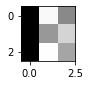

normalized region:


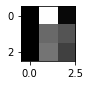

mean regions of 100 regions more=True or worst=False active for filter number: 5 :


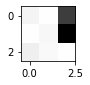

normalized region:


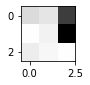

mean regions of 100 regions more=True or worst=False active for filter number: 10 :


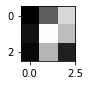

normalized region:


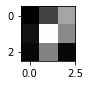

mean regions of 100 regions more=True or worst=False active for filter number: 15 :


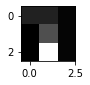

normalized region:


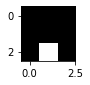

mean regions of 100 regions more=True or worst=False active for filter number: 20 :


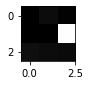

normalized region:


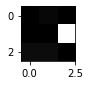

mean regions of 100 regions more=True or worst=False active for filter number: 25 :


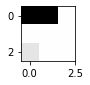

normalized region:


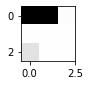

mean regions of 100 regions more=True or worst=False active for filter number: 30 :


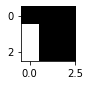

normalized region:


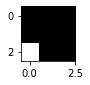

mean regions of 100 regions more=True or worst=False active for filter number: 35 :


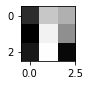

normalized region:


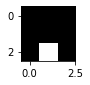

mean regions of 100 regions more=True or worst=False active for filter number: 40 :


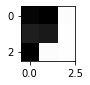

normalized region:


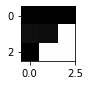

mean regions of 100 regions more=True or worst=False active for filter number: 45 :


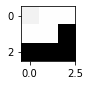

normalized region:


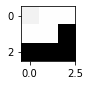

mean regions of 100 regions more=True or worst=False active for filter number: 50 :


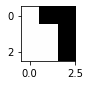

normalized region:


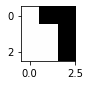

mean regions of 100 regions more=True or worst=False active for filter number: 55 :


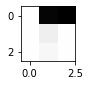

normalized region:


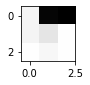

mean regions of 100 regions more=True or worst=False active for filter number: 60 :


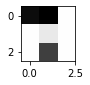

normalized region:


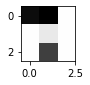

grid image
grid regions of 100 regions more=True or worst=False active for filter number: 0 :


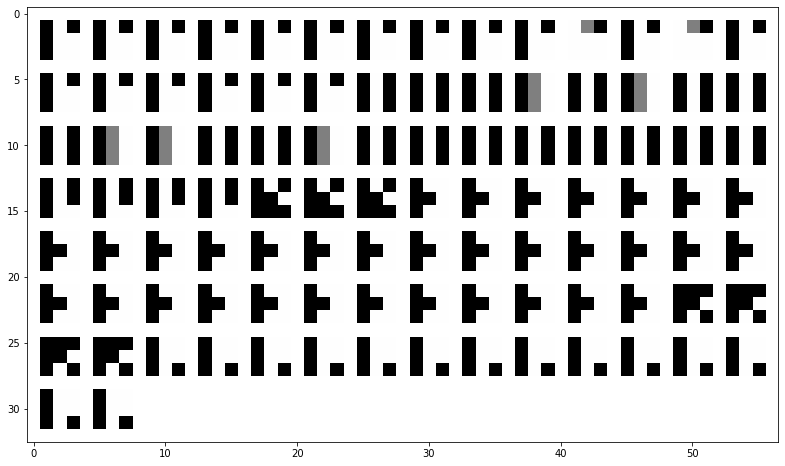

normalized regions:


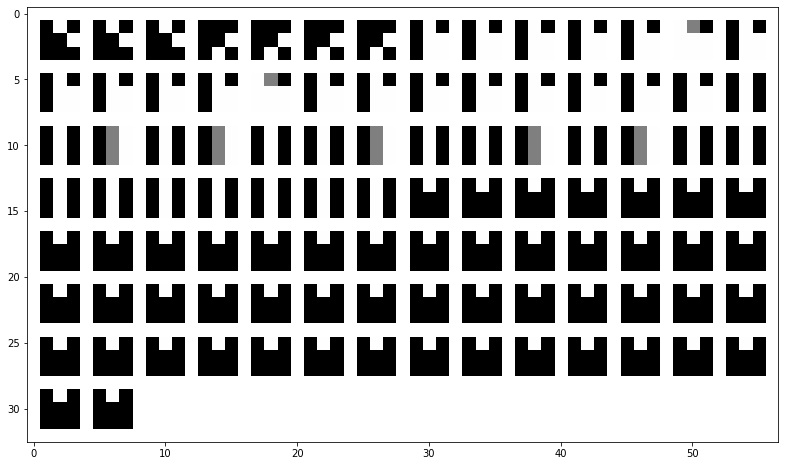

grid regions of 100 regions more=True or worst=False active for filter number: 5 :


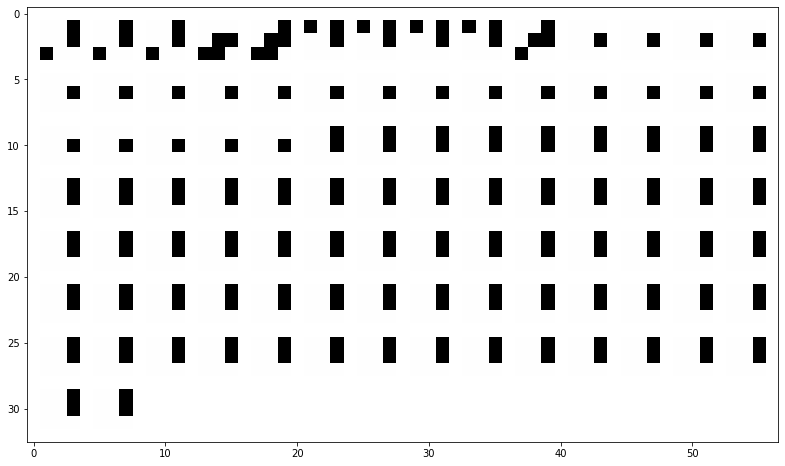

normalized regions:


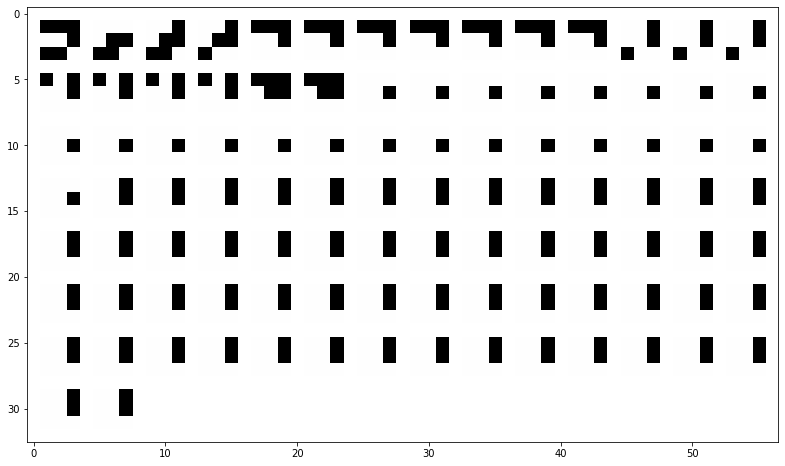

grid regions of 100 regions more=True or worst=False active for filter number: 10 :


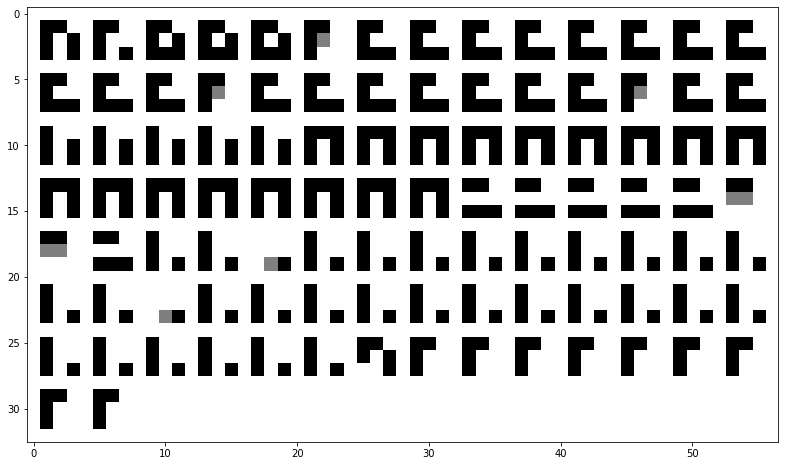

normalized regions:


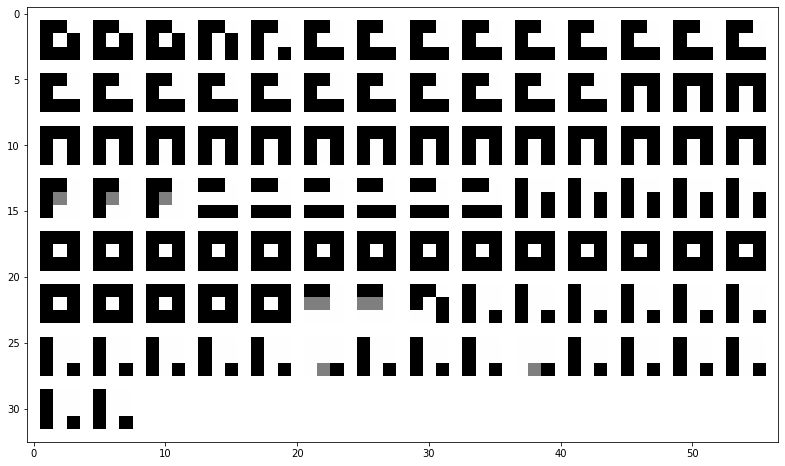

grid regions of 100 regions more=True or worst=False active for filter number: 15 :


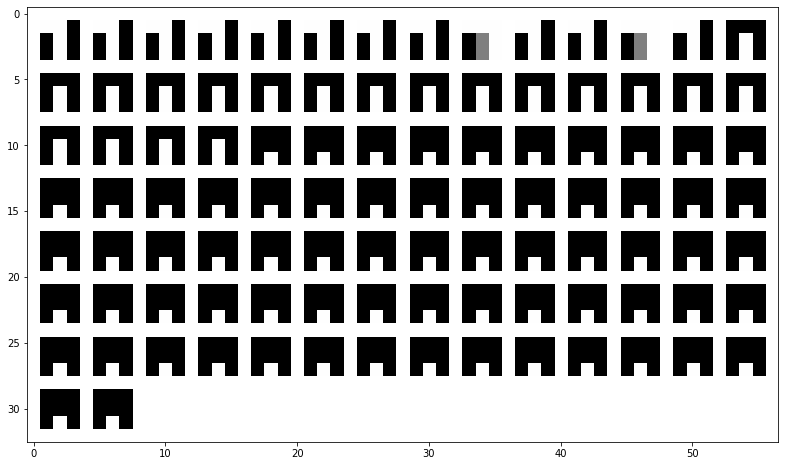

normalized regions:


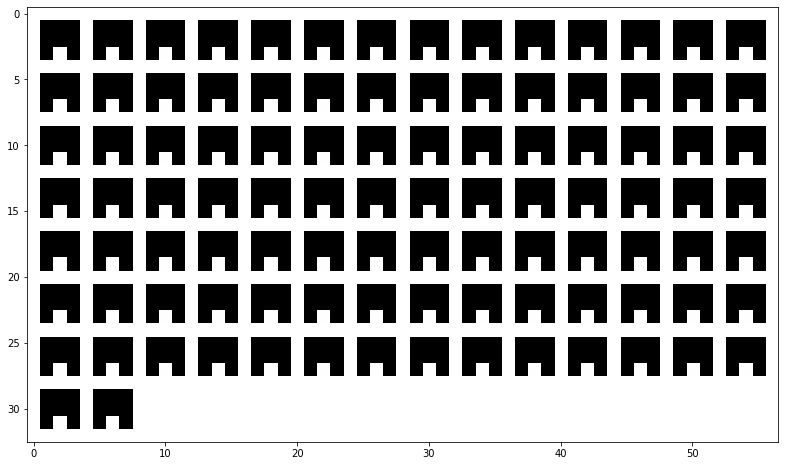

grid regions of 100 regions more=True or worst=False active for filter number: 20 :


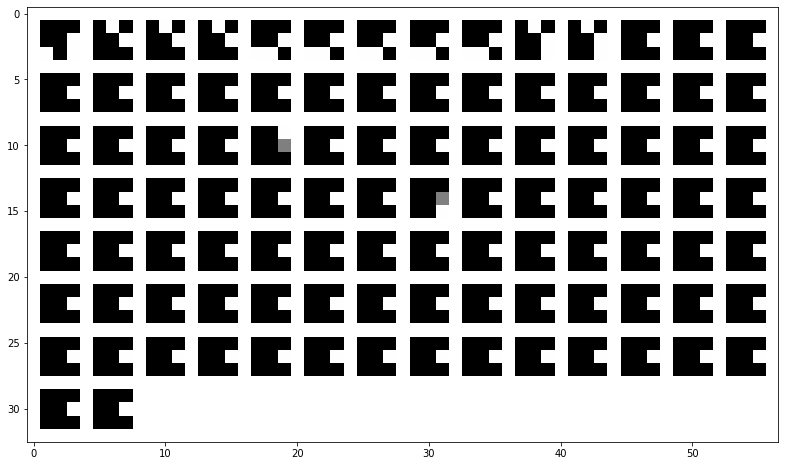

normalized regions:


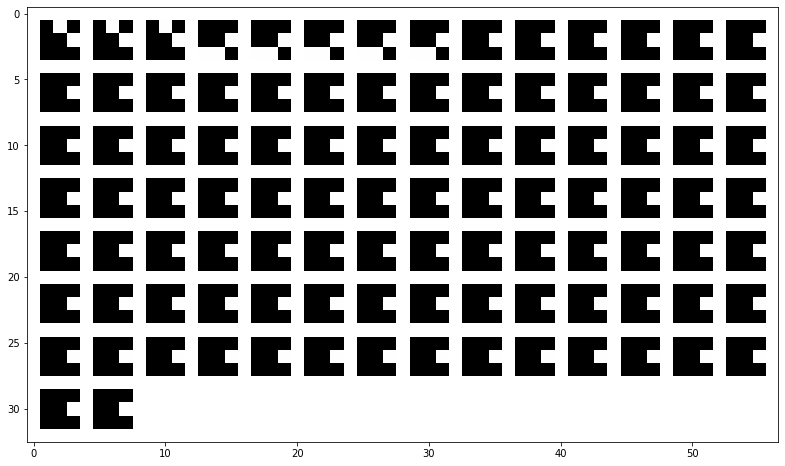

grid regions of 100 regions more=True or worst=False active for filter number: 25 :


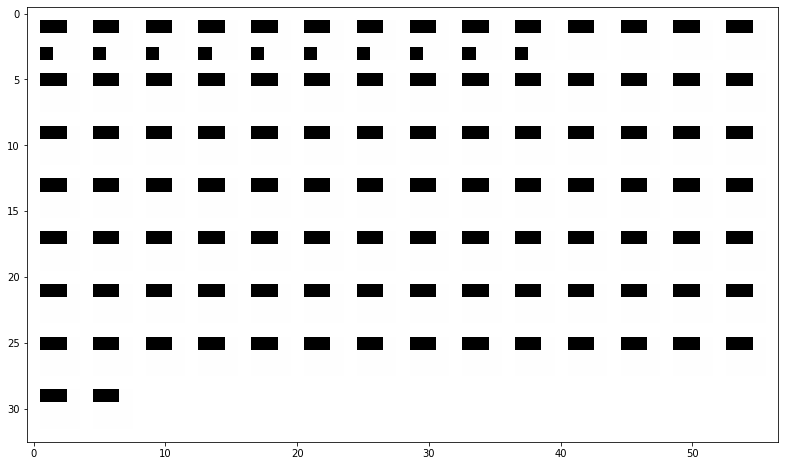

normalized regions:


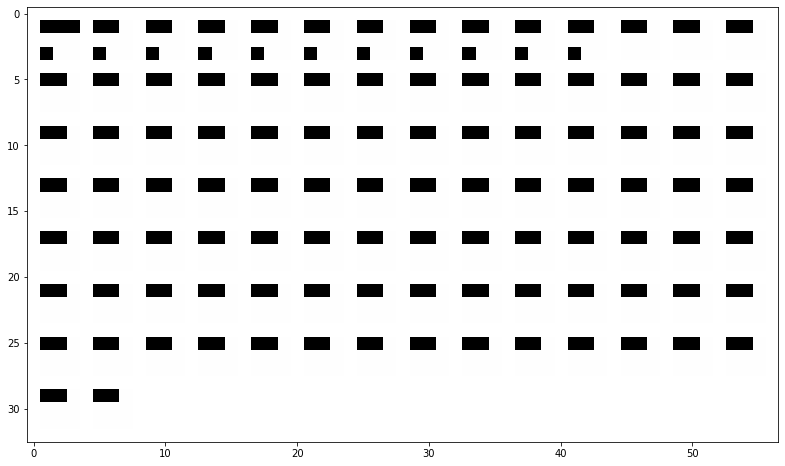

grid regions of 100 regions more=True or worst=False active for filter number: 30 :


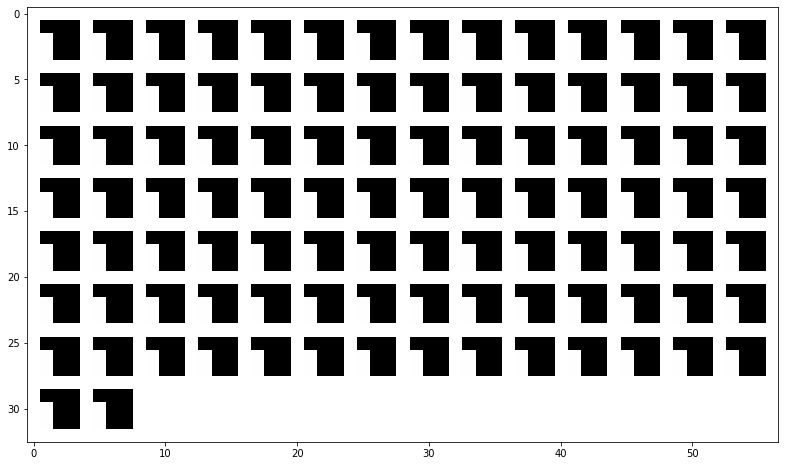

normalized regions:


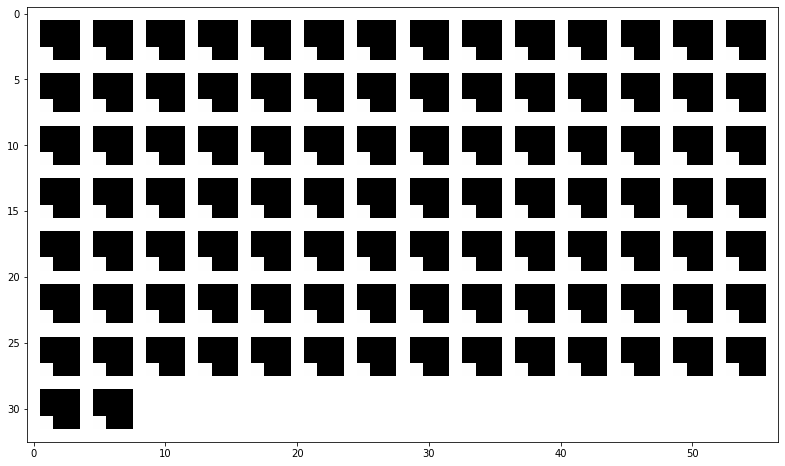

grid regions of 100 regions more=True or worst=False active for filter number: 35 :


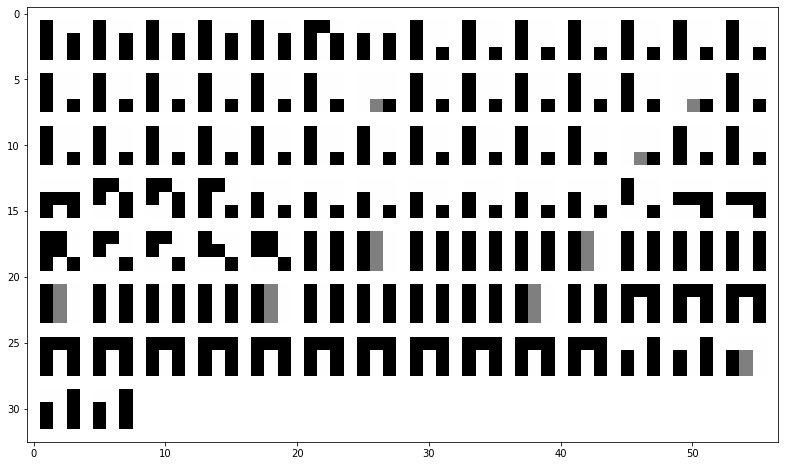

normalized regions:


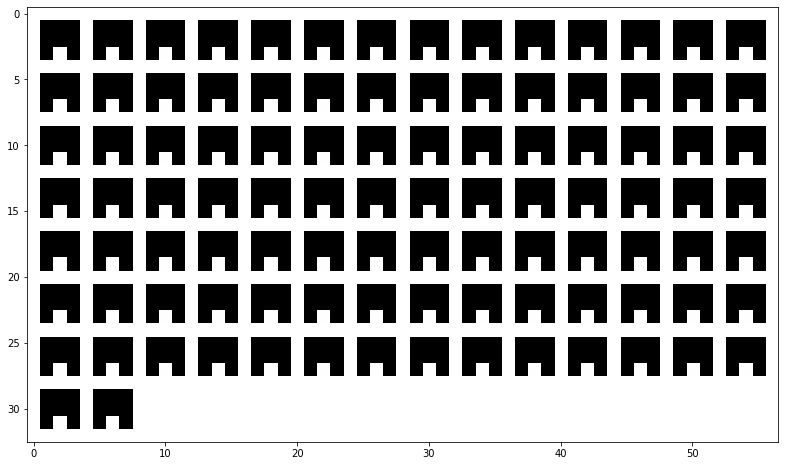

grid regions of 100 regions more=True or worst=False active for filter number: 40 :


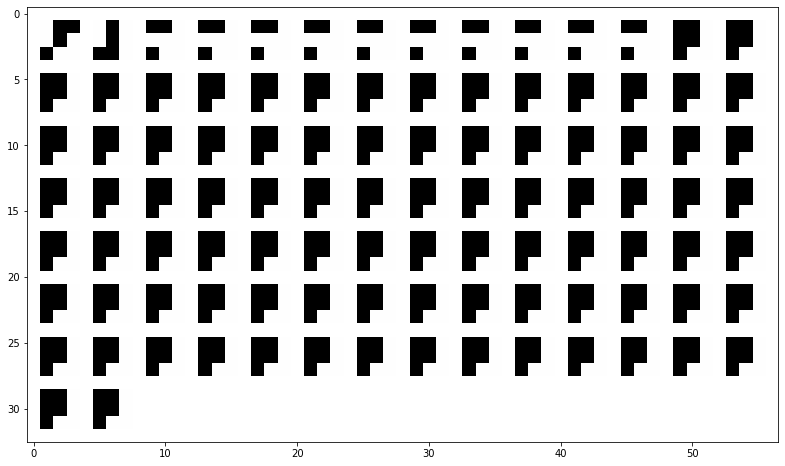

normalized regions:


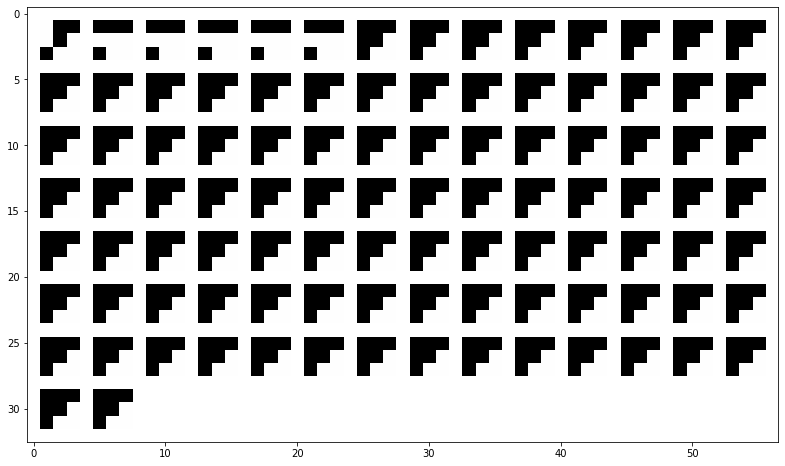

grid regions of 100 regions more=True or worst=False active for filter number: 45 :


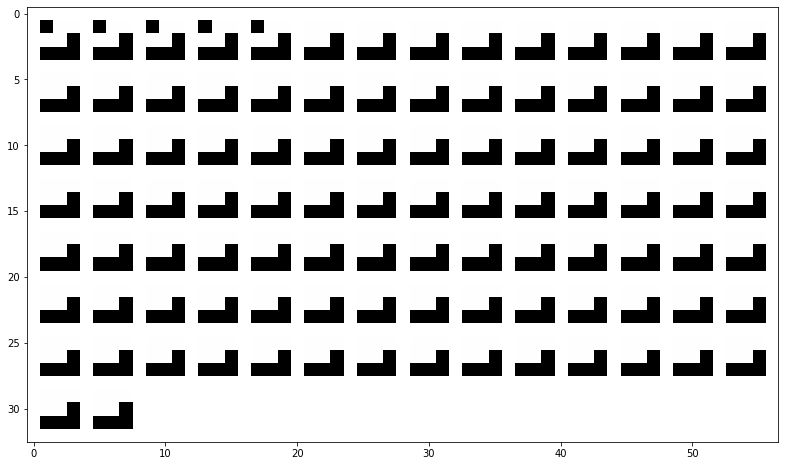

normalized regions:


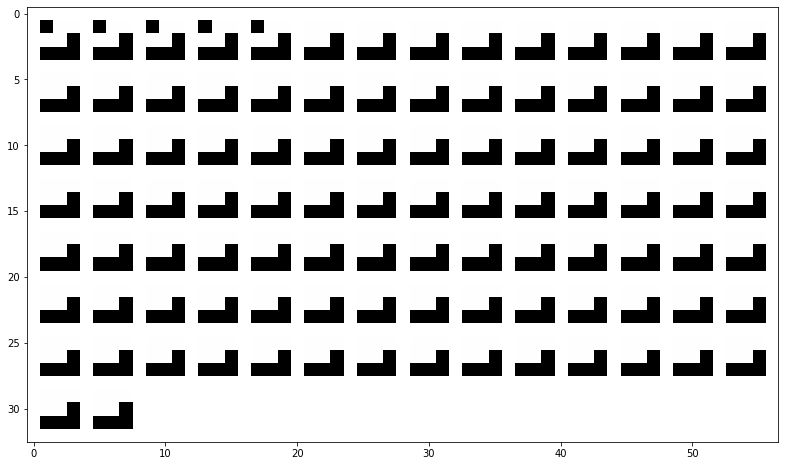

grid regions of 100 regions more=True or worst=False active for filter number: 50 :


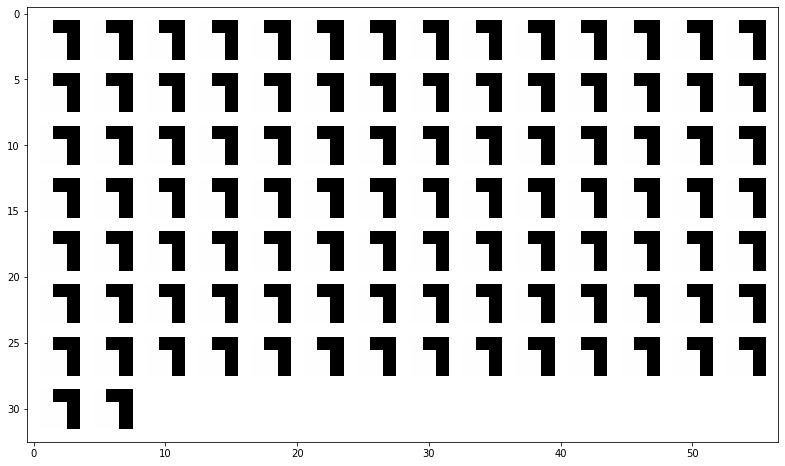

normalized regions:


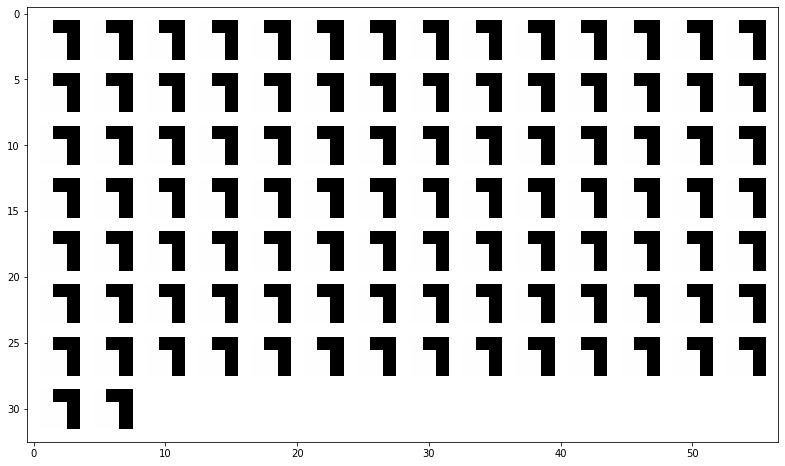

grid regions of 100 regions more=True or worst=False active for filter number: 55 :


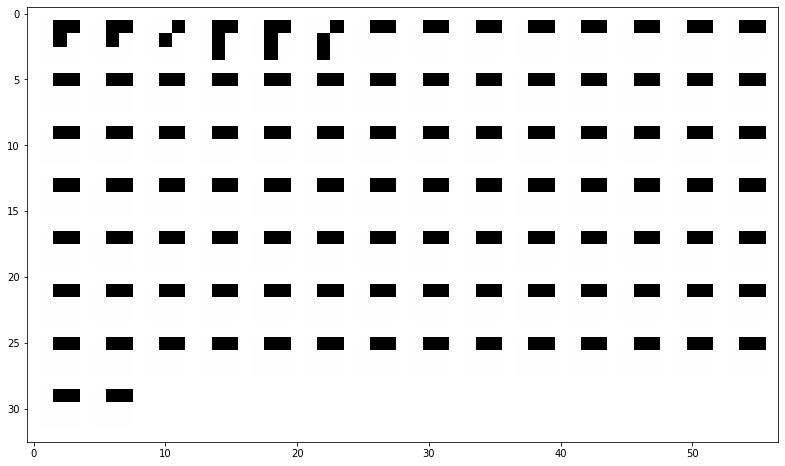

normalized regions:


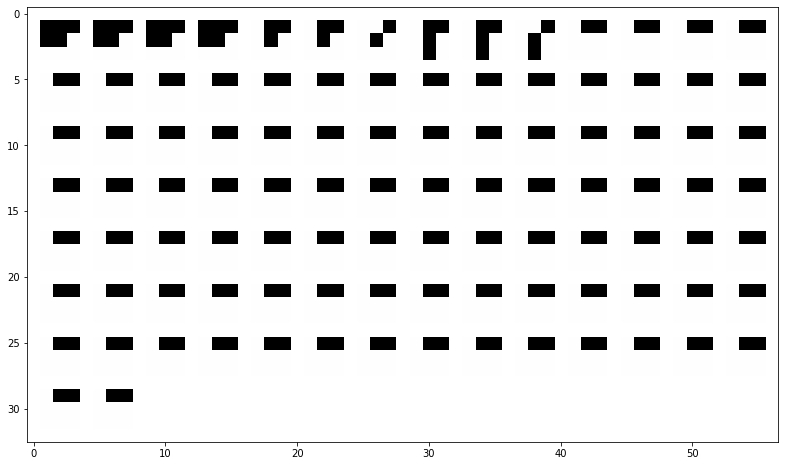

grid regions of 100 regions more=True or worst=False active for filter number: 60 :


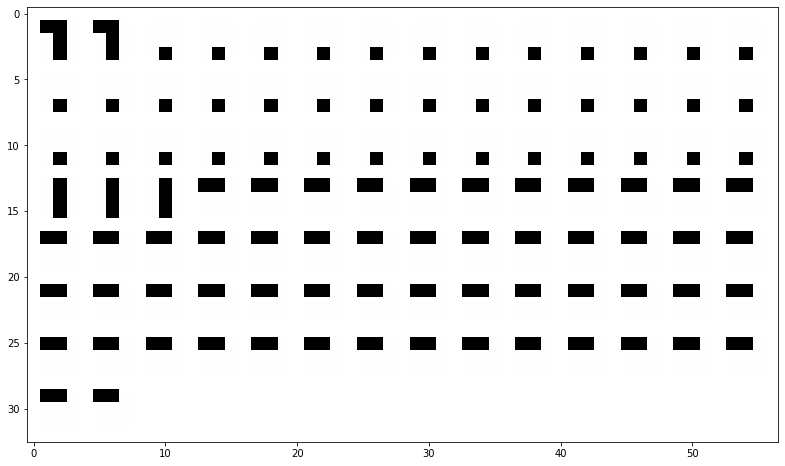

normalized regions:


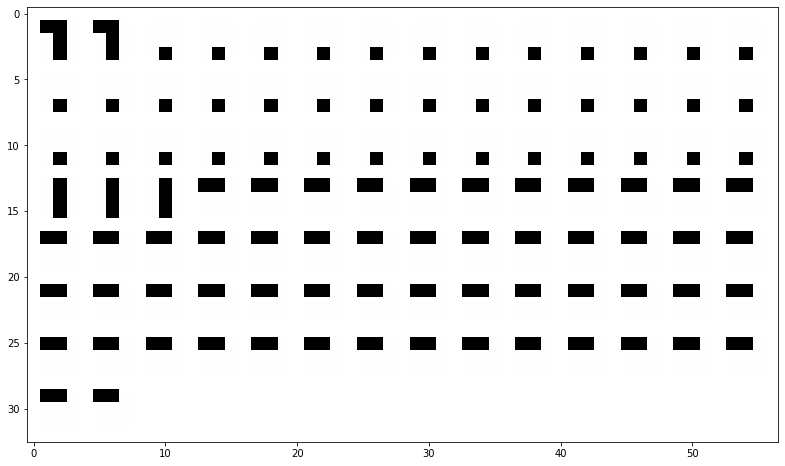

In [0]:
# regions and activation of interest
list_filter = list_filter_interest_layer1
regions = region_layer1_no_binary_stride
activations = activation_layer1_no_binary_stride
activations_normalized = activation_layer1_no_binary_normalized_stride

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

Interest of filters: [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 80, 85, 90, 95, 100, 105, 110, 115, 120, 125]
Consider 10% image regions = 100 images
Consider 10% image regions = 100 images
mean image:
mean regions of 100 regions more=True or worst=False active for filter number: 0 :


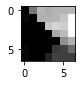

normalized region:


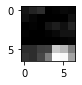

mean regions of 100 regions more=True or worst=False active for filter number: 5 :


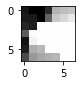

normalized region:


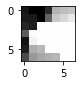

mean regions of 100 regions more=True or worst=False active for filter number: 10 :


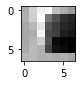

normalized region:


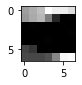

mean regions of 100 regions more=True or worst=False active for filter number: 15 :


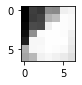

normalized region:


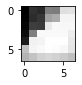

mean regions of 100 regions more=True or worst=False active for filter number: 20 :


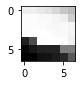

normalized region:


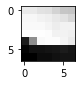

mean regions of 100 regions more=True or worst=False active for filter number: 25 :


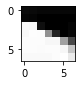

normalized region:


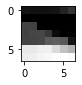

mean regions of 100 regions more=True or worst=False active for filter number: 30 :


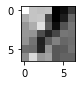

normalized region:


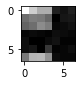

mean regions of 100 regions more=True or worst=False active for filter number: 35 :


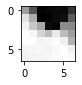

normalized region:


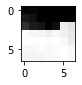

mean regions of 100 regions more=True or worst=False active for filter number: 40 :


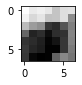

normalized region:


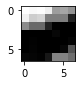

mean regions of 100 regions more=True or worst=False active for filter number: 45 :


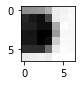

normalized region:


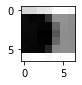

mean regions of 100 regions more=True or worst=False active for filter number: 50 :


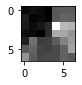

normalized region:


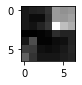

mean regions of 100 regions more=True or worst=False active for filter number: 55 :


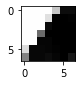

normalized region:


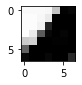

mean regions of 100 regions more=True or worst=False active for filter number: 60 :


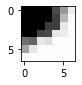

normalized region:


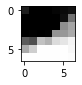

mean regions of 100 regions more=True or worst=False active for filter number: 65 :


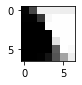

normalized region:


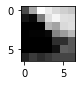

mean regions of 100 regions more=True or worst=False active for filter number: 70 :


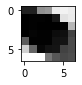

normalized region:


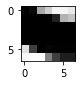

mean regions of 100 regions more=True or worst=False active for filter number: 80 :


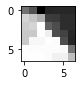

normalized region:


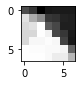

mean regions of 100 regions more=True or worst=False active for filter number: 85 :


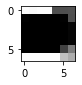

normalized region:


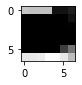

mean regions of 100 regions more=True or worst=False active for filter number: 90 :


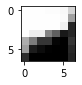

normalized region:


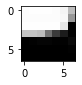

mean regions of 100 regions more=True or worst=False active for filter number: 95 :


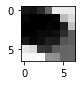

normalized region:


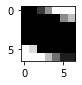

mean regions of 100 regions more=True or worst=False active for filter number: 100 :


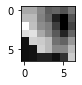

normalized region:


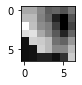

mean regions of 100 regions more=True or worst=False active for filter number: 105 :


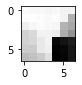

normalized region:


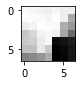

mean regions of 100 regions more=True or worst=False active for filter number: 110 :


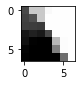

normalized region:


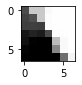

mean regions of 100 regions more=True or worst=False active for filter number: 115 :


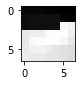

normalized region:


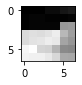

mean regions of 100 regions more=True or worst=False active for filter number: 120 :


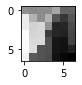

normalized region:


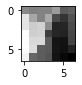

mean regions of 100 regions more=True or worst=False active for filter number: 125 :


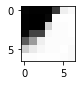

normalized region:


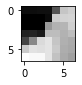

grid image
grid regions of 100 regions more=True or worst=False active for filter number: 0 :


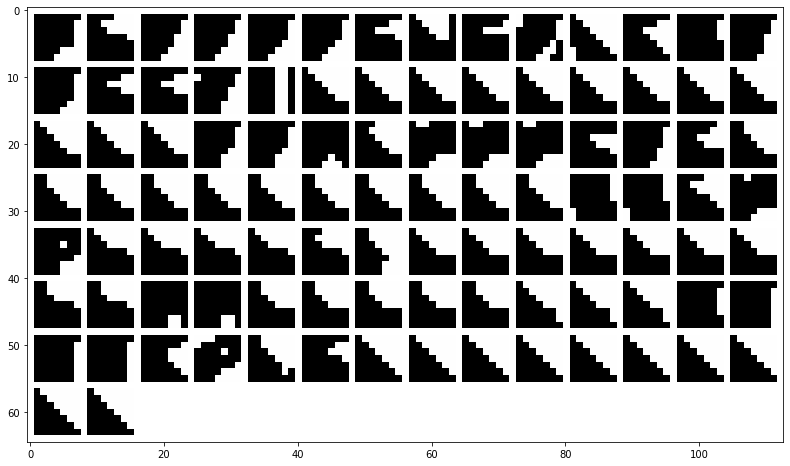

normalized regions:


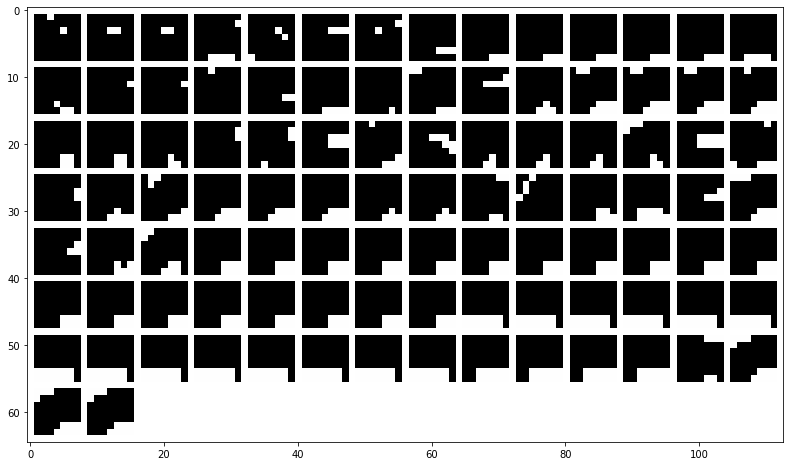

grid regions of 100 regions more=True or worst=False active for filter number: 5 :


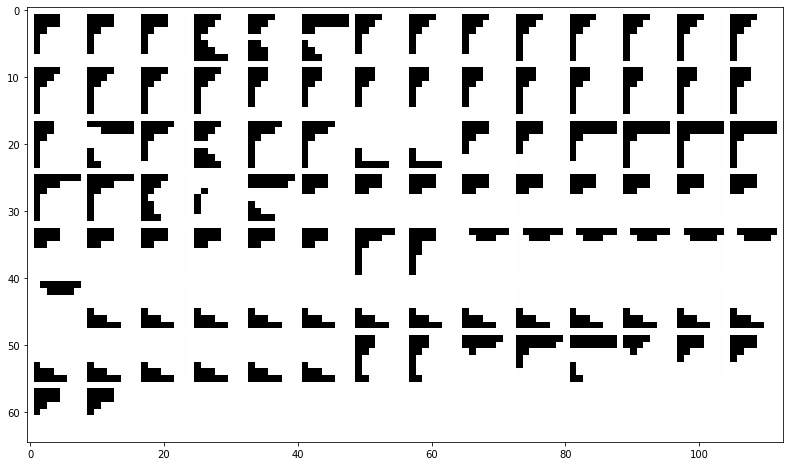

normalized regions:


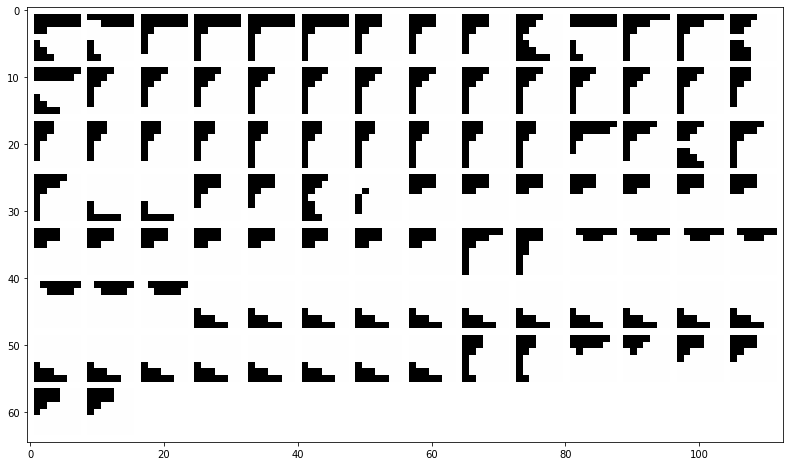

grid regions of 100 regions more=True or worst=False active for filter number: 10 :


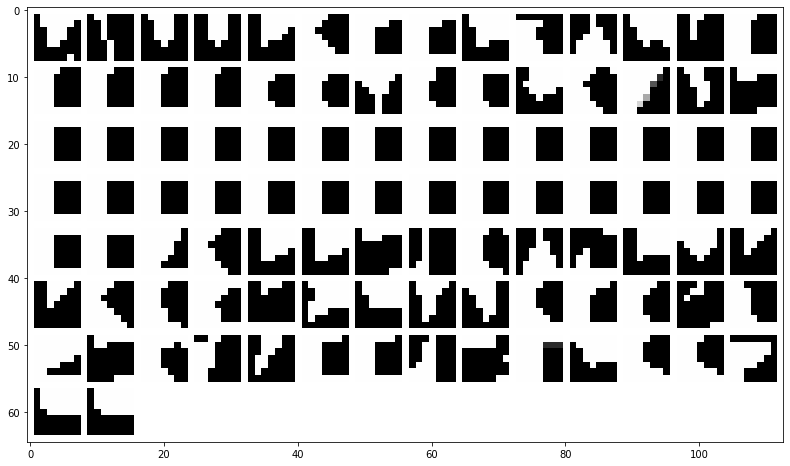

normalized regions:


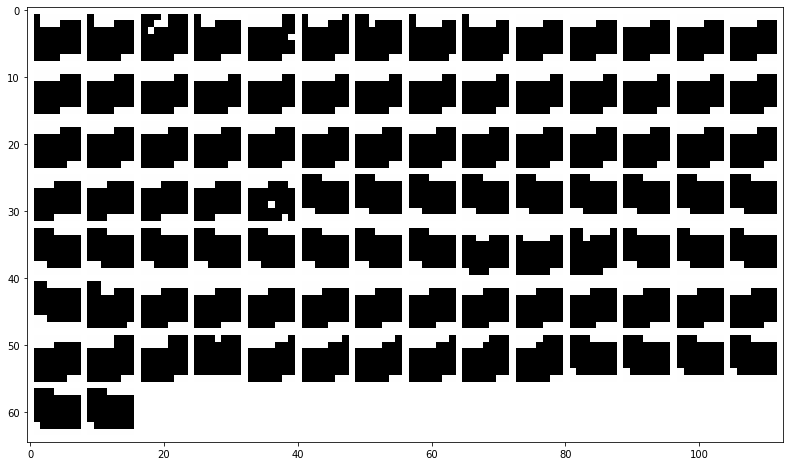

grid regions of 100 regions more=True or worst=False active for filter number: 15 :


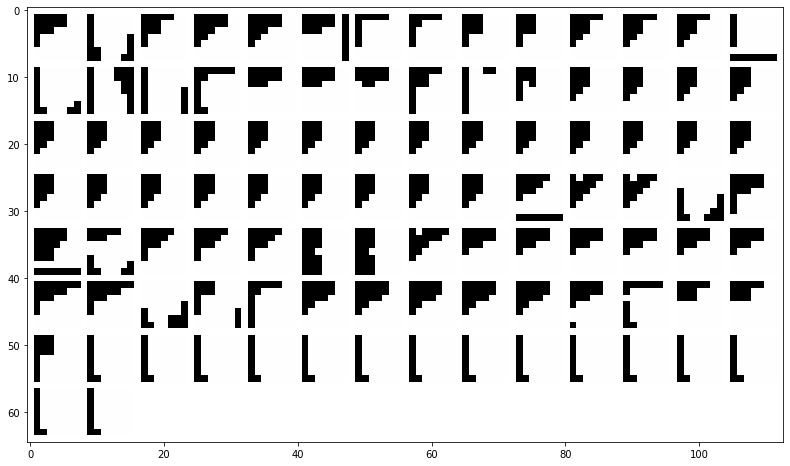

normalized regions:


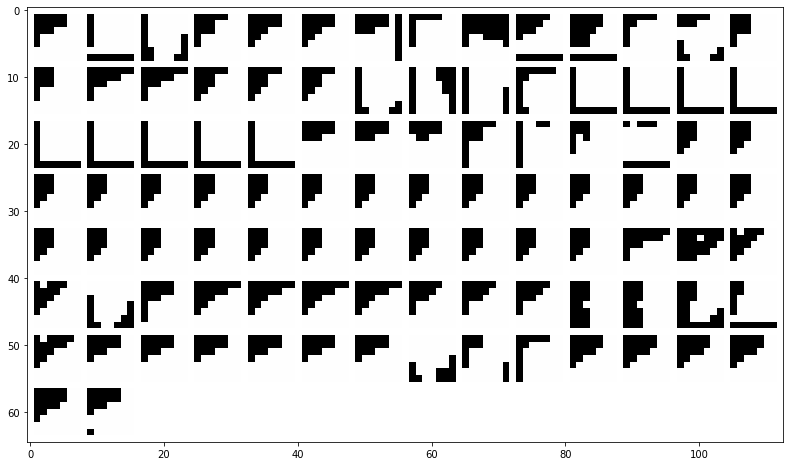

grid regions of 100 regions more=True or worst=False active for filter number: 20 :


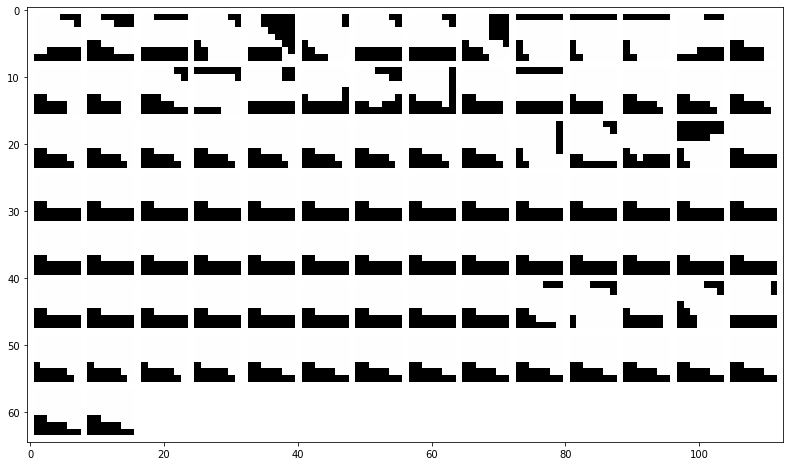

normalized regions:


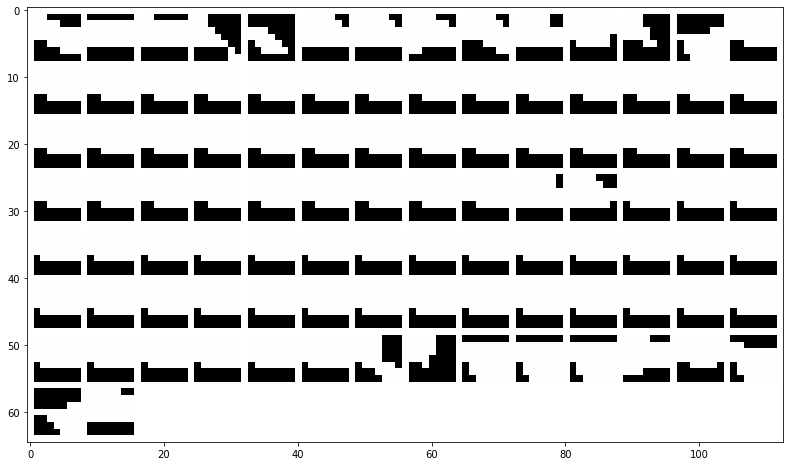

grid regions of 100 regions more=True or worst=False active for filter number: 25 :


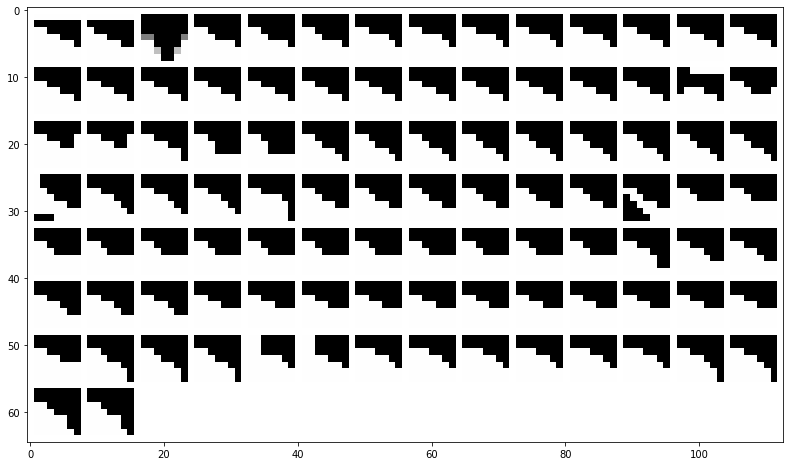

normalized regions:


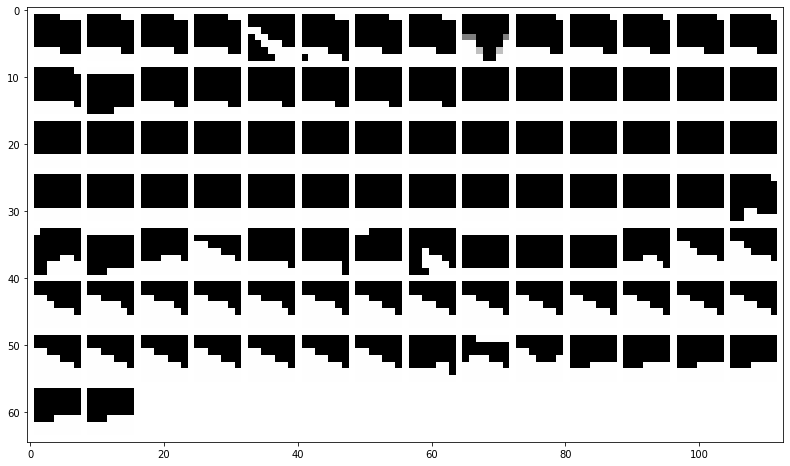

grid regions of 100 regions more=True or worst=False active for filter number: 30 :


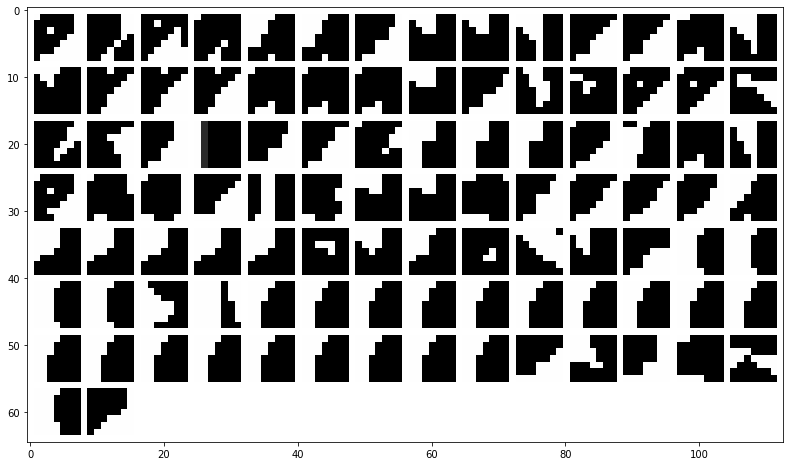

normalized regions:


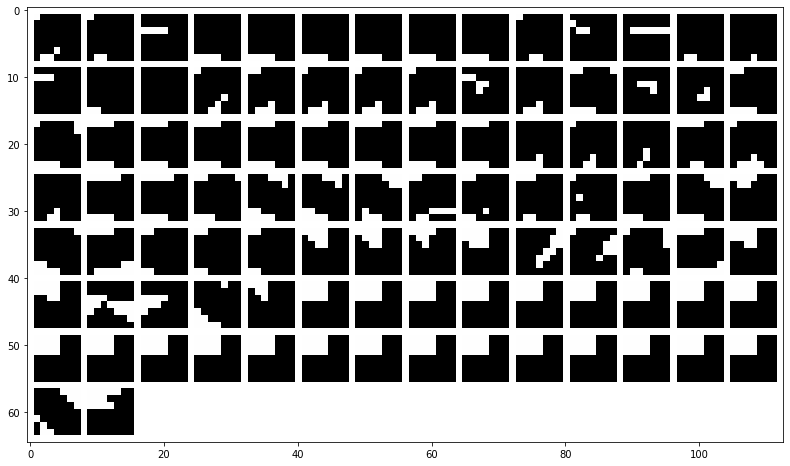

grid regions of 100 regions more=True or worst=False active for filter number: 35 :


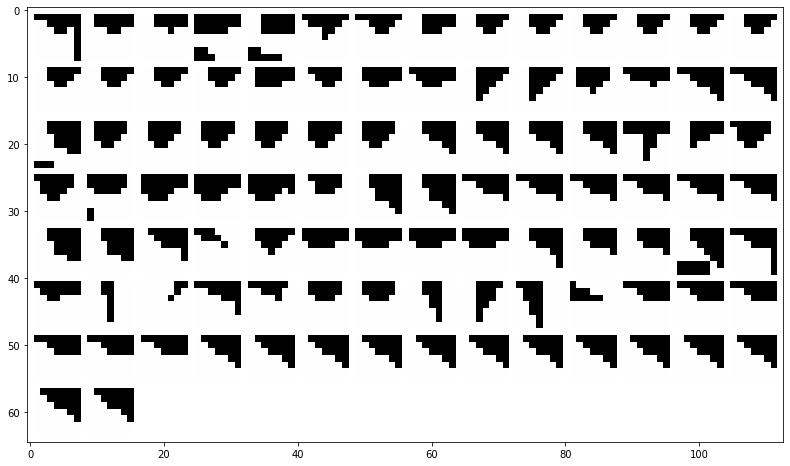

normalized regions:


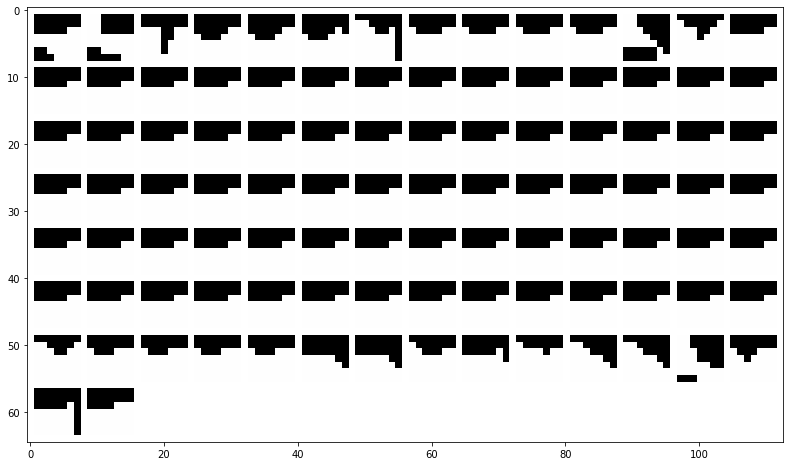

grid regions of 100 regions more=True or worst=False active for filter number: 40 :


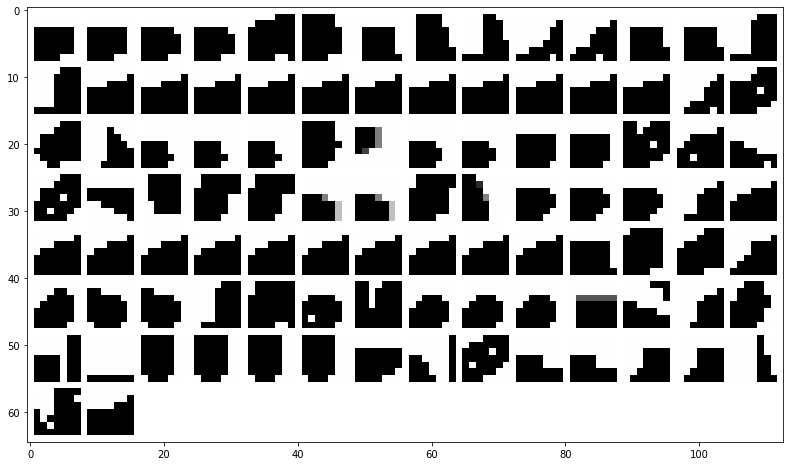

normalized regions:


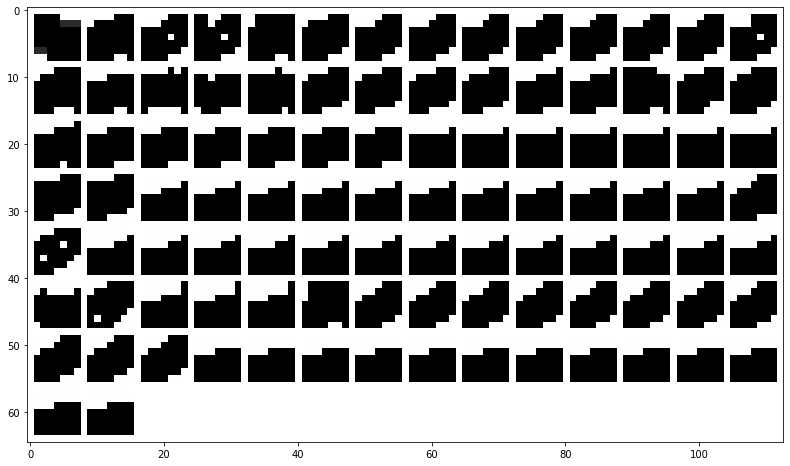

grid regions of 100 regions more=True or worst=False active for filter number: 45 :


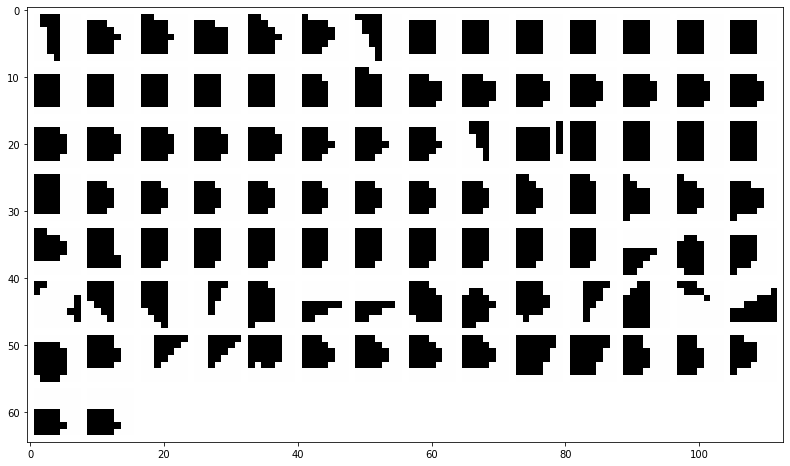

normalized regions:


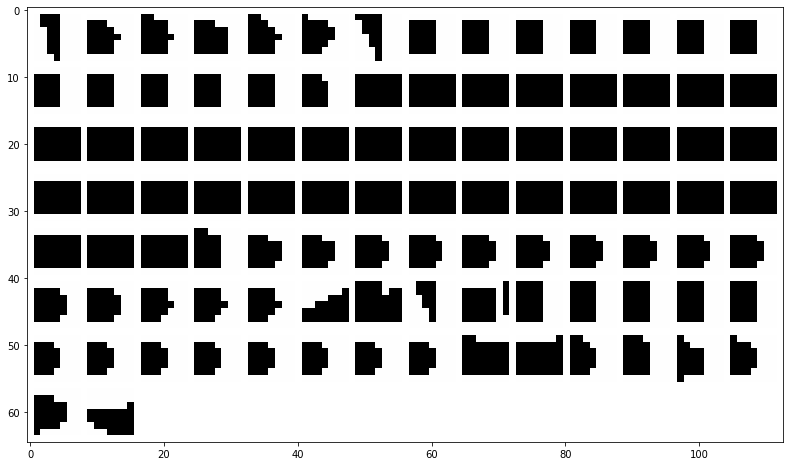

grid regions of 100 regions more=True or worst=False active for filter number: 50 :


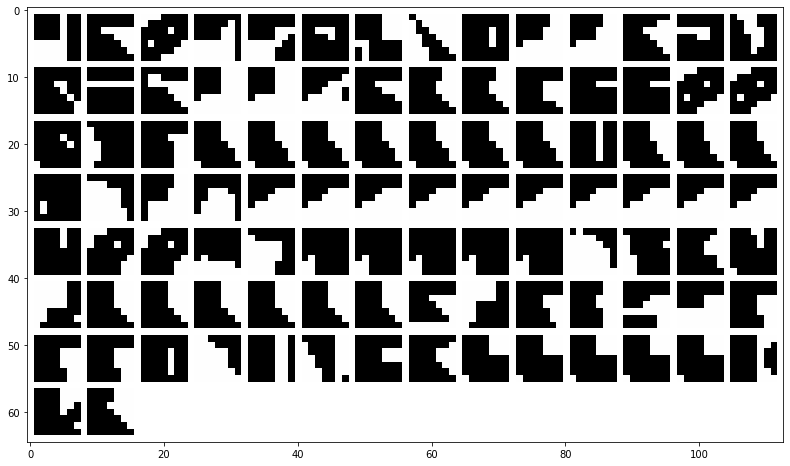

normalized regions:


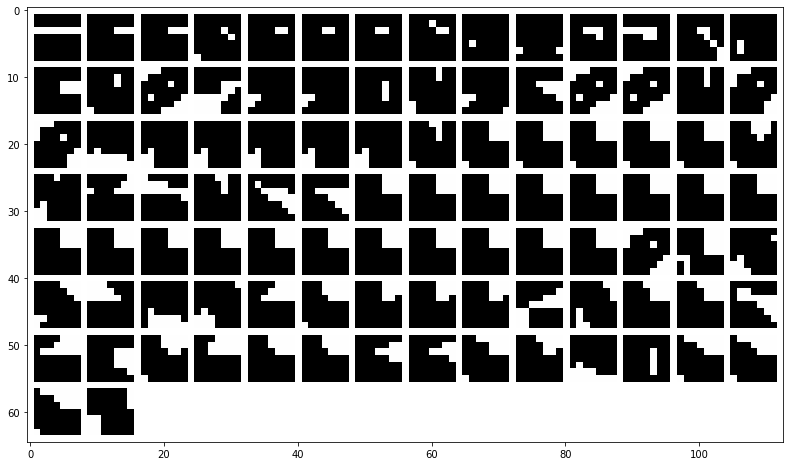

grid regions of 100 regions more=True or worst=False active for filter number: 55 :


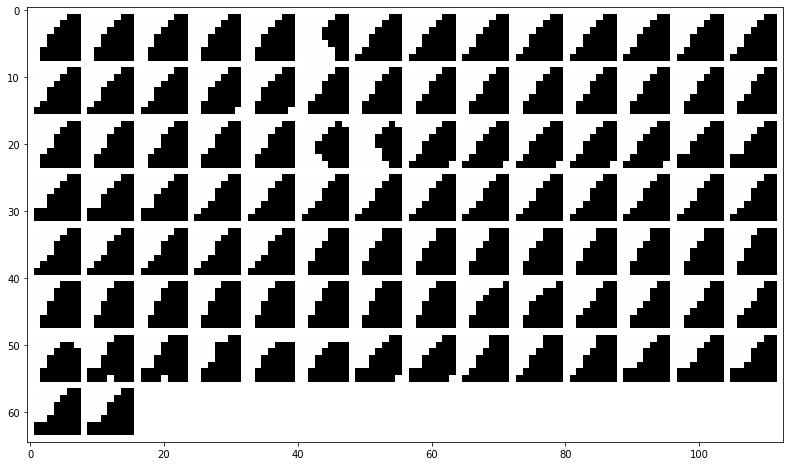

normalized regions:


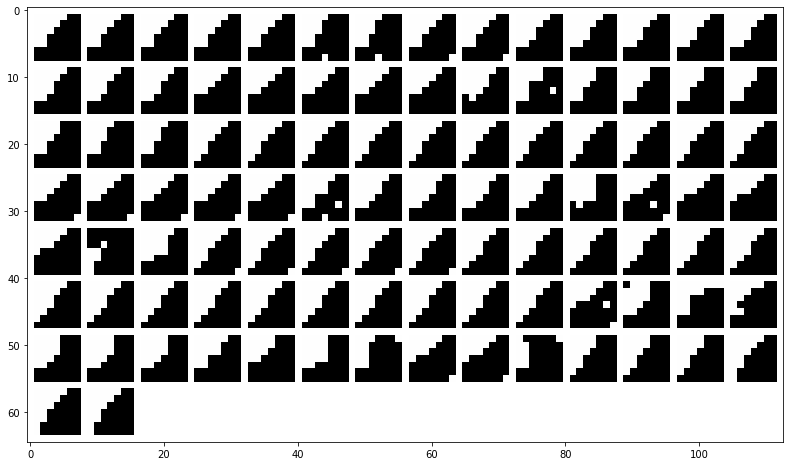

grid regions of 100 regions more=True or worst=False active for filter number: 60 :


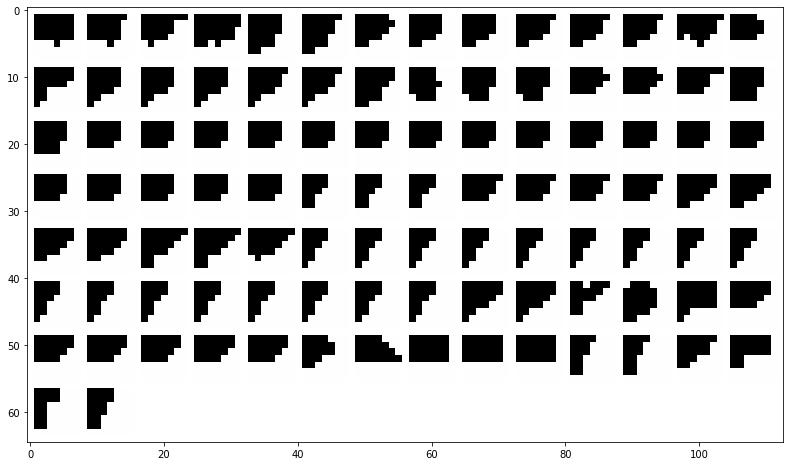

normalized regions:


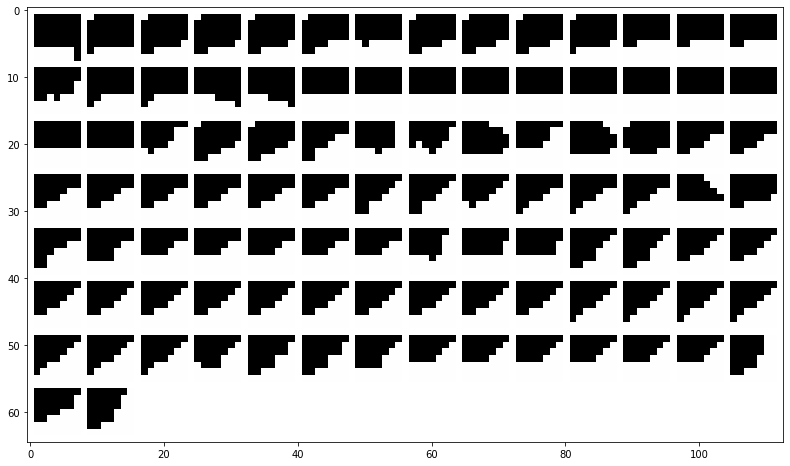

grid regions of 100 regions more=True or worst=False active for filter number: 65 :


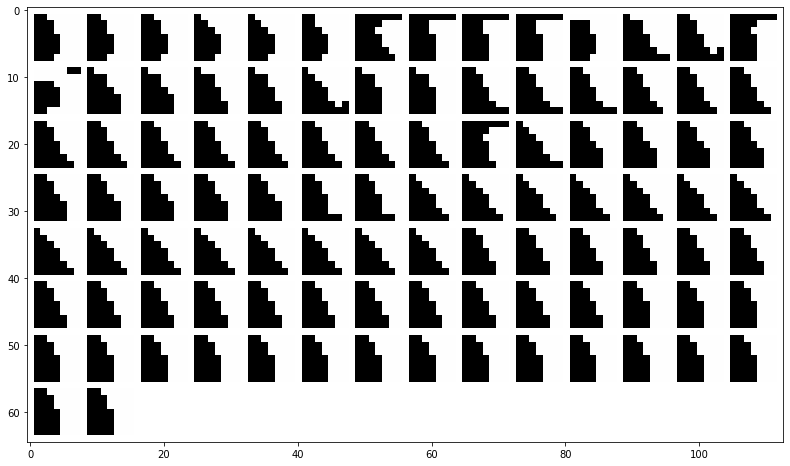

normalized regions:


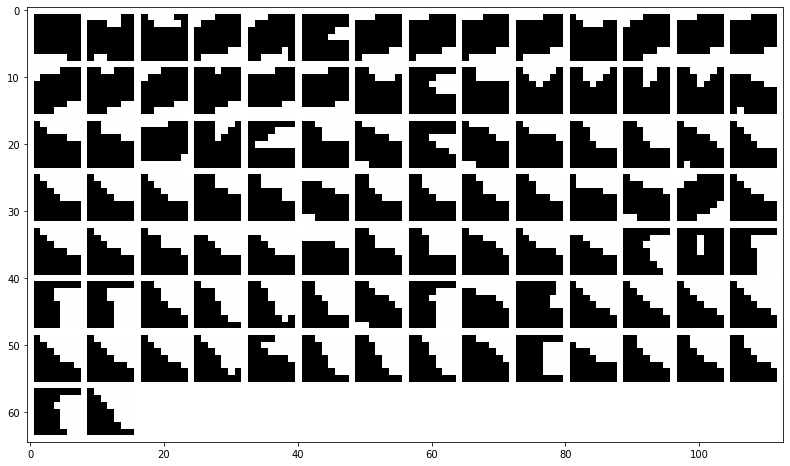

grid regions of 100 regions more=True or worst=False active for filter number: 70 :


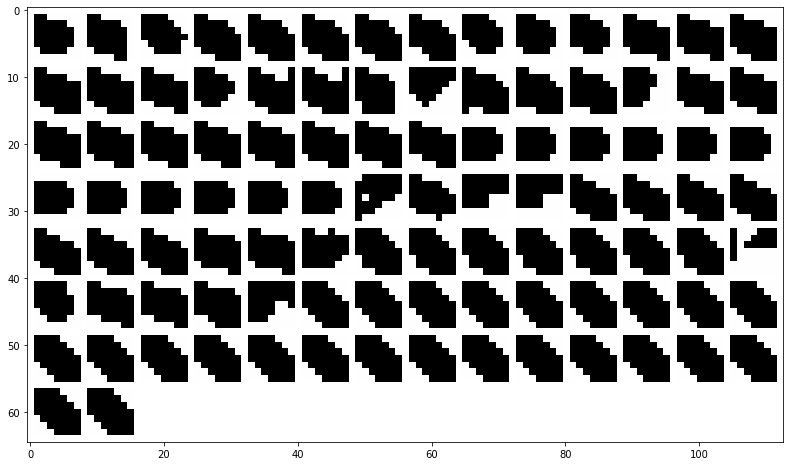

normalized regions:


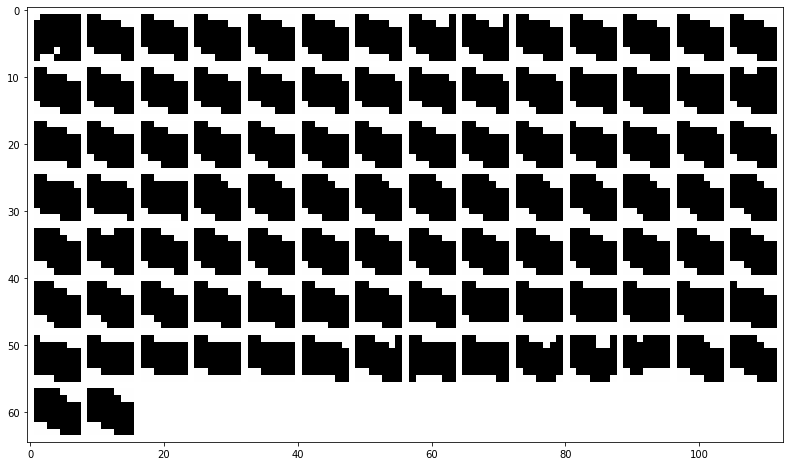

grid regions of 100 regions more=True or worst=False active for filter number: 80 :


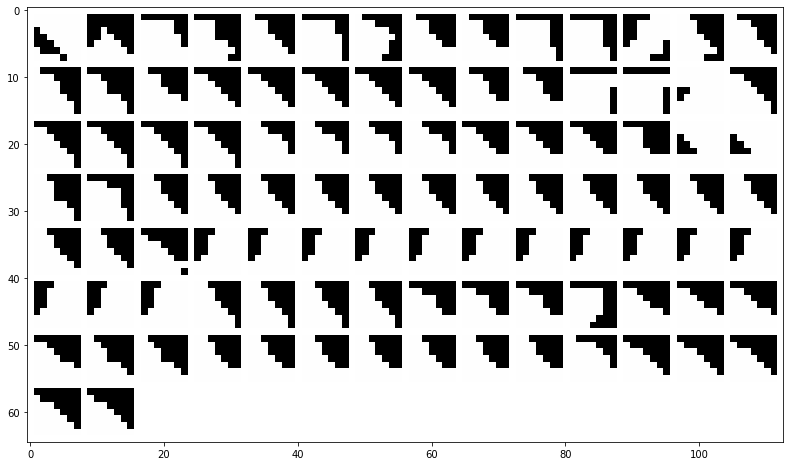

normalized regions:


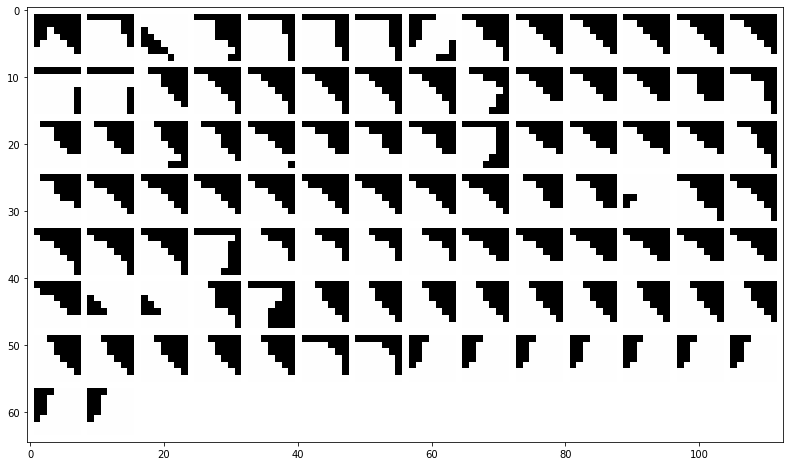

grid regions of 100 regions more=True or worst=False active for filter number: 85 :


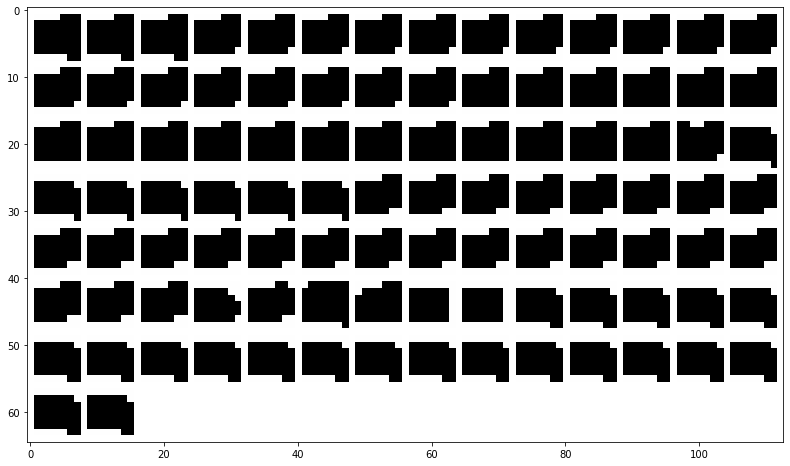

normalized regions:


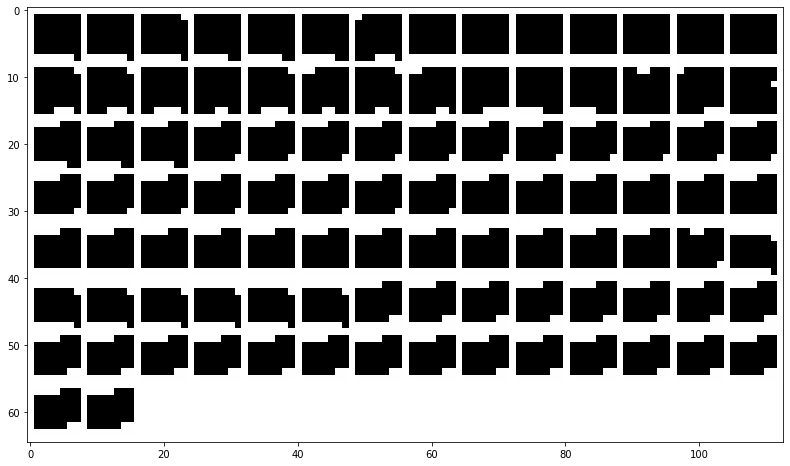

grid regions of 100 regions more=True or worst=False active for filter number: 90 :


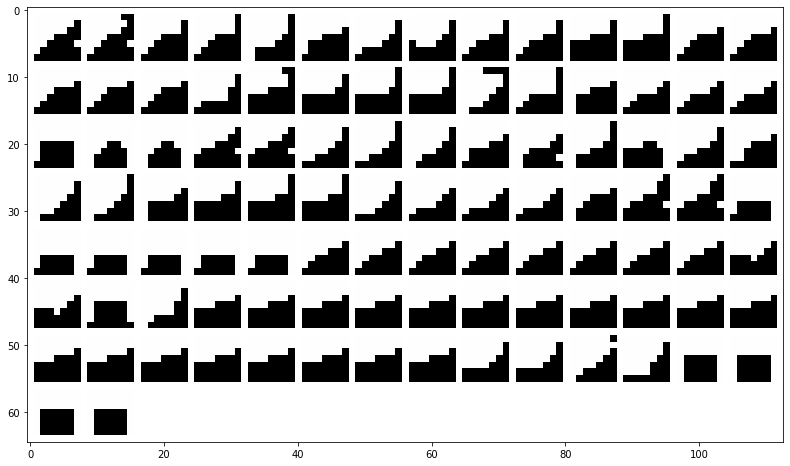

normalized regions:


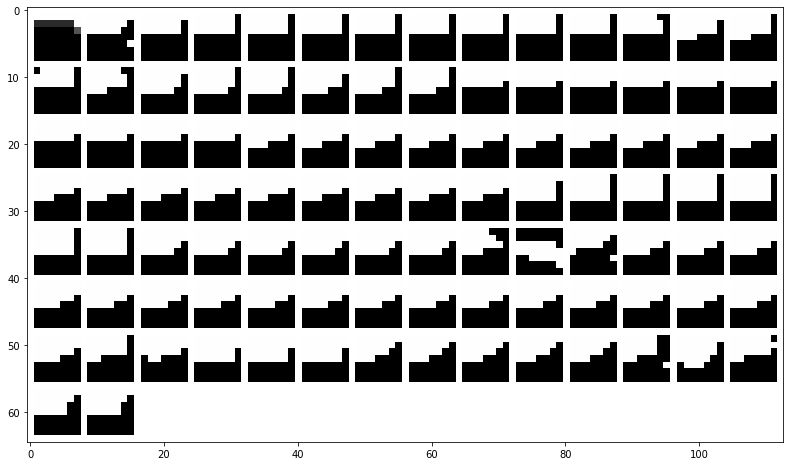

grid regions of 100 regions more=True or worst=False active for filter number: 95 :


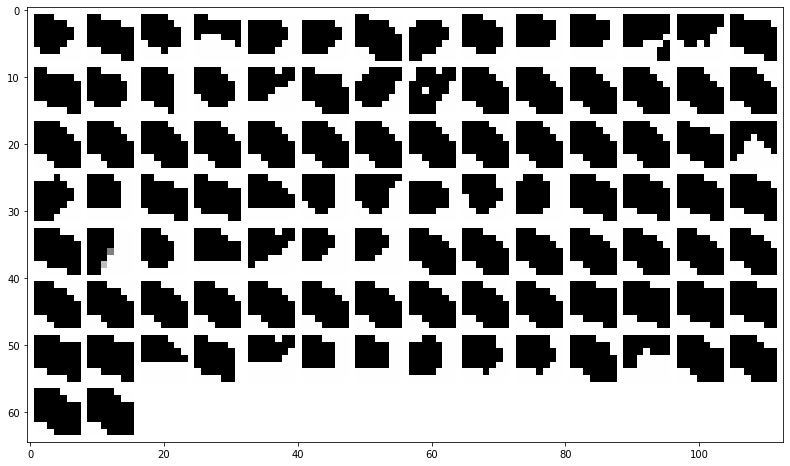

normalized regions:


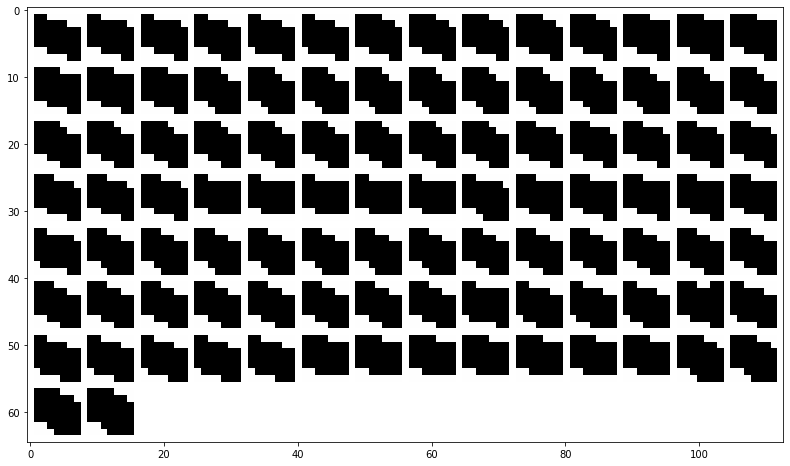

grid regions of 100 regions more=True or worst=False active for filter number: 100 :


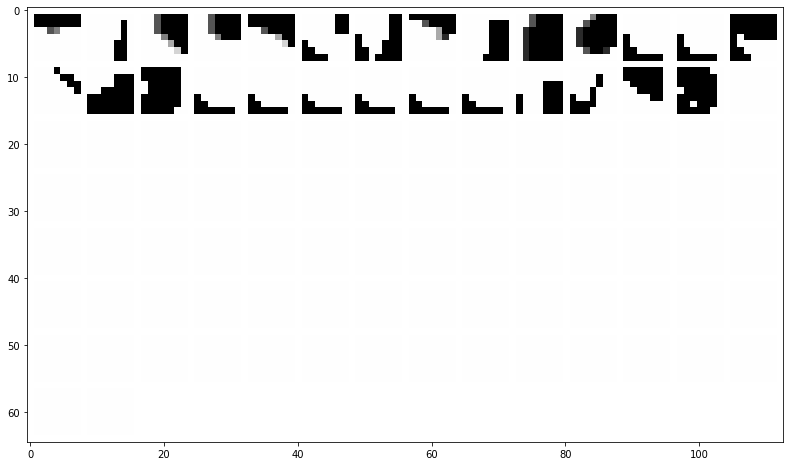

normalized regions:


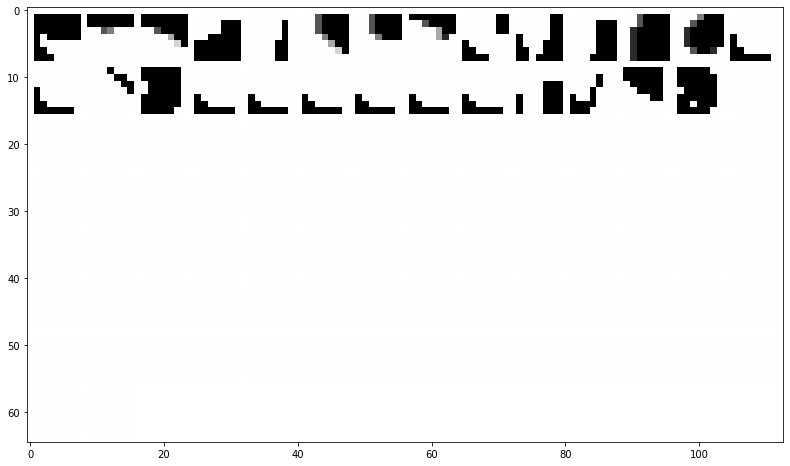

grid regions of 100 regions more=True or worst=False active for filter number: 105 :


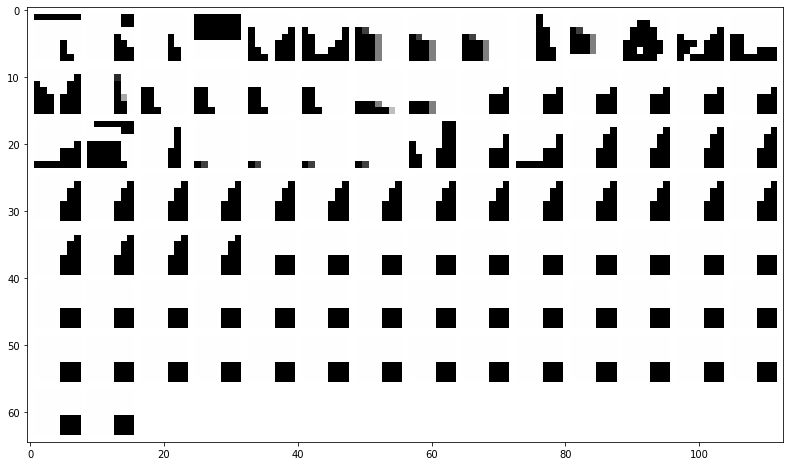

normalized regions:


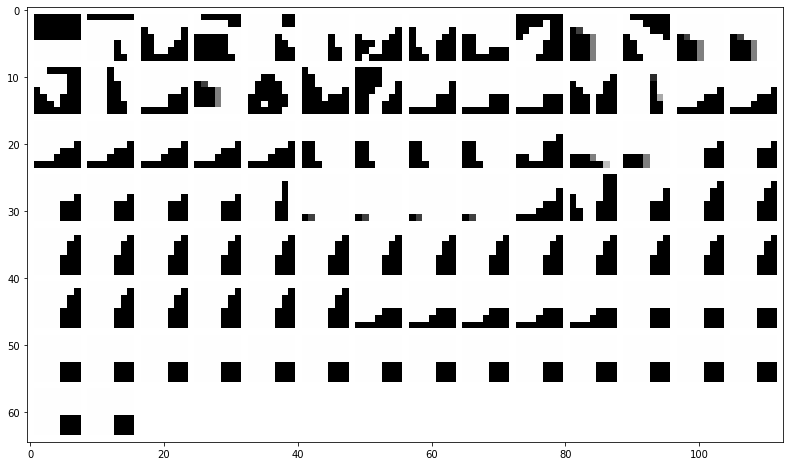

grid regions of 100 regions more=True or worst=False active for filter number: 110 :


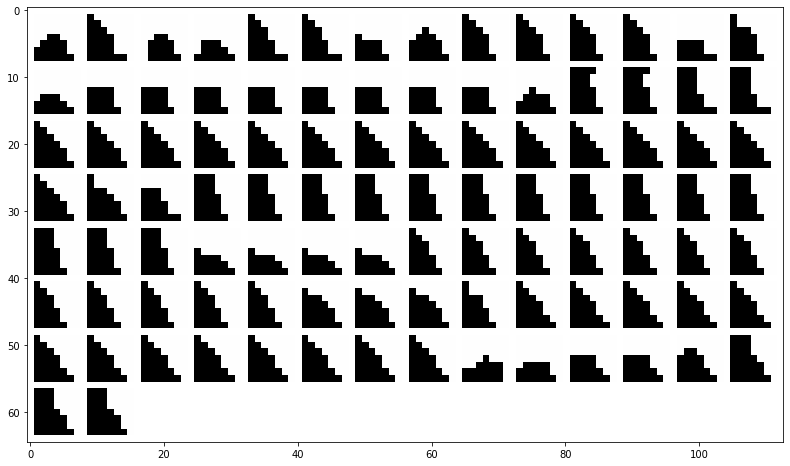

normalized regions:


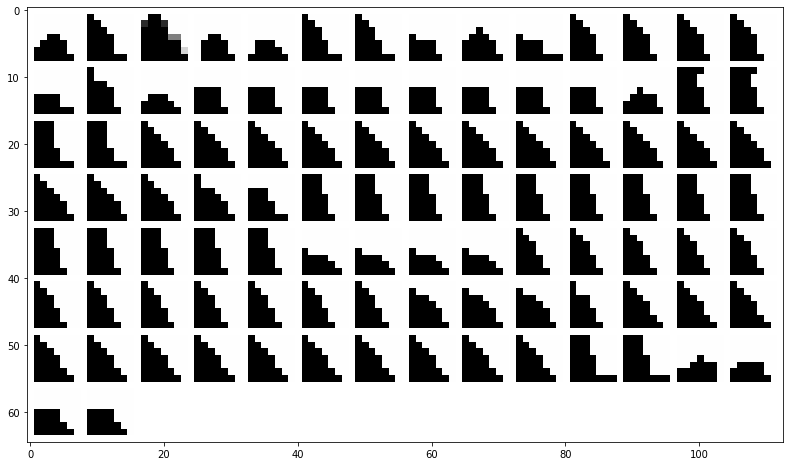

grid regions of 100 regions more=True or worst=False active for filter number: 115 :


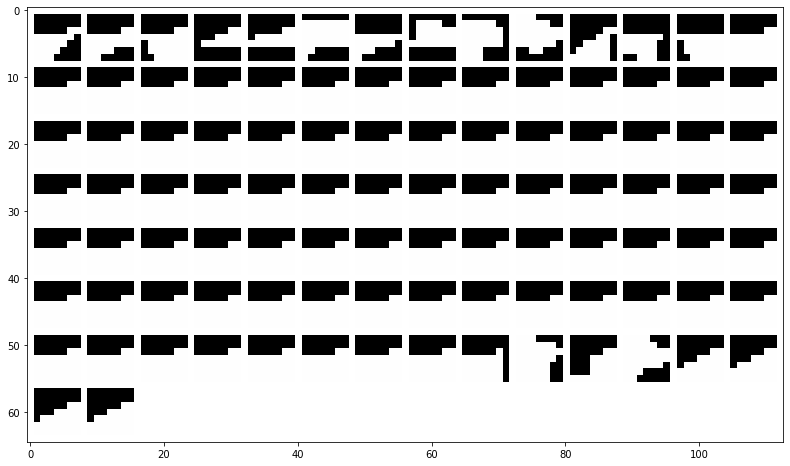

normalized regions:


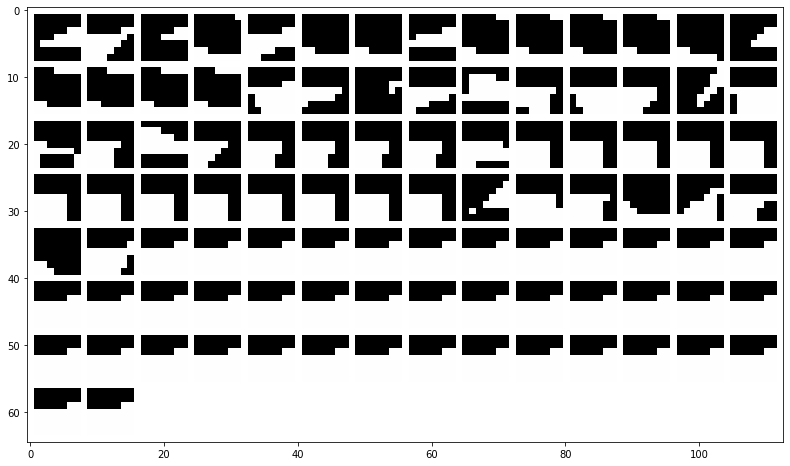

grid regions of 100 regions more=True or worst=False active for filter number: 120 :


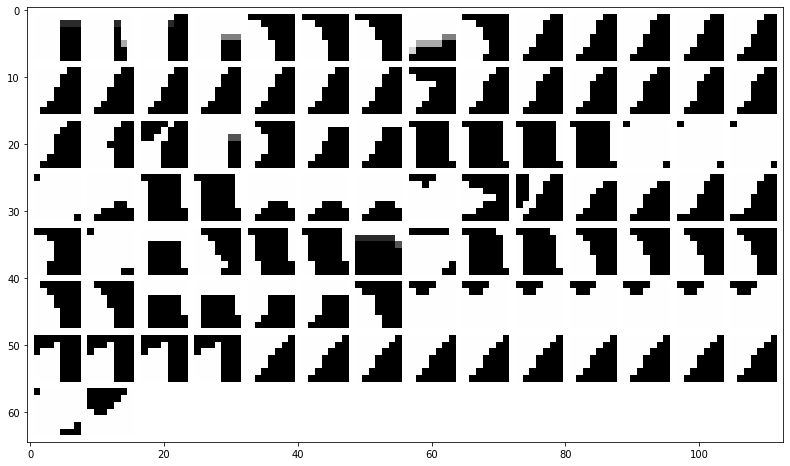

normalized regions:


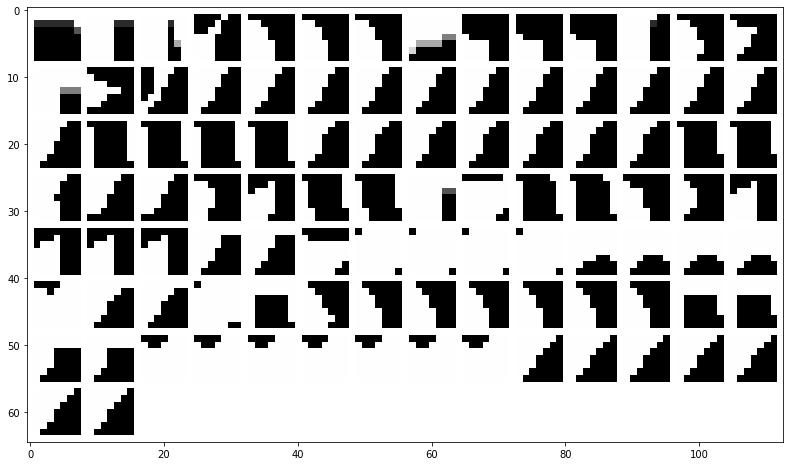

grid regions of 100 regions more=True or worst=False active for filter number: 125 :


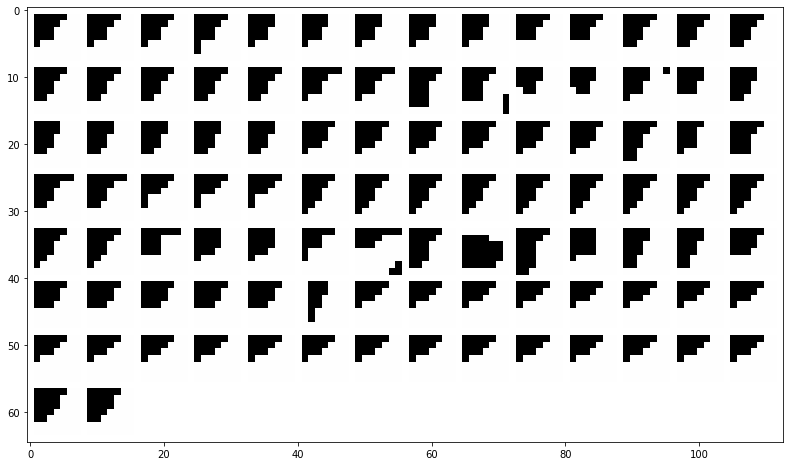

normalized regions:


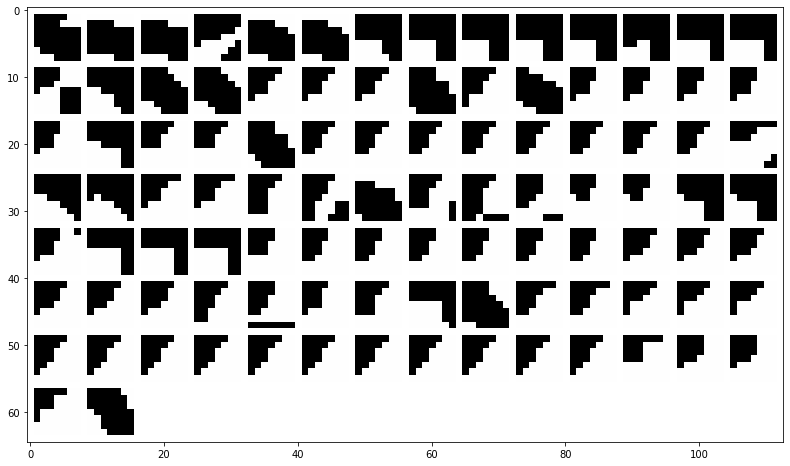

In [0]:
list_filter = list_filter_interest_layer2
regions = region_layer2_no_binary_stride
activations = activation_layer2_no_binary_stride
activations_normalized = activation_layer2_no_binary_normalized_stride

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

Interest of filters: [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 80, 85, 90, 95, 100, 105, 110, 150, 120, 125, 150, 200, 250]
Consider 10% image regions = 100 images
Consider 10% image regions = 100 images
mean image:
mean regions of 100 regions more=True or worst=False active for filter number: 0 :


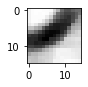

normalized region:


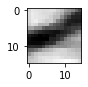

mean regions of 100 regions more=True or worst=False active for filter number: 5 :


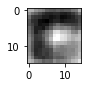

normalized region:


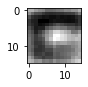

mean regions of 100 regions more=True or worst=False active for filter number: 10 :


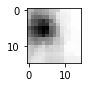

normalized region:


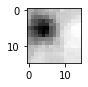

mean regions of 100 regions more=True or worst=False active for filter number: 15 :


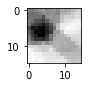

normalized region:


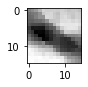

mean regions of 100 regions more=True or worst=False active for filter number: 20 :


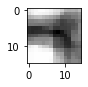

normalized region:


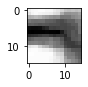

mean regions of 100 regions more=True or worst=False active for filter number: 25 :


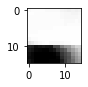

normalized region:


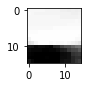

mean regions of 100 regions more=True or worst=False active for filter number: 30 :


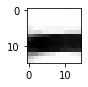

normalized region:


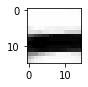

mean regions of 100 regions more=True or worst=False active for filter number: 35 :


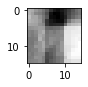

normalized region:


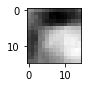

mean regions of 100 regions more=True or worst=False active for filter number: 40 :


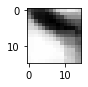

normalized region:


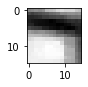

mean regions of 100 regions more=True or worst=False active for filter number: 45 :


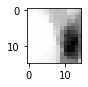

normalized region:


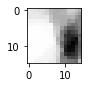

mean regions of 100 regions more=True or worst=False active for filter number: 50 :


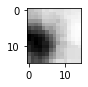

normalized region:


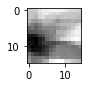

mean regions of 100 regions more=True or worst=False active for filter number: 55 :


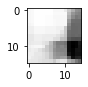

normalized region:


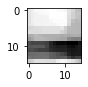

mean regions of 100 regions more=True or worst=False active for filter number: 60 :


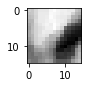

normalized region:


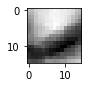

mean regions of 100 regions more=True or worst=False active for filter number: 65 :


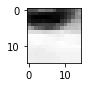

normalized region:


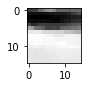

mean regions of 100 regions more=True or worst=False active for filter number: 70 :


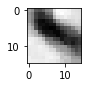

normalized region:


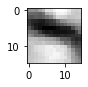

mean regions of 100 regions more=True or worst=False active for filter number: 80 :


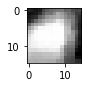

normalized region:


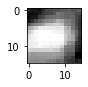

mean regions of 100 regions more=True or worst=False active for filter number: 85 :


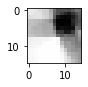

normalized region:


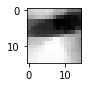

mean regions of 100 regions more=True or worst=False active for filter number: 90 :


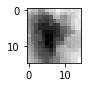

normalized region:


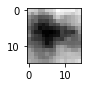

mean regions of 100 regions more=True or worst=False active for filter number: 95 :


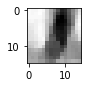

normalized region:


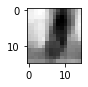

mean regions of 100 regions more=True or worst=False active for filter number: 100 :


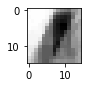

normalized region:


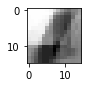

mean regions of 100 regions more=True or worst=False active for filter number: 105 :


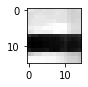

normalized region:


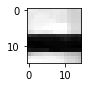

mean regions of 100 regions more=True or worst=False active for filter number: 110 :


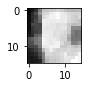

normalized region:


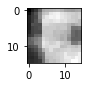

mean regions of 100 regions more=True or worst=False active for filter number: 150 :


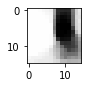

normalized region:


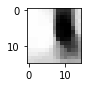

mean regions of 100 regions more=True or worst=False active for filter number: 120 :


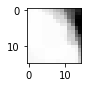

normalized region:


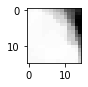

mean regions of 100 regions more=True or worst=False active for filter number: 125 :


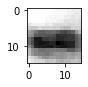

normalized region:


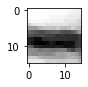

mean regions of 100 regions more=True or worst=False active for filter number: 150 :


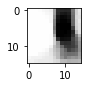

normalized region:


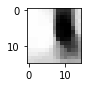

mean regions of 100 regions more=True or worst=False active for filter number: 200 :


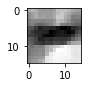

normalized region:


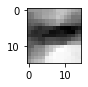

mean regions of 100 regions more=True or worst=False active for filter number: 250 :


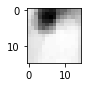

normalized region:


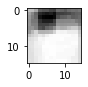

grid image
grid regions of 100 regions more=True or worst=False active for filter number: 0 :


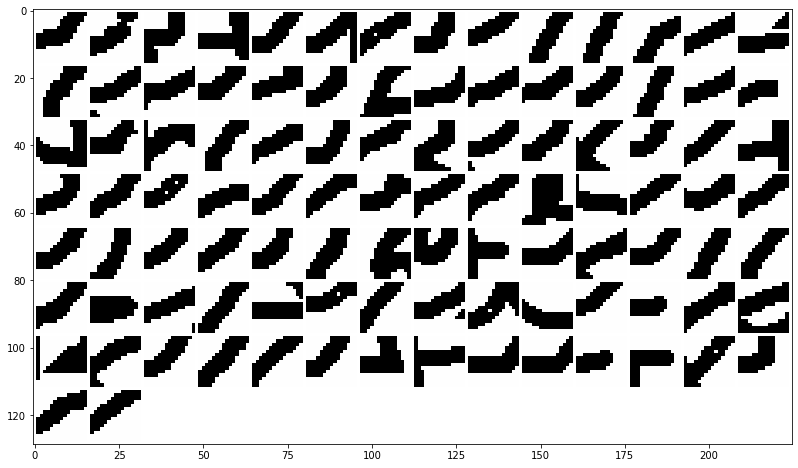

normalized regions:


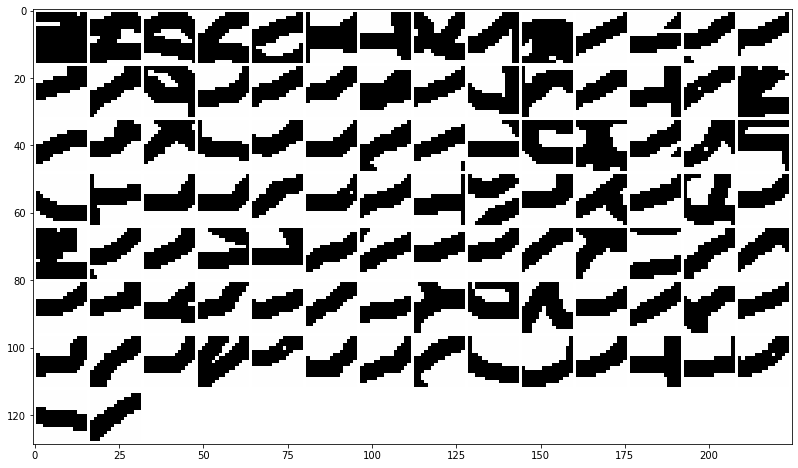

grid regions of 100 regions more=True or worst=False active for filter number: 5 :


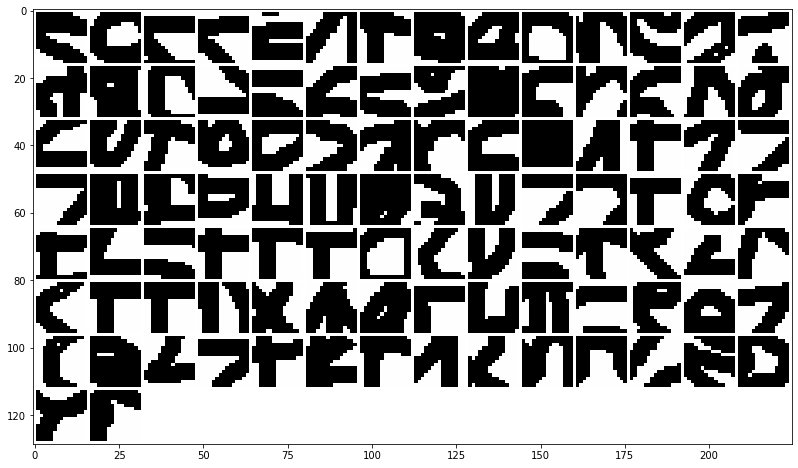

normalized regions:


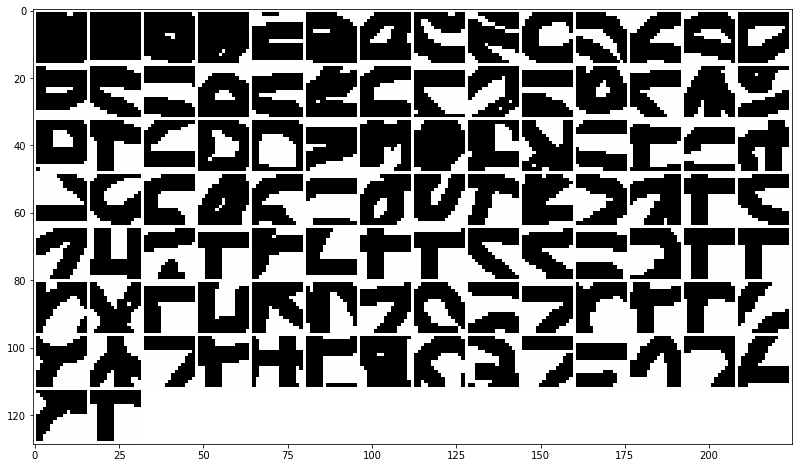

grid regions of 100 regions more=True or worst=False active for filter number: 10 :


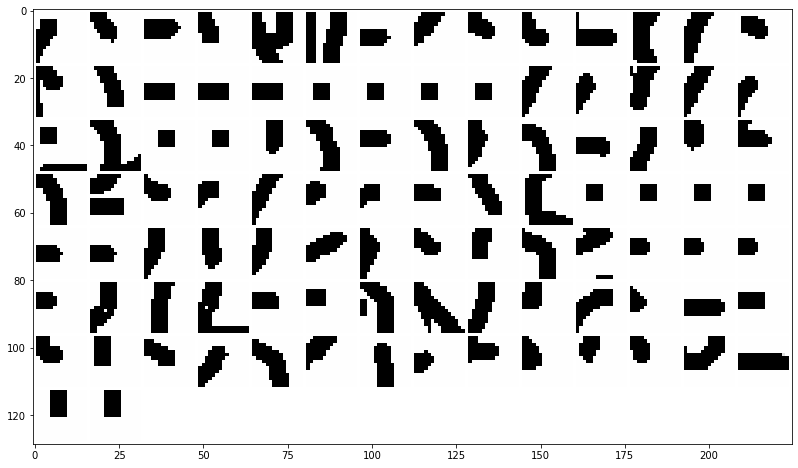

normalized regions:


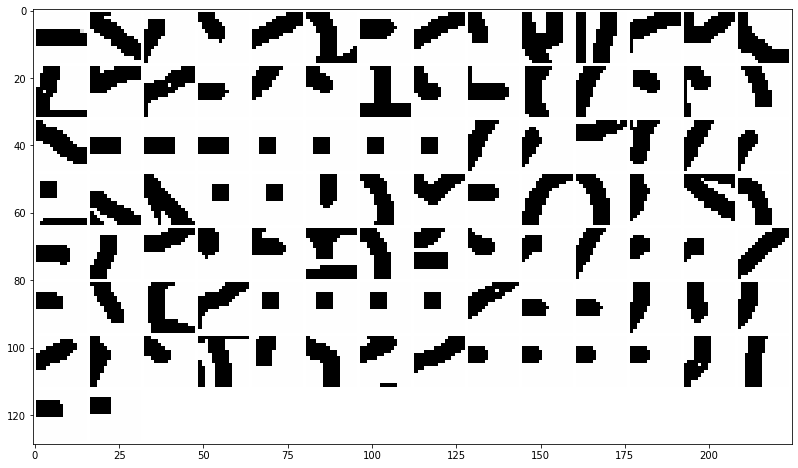

grid regions of 100 regions more=True or worst=False active for filter number: 15 :


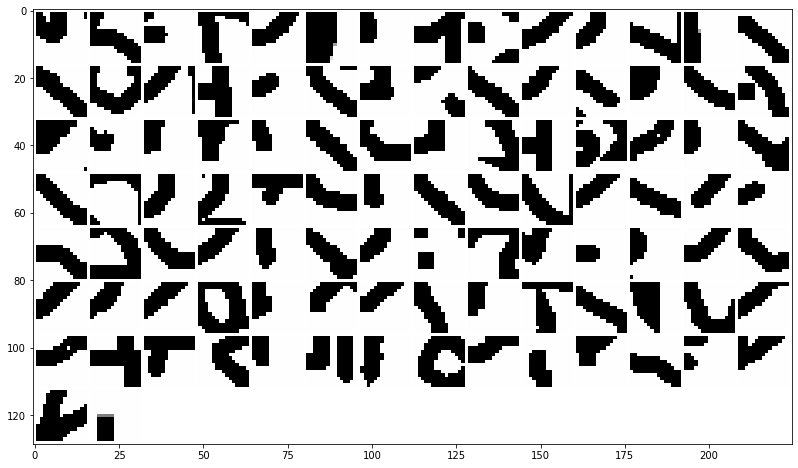

normalized regions:


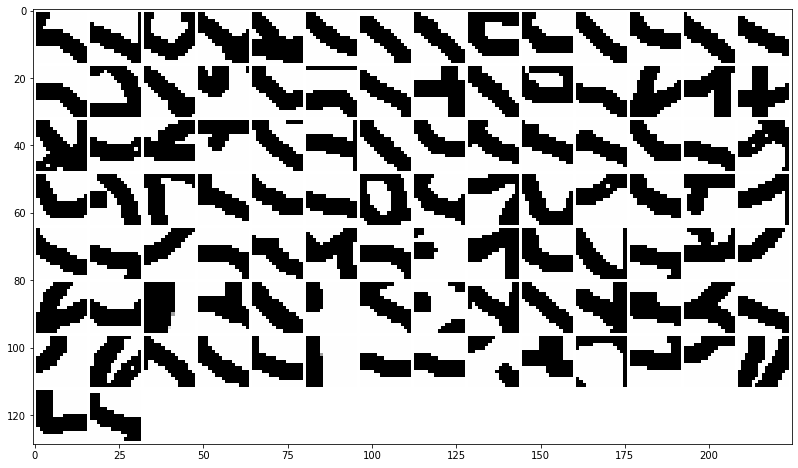

grid regions of 100 regions more=True or worst=False active for filter number: 20 :


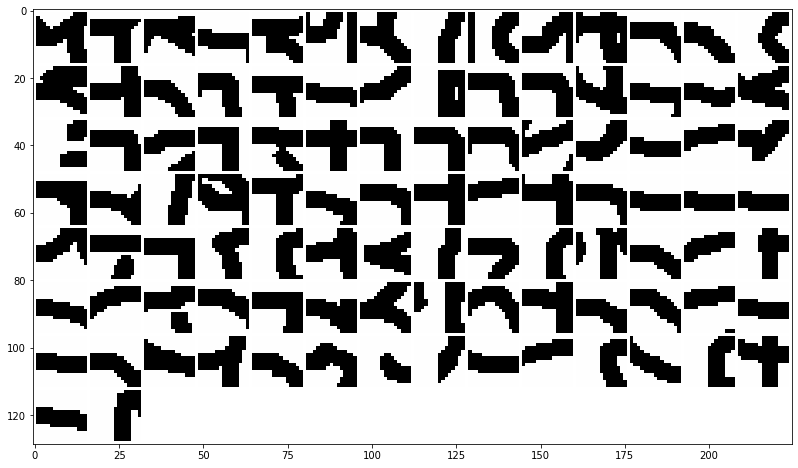

normalized regions:


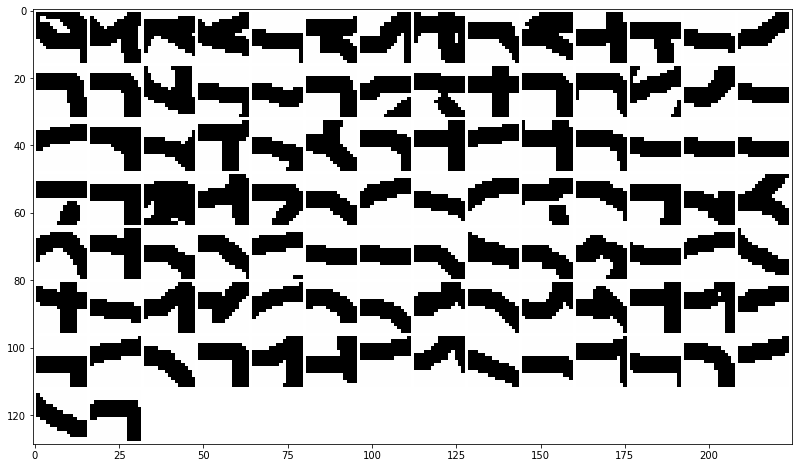

grid regions of 100 regions more=True or worst=False active for filter number: 25 :


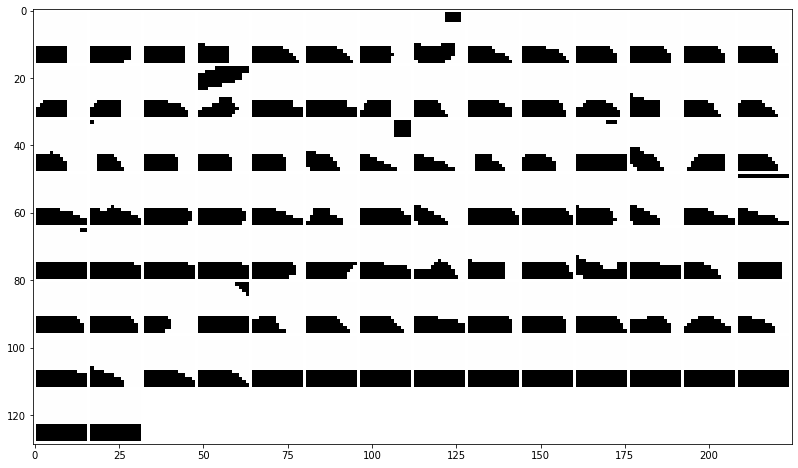

normalized regions:


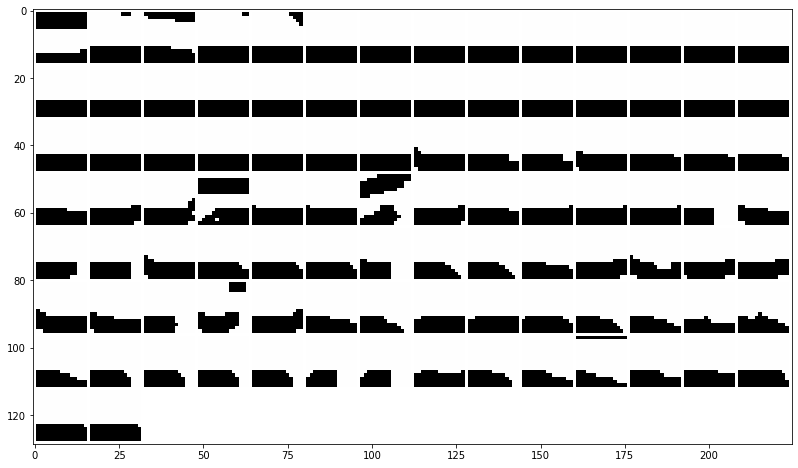

grid regions of 100 regions more=True or worst=False active for filter number: 30 :


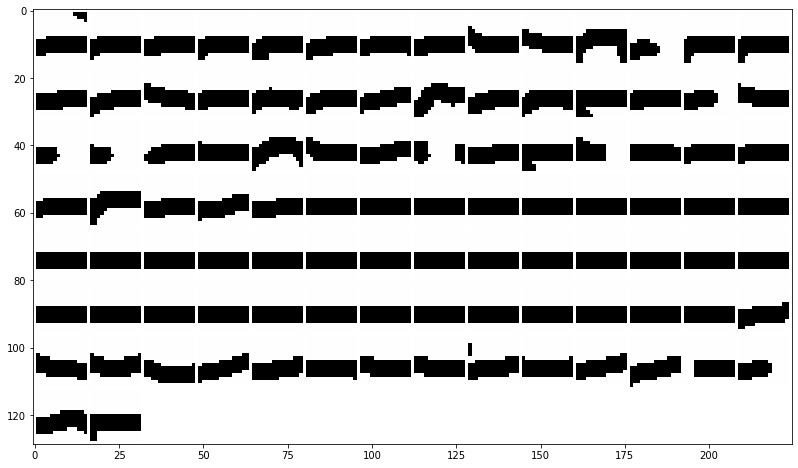

normalized regions:


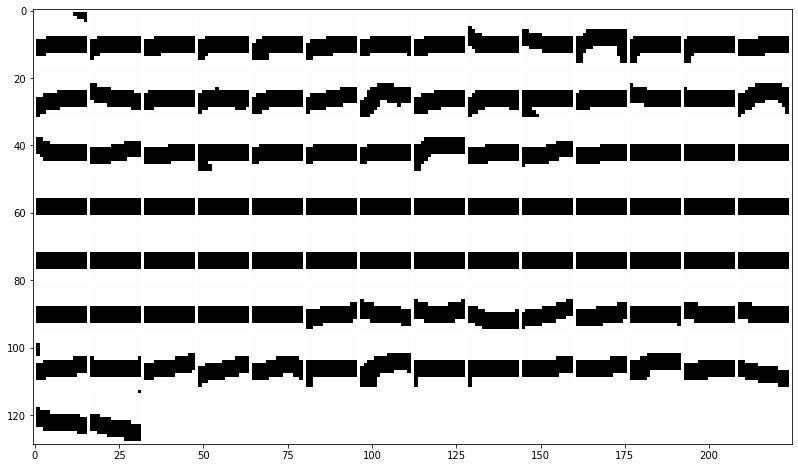

grid regions of 100 regions more=True or worst=False active for filter number: 35 :


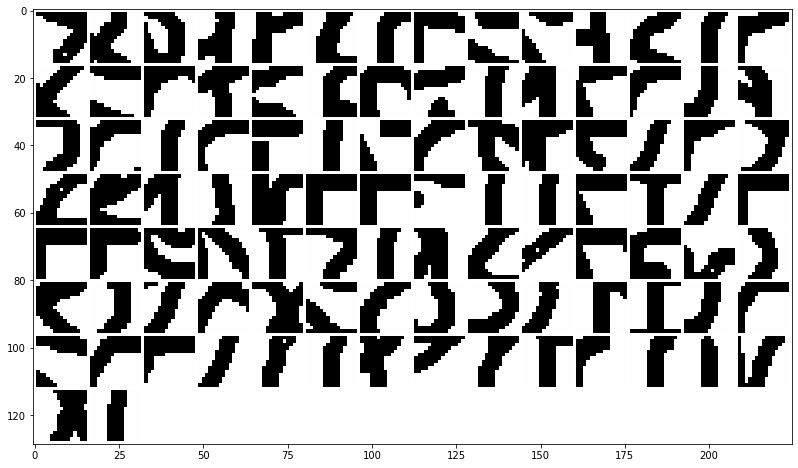

normalized regions:


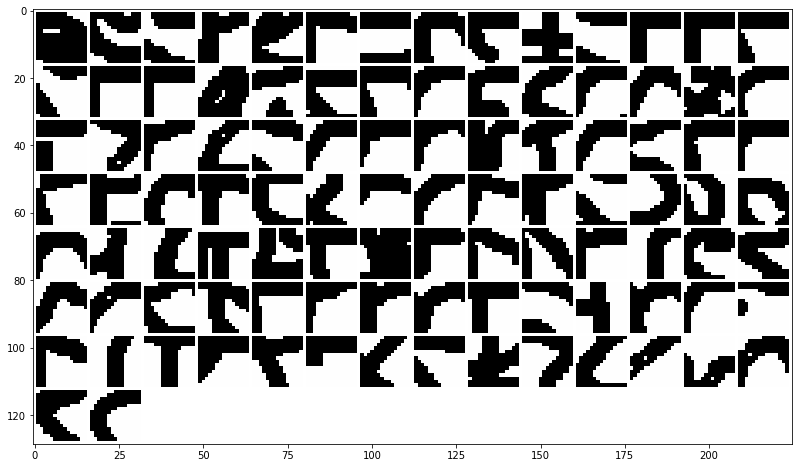

grid regions of 100 regions more=True or worst=False active for filter number: 40 :


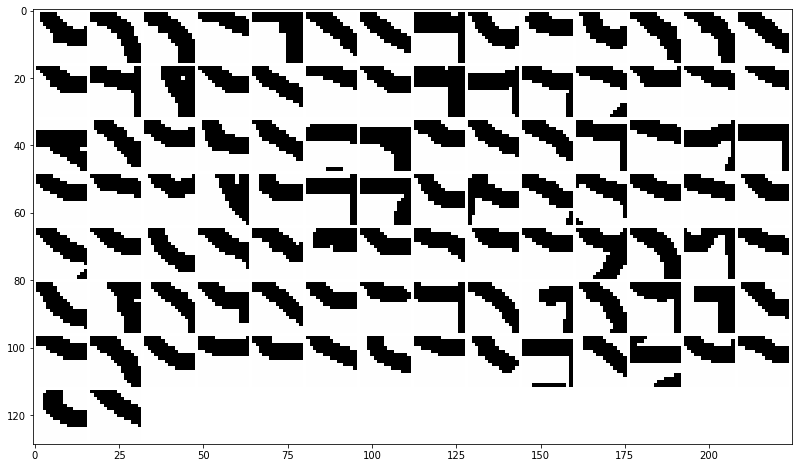

normalized regions:


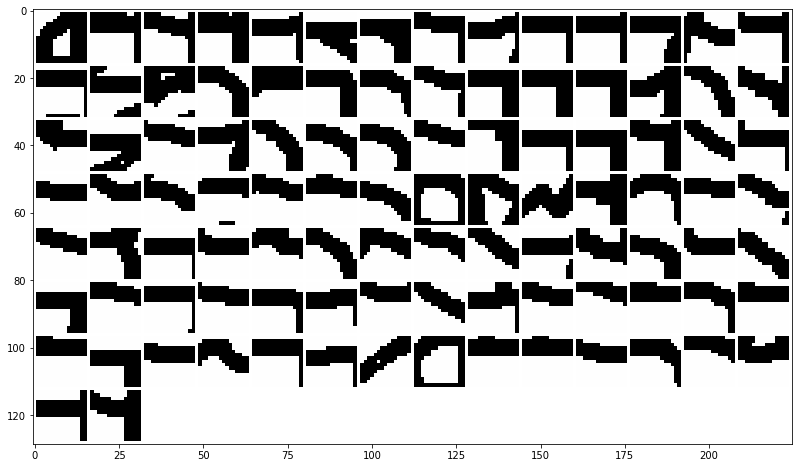

grid regions of 100 regions more=True or worst=False active for filter number: 45 :


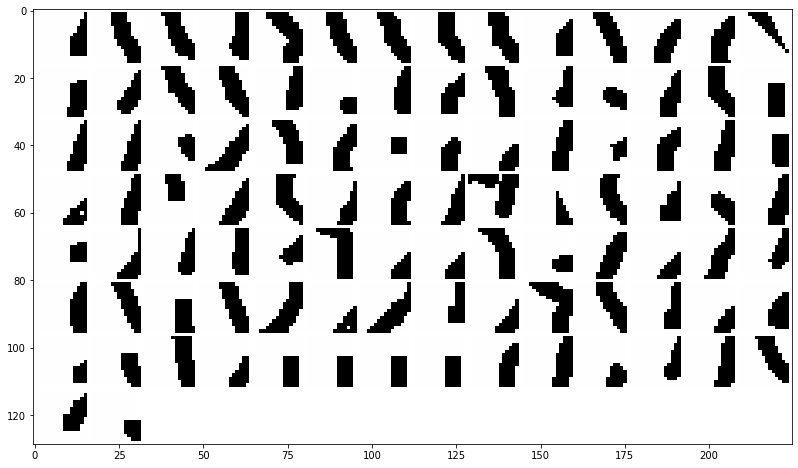

normalized regions:


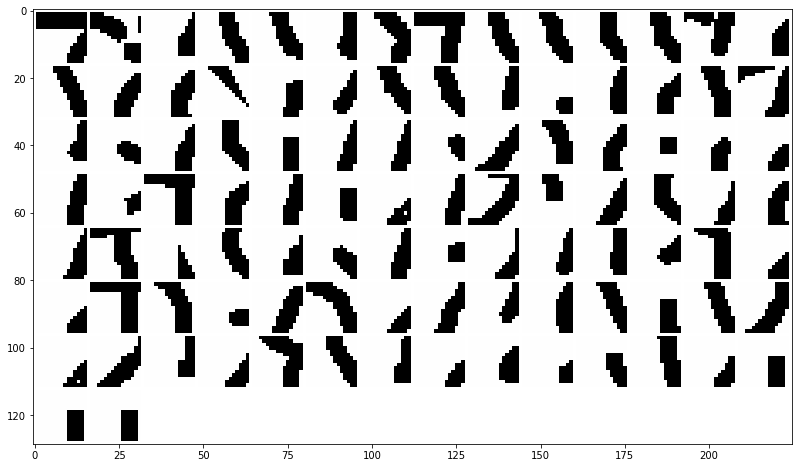

grid regions of 100 regions more=True or worst=False active for filter number: 50 :


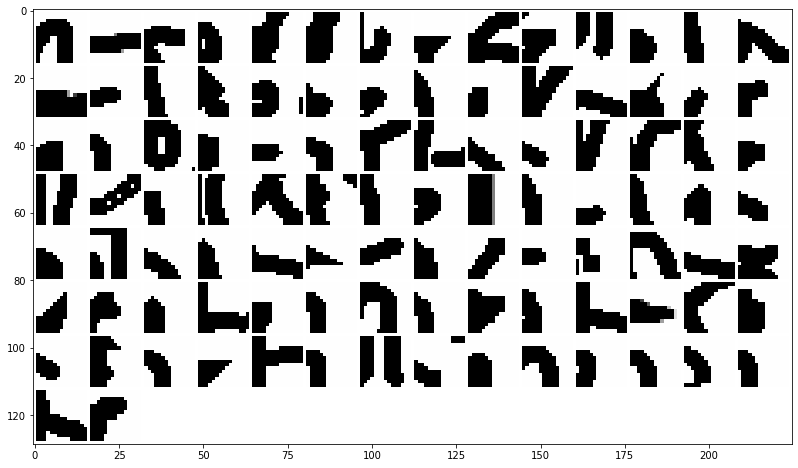

normalized regions:


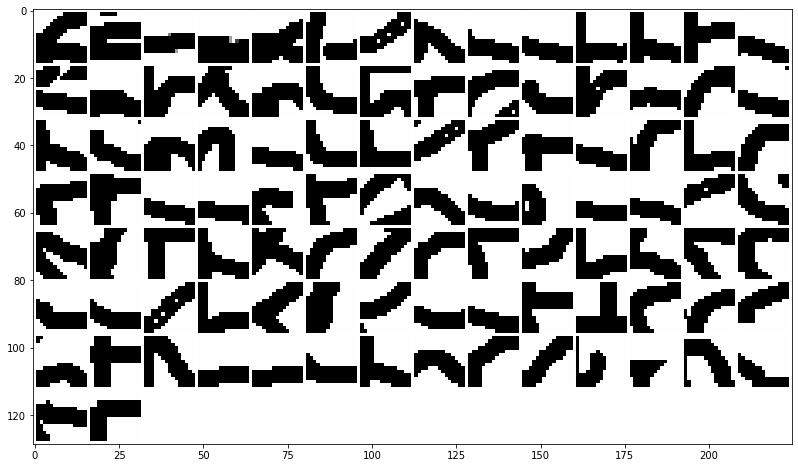

grid regions of 100 regions more=True or worst=False active for filter number: 55 :


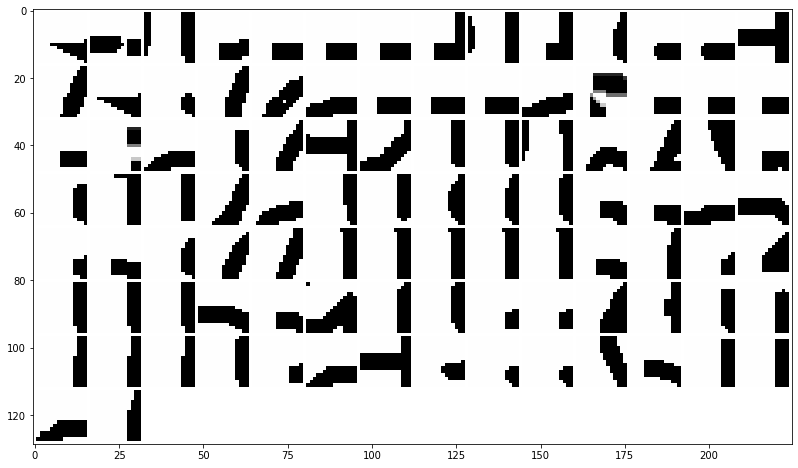

normalized regions:


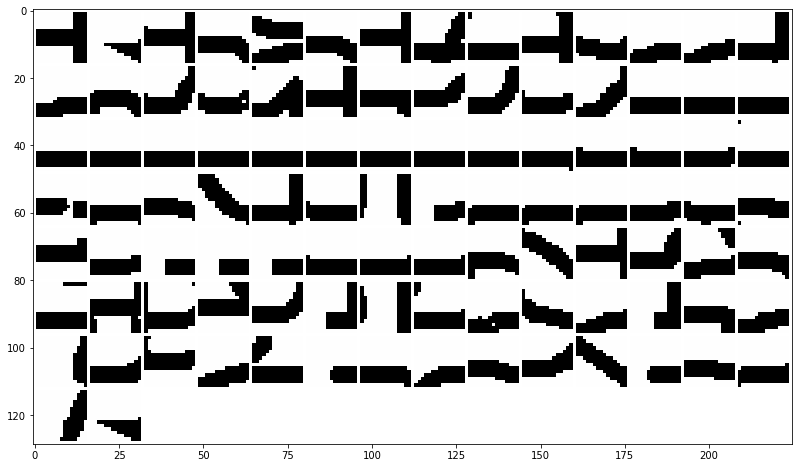

grid regions of 100 regions more=True or worst=False active for filter number: 60 :


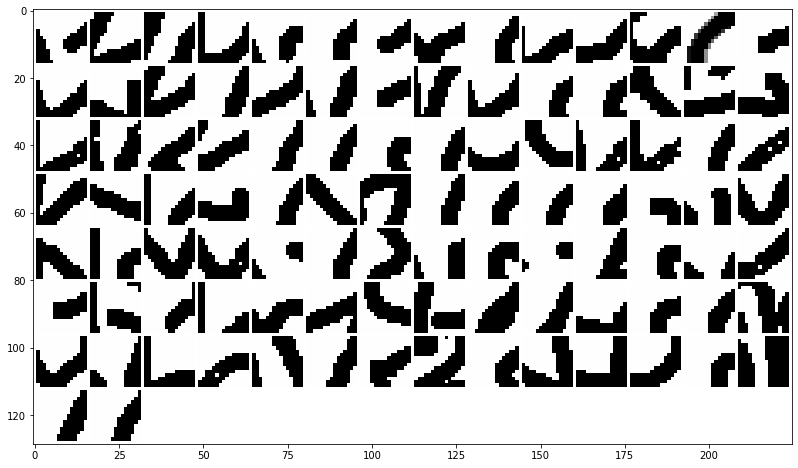

normalized regions:


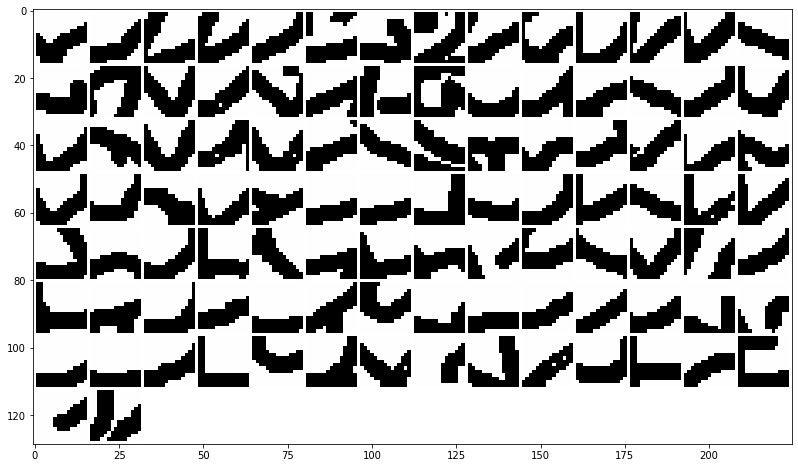

grid regions of 100 regions more=True or worst=False active for filter number: 65 :


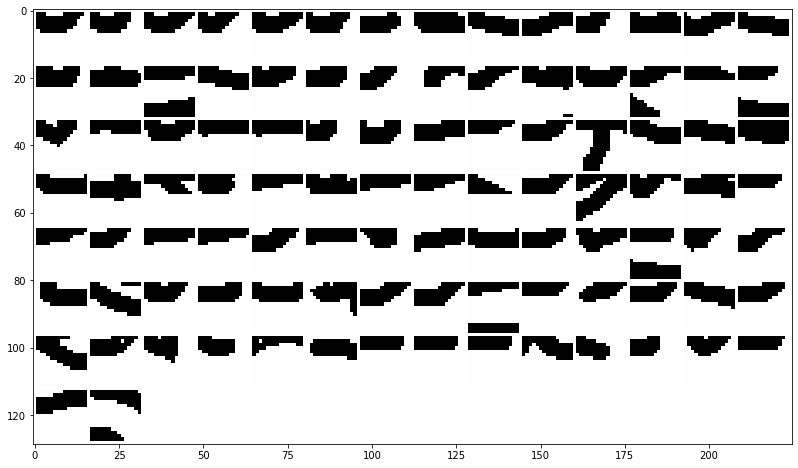

normalized regions:


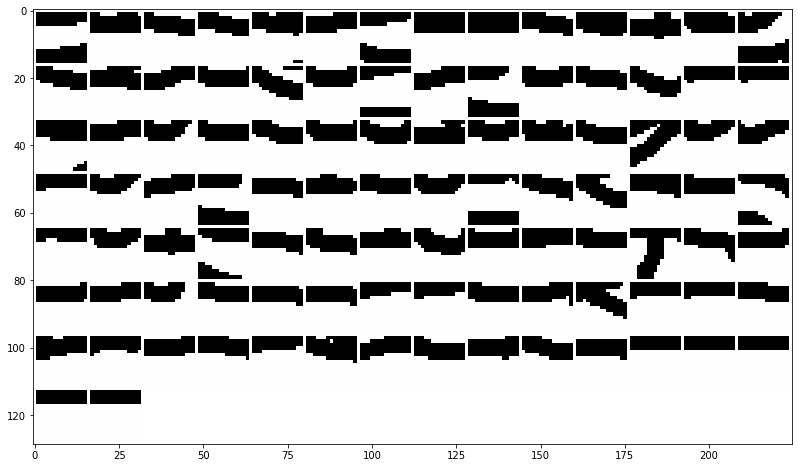

grid regions of 100 regions more=True or worst=False active for filter number: 70 :


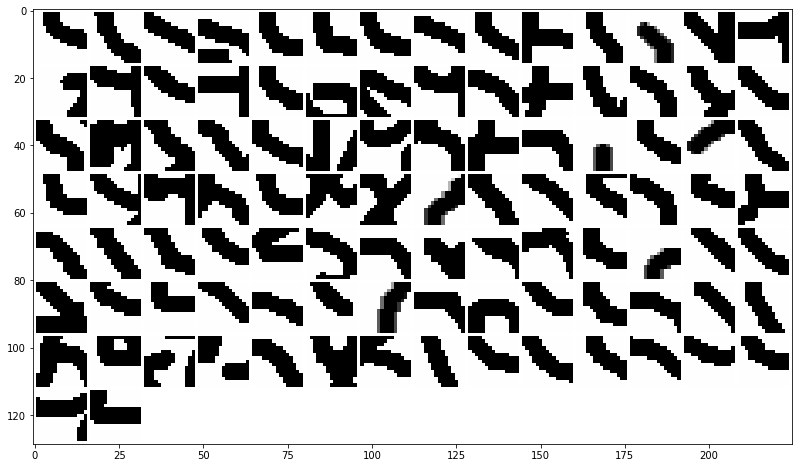

normalized regions:


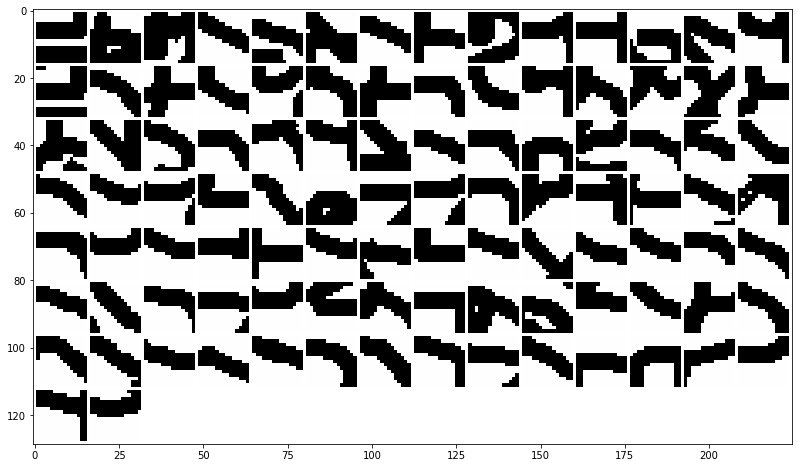

grid regions of 100 regions more=True or worst=False active for filter number: 80 :


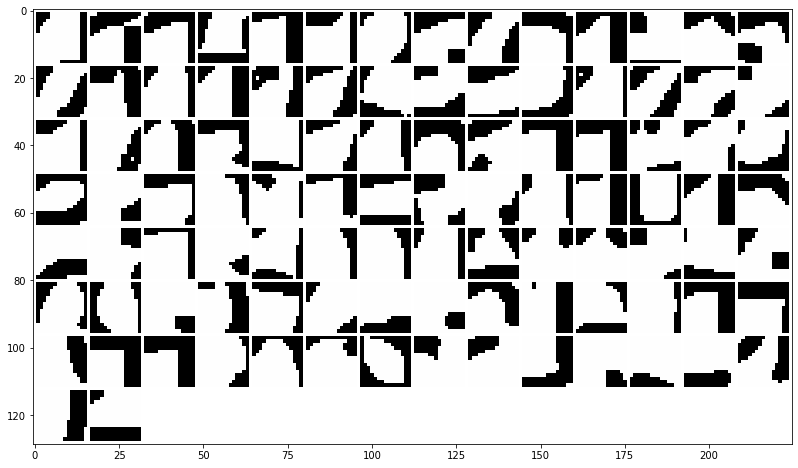

normalized regions:


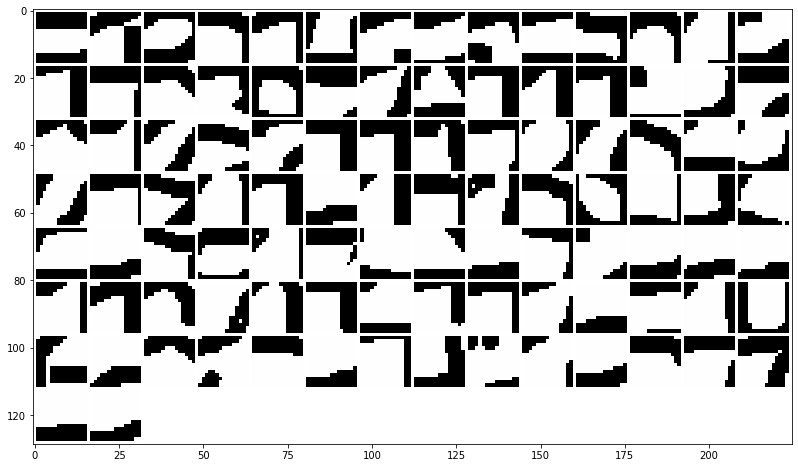

grid regions of 100 regions more=True or worst=False active for filter number: 85 :


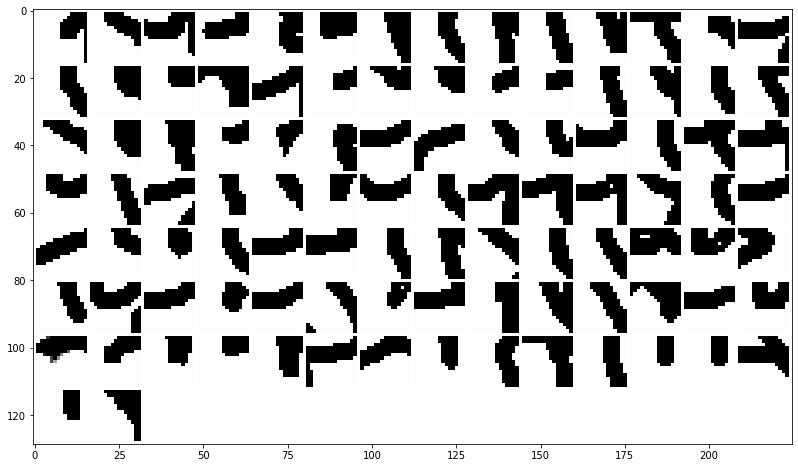

normalized regions:


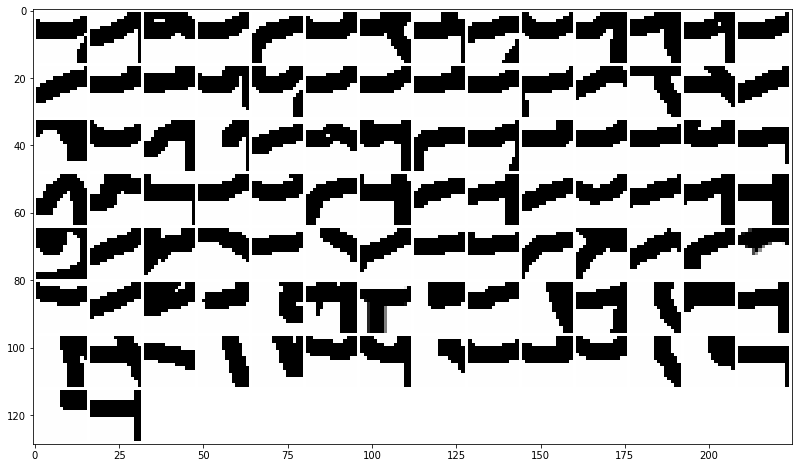

grid regions of 100 regions more=True or worst=False active for filter number: 90 :


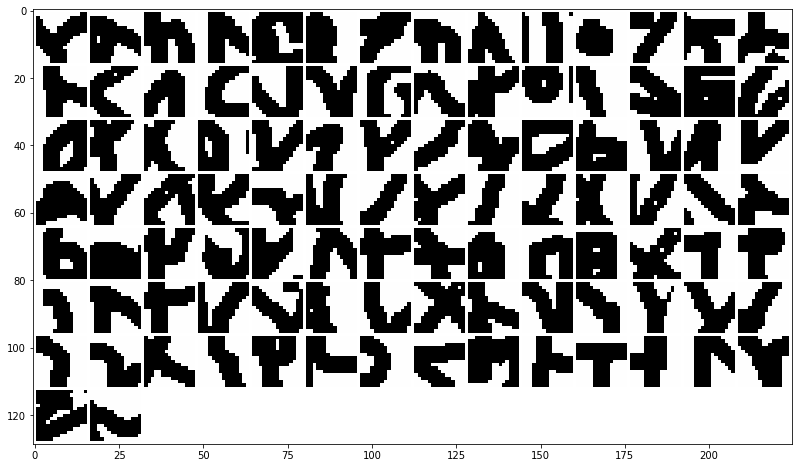

normalized regions:


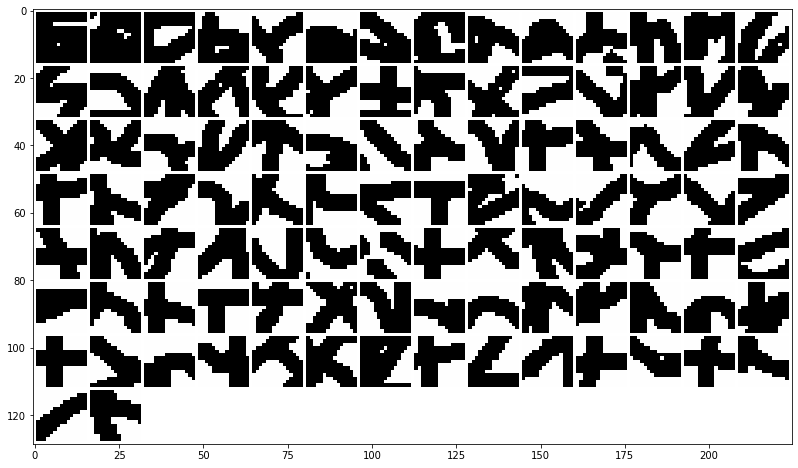

grid regions of 100 regions more=True or worst=False active for filter number: 95 :


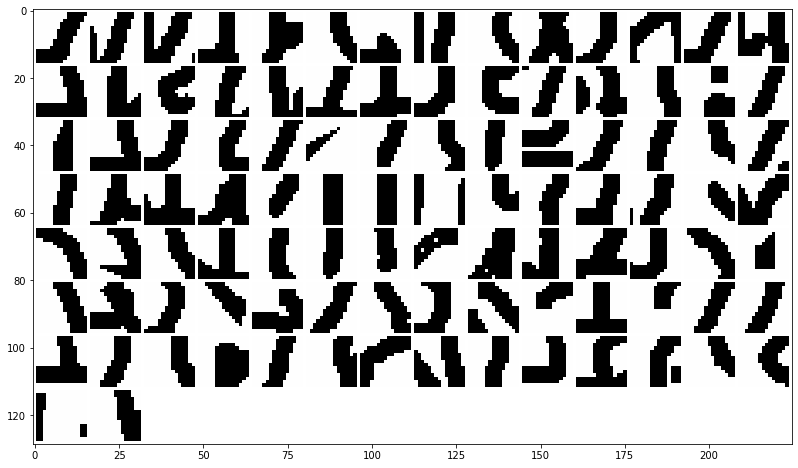

normalized regions:


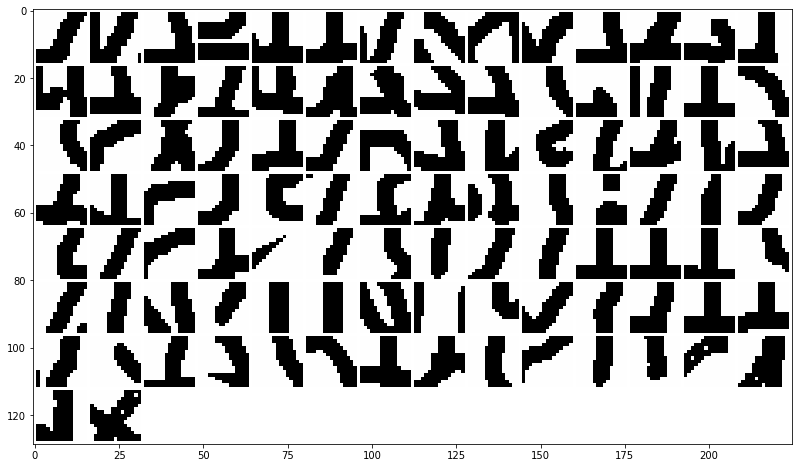

grid regions of 100 regions more=True or worst=False active for filter number: 100 :


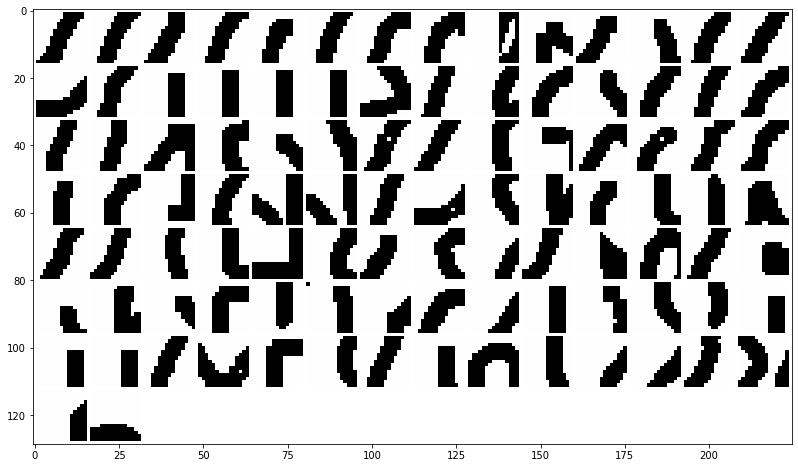

normalized regions:


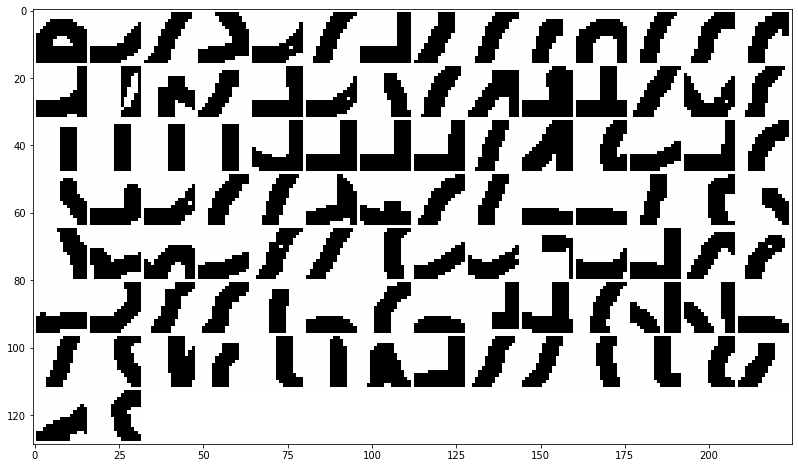

grid regions of 100 regions more=True or worst=False active for filter number: 105 :


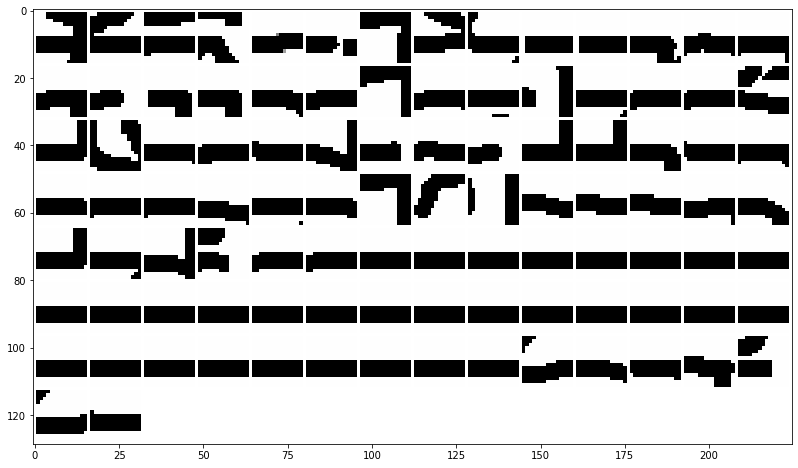

normalized regions:


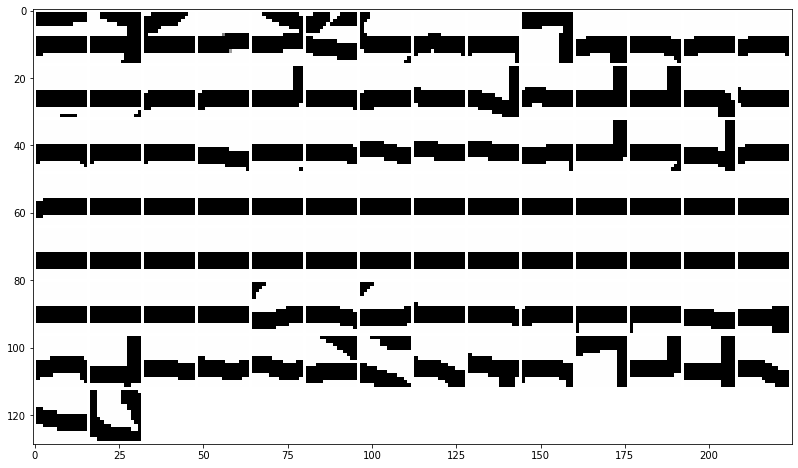

grid regions of 100 regions more=True or worst=False active for filter number: 110 :


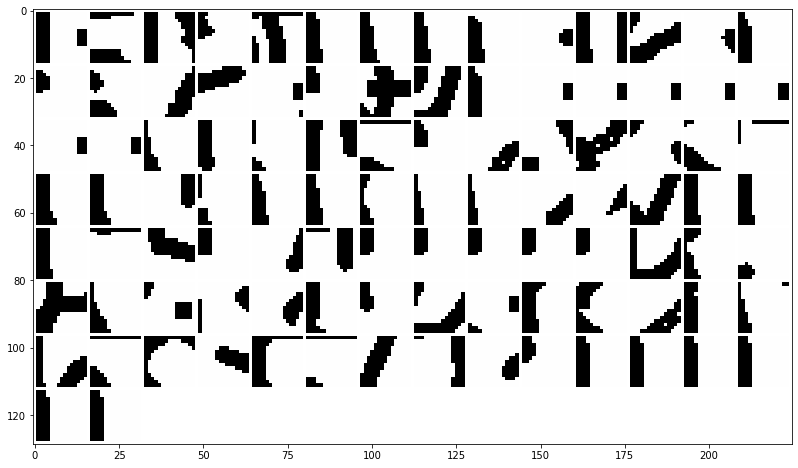

normalized regions:


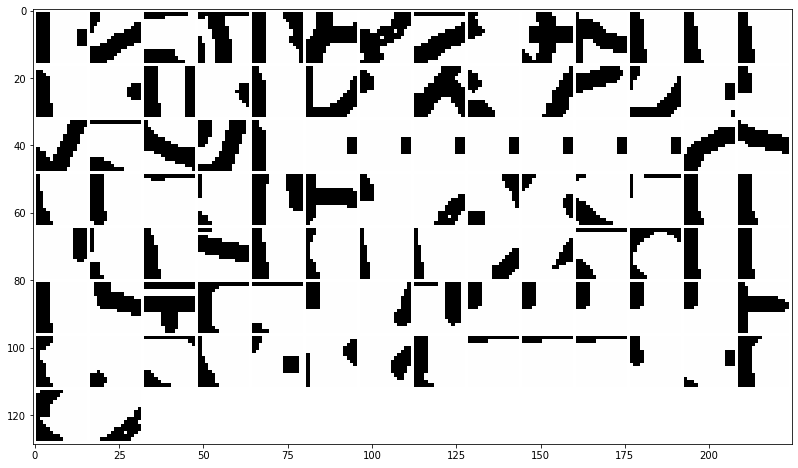

grid regions of 100 regions more=True or worst=False active for filter number: 150 :


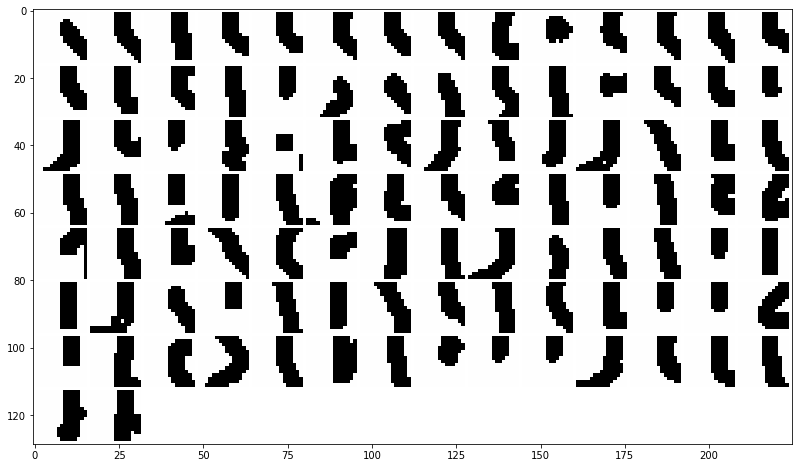

normalized regions:


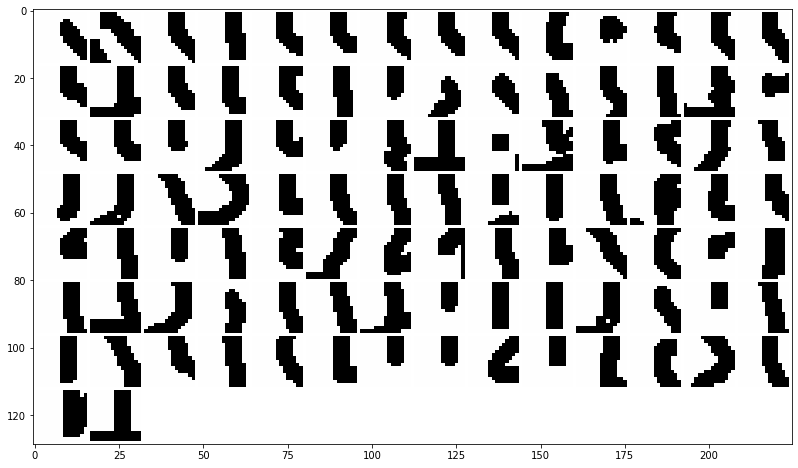

grid regions of 100 regions more=True or worst=False active for filter number: 120 :


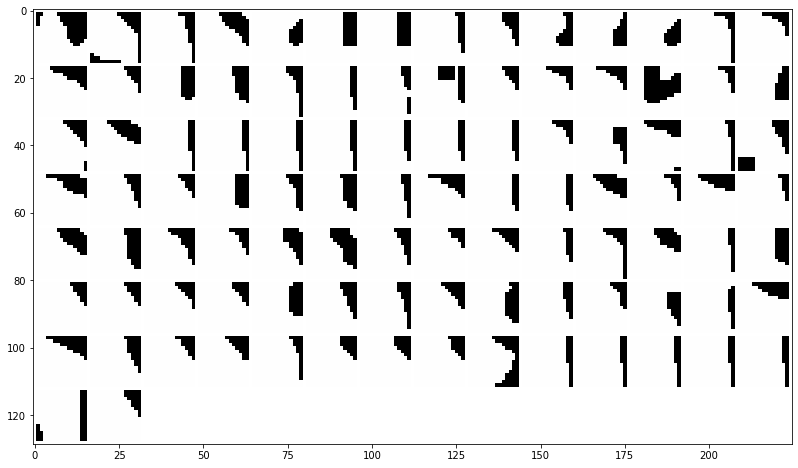

normalized regions:


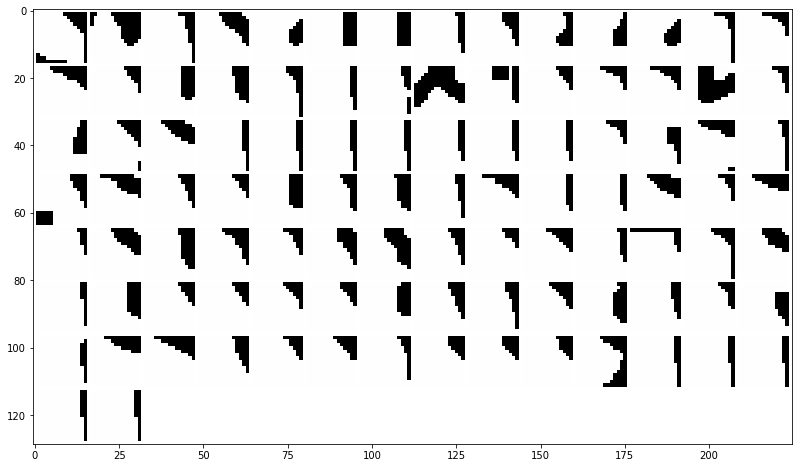

grid regions of 100 regions more=True or worst=False active for filter number: 125 :


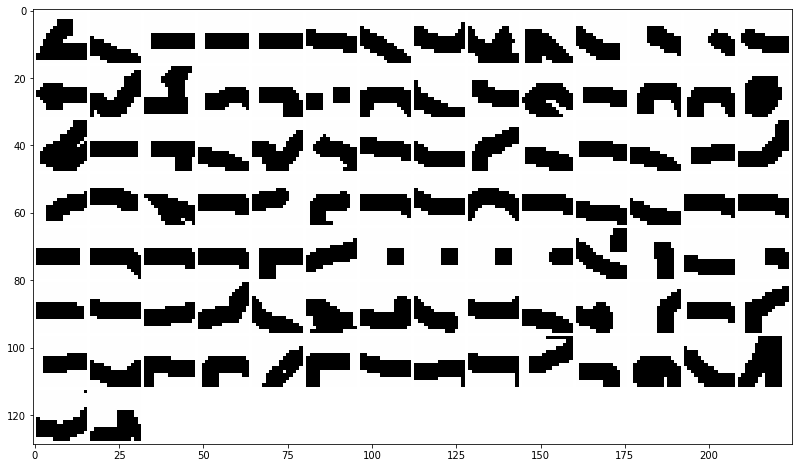

normalized regions:


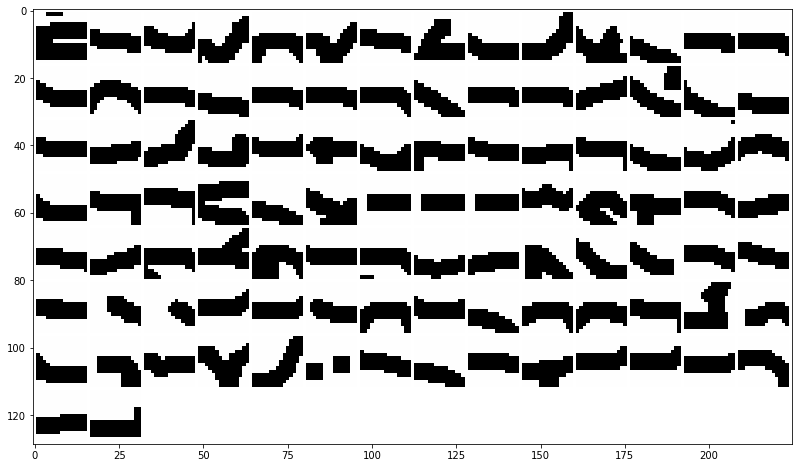

grid regions of 100 regions more=True or worst=False active for filter number: 150 :


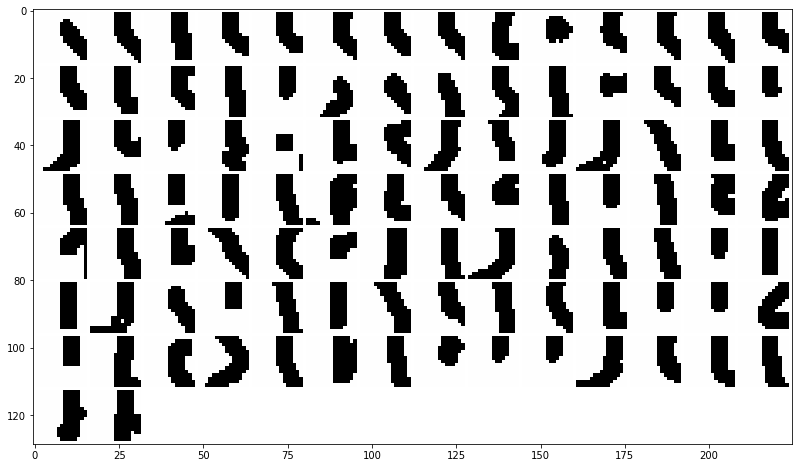

normalized regions:


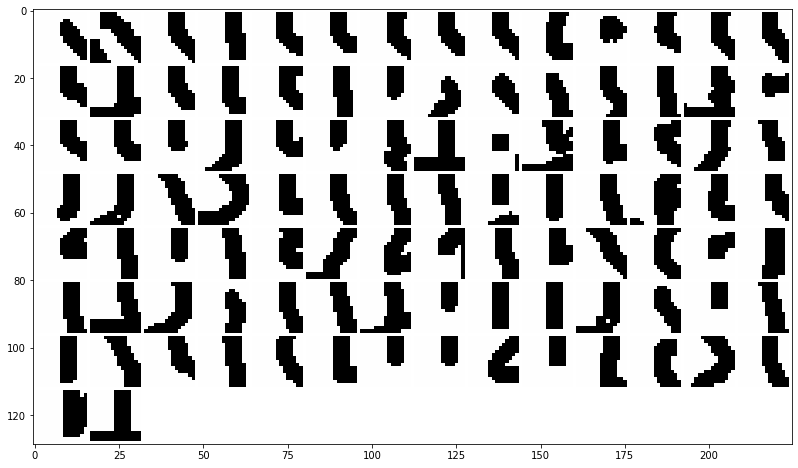

grid regions of 100 regions more=True or worst=False active for filter number: 200 :


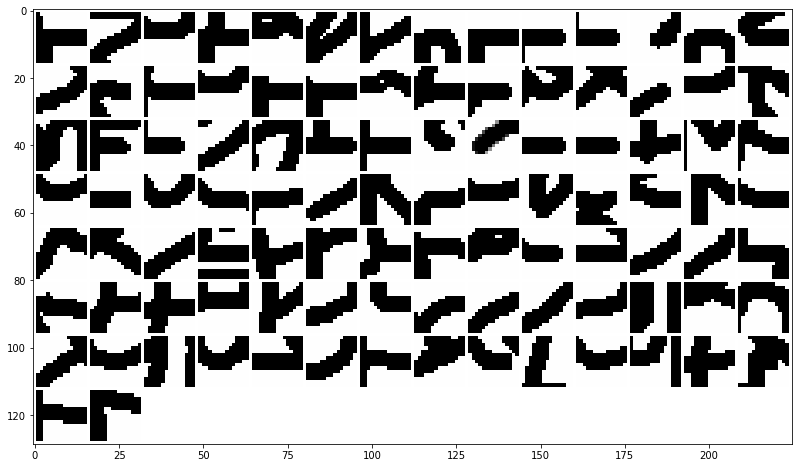

normalized regions:


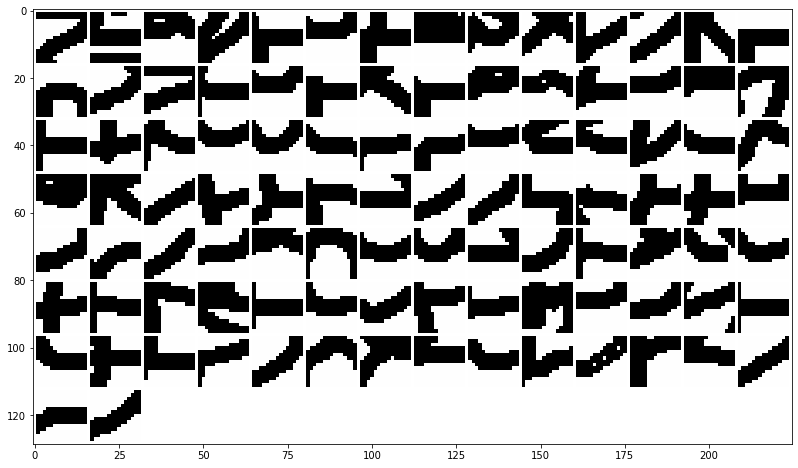

grid regions of 100 regions more=True or worst=False active for filter number: 250 :


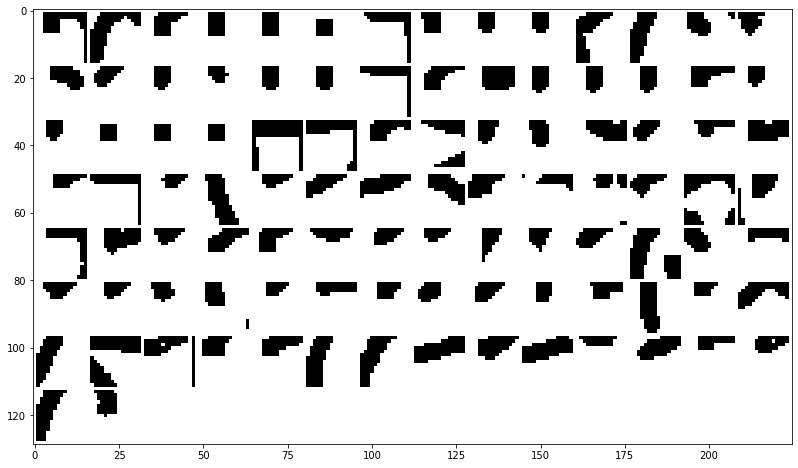

normalized regions:


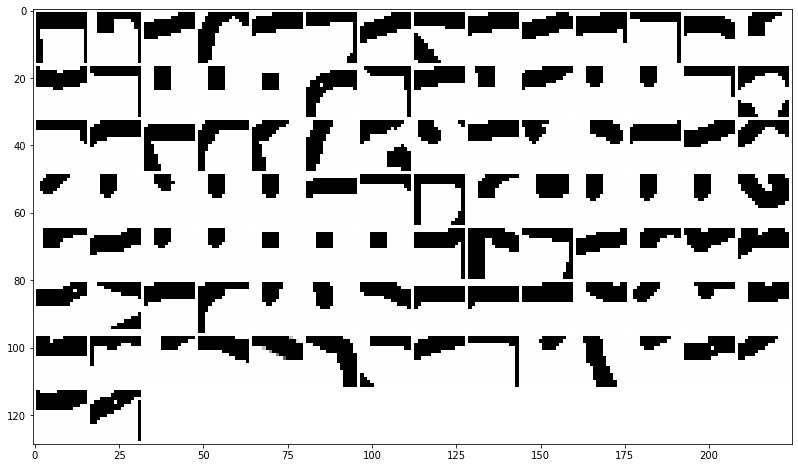

In [0]:
list_filter = list_filter_interest_layer3
regions = region_layer3_no_binary_stride
activations = activation_layer3_no_binary_stride
activations_normalized = activation_layer3_no_binary_normalized_stride

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

In [0]:
list_filter = list_filter_interest_layer4
regions = region_layer4_no_binary_stride
activations = activation_layer4_no_binary_stride
activations_normalized = activation_layer4_no_binary_normalized_stride

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

Output hidden; open in https://colab.research.google.com to view.

#### No binary model maxpooling:

Interest of filters: [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60]
Consider 10% image regions = 100 images
Consider 10% image regions = 100 images
mean image:
mean regions of 100 regions more=True or worst=False active for filter number: 0 :


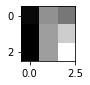

normalized region:


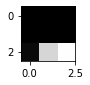

mean regions of 100 regions more=True or worst=False active for filter number: 5 :


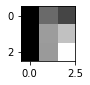

normalized region:


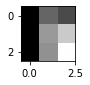

mean regions of 100 regions more=True or worst=False active for filter number: 10 :


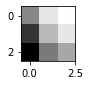

normalized region:


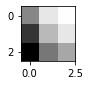

mean regions of 100 regions more=True or worst=False active for filter number: 15 :


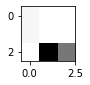

normalized region:


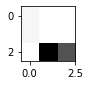

mean regions of 100 regions more=True or worst=False active for filter number: 20 :


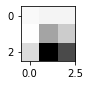

normalized region:


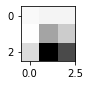

mean regions of 100 regions more=True or worst=False active for filter number: 25 :


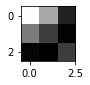

normalized region:


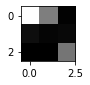

mean regions of 100 regions more=True or worst=False active for filter number: 30 :


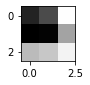

normalized region:


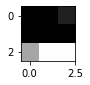

mean regions of 100 regions more=True or worst=False active for filter number: 35 :


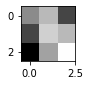

normalized region:


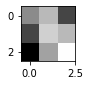

mean regions of 100 regions more=True or worst=False active for filter number: 40 :


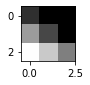

normalized region:


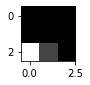

mean regions of 100 regions more=True or worst=False active for filter number: 45 :


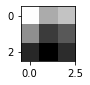

normalized region:


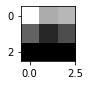

mean regions of 100 regions more=True or worst=False active for filter number: 50 :


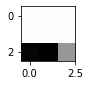

normalized region:


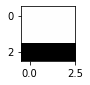

mean regions of 100 regions more=True or worst=False active for filter number: 55 :


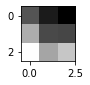

normalized region:


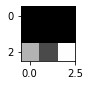

mean regions of 100 regions more=True or worst=False active for filter number: 60 :


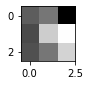

normalized region:


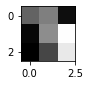

grid image
grid regions of 100 regions more=True or worst=False active for filter number: 0 :


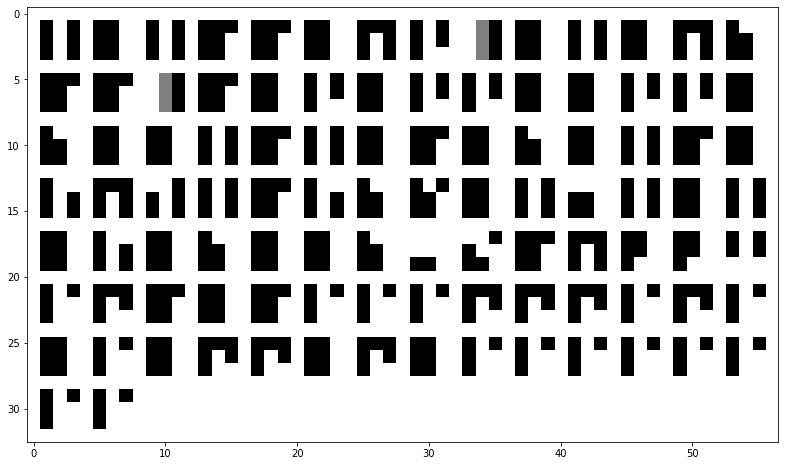

normalized regions:


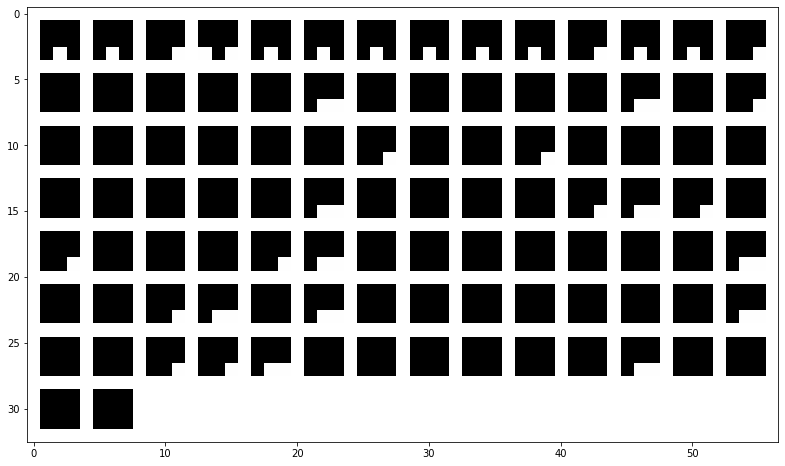

grid regions of 100 regions more=True or worst=False active for filter number: 5 :


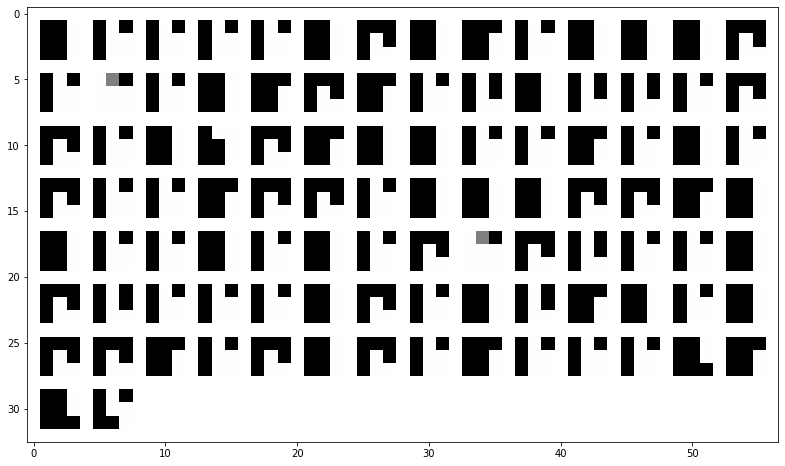

normalized regions:


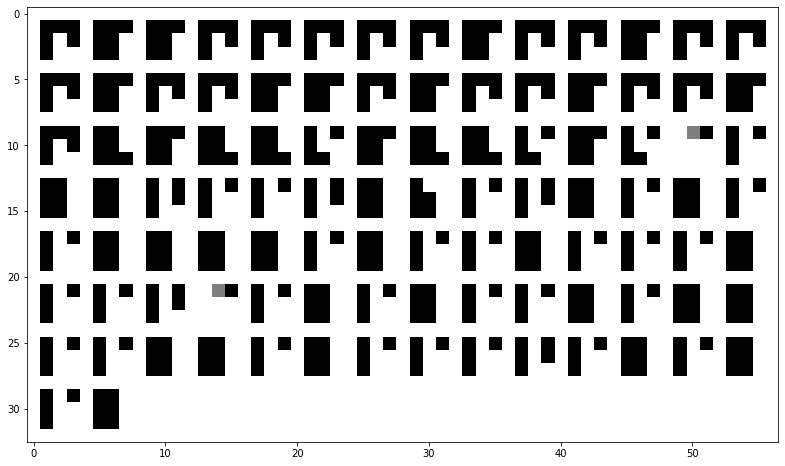

grid regions of 100 regions more=True or worst=False active for filter number: 10 :


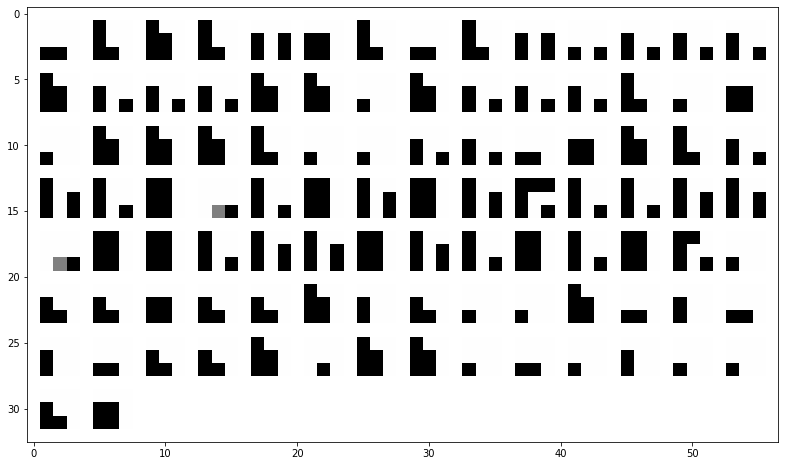

normalized regions:


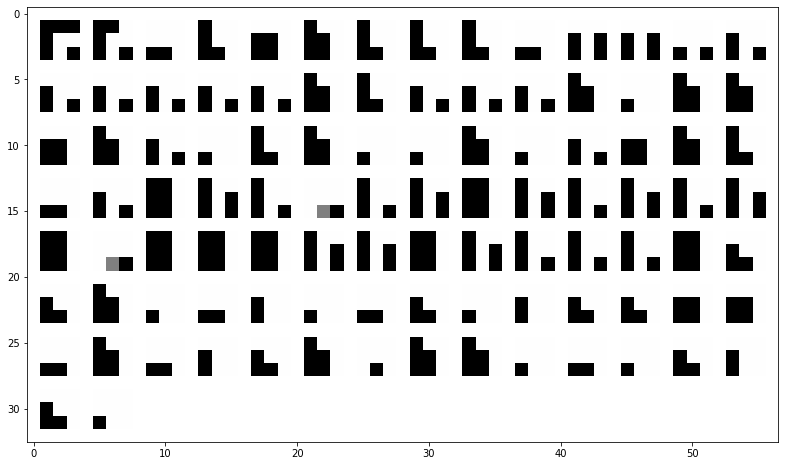

grid regions of 100 regions more=True or worst=False active for filter number: 15 :


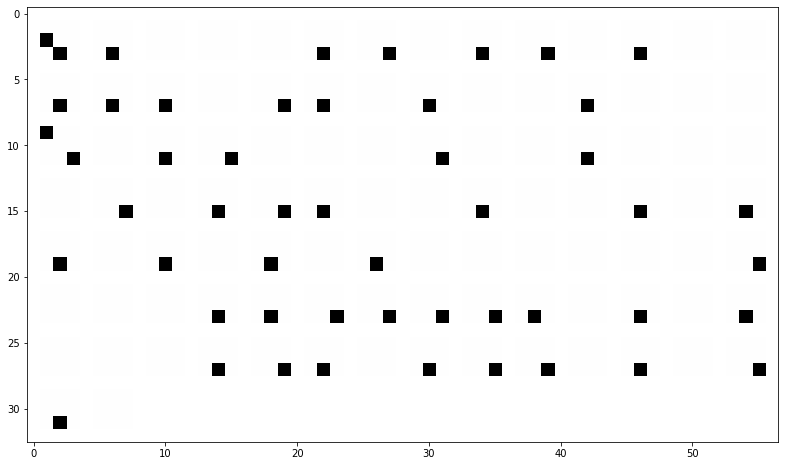

normalized regions:


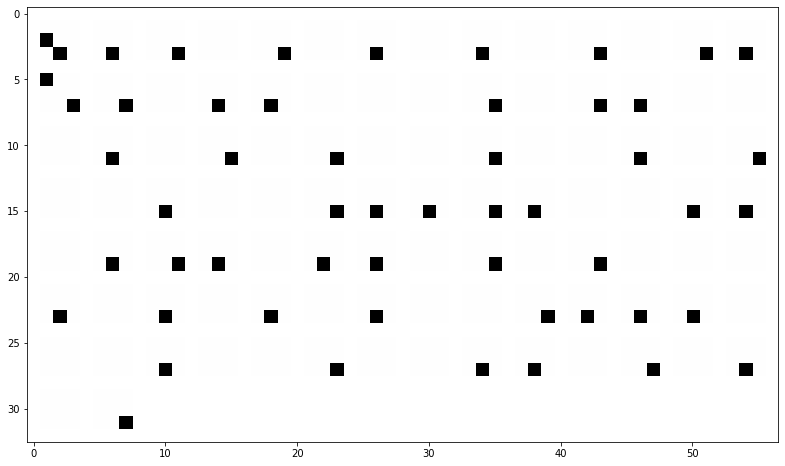

grid regions of 100 regions more=True or worst=False active for filter number: 20 :


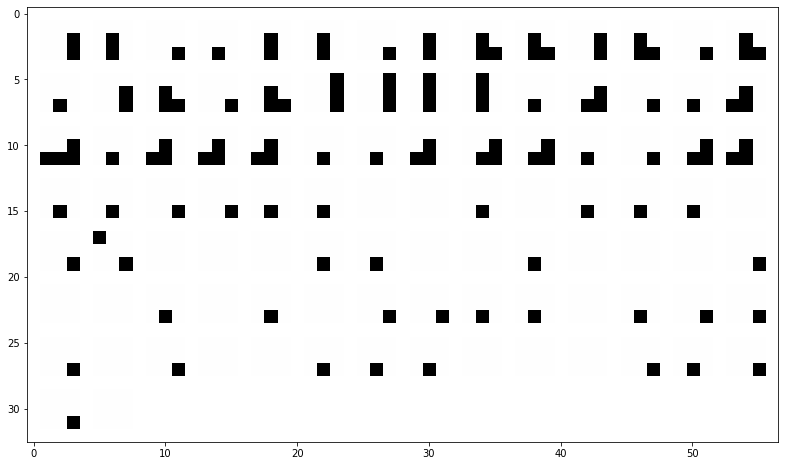

normalized regions:


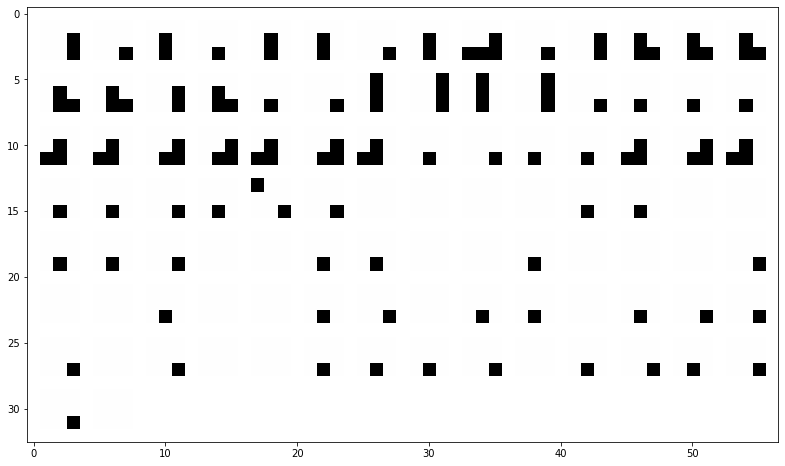

grid regions of 100 regions more=True or worst=False active for filter number: 25 :


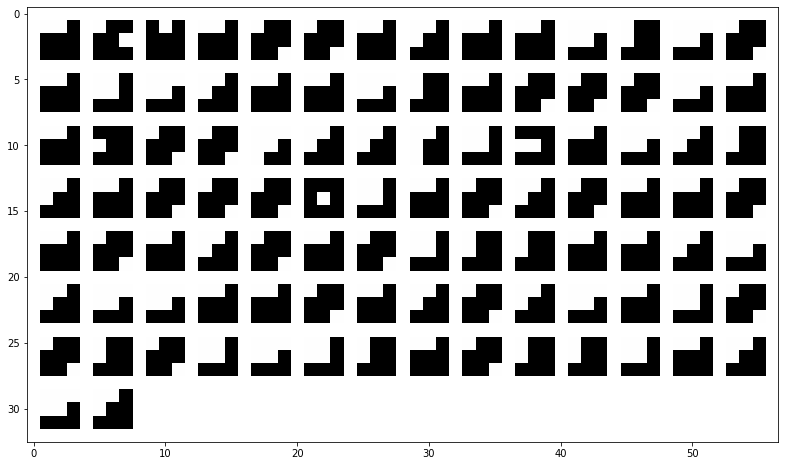

normalized regions:


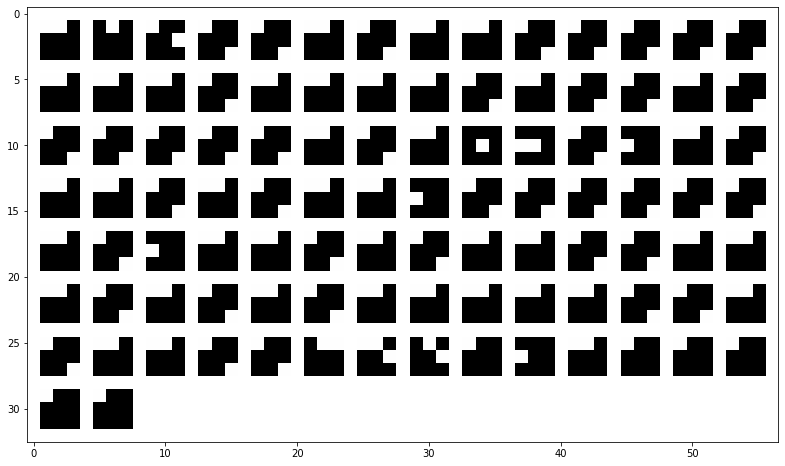

grid regions of 100 regions more=True or worst=False active for filter number: 30 :


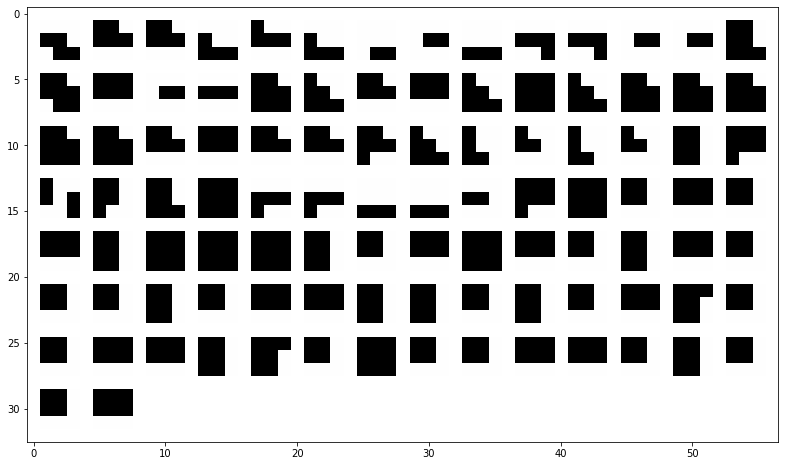

normalized regions:


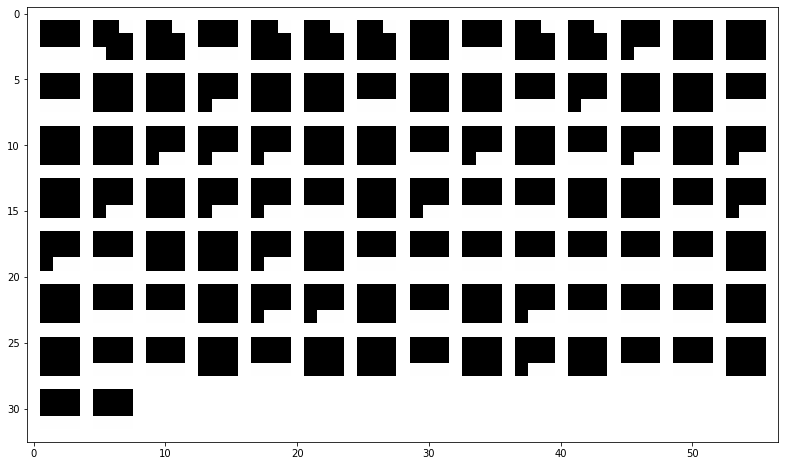

grid regions of 100 regions more=True or worst=False active for filter number: 35 :


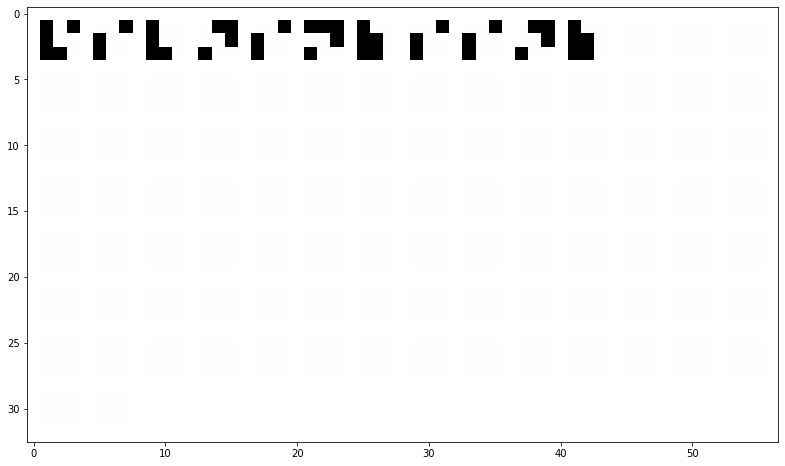

normalized regions:


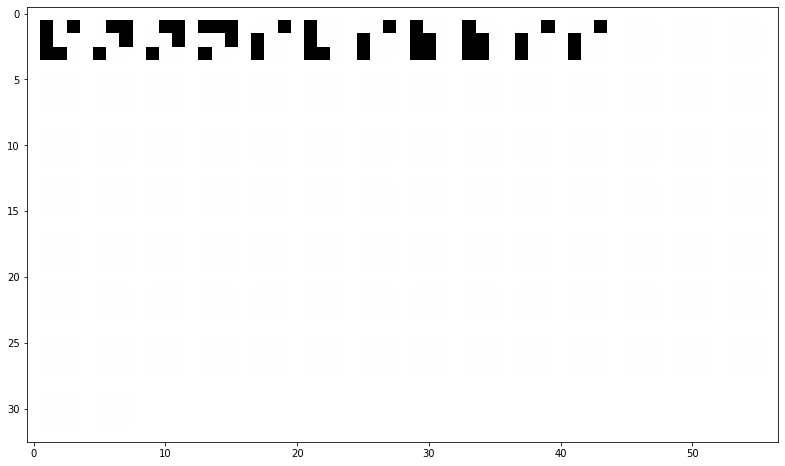

grid regions of 100 regions more=True or worst=False active for filter number: 40 :


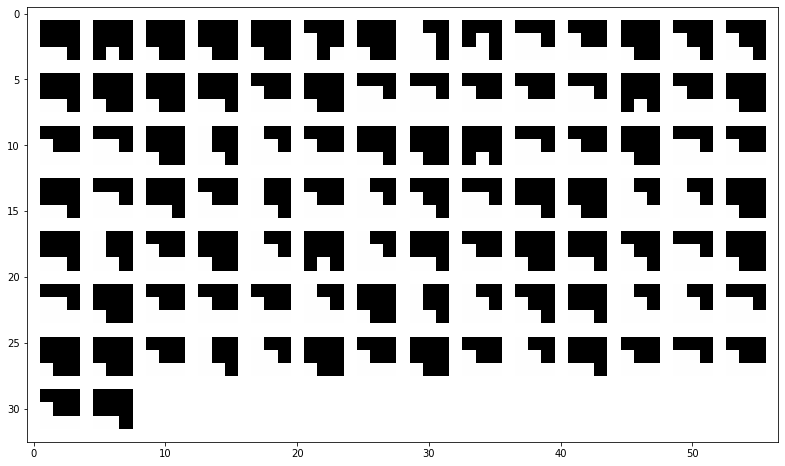

normalized regions:


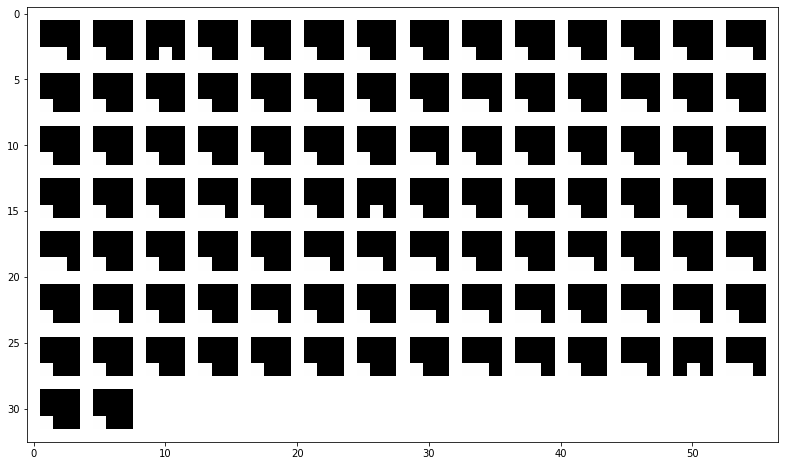

grid regions of 100 regions more=True or worst=False active for filter number: 45 :


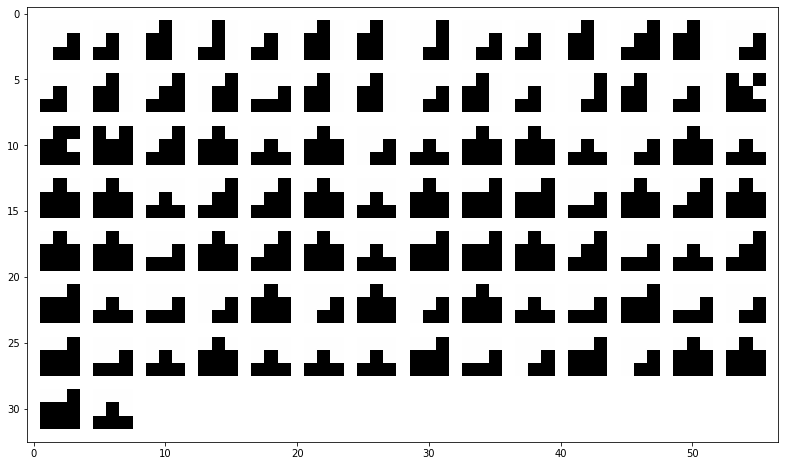

normalized regions:


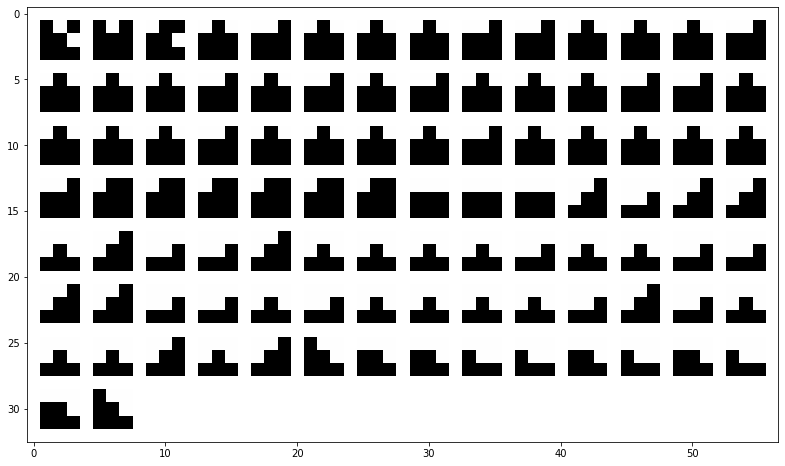

grid regions of 100 regions more=True or worst=False active for filter number: 50 :


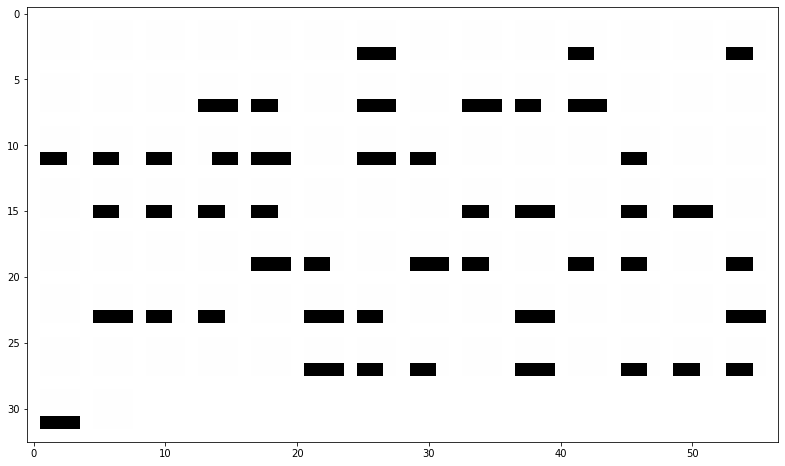

normalized regions:


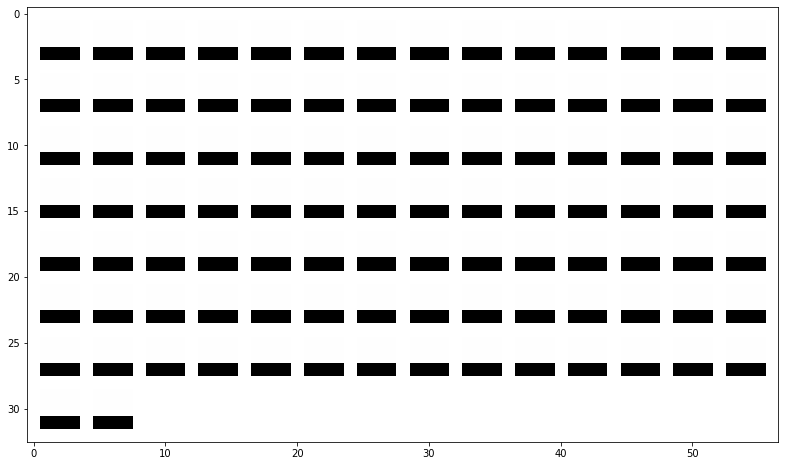

grid regions of 100 regions more=True or worst=False active for filter number: 55 :


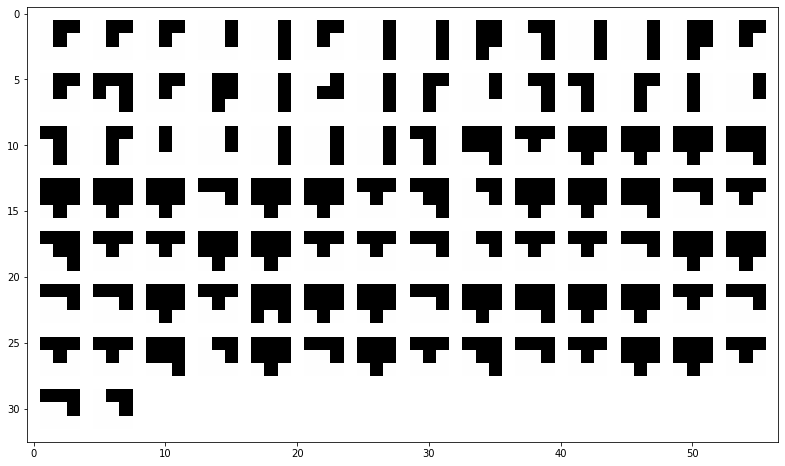

normalized regions:


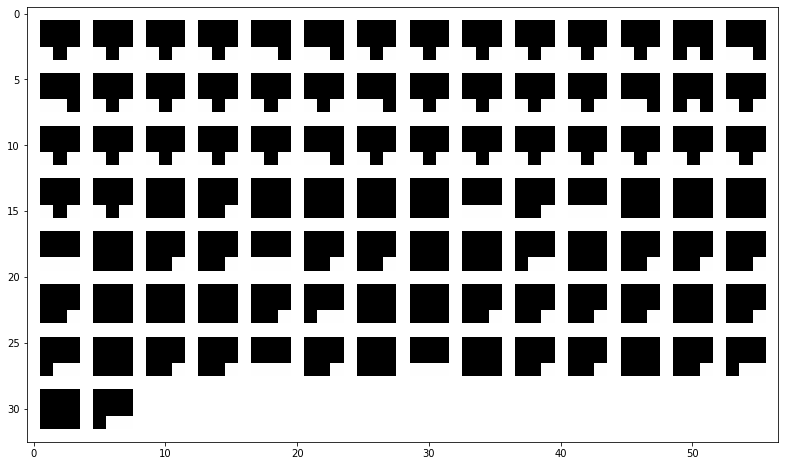

grid regions of 100 regions more=True or worst=False active for filter number: 60 :


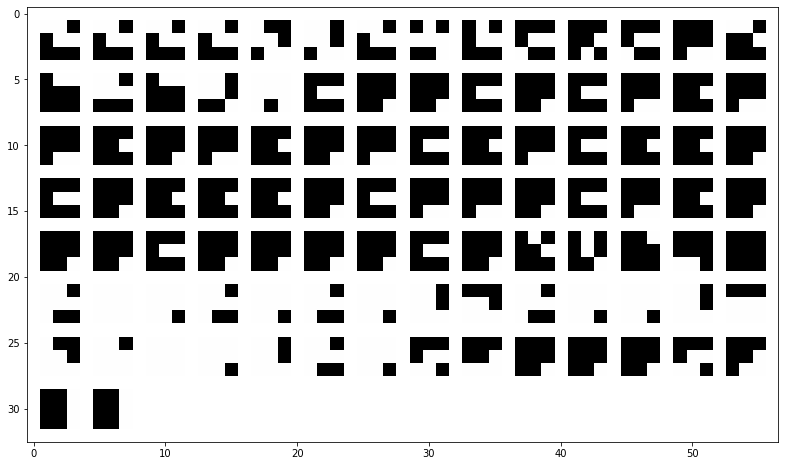

normalized regions:


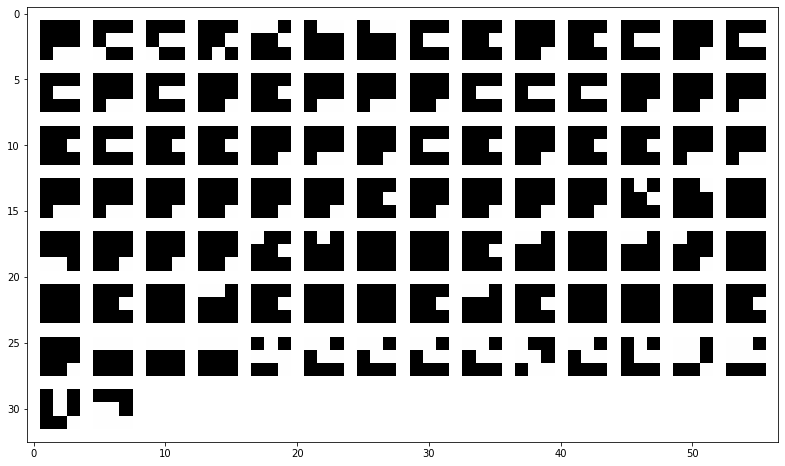

In [10]:
# regions and activation of interest
list_filter = list_filter_interest_layer1
regions = region_layer1_no_binary_maxpooling
activations = activation_layer1_no_binary_maxpooling
activations_normalized = activation_layer1_no_binary_normalized_maxpooling

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

Interest of filters: [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 80, 85, 90, 95, 100, 105, 110, 115, 120, 125]
Consider 10% image regions = 100 images
Consider 10% image regions = 100 images
mean image:
mean regions of 100 regions more=True or worst=False active for filter number: 0 :


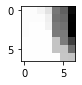

normalized region:


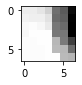

mean regions of 100 regions more=True or worst=False active for filter number: 5 :


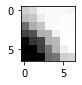

normalized region:


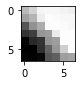

mean regions of 100 regions more=True or worst=False active for filter number: 10 :


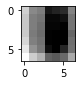

normalized region:


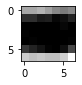

mean regions of 100 regions more=True or worst=False active for filter number: 15 :


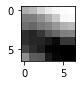

normalized region:


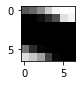

mean regions of 100 regions more=True or worst=False active for filter number: 20 :


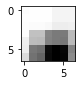

normalized region:


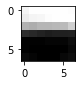

mean regions of 100 regions more=True or worst=False active for filter number: 25 :


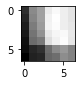

normalized region:


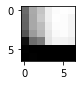

mean regions of 100 regions more=True or worst=False active for filter number: 30 :


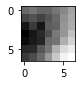

normalized region:


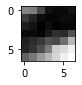

mean regions of 100 regions more=True or worst=False active for filter number: 35 :


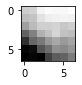

normalized region:


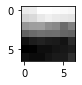

mean regions of 100 regions more=True or worst=False active for filter number: 40 :


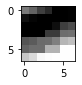

normalized region:


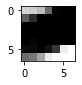

mean regions of 100 regions more=True or worst=False active for filter number: 45 :


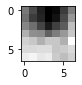

normalized region:


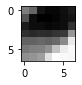

mean regions of 100 regions more=True or worst=False active for filter number: 50 :


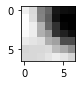

normalized region:


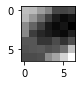

mean regions of 100 regions more=True or worst=False active for filter number: 55 :


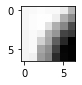

normalized region:


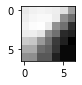

mean regions of 100 regions more=True or worst=False active for filter number: 60 :


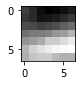

normalized region:


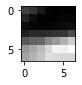

mean regions of 100 regions more=True or worst=False active for filter number: 65 :


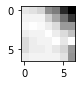

normalized region:


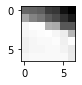

mean regions of 100 regions more=True or worst=False active for filter number: 70 :


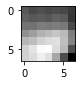

normalized region:


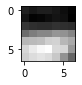

mean regions of 100 regions more=True or worst=False active for filter number: 80 :


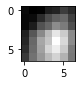

normalized region:


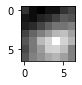

mean regions of 100 regions more=True or worst=False active for filter number: 85 :


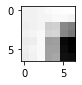

normalized region:


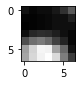

mean regions of 100 regions more=True or worst=False active for filter number: 90 :


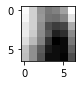

normalized region:


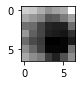

mean regions of 100 regions more=True or worst=False active for filter number: 95 :


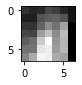

normalized region:


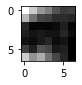

mean regions of 100 regions more=True or worst=False active for filter number: 100 :


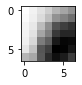

normalized region:


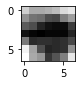

mean regions of 100 regions more=True or worst=False active for filter number: 105 :


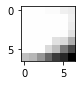

normalized region:


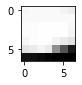

mean regions of 100 regions more=True or worst=False active for filter number: 110 :


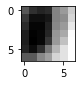

normalized region:


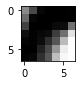

mean regions of 100 regions more=True or worst=False active for filter number: 115 :


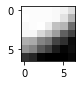

normalized region:


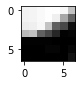

mean regions of 100 regions more=True or worst=False active for filter number: 120 :


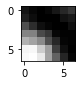

normalized region:


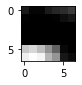

mean regions of 100 regions more=True or worst=False active for filter number: 125 :


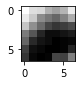

normalized region:


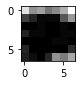

grid image
grid regions of 100 regions more=True or worst=False active for filter number: 0 :


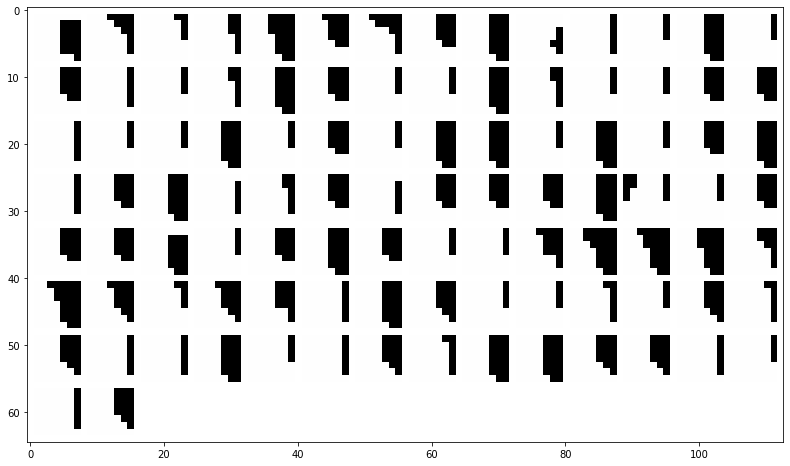

normalized regions:


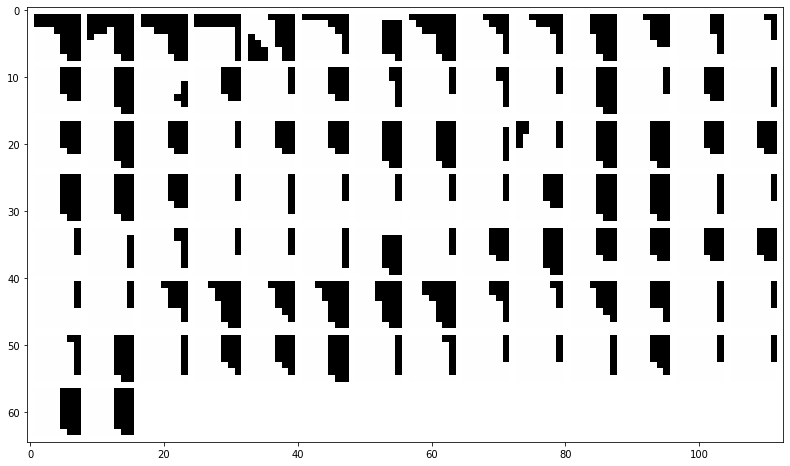

grid regions of 100 regions more=True or worst=False active for filter number: 5 :


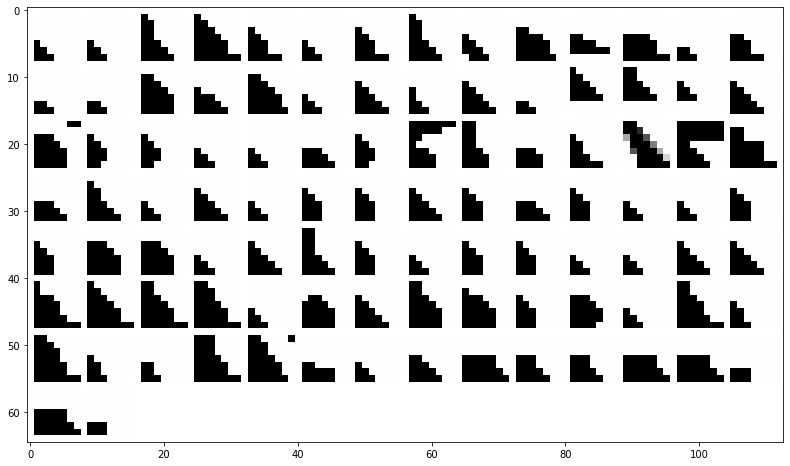

normalized regions:


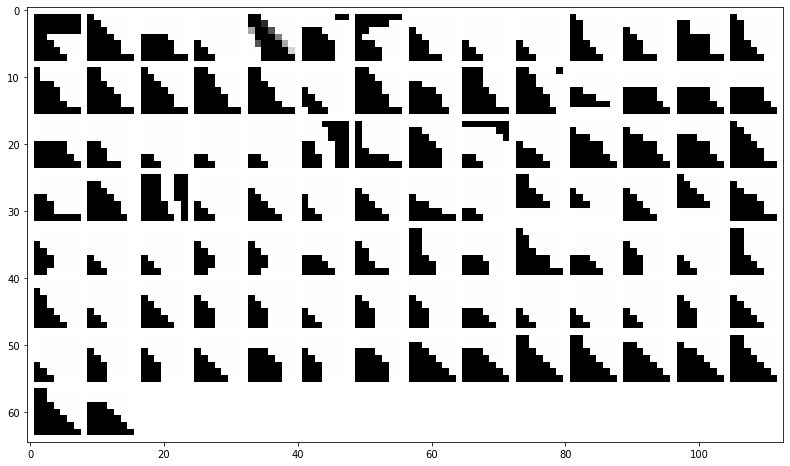

grid regions of 100 regions more=True or worst=False active for filter number: 10 :


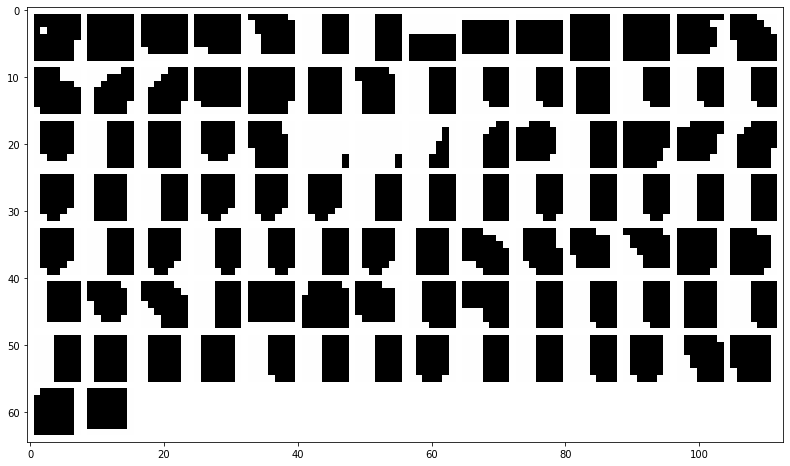

normalized regions:


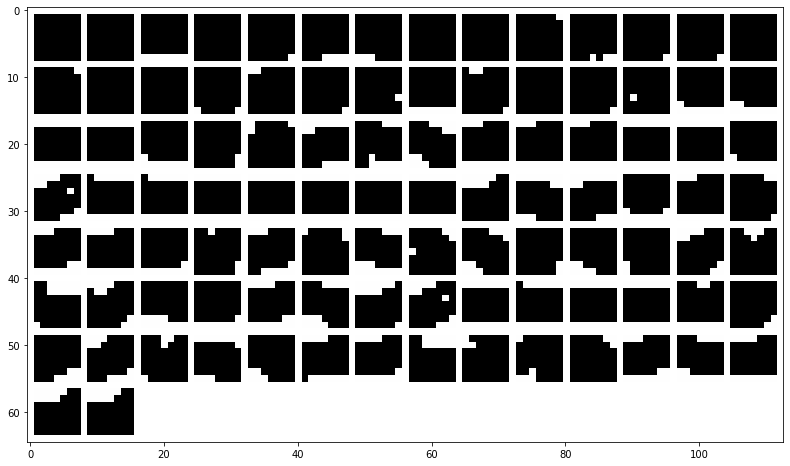

grid regions of 100 regions more=True or worst=False active for filter number: 15 :


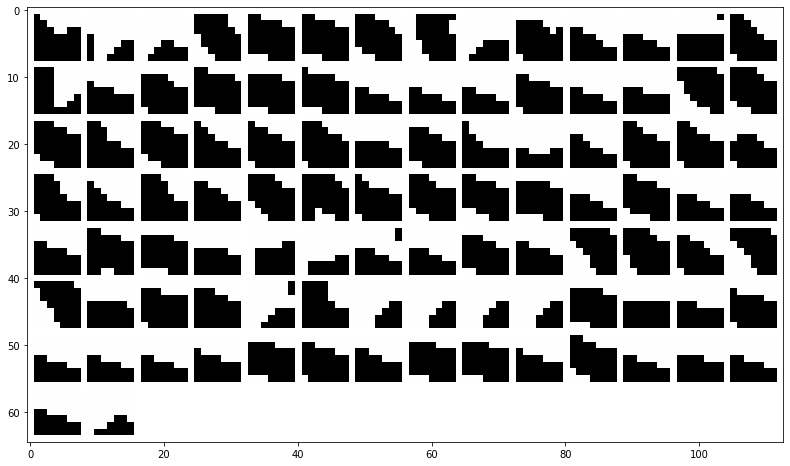

normalized regions:


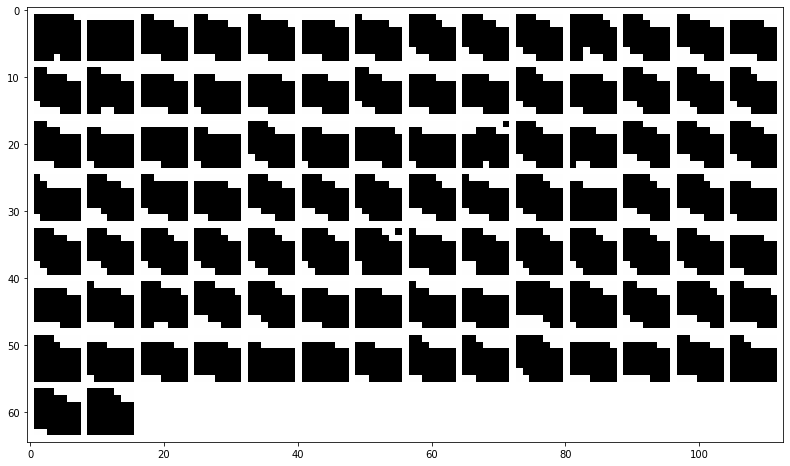

grid regions of 100 regions more=True or worst=False active for filter number: 20 :


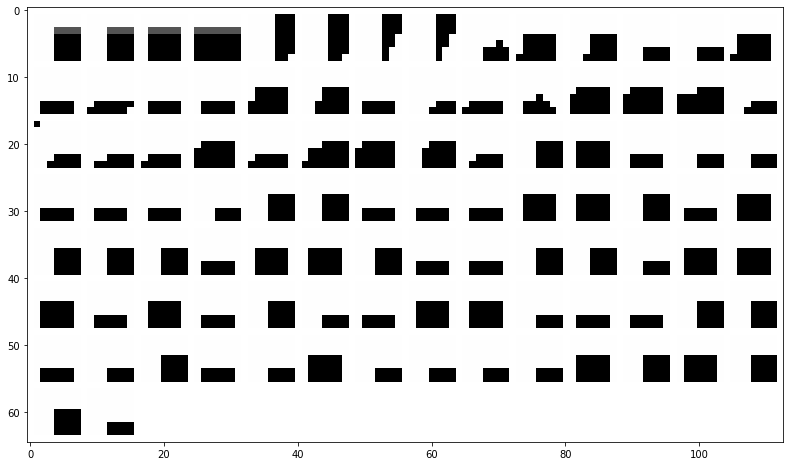

normalized regions:


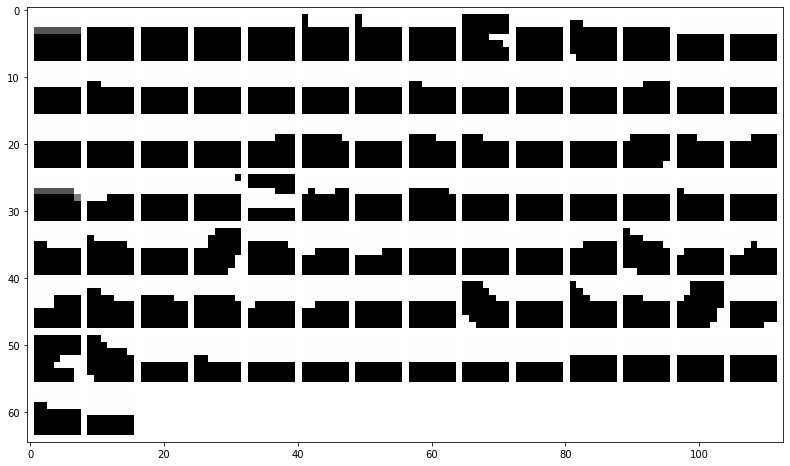

grid regions of 100 regions more=True or worst=False active for filter number: 25 :


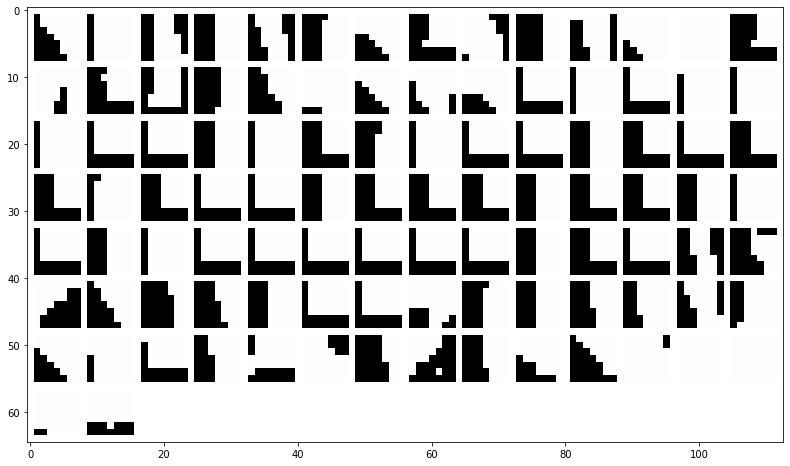

normalized regions:


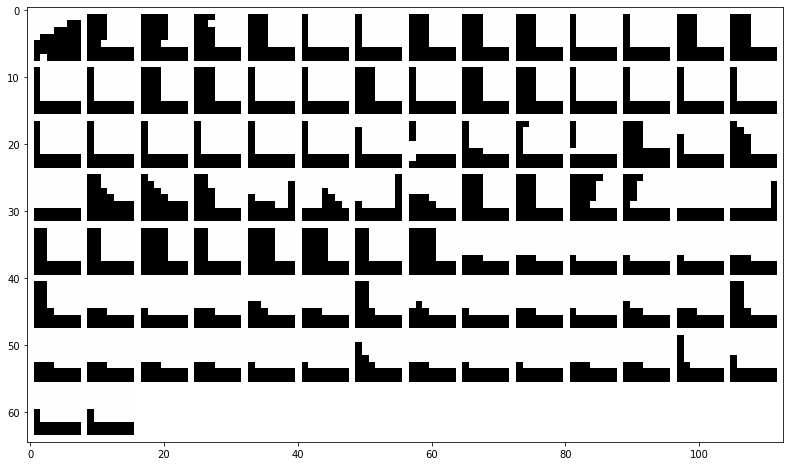

grid regions of 100 regions more=True or worst=False active for filter number: 30 :


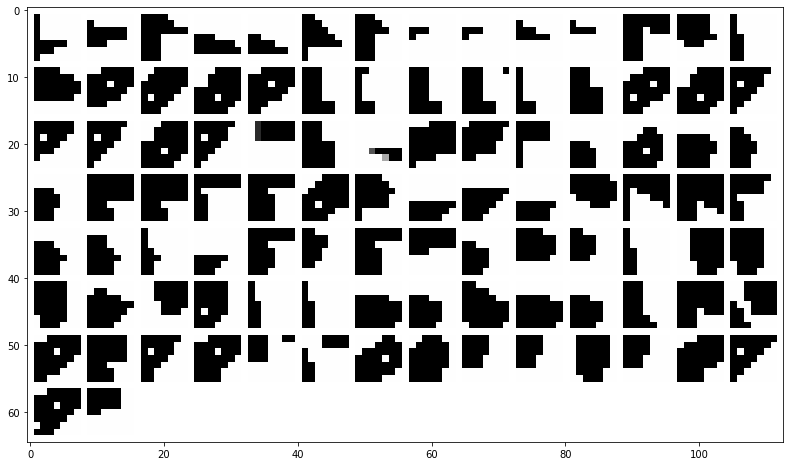

normalized regions:


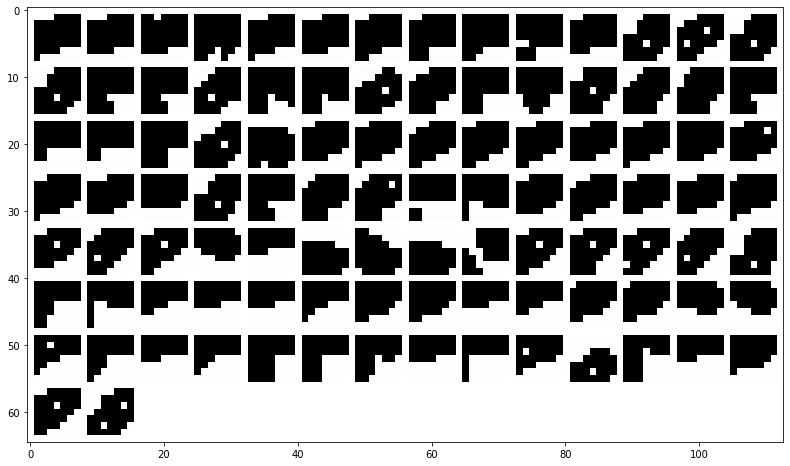

grid regions of 100 regions more=True or worst=False active for filter number: 35 :


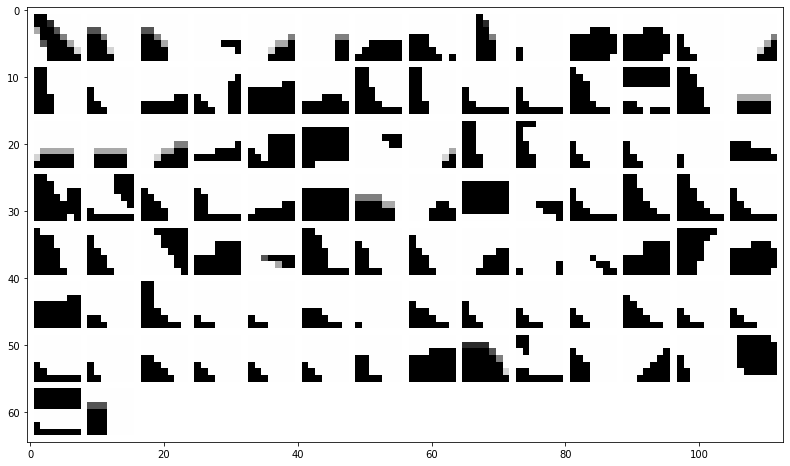

normalized regions:


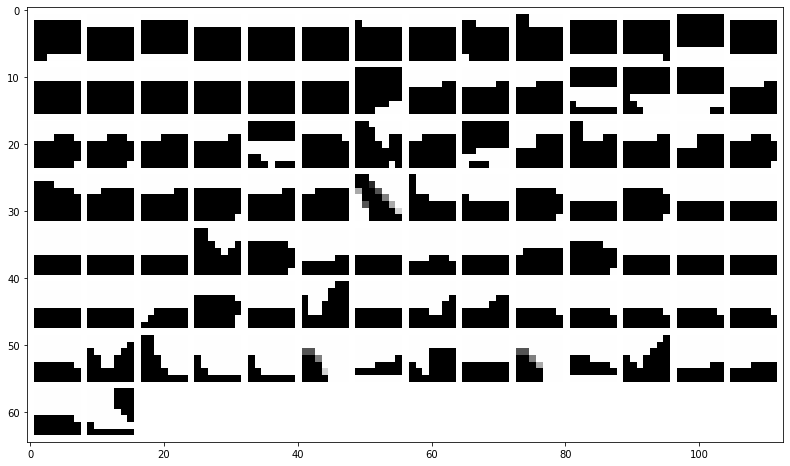

grid regions of 100 regions more=True or worst=False active for filter number: 40 :


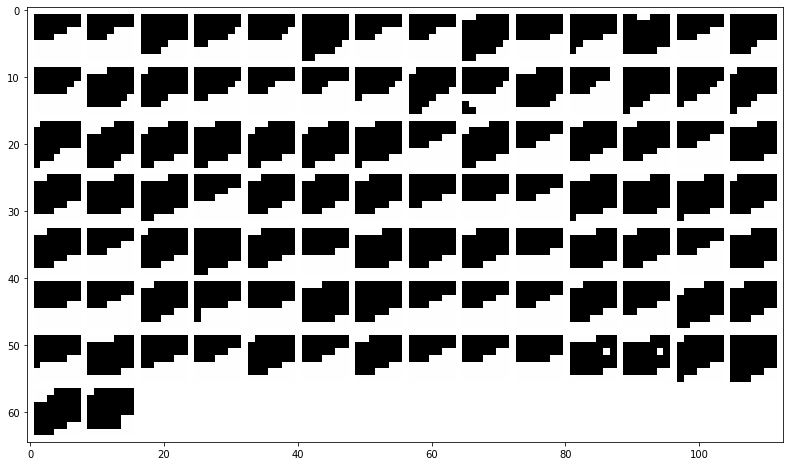

normalized regions:


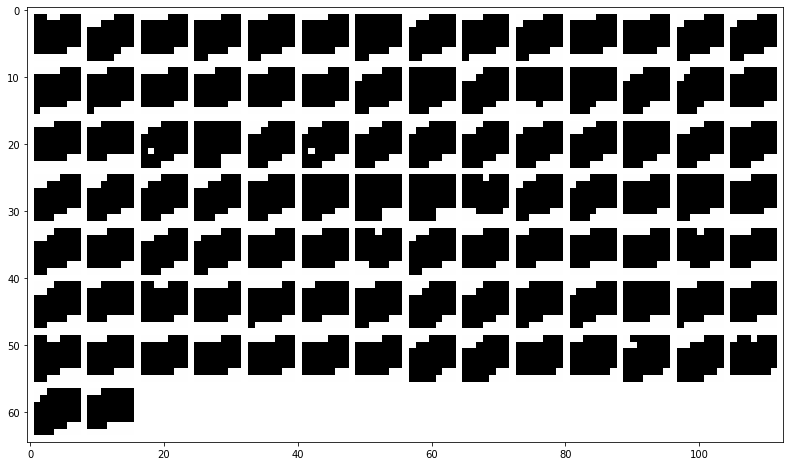

grid regions of 100 regions more=True or worst=False active for filter number: 45 :


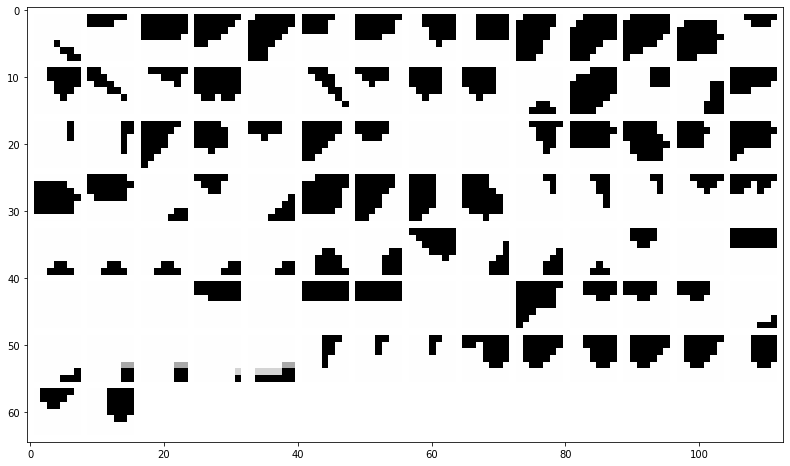

normalized regions:


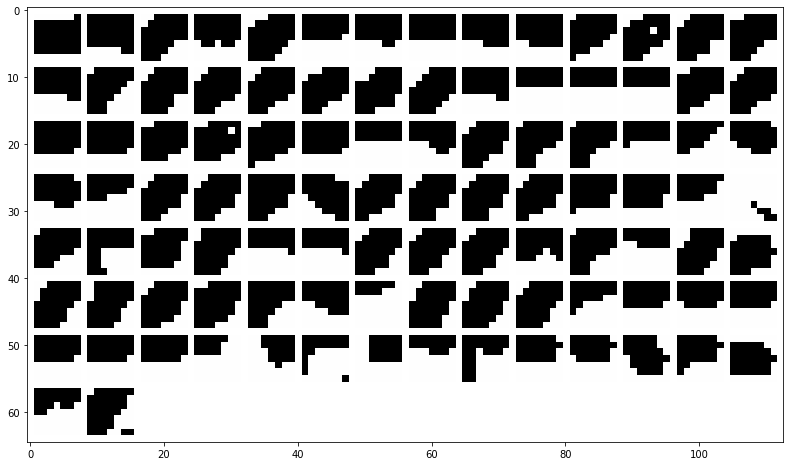

grid regions of 100 regions more=True or worst=False active for filter number: 50 :


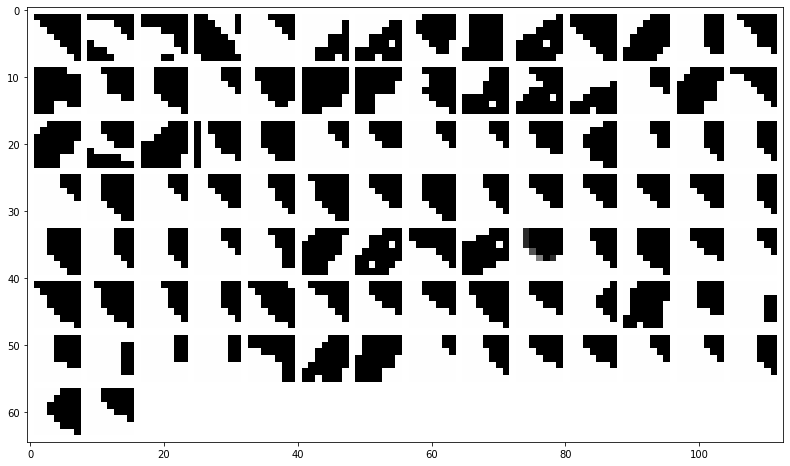

normalized regions:


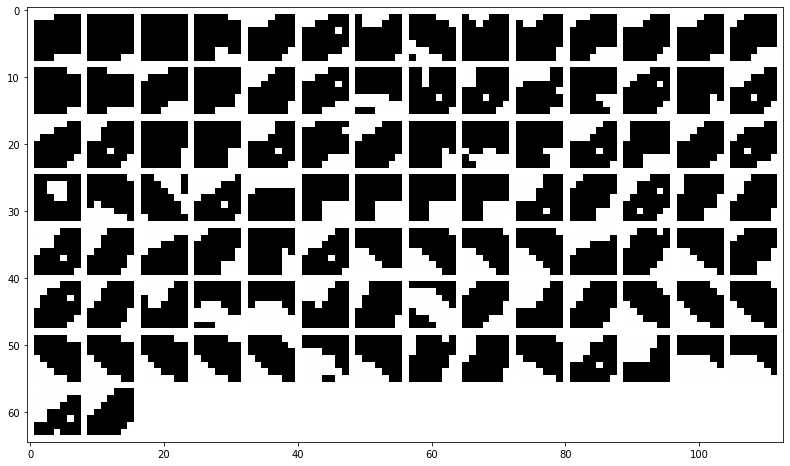

grid regions of 100 regions more=True or worst=False active for filter number: 55 :


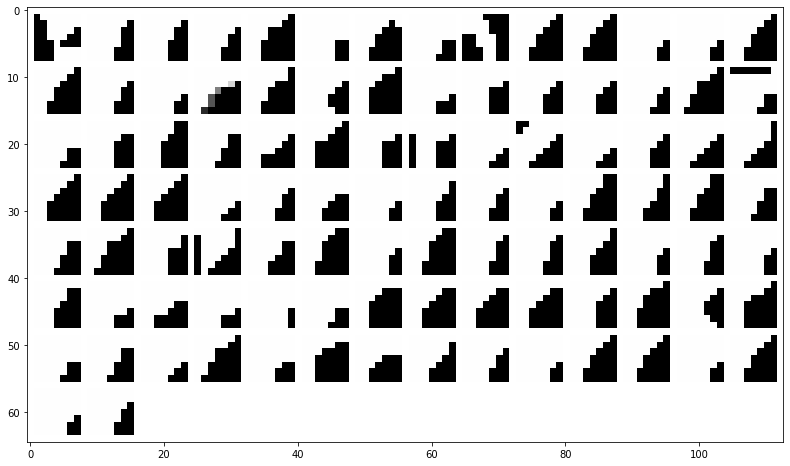

normalized regions:


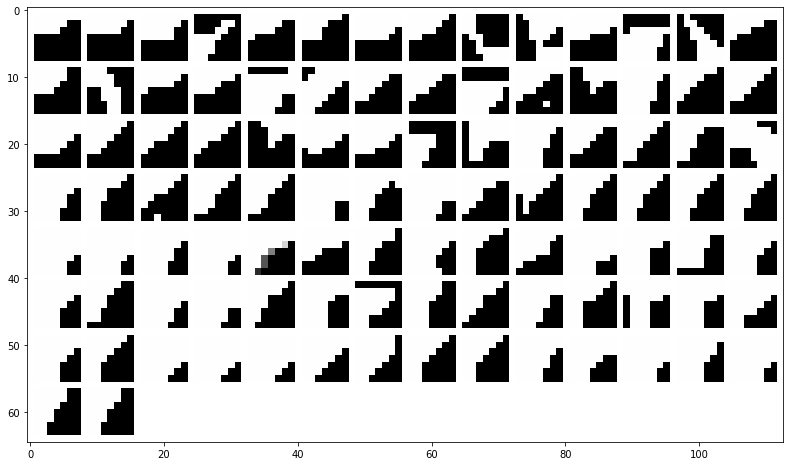

grid regions of 100 regions more=True or worst=False active for filter number: 60 :


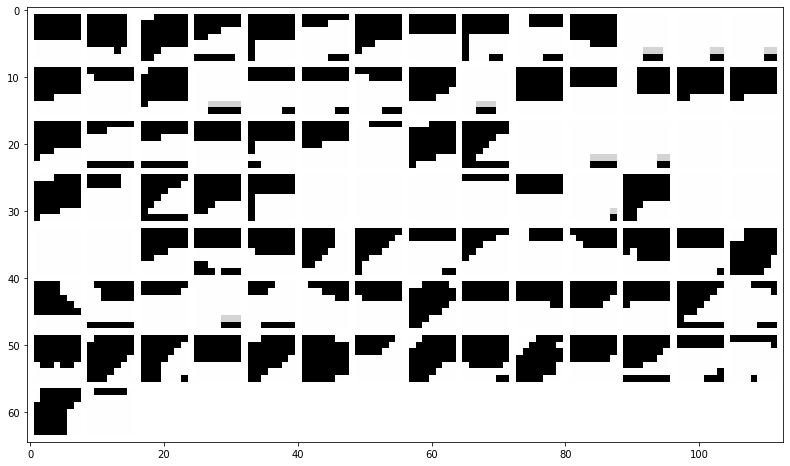

normalized regions:


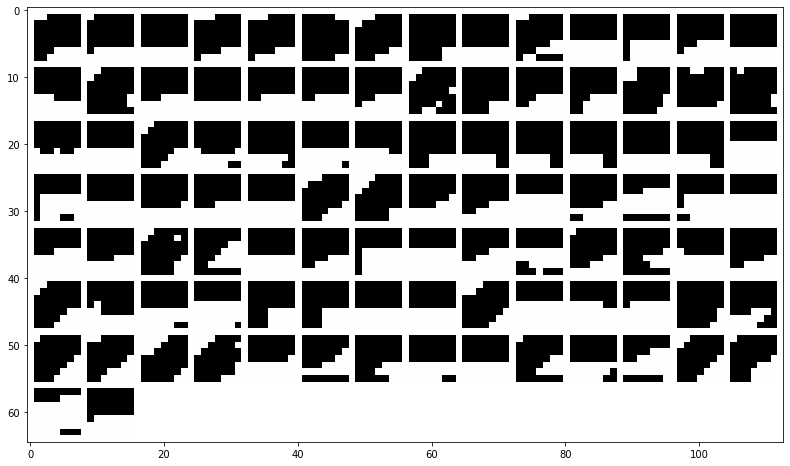

grid regions of 100 regions more=True or worst=False active for filter number: 65 :


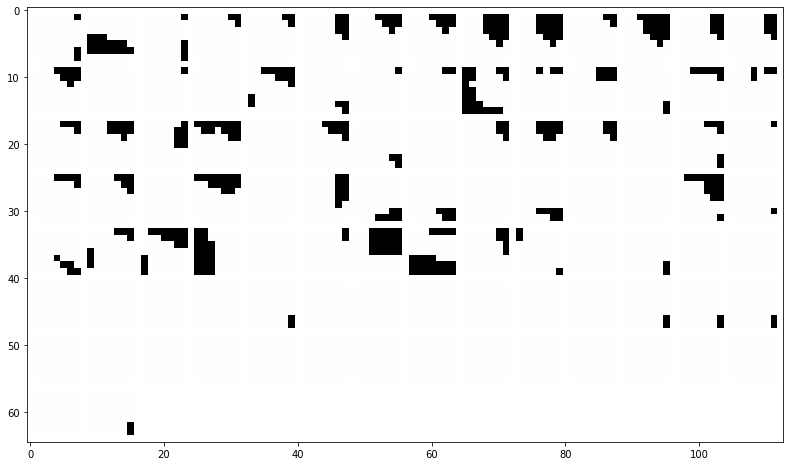

normalized regions:


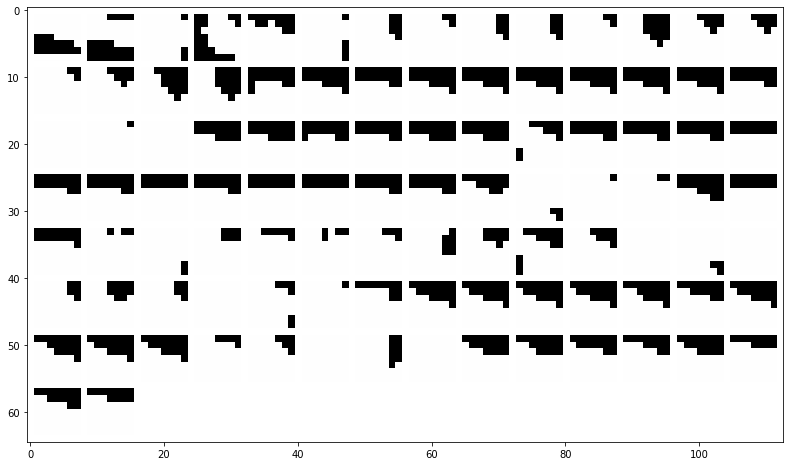

grid regions of 100 regions more=True or worst=False active for filter number: 70 :


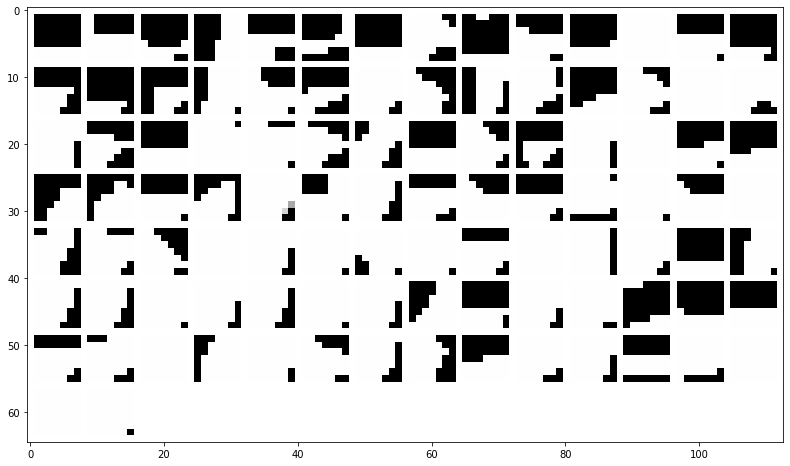

normalized regions:


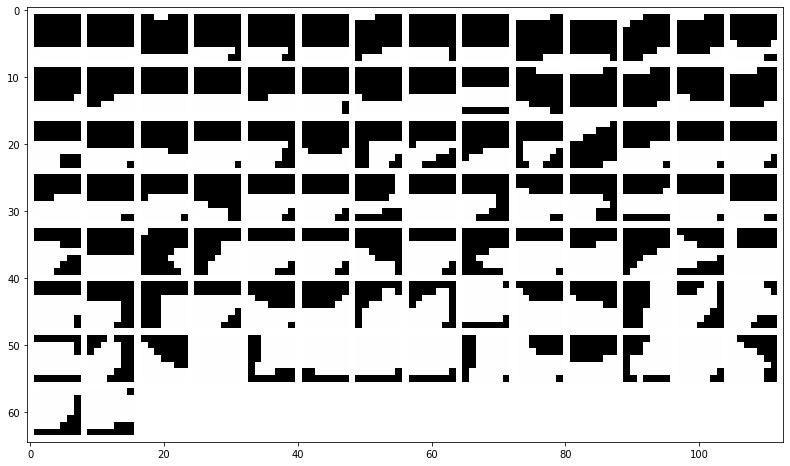

grid regions of 100 regions more=True or worst=False active for filter number: 80 :


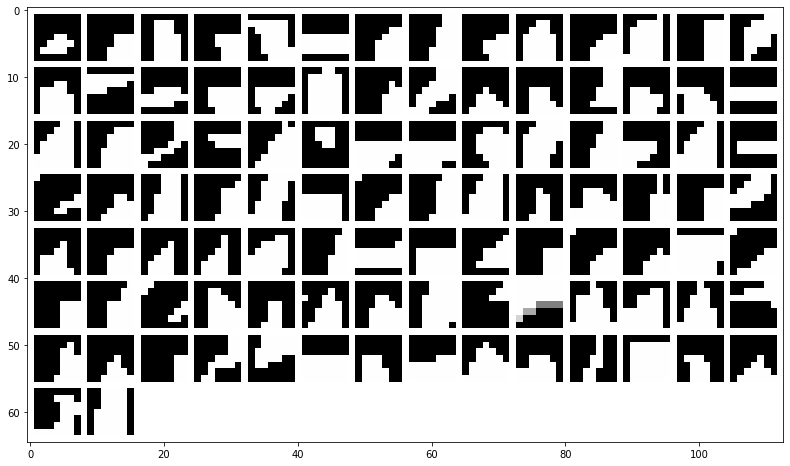

normalized regions:


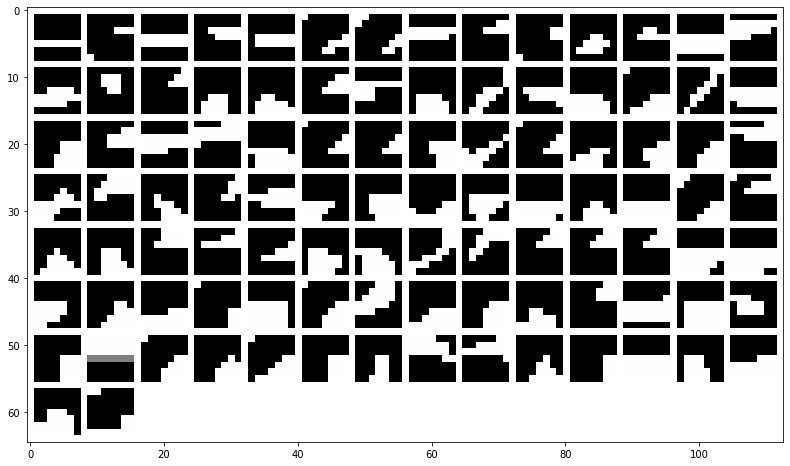

grid regions of 100 regions more=True or worst=False active for filter number: 85 :


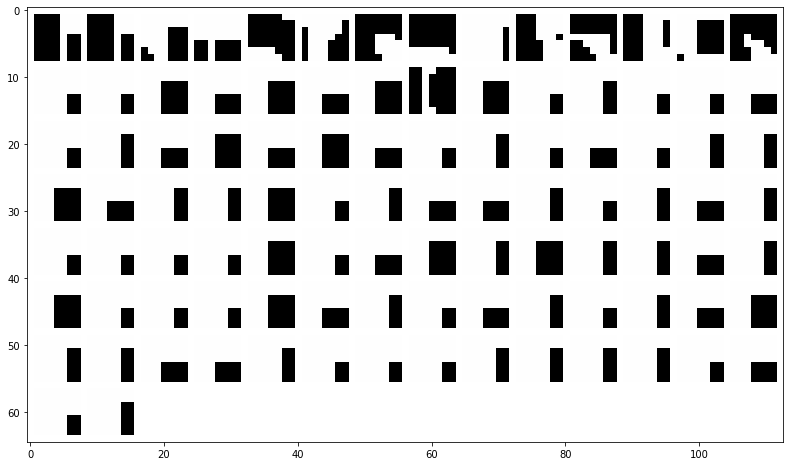

normalized regions:


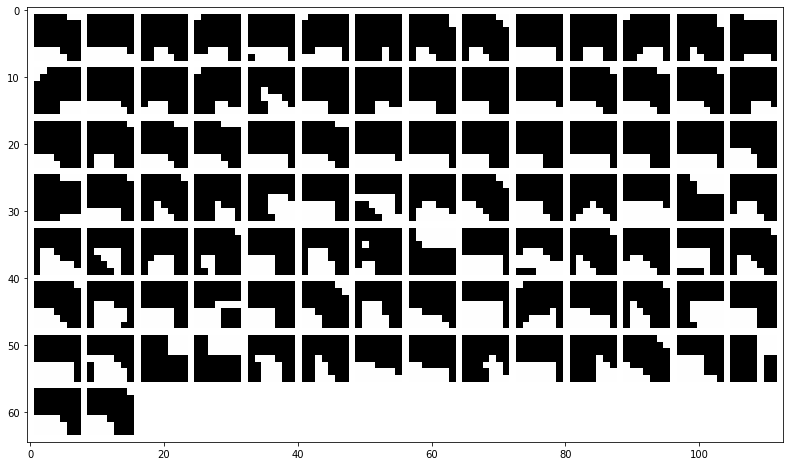

grid regions of 100 regions more=True or worst=False active for filter number: 90 :


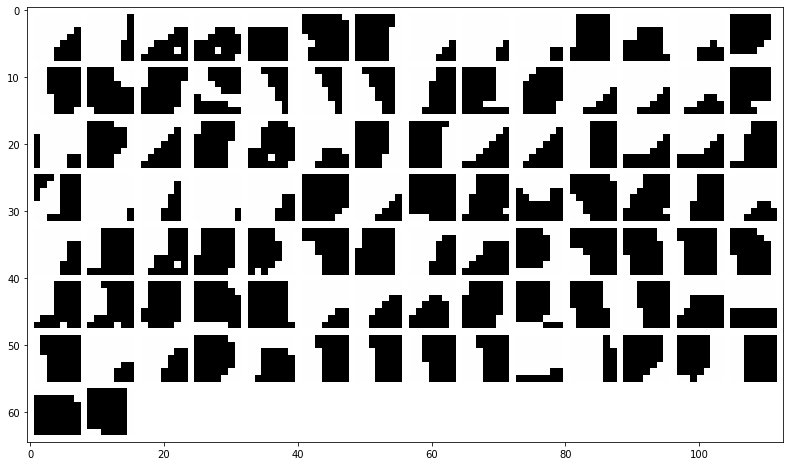

normalized regions:


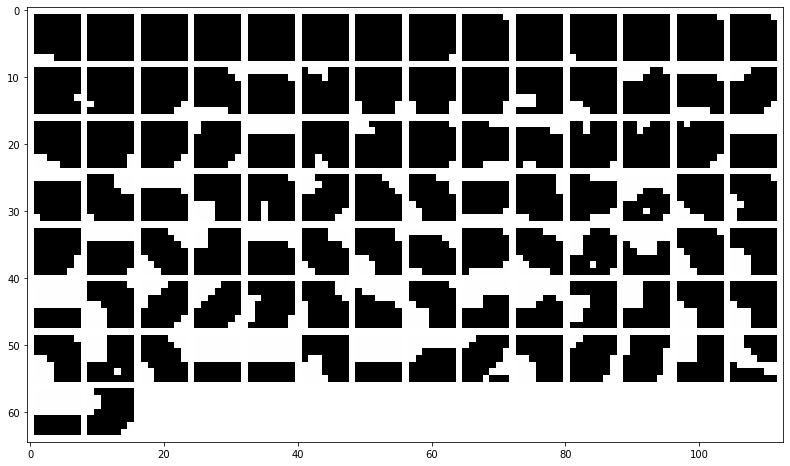

grid regions of 100 regions more=True or worst=False active for filter number: 95 :


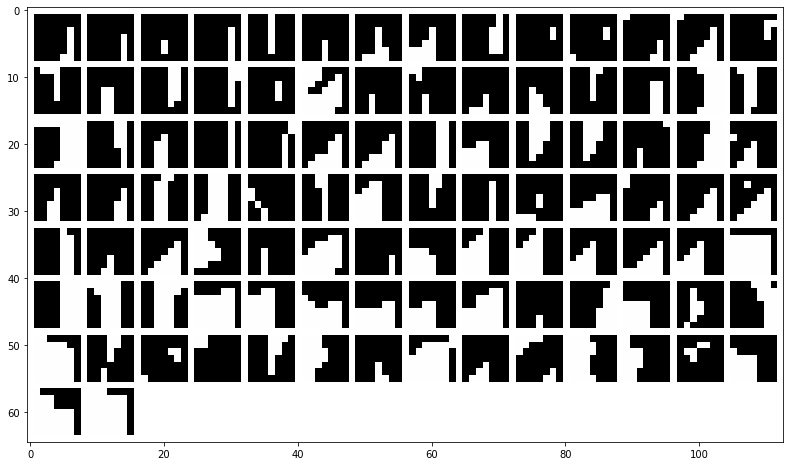

normalized regions:


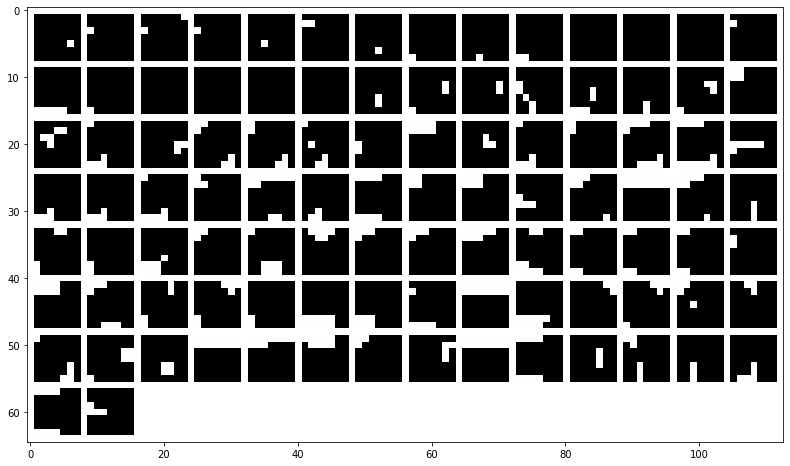

grid regions of 100 regions more=True or worst=False active for filter number: 100 :


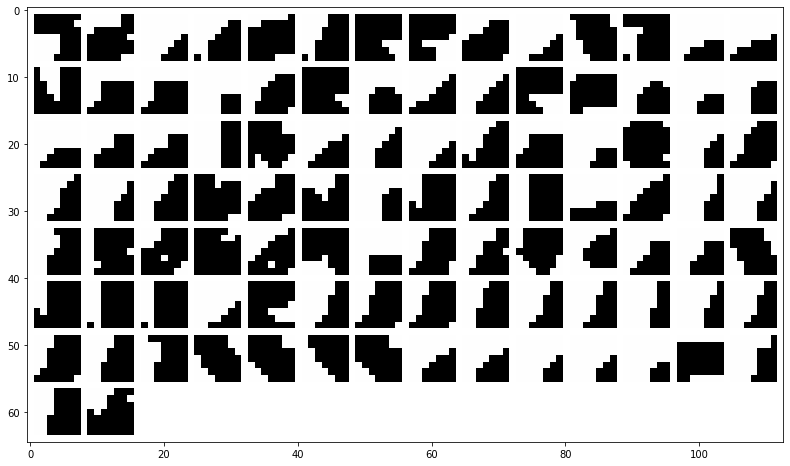

normalized regions:


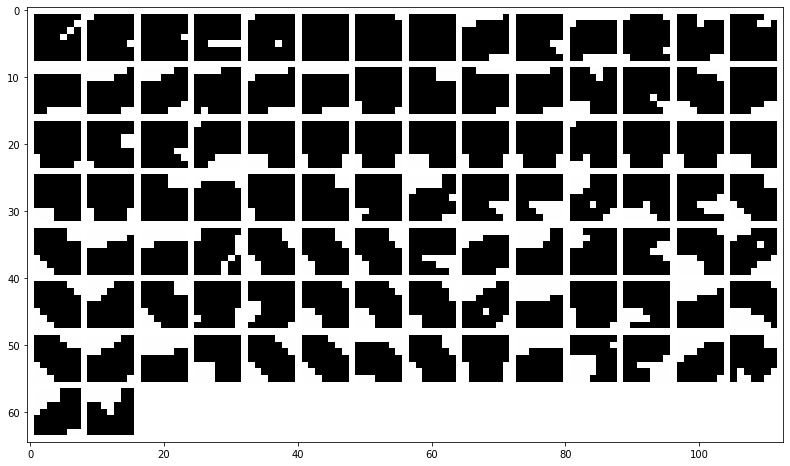

grid regions of 100 regions more=True or worst=False active for filter number: 105 :


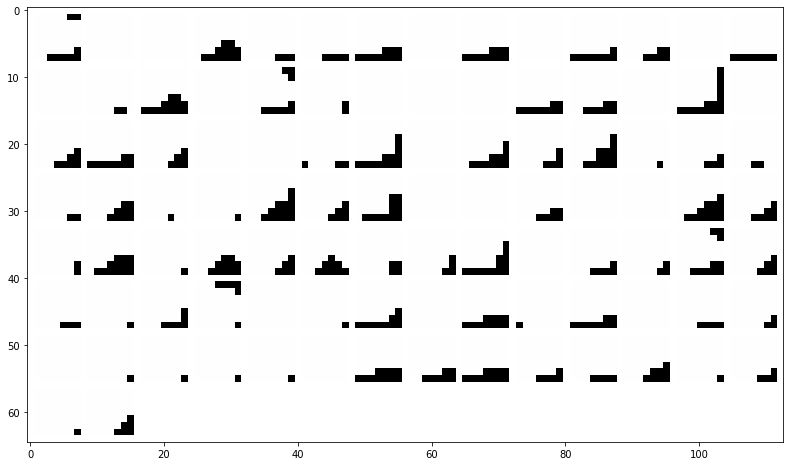

normalized regions:


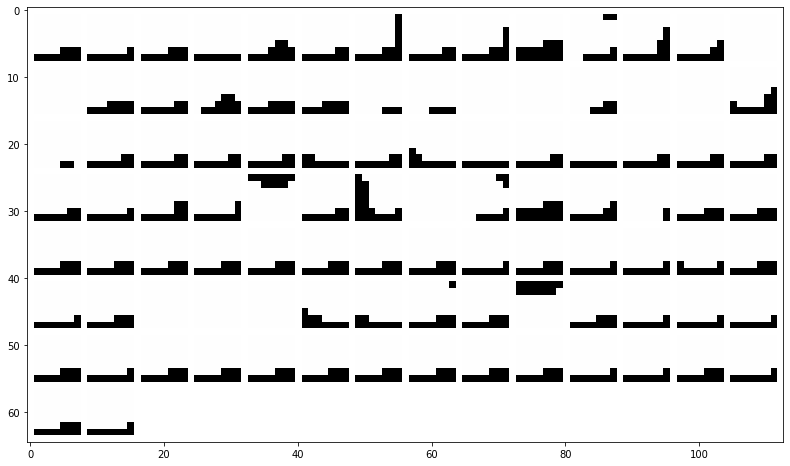

grid regions of 100 regions more=True or worst=False active for filter number: 110 :


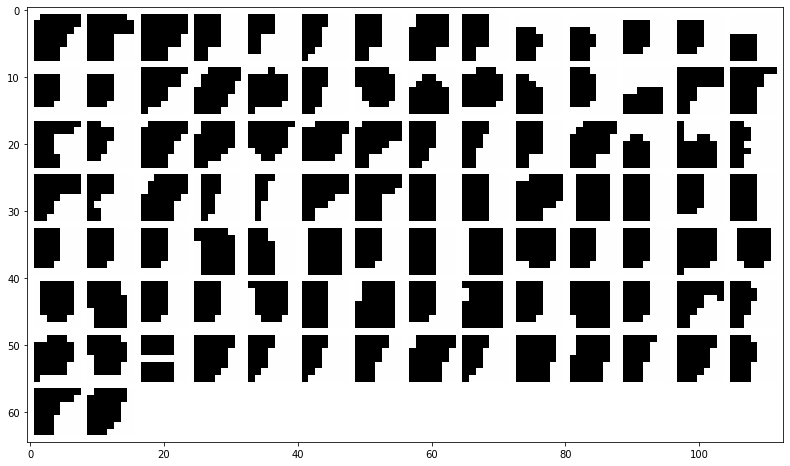

normalized regions:


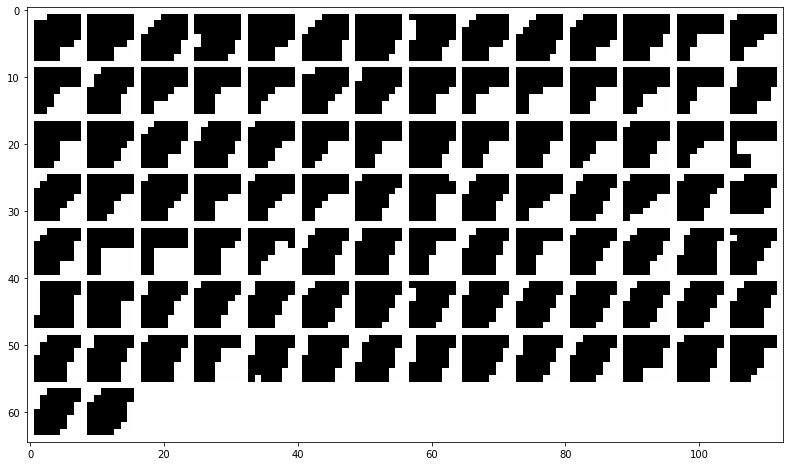

grid regions of 100 regions more=True or worst=False active for filter number: 115 :


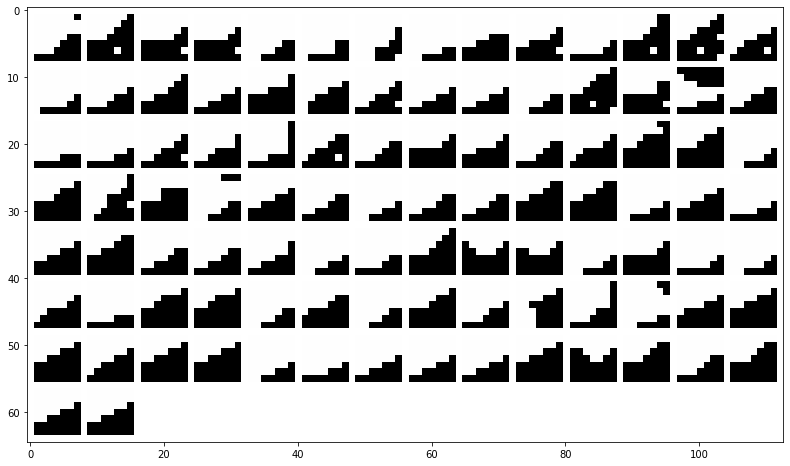

normalized regions:


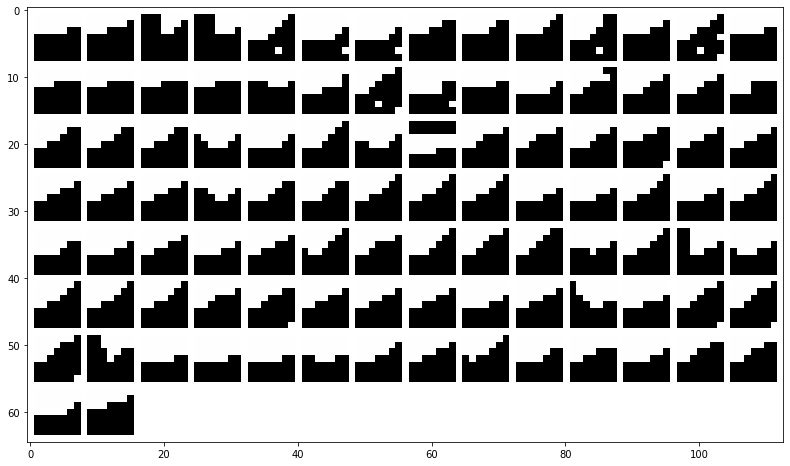

grid regions of 100 regions more=True or worst=False active for filter number: 120 :


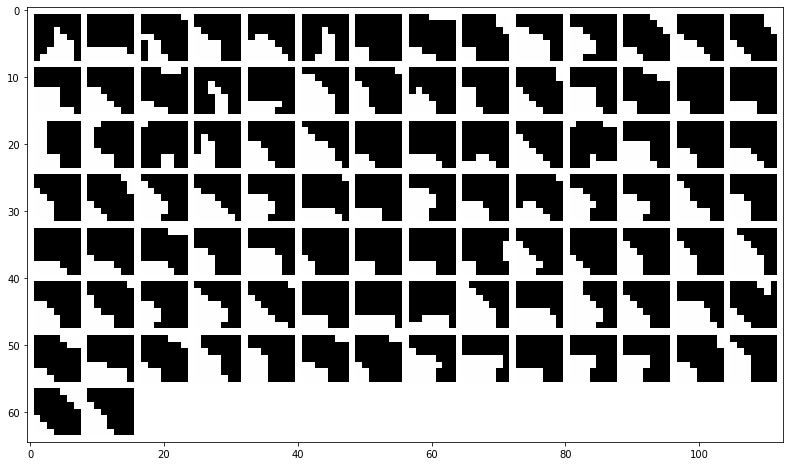

normalized regions:


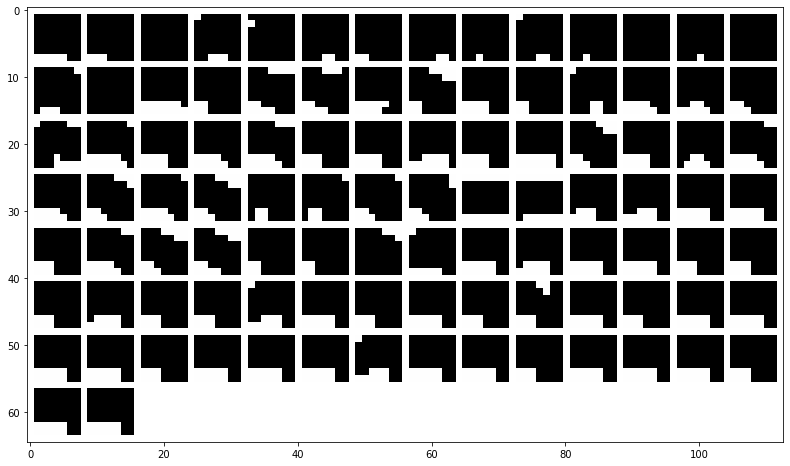

grid regions of 100 regions more=True or worst=False active for filter number: 125 :


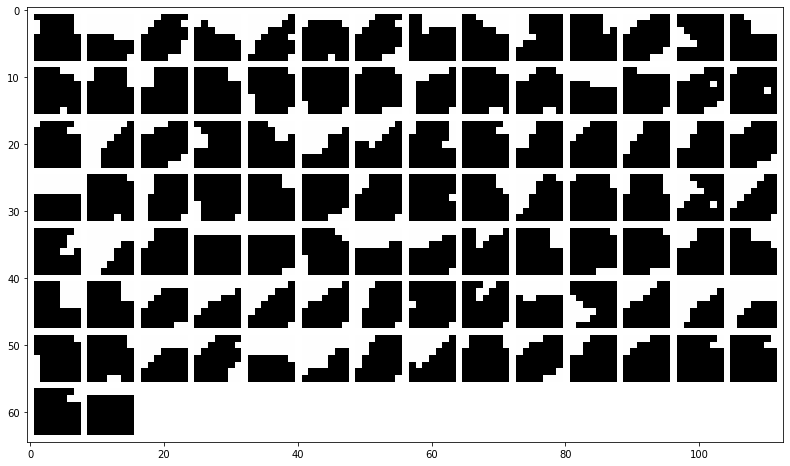

normalized regions:


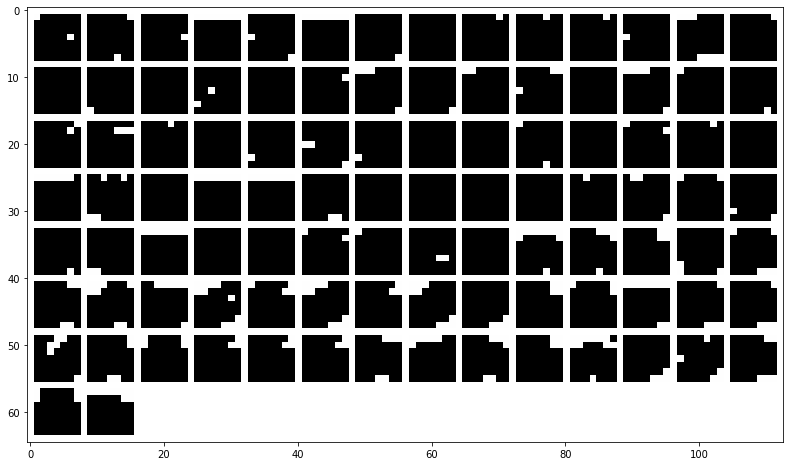

In [11]:
list_filter = list_filter_interest_layer2
regions = region_layer2_no_binary_maxpooling
activations = activation_layer2_no_binary_maxpooling
activations_normalized = activation_layer2_no_binary_normalized_maxpooling

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

Interest of filters: [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 80, 85, 90, 95, 100, 105, 110, 150, 120, 125, 150, 200, 250]
Consider 10% image regions = 100 images
Consider 10% image regions = 100 images
mean image:
mean regions of 100 regions more=True or worst=False active for filter number: 0 :


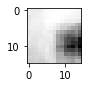

normalized region:


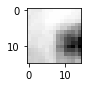

mean regions of 100 regions more=True or worst=False active for filter number: 5 :


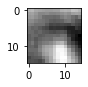

normalized region:


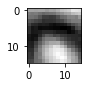

mean regions of 100 regions more=True or worst=False active for filter number: 10 :


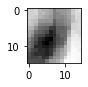

normalized region:


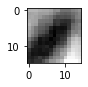

mean regions of 100 regions more=True or worst=False active for filter number: 15 :


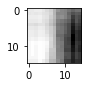

normalized region:


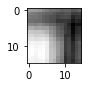

mean regions of 100 regions more=True or worst=False active for filter number: 20 :


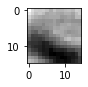

normalized region:


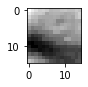

mean regions of 100 regions more=True or worst=False active for filter number: 25 :


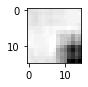

normalized region:


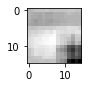

mean regions of 100 regions more=True or worst=False active for filter number: 30 :


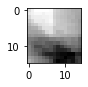

normalized region:


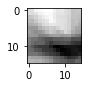

mean regions of 100 regions more=True or worst=False active for filter number: 35 :


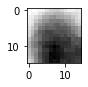

normalized region:


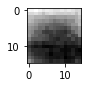

mean regions of 100 regions more=True or worst=False active for filter number: 40 :


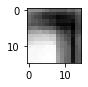

normalized region:


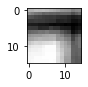

mean regions of 100 regions more=True or worst=False active for filter number: 45 :


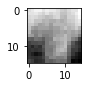

normalized region:


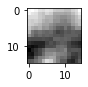

mean regions of 100 regions more=True or worst=False active for filter number: 50 :


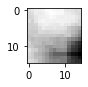

normalized region:


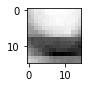

mean regions of 100 regions more=True or worst=False active for filter number: 55 :


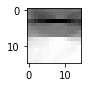

normalized region:


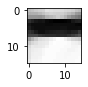

mean regions of 100 regions more=True or worst=False active for filter number: 60 :


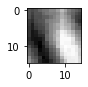

normalized region:


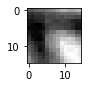

mean regions of 100 regions more=True or worst=False active for filter number: 65 :


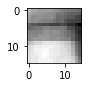

normalized region:


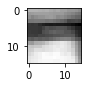

mean regions of 100 regions more=True or worst=False active for filter number: 70 :


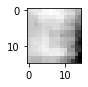

normalized region:


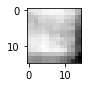

mean regions of 100 regions more=True or worst=False active for filter number: 80 :


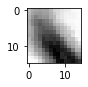

normalized region:


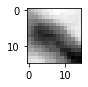

mean regions of 100 regions more=True or worst=False active for filter number: 85 :


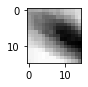

normalized region:


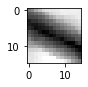

mean regions of 100 regions more=True or worst=False active for filter number: 90 :


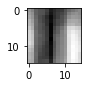

normalized region:


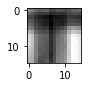

mean regions of 100 regions more=True or worst=False active for filter number: 95 :


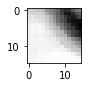

normalized region:


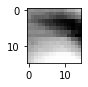

mean regions of 100 regions more=True or worst=False active for filter number: 100 :


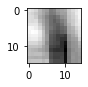

normalized region:


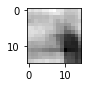

mean regions of 100 regions more=True or worst=False active for filter number: 105 :


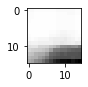

normalized region:


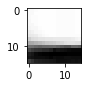

mean regions of 100 regions more=True or worst=False active for filter number: 110 :


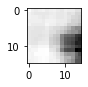

normalized region:


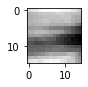

mean regions of 100 regions more=True or worst=False active for filter number: 150 :


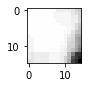

normalized region:


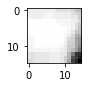

mean regions of 100 regions more=True or worst=False active for filter number: 120 :


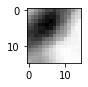

normalized region:


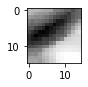

mean regions of 100 regions more=True or worst=False active for filter number: 125 :


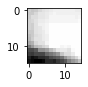

normalized region:


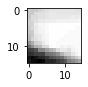

mean regions of 100 regions more=True or worst=False active for filter number: 150 :


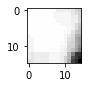

normalized region:


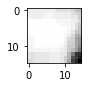

mean regions of 100 regions more=True or worst=False active for filter number: 200 :


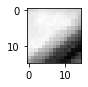

normalized region:


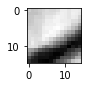

mean regions of 100 regions more=True or worst=False active for filter number: 250 :


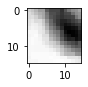

normalized region:


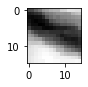

grid image
grid regions of 100 regions more=True or worst=False active for filter number: 0 :


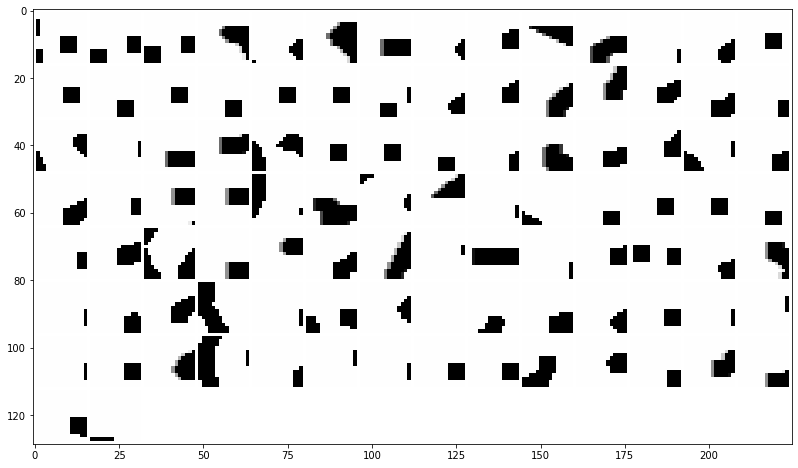

normalized regions:


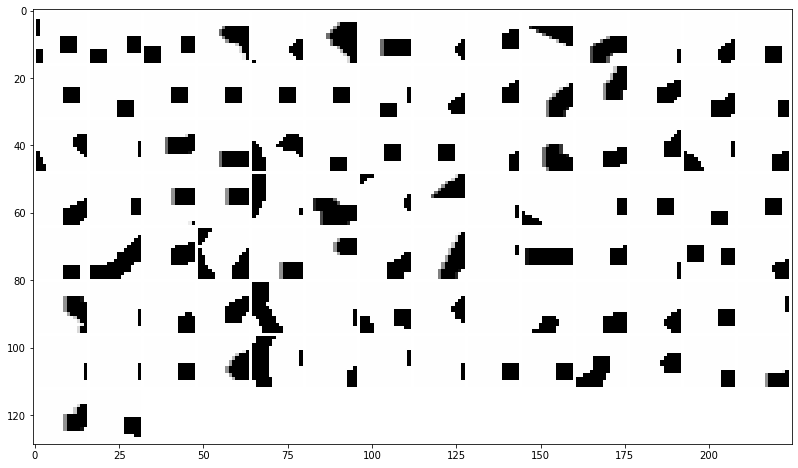

grid regions of 100 regions more=True or worst=False active for filter number: 5 :


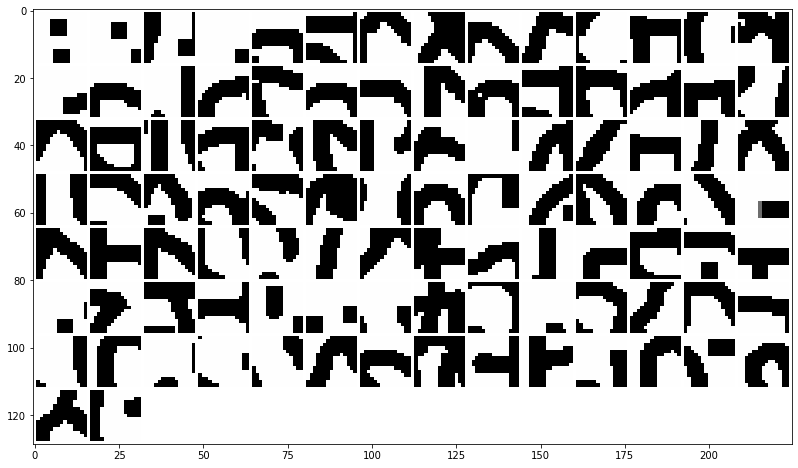

normalized regions:


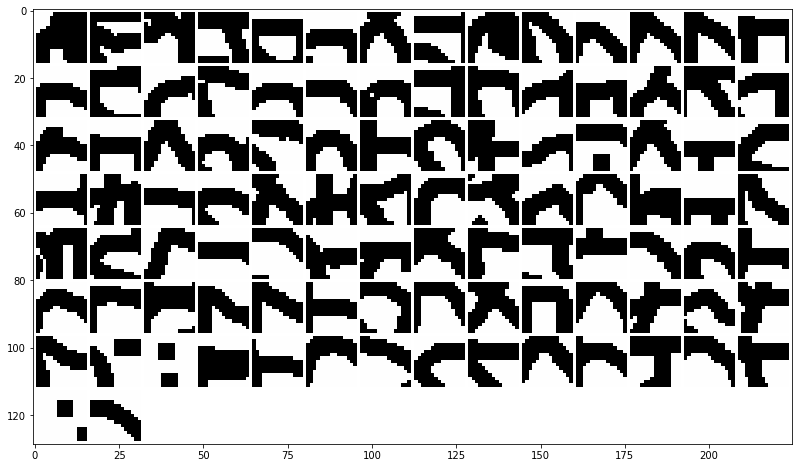

grid regions of 100 regions more=True or worst=False active for filter number: 10 :


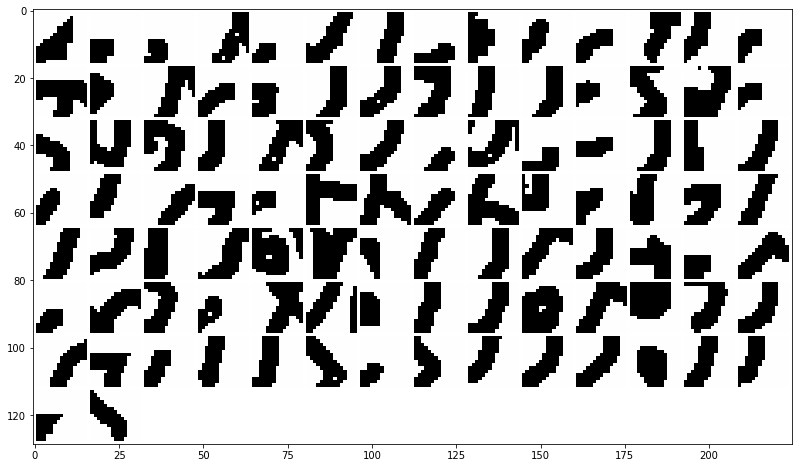

normalized regions:


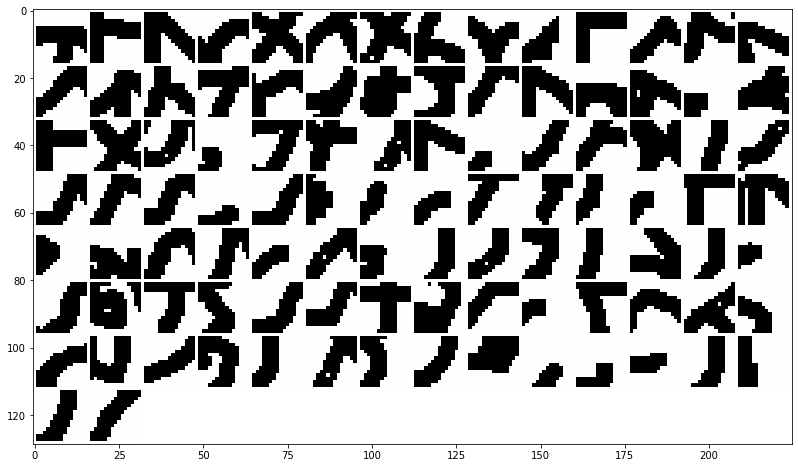

grid regions of 100 regions more=True or worst=False active for filter number: 15 :


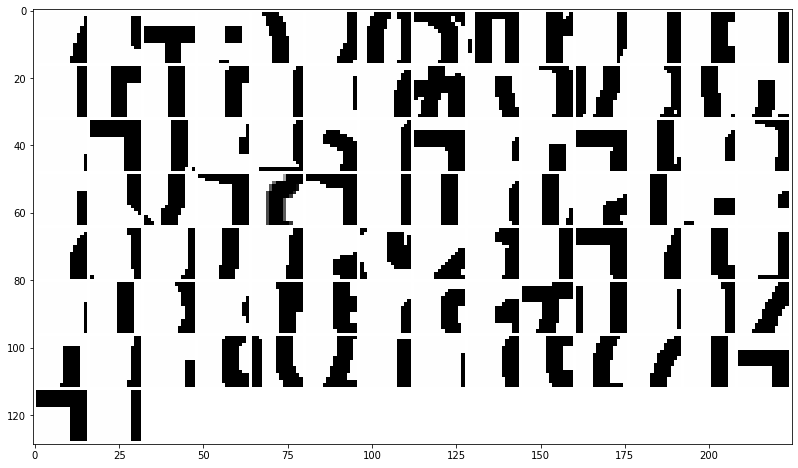

normalized regions:


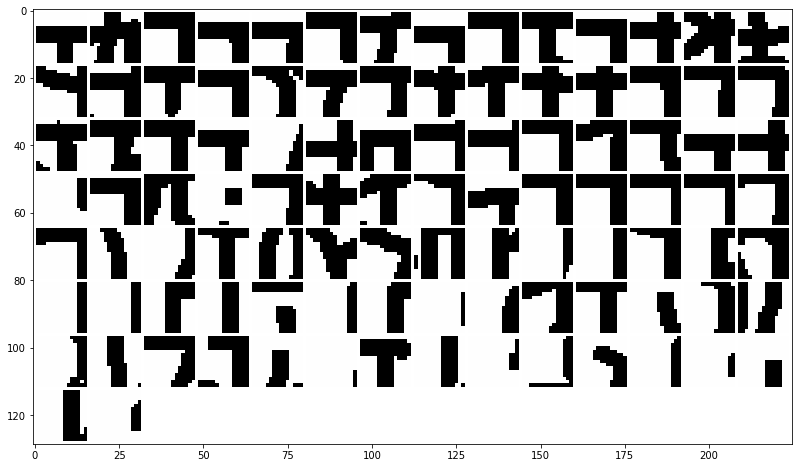

grid regions of 100 regions more=True or worst=False active for filter number: 20 :


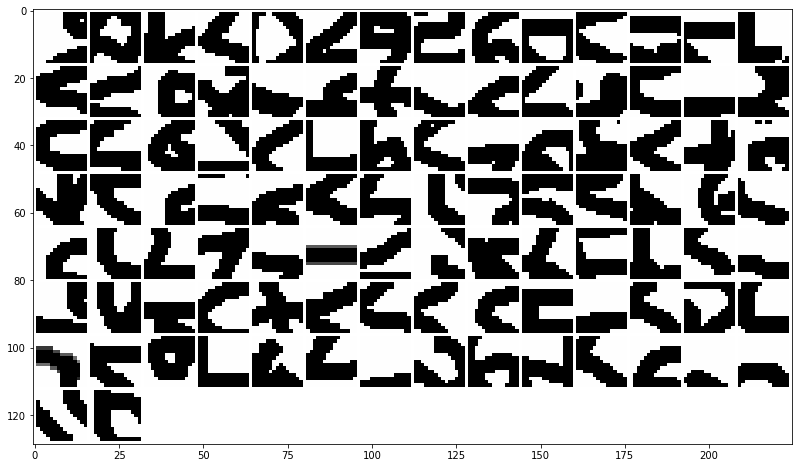

normalized regions:


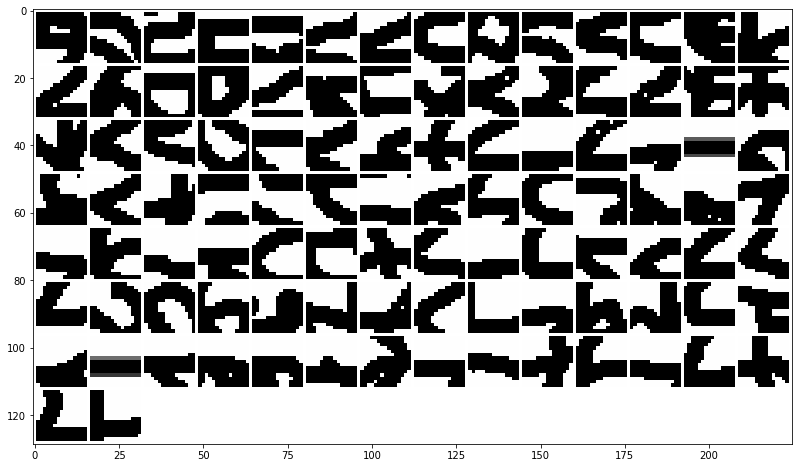

grid regions of 100 regions more=True or worst=False active for filter number: 25 :


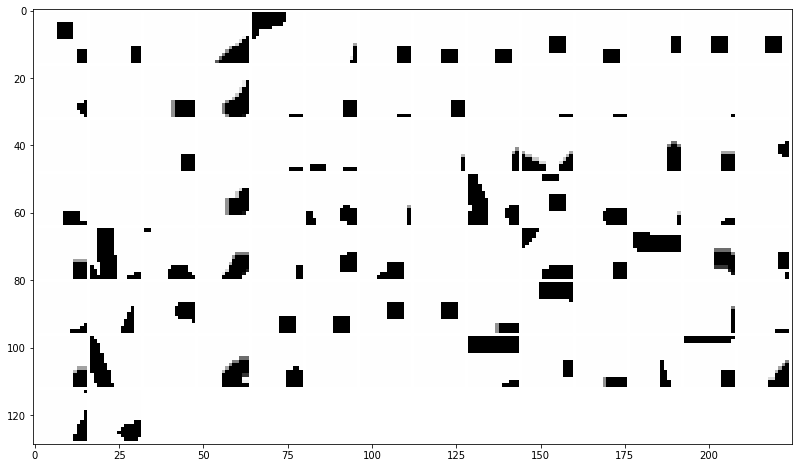

normalized regions:


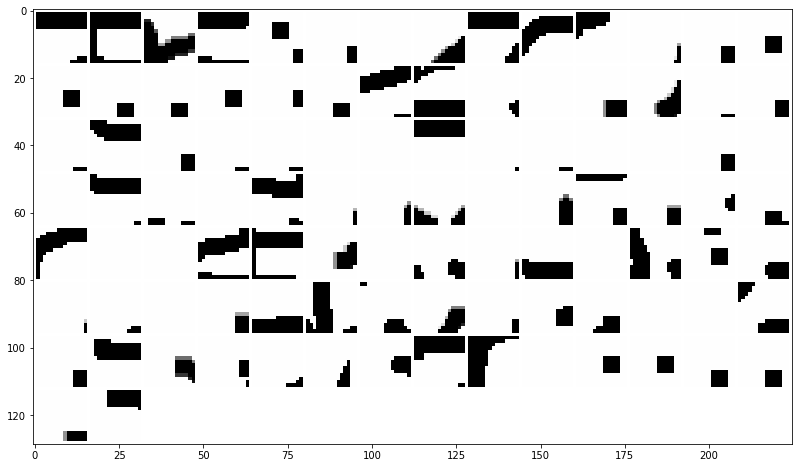

grid regions of 100 regions more=True or worst=False active for filter number: 30 :


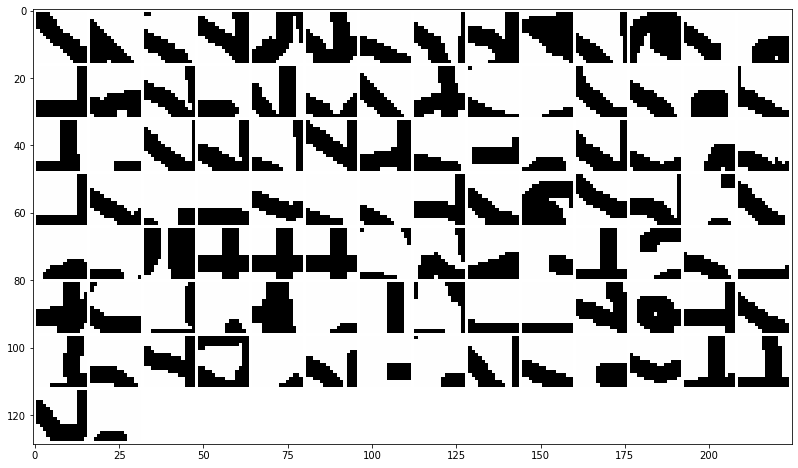

normalized regions:


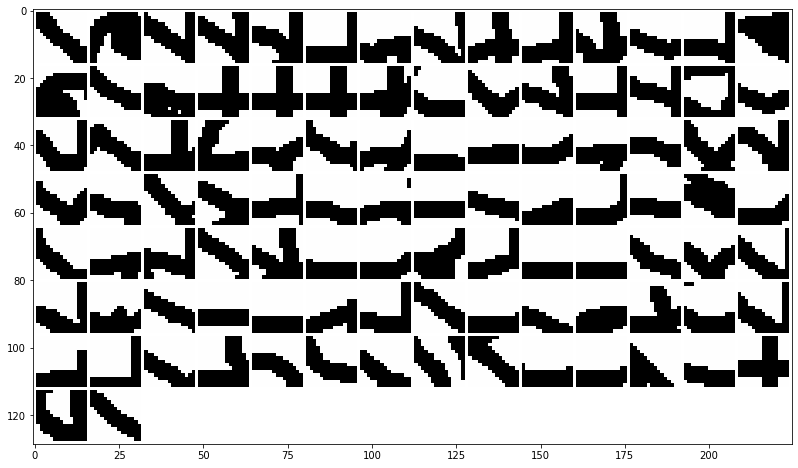

grid regions of 100 regions more=True or worst=False active for filter number: 35 :


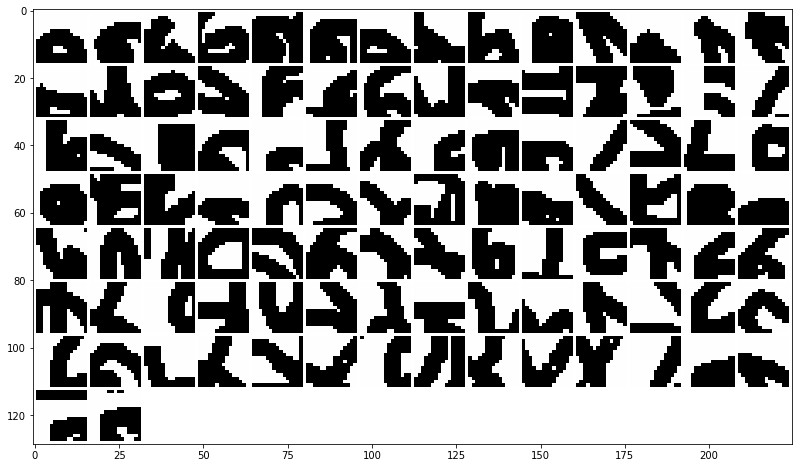

normalized regions:


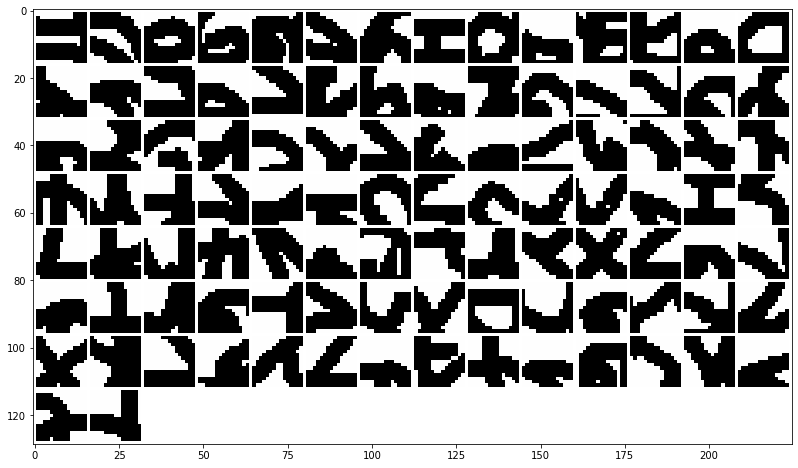

grid regions of 100 regions more=True or worst=False active for filter number: 40 :


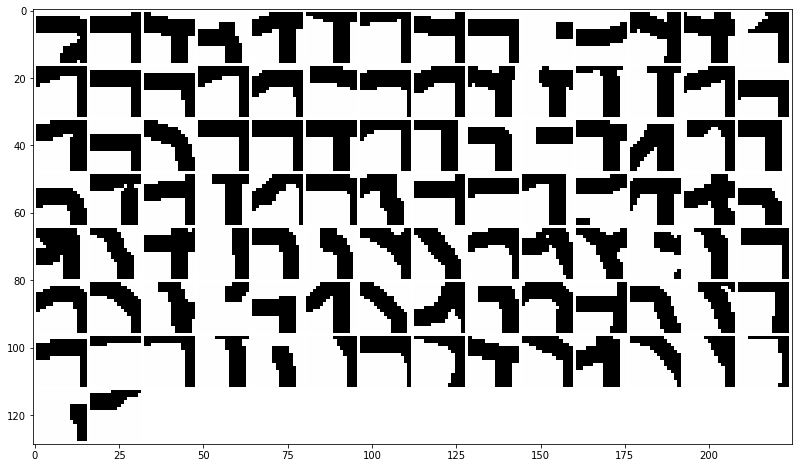

normalized regions:


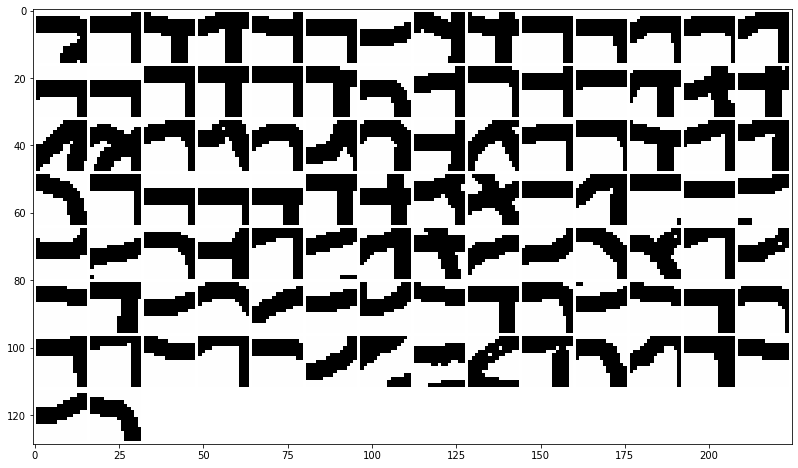

grid regions of 100 regions more=True or worst=False active for filter number: 45 :


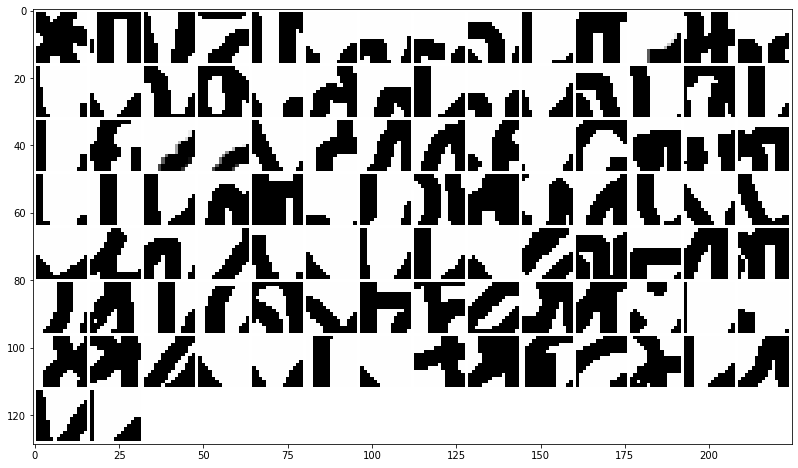

normalized regions:


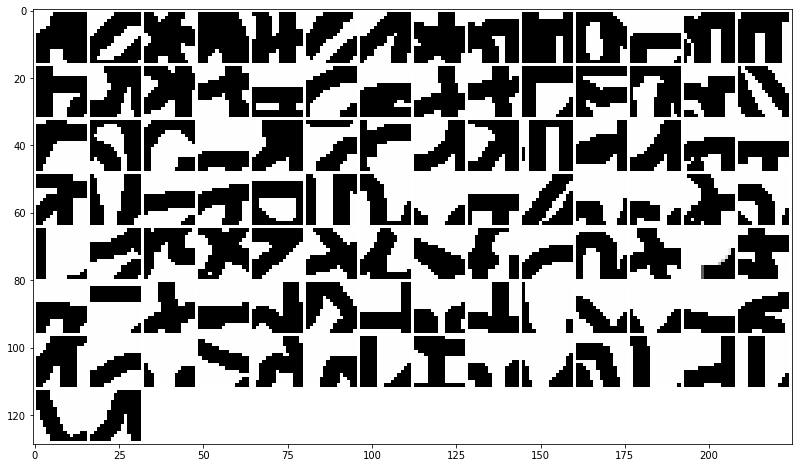

grid regions of 100 regions more=True or worst=False active for filter number: 50 :


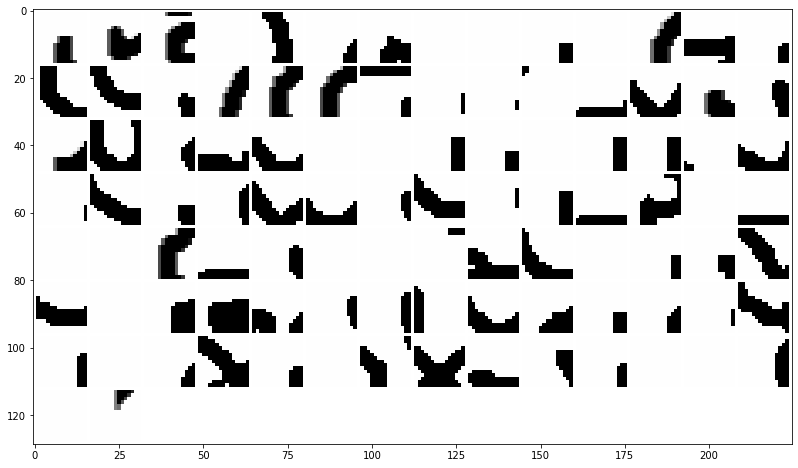

normalized regions:


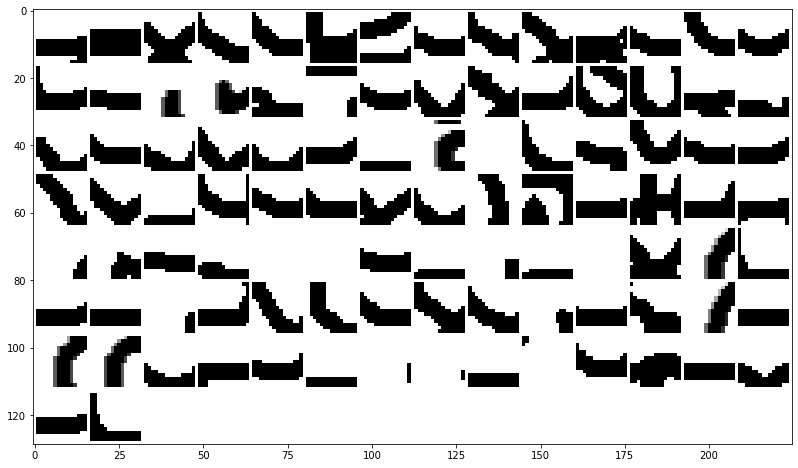

grid regions of 100 regions more=True or worst=False active for filter number: 55 :


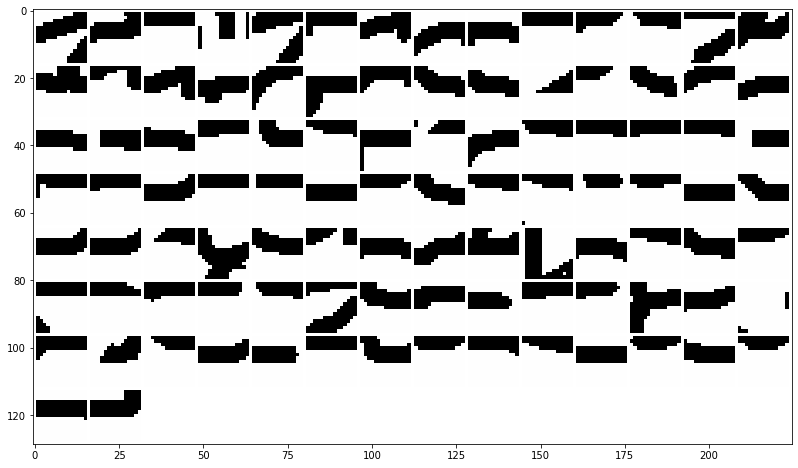

normalized regions:


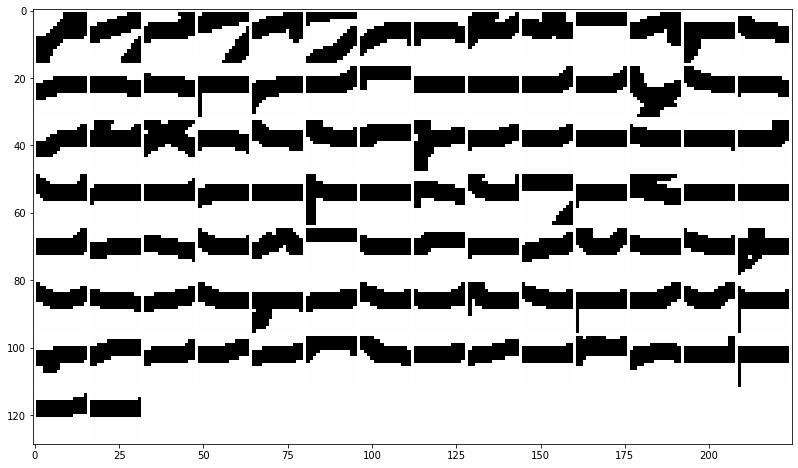

grid regions of 100 regions more=True or worst=False active for filter number: 60 :


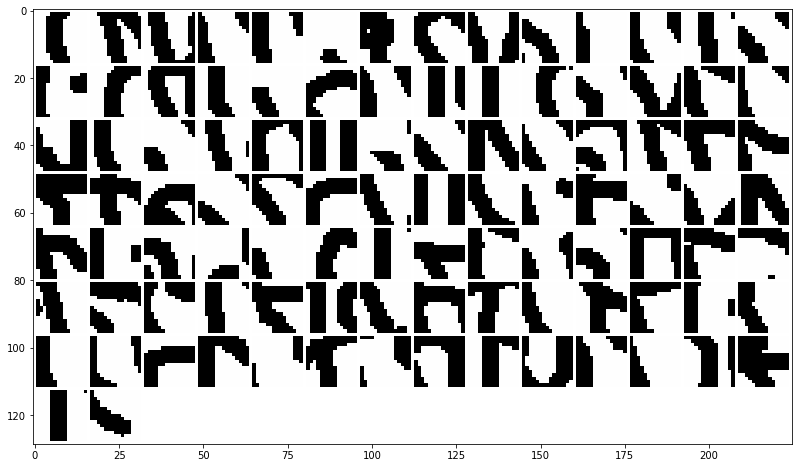

normalized regions:


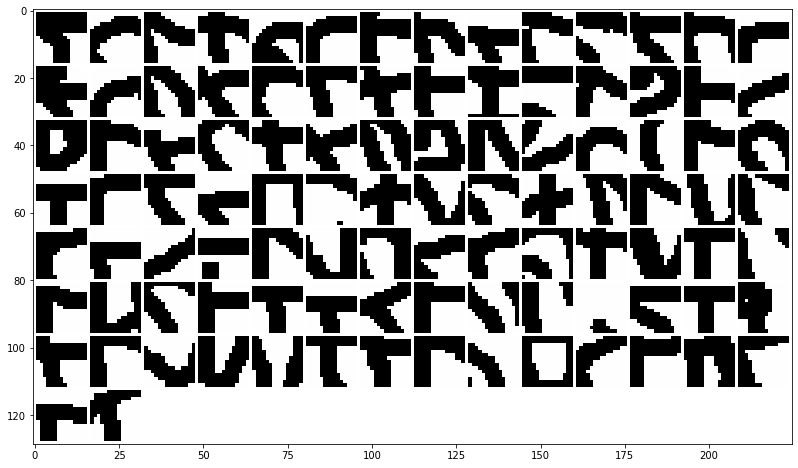

grid regions of 100 regions more=True or worst=False active for filter number: 65 :


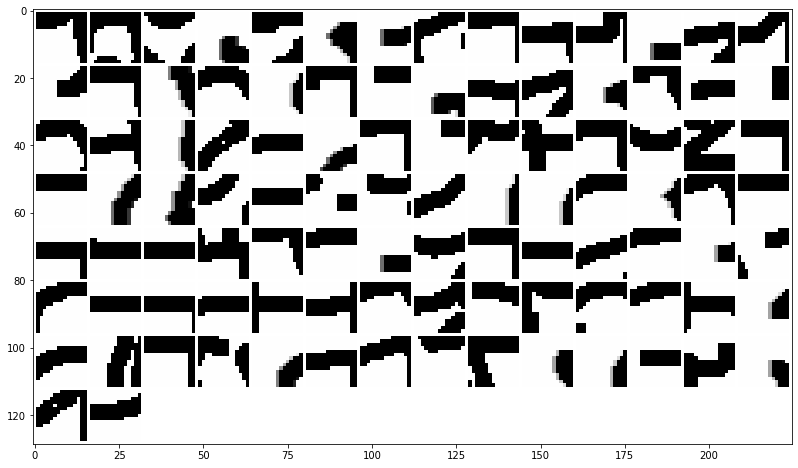

normalized regions:


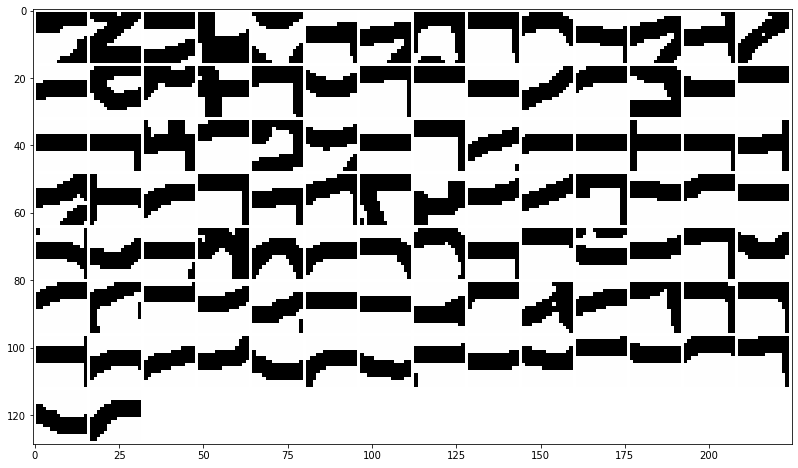

grid regions of 100 regions more=True or worst=False active for filter number: 70 :


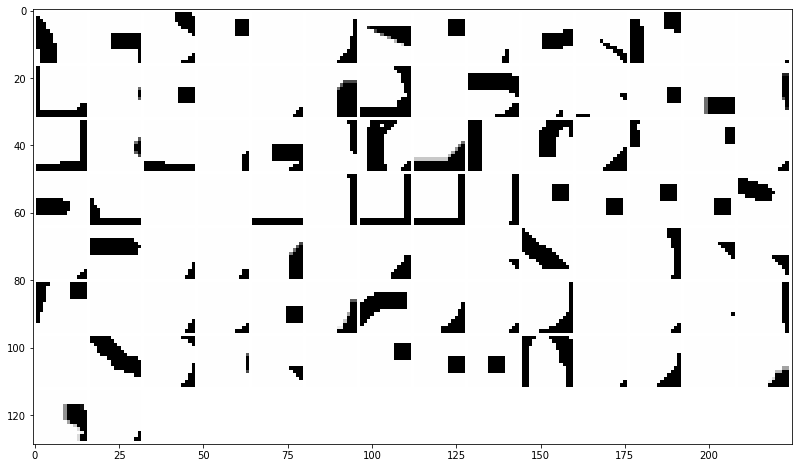

normalized regions:


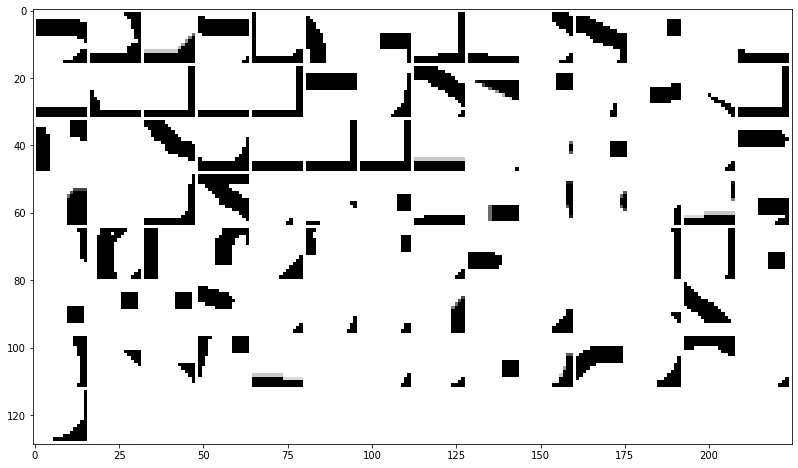

grid regions of 100 regions more=True or worst=False active for filter number: 80 :


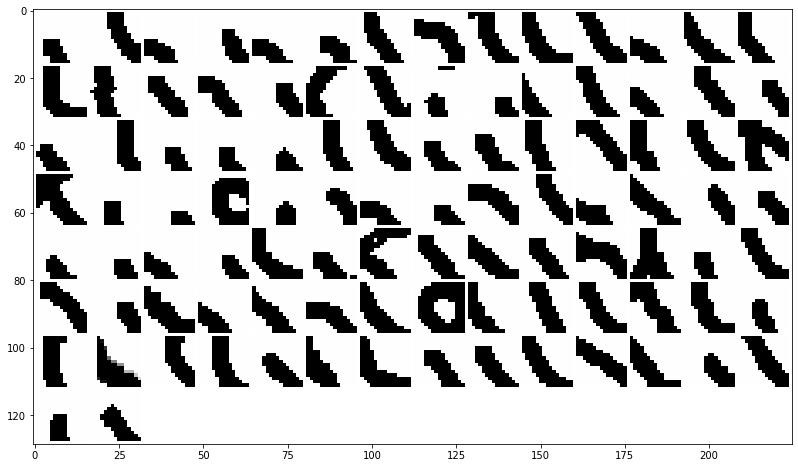

normalized regions:


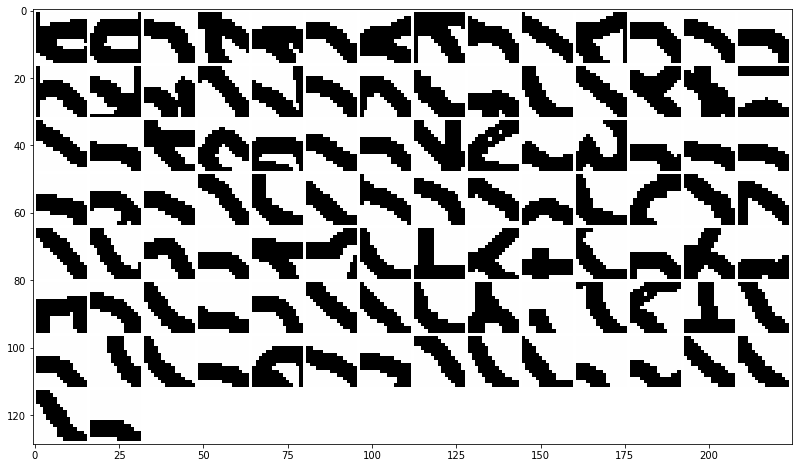

grid regions of 100 regions more=True or worst=False active for filter number: 85 :


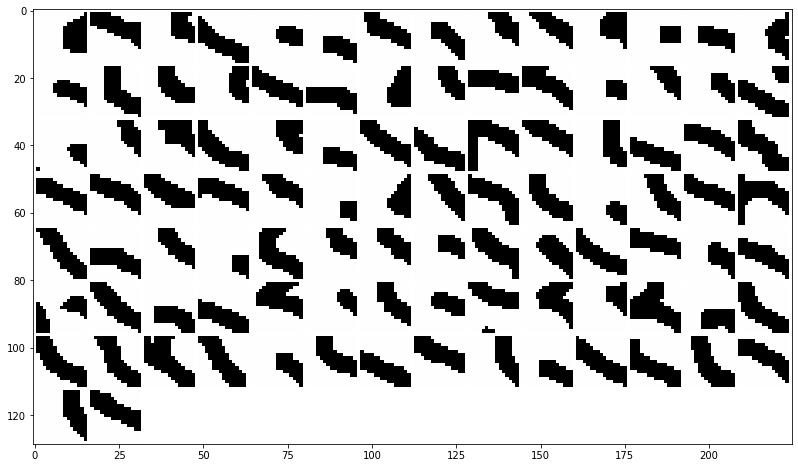

normalized regions:


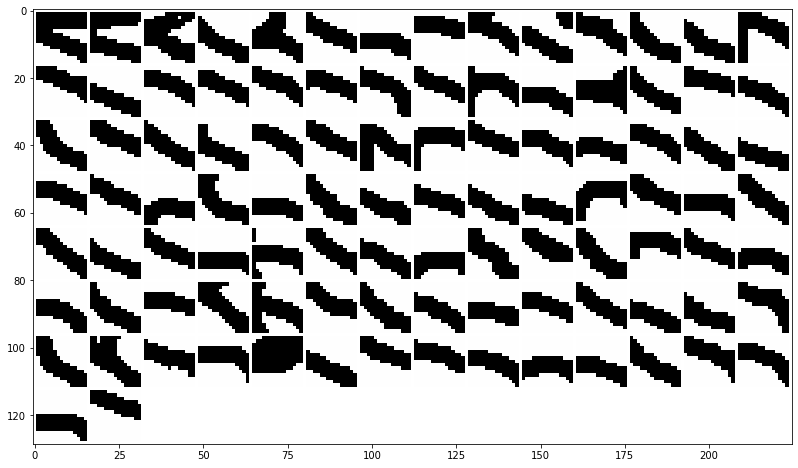

grid regions of 100 regions more=True or worst=False active for filter number: 90 :


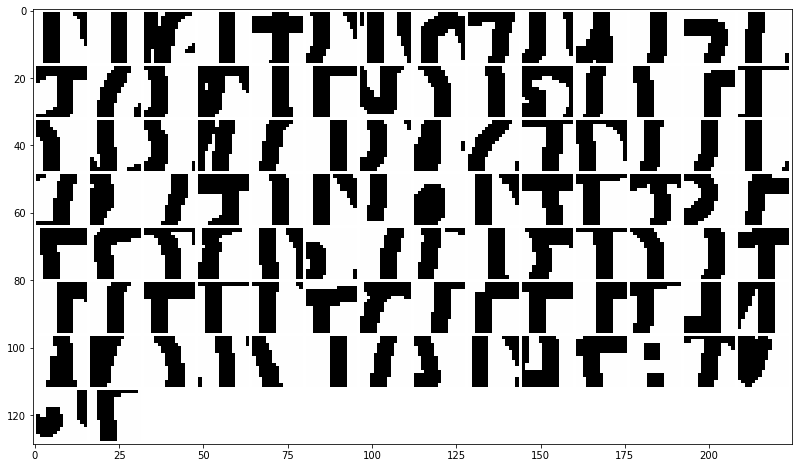

normalized regions:


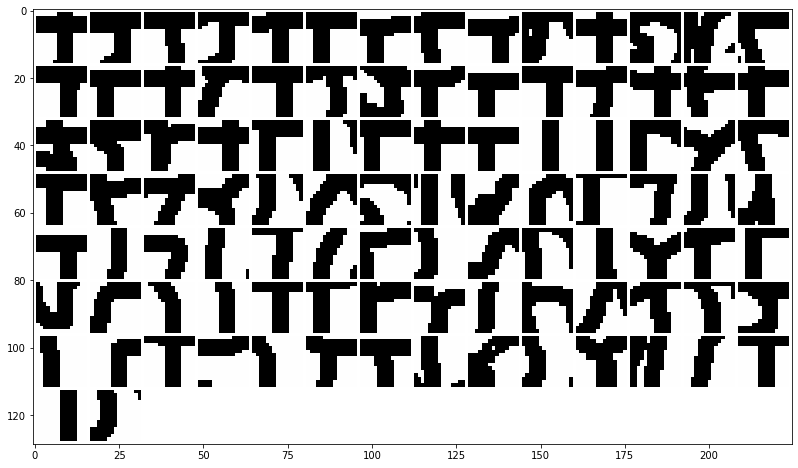

grid regions of 100 regions more=True or worst=False active for filter number: 95 :


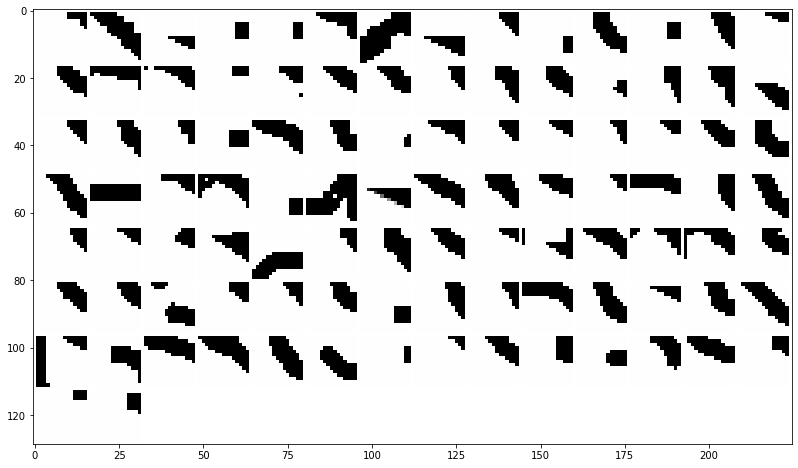

normalized regions:


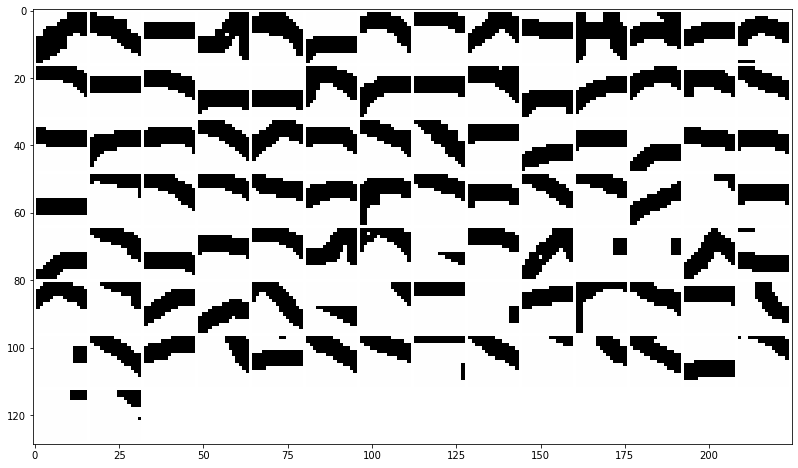

grid regions of 100 regions more=True or worst=False active for filter number: 100 :


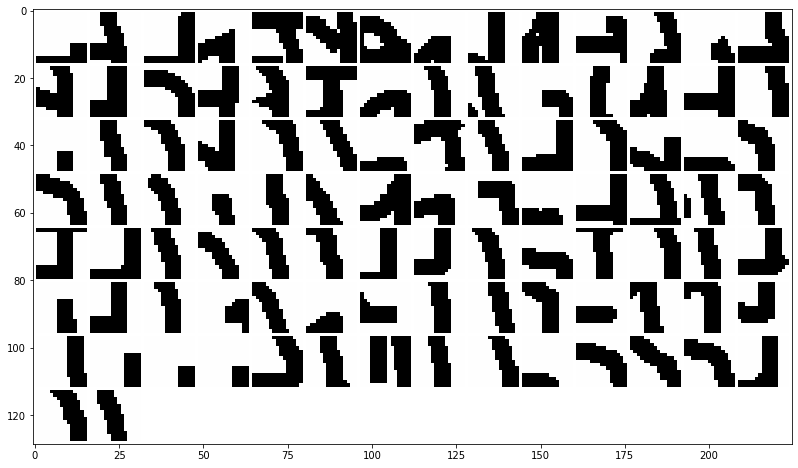

normalized regions:


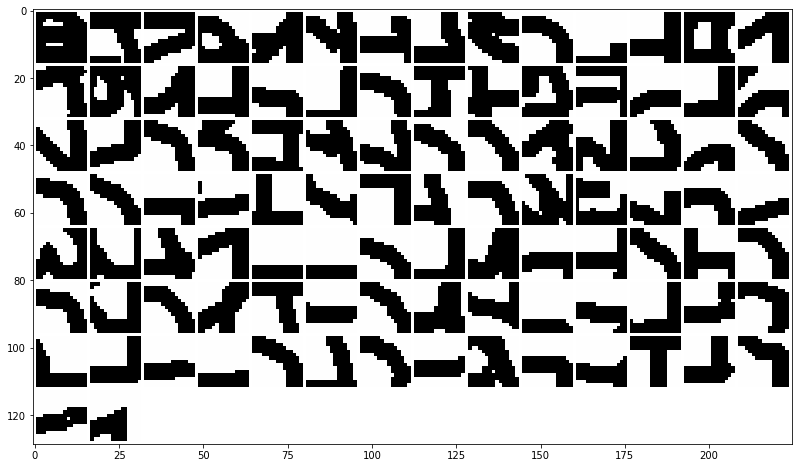

grid regions of 100 regions more=True or worst=False active for filter number: 105 :


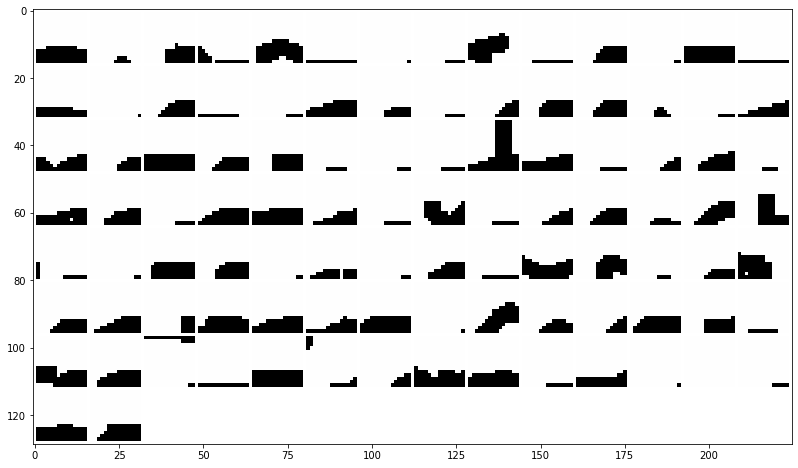

normalized regions:


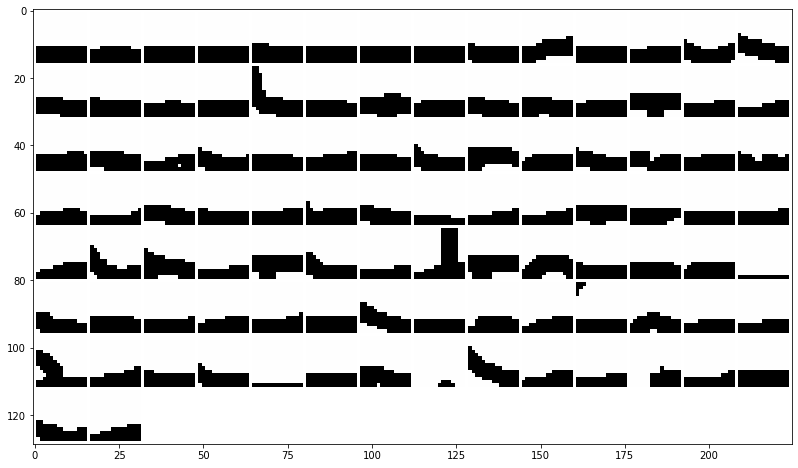

grid regions of 100 regions more=True or worst=False active for filter number: 110 :


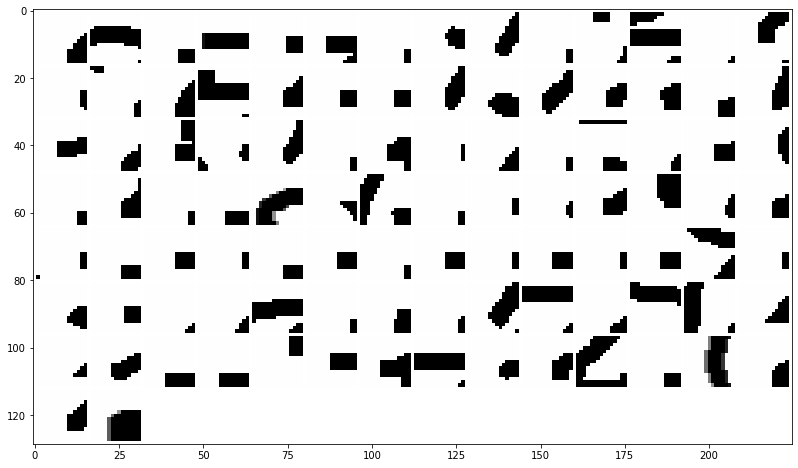

normalized regions:


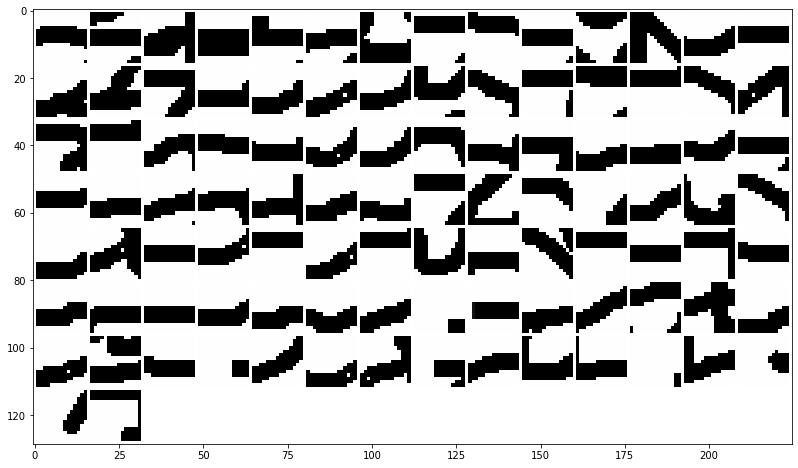

grid regions of 100 regions more=True or worst=False active for filter number: 150 :


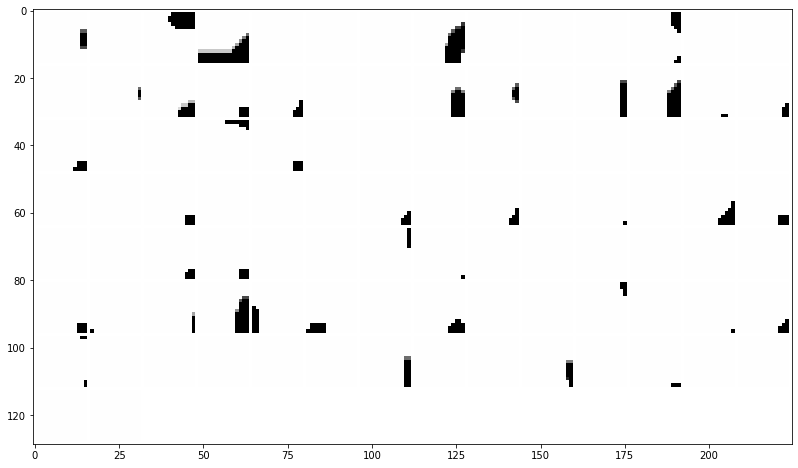

normalized regions:


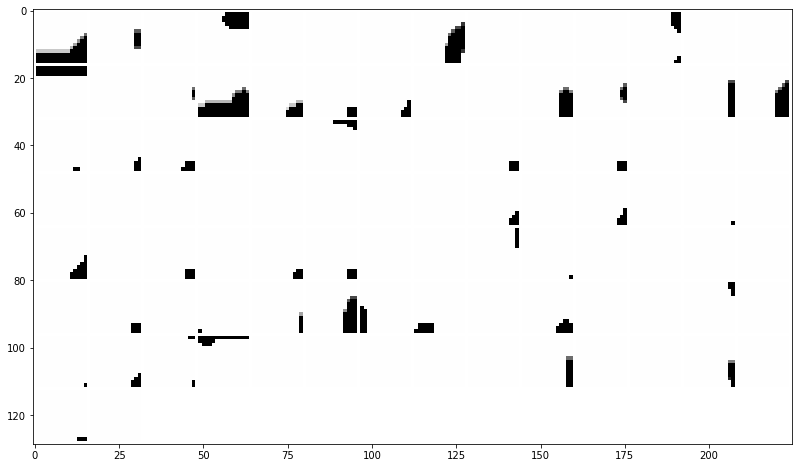

grid regions of 100 regions more=True or worst=False active for filter number: 120 :


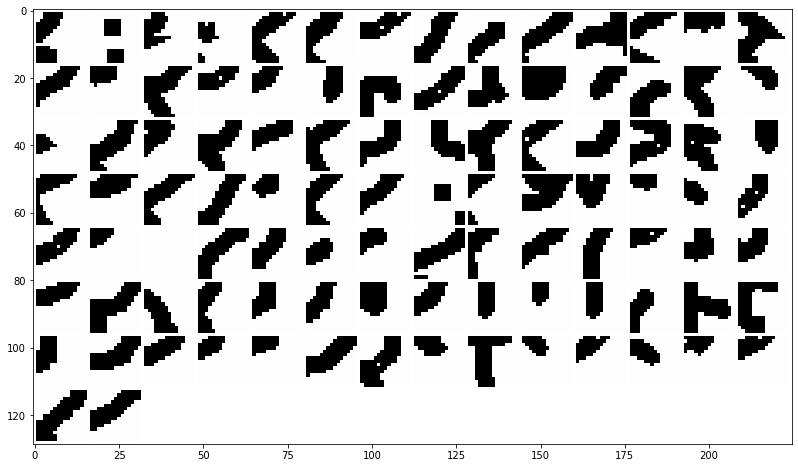

normalized regions:


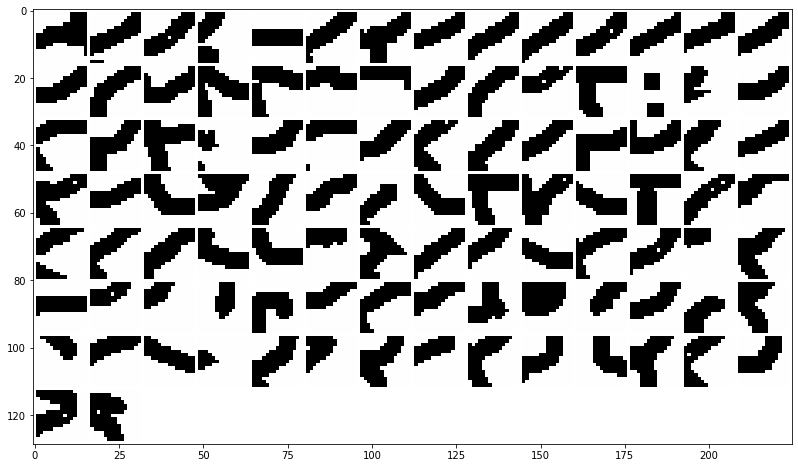

grid regions of 100 regions more=True or worst=False active for filter number: 125 :


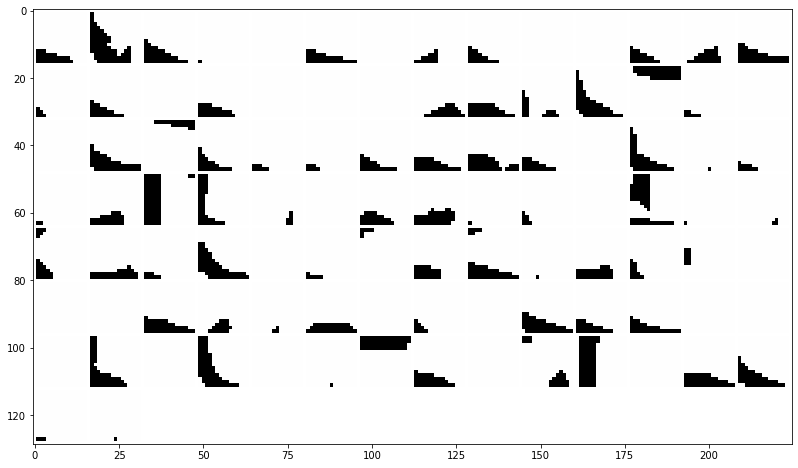

normalized regions:


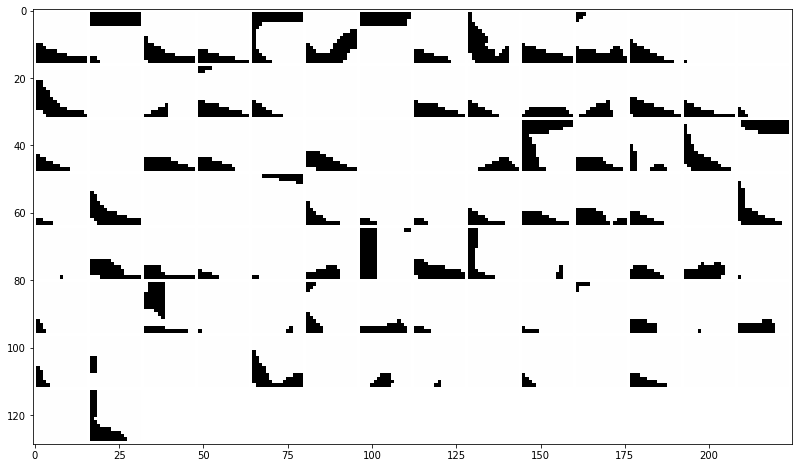

grid regions of 100 regions more=True or worst=False active for filter number: 150 :


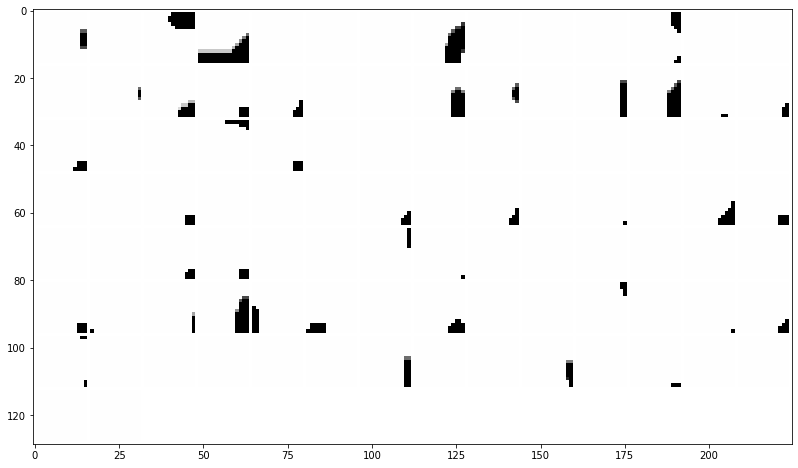

normalized regions:


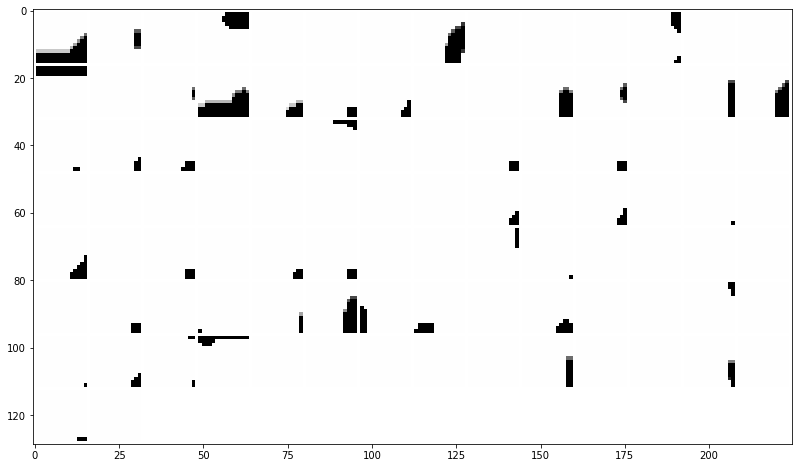

grid regions of 100 regions more=True or worst=False active for filter number: 200 :


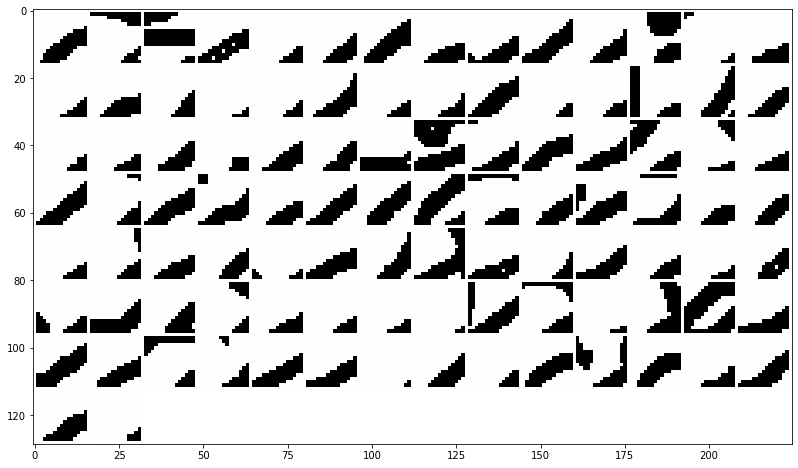

normalized regions:


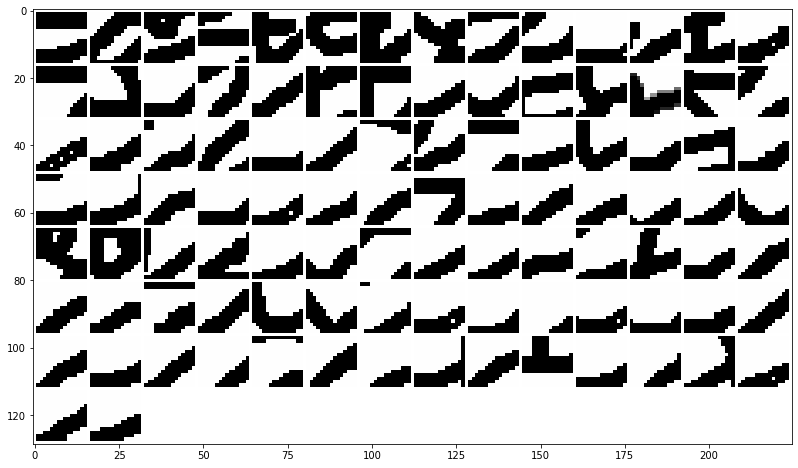

grid regions of 100 regions more=True or worst=False active for filter number: 250 :


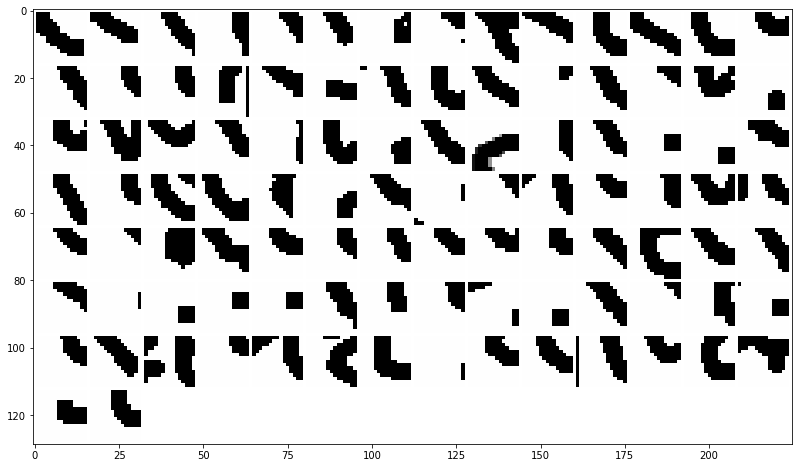

normalized regions:


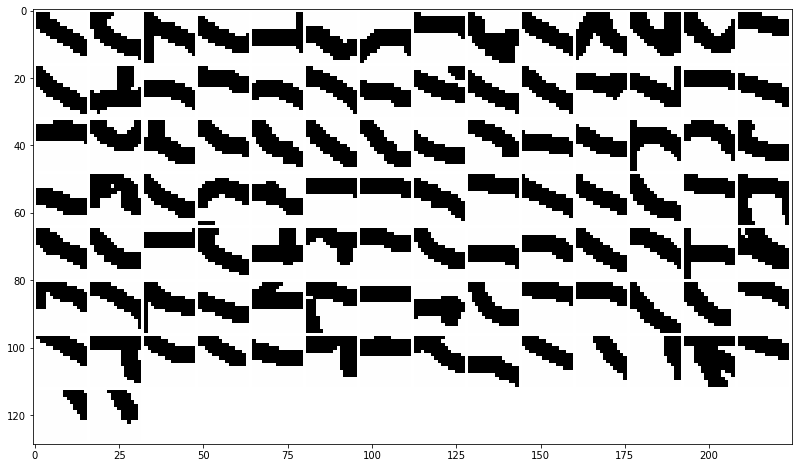

In [12]:
list_filter = list_filter_interest_layer3
regions = region_layer3_no_binary_maxpooling
activations = activation_layer3_no_binary_maxpooling
activations_normalized = activation_layer3_no_binary_normalized_maxpooling

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

In [13]:
list_filter = list_filter_interest_layer4
regions = region_layer4_no_binary_maxpooling
activations = activation_layer4_no_binary_maxpooling
activations_normalized = activation_layer4_no_binary_normalized_maxpooling

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

Output hidden; open in https://colab.research.google.com to view.

#### Binary model stride:

Interest of filters: [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60]
Consider 10% image regions = 100 images
Consider 10% image regions = 100 images
mean image:
mean regions of 100 regions more=True or worst=False active for filter number: 0 :


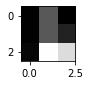

normalized region:


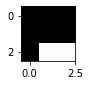

mean regions of 100 regions more=True or worst=False active for filter number: 5 :


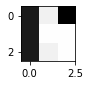

normalized region:


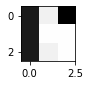

mean regions of 100 regions more=True or worst=False active for filter number: 10 :


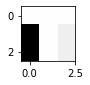

normalized region:


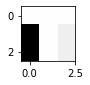

mean regions of 100 regions more=True or worst=False active for filter number: 15 :


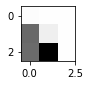

normalized region:


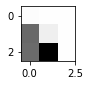

mean regions of 100 regions more=True or worst=False active for filter number: 20 :


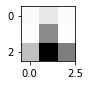

normalized region:


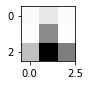

mean regions of 100 regions more=True or worst=False active for filter number: 25 :


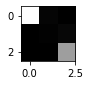

normalized region:


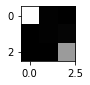

mean regions of 100 regions more=True or worst=False active for filter number: 30 :


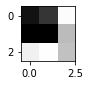

normalized region:


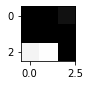

mean regions of 100 regions more=True or worst=False active for filter number: 35 :


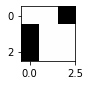

normalized region:


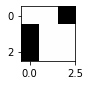

mean regions of 100 regions more=True or worst=False active for filter number: 40 :


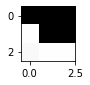

normalized region:


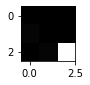

mean regions of 100 regions more=True or worst=False active for filter number: 45 :


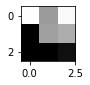

normalized region:


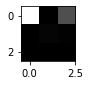

mean regions of 100 regions more=True or worst=False active for filter number: 50 :


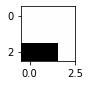

normalized region:


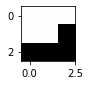

mean regions of 100 regions more=True or worst=False active for filter number: 55 :


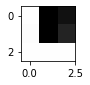

normalized region:


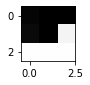

mean regions of 100 regions more=True or worst=False active for filter number: 60 :


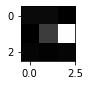

normalized region:


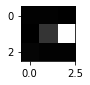

grid image
grid regions of 100 regions more=True or worst=False active for filter number: 0 :


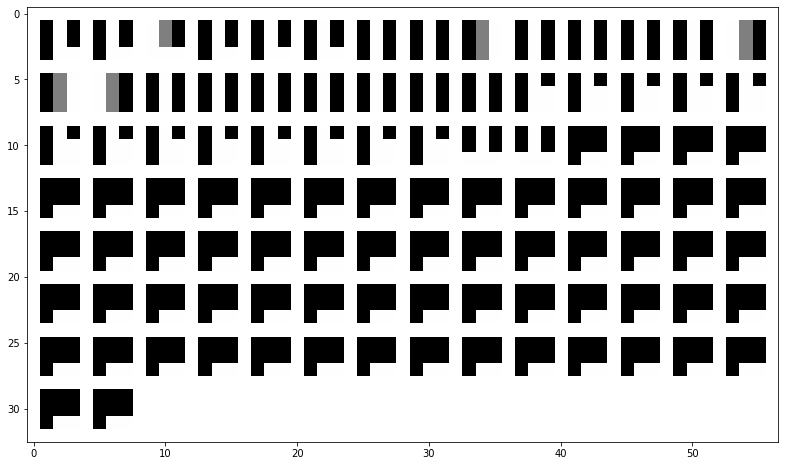

normalized regions:


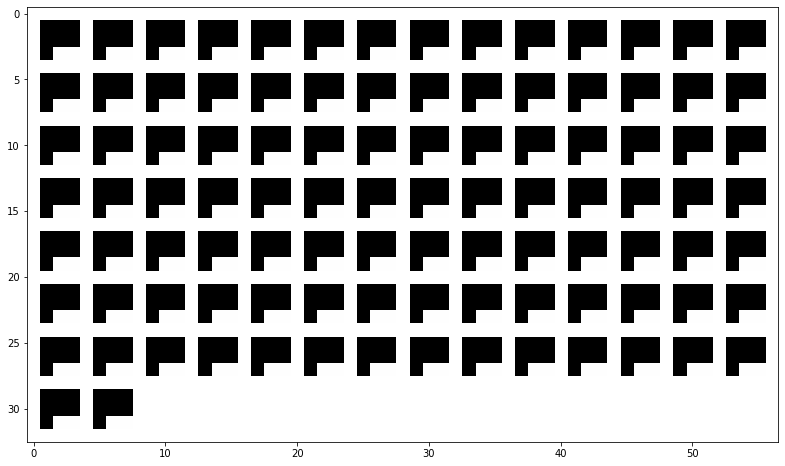

grid regions of 100 regions more=True or worst=False active for filter number: 5 :


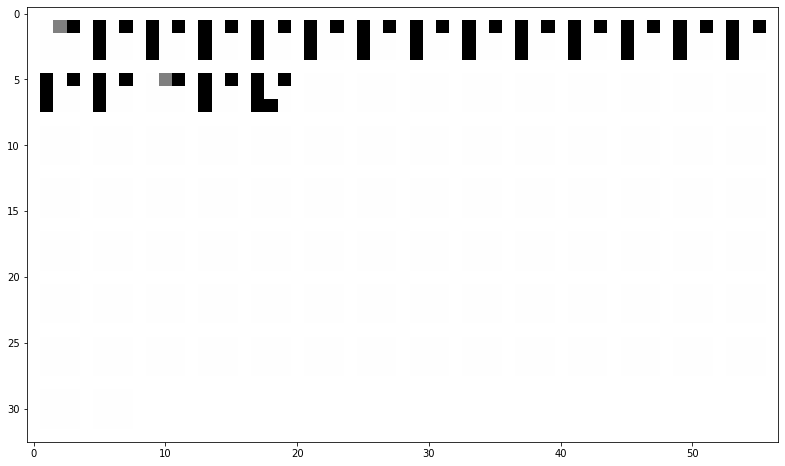

normalized regions:


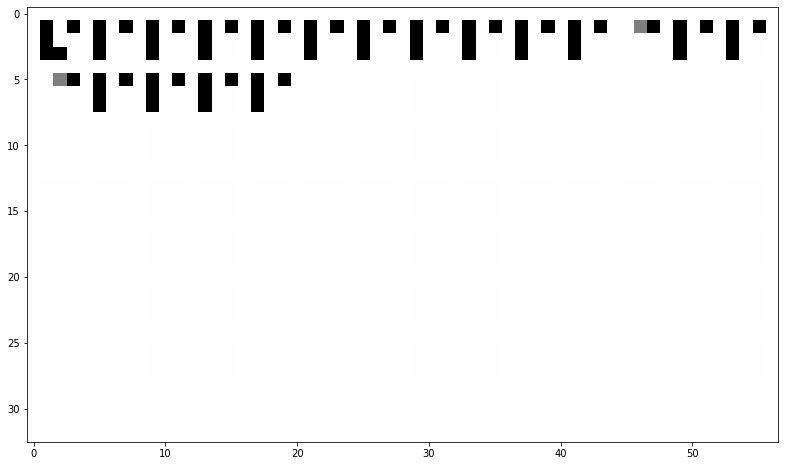

grid regions of 100 regions more=True or worst=False active for filter number: 10 :


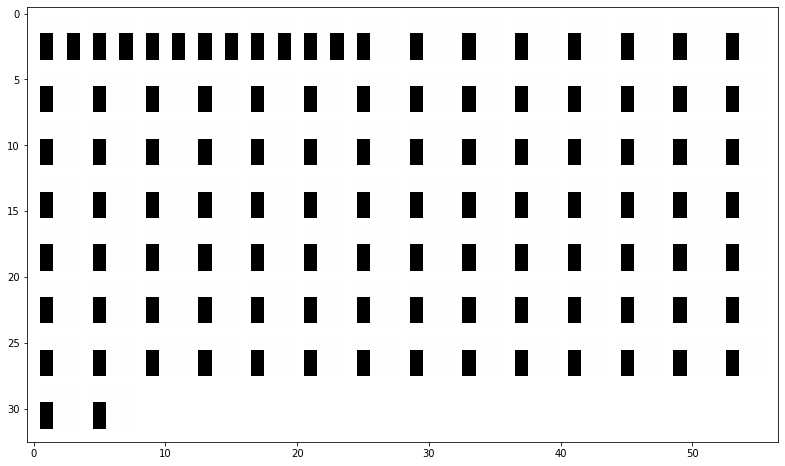

normalized regions:


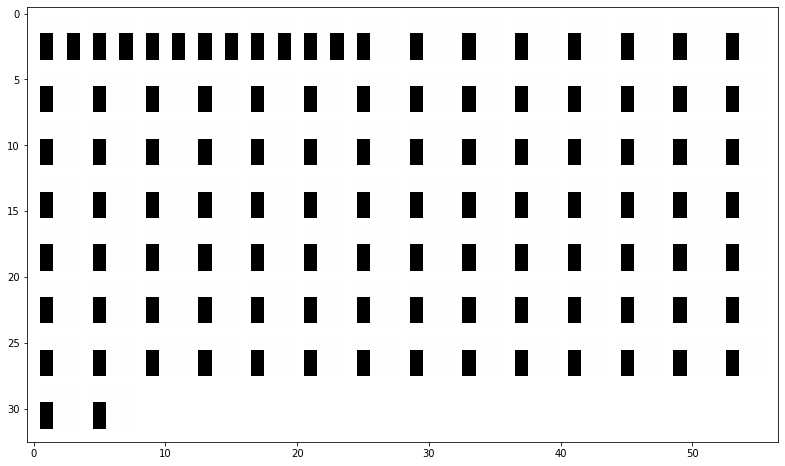

grid regions of 100 regions more=True or worst=False active for filter number: 15 :


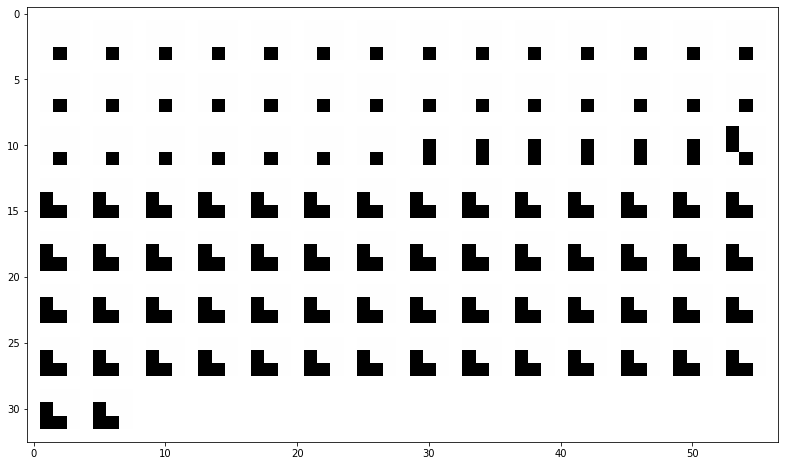

normalized regions:


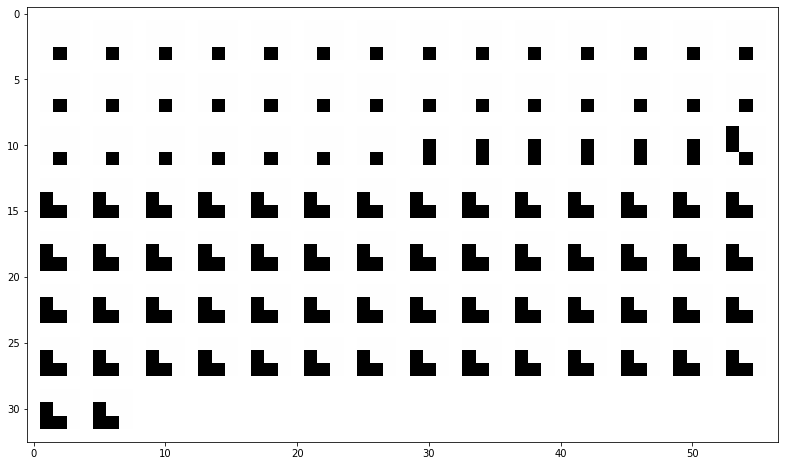

grid regions of 100 regions more=True or worst=False active for filter number: 20 :


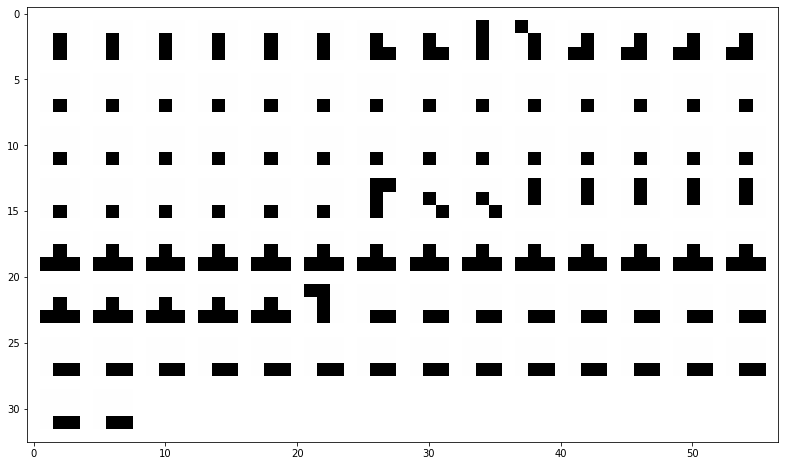

normalized regions:


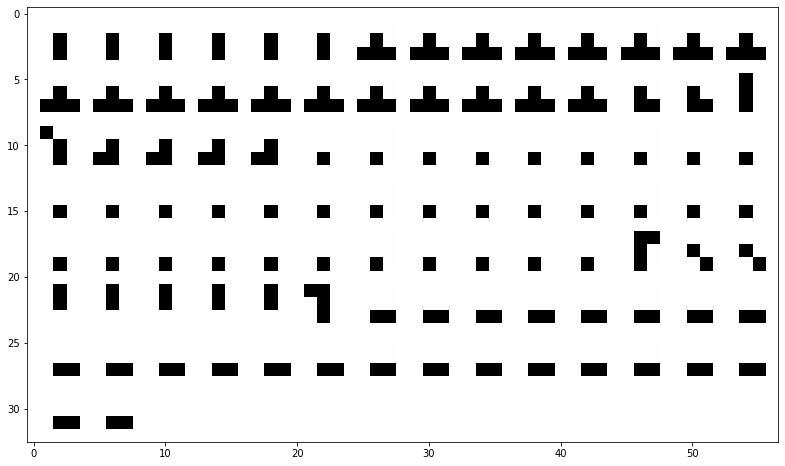

grid regions of 100 regions more=True or worst=False active for filter number: 25 :


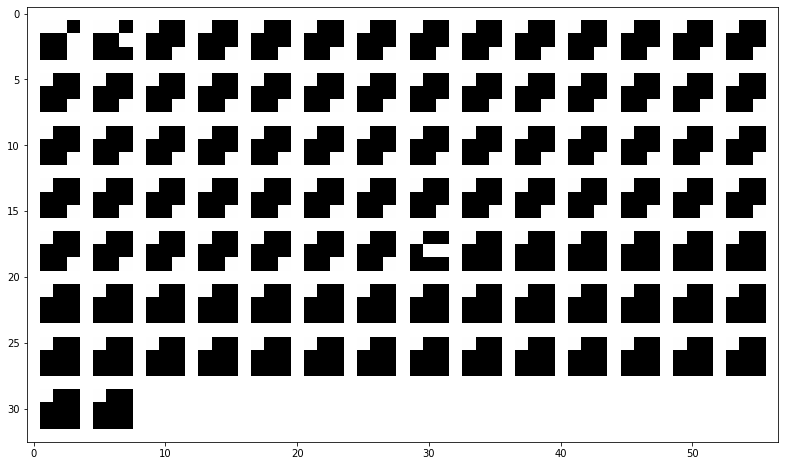

normalized regions:


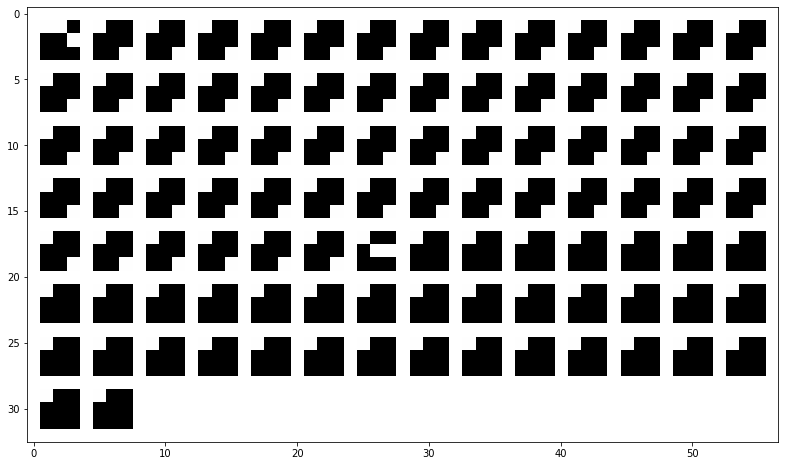

grid regions of 100 regions more=True or worst=False active for filter number: 30 :


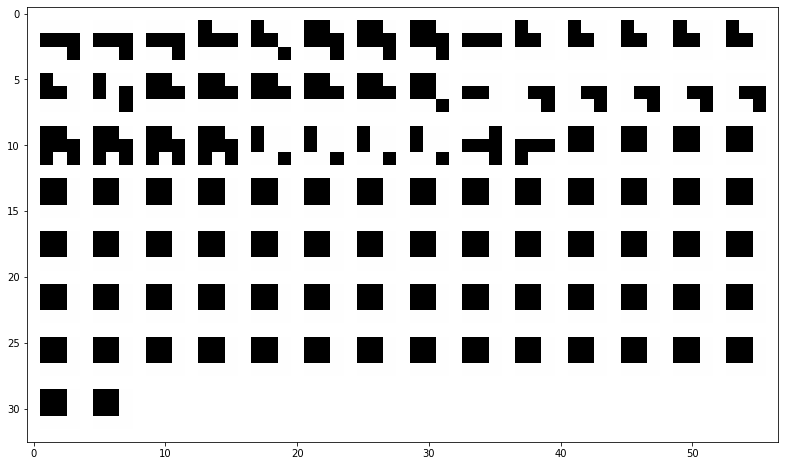

normalized regions:


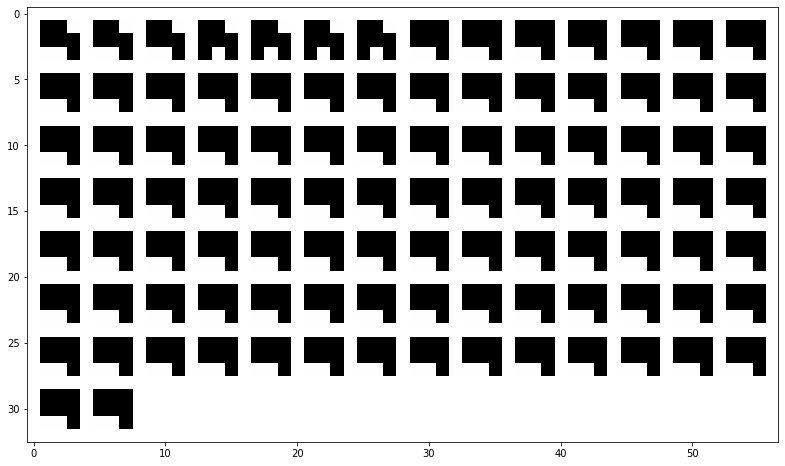

grid regions of 100 regions more=True or worst=False active for filter number: 35 :


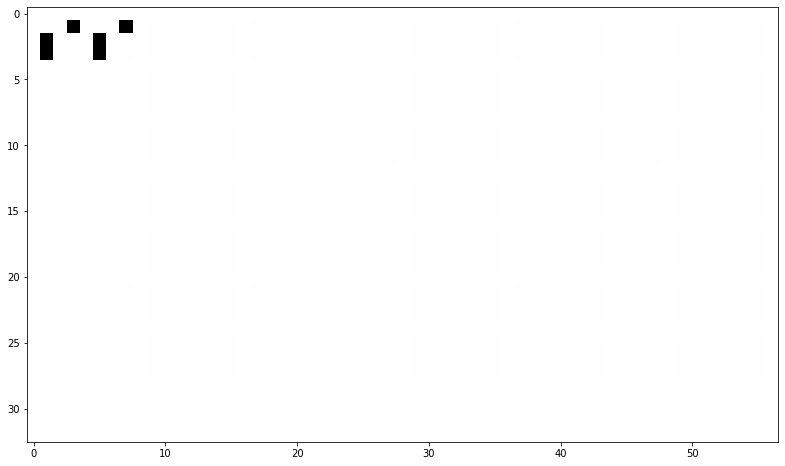

normalized regions:


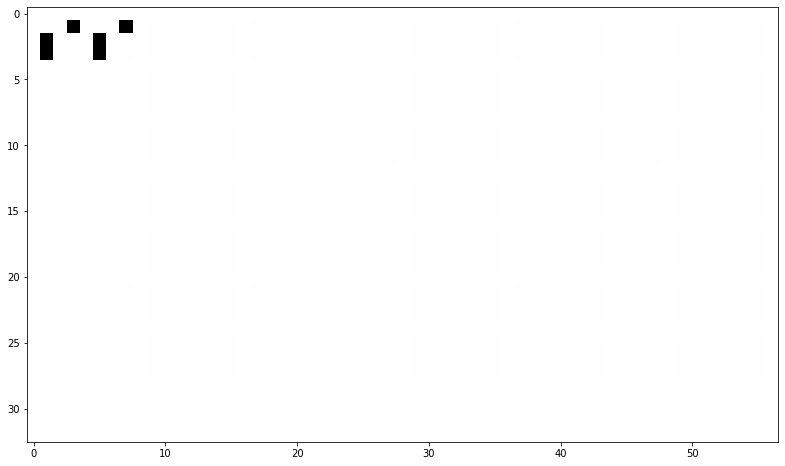

grid regions of 100 regions more=True or worst=False active for filter number: 40 :


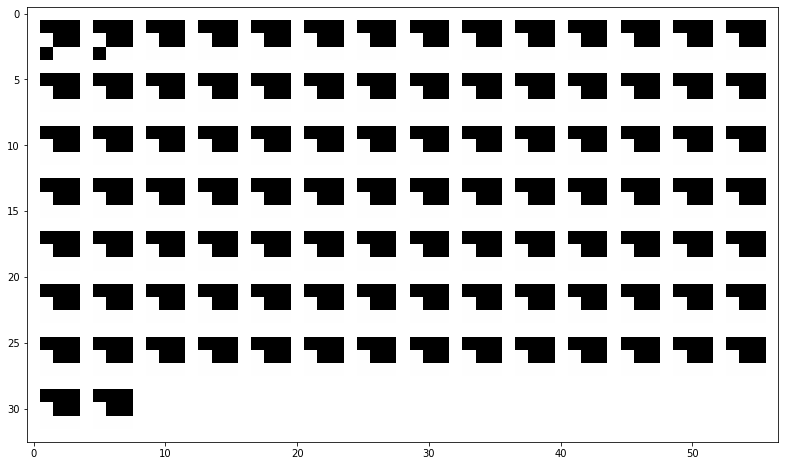

normalized regions:


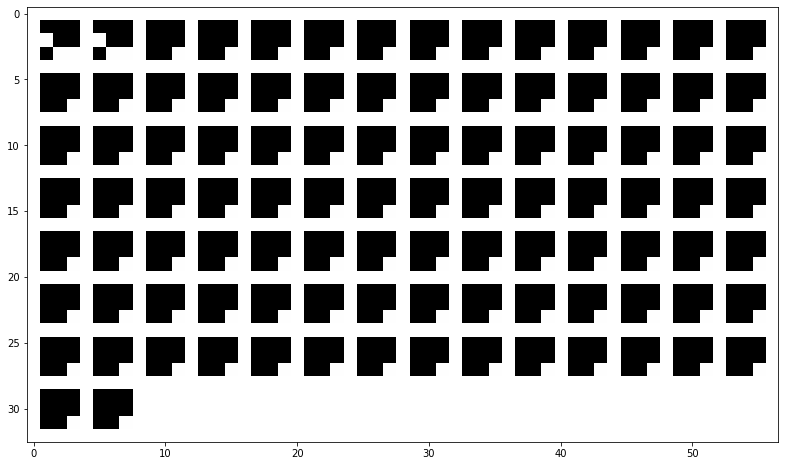

grid regions of 100 regions more=True or worst=False active for filter number: 45 :


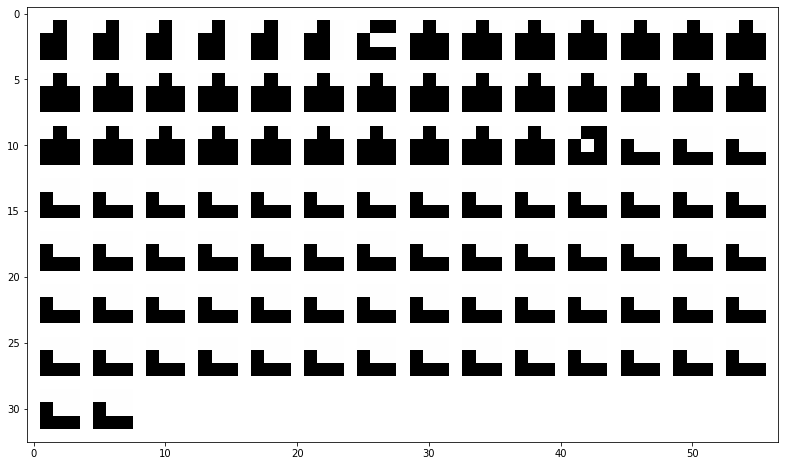

normalized regions:


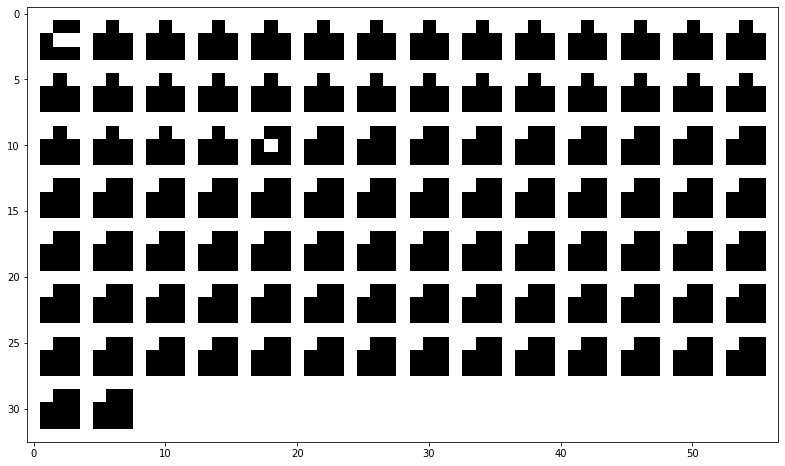

grid regions of 100 regions more=True or worst=False active for filter number: 50 :


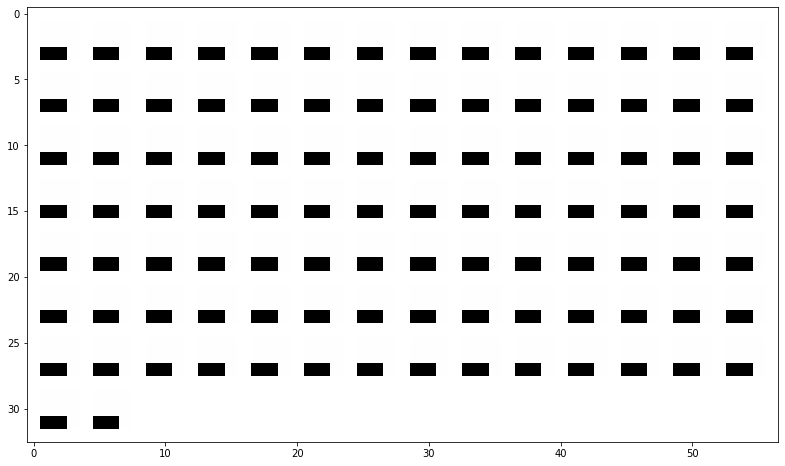

normalized regions:


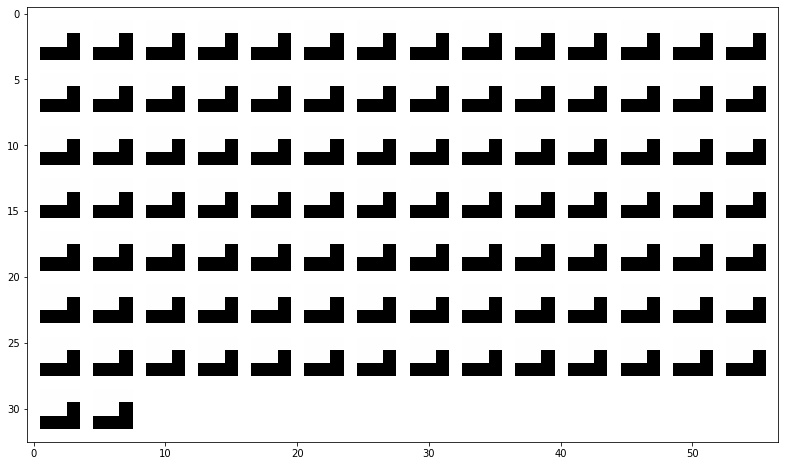

grid regions of 100 regions more=True or worst=False active for filter number: 55 :


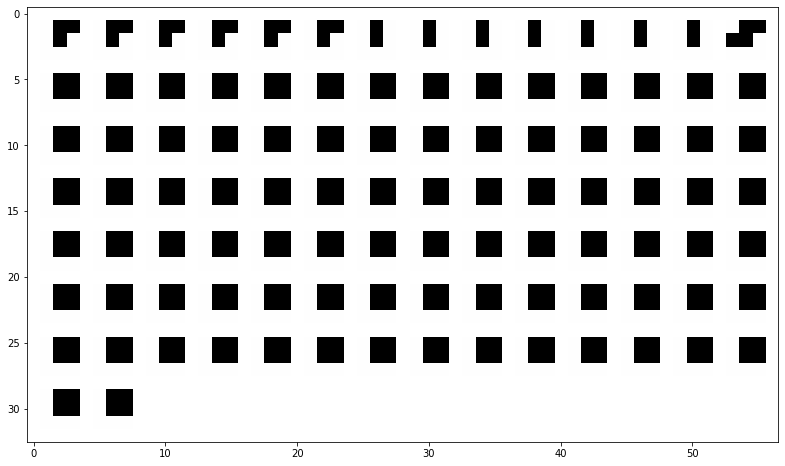

normalized regions:


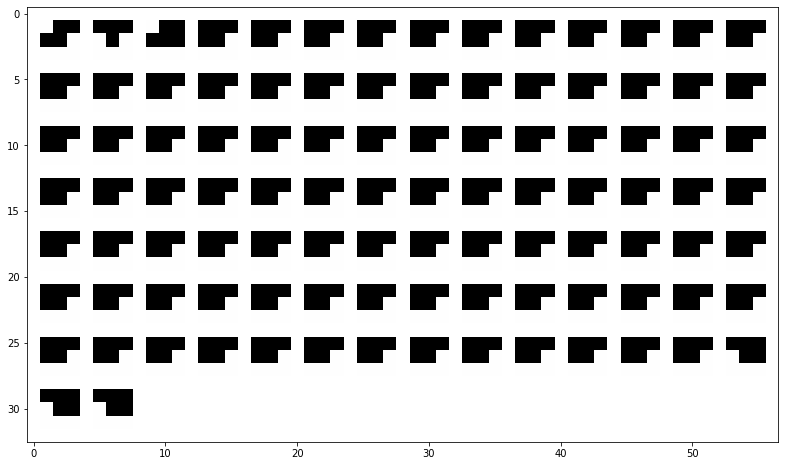

grid regions of 100 regions more=True or worst=False active for filter number: 60 :


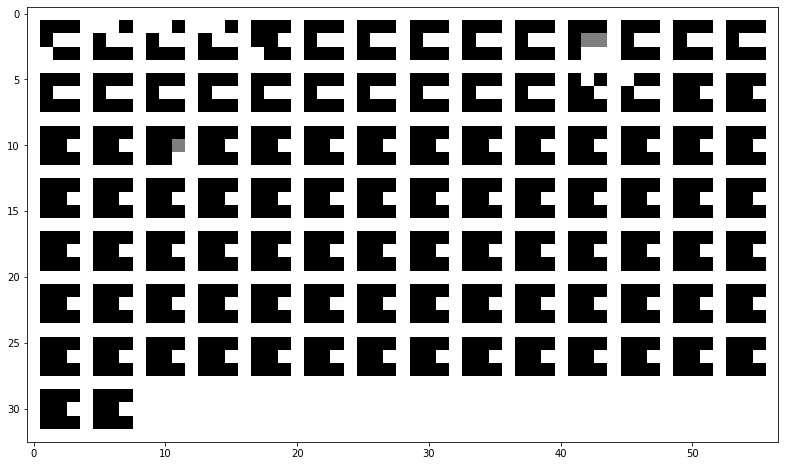

normalized regions:


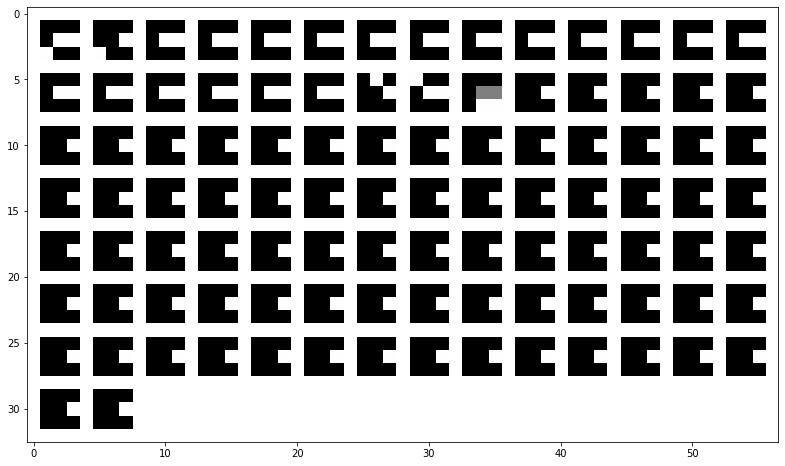

In [24]:
# regions and activation of interest
list_filter = list_filter_interest_layer1
regions = region_layer1_binary_stride
activations = activation_layer1_binary_stride
activations_normalized = activation_layer1_binary_normalized_stride

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

Interest of filters: [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 80, 85, 90, 95, 100, 105, 110, 115, 120, 125]
Consider 10% image regions = 100 images
Consider 10% image regions = 100 images
mean image:
mean regions of 100 regions more=True or worst=False active for filter number: 0 :


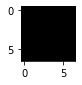

normalized region:


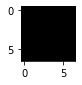

mean regions of 100 regions more=True or worst=False active for filter number: 5 :


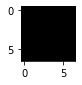

normalized region:


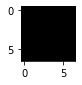

mean regions of 100 regions more=True or worst=False active for filter number: 10 :


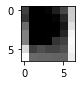

normalized region:


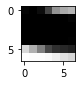

mean regions of 100 regions more=True or worst=False active for filter number: 15 :


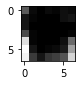

normalized region:


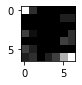

mean regions of 100 regions more=True or worst=False active for filter number: 20 :


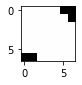

normalized region:


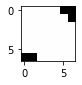

mean regions of 100 regions more=True or worst=False active for filter number: 25 :


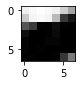

normalized region:


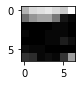

mean regions of 100 regions more=True or worst=False active for filter number: 30 :


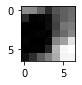

normalized region:


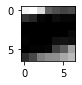

mean regions of 100 regions more=True or worst=False active for filter number: 35 :


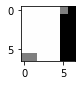

normalized region:


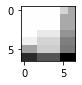

mean regions of 100 regions more=True or worst=False active for filter number: 40 :


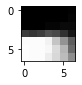

normalized region:


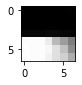

mean regions of 100 regions more=True or worst=False active for filter number: 45 :


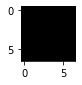

normalized region:


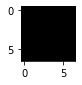

mean regions of 100 regions more=True or worst=False active for filter number: 50 :


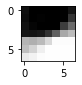

normalized region:


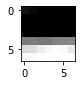

mean regions of 100 regions more=True or worst=False active for filter number: 55 :


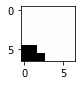

normalized region:


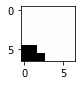

mean regions of 100 regions more=True or worst=False active for filter number: 60 :


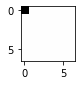

normalized region:


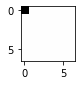

mean regions of 100 regions more=True or worst=False active for filter number: 65 :


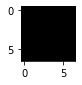

normalized region:


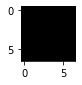

mean regions of 100 regions more=True or worst=False active for filter number: 70 :


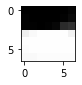

normalized region:


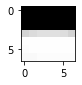

mean regions of 100 regions more=True or worst=False active for filter number: 80 :


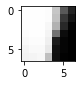

normalized region:


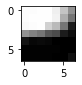

mean regions of 100 regions more=True or worst=False active for filter number: 85 :


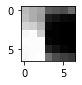

normalized region:


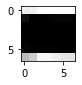

mean regions of 100 regions more=True or worst=False active for filter number: 90 :


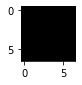

normalized region:


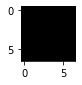

mean regions of 100 regions more=True or worst=False active for filter number: 95 :


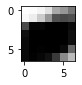

normalized region:


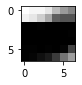

mean regions of 100 regions more=True or worst=False active for filter number: 100 :


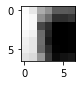

normalized region:


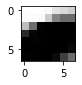

mean regions of 100 regions more=True or worst=False active for filter number: 105 :


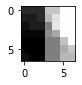

normalized region:


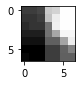

mean regions of 100 regions more=True or worst=False active for filter number: 110 :


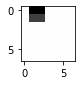

normalized region:


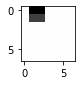

mean regions of 100 regions more=True or worst=False active for filter number: 115 :


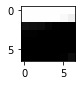

normalized region:


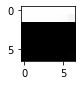

mean regions of 100 regions more=True or worst=False active for filter number: 120 :


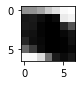

normalized region:


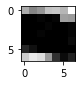

mean regions of 100 regions more=True or worst=False active for filter number: 125 :


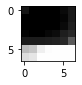

normalized region:


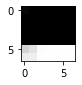

grid image
grid regions of 100 regions more=True or worst=False active for filter number: 0 :


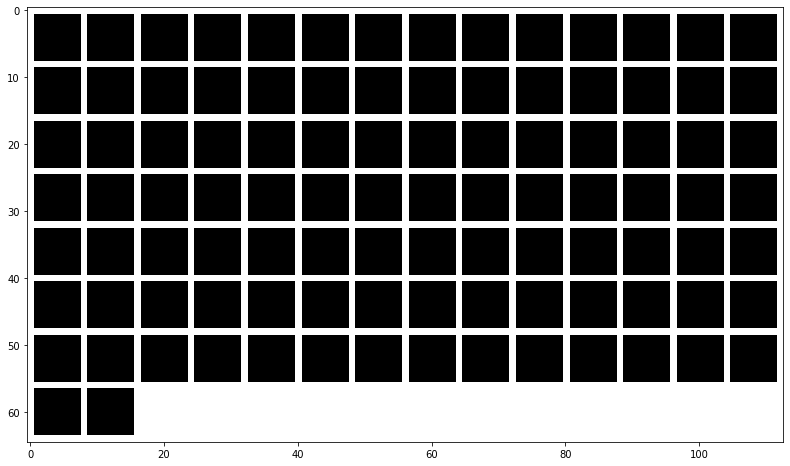

normalized regions:


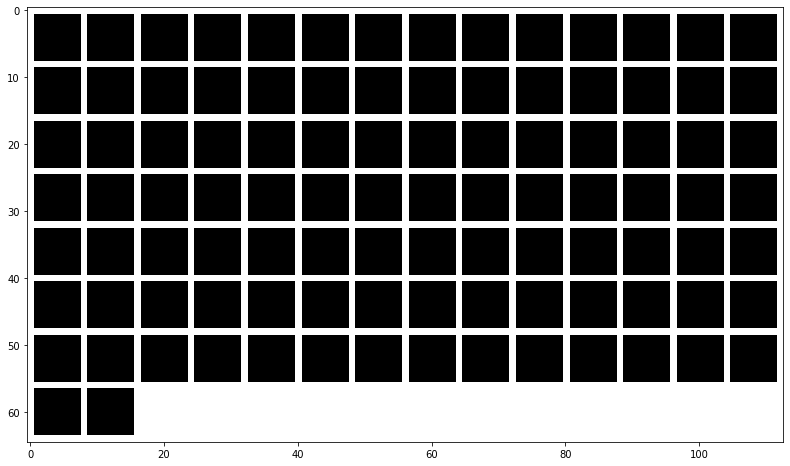

grid regions of 100 regions more=True or worst=False active for filter number: 5 :


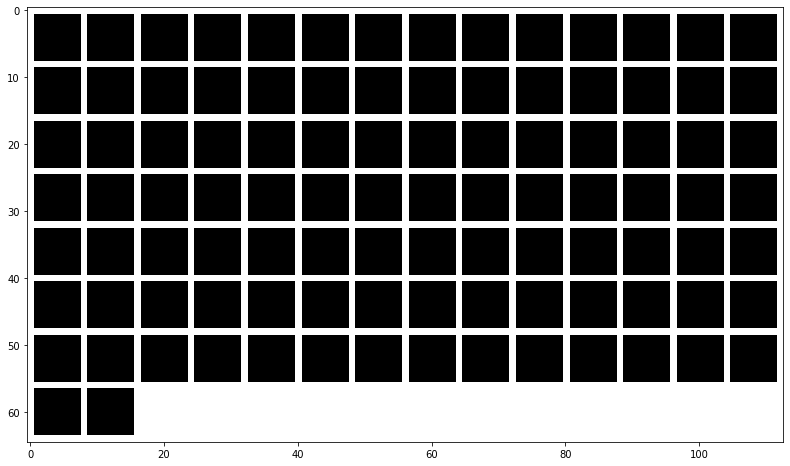

normalized regions:


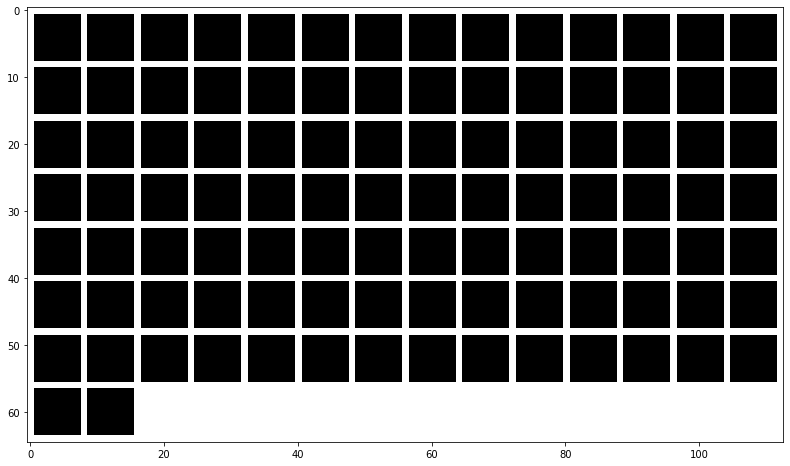

grid regions of 100 regions more=True or worst=False active for filter number: 10 :


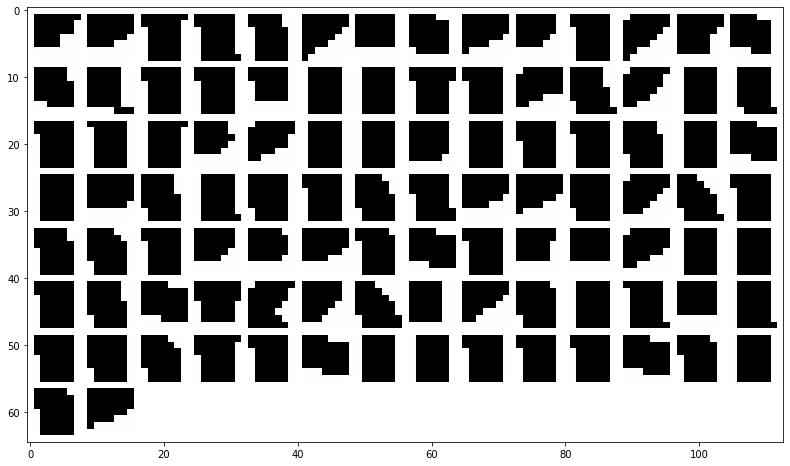

normalized regions:


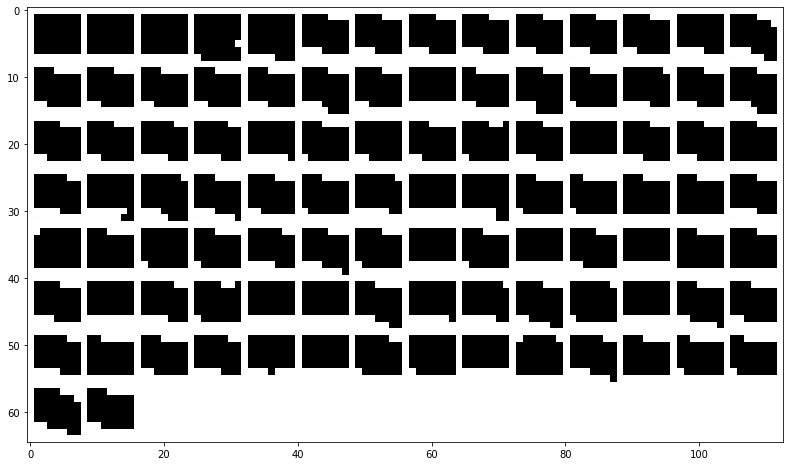

grid regions of 100 regions more=True or worst=False active for filter number: 15 :


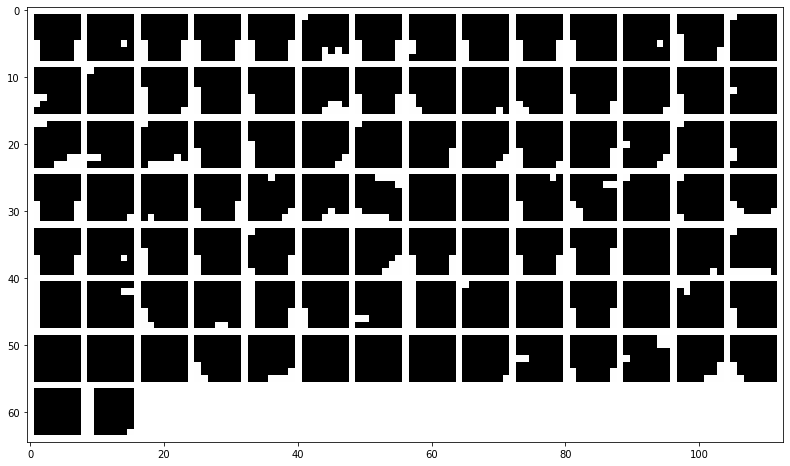

normalized regions:


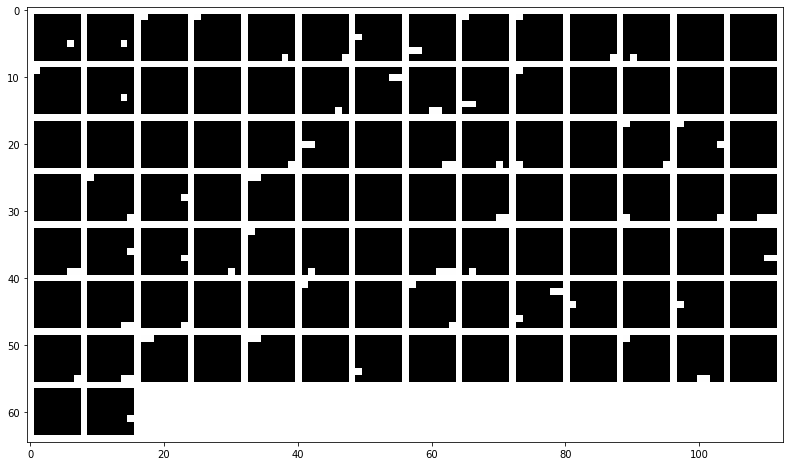

grid regions of 100 regions more=True or worst=False active for filter number: 20 :


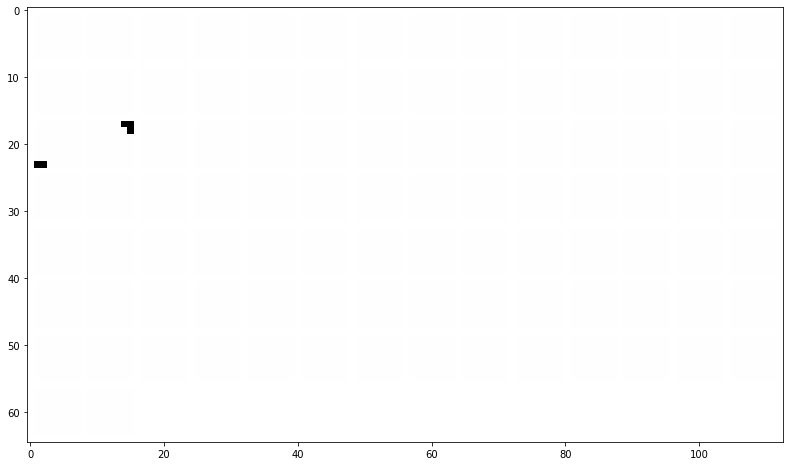

normalized regions:


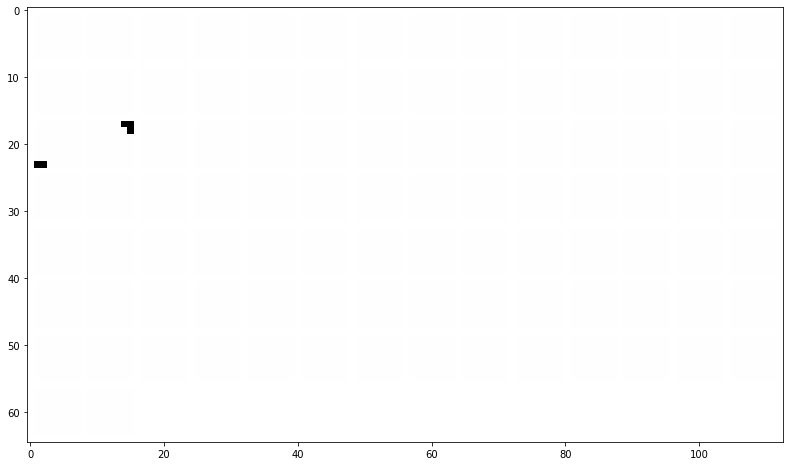

grid regions of 100 regions more=True or worst=False active for filter number: 25 :


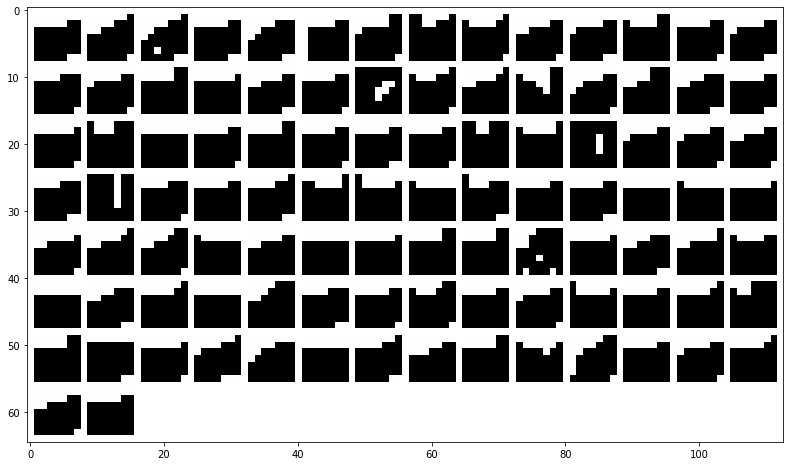

normalized regions:


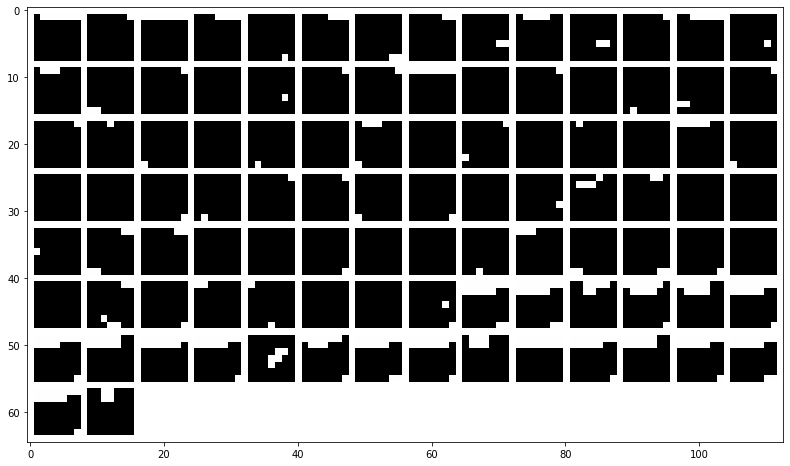

grid regions of 100 regions more=True or worst=False active for filter number: 30 :


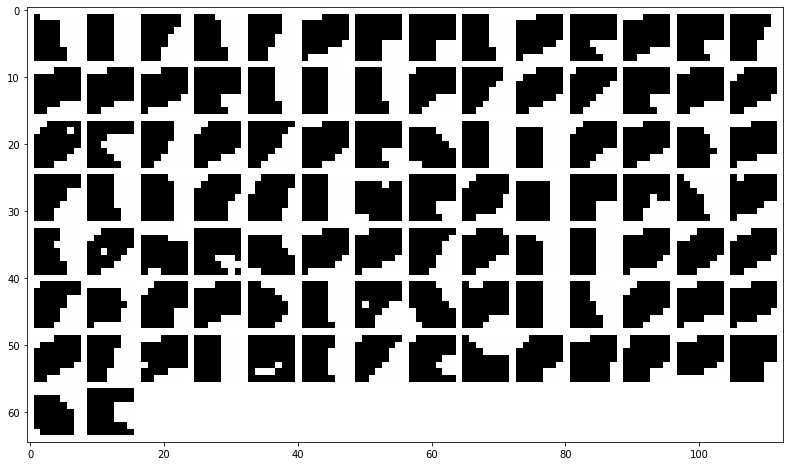

normalized regions:


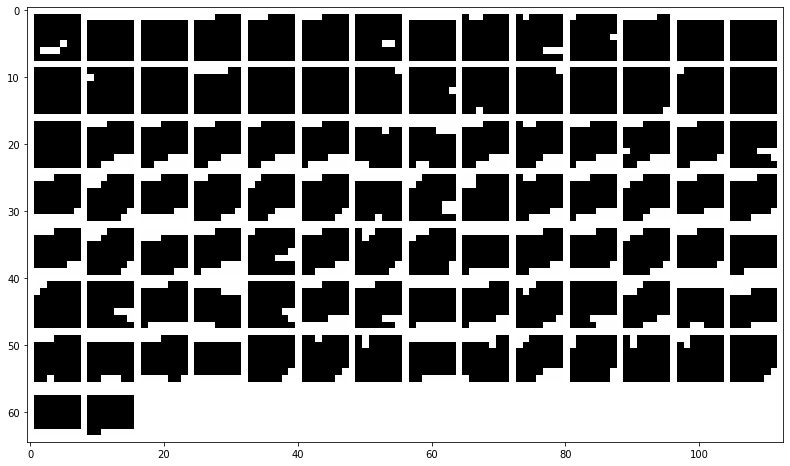

grid regions of 100 regions more=True or worst=False active for filter number: 35 :


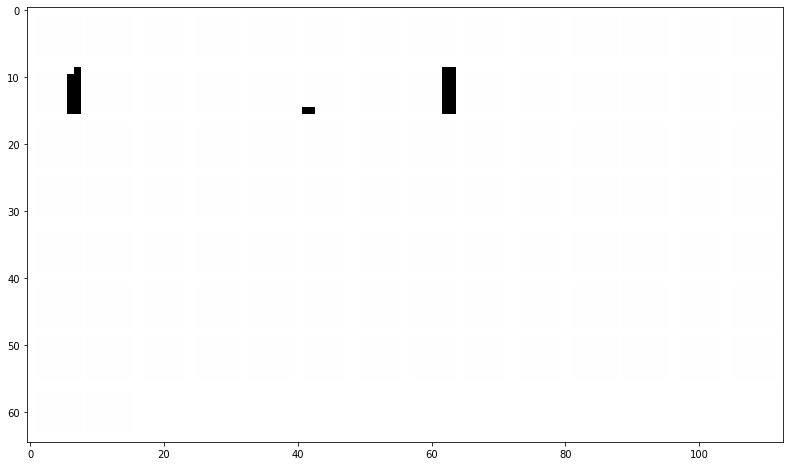

normalized regions:


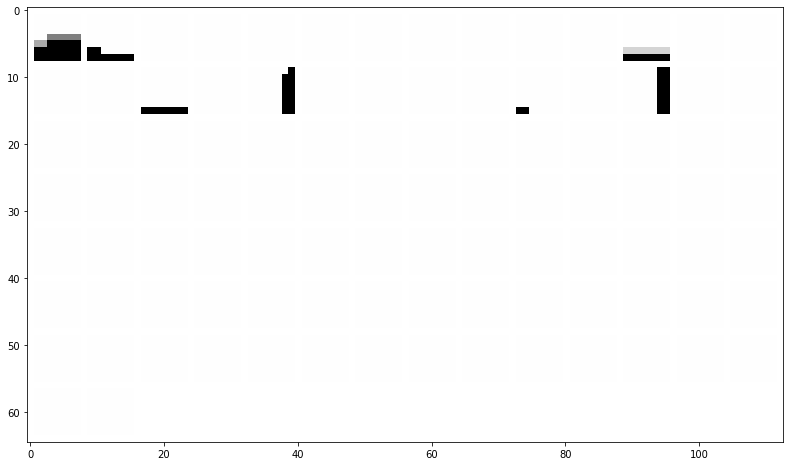

grid regions of 100 regions more=True or worst=False active for filter number: 40 :


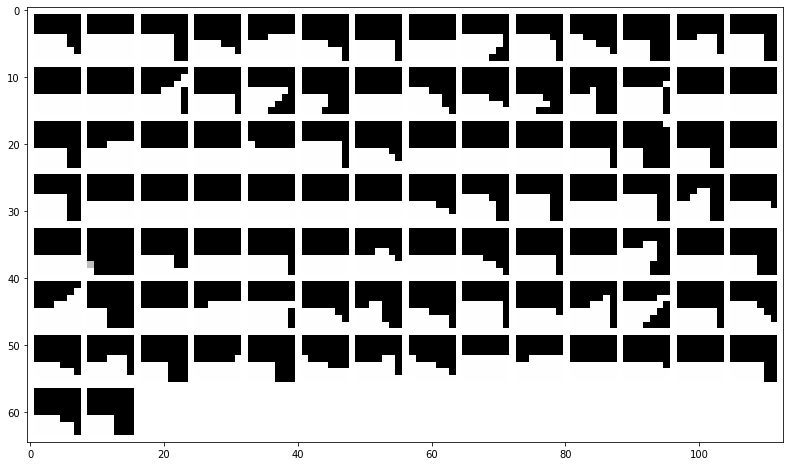

normalized regions:


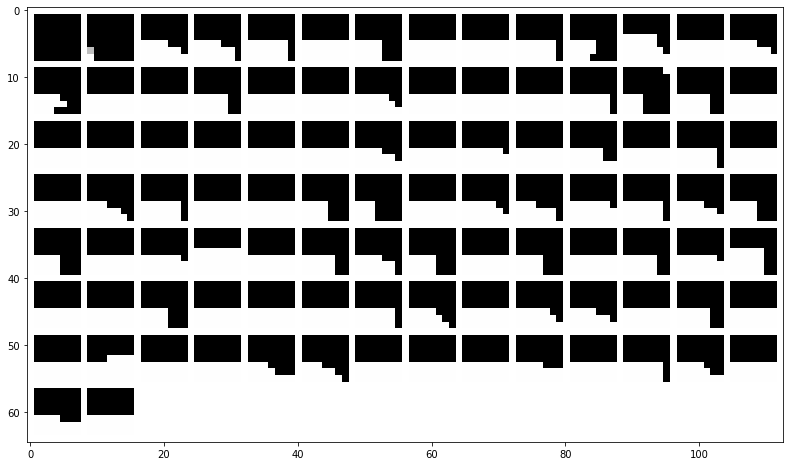

grid regions of 100 regions more=True or worst=False active for filter number: 45 :


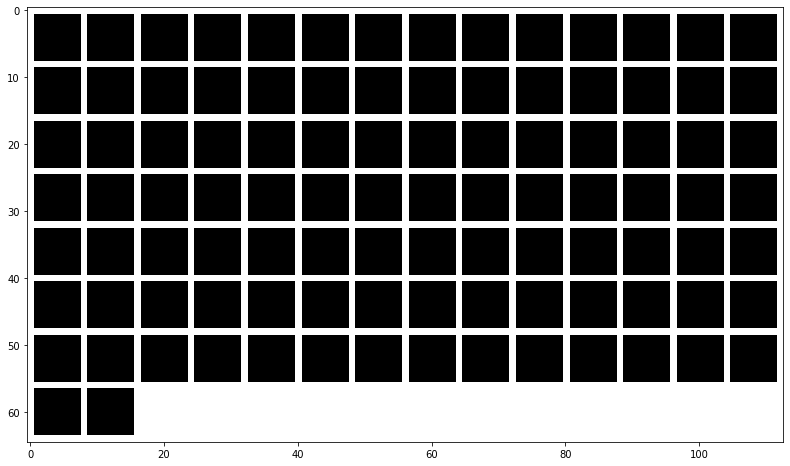

normalized regions:


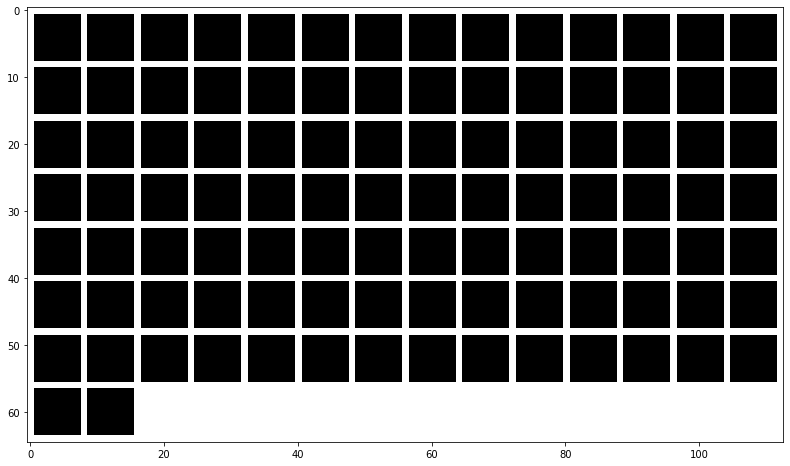

grid regions of 100 regions more=True or worst=False active for filter number: 50 :


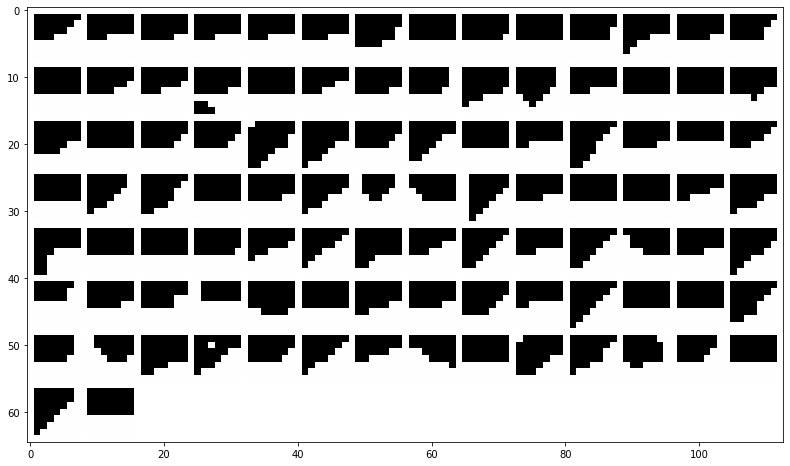

normalized regions:


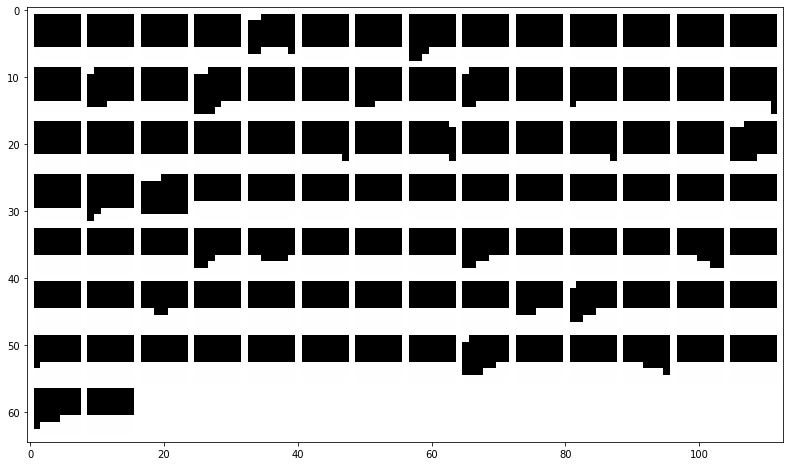

grid regions of 100 regions more=True or worst=False active for filter number: 55 :


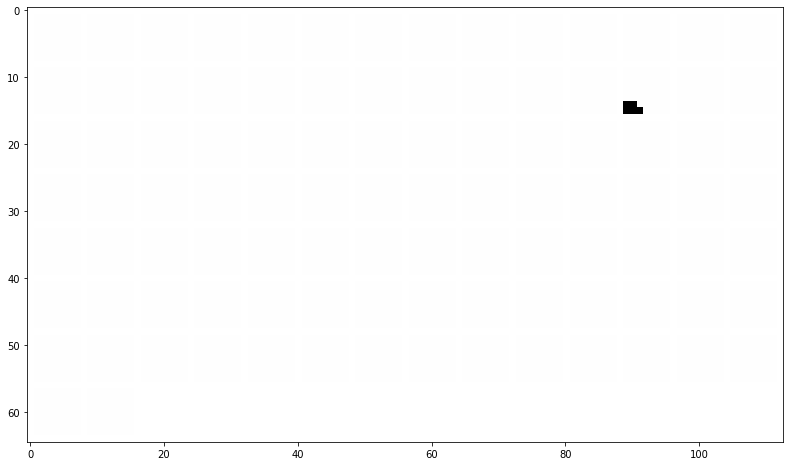

normalized regions:


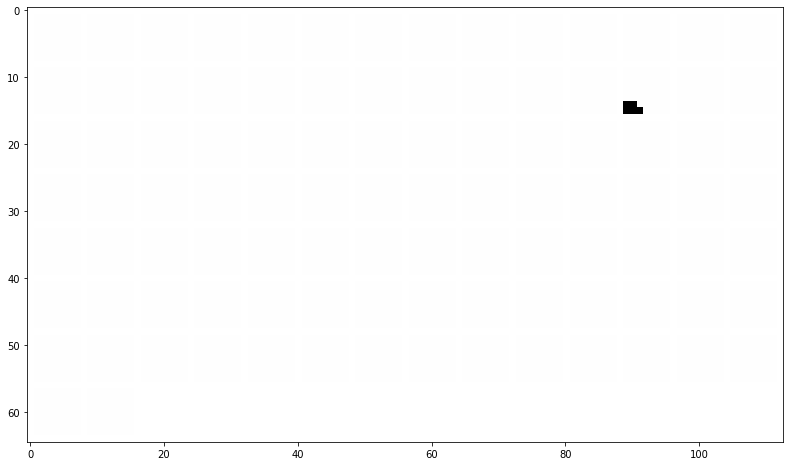

grid regions of 100 regions more=True or worst=False active for filter number: 60 :


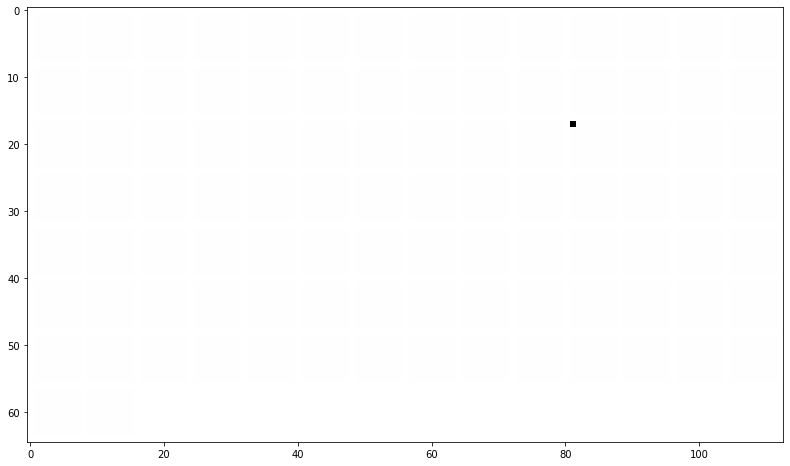

normalized regions:


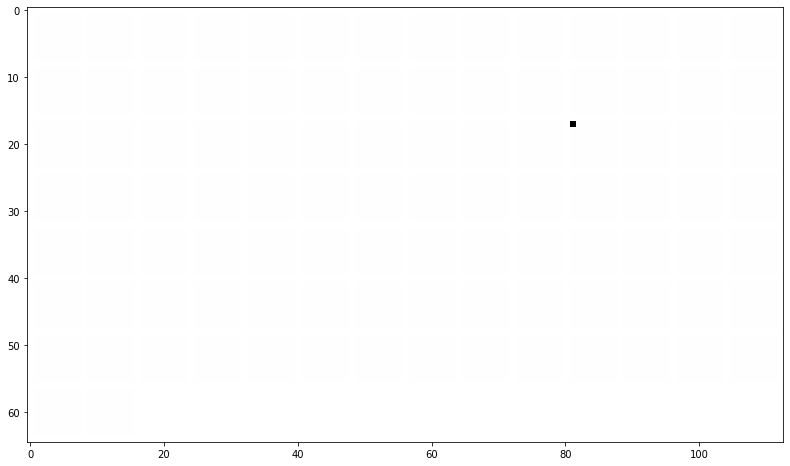

grid regions of 100 regions more=True or worst=False active for filter number: 65 :


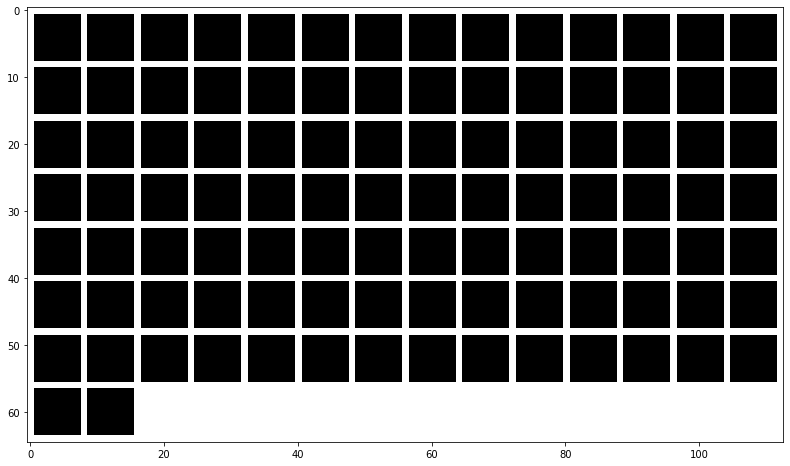

normalized regions:


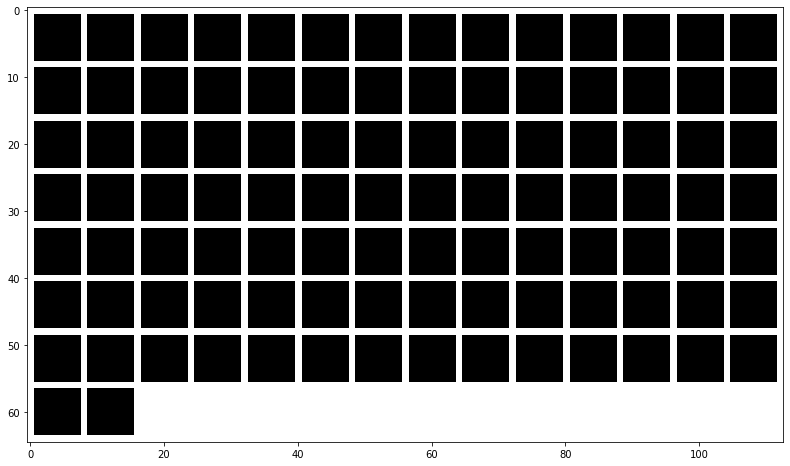

grid regions of 100 regions more=True or worst=False active for filter number: 70 :


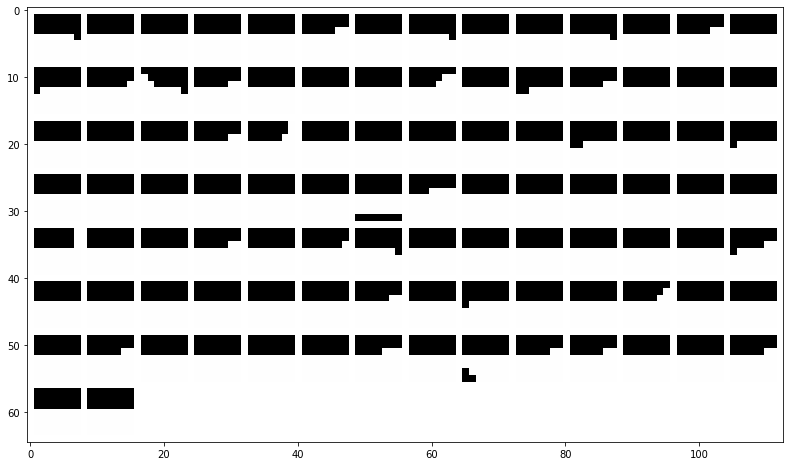

normalized regions:


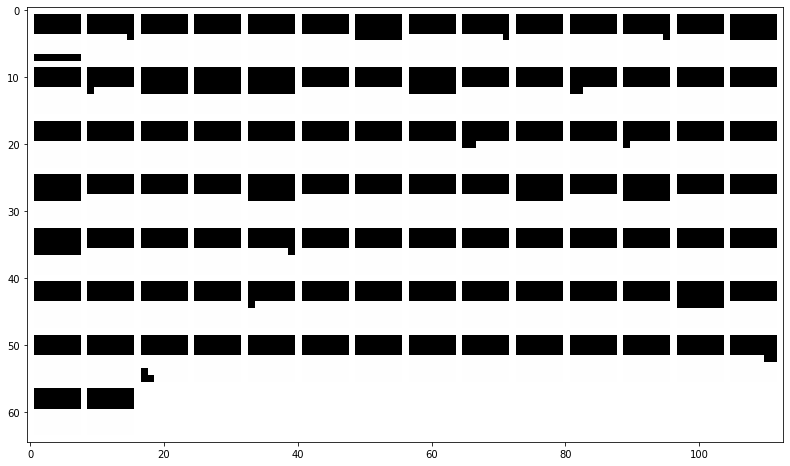

grid regions of 100 regions more=True or worst=False active for filter number: 80 :


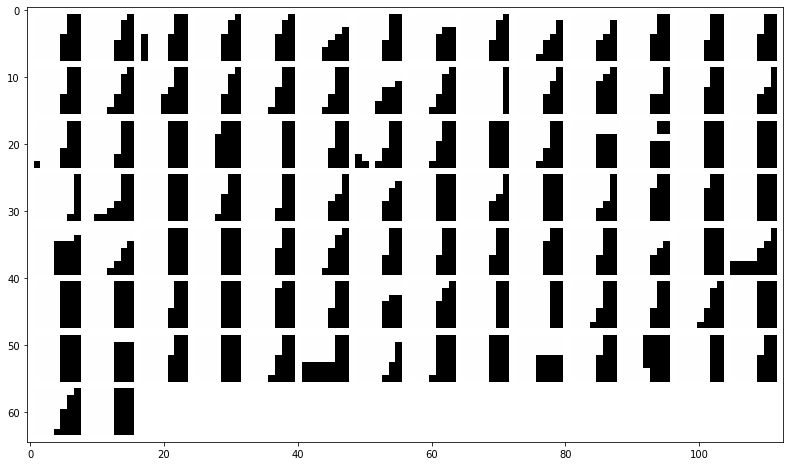

normalized regions:


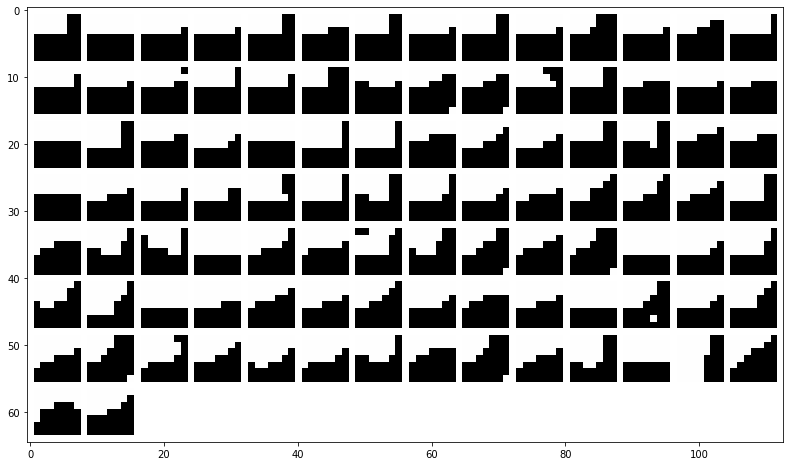

grid regions of 100 regions more=True or worst=False active for filter number: 85 :


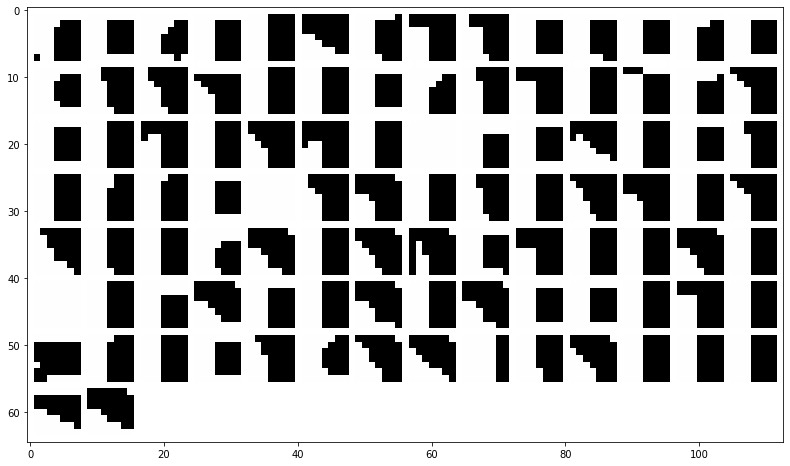

normalized regions:


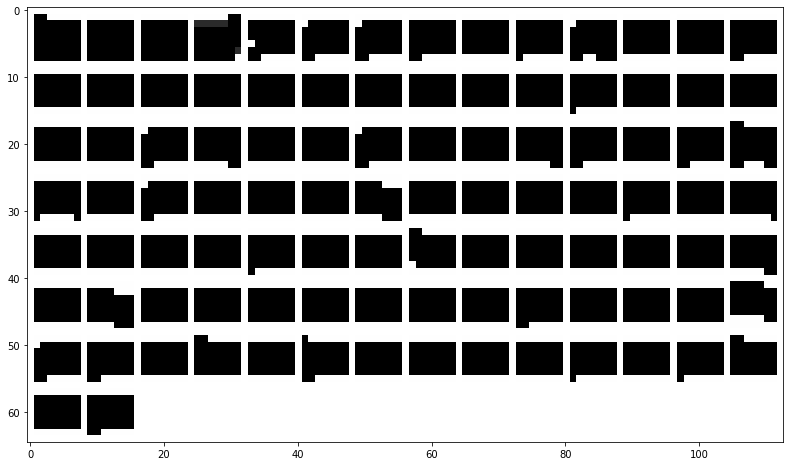

grid regions of 100 regions more=True or worst=False active for filter number: 90 :


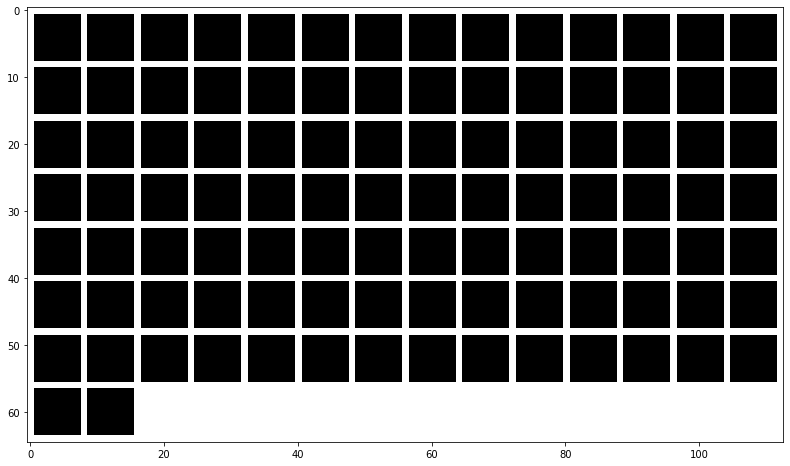

normalized regions:


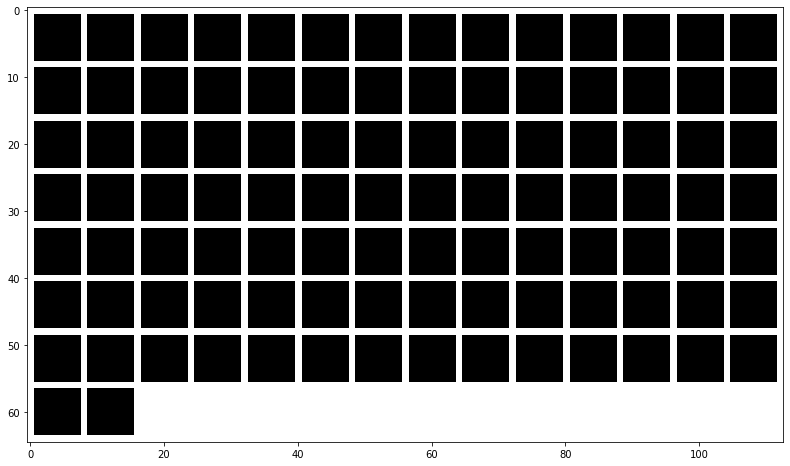

grid regions of 100 regions more=True or worst=False active for filter number: 95 :


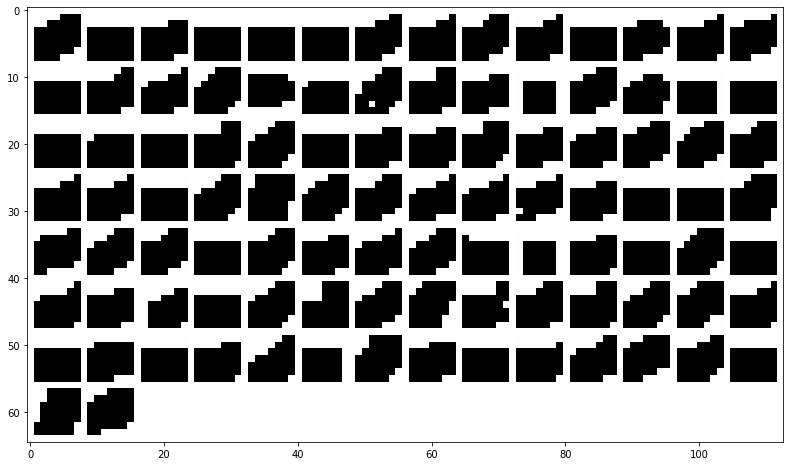

normalized regions:


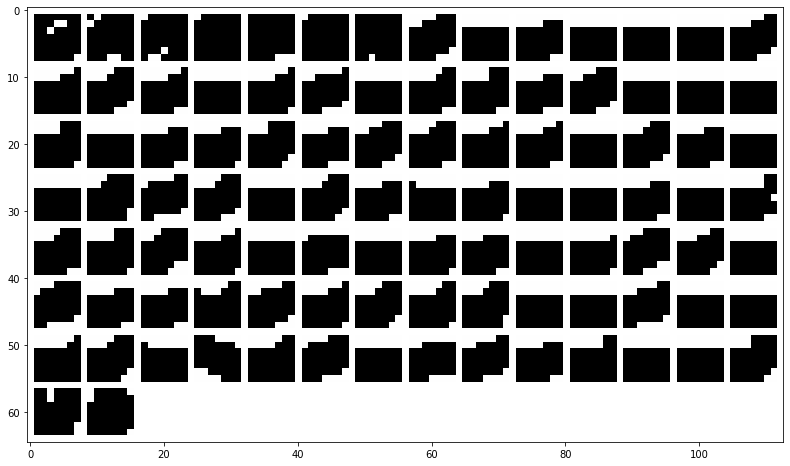

grid regions of 100 regions more=True or worst=False active for filter number: 100 :


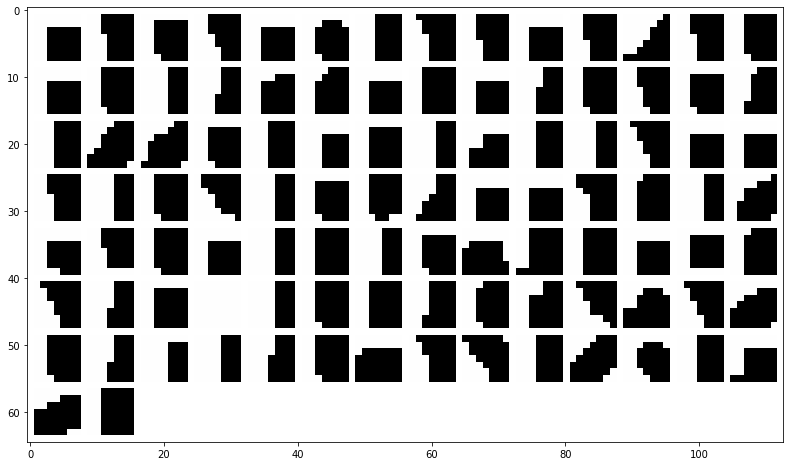

normalized regions:


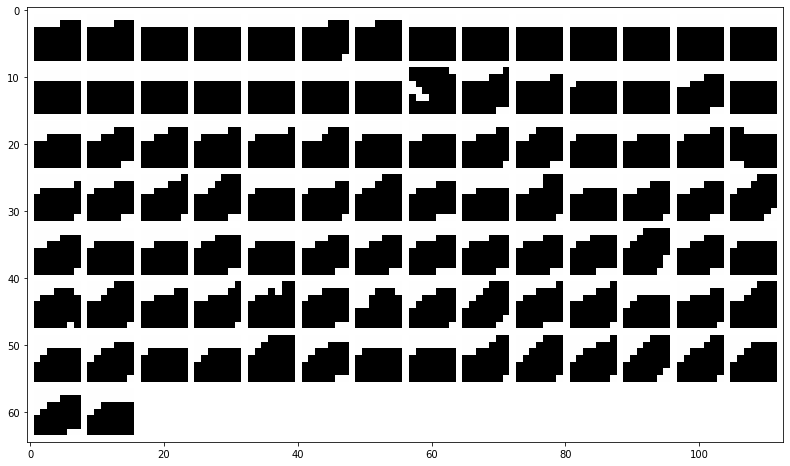

grid regions of 100 regions more=True or worst=False active for filter number: 105 :


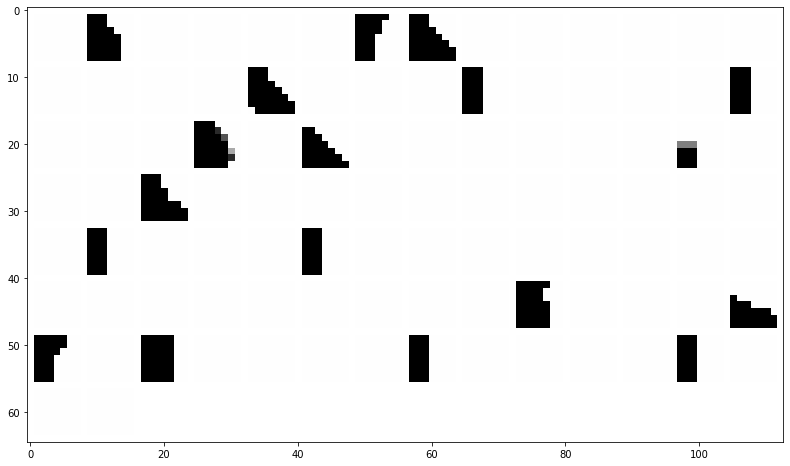

normalized regions:


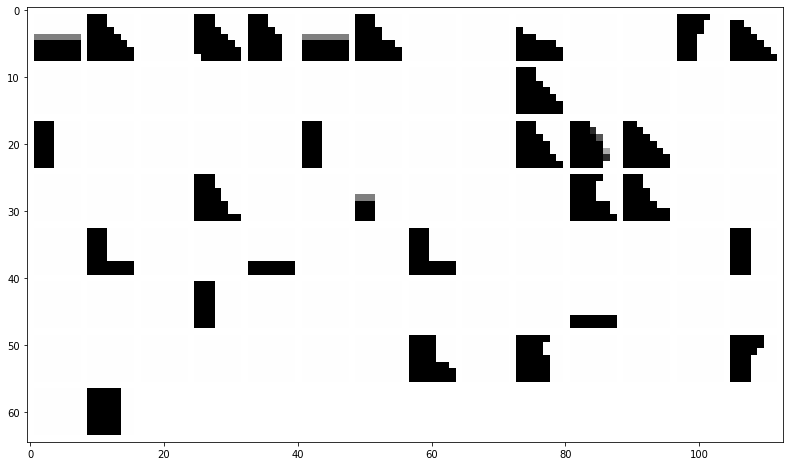

grid regions of 100 regions more=True or worst=False active for filter number: 110 :


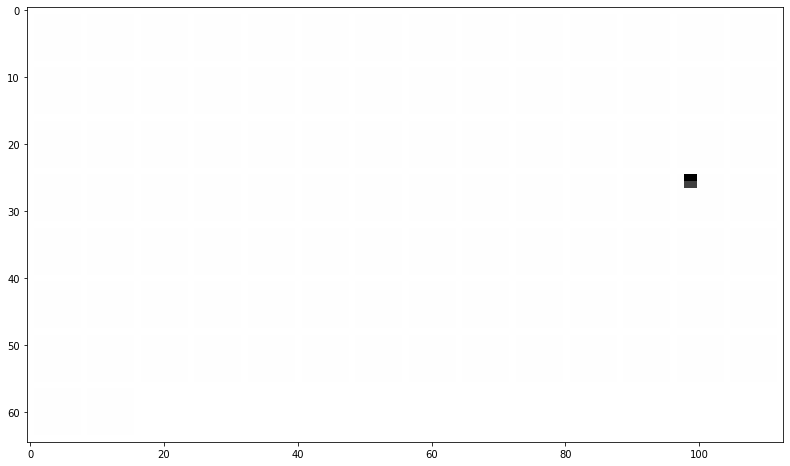

normalized regions:


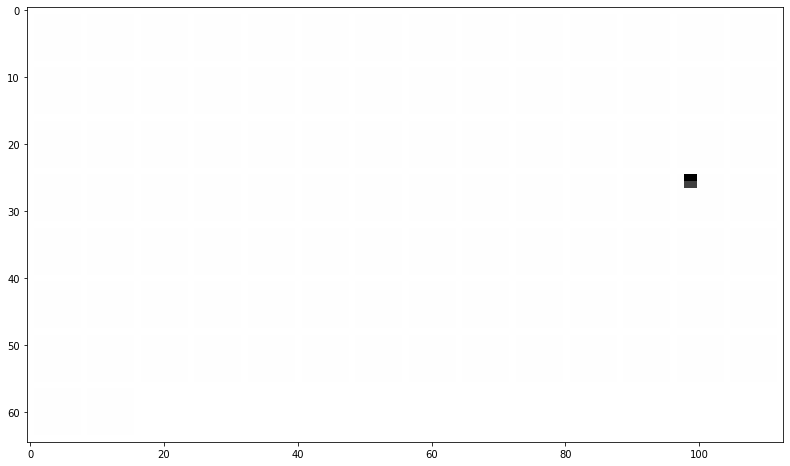

grid regions of 100 regions more=True or worst=False active for filter number: 115 :


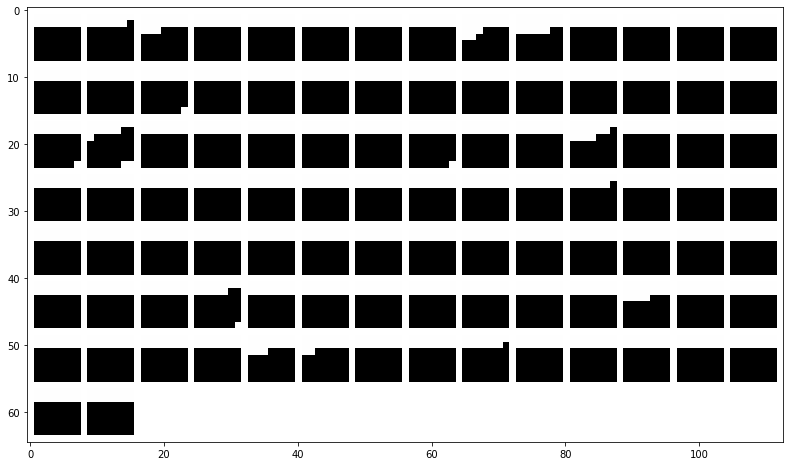

normalized regions:


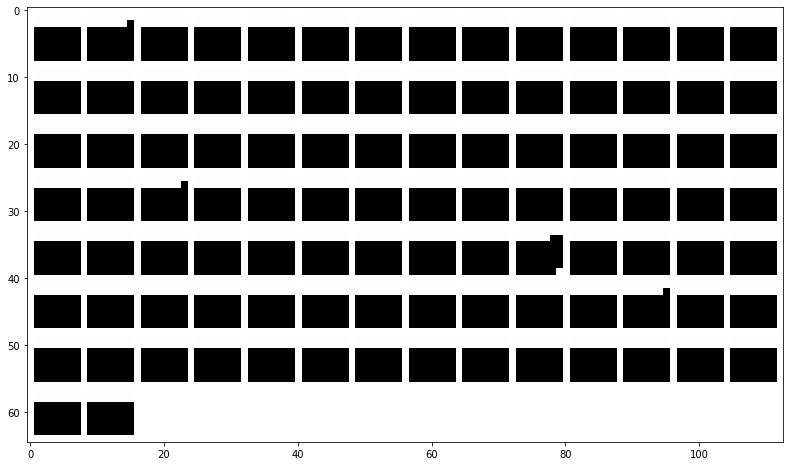

grid regions of 100 regions more=True or worst=False active for filter number: 120 :


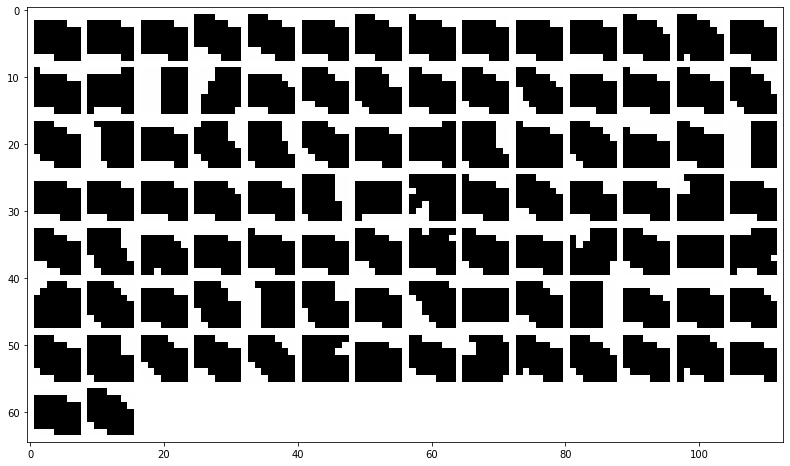

normalized regions:


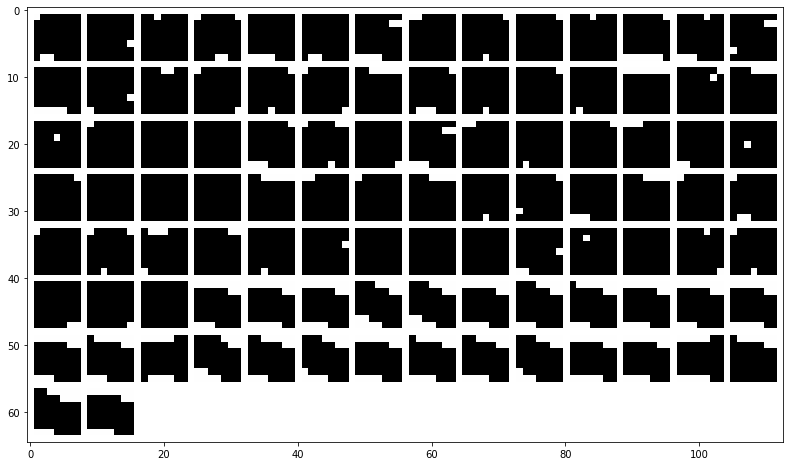

grid regions of 100 regions more=True or worst=False active for filter number: 125 :


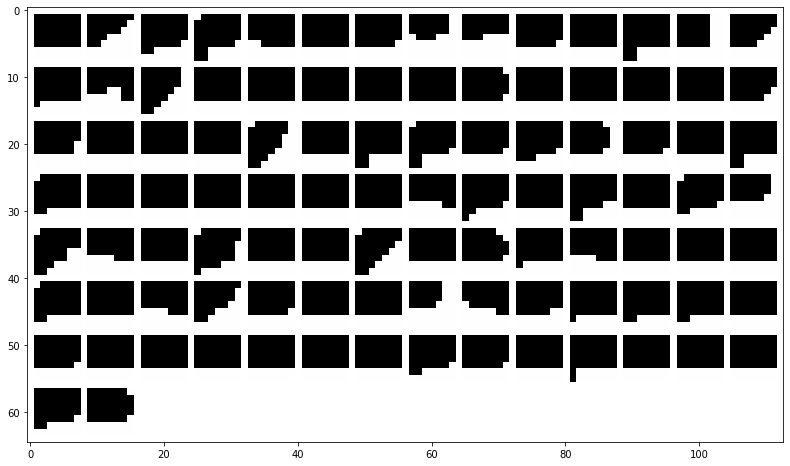

normalized regions:


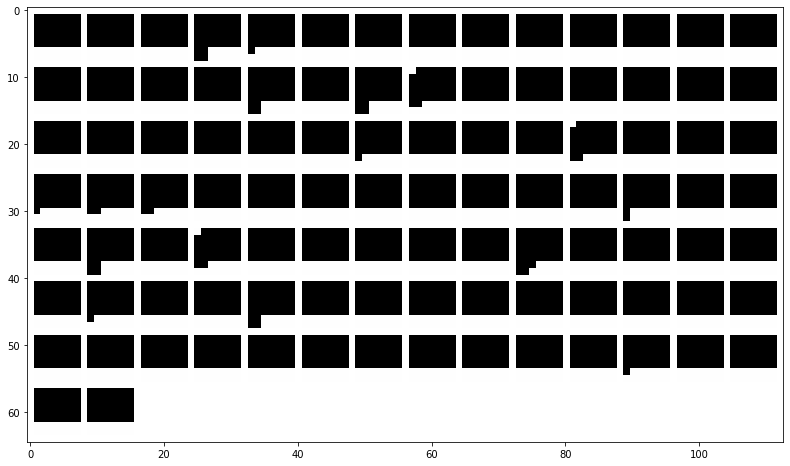

In [25]:
# regions and activation of interest
list_filter = list_filter_interest_layer2
regions = region_layer2_binary_stride
activations = activation_layer2_binary_stride
activations_normalized = activation_layer2_binary_normalized_stride

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

Interest of filters: [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 80, 85, 90, 95, 100, 105, 110, 150, 120, 125, 150, 200, 250]
Consider 10% image regions = 100 images
Consider 10% image regions = 100 images
mean image:
mean regions of 100 regions more=True or worst=False active for filter number: 0 :


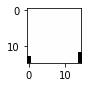

normalized region:


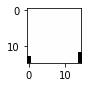

mean regions of 100 regions more=True or worst=False active for filter number: 5 :


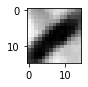

normalized region:


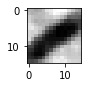

mean regions of 100 regions more=True or worst=False active for filter number: 10 :


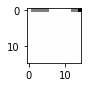

normalized region:


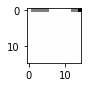

mean regions of 100 regions more=True or worst=False active for filter number: 15 :


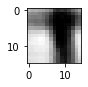

normalized region:


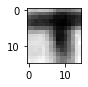

mean regions of 100 regions more=True or worst=False active for filter number: 20 :


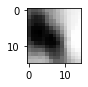

normalized region:


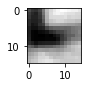

mean regions of 100 regions more=True or worst=False active for filter number: 25 :


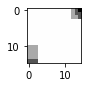

normalized region:


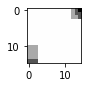

mean regions of 100 regions more=True or worst=False active for filter number: 30 :


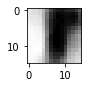

normalized region:


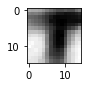

mean regions of 100 regions more=True or worst=False active for filter number: 35 :


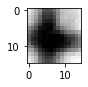

normalized region:


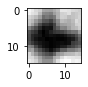

mean regions of 100 regions more=True or worst=False active for filter number: 40 :


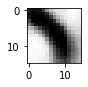

normalized region:


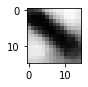

mean regions of 100 regions more=True or worst=False active for filter number: 45 :


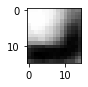

normalized region:


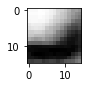

mean regions of 100 regions more=True or worst=False active for filter number: 50 :


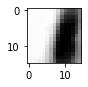

normalized region:


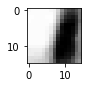

mean regions of 100 regions more=True or worst=False active for filter number: 55 :


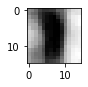

normalized region:


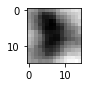

mean regions of 100 regions more=True or worst=False active for filter number: 60 :


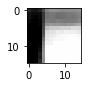

normalized region:


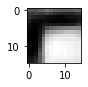

mean regions of 100 regions more=True or worst=False active for filter number: 65 :


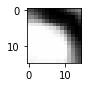

normalized region:


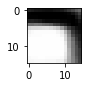

mean regions of 100 regions more=True or worst=False active for filter number: 70 :


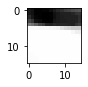

normalized region:


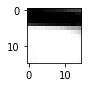

mean regions of 100 regions more=True or worst=False active for filter number: 80 :


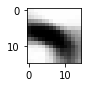

normalized region:


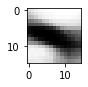

mean regions of 100 regions more=True or worst=False active for filter number: 85 :


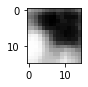

normalized region:


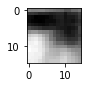

mean regions of 100 regions more=True or worst=False active for filter number: 90 :


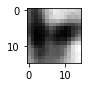

normalized region:


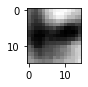

mean regions of 100 regions more=True or worst=False active for filter number: 95 :


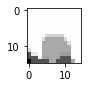

normalized region:


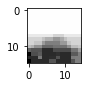

mean regions of 100 regions more=True or worst=False active for filter number: 100 :


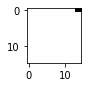

normalized region:


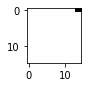

mean regions of 100 regions more=True or worst=False active for filter number: 105 :


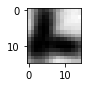

normalized region:


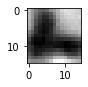

mean regions of 100 regions more=True or worst=False active for filter number: 110 :


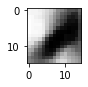

normalized region:


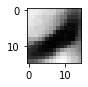

mean regions of 100 regions more=True or worst=False active for filter number: 150 :


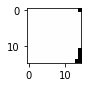

normalized region:


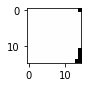

mean regions of 100 regions more=True or worst=False active for filter number: 120 :


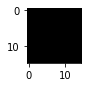

normalized region:


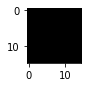

mean regions of 100 regions more=True or worst=False active for filter number: 125 :


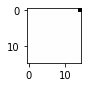

normalized region:


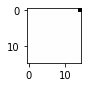

mean regions of 100 regions more=True or worst=False active for filter number: 150 :


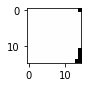

normalized region:


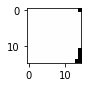

mean regions of 100 regions more=True or worst=False active for filter number: 200 :


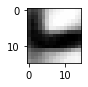

normalized region:


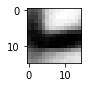

mean regions of 100 regions more=True or worst=False active for filter number: 250 :


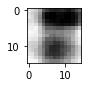

normalized region:


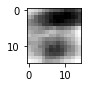

grid image
grid regions of 100 regions more=True or worst=False active for filter number: 0 :


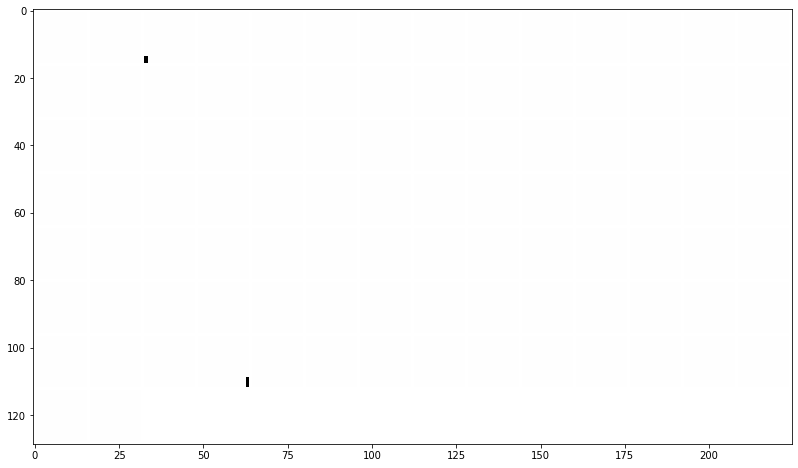

normalized regions:


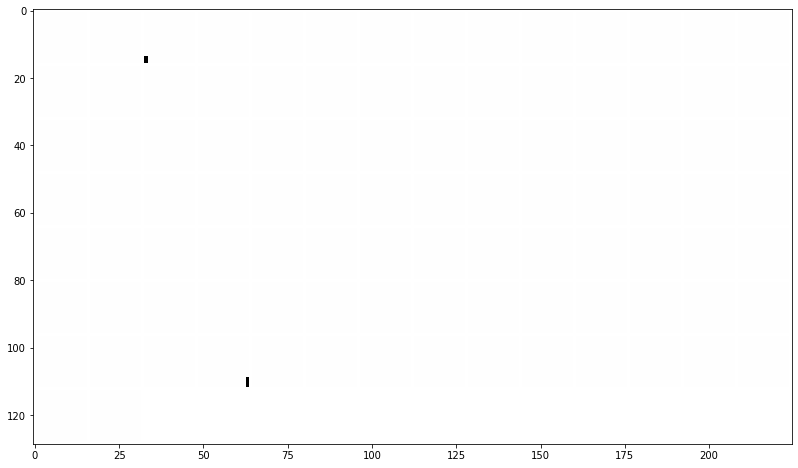

grid regions of 100 regions more=True or worst=False active for filter number: 5 :


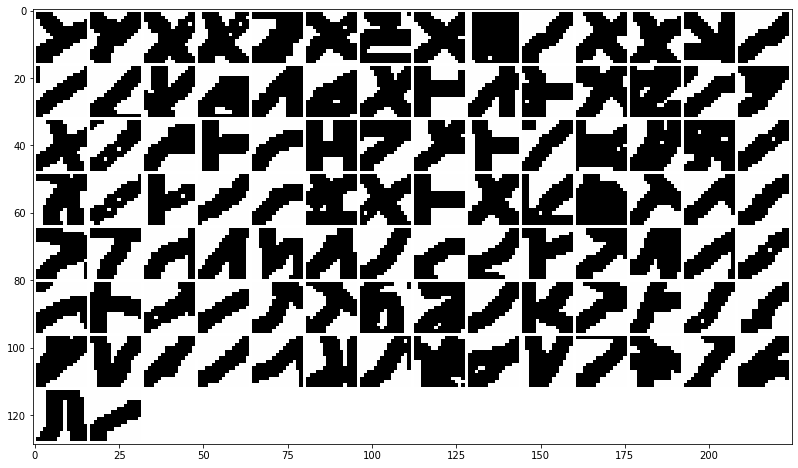

normalized regions:


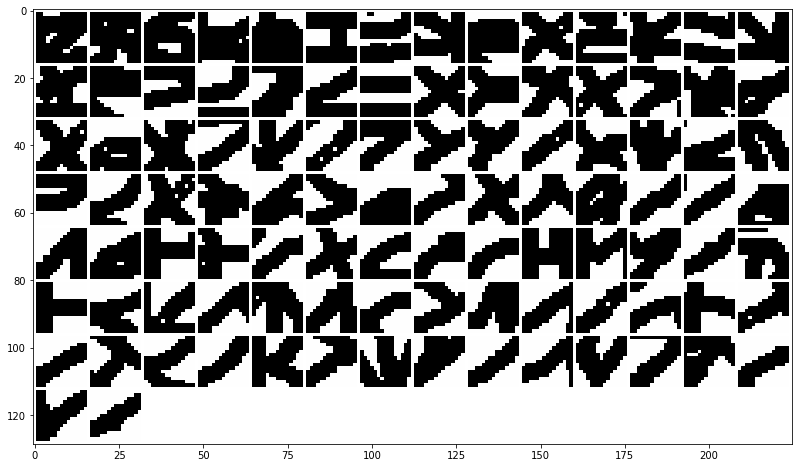

grid regions of 100 regions more=True or worst=False active for filter number: 10 :


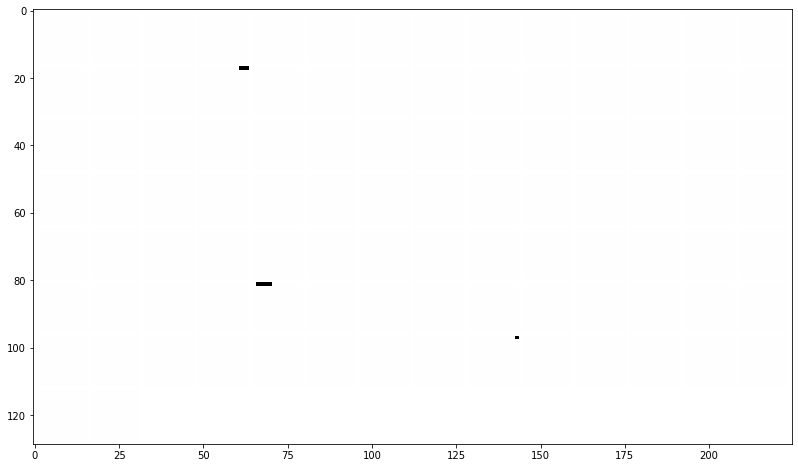

normalized regions:


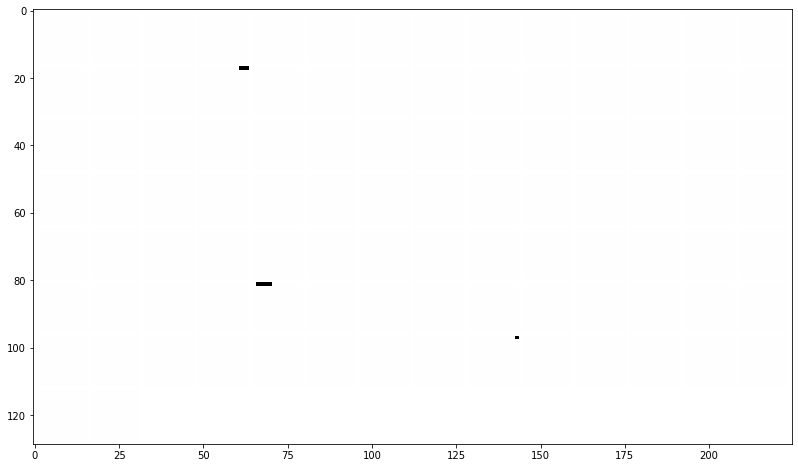

grid regions of 100 regions more=True or worst=False active for filter number: 15 :


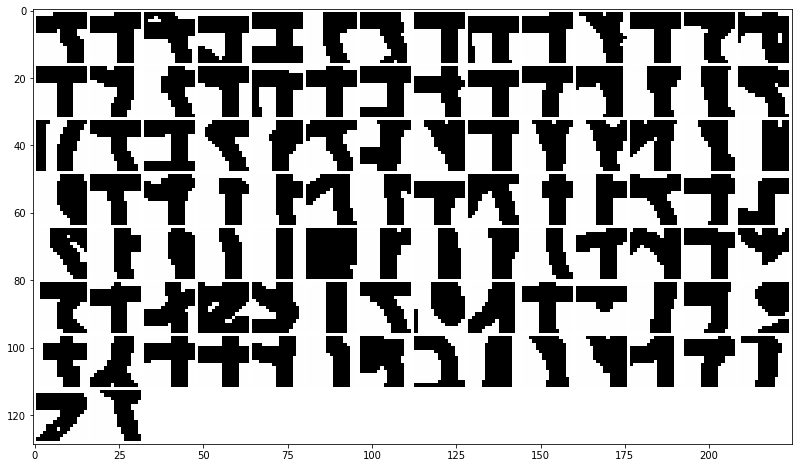

normalized regions:


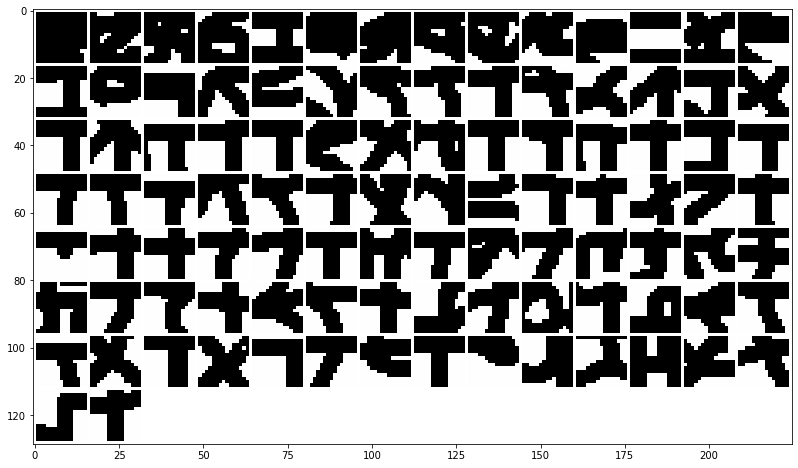

grid regions of 100 regions more=True or worst=False active for filter number: 20 :


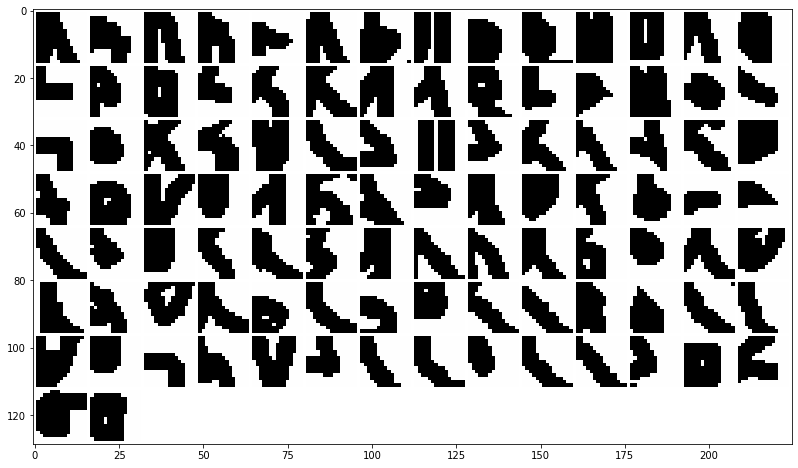

normalized regions:


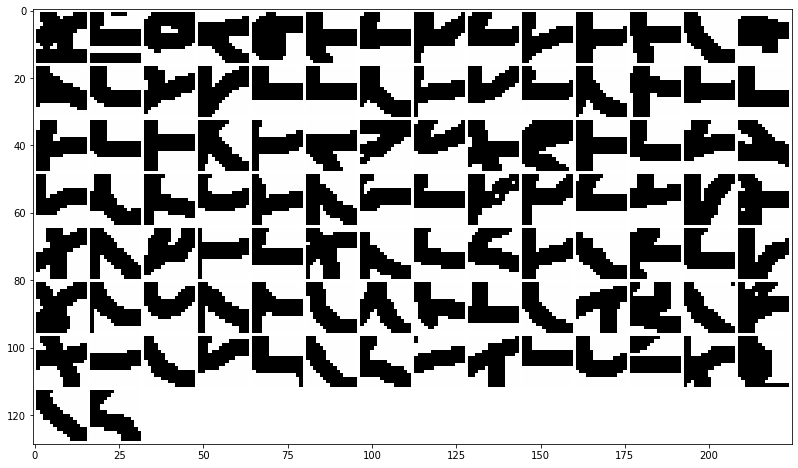

grid regions of 100 regions more=True or worst=False active for filter number: 25 :


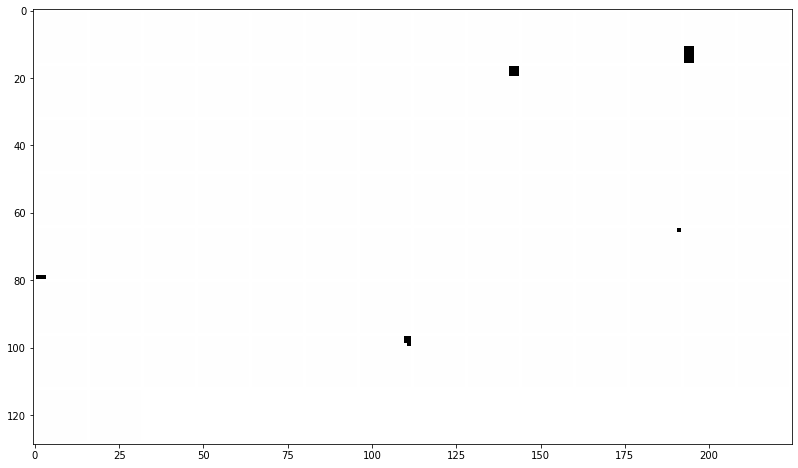

normalized regions:


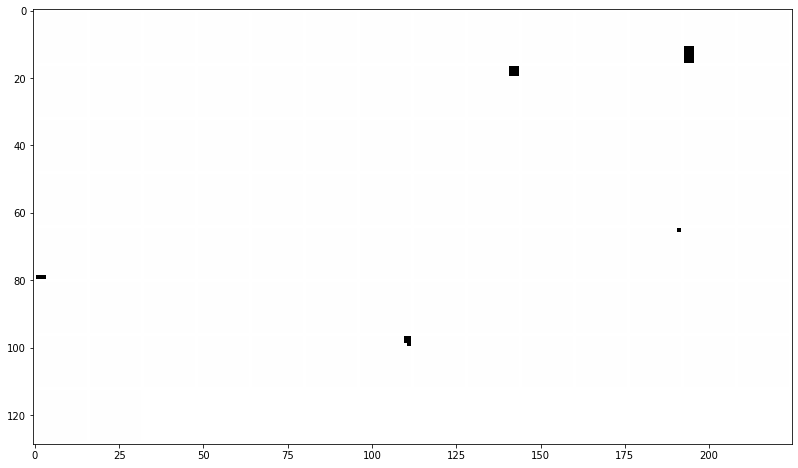

grid regions of 100 regions more=True or worst=False active for filter number: 30 :


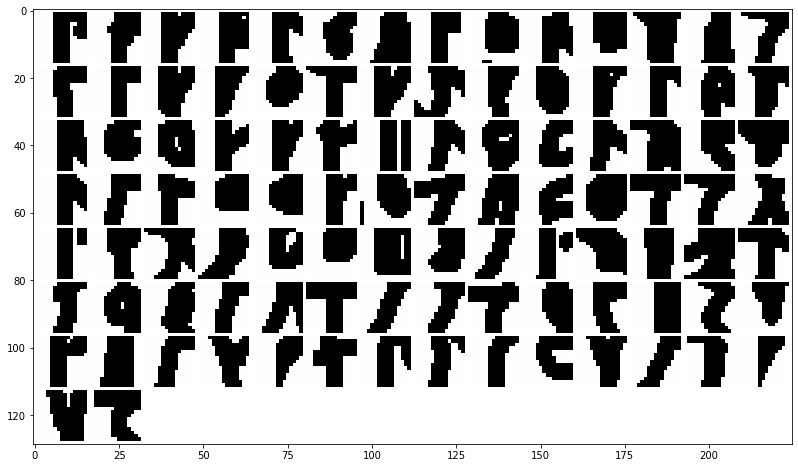

normalized regions:


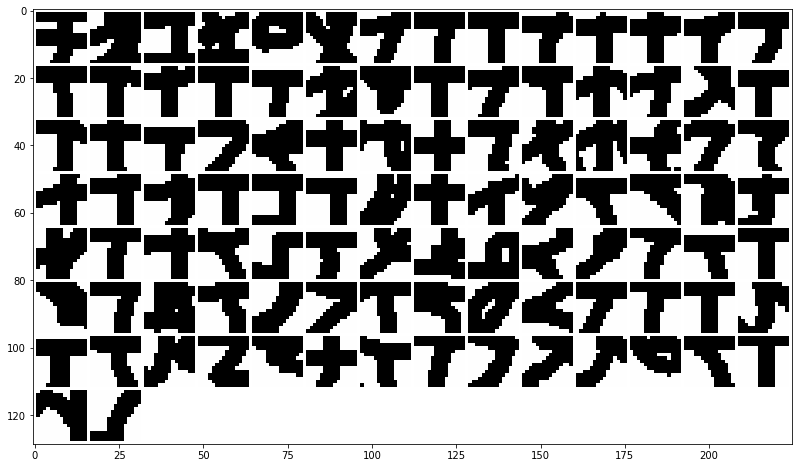

grid regions of 100 regions more=True or worst=False active for filter number: 35 :


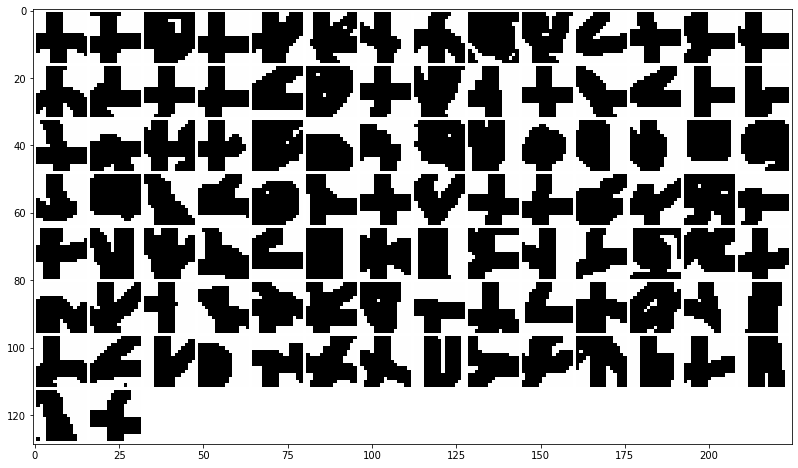

normalized regions:


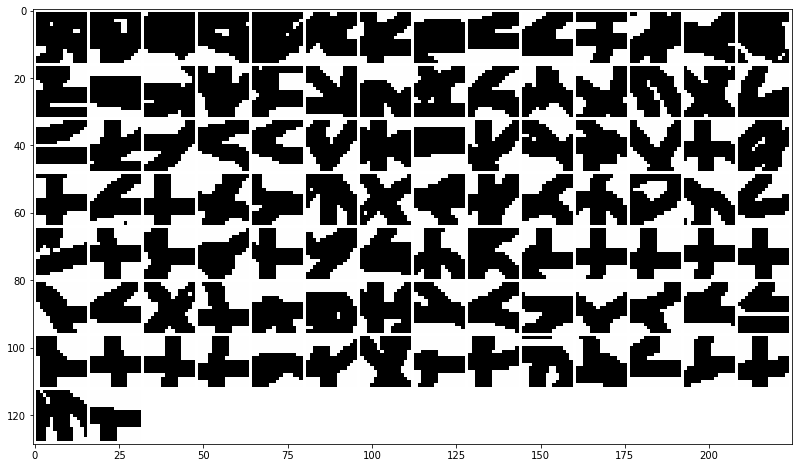

grid regions of 100 regions more=True or worst=False active for filter number: 40 :


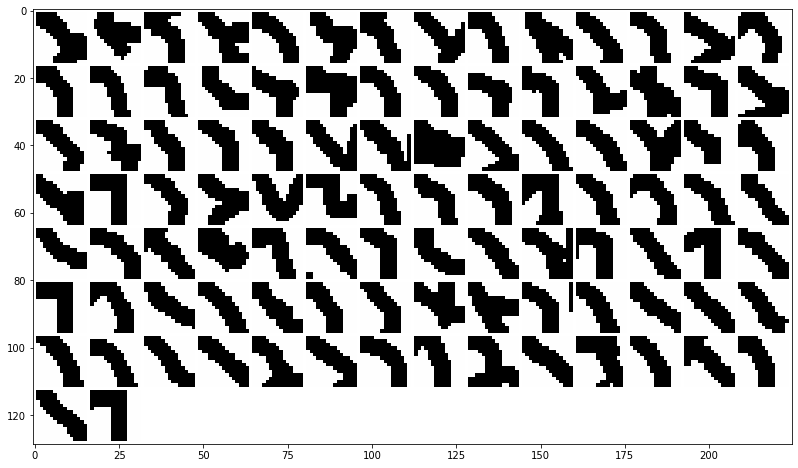

normalized regions:


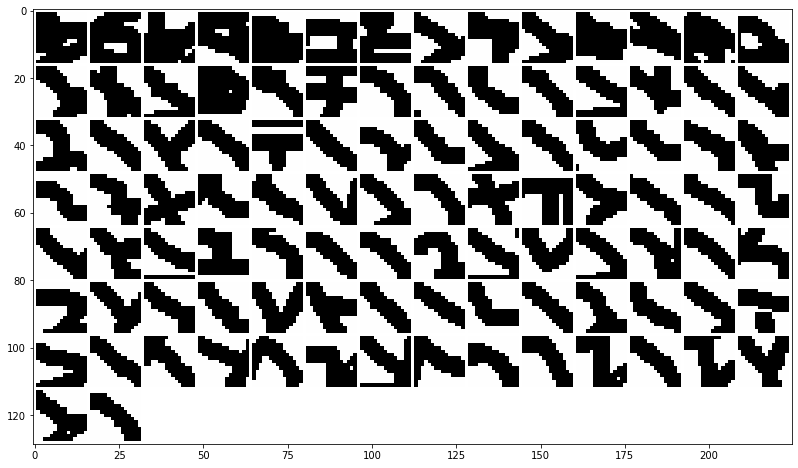

grid regions of 100 regions more=True or worst=False active for filter number: 45 :


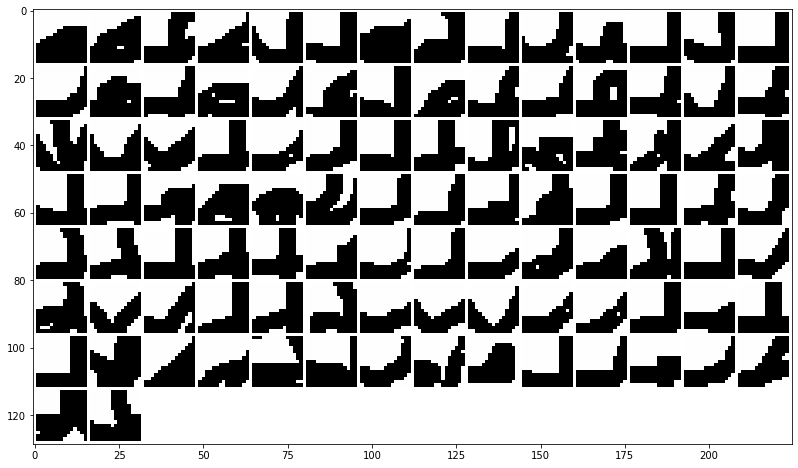

normalized regions:


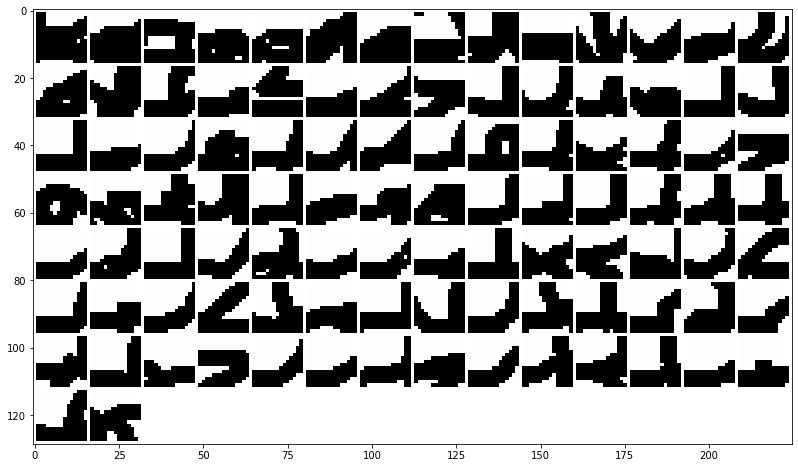

grid regions of 100 regions more=True or worst=False active for filter number: 50 :


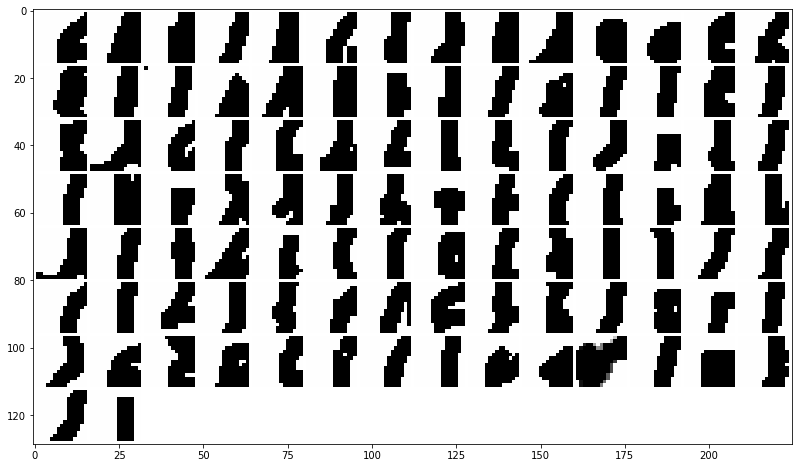

normalized regions:


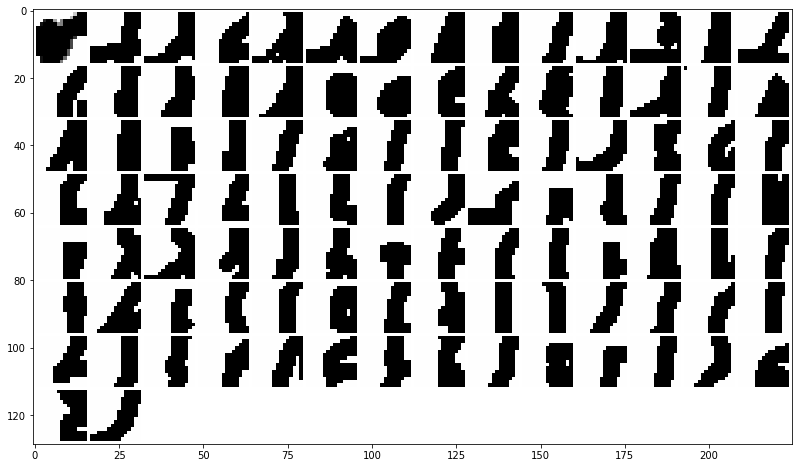

grid regions of 100 regions more=True or worst=False active for filter number: 55 :


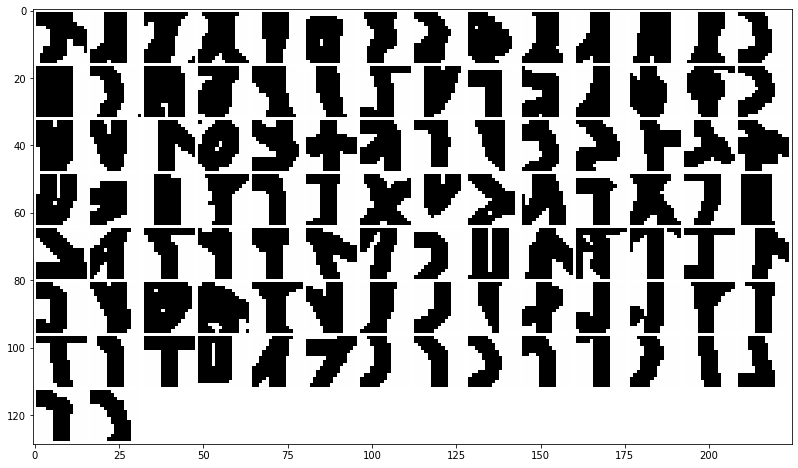

normalized regions:


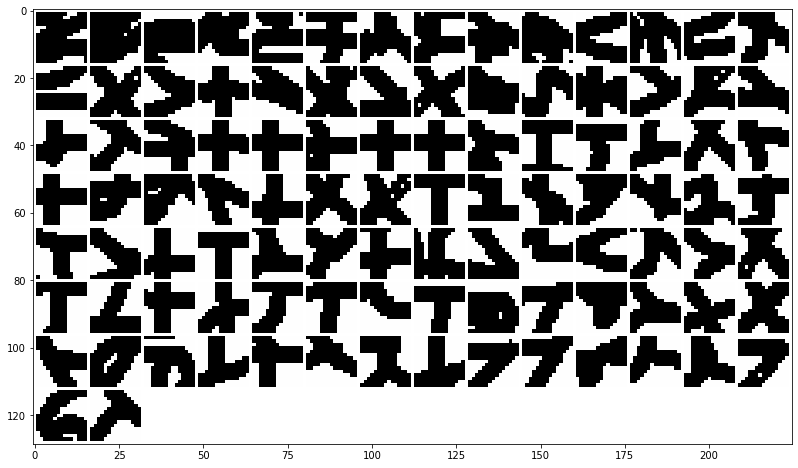

grid regions of 100 regions more=True or worst=False active for filter number: 60 :


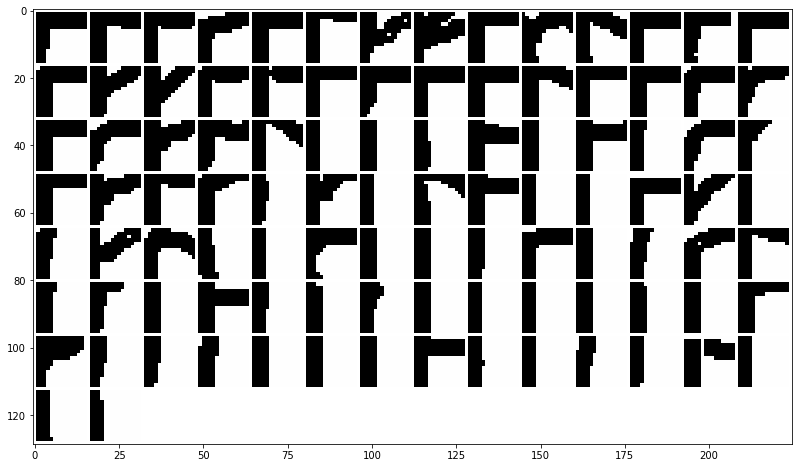

normalized regions:


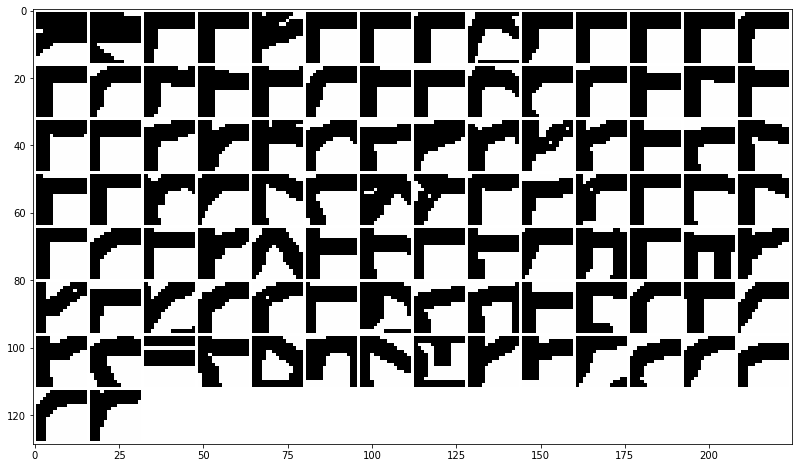

grid regions of 100 regions more=True or worst=False active for filter number: 65 :


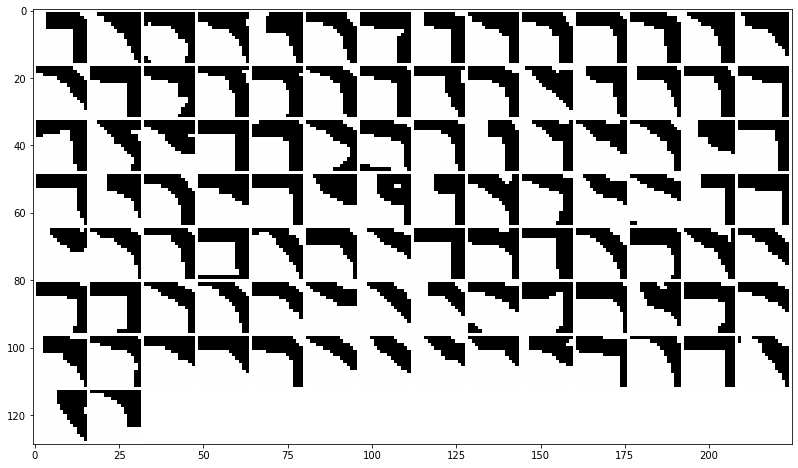

normalized regions:


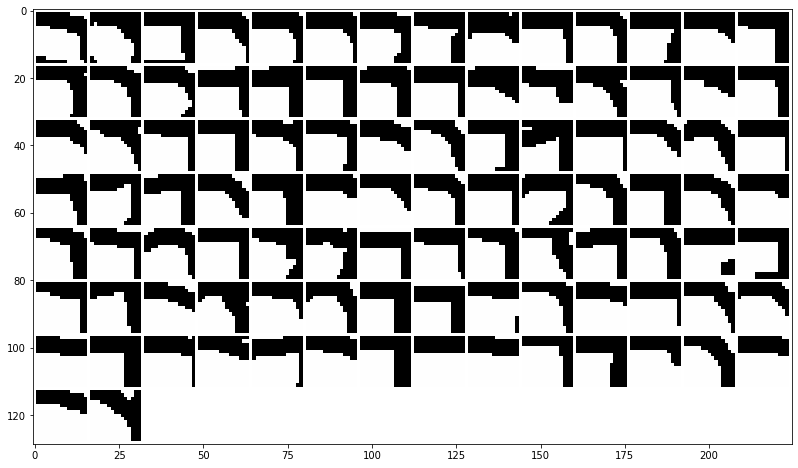

grid regions of 100 regions more=True or worst=False active for filter number: 70 :


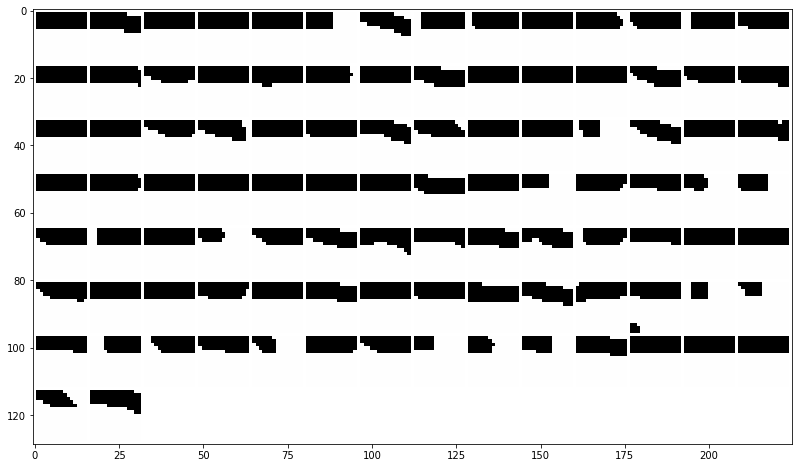

normalized regions:


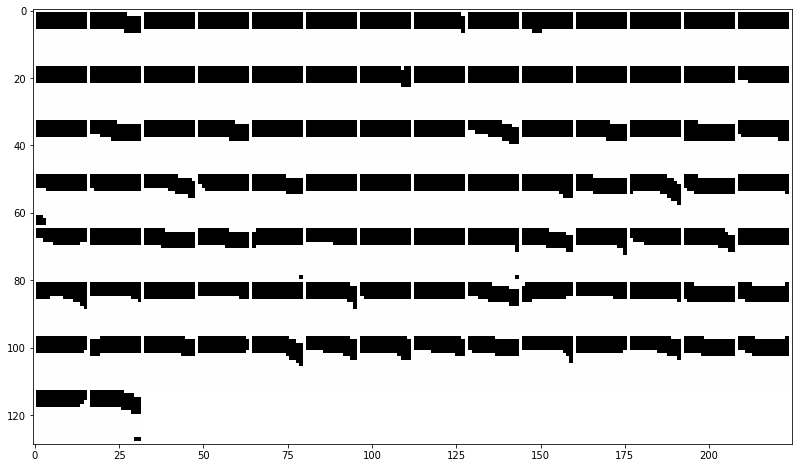

grid regions of 100 regions more=True or worst=False active for filter number: 80 :


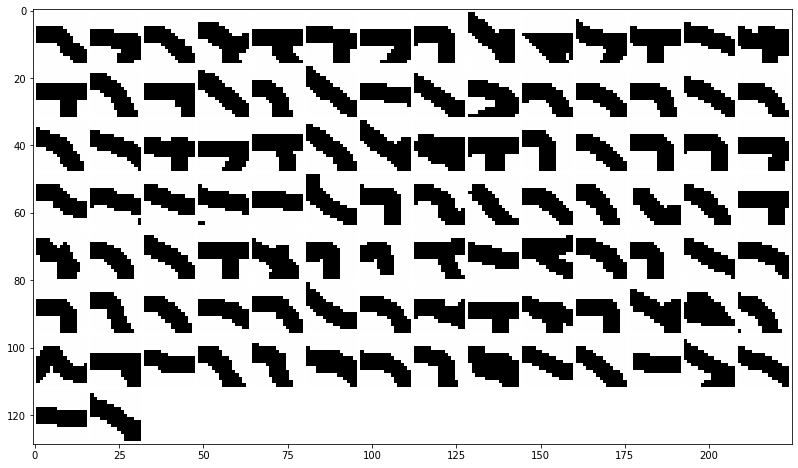

normalized regions:


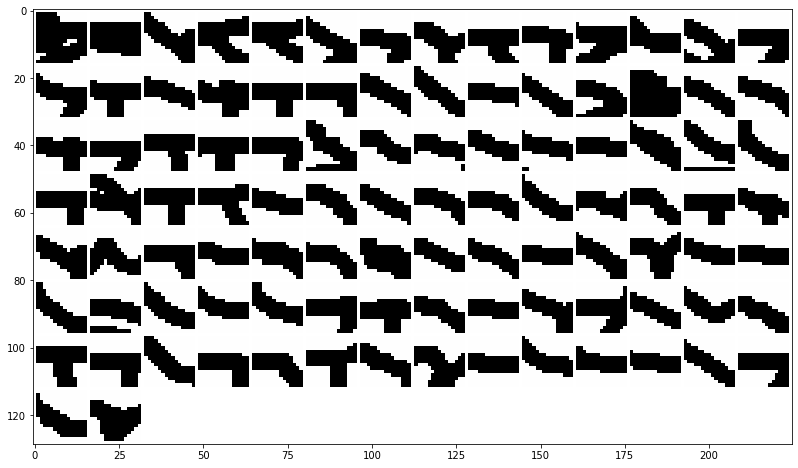

grid regions of 100 regions more=True or worst=False active for filter number: 85 :


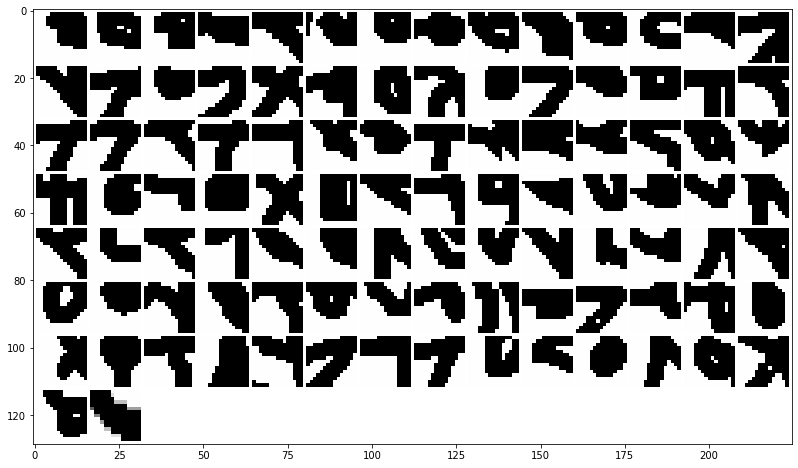

normalized regions:


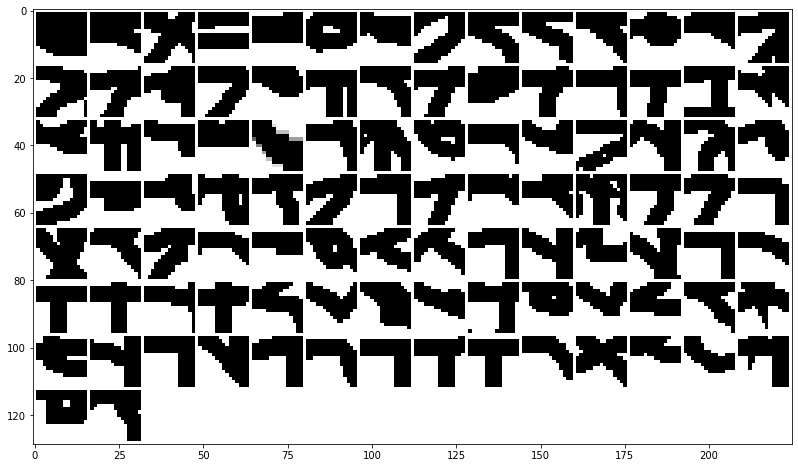

grid regions of 100 regions more=True or worst=False active for filter number: 90 :


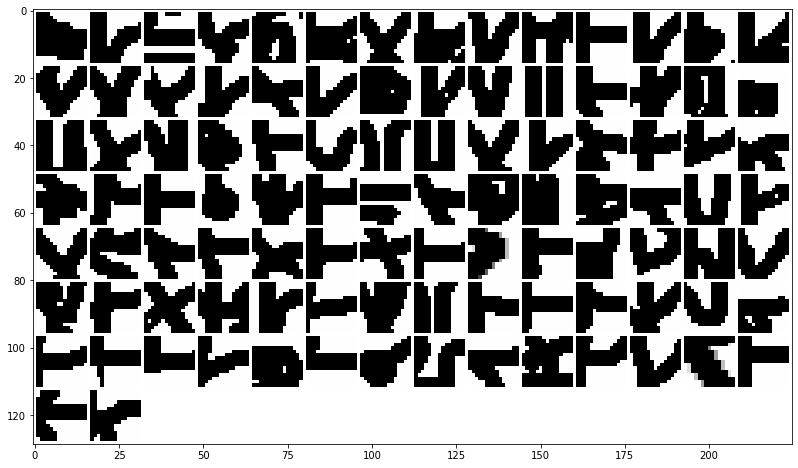

normalized regions:


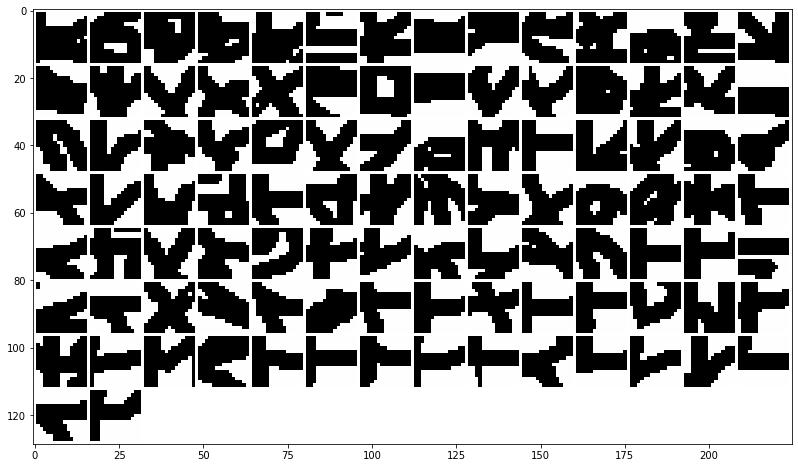

grid regions of 100 regions more=True or worst=False active for filter number: 95 :


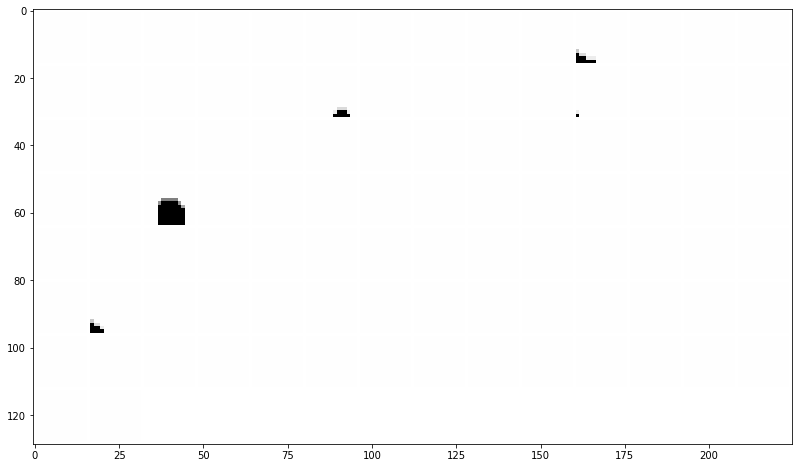

normalized regions:


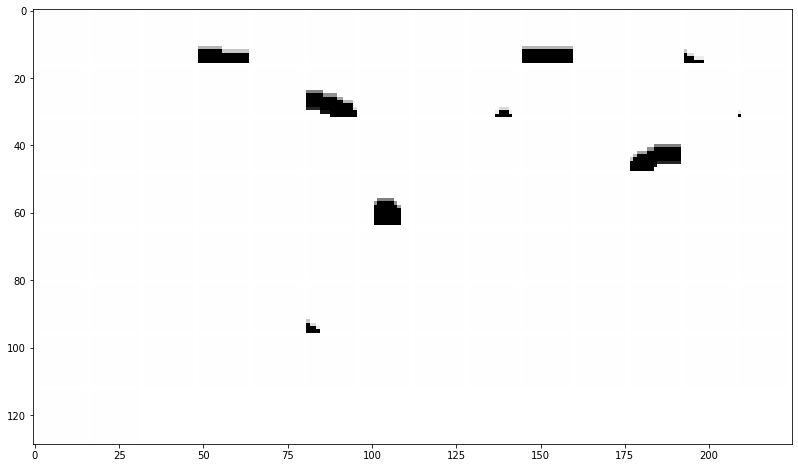

grid regions of 100 regions more=True or worst=False active for filter number: 100 :


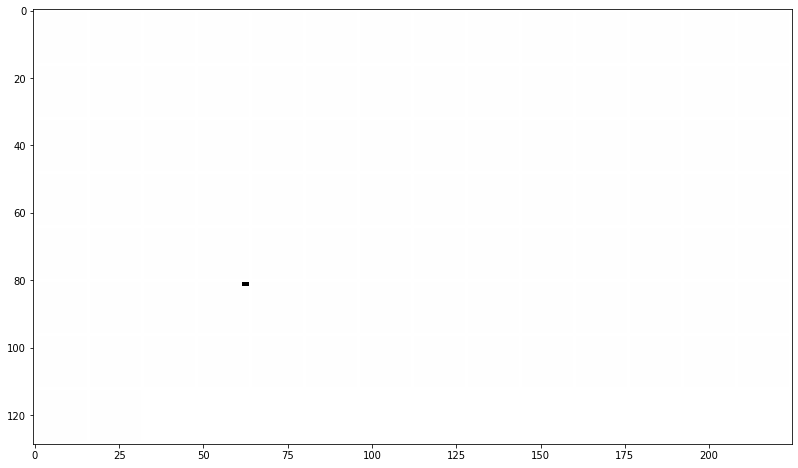

normalized regions:


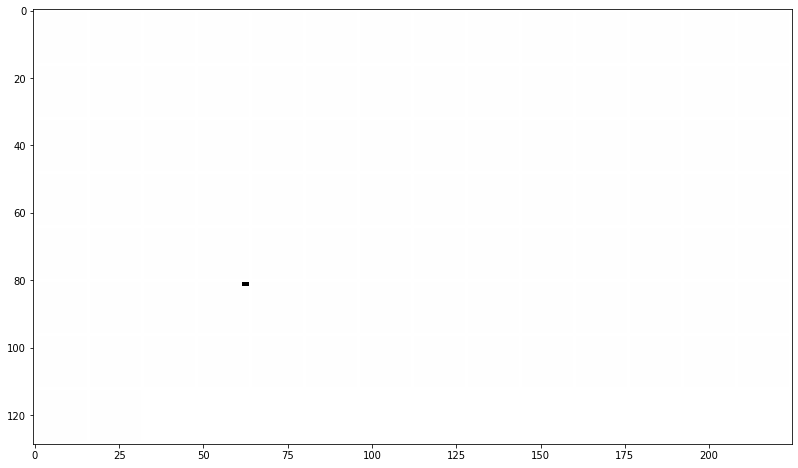

grid regions of 100 regions more=True or worst=False active for filter number: 105 :


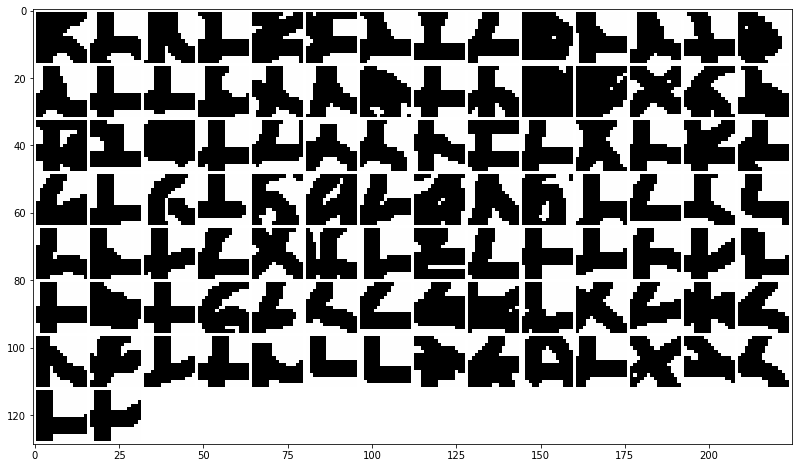

normalized regions:


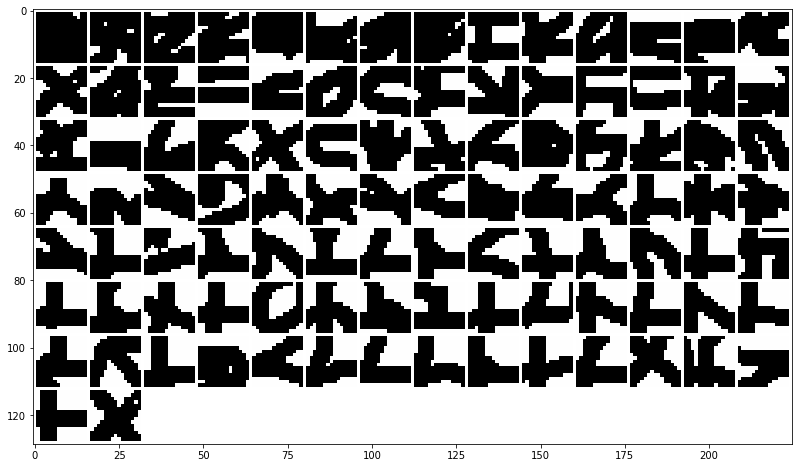

grid regions of 100 regions more=True or worst=False active for filter number: 110 :


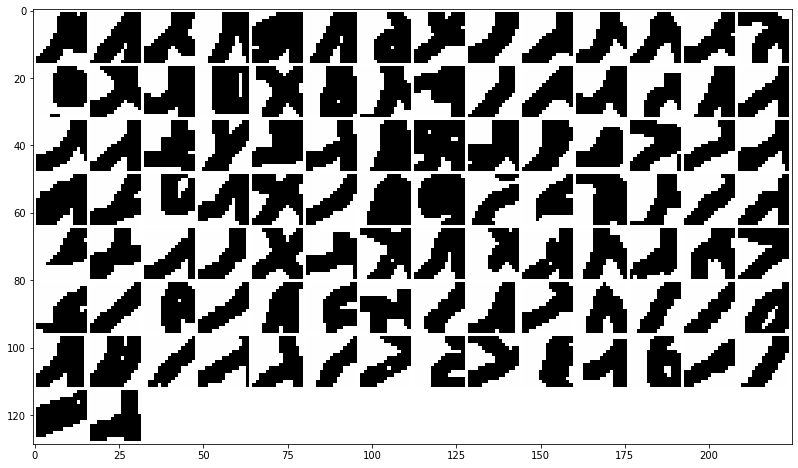

normalized regions:


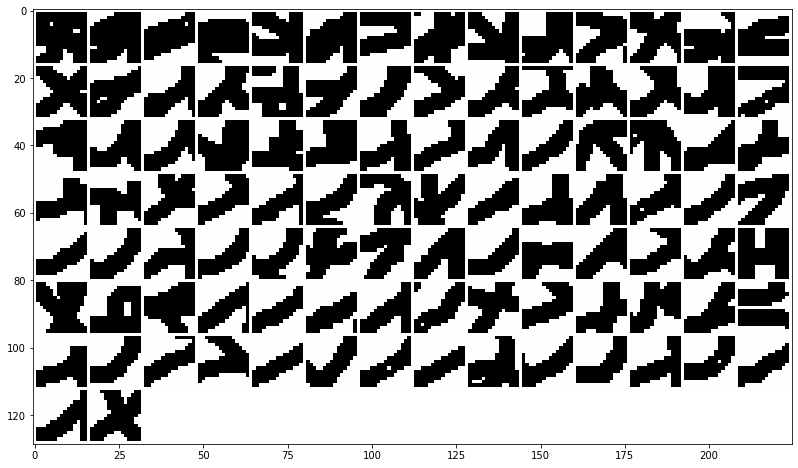

grid regions of 100 regions more=True or worst=False active for filter number: 150 :


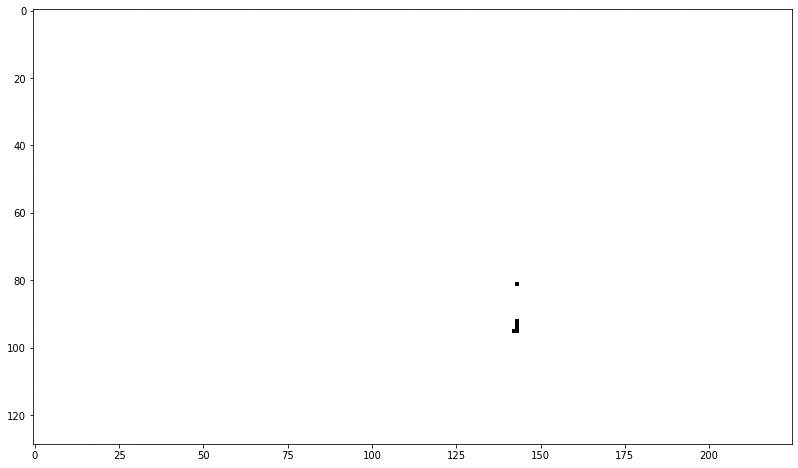

normalized regions:


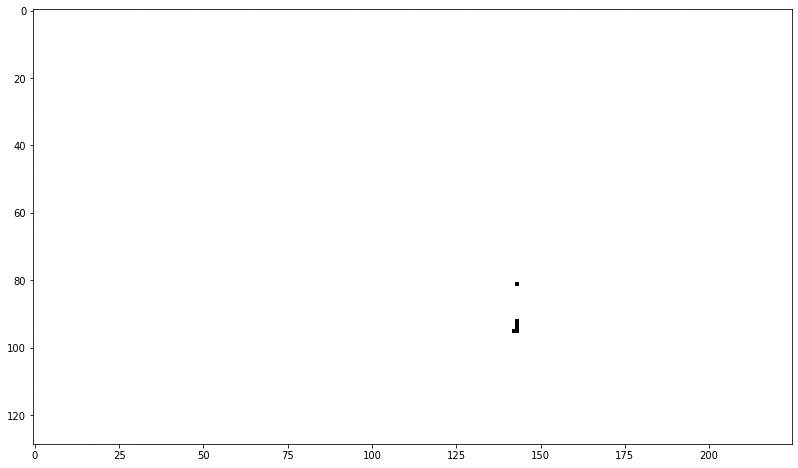

grid regions of 100 regions more=True or worst=False active for filter number: 120 :


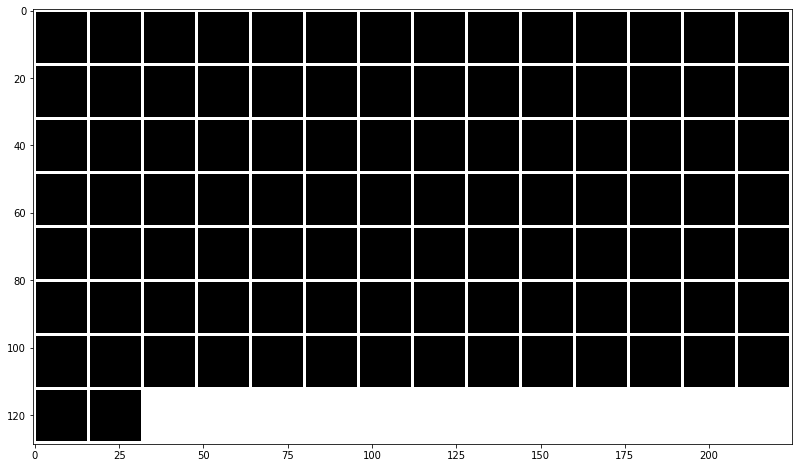

normalized regions:


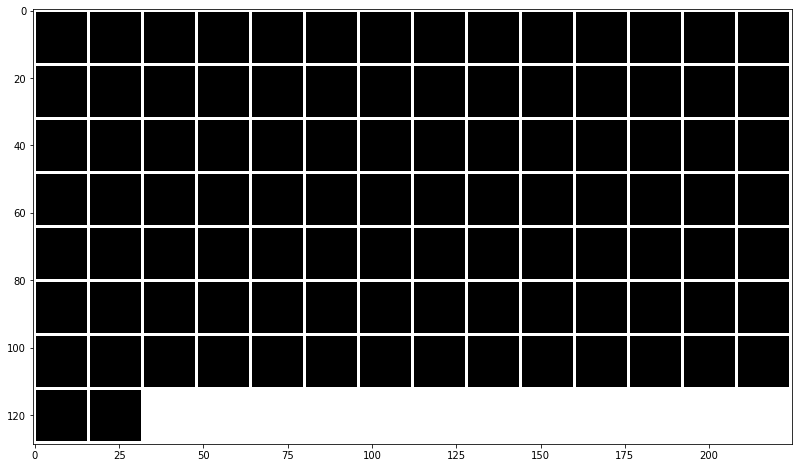

grid regions of 100 regions more=True or worst=False active for filter number: 125 :


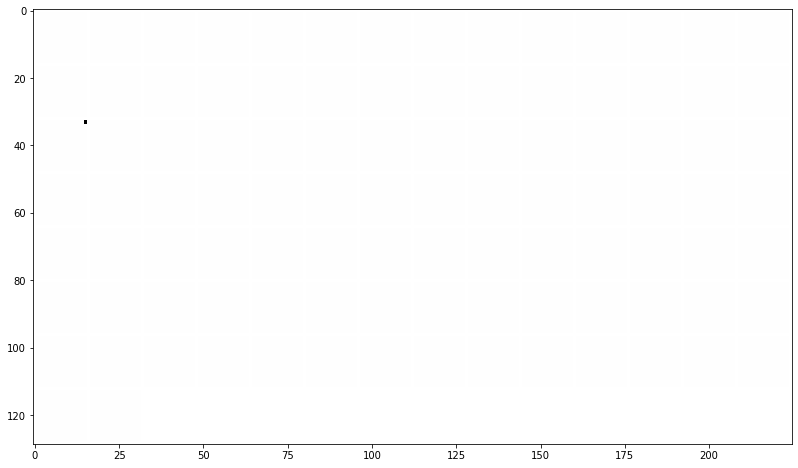

normalized regions:


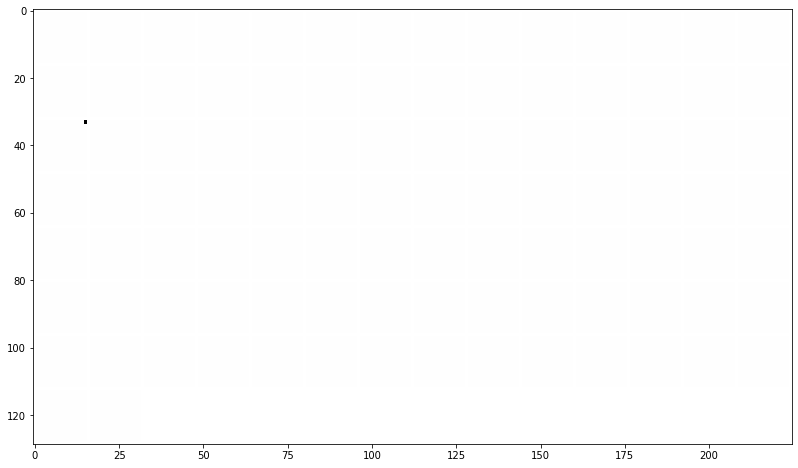

grid regions of 100 regions more=True or worst=False active for filter number: 150 :


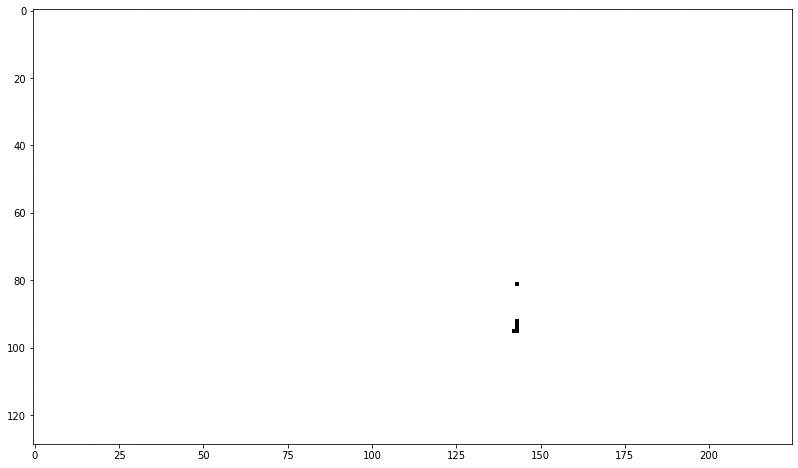

normalized regions:


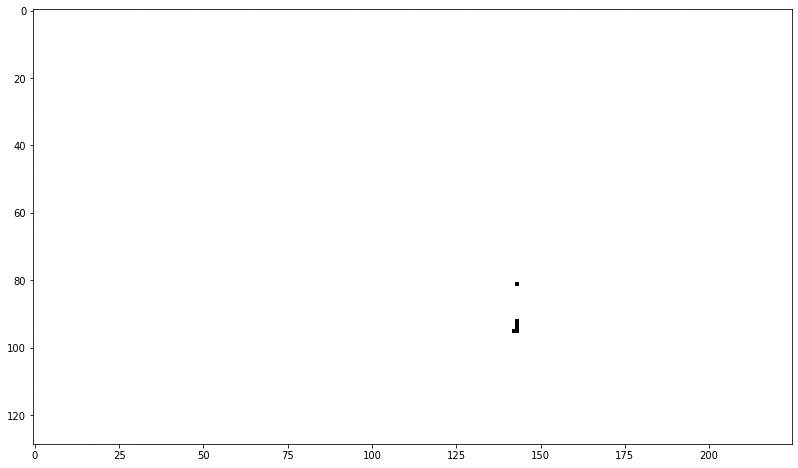

grid regions of 100 regions more=True or worst=False active for filter number: 200 :


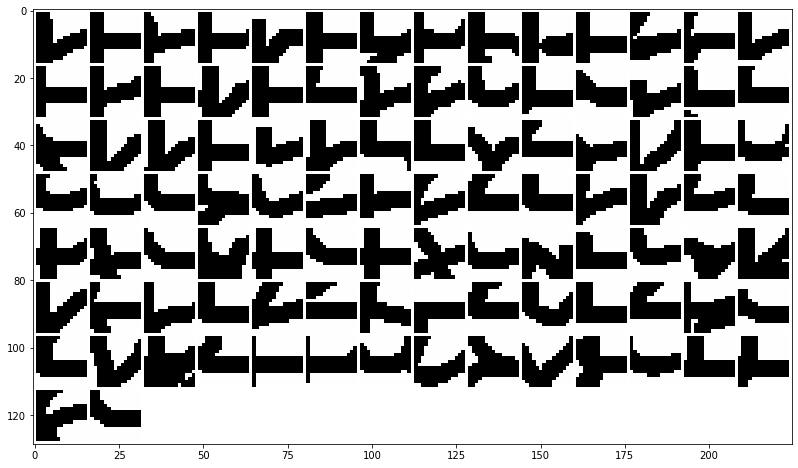

normalized regions:


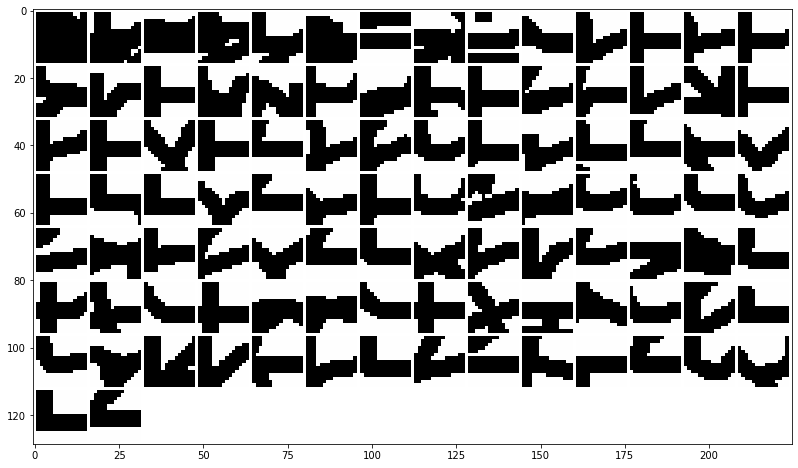

grid regions of 100 regions more=True or worst=False active for filter number: 250 :


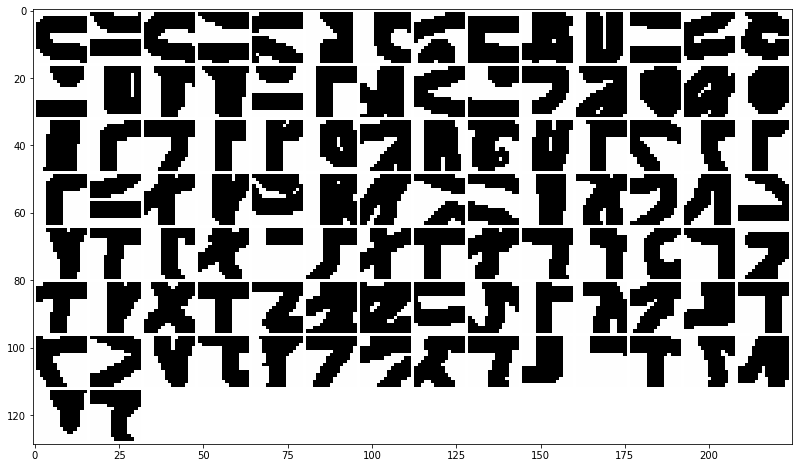

normalized regions:


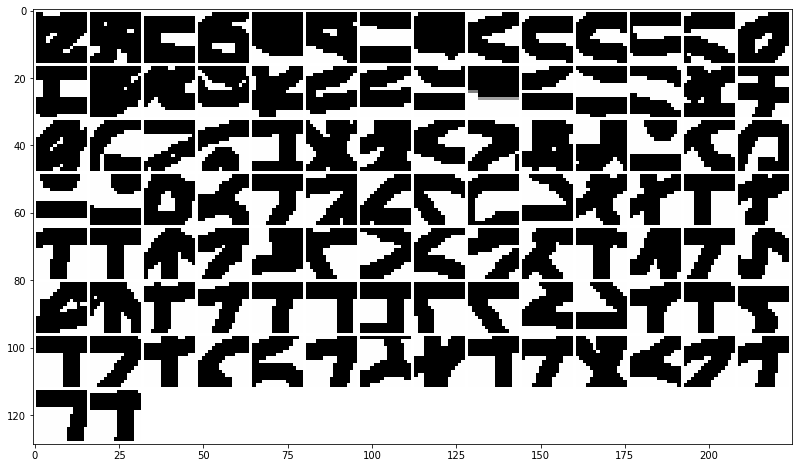

In [26]:
# regions and activation of interest
list_filter = list_filter_interest_layer3
regions = region_layer3_binary_stride
activations = activation_layer3_binary_stride
activations_normalized = activation_layer3_binary_normalized_stride

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

In [27]:
# regions and activation of interest
list_filter = list_filter_interest_layer4
regions = region_layer4_binary_stride
activations = activation_layer4_binary_stride
activations_normalized = activation_layer4_binary_normalized_stride

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

Output hidden; open in https://colab.research.google.com to view.

#### Binary model maxpooling:

Interest of filters: [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60]
Consider 10% image regions = 100 images
Consider 10% image regions = 100 images
mean image:
mean regions of 100 regions more=True or worst=False active for filter number: 0 :


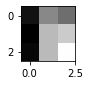

normalized region:


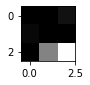

mean regions of 100 regions more=True or worst=False active for filter number: 5 :


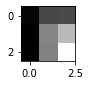

normalized region:


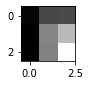

mean regions of 100 regions more=True or worst=False active for filter number: 10 :


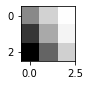

normalized region:


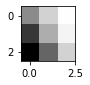

mean regions of 100 regions more=True or worst=False active for filter number: 15 :


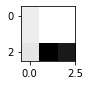

normalized region:


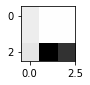

mean regions of 100 regions more=True or worst=False active for filter number: 20 :


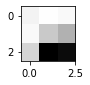

normalized region:


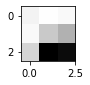

mean regions of 100 regions more=True or worst=False active for filter number: 25 :


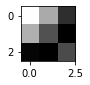

normalized region:


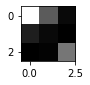

mean regions of 100 regions more=True or worst=False active for filter number: 30 :


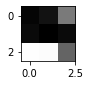

normalized region:


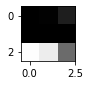

mean regions of 100 regions more=True or worst=False active for filter number: 35 :


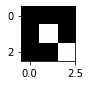

normalized region:


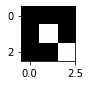

mean regions of 100 regions more=True or worst=False active for filter number: 40 :


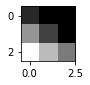

normalized region:


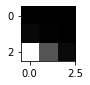

mean regions of 100 regions more=True or worst=False active for filter number: 45 :


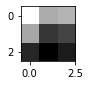

normalized region:


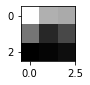

mean regions of 100 regions more=True or worst=False active for filter number: 50 :


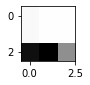

normalized region:


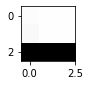

mean regions of 100 regions more=True or worst=False active for filter number: 55 :


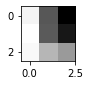

normalized region:


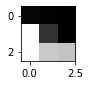

mean regions of 100 regions more=True or worst=False active for filter number: 60 :


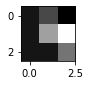

normalized region:


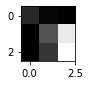

grid image
grid regions of 100 regions more=True or worst=False active for filter number: 0 :


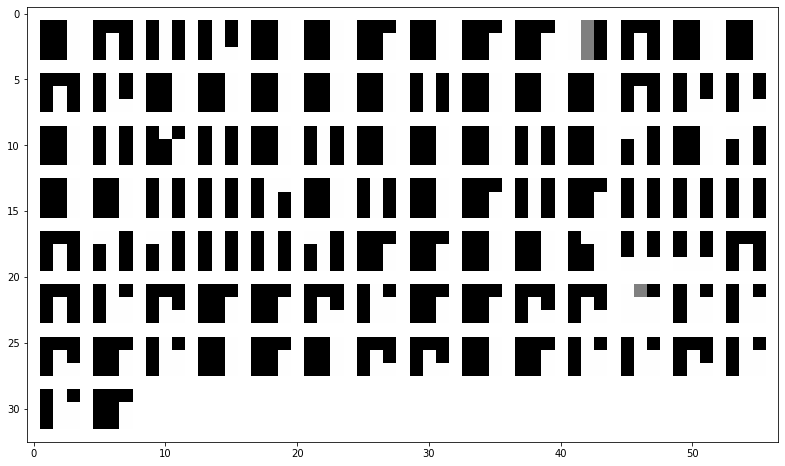

normalized regions:


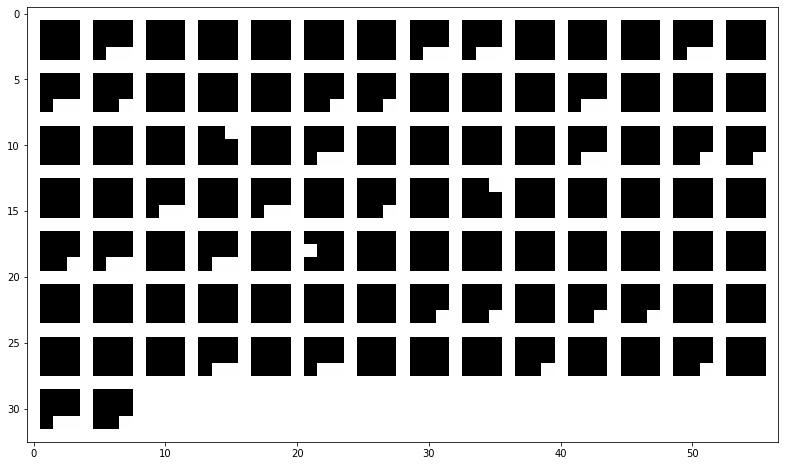

grid regions of 100 regions more=True or worst=False active for filter number: 5 :


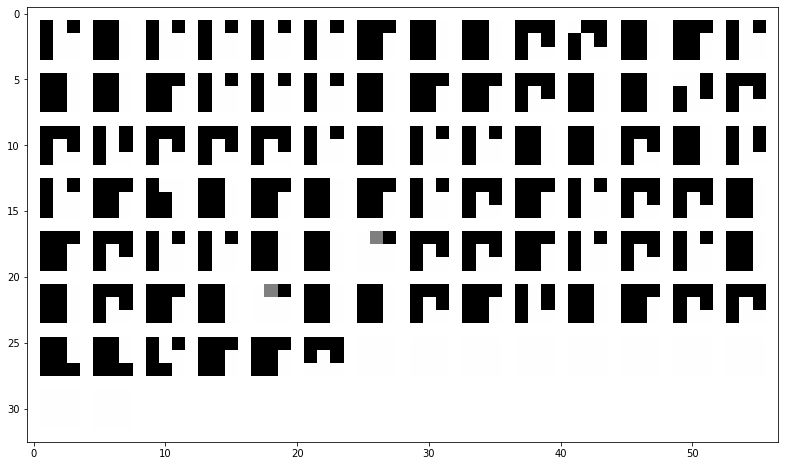

normalized regions:


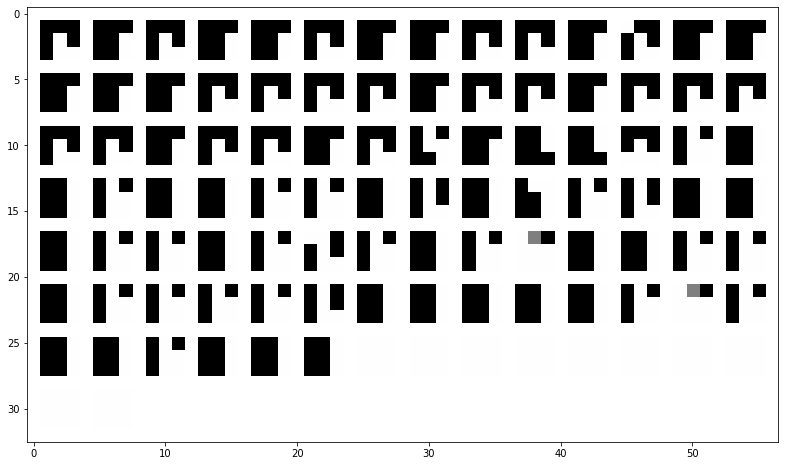

grid regions of 100 regions more=True or worst=False active for filter number: 10 :


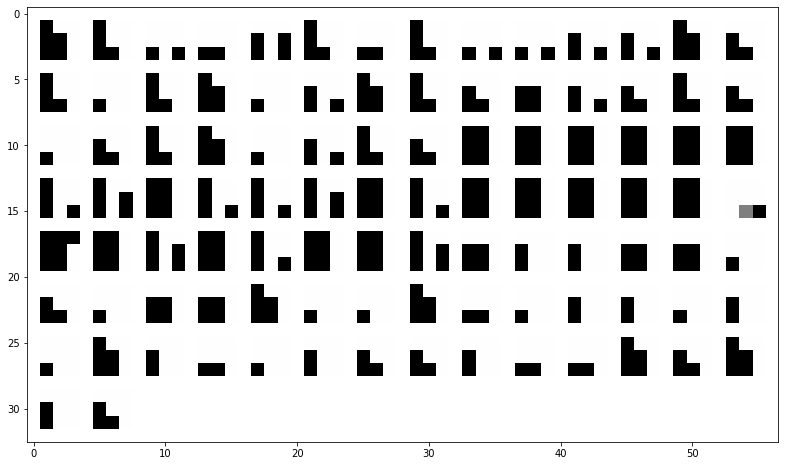

normalized regions:


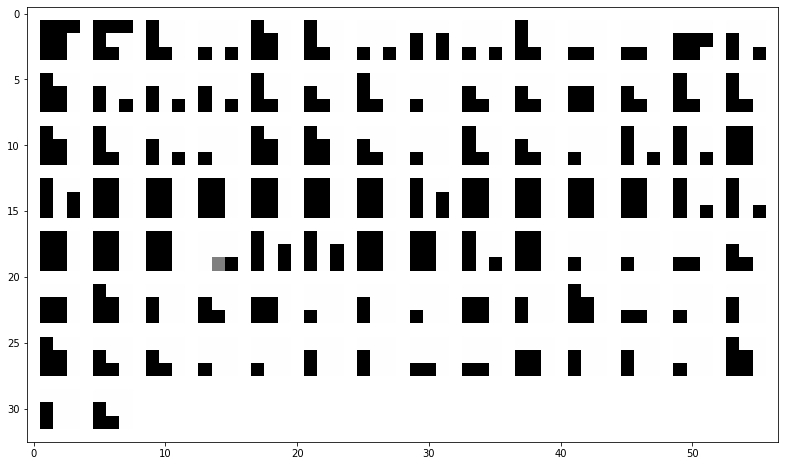

grid regions of 100 regions more=True or worst=False active for filter number: 15 :


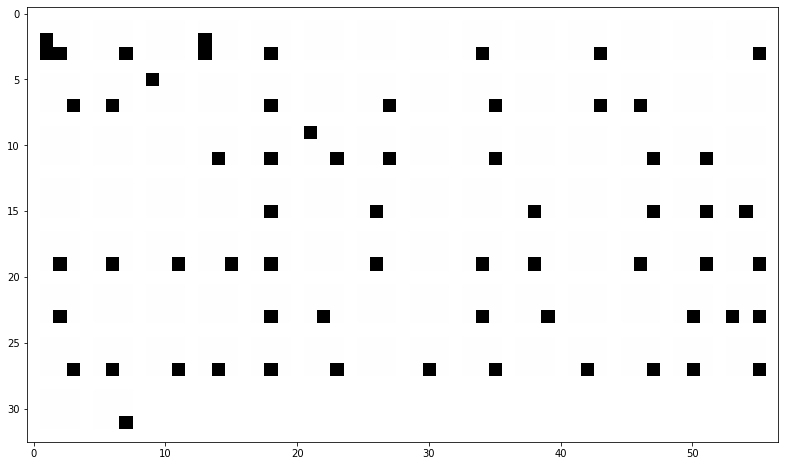

normalized regions:


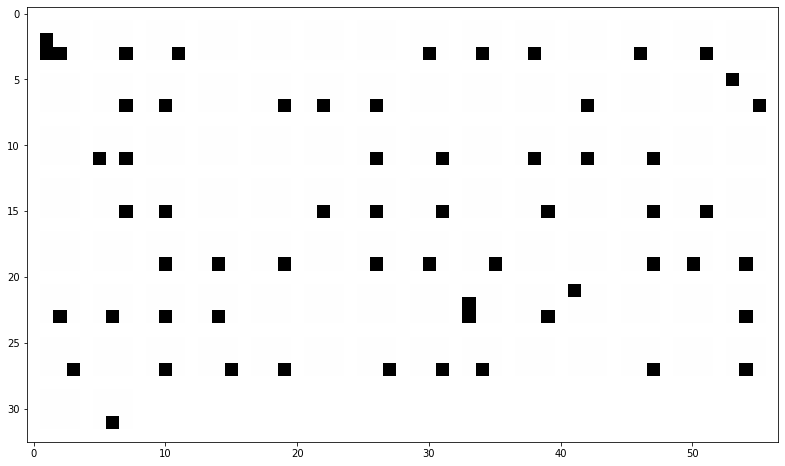

grid regions of 100 regions more=True or worst=False active for filter number: 20 :


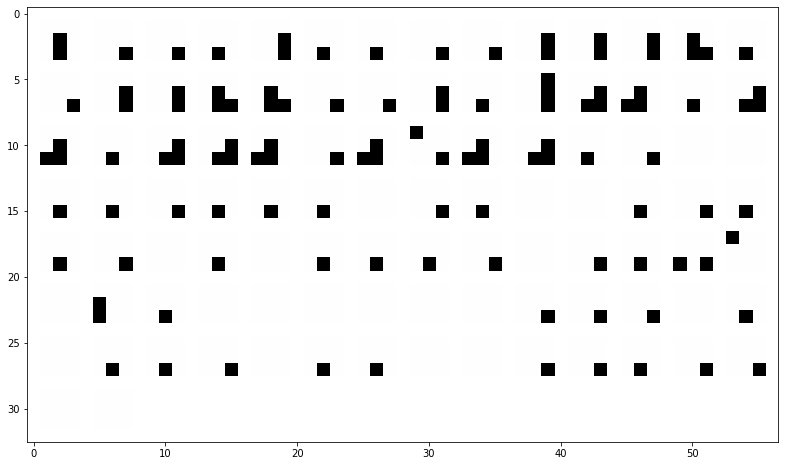

normalized regions:


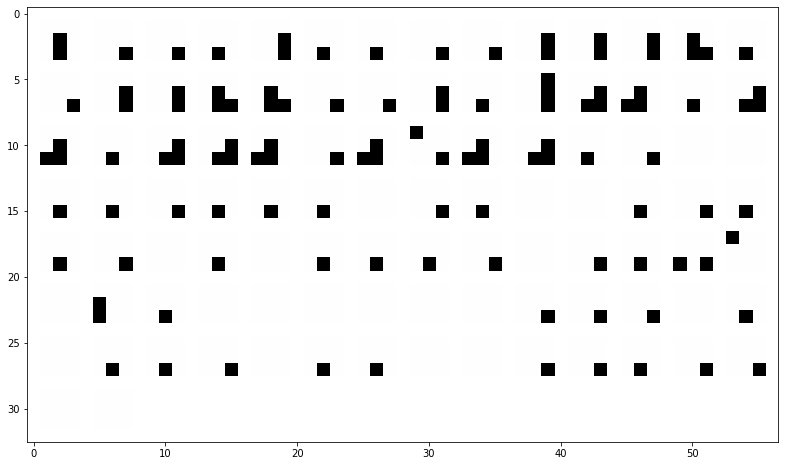

grid regions of 100 regions more=True or worst=False active for filter number: 25 :


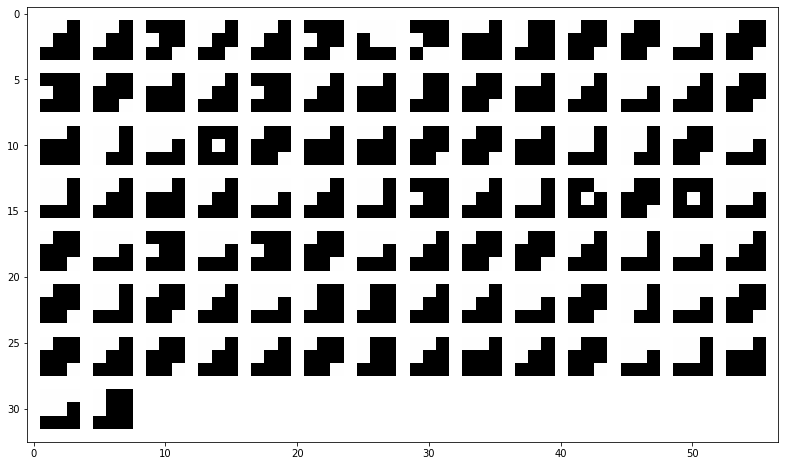

normalized regions:


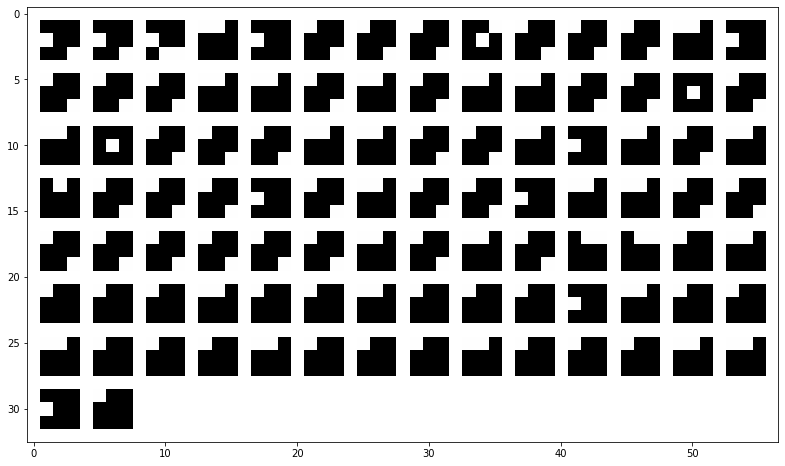

grid regions of 100 regions more=True or worst=False active for filter number: 30 :


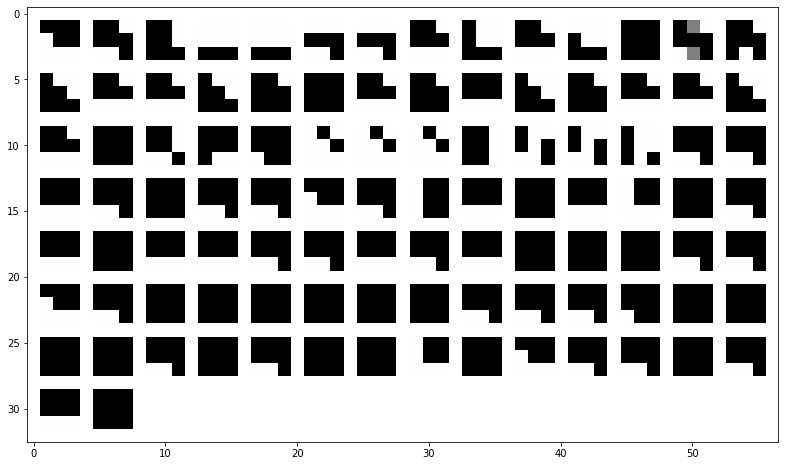

normalized regions:


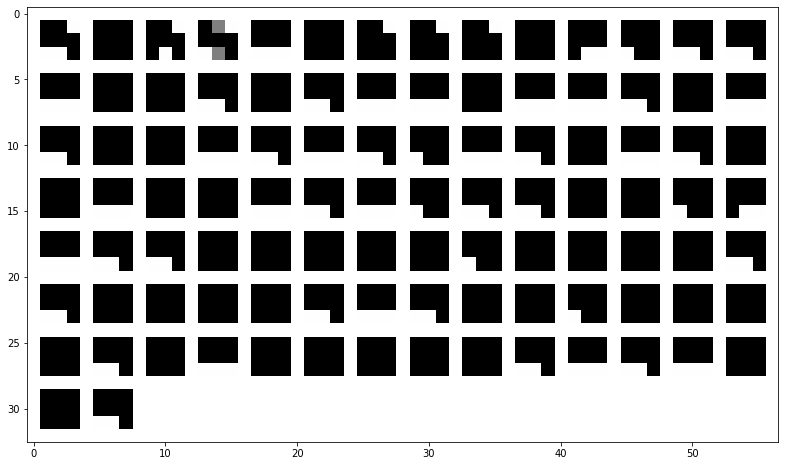

grid regions of 100 regions more=True or worst=False active for filter number: 35 :


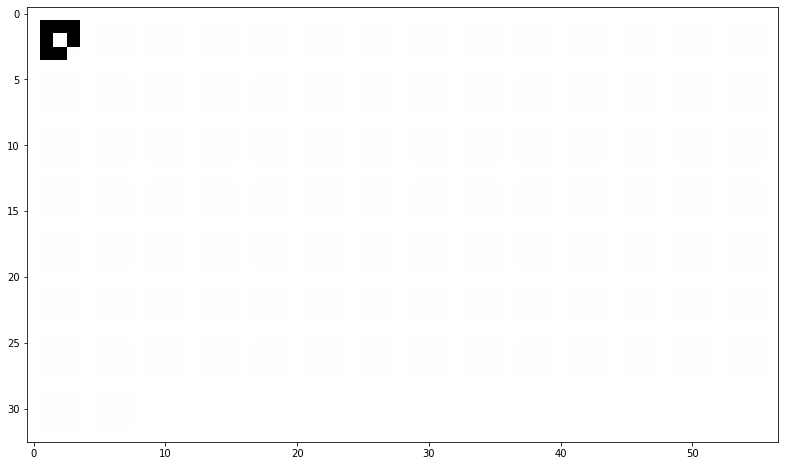

normalized regions:


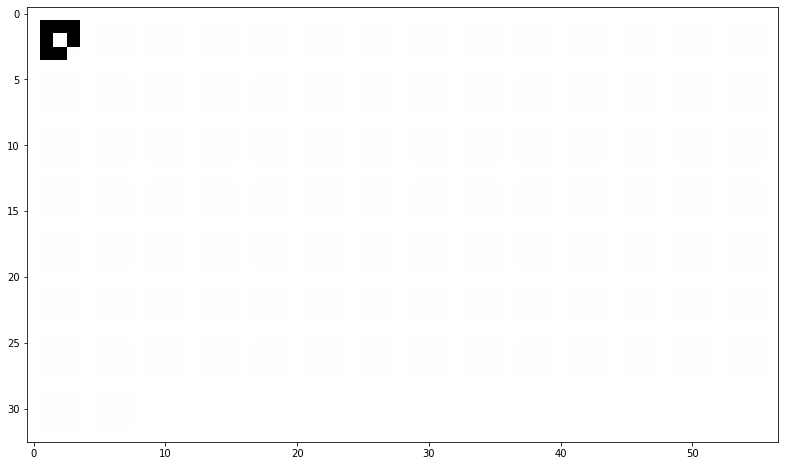

grid regions of 100 regions more=True or worst=False active for filter number: 40 :


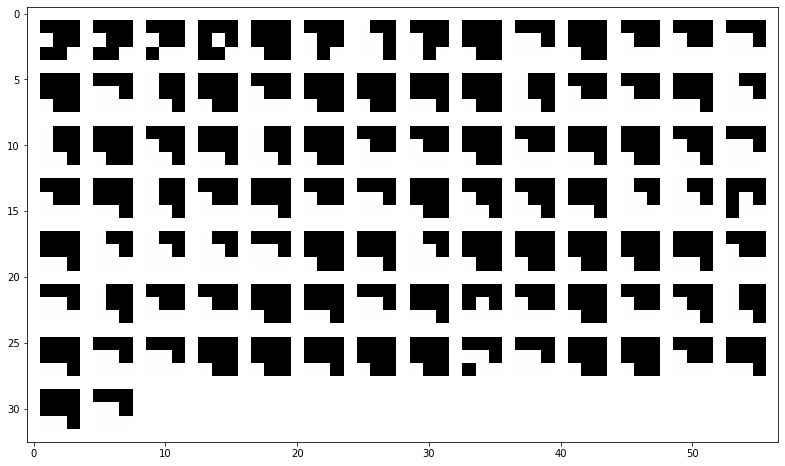

normalized regions:


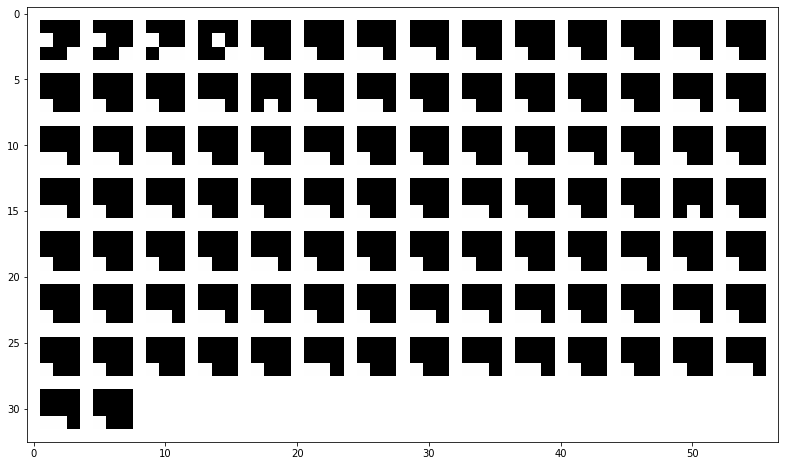

grid regions of 100 regions more=True or worst=False active for filter number: 45 :


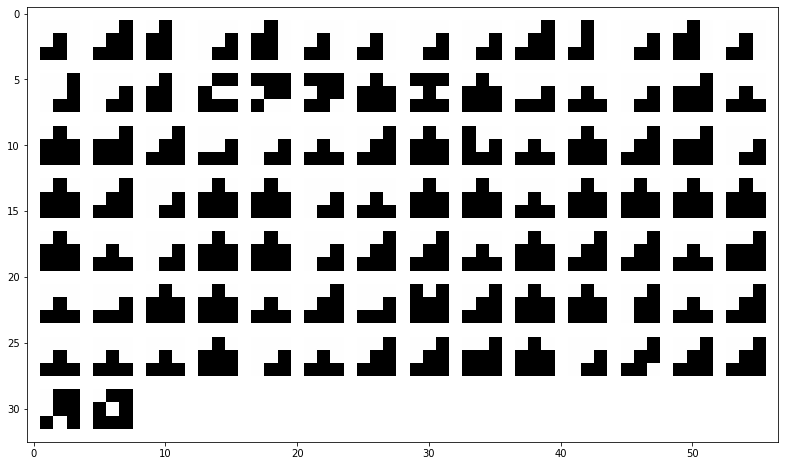

normalized regions:


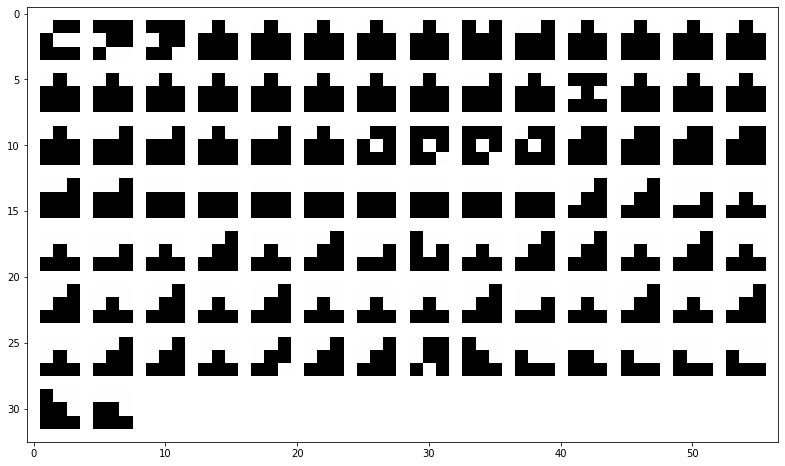

grid regions of 100 regions more=True or worst=False active for filter number: 50 :


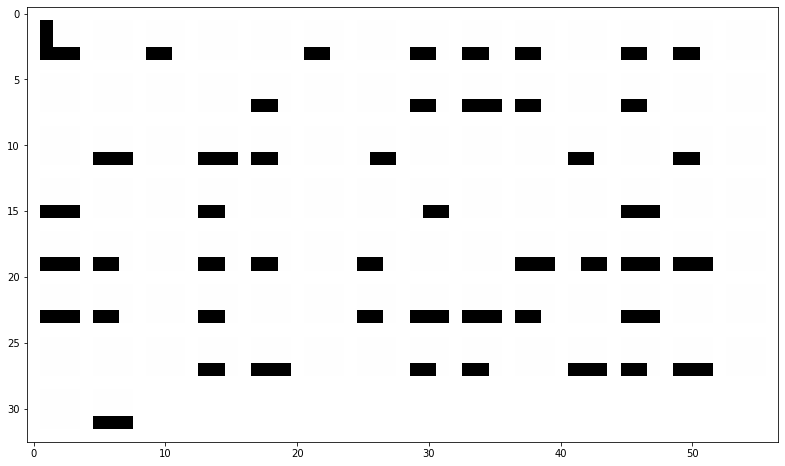

normalized regions:


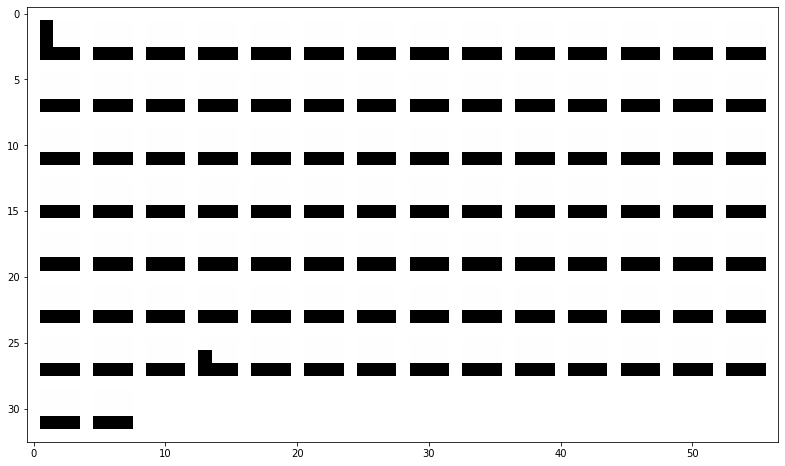

grid regions of 100 regions more=True or worst=False active for filter number: 55 :


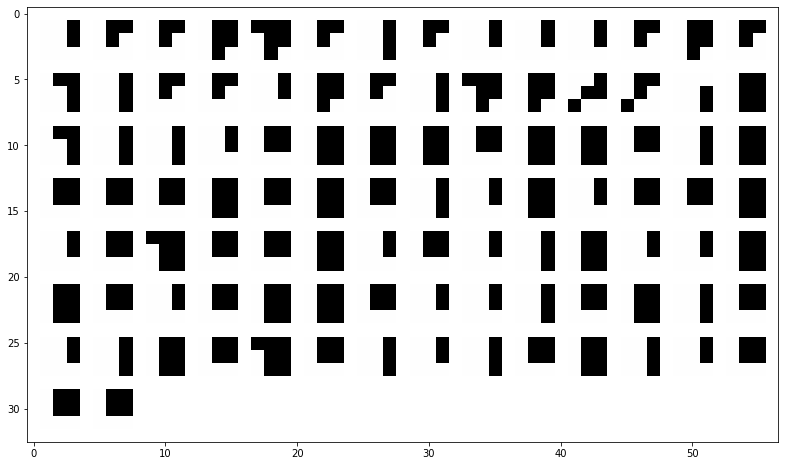

normalized regions:


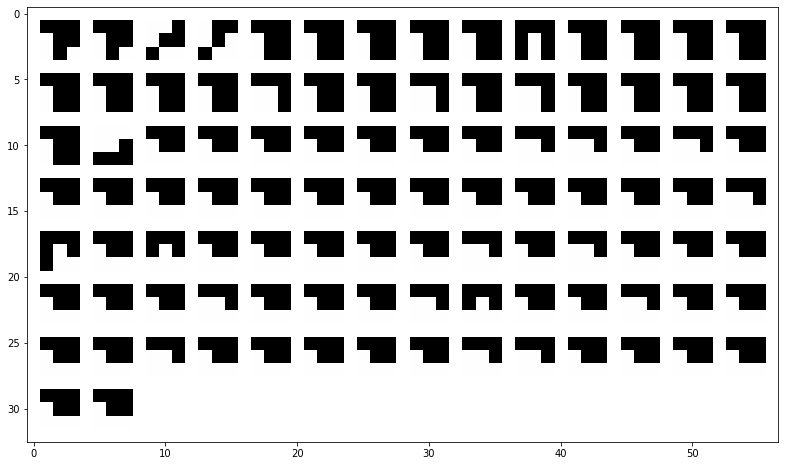

grid regions of 100 regions more=True or worst=False active for filter number: 60 :


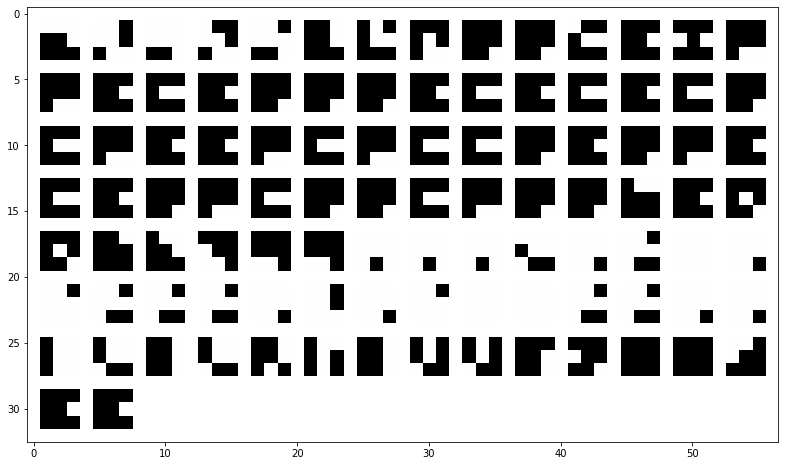

normalized regions:


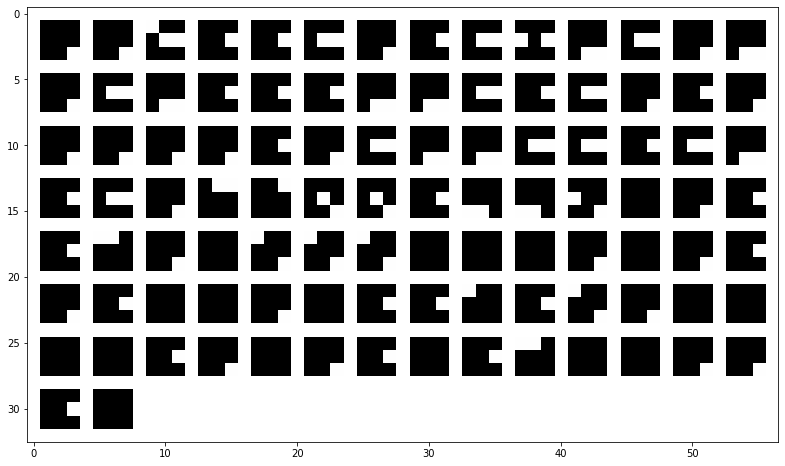

In [13]:
# regions and activation of interest
list_filter = list_filter_interest_layer1
regions = region_layer1_binary_maxpooling
activations = activation_layer1_binary_maxpooling
activations_normalized = activation_layer1_binary_normalized_maxpooling

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

Interest of filters: [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 80, 85, 90, 95, 100, 105, 110, 115, 120, 125]
Consider 10% image regions = 100 images
Consider 10% image regions = 100 images
mean image:
mean regions of 100 regions more=True or worst=False active for filter number: 0 :


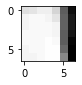

normalized region:


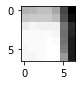

mean regions of 100 regions more=True or worst=False active for filter number: 5 :


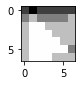

normalized region:


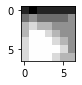

mean regions of 100 regions more=True or worst=False active for filter number: 10 :


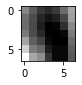

normalized region:


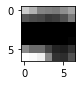

mean regions of 100 regions more=True or worst=False active for filter number: 15 :


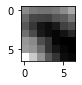

normalized region:


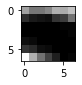

mean regions of 100 regions more=True or worst=False active for filter number: 20 :


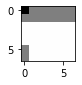

normalized region:


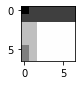

mean regions of 100 regions more=True or worst=False active for filter number: 25 :


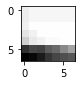

normalized region:


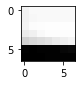

mean regions of 100 regions more=True or worst=False active for filter number: 30 :


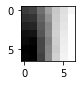

normalized region:


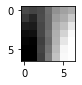

mean regions of 100 regions more=True or worst=False active for filter number: 35 :


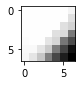

normalized region:


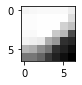

mean regions of 100 regions more=True or worst=False active for filter number: 40 :


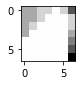

normalized region:


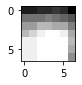

mean regions of 100 regions more=True or worst=False active for filter number: 45 :


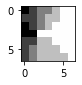

normalized region:


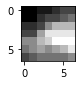

mean regions of 100 regions more=True or worst=False active for filter number: 50 :


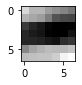

normalized region:


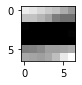

mean regions of 100 regions more=True or worst=False active for filter number: 55 :


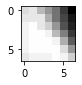

normalized region:


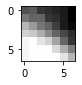

mean regions of 100 regions more=True or worst=False active for filter number: 60 :


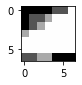

normalized region:


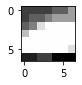

mean regions of 100 regions more=True or worst=False active for filter number: 65 :


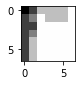

normalized region:


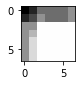

mean regions of 100 regions more=True or worst=False active for filter number: 70 :


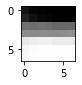

normalized region:


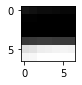

mean regions of 100 regions more=True or worst=False active for filter number: 80 :


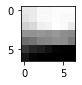

normalized region:


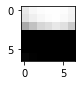

mean regions of 100 regions more=True or worst=False active for filter number: 85 :


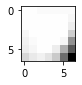

normalized region:


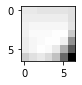

mean regions of 100 regions more=True or worst=False active for filter number: 90 :


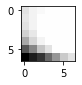

normalized region:


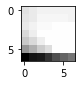

mean regions of 100 regions more=True or worst=False active for filter number: 95 :


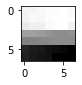

normalized region:


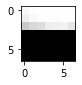

mean regions of 100 regions more=True or worst=False active for filter number: 100 :


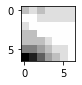

normalized region:


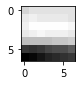

mean regions of 100 regions more=True or worst=False active for filter number: 105 :


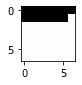

normalized region:


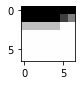

mean regions of 100 regions more=True or worst=False active for filter number: 110 :


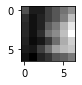

normalized region:


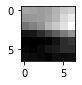

mean regions of 100 regions more=True or worst=False active for filter number: 115 :


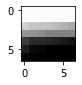

normalized region:


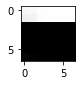

mean regions of 100 regions more=True or worst=False active for filter number: 120 :


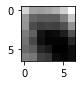

normalized region:


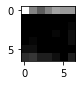

mean regions of 100 regions more=True or worst=False active for filter number: 125 :


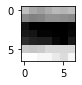

normalized region:


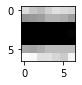

grid image
grid regions of 100 regions more=True or worst=False active for filter number: 0 :


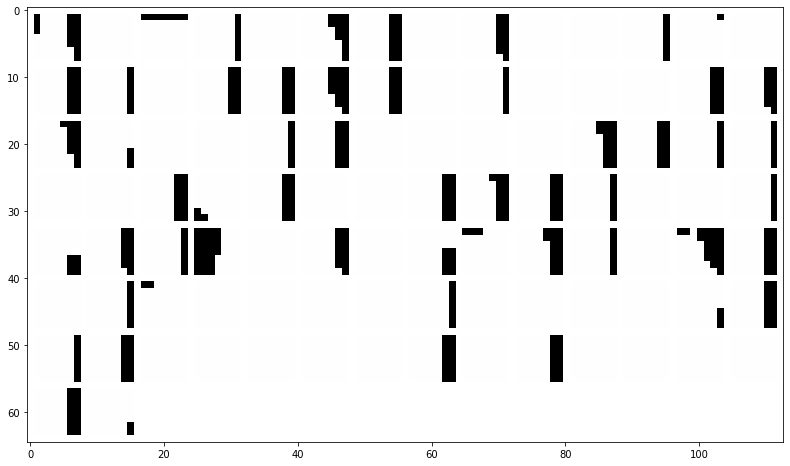

normalized regions:


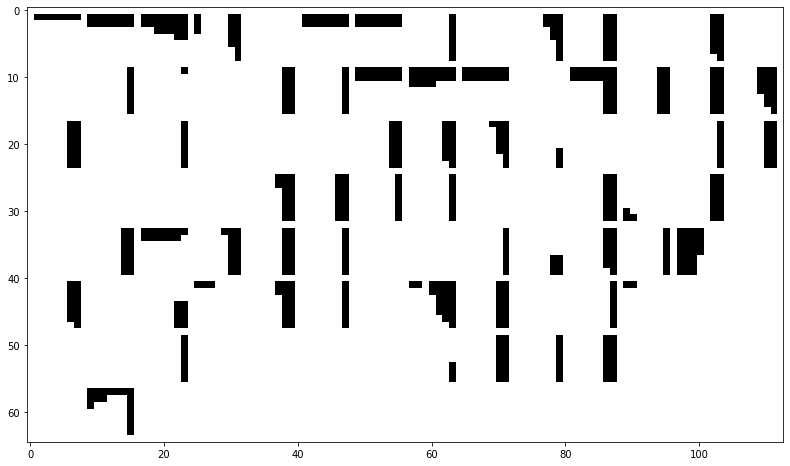

grid regions of 100 regions more=True or worst=False active for filter number: 5 :


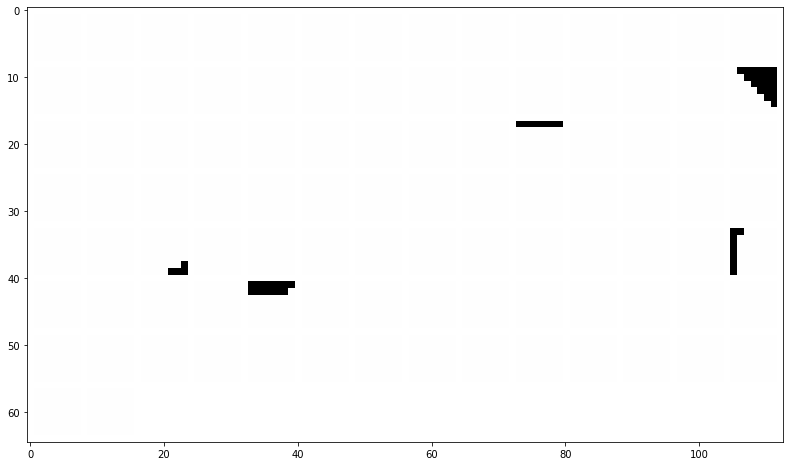

normalized regions:


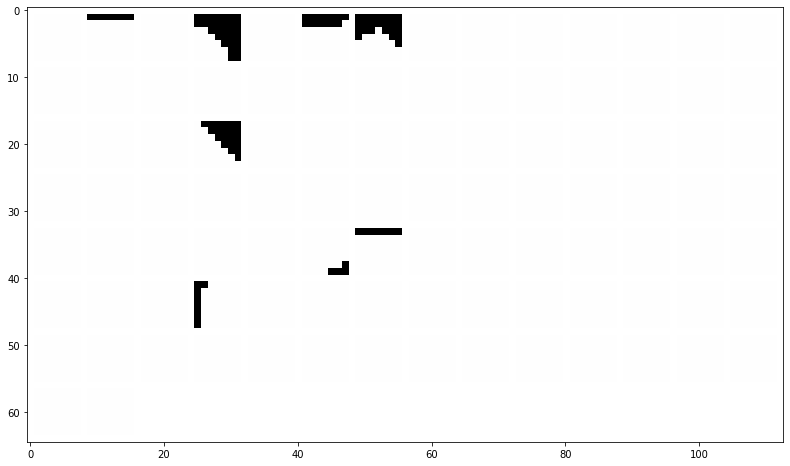

grid regions of 100 regions more=True or worst=False active for filter number: 10 :


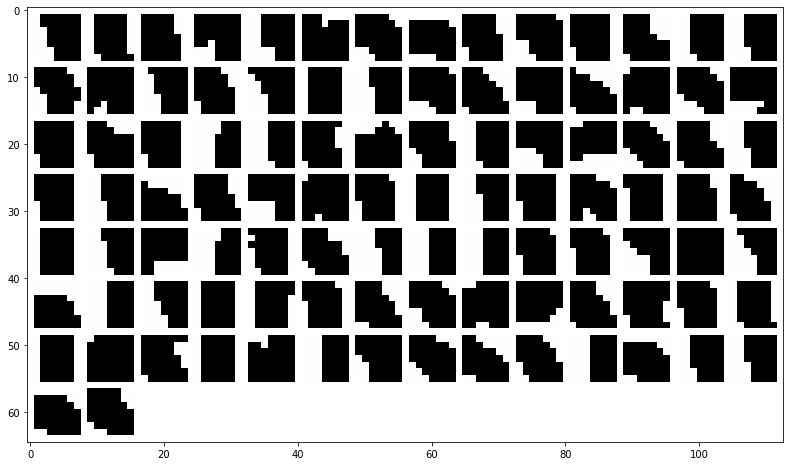

normalized regions:


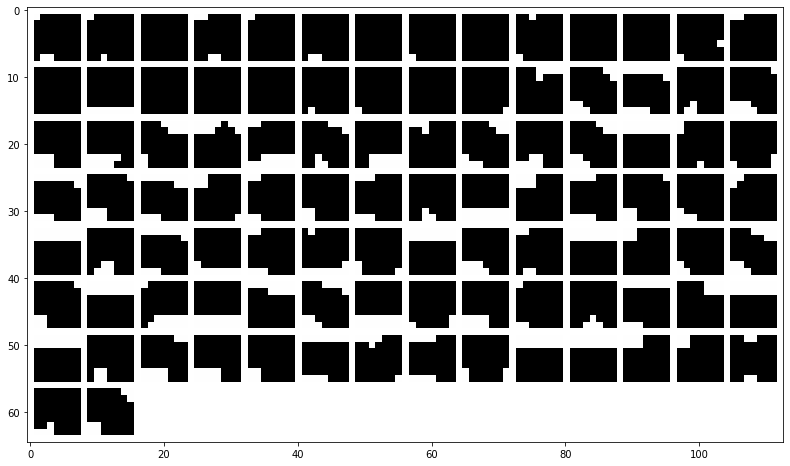

grid regions of 100 regions more=True or worst=False active for filter number: 15 :


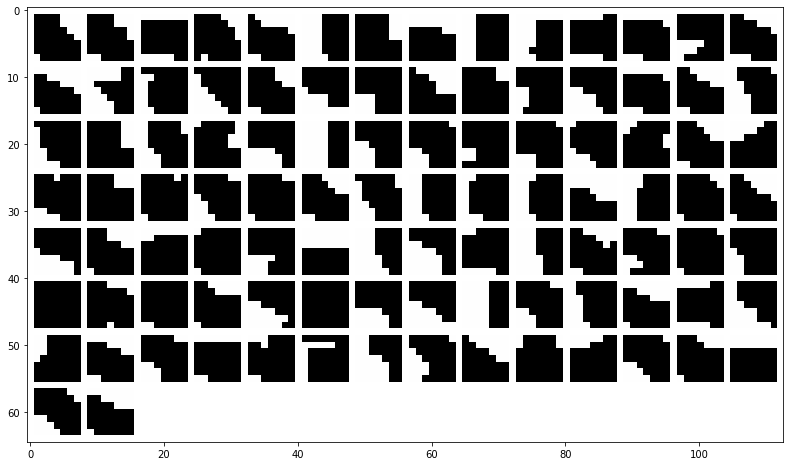

normalized regions:


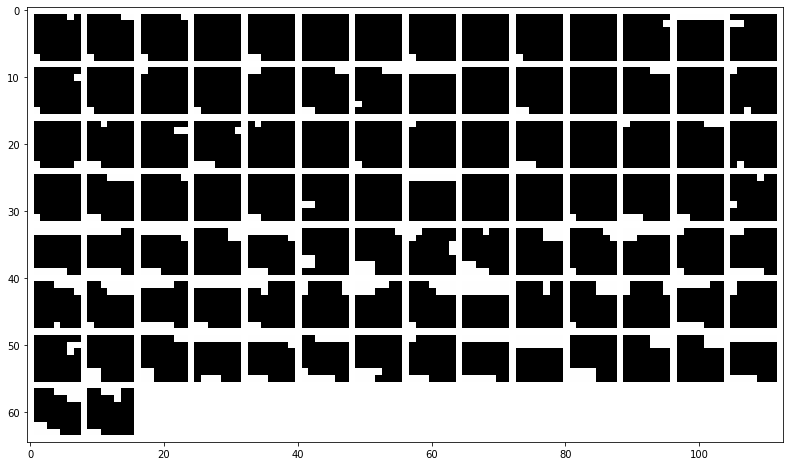

grid regions of 100 regions more=True or worst=False active for filter number: 20 :


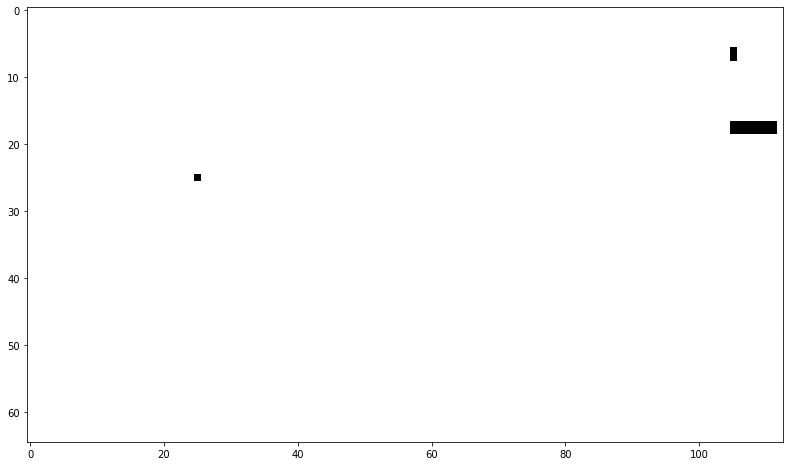

normalized regions:


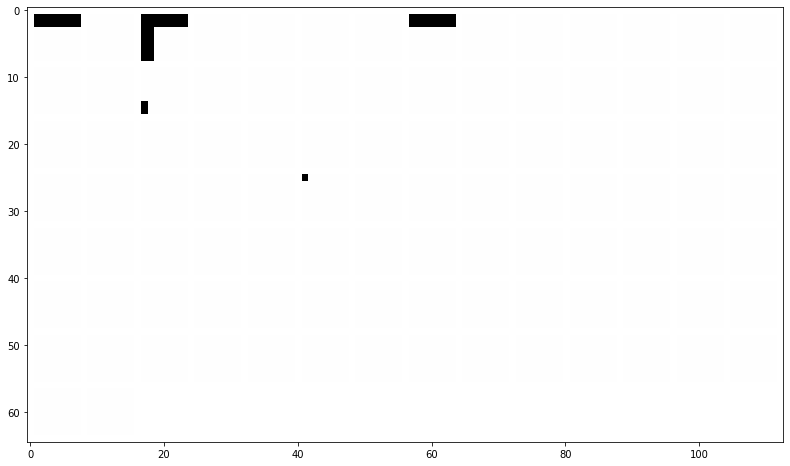

grid regions of 100 regions more=True or worst=False active for filter number: 25 :


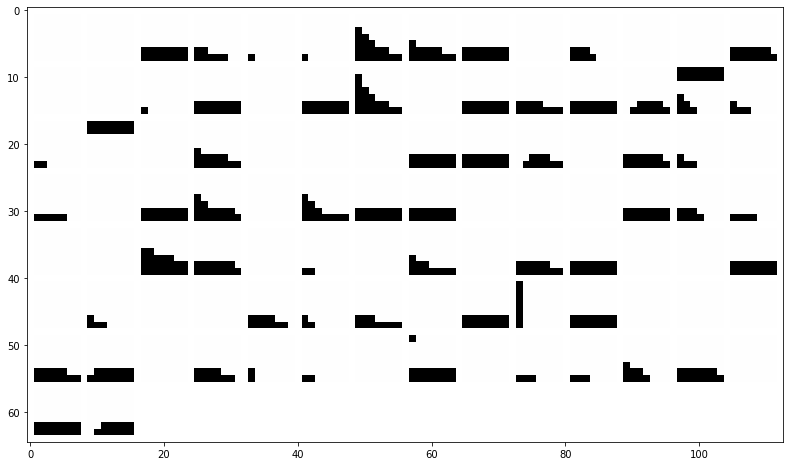

normalized regions:


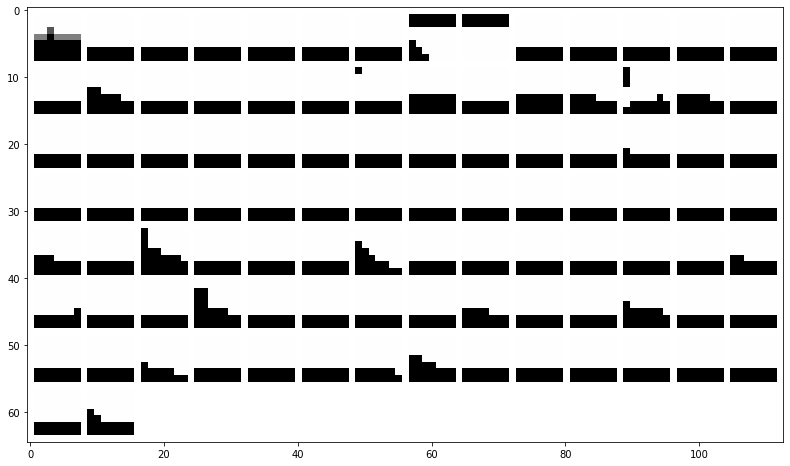

grid regions of 100 regions more=True or worst=False active for filter number: 30 :


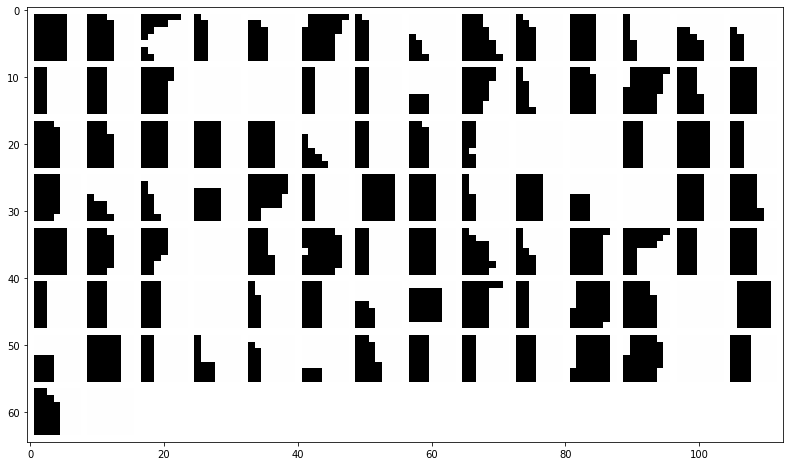

normalized regions:


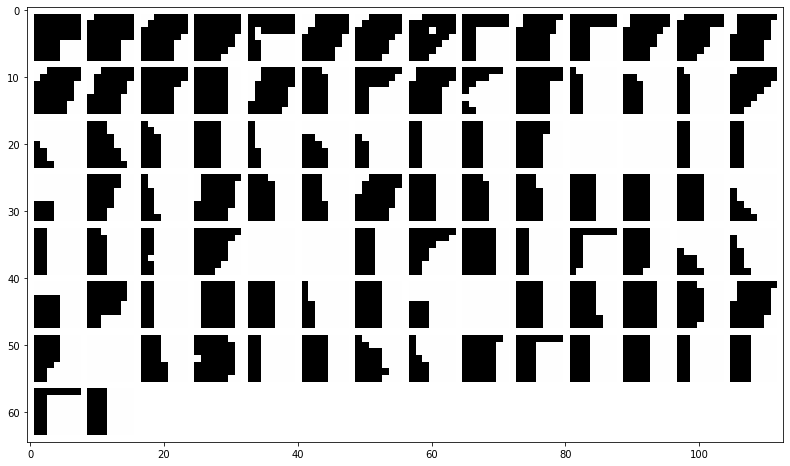

grid regions of 100 regions more=True or worst=False active for filter number: 35 :


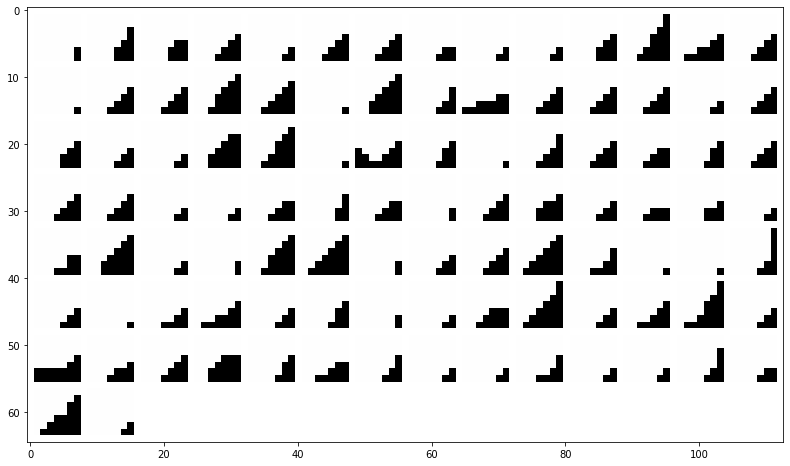

normalized regions:


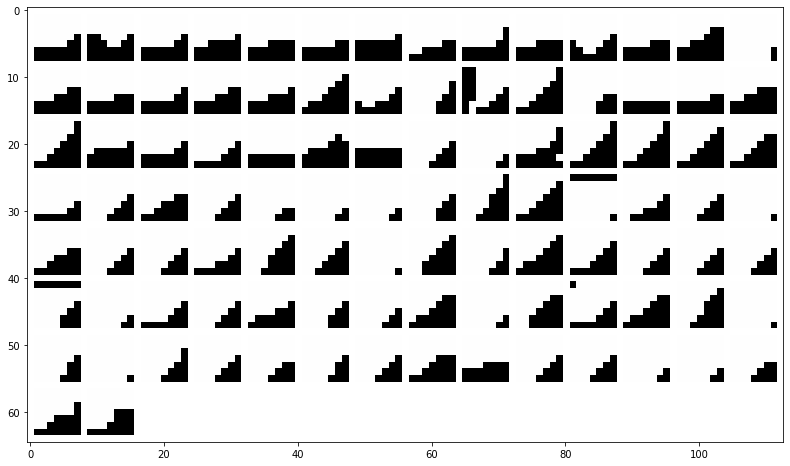

grid regions of 100 regions more=True or worst=False active for filter number: 40 :


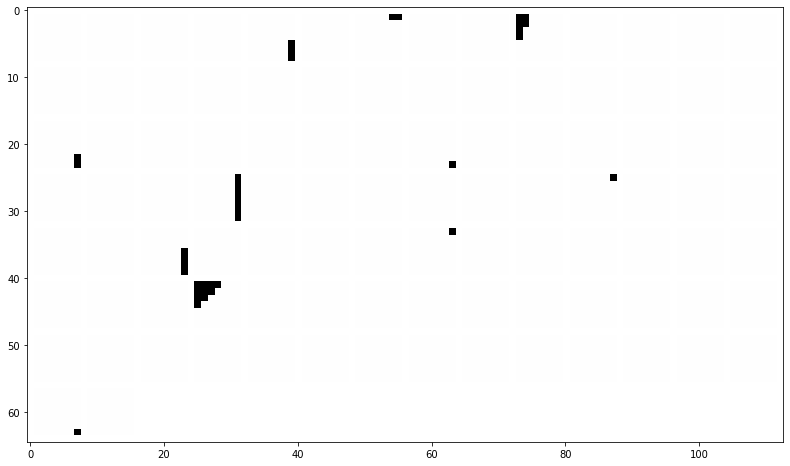

normalized regions:


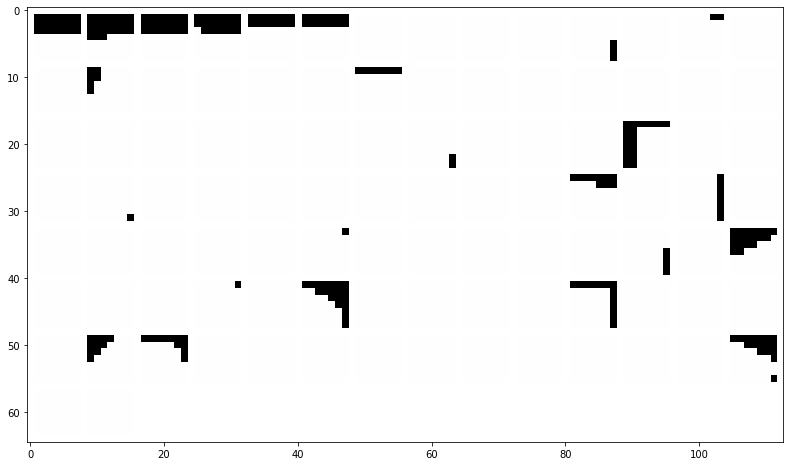

grid regions of 100 regions more=True or worst=False active for filter number: 45 :


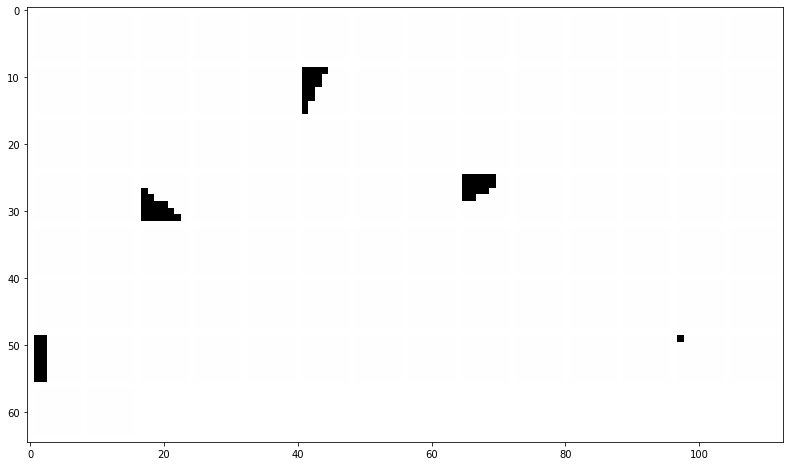

normalized regions:


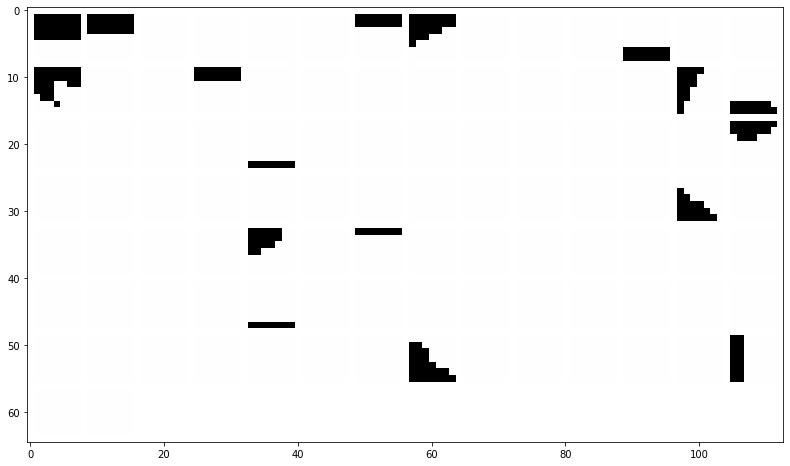

grid regions of 100 regions more=True or worst=False active for filter number: 50 :


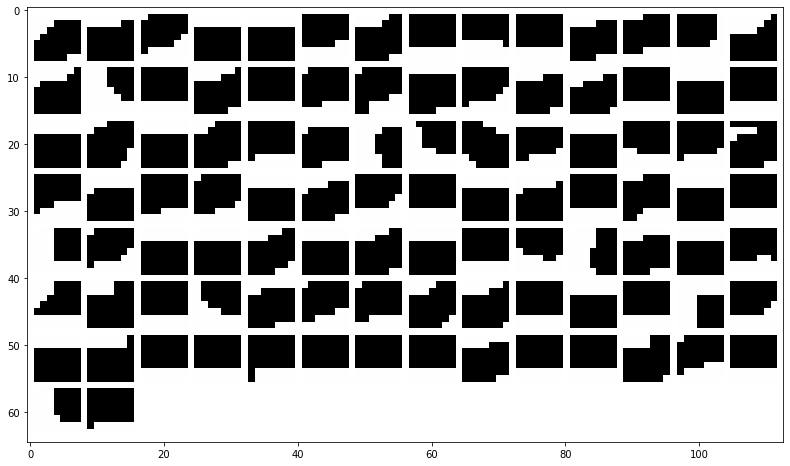

normalized regions:


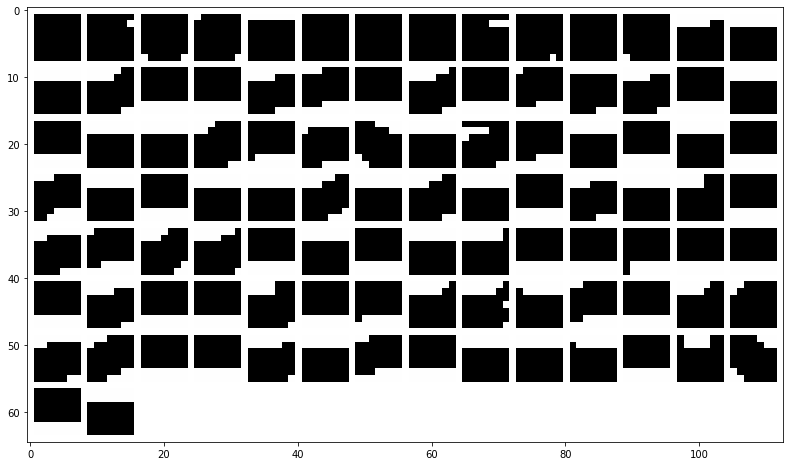

grid regions of 100 regions more=True or worst=False active for filter number: 55 :


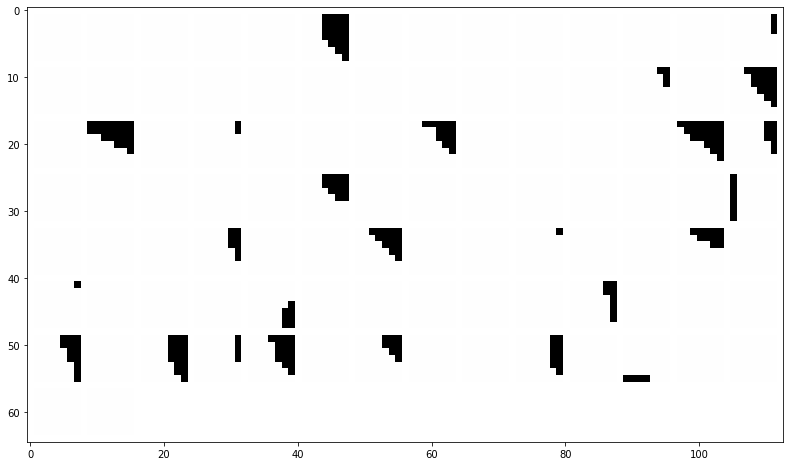

normalized regions:


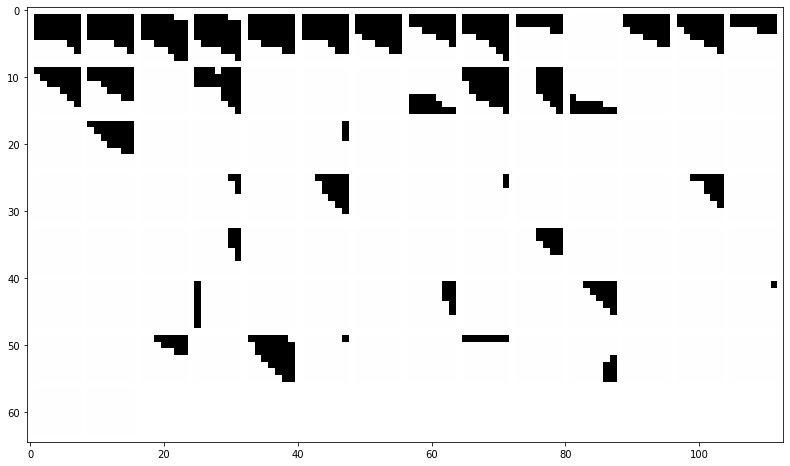

grid regions of 100 regions more=True or worst=False active for filter number: 60 :


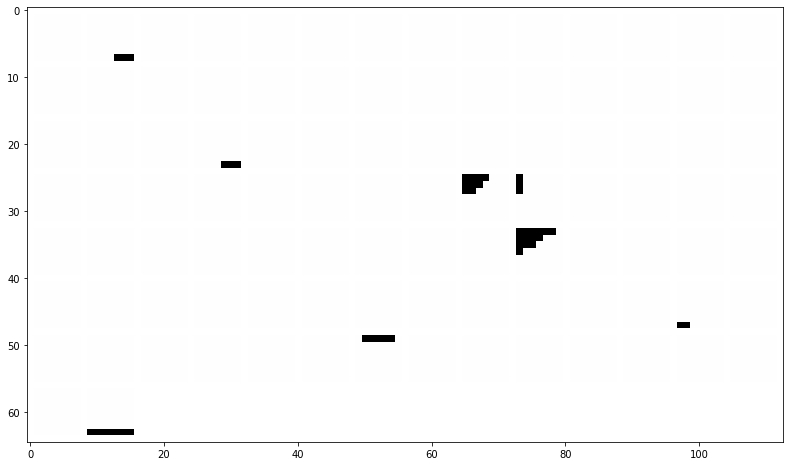

normalized regions:


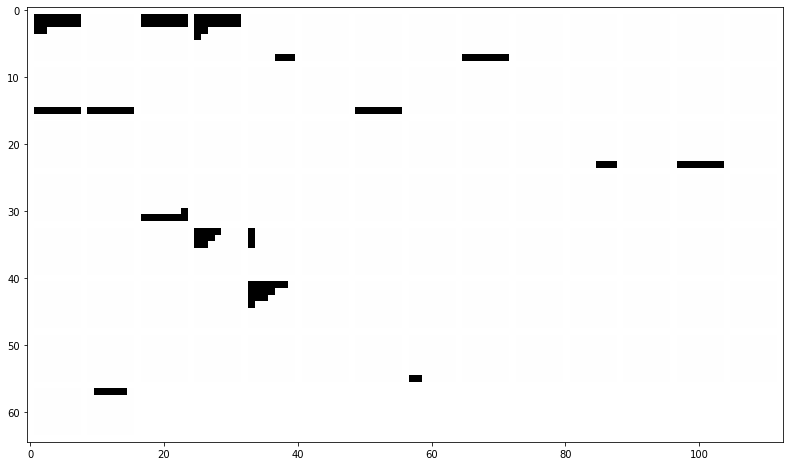

grid regions of 100 regions more=True or worst=False active for filter number: 65 :


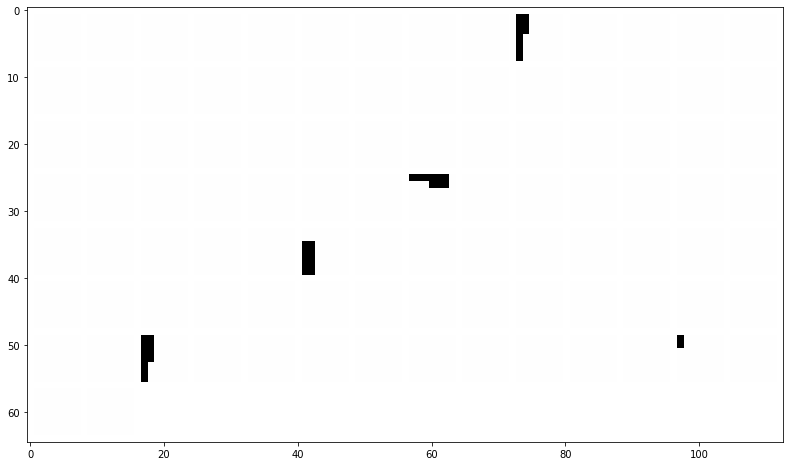

normalized regions:


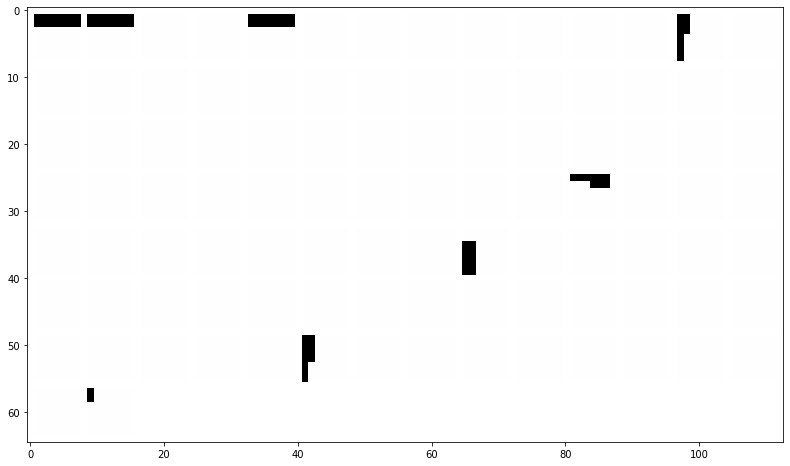

grid regions of 100 regions more=True or worst=False active for filter number: 70 :


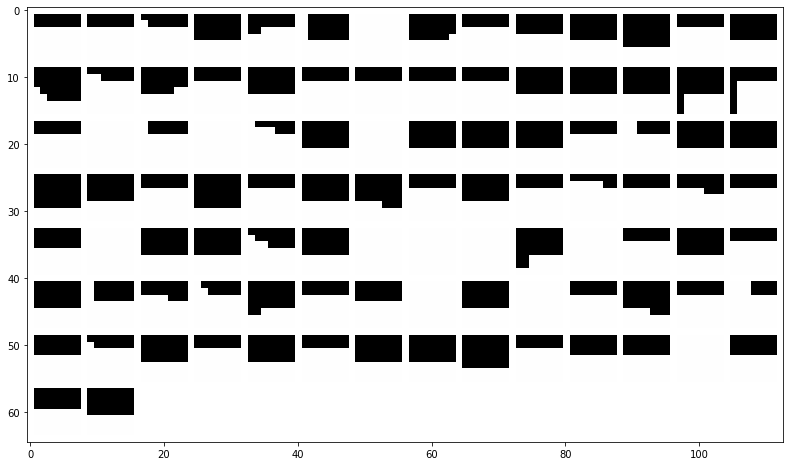

normalized regions:


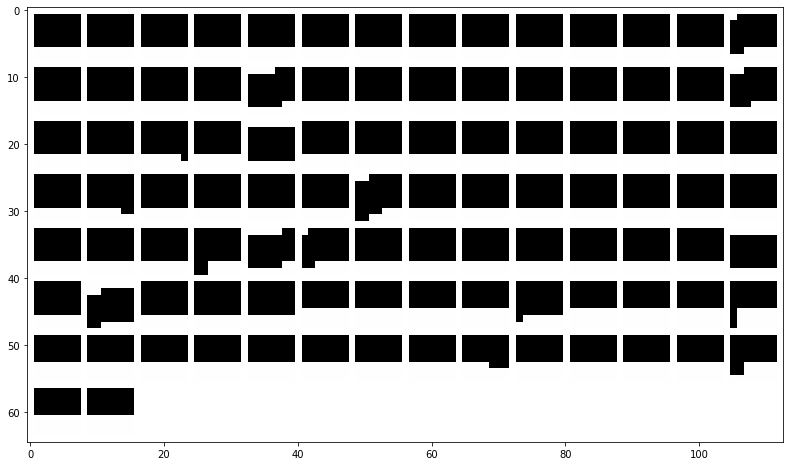

grid regions of 100 regions more=True or worst=False active for filter number: 80 :


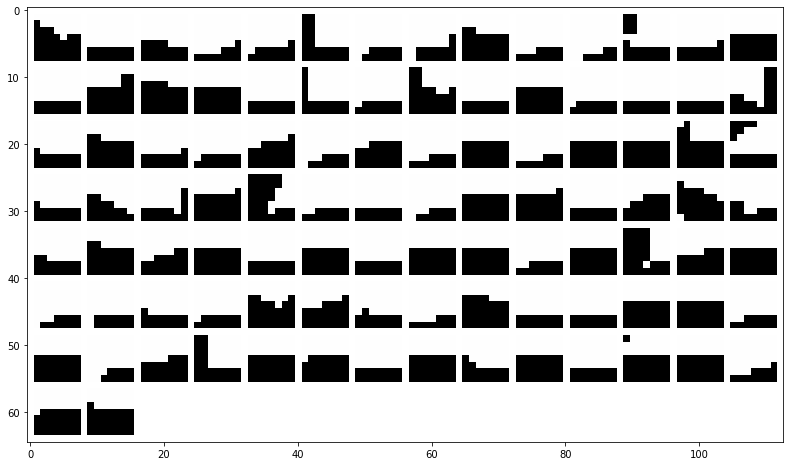

normalized regions:


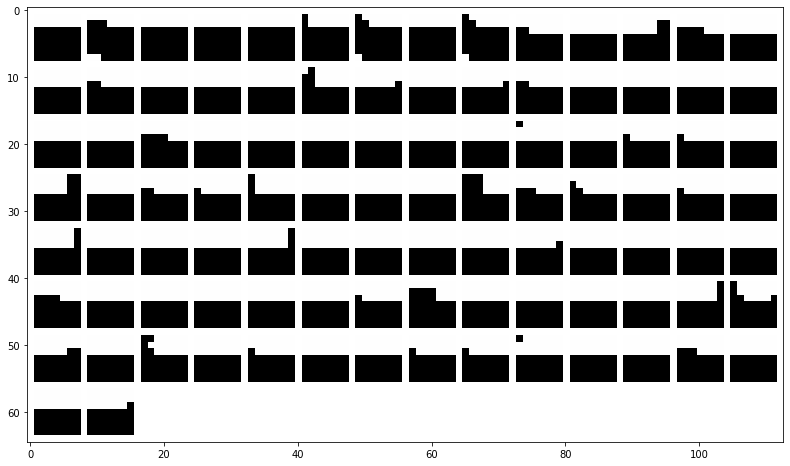

grid regions of 100 regions more=True or worst=False active for filter number: 85 :


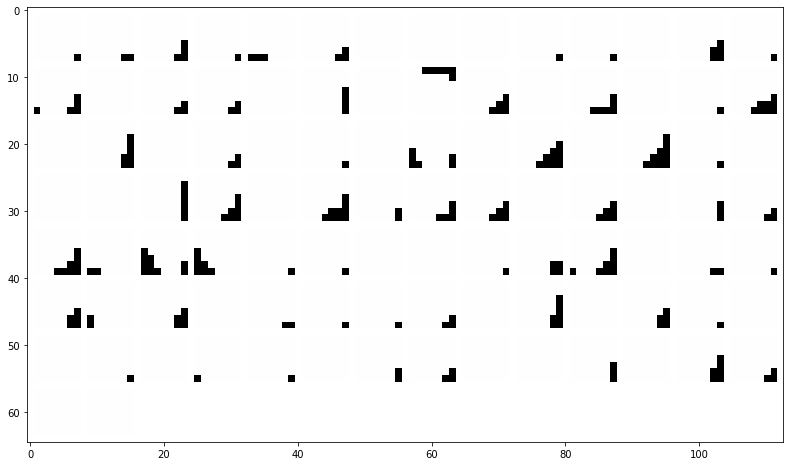

normalized regions:


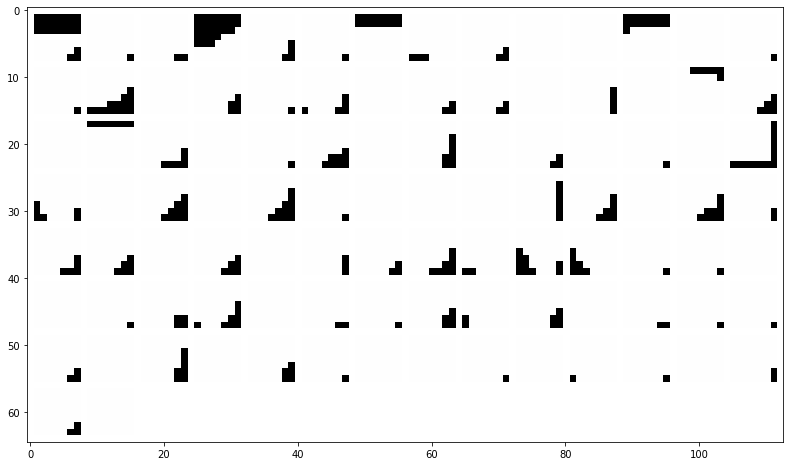

grid regions of 100 regions more=True or worst=False active for filter number: 90 :


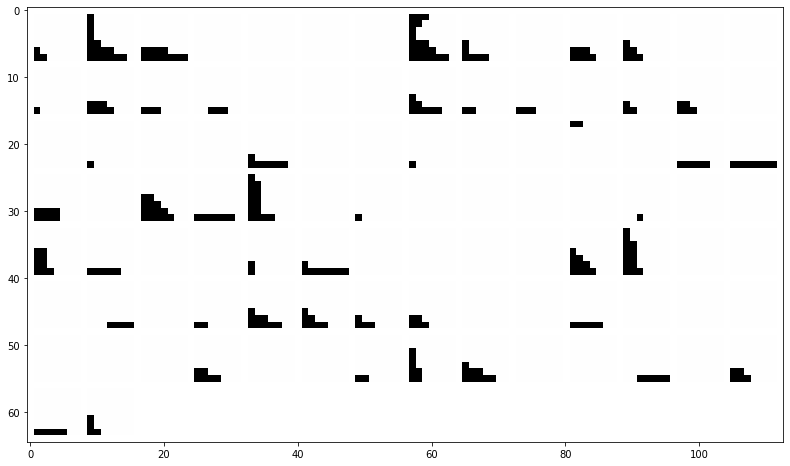

normalized regions:


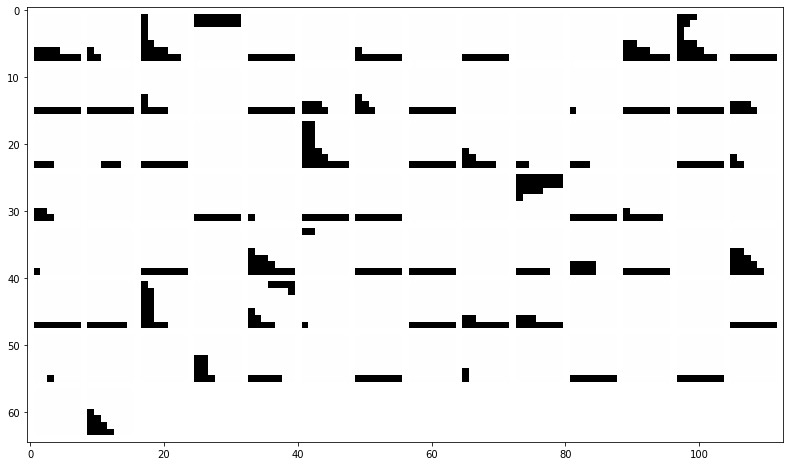

grid regions of 100 regions more=True or worst=False active for filter number: 95 :


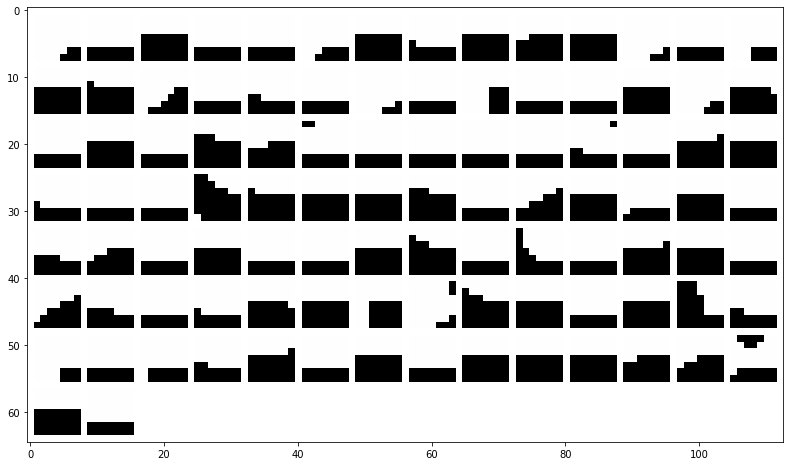

normalized regions:


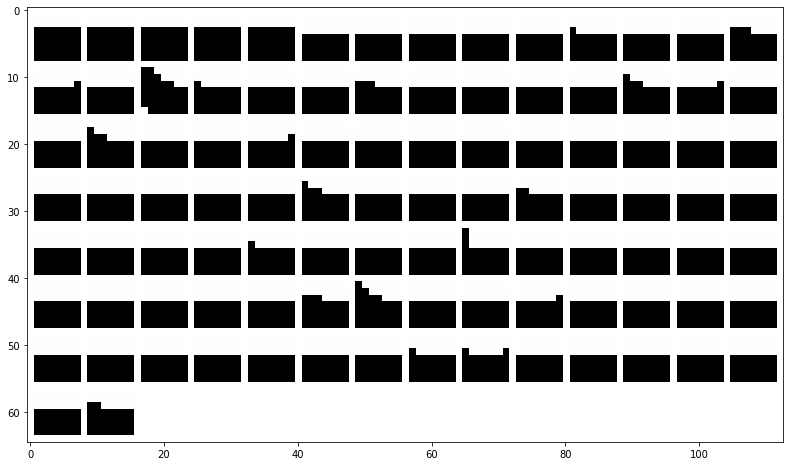

grid regions of 100 regions more=True or worst=False active for filter number: 100 :


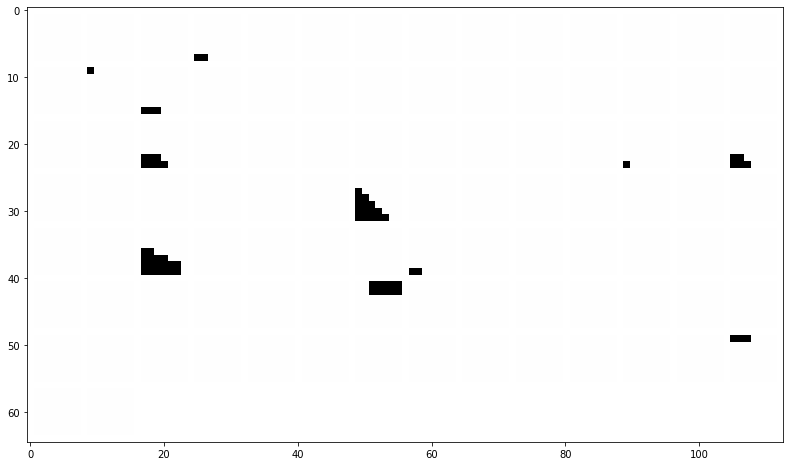

normalized regions:


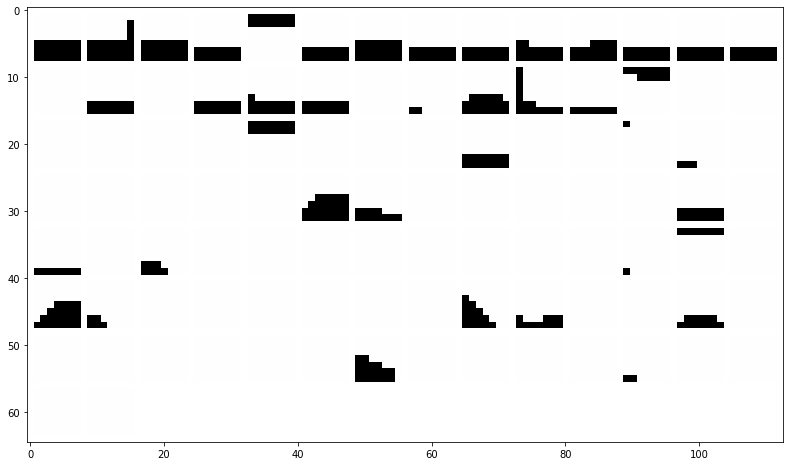

grid regions of 100 regions more=True or worst=False active for filter number: 105 :


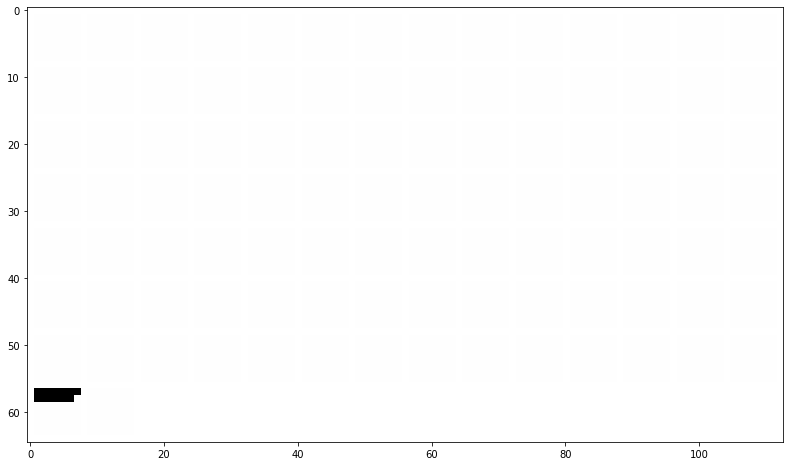

normalized regions:


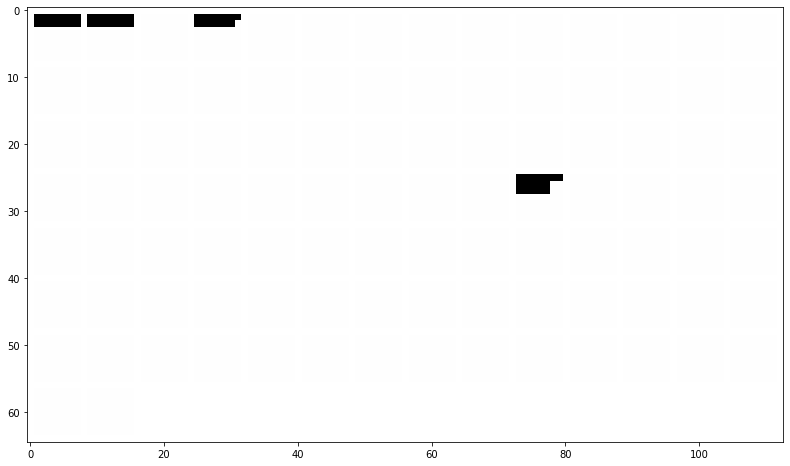

grid regions of 100 regions more=True or worst=False active for filter number: 110 :


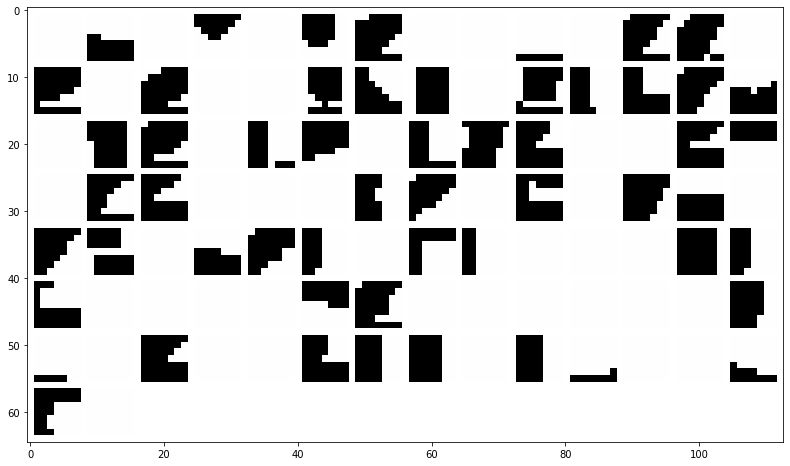

normalized regions:


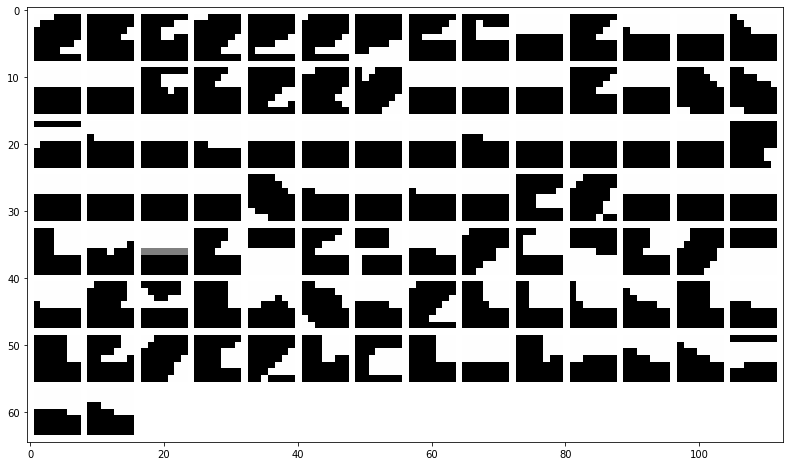

grid regions of 100 regions more=True or worst=False active for filter number: 115 :


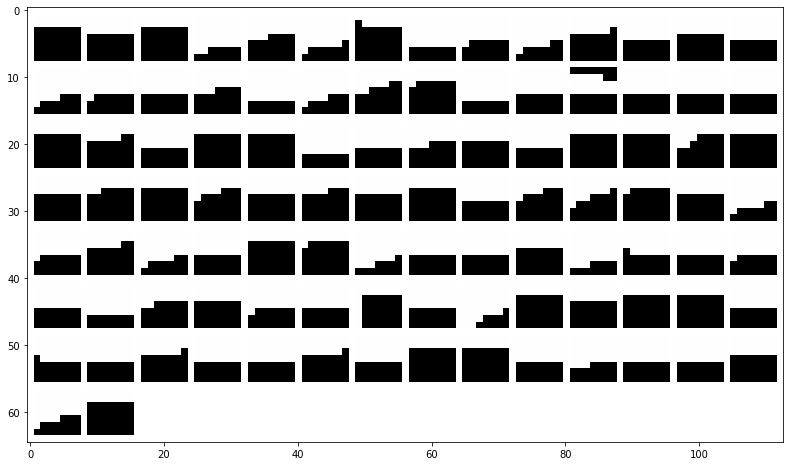

normalized regions:


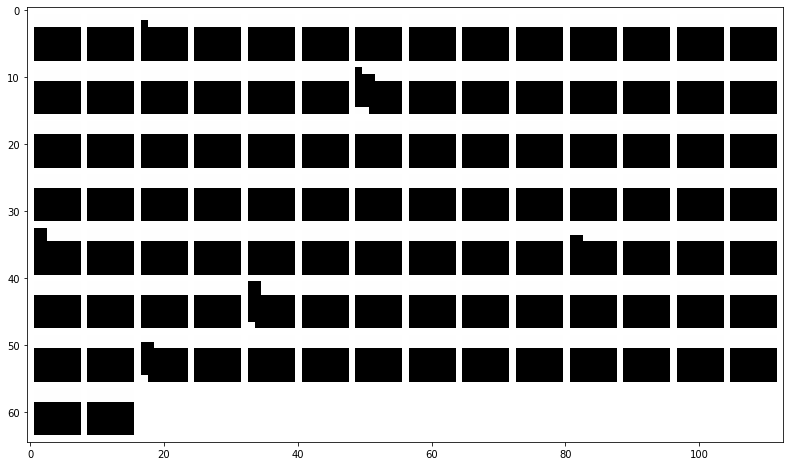

grid regions of 100 regions more=True or worst=False active for filter number: 120 :


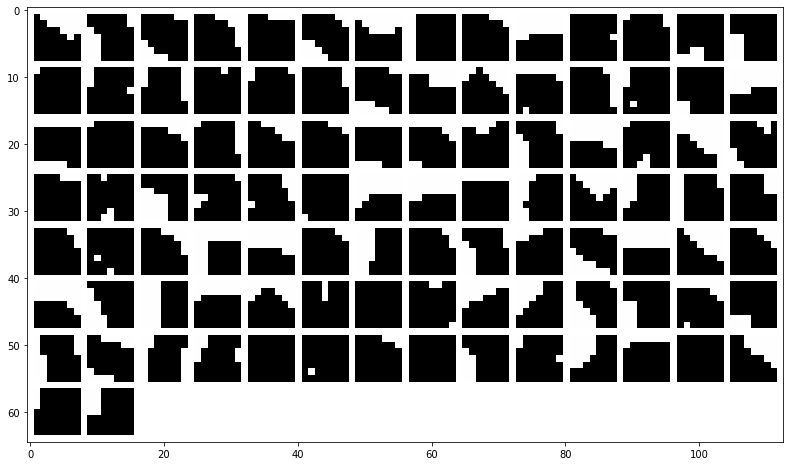

normalized regions:


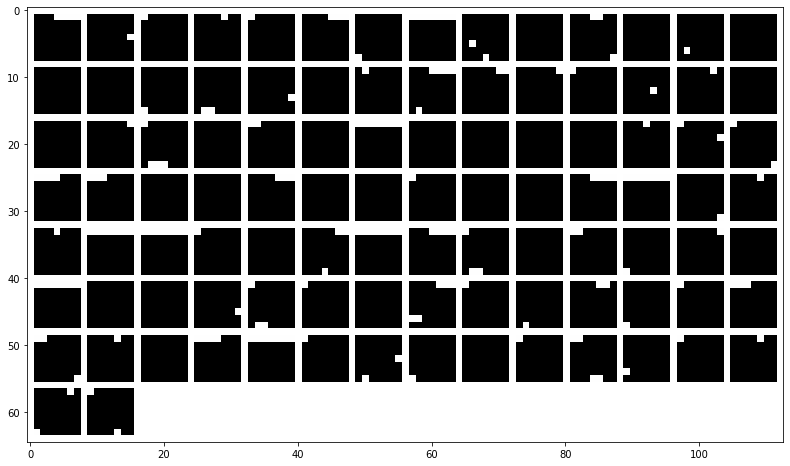

grid regions of 100 regions more=True or worst=False active for filter number: 125 :


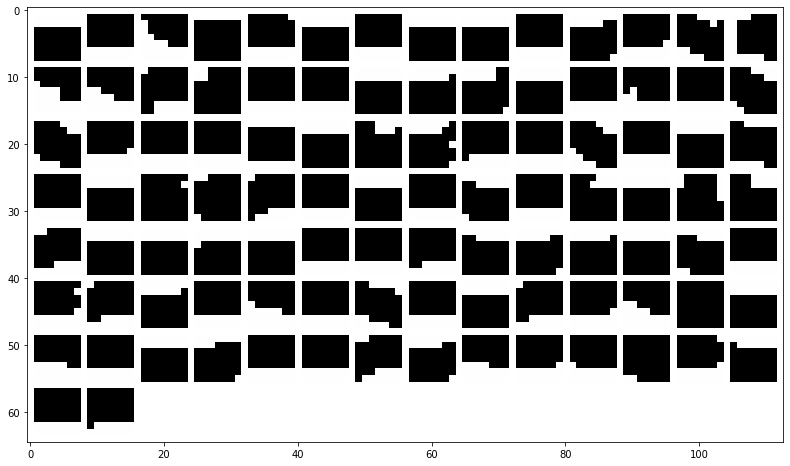

normalized regions:


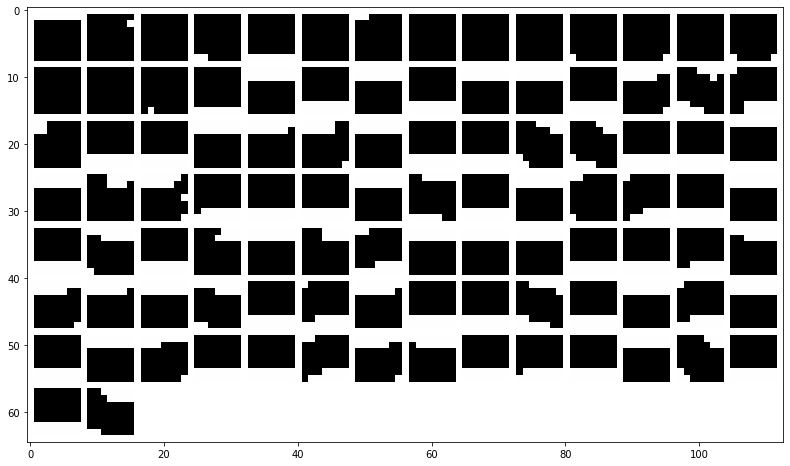

In [14]:
# regions and activation of interest
list_filter = list_filter_interest_layer2
regions = region_layer2_binary_maxpooling
activations = activation_layer2_binary_maxpooling
activations_normalized = activation_layer2_binary_normalized_maxpooling

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

Interest of filters: [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 80, 85, 90, 95, 100, 105, 110, 150, 120, 125, 150, 200, 250]
Consider 10% image regions = 100 images
Consider 10% image regions = 100 images
mean image:
mean regions of 100 regions more=True or worst=False active for filter number: 0 :


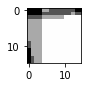

normalized region:


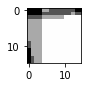

mean regions of 100 regions more=True or worst=False active for filter number: 5 :


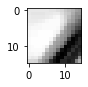

normalized region:


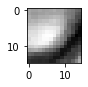

mean regions of 100 regions more=True or worst=False active for filter number: 10 :


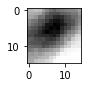

normalized region:


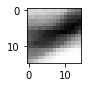

mean regions of 100 regions more=True or worst=False active for filter number: 15 :


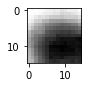

normalized region:


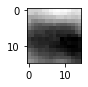

mean regions of 100 regions more=True or worst=False active for filter number: 20 :


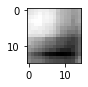

normalized region:


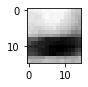

mean regions of 100 regions more=True or worst=False active for filter number: 25 :


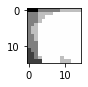

normalized region:


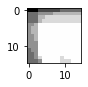

mean regions of 100 regions more=True or worst=False active for filter number: 30 :


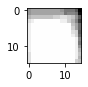

normalized region:


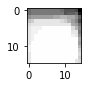

mean regions of 100 regions more=True or worst=False active for filter number: 35 :


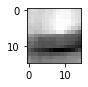

normalized region:


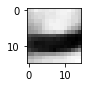

mean regions of 100 regions more=True or worst=False active for filter number: 40 :


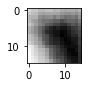

normalized region:


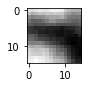

mean regions of 100 regions more=True or worst=False active for filter number: 45 :


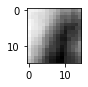

normalized region:


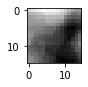

mean regions of 100 regions more=True or worst=False active for filter number: 50 :


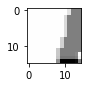

normalized region:


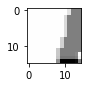

mean regions of 100 regions more=True or worst=False active for filter number: 55 :


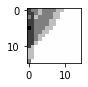

normalized region:


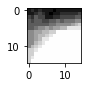

mean regions of 100 regions more=True or worst=False active for filter number: 60 :


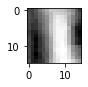

normalized region:


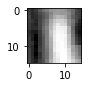

mean regions of 100 regions more=True or worst=False active for filter number: 65 :


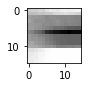

normalized region:


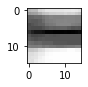

mean regions of 100 regions more=True or worst=False active for filter number: 70 :


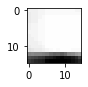

normalized region:


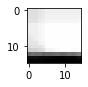

mean regions of 100 regions more=True or worst=False active for filter number: 80 :


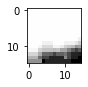

normalized region:


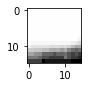

mean regions of 100 regions more=True or worst=False active for filter number: 85 :


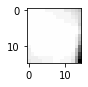

normalized region:


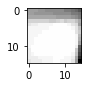

mean regions of 100 regions more=True or worst=False active for filter number: 90 :


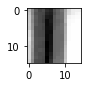

normalized region:


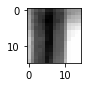

mean regions of 100 regions more=True or worst=False active for filter number: 95 :


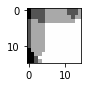

normalized region:


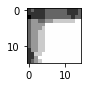

mean regions of 100 regions more=True or worst=False active for filter number: 100 :


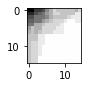

normalized region:


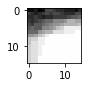

mean regions of 100 regions more=True or worst=False active for filter number: 105 :


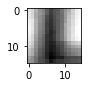

normalized region:


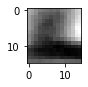

mean regions of 100 regions more=True or worst=False active for filter number: 110 :


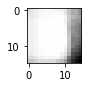

normalized region:


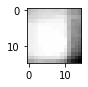

mean regions of 100 regions more=True or worst=False active for filter number: 150 :


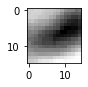

normalized region:


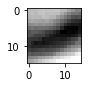

mean regions of 100 regions more=True or worst=False active for filter number: 120 :


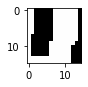

normalized region:


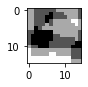

mean regions of 100 regions more=True or worst=False active for filter number: 125 :


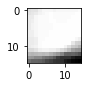

normalized region:


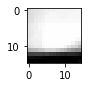

mean regions of 100 regions more=True or worst=False active for filter number: 150 :


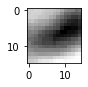

normalized region:


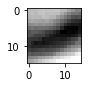

mean regions of 100 regions more=True or worst=False active for filter number: 200 :


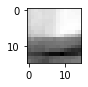

normalized region:


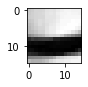

mean regions of 100 regions more=True or worst=False active for filter number: 250 :


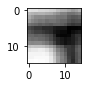

normalized region:


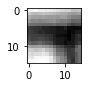

grid image
grid regions of 100 regions more=True or worst=False active for filter number: 0 :


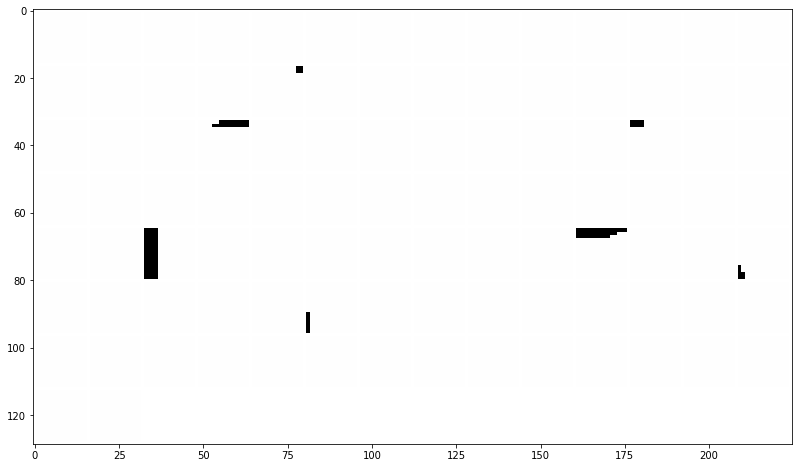

normalized regions:


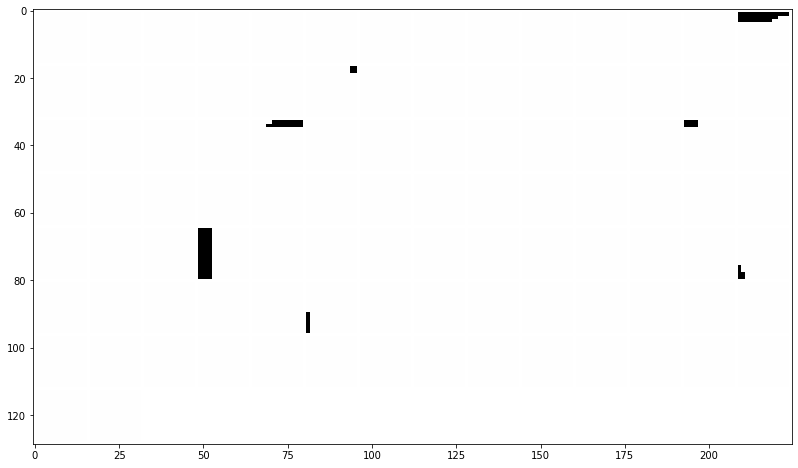

grid regions of 100 regions more=True or worst=False active for filter number: 5 :


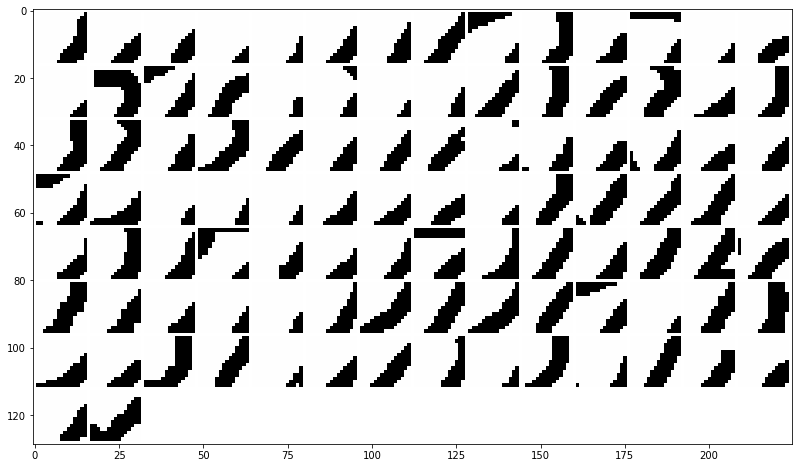

normalized regions:


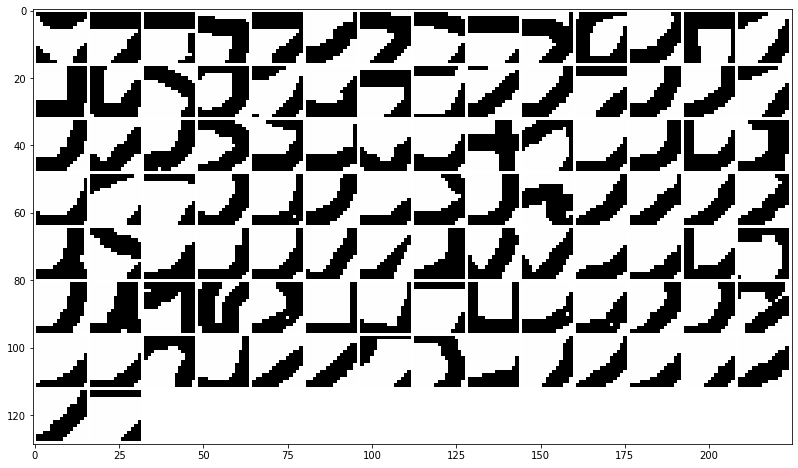

grid regions of 100 regions more=True or worst=False active for filter number: 10 :


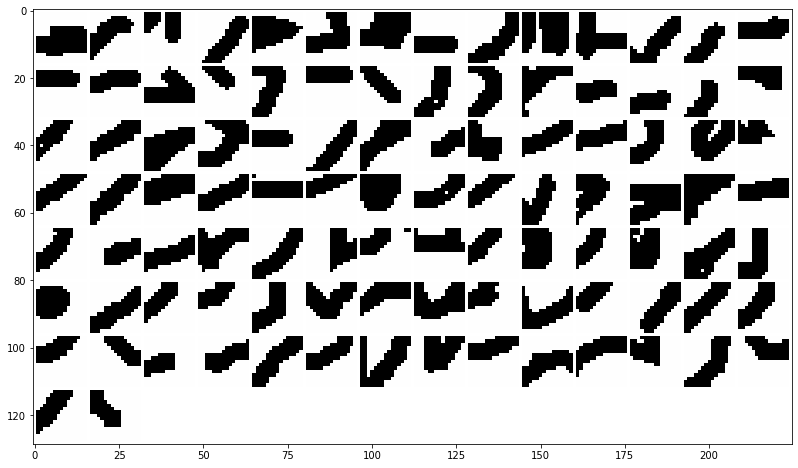

normalized regions:


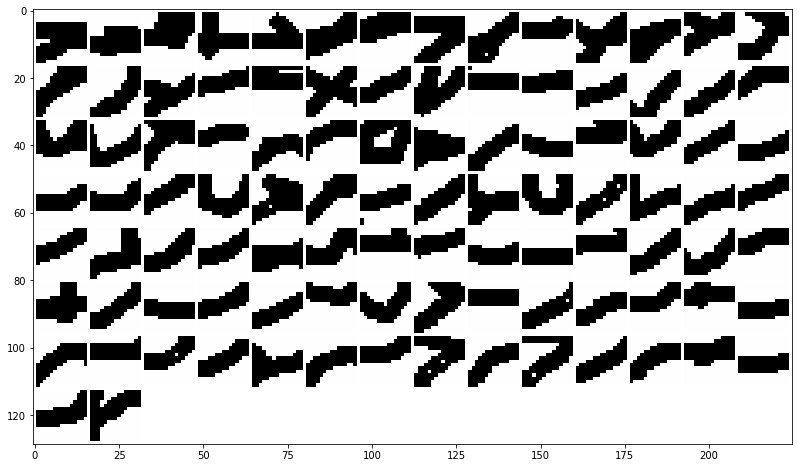

grid regions of 100 regions more=True or worst=False active for filter number: 15 :


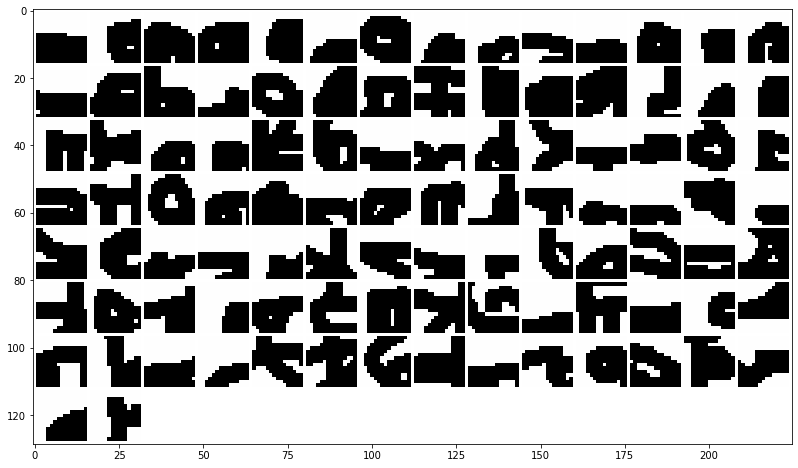

normalized regions:


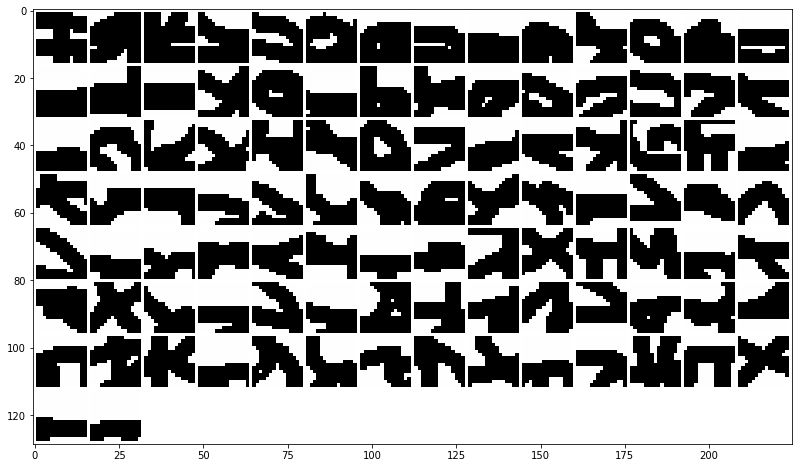

grid regions of 100 regions more=True or worst=False active for filter number: 20 :


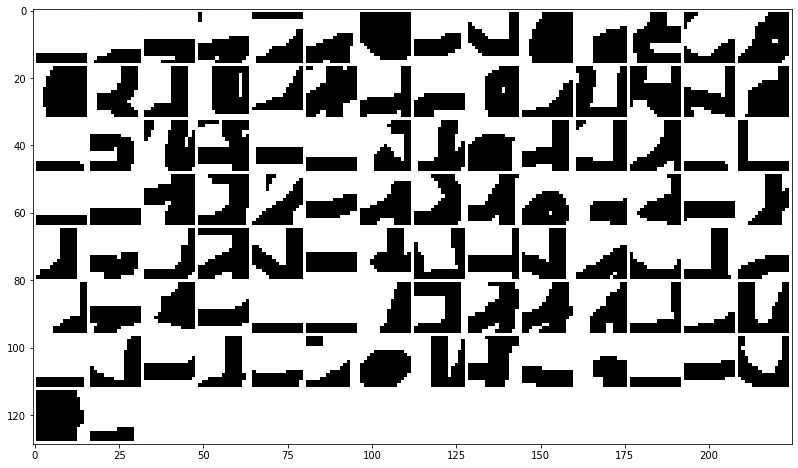

normalized regions:


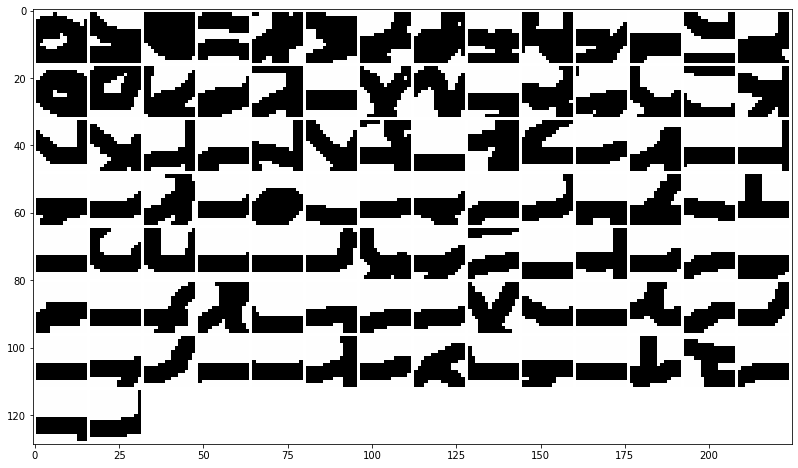

grid regions of 100 regions more=True or worst=False active for filter number: 25 :


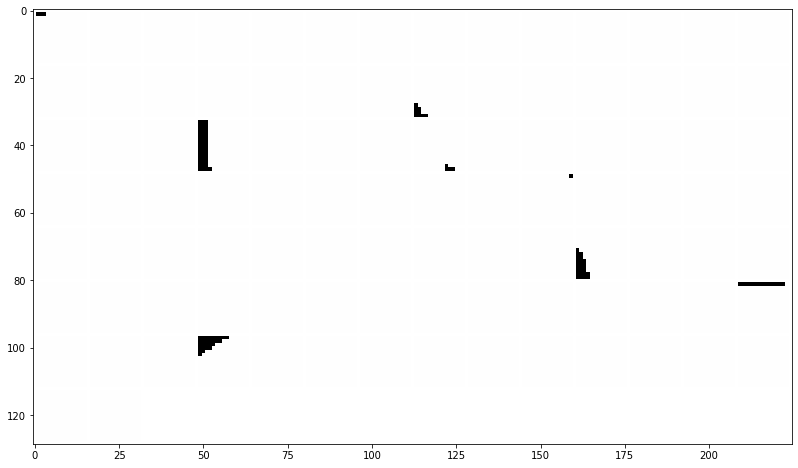

normalized regions:


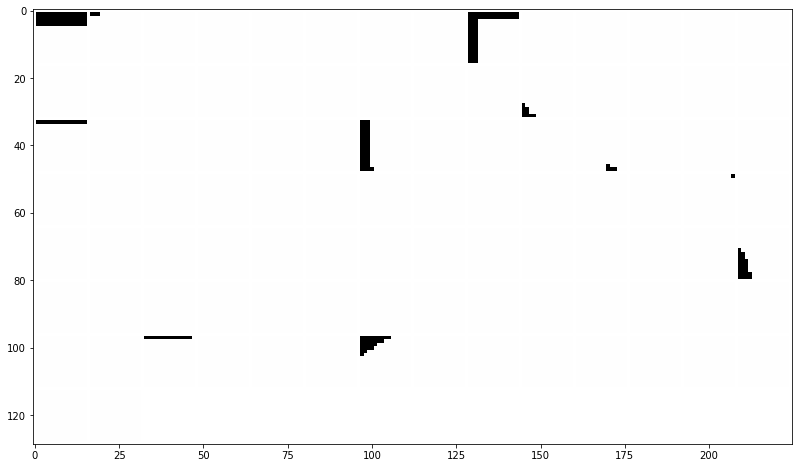

grid regions of 100 regions more=True or worst=False active for filter number: 30 :


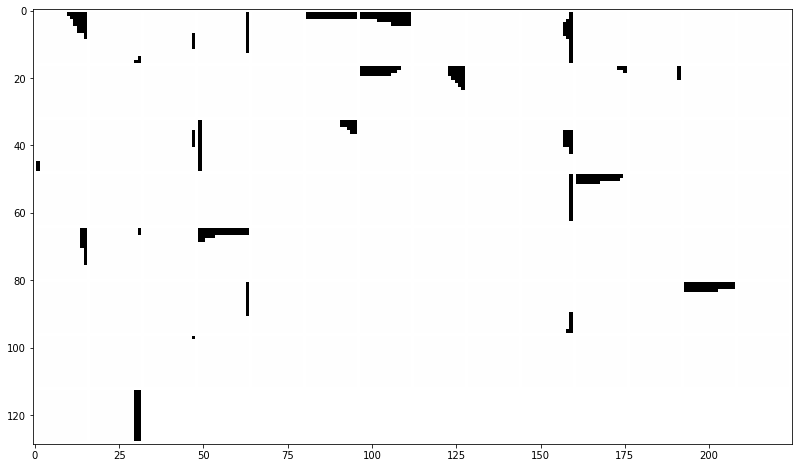

normalized regions:


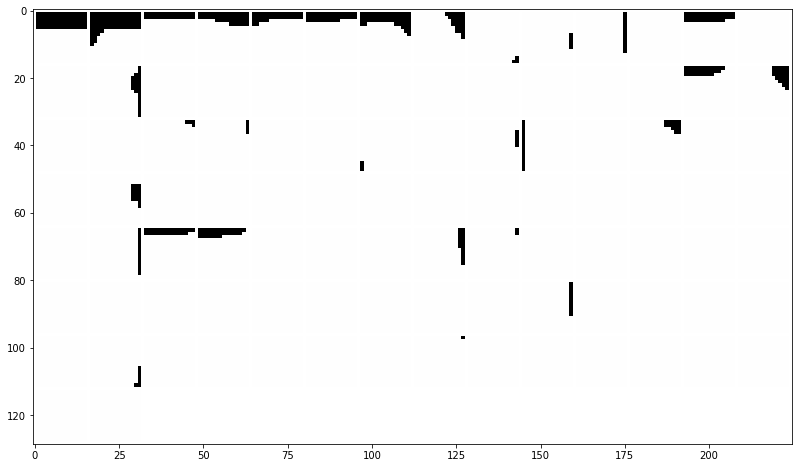

grid regions of 100 regions more=True or worst=False active for filter number: 35 :


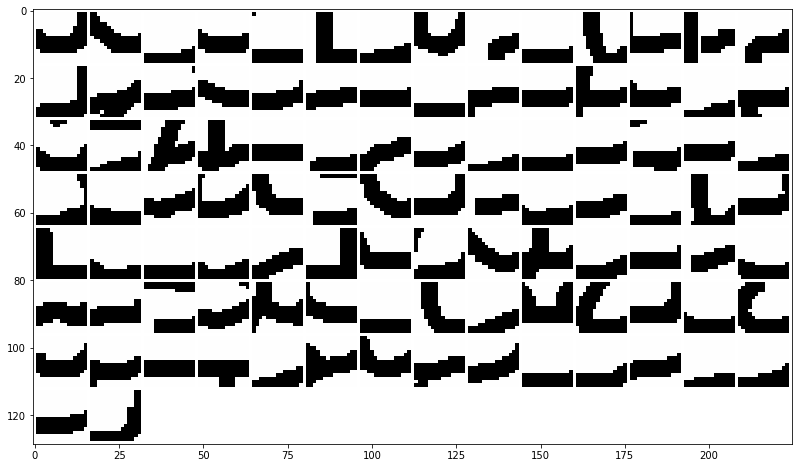

normalized regions:


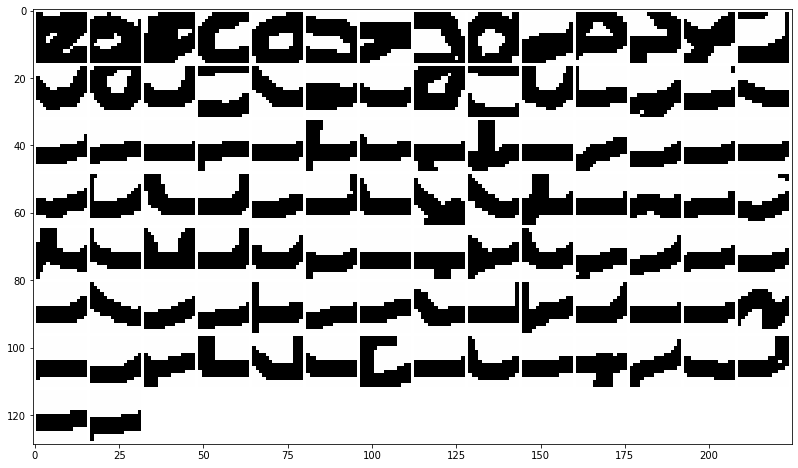

grid regions of 100 regions more=True or worst=False active for filter number: 40 :


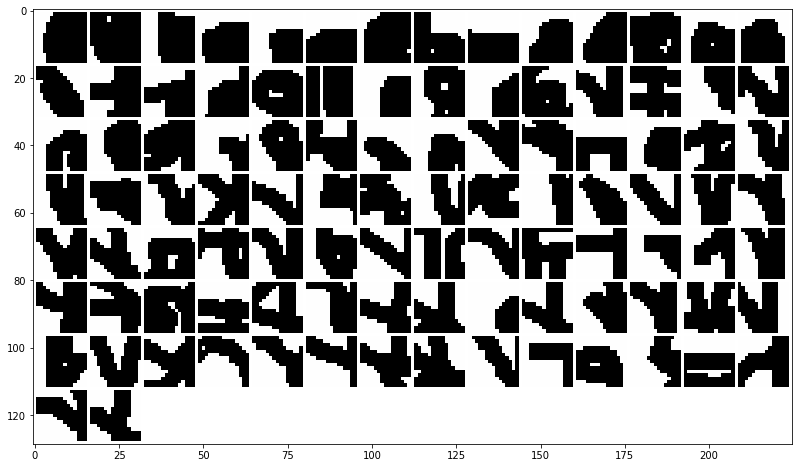

normalized regions:


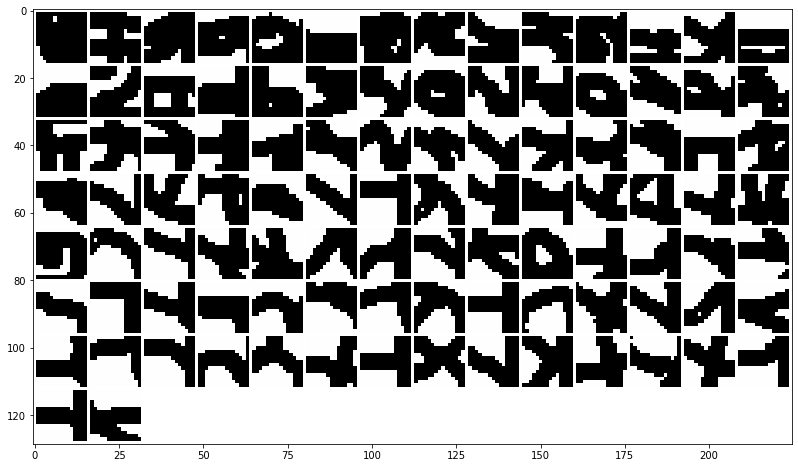

grid regions of 100 regions more=True or worst=False active for filter number: 45 :


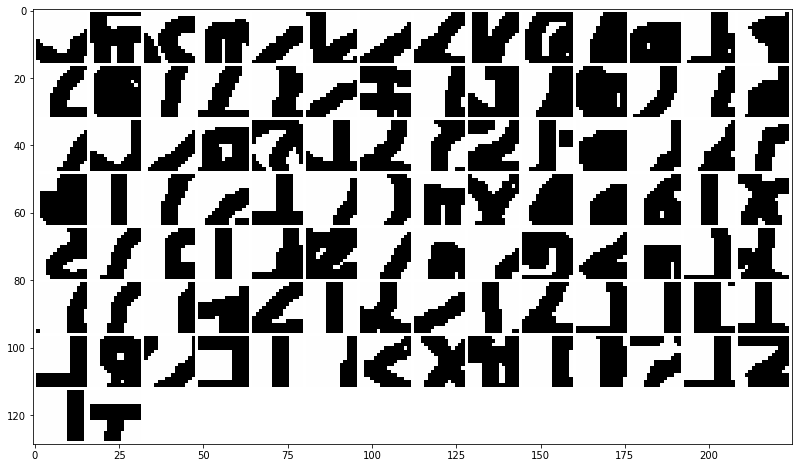

normalized regions:


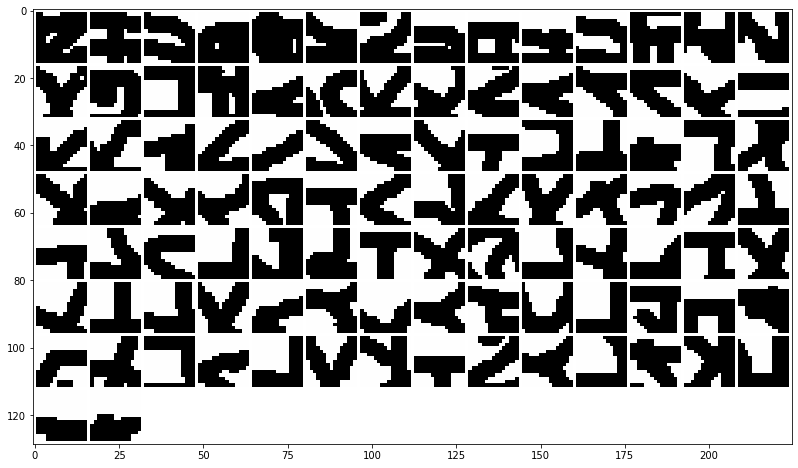

grid regions of 100 regions more=True or worst=False active for filter number: 50 :


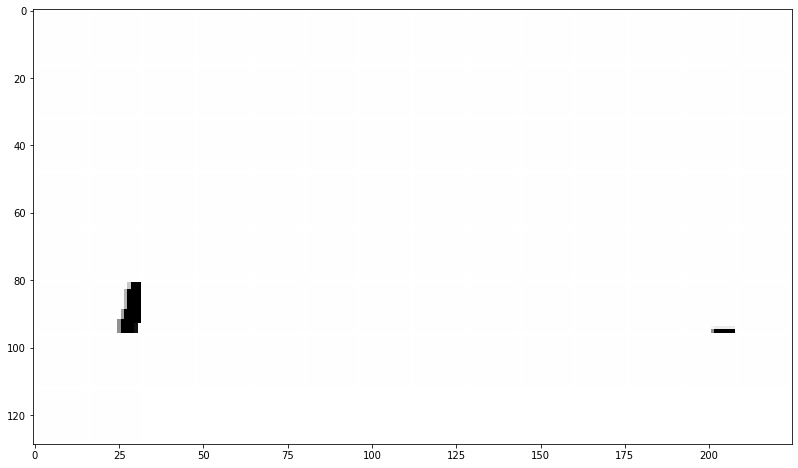

normalized regions:


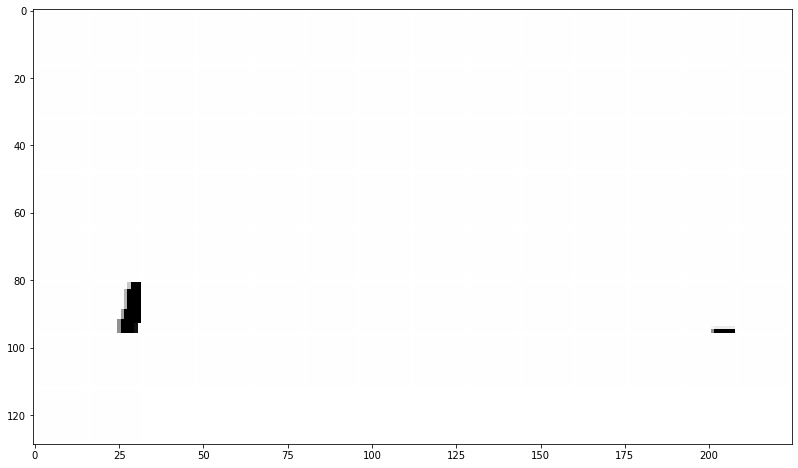

grid regions of 100 regions more=True or worst=False active for filter number: 55 :


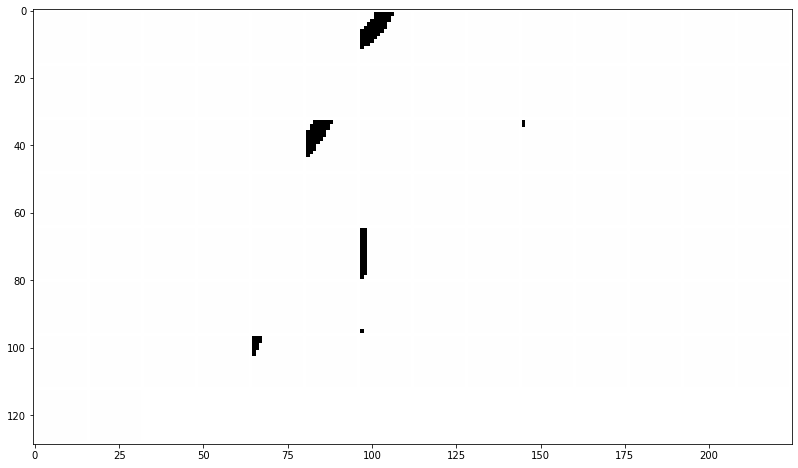

normalized regions:


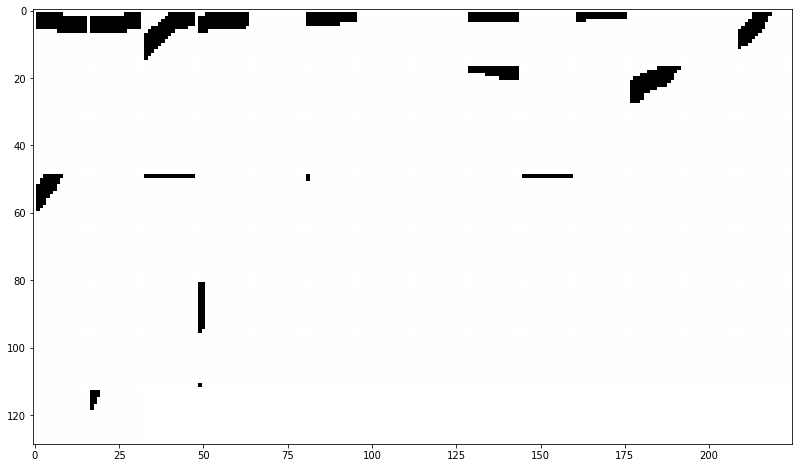

grid regions of 100 regions more=True or worst=False active for filter number: 60 :


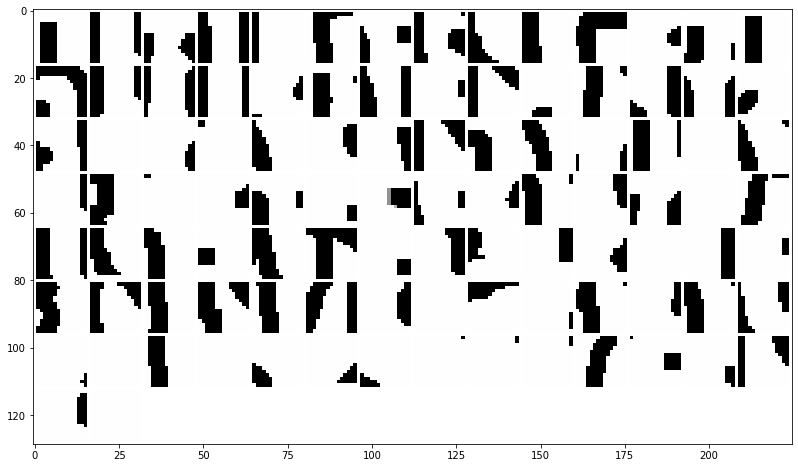

normalized regions:


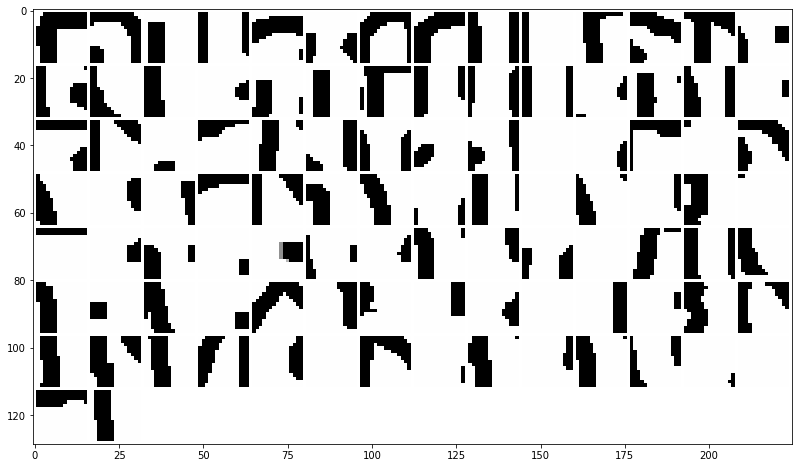

grid regions of 100 regions more=True or worst=False active for filter number: 65 :


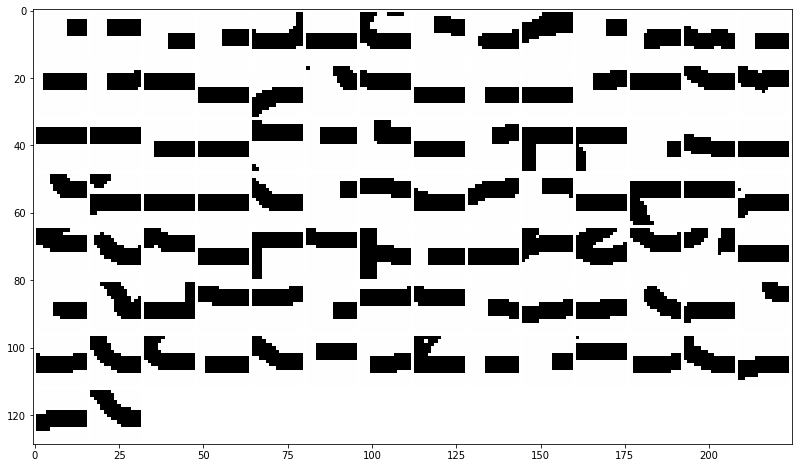

normalized regions:


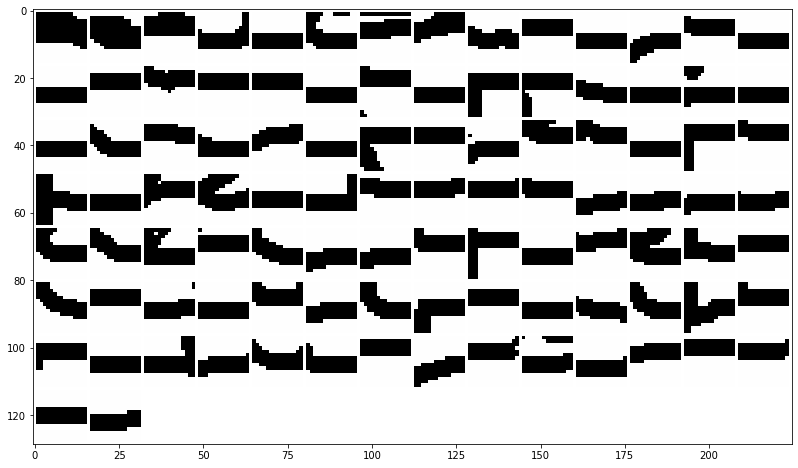

grid regions of 100 regions more=True or worst=False active for filter number: 70 :


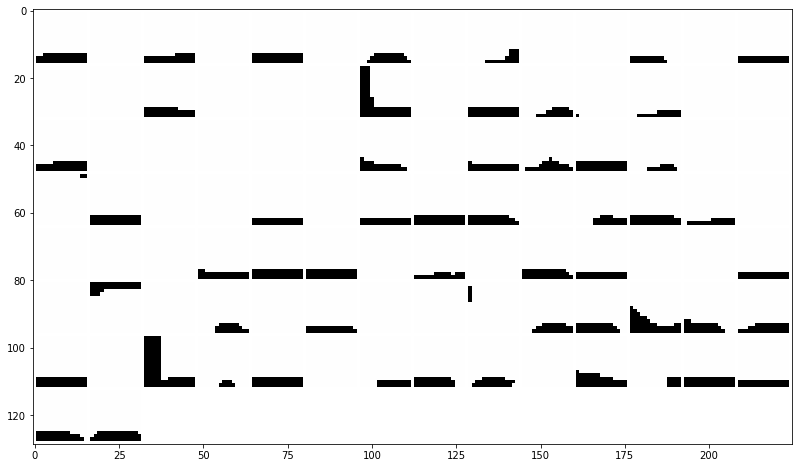

normalized regions:


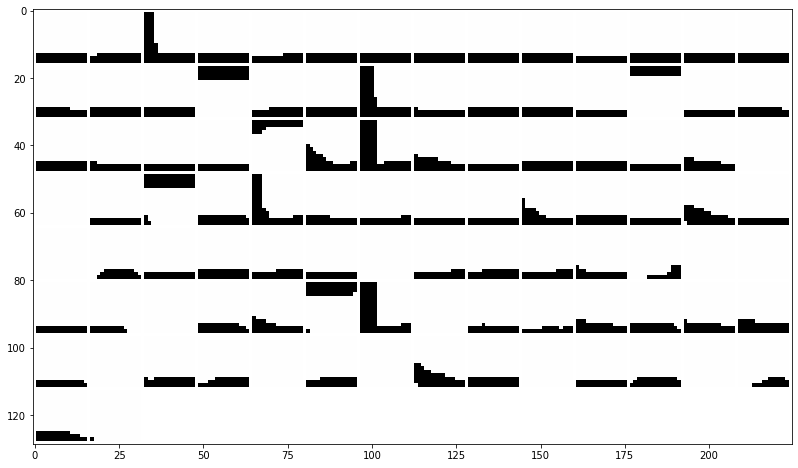

grid regions of 100 regions more=True or worst=False active for filter number: 80 :


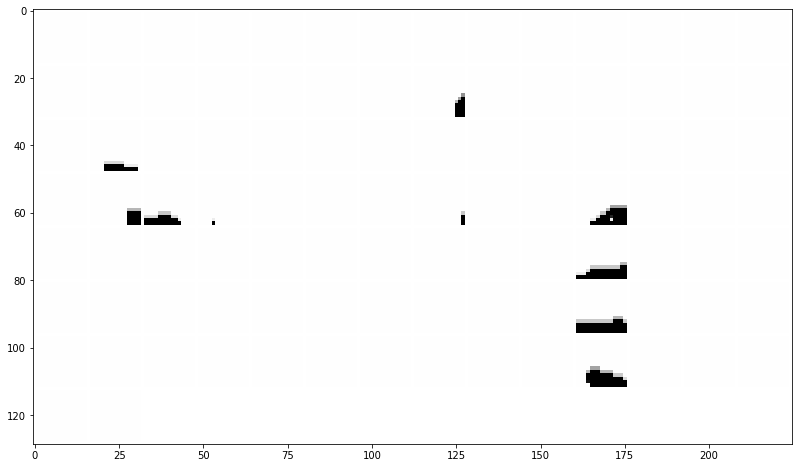

normalized regions:


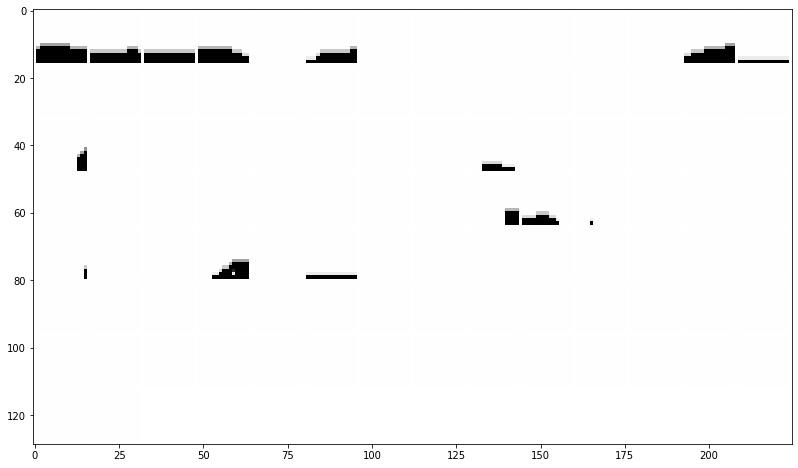

grid regions of 100 regions more=True or worst=False active for filter number: 85 :


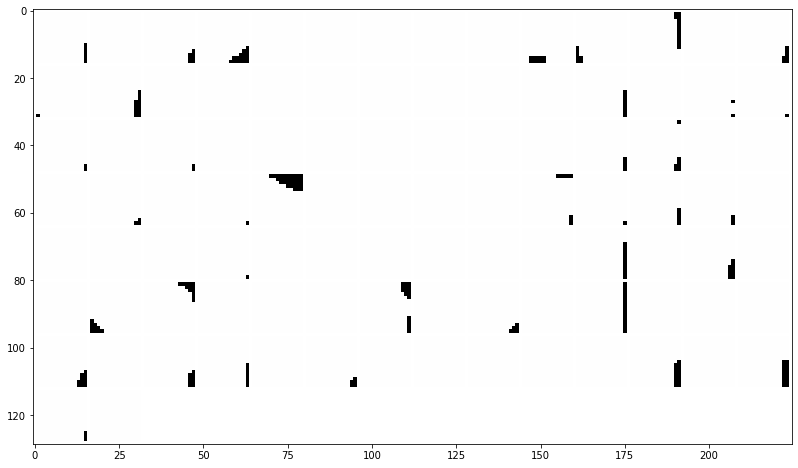

normalized regions:


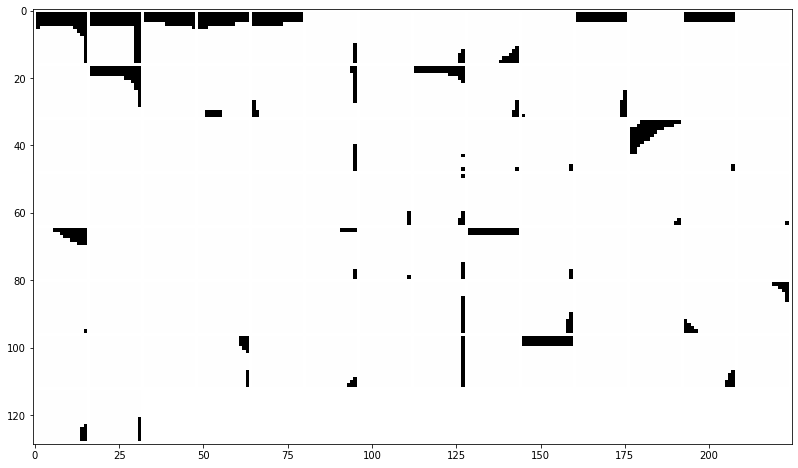

grid regions of 100 regions more=True or worst=False active for filter number: 90 :


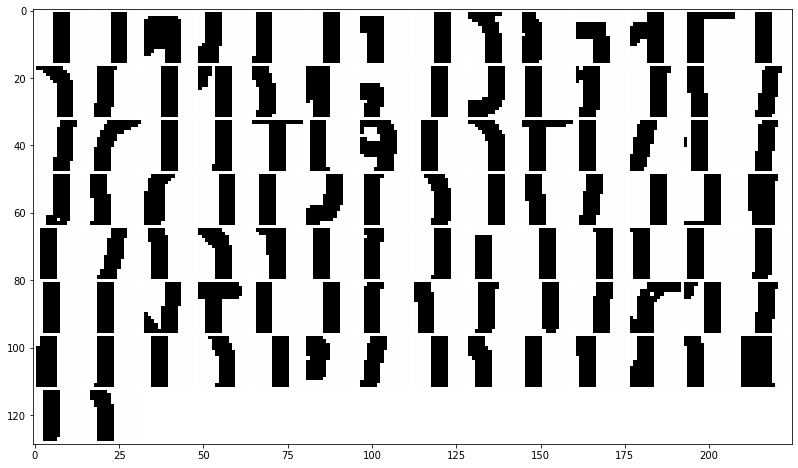

normalized regions:


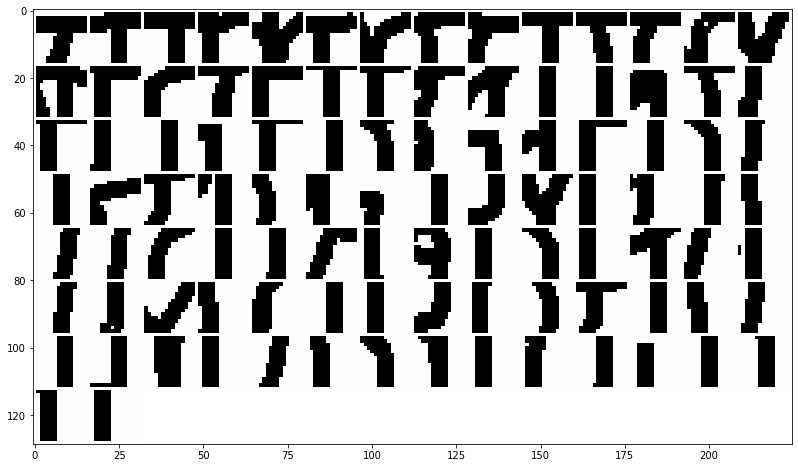

grid regions of 100 regions more=True or worst=False active for filter number: 95 :


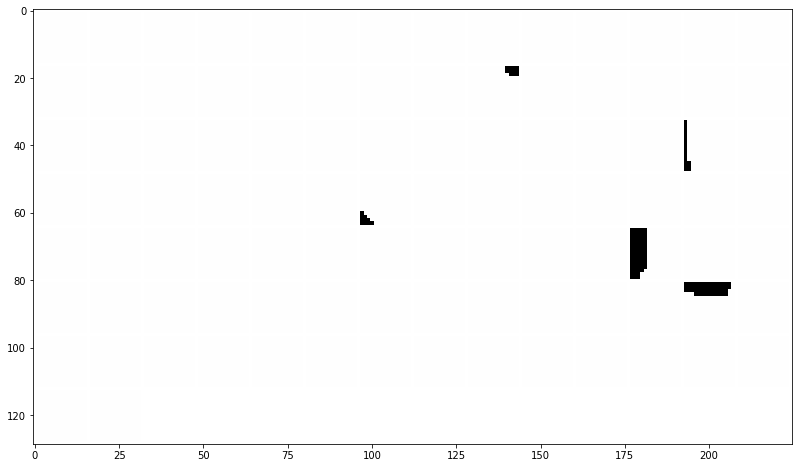

normalized regions:


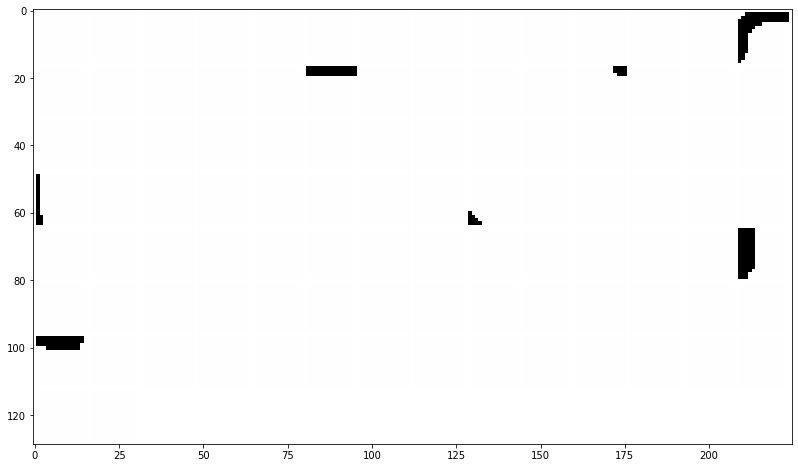

grid regions of 100 regions more=True or worst=False active for filter number: 100 :


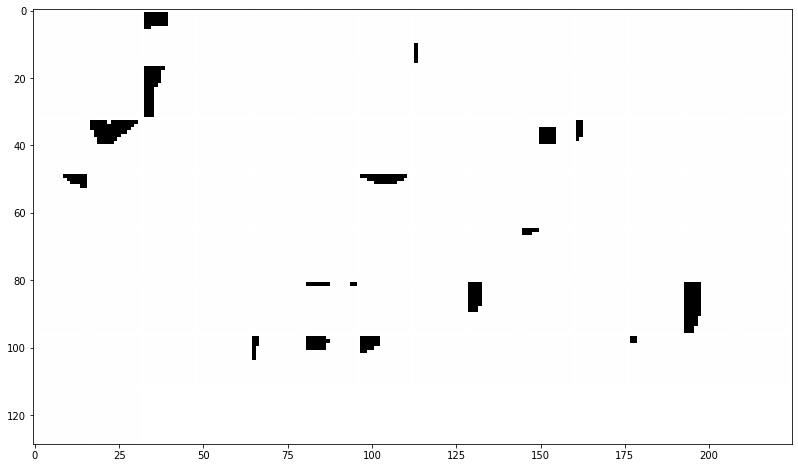

normalized regions:


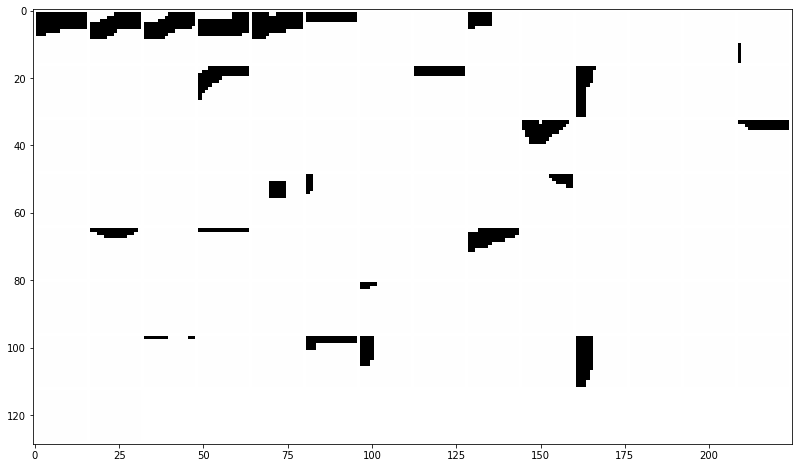

grid regions of 100 regions more=True or worst=False active for filter number: 105 :


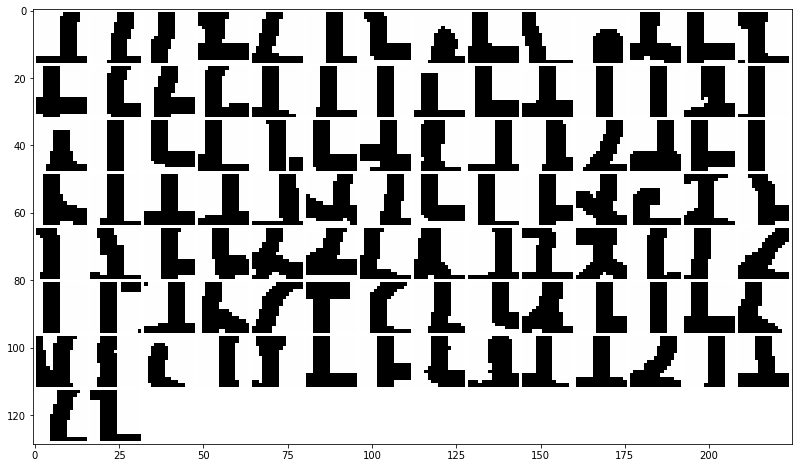

normalized regions:


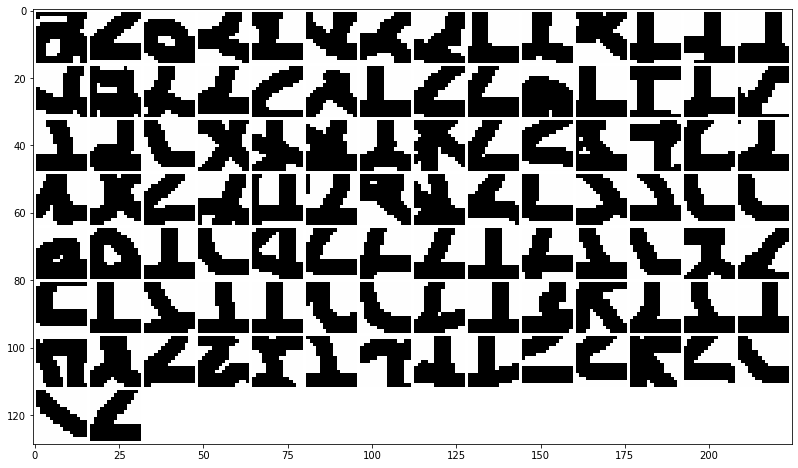

grid regions of 100 regions more=True or worst=False active for filter number: 110 :


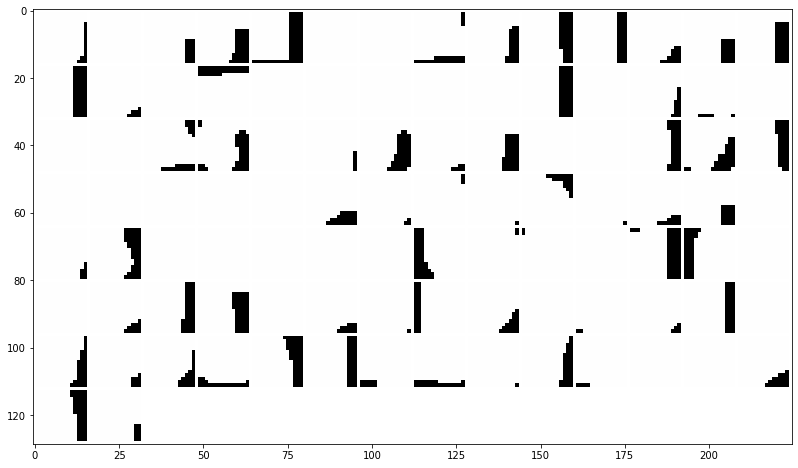

normalized regions:


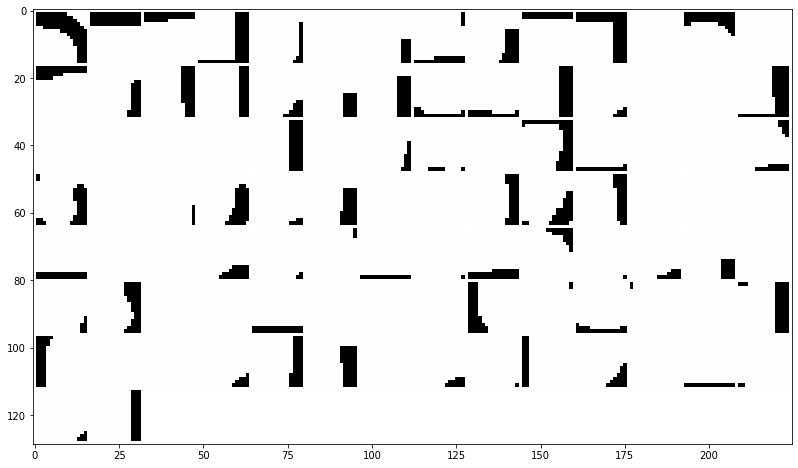

grid regions of 100 regions more=True or worst=False active for filter number: 150 :


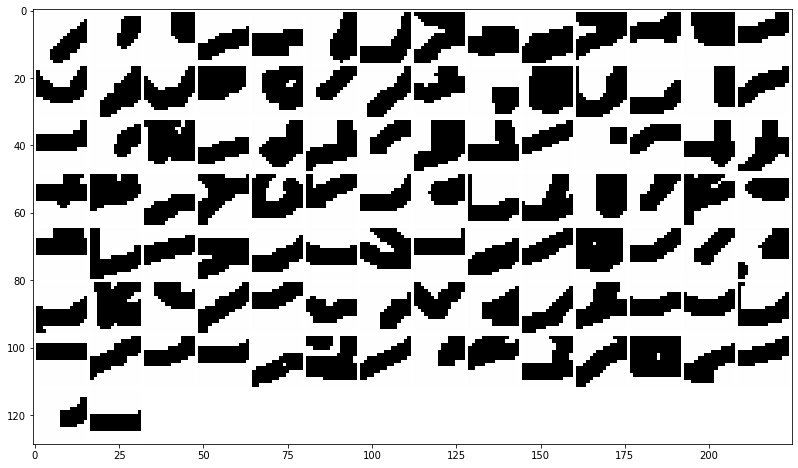

normalized regions:


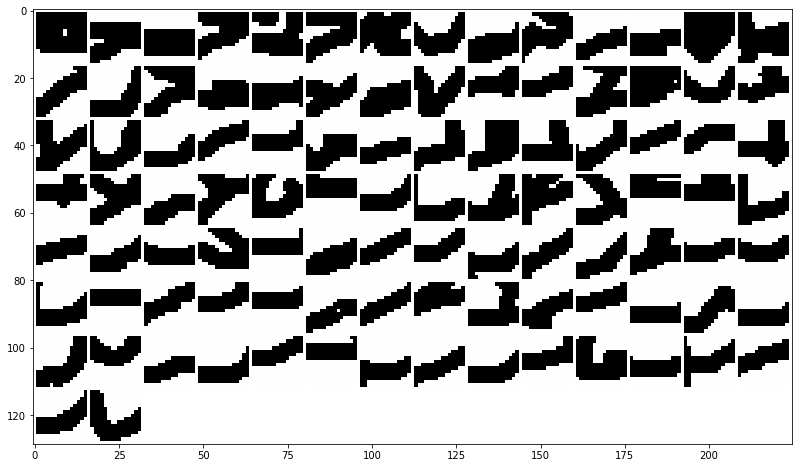

grid regions of 100 regions more=True or worst=False active for filter number: 120 :


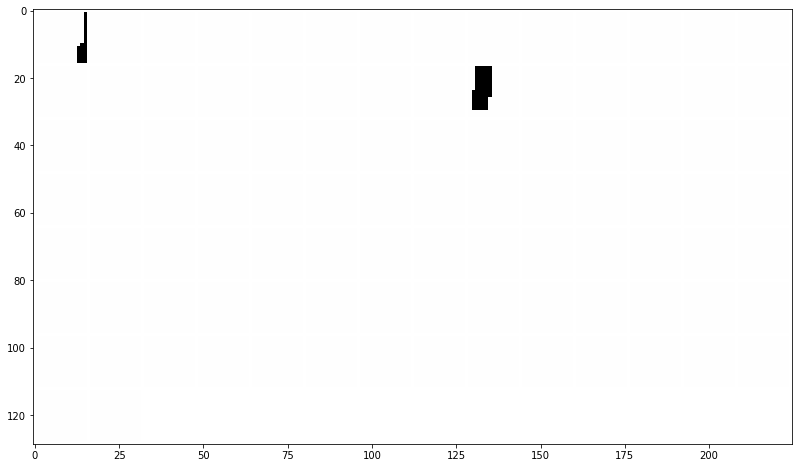

normalized regions:


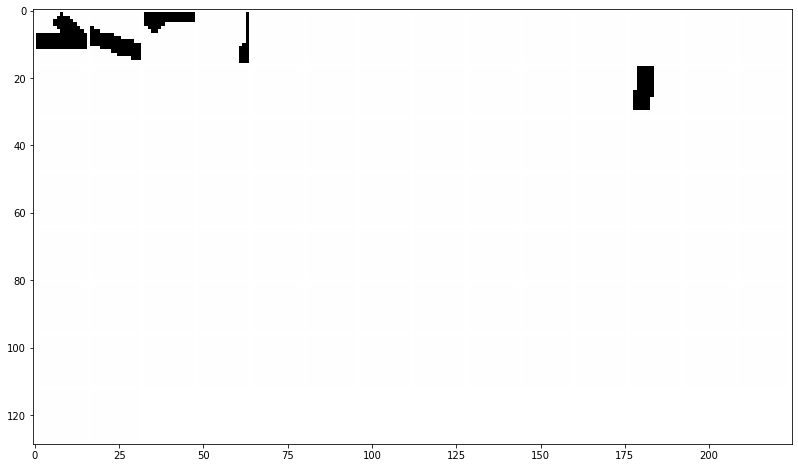

grid regions of 100 regions more=True or worst=False active for filter number: 125 :


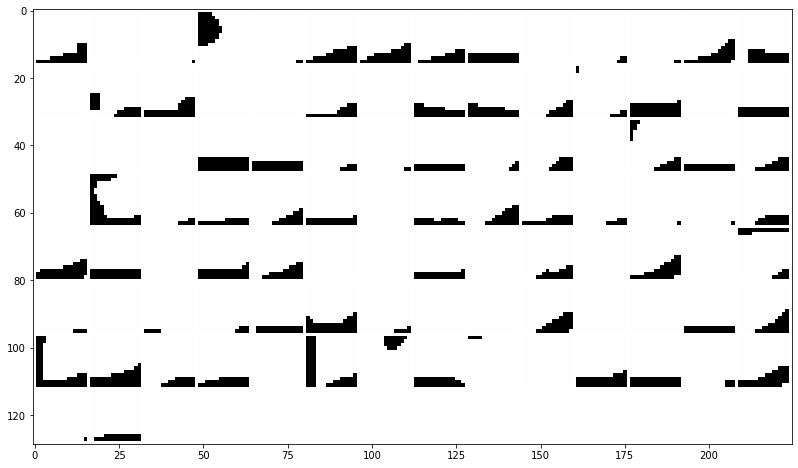

normalized regions:


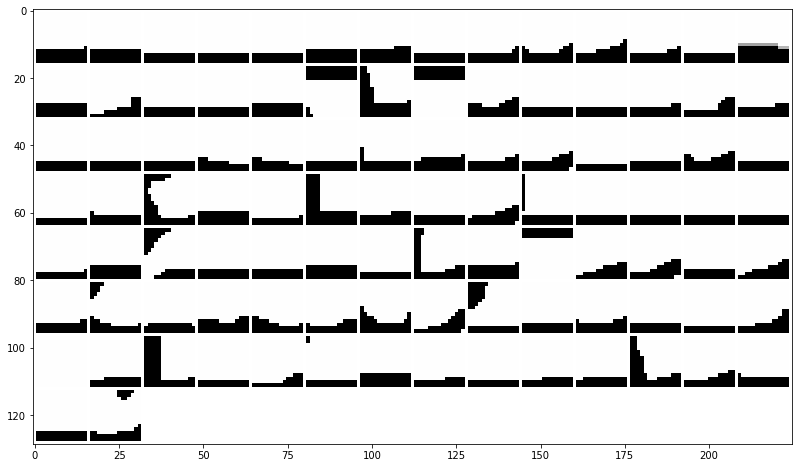

grid regions of 100 regions more=True or worst=False active for filter number: 150 :


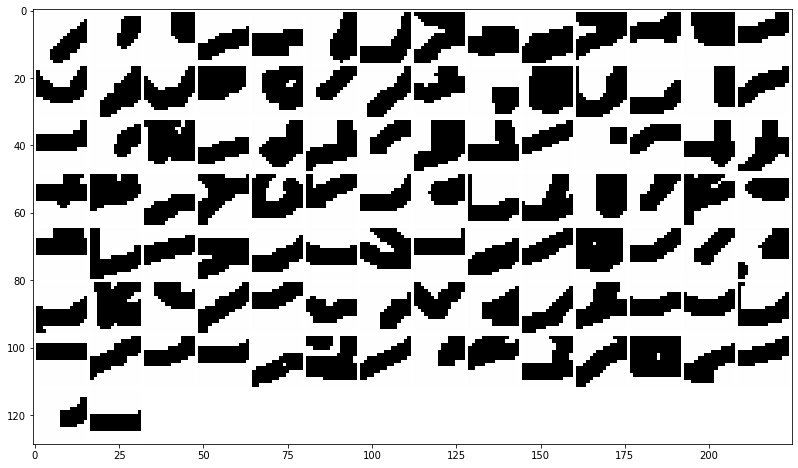

normalized regions:


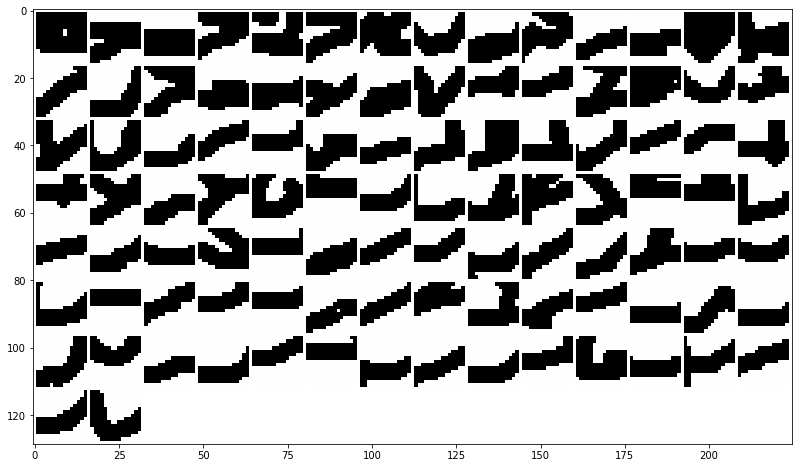

grid regions of 100 regions more=True or worst=False active for filter number: 200 :


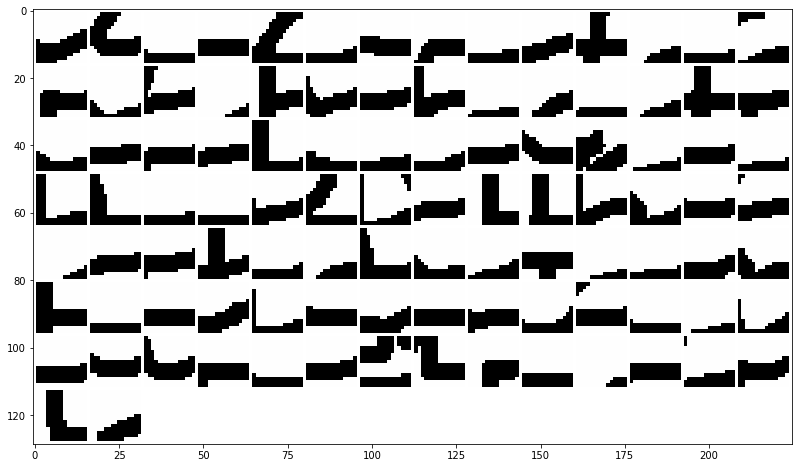

normalized regions:


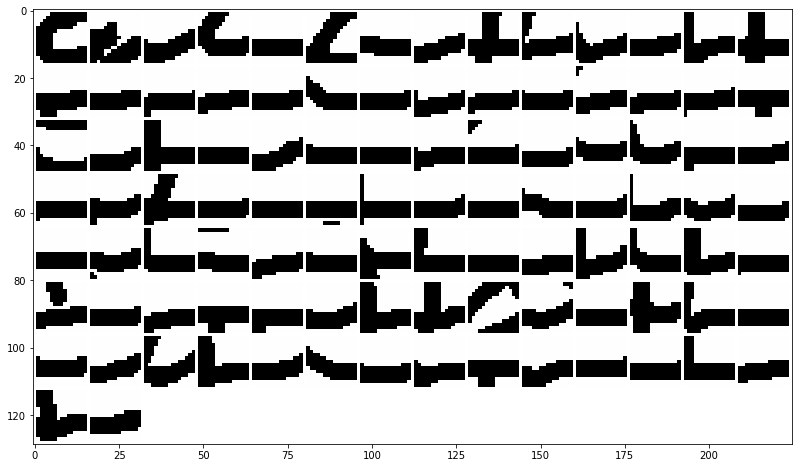

grid regions of 100 regions more=True or worst=False active for filter number: 250 :


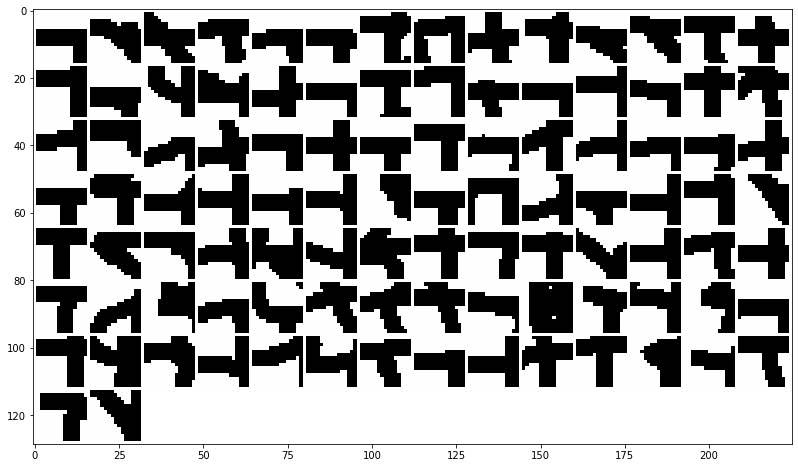

normalized regions:


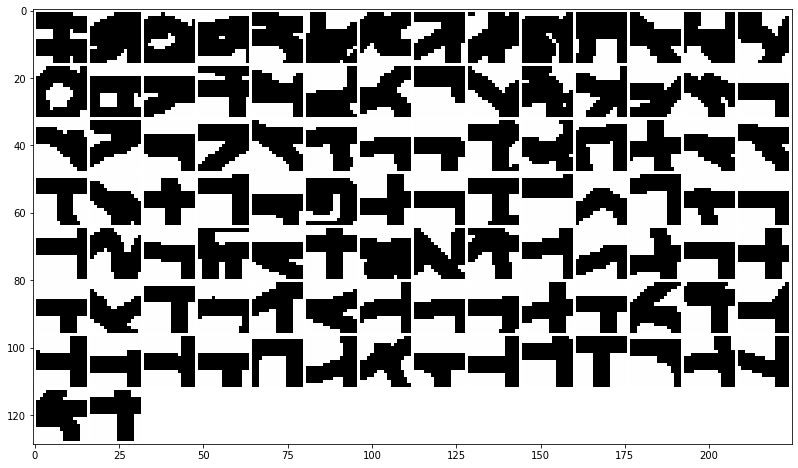

In [15]:
# regions and activation of interest
list_filter = list_filter_interest_layer3
regions = region_layer3_binary_maxpooling
activations = activation_layer3_binary_maxpooling
activations_normalized = activation_layer3_binary_normalized_maxpooling

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

In [16]:
# regions and activation of interest
list_filter = list_filter_interest_layer4
regions = region_layer4_binary_maxpooling
activations = activation_layer4_binary_maxpooling
activations_normalized = activation_layer4_binary_normalized_maxpooling

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

Output hidden; open in https://colab.research.google.com to view.

#### Mixt model stride:

Interest of filters: [0, 5, 10, 15, 20, 25, 30]
Consider 10% image regions = 100 images
Consider 10% image regions = 100 images
mean image:
mean regions of 100 regions more=True or worst=False active for filter number: 0 :


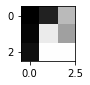

normalized region:


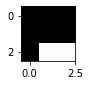

mean regions of 100 regions more=True or worst=False active for filter number: 5 :


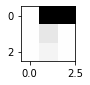

normalized region:


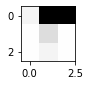

mean regions of 100 regions more=True or worst=False active for filter number: 10 :


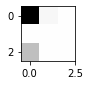

normalized region:


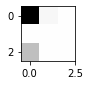

mean regions of 100 regions more=True or worst=False active for filter number: 15 :


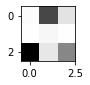

normalized region:


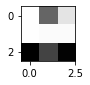

mean regions of 100 regions more=True or worst=False active for filter number: 20 :


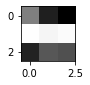

normalized region:


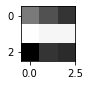

mean regions of 100 regions more=True or worst=False active for filter number: 25 :


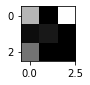

normalized region:


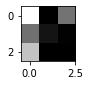

mean regions of 100 regions more=True or worst=False active for filter number: 30 :


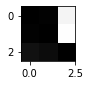

normalized region:


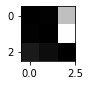

grid image
grid regions of 100 regions more=True or worst=False active for filter number: 0 :


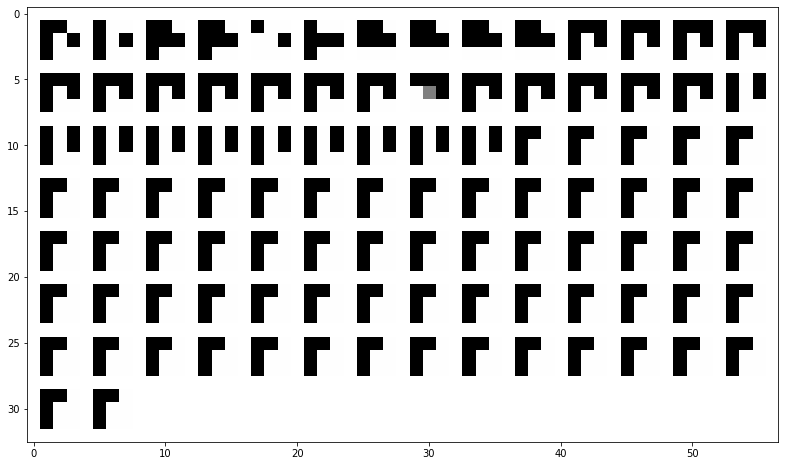

normalized regions:


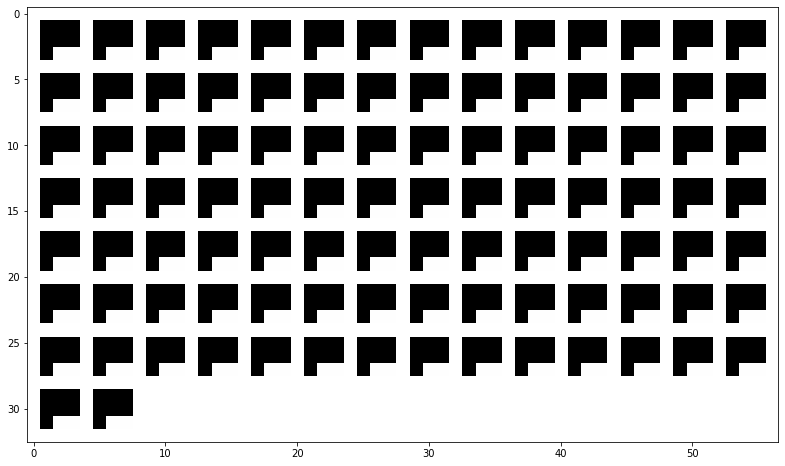

grid regions of 100 regions more=True or worst=False active for filter number: 5 :


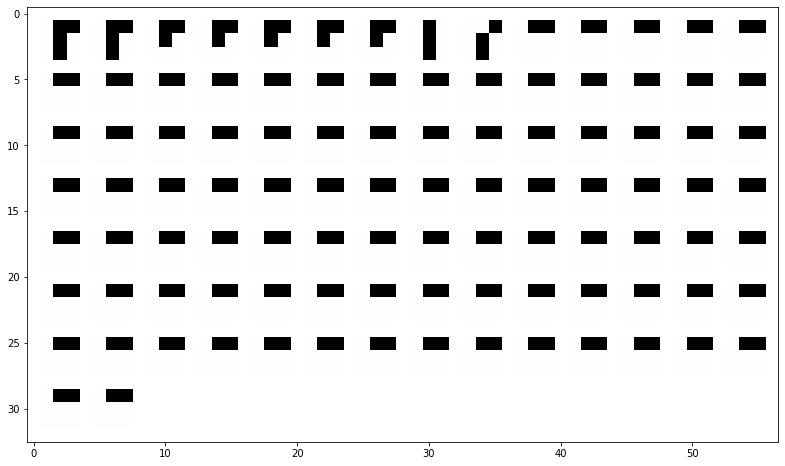

normalized regions:


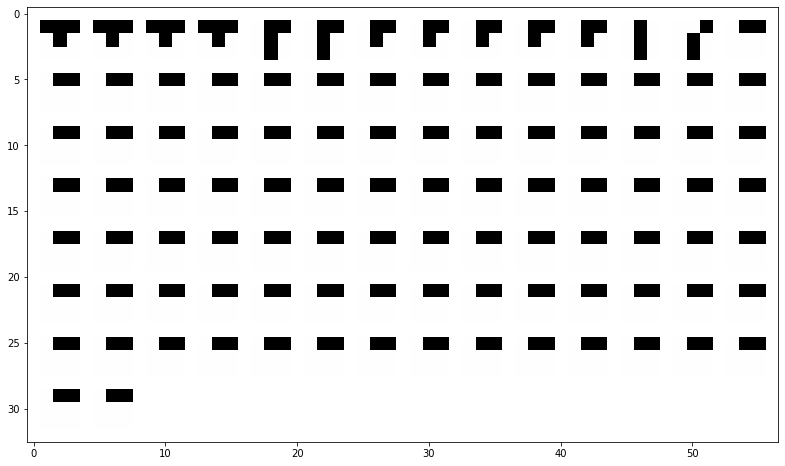

grid regions of 100 regions more=True or worst=False active for filter number: 10 :


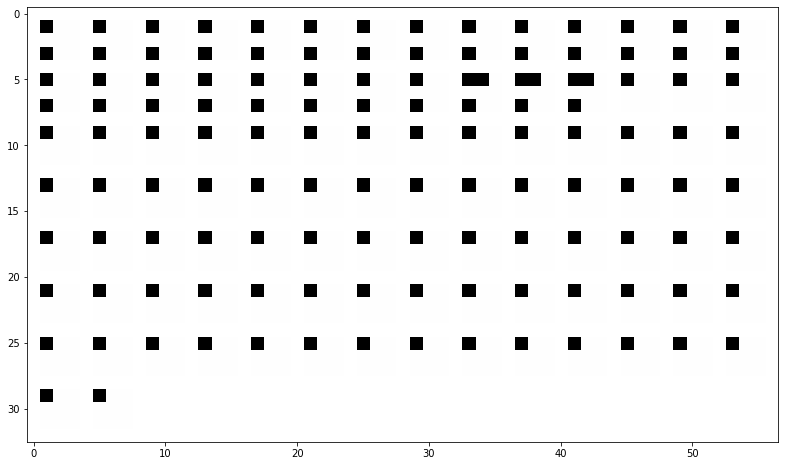

normalized regions:


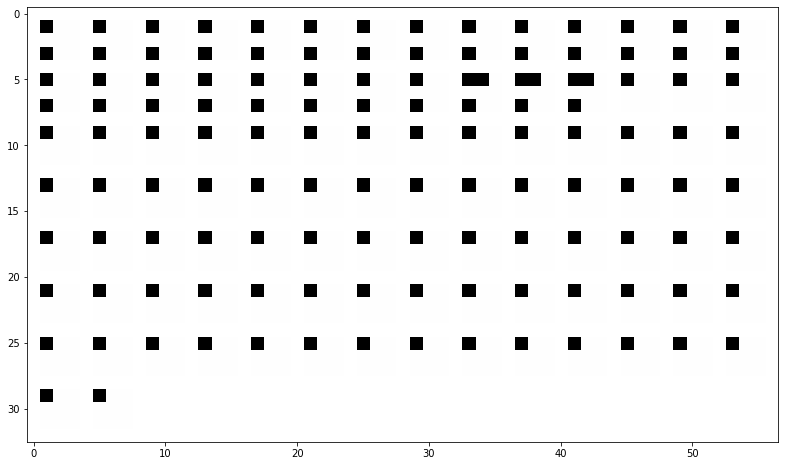

grid regions of 100 regions more=True or worst=False active for filter number: 15 :


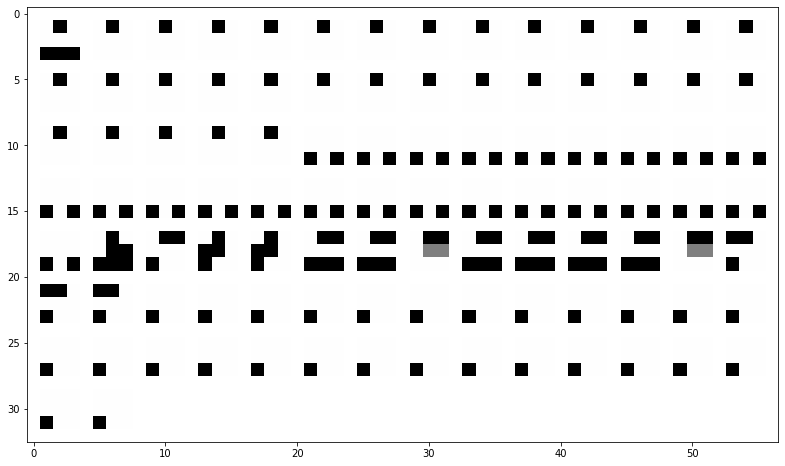

normalized regions:


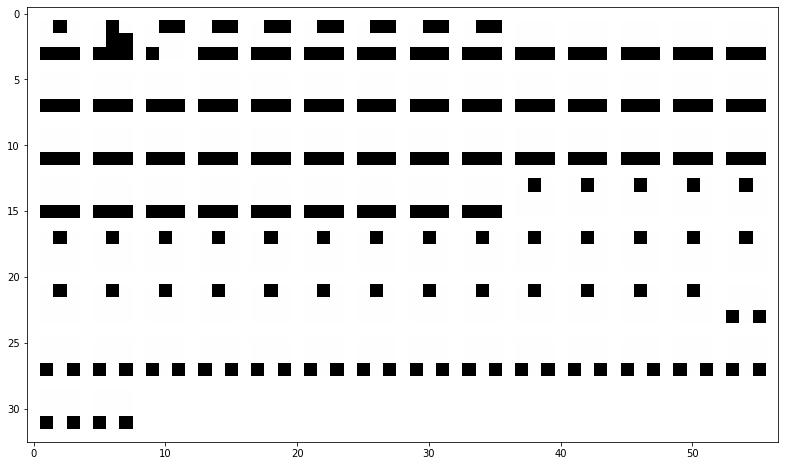

grid regions of 100 regions more=True or worst=False active for filter number: 20 :


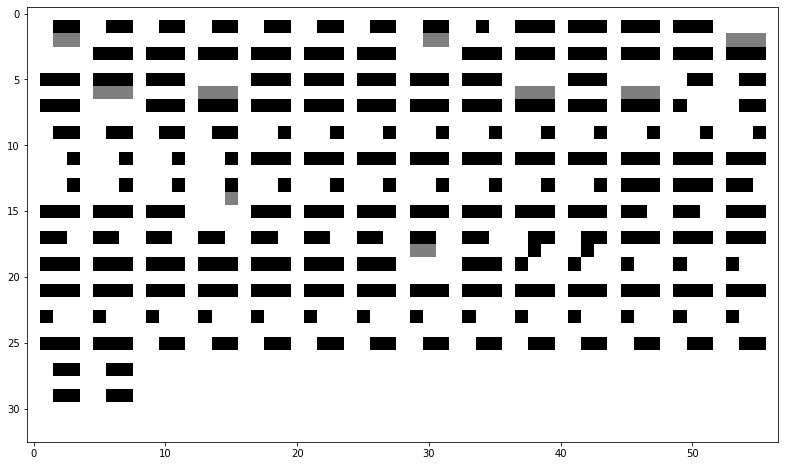

normalized regions:


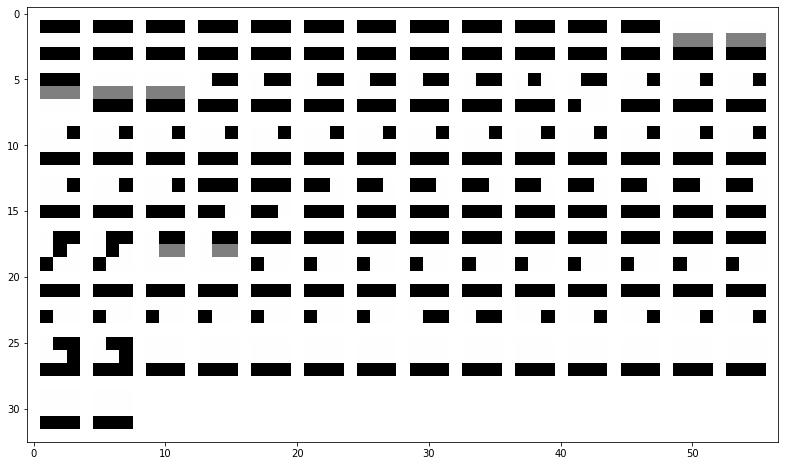

grid regions of 100 regions more=True or worst=False active for filter number: 25 :


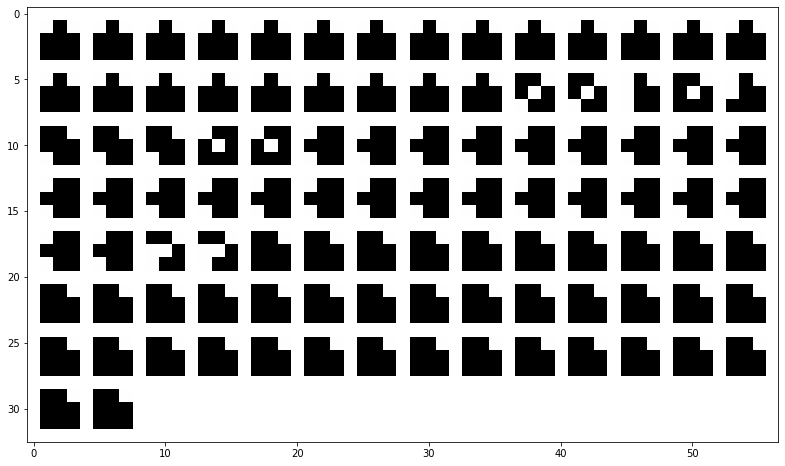

normalized regions:


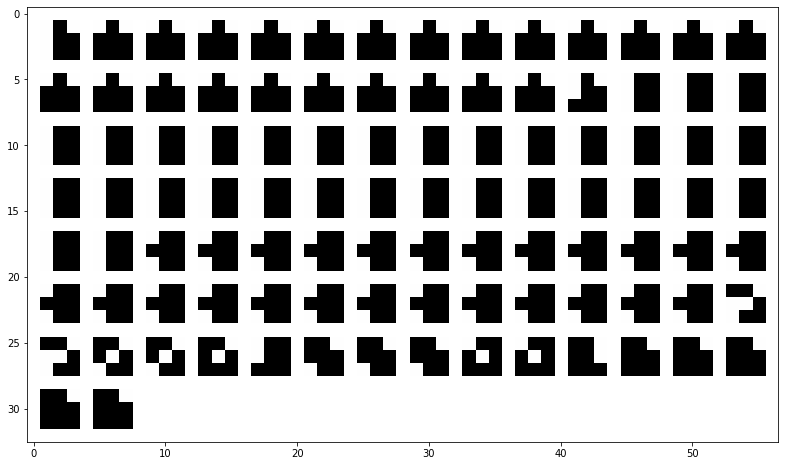

grid regions of 100 regions more=True or worst=False active for filter number: 30 :


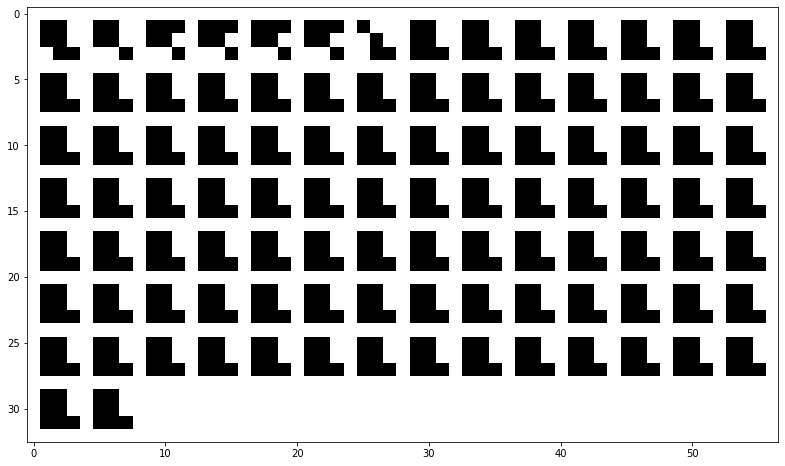

normalized regions:


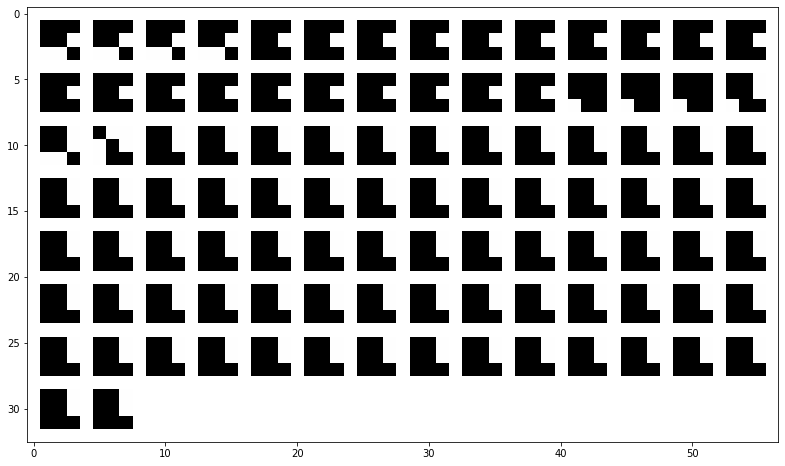

In [31]:
# regions and activation of interest
list_filter = list_filter_interest_layer1_mixt
regions = region_layer1_mixt_no_binary_stride
activations = activation_layer1_mixt_no_binary_stride
activations_normalized = activation_layer1_mixt_no_binary_normalized_stride

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

Interest of filters: [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60]
Consider 10% image regions = 100 images
Consider 10% image regions = 100 images
mean image:
mean regions of 100 regions more=True or worst=False active for filter number: 0 :


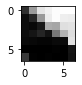

normalized region:


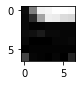

mean regions of 100 regions more=True or worst=False active for filter number: 5 :


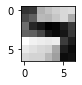

normalized region:


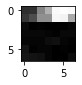

mean regions of 100 regions more=True or worst=False active for filter number: 10 :


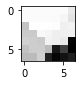

normalized region:


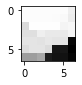

mean regions of 100 regions more=True or worst=False active for filter number: 15 :


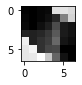

normalized region:


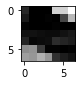

mean regions of 100 regions more=True or worst=False active for filter number: 20 :


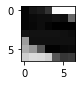

normalized region:


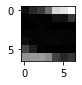

mean regions of 100 regions more=True or worst=False active for filter number: 25 :


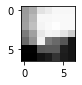

normalized region:


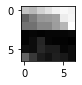

mean regions of 100 regions more=True or worst=False active for filter number: 30 :


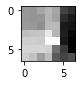

normalized region:


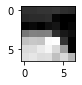

mean regions of 100 regions more=True or worst=False active for filter number: 35 :


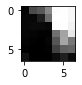

normalized region:


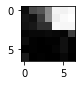

mean regions of 100 regions more=True or worst=False active for filter number: 40 :


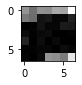

normalized region:


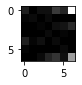

mean regions of 100 regions more=True or worst=False active for filter number: 45 :


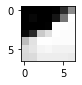

normalized region:


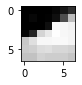

mean regions of 100 regions more=True or worst=False active for filter number: 50 :


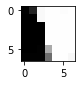

normalized region:


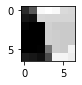

mean regions of 100 regions more=True or worst=False active for filter number: 55 :


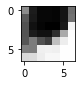

normalized region:


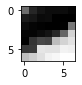

mean regions of 100 regions more=True or worst=False active for filter number: 60 :


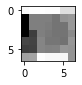

normalized region:


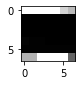

grid image
grid regions of 100 regions more=True or worst=False active for filter number: 0 :


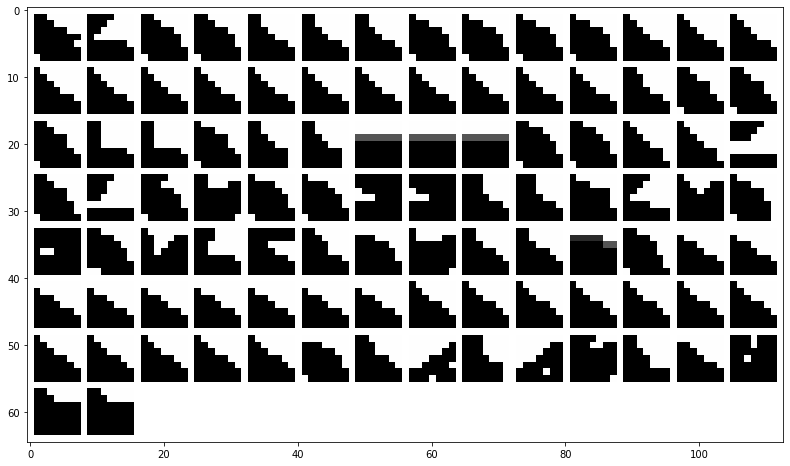

normalized regions:


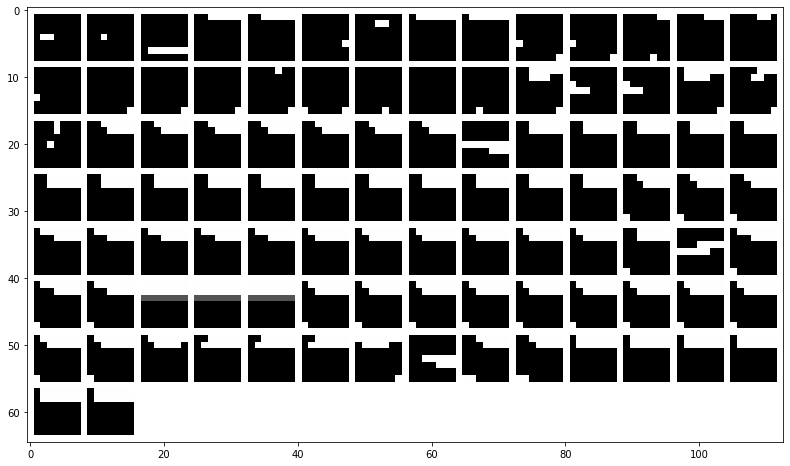

grid regions of 100 regions more=True or worst=False active for filter number: 5 :


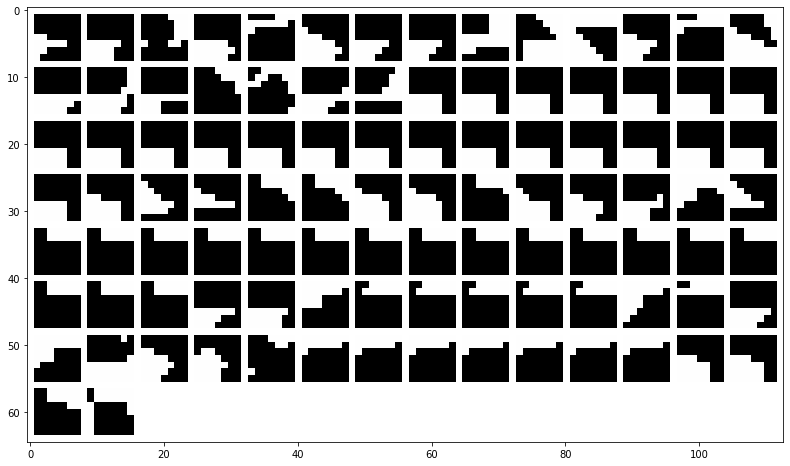

normalized regions:


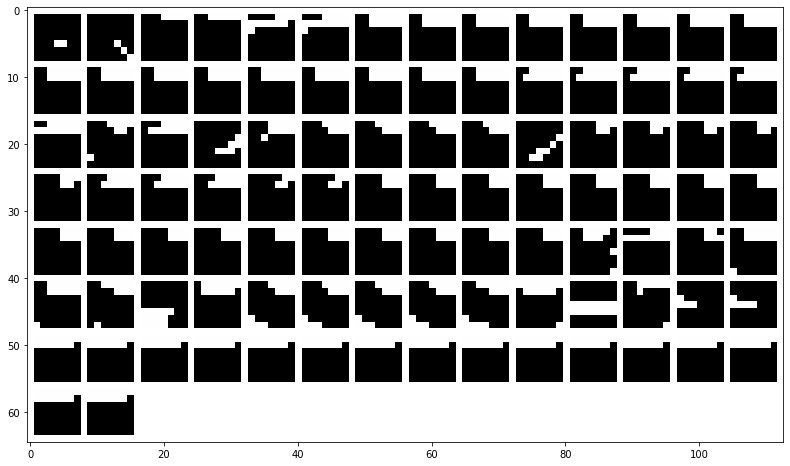

grid regions of 100 regions more=True or worst=False active for filter number: 10 :


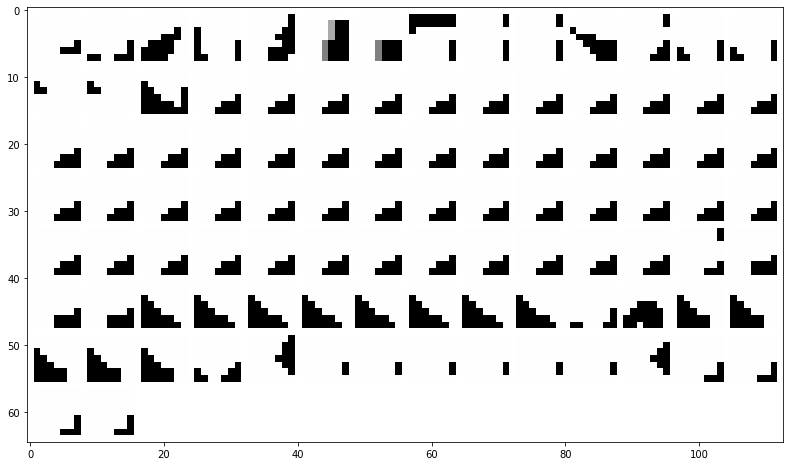

normalized regions:


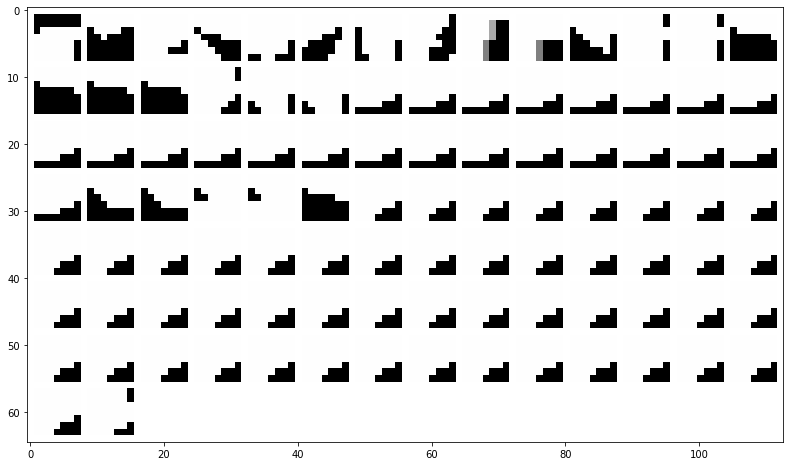

grid regions of 100 regions more=True or worst=False active for filter number: 15 :


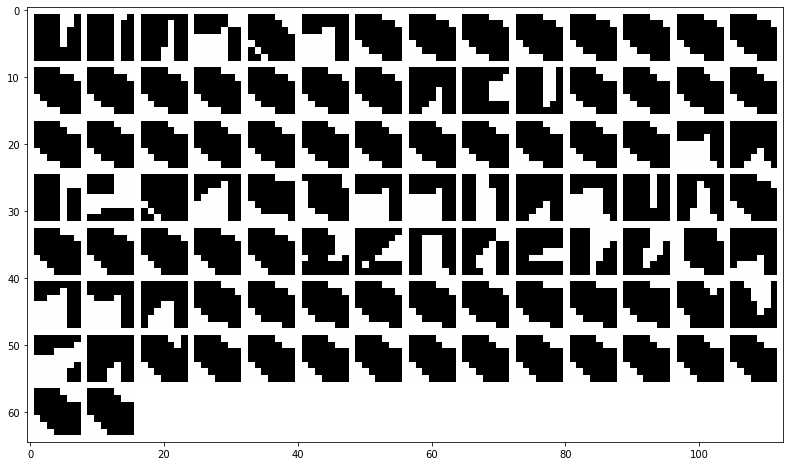

normalized regions:


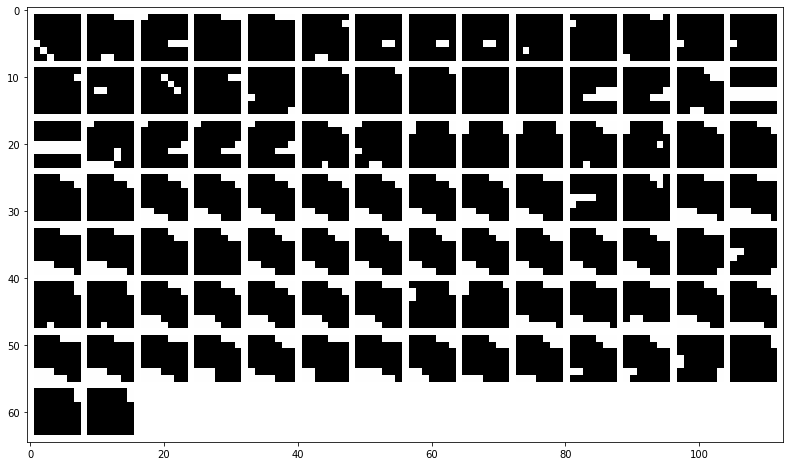

grid regions of 100 regions more=True or worst=False active for filter number: 20 :


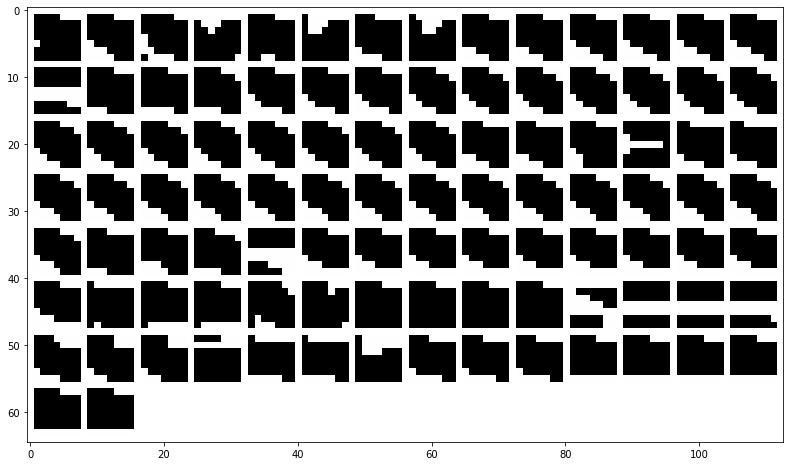

normalized regions:


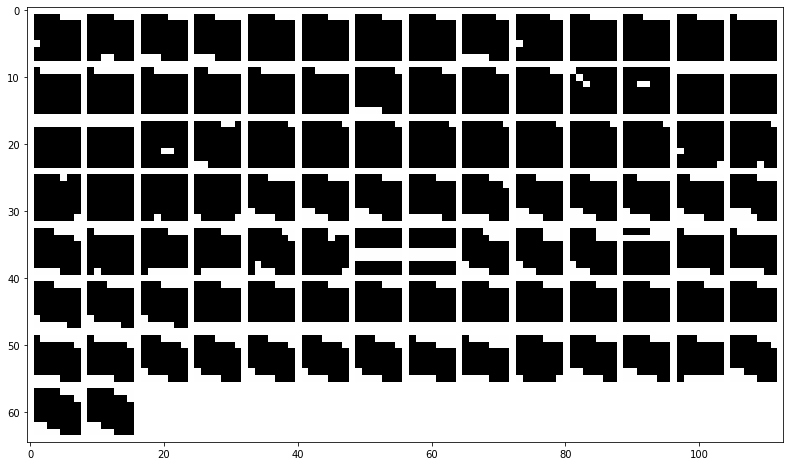

grid regions of 100 regions more=True or worst=False active for filter number: 25 :


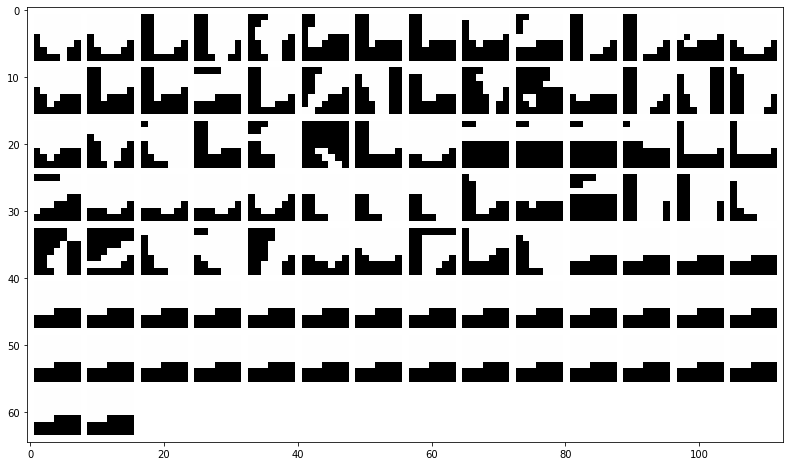

normalized regions:


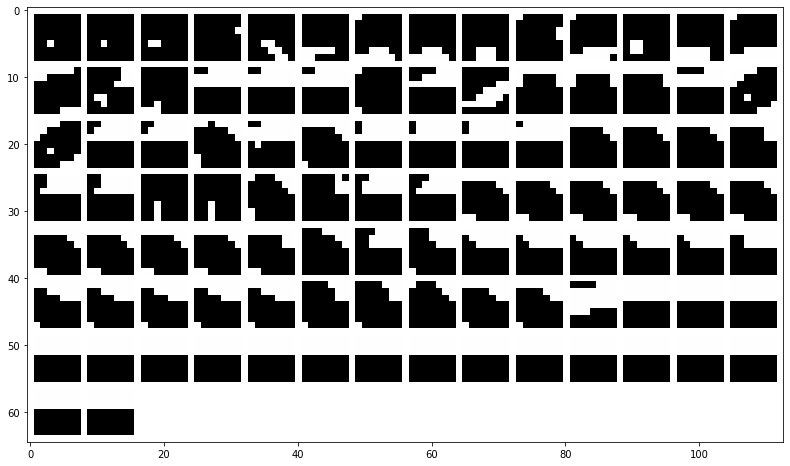

grid regions of 100 regions more=True or worst=False active for filter number: 30 :


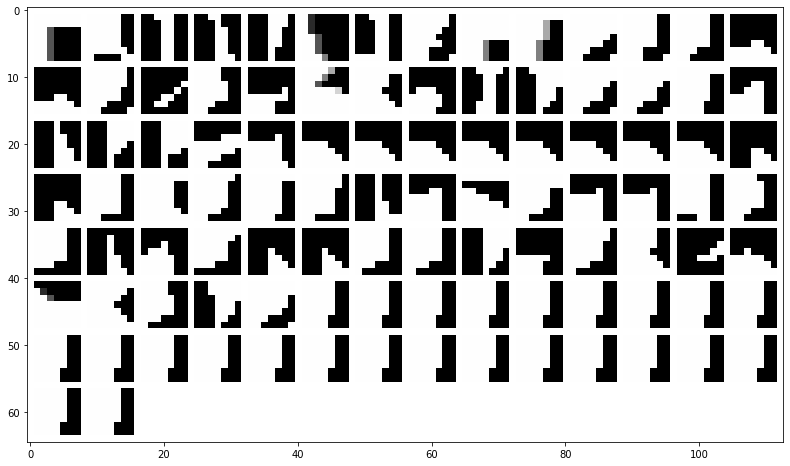

normalized regions:


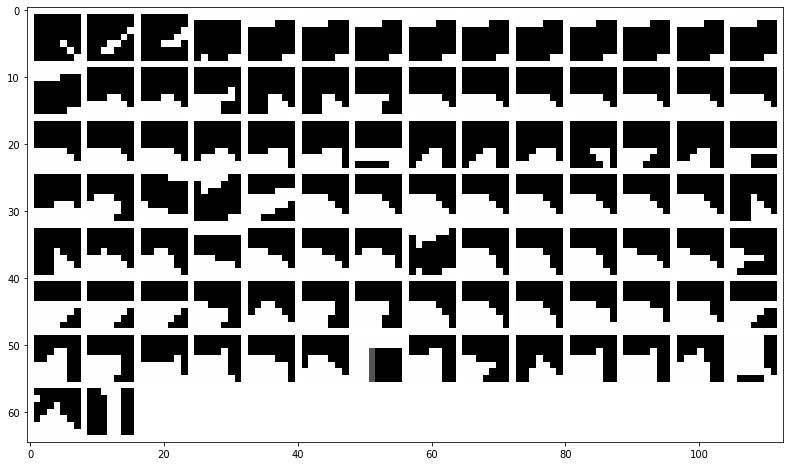

grid regions of 100 regions more=True or worst=False active for filter number: 35 :


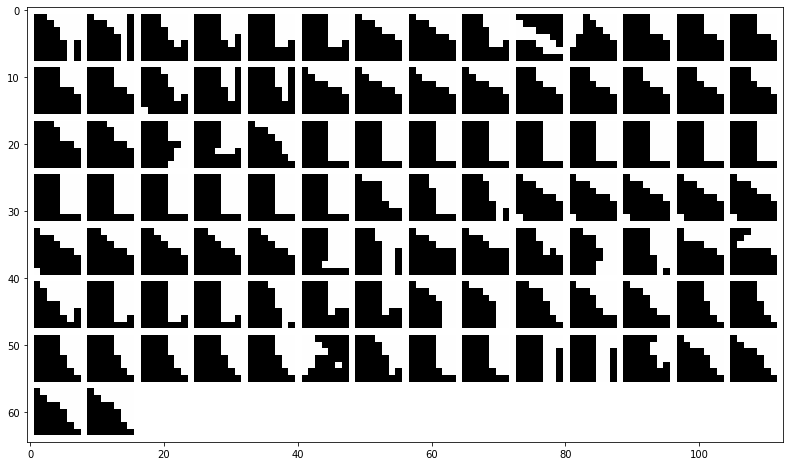

normalized regions:


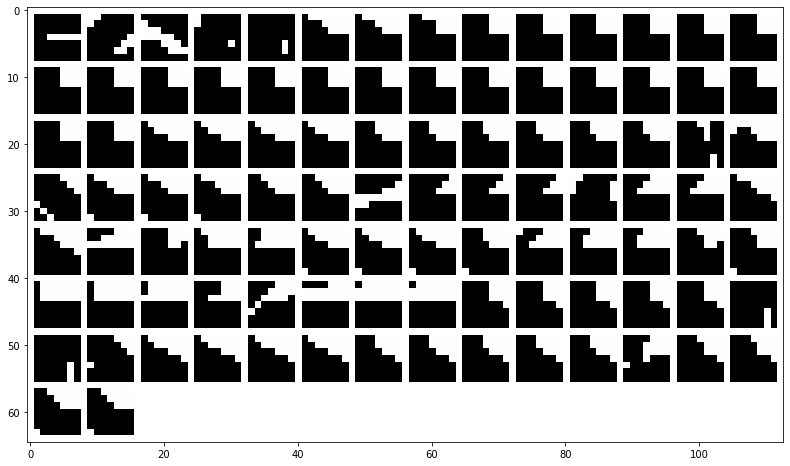

grid regions of 100 regions more=True or worst=False active for filter number: 40 :


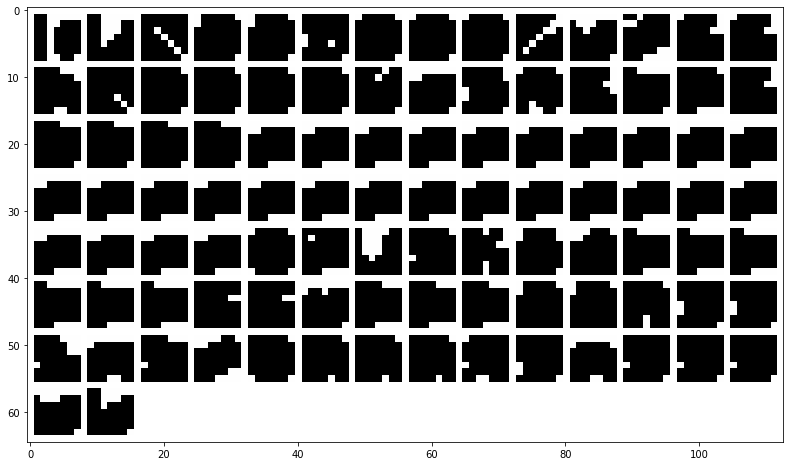

normalized regions:


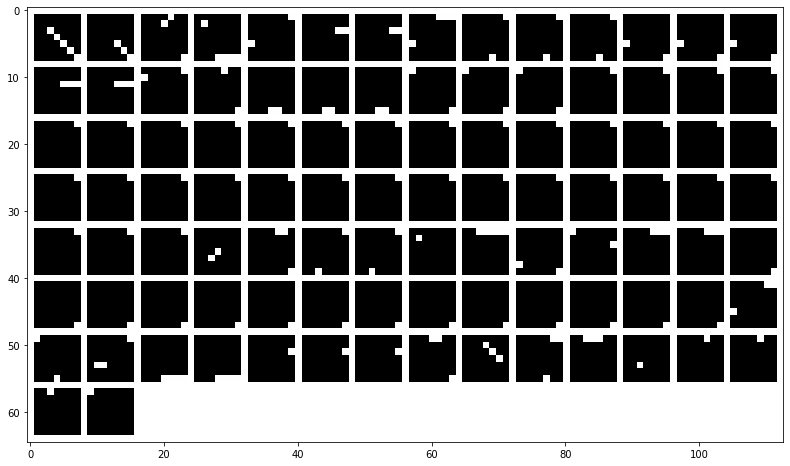

grid regions of 100 regions more=True or worst=False active for filter number: 45 :


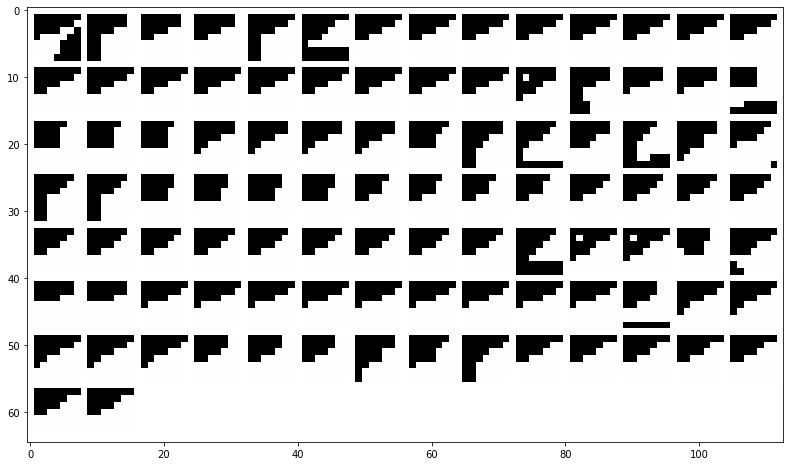

normalized regions:


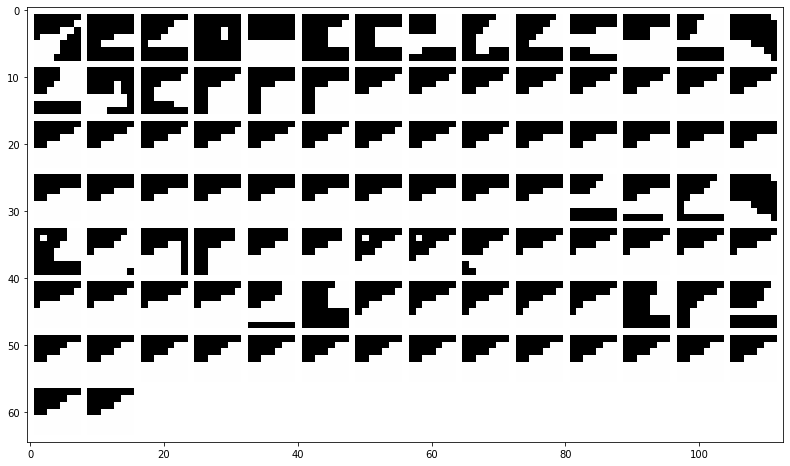

grid regions of 100 regions more=True or worst=False active for filter number: 50 :


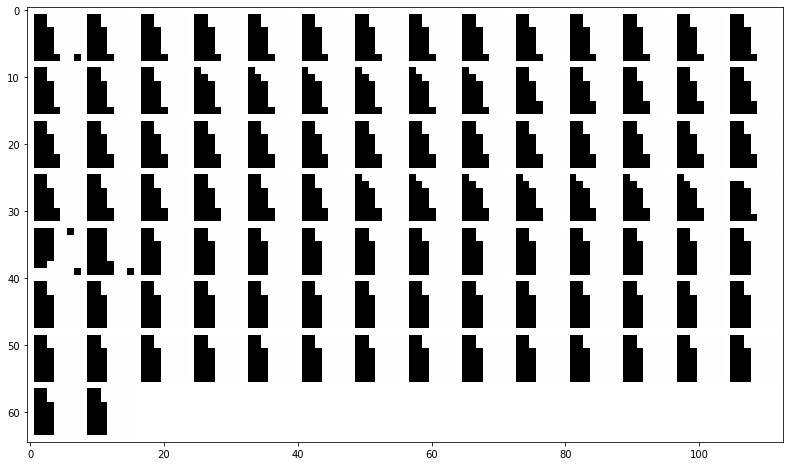

normalized regions:


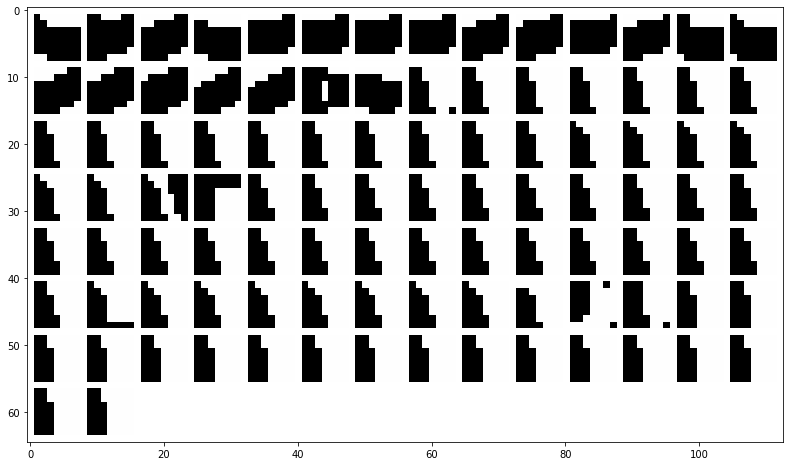

grid regions of 100 regions more=True or worst=False active for filter number: 55 :


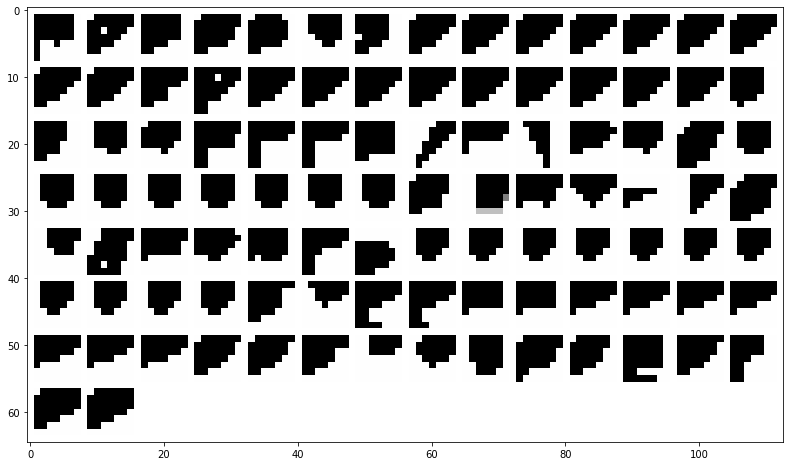

normalized regions:


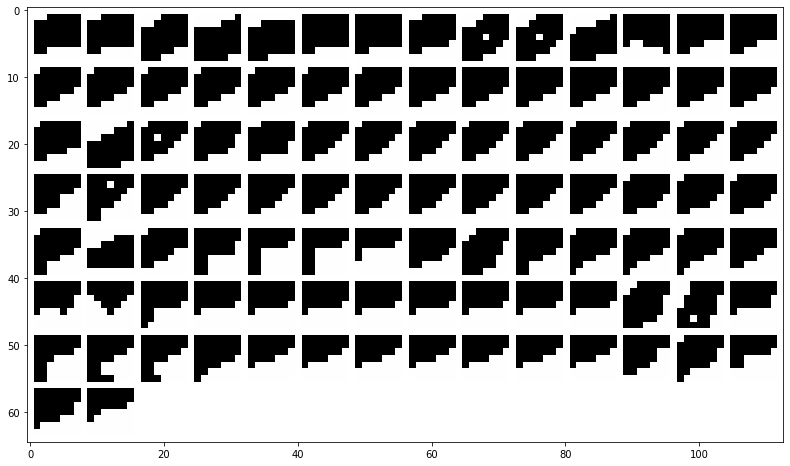

grid regions of 100 regions more=True or worst=False active for filter number: 60 :


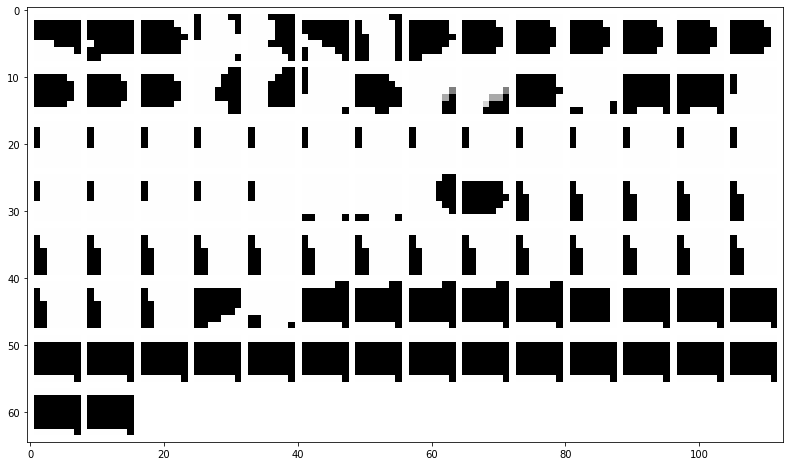

normalized regions:


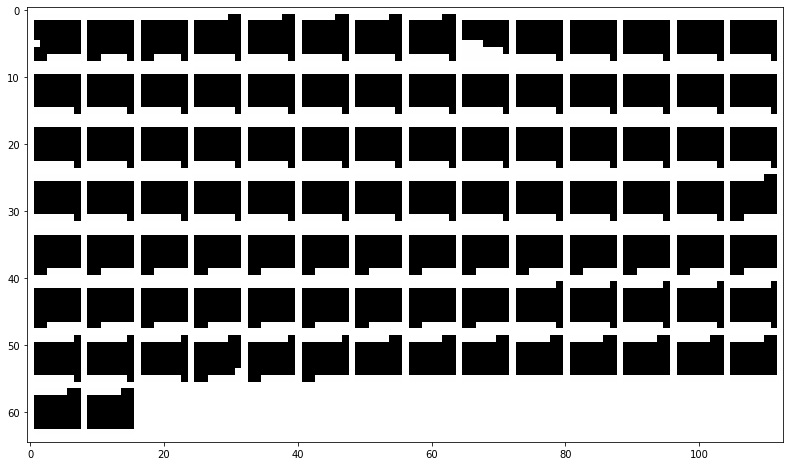

In [32]:
# regions and activation of interest
list_filter = list_filter_interest_layer2_mixt
regions = region_layer2_mixt_no_binary_stride
activations = activation_layer2_mixt_no_binary_stride
activations_normalized = activation_layer2_mixt_no_binary_normalized_stride

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

Interest of filters: [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 80, 85, 90, 95, 100, 105, 110, 115, 120, 125]
Consider 10% image regions = 100 images
Consider 10% image regions = 100 images
mean image:
mean regions of 100 regions more=True or worst=False active for filter number: 0 :


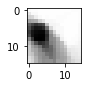

normalized region:


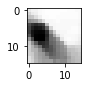

mean regions of 100 regions more=True or worst=False active for filter number: 5 :


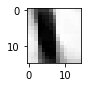

normalized region:


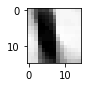

mean regions of 100 regions more=True or worst=False active for filter number: 10 :


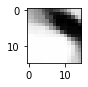

normalized region:


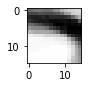

mean regions of 100 regions more=True or worst=False active for filter number: 15 :


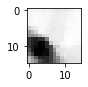

normalized region:


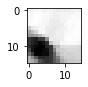

mean regions of 100 regions more=True or worst=False active for filter number: 20 :


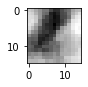

normalized region:


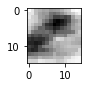

mean regions of 100 regions more=True or worst=False active for filter number: 25 :


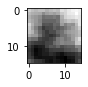

normalized region:


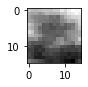

mean regions of 100 regions more=True or worst=False active for filter number: 30 :


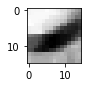

normalized region:


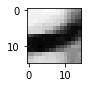

mean regions of 100 regions more=True or worst=False active for filter number: 35 :


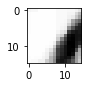

normalized region:


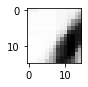

mean regions of 100 regions more=True or worst=False active for filter number: 40 :


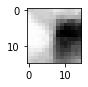

normalized region:


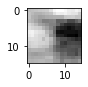

mean regions of 100 regions more=True or worst=False active for filter number: 45 :


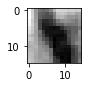

normalized region:


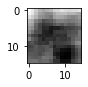

mean regions of 100 regions more=True or worst=False active for filter number: 50 :


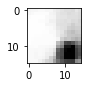

normalized region:


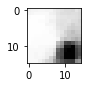

mean regions of 100 regions more=True or worst=False active for filter number: 55 :


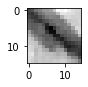

normalized region:


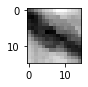

mean regions of 100 regions more=True or worst=False active for filter number: 60 :


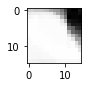

normalized region:


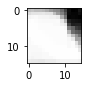

mean regions of 100 regions more=True or worst=False active for filter number: 65 :


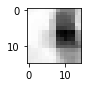

normalized region:


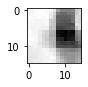

mean regions of 100 regions more=True or worst=False active for filter number: 70 :


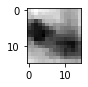

normalized region:


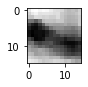

mean regions of 100 regions more=True or worst=False active for filter number: 80 :


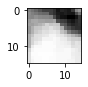

normalized region:


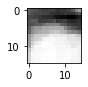

mean regions of 100 regions more=True or worst=False active for filter number: 85 :


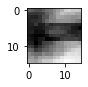

normalized region:


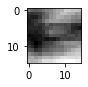

mean regions of 100 regions more=True or worst=False active for filter number: 90 :


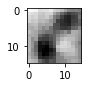

normalized region:


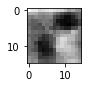

mean regions of 100 regions more=True or worst=False active for filter number: 95 :


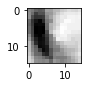

normalized region:


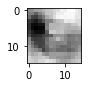

mean regions of 100 regions more=True or worst=False active for filter number: 100 :


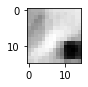

normalized region:


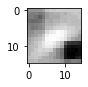

mean regions of 100 regions more=True or worst=False active for filter number: 105 :


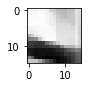

normalized region:


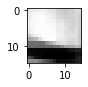

mean regions of 100 regions more=True or worst=False active for filter number: 110 :


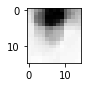

normalized region:


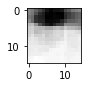

mean regions of 100 regions more=True or worst=False active for filter number: 115 :


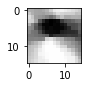

normalized region:


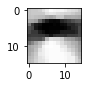

mean regions of 100 regions more=True or worst=False active for filter number: 120 :


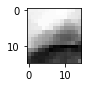

normalized region:


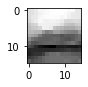

mean regions of 100 regions more=True or worst=False active for filter number: 125 :


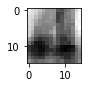

normalized region:


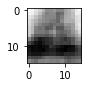

grid image
grid regions of 100 regions more=True or worst=False active for filter number: 0 :


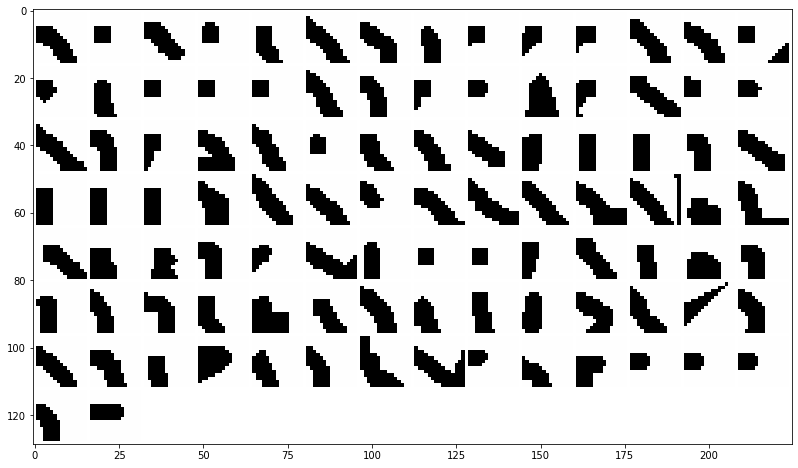

normalized regions:


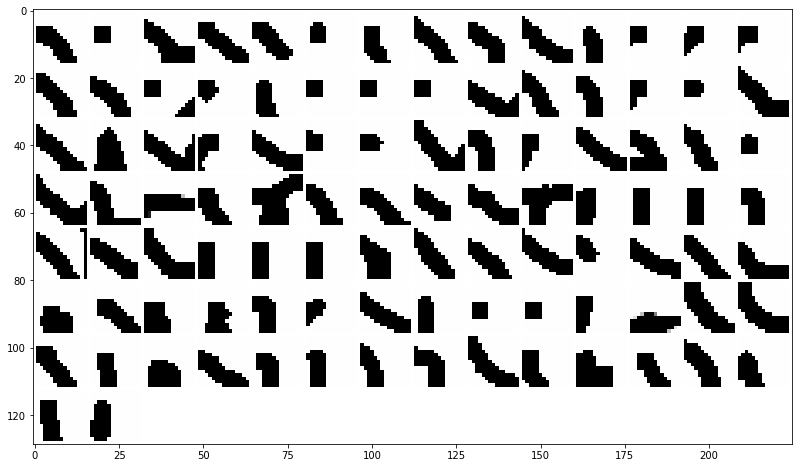

grid regions of 100 regions more=True or worst=False active for filter number: 5 :


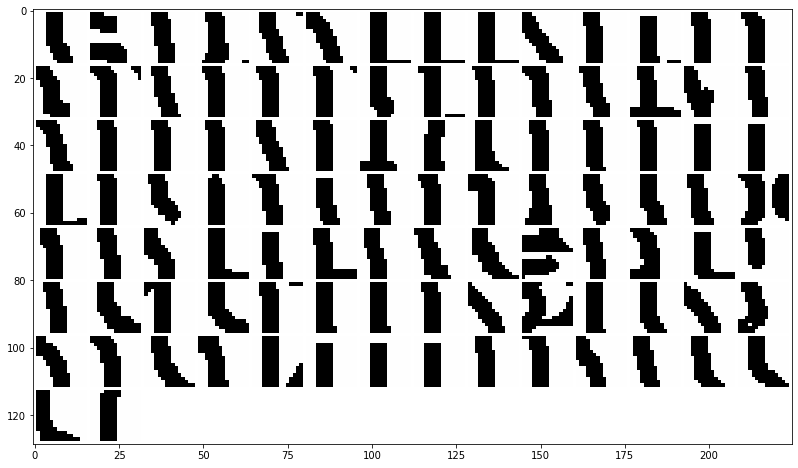

normalized regions:


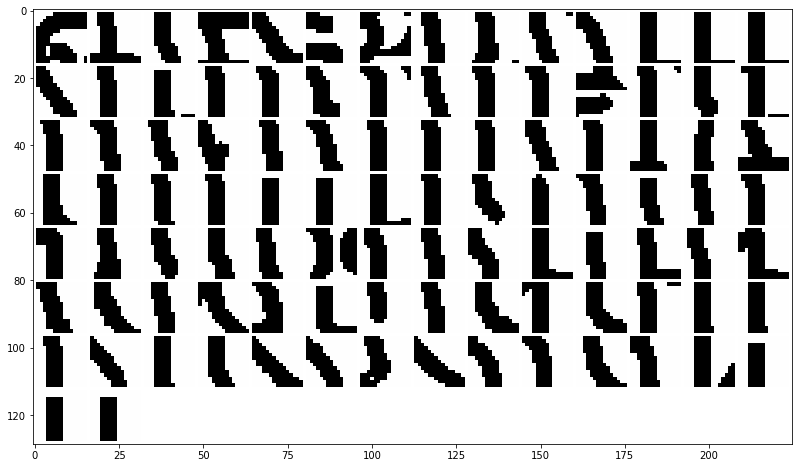

grid regions of 100 regions more=True or worst=False active for filter number: 10 :


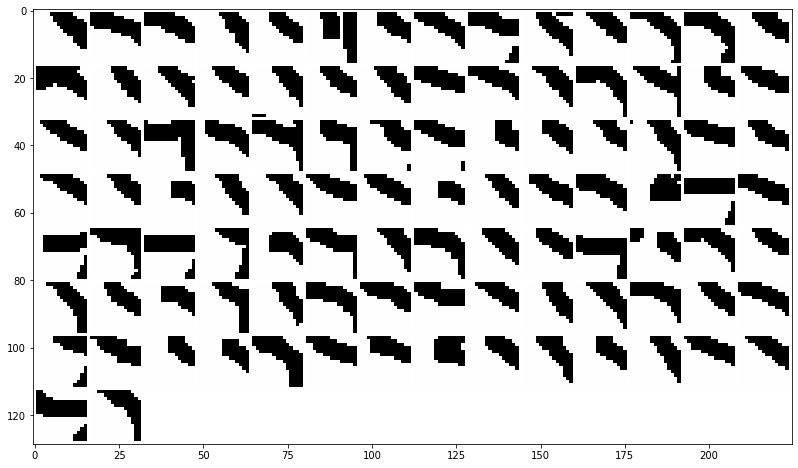

normalized regions:


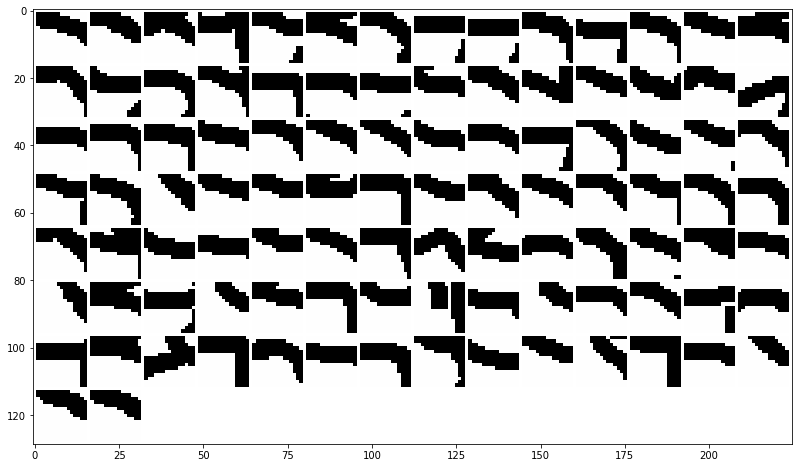

grid regions of 100 regions more=True or worst=False active for filter number: 15 :


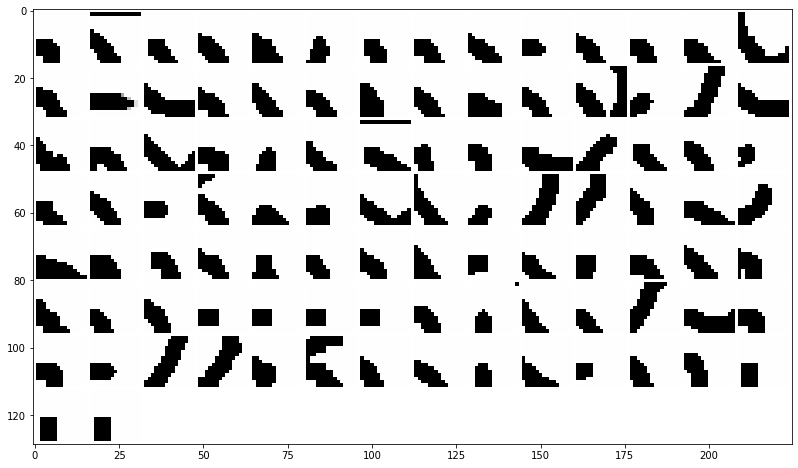

normalized regions:


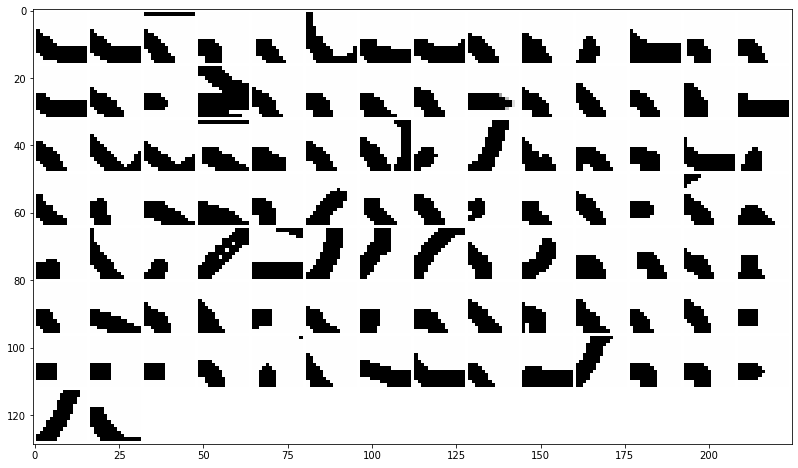

grid regions of 100 regions more=True or worst=False active for filter number: 20 :


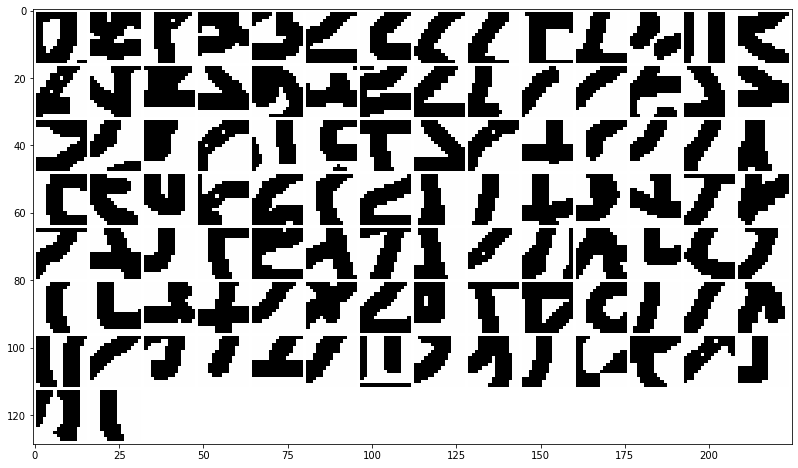

normalized regions:


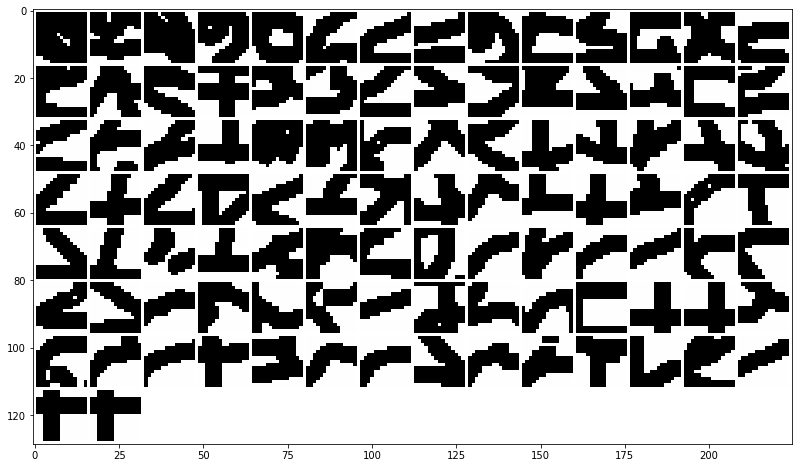

grid regions of 100 regions more=True or worst=False active for filter number: 25 :


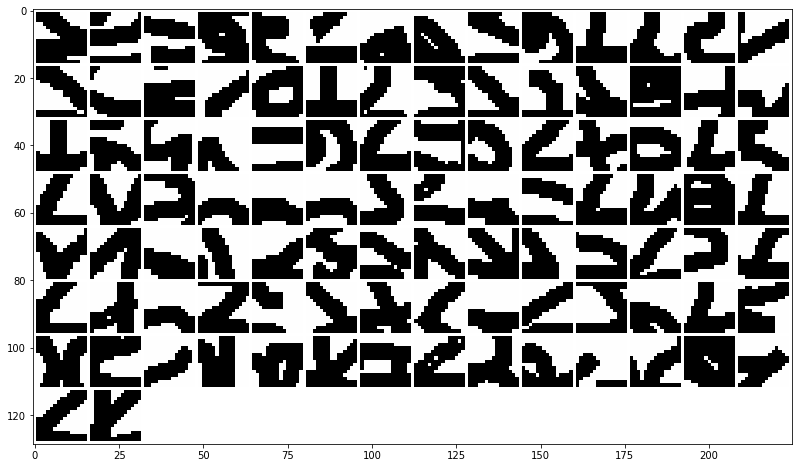

normalized regions:


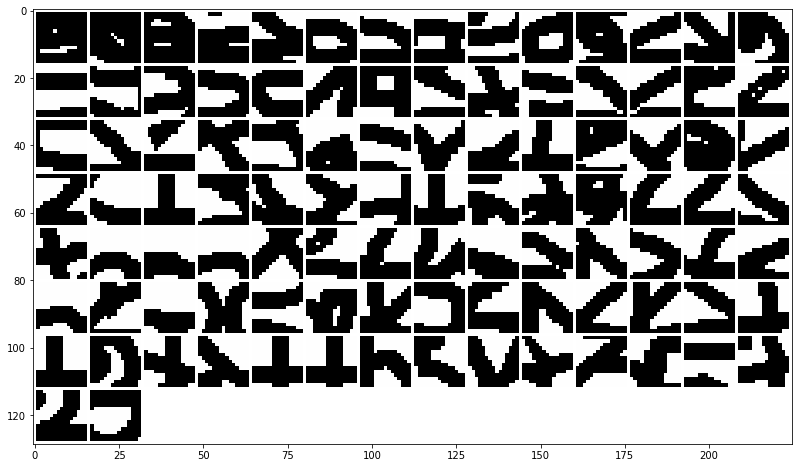

grid regions of 100 regions more=True or worst=False active for filter number: 30 :


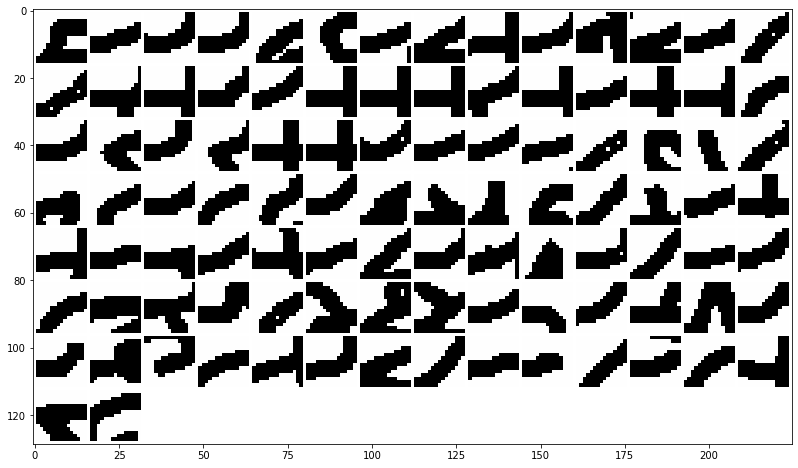

normalized regions:


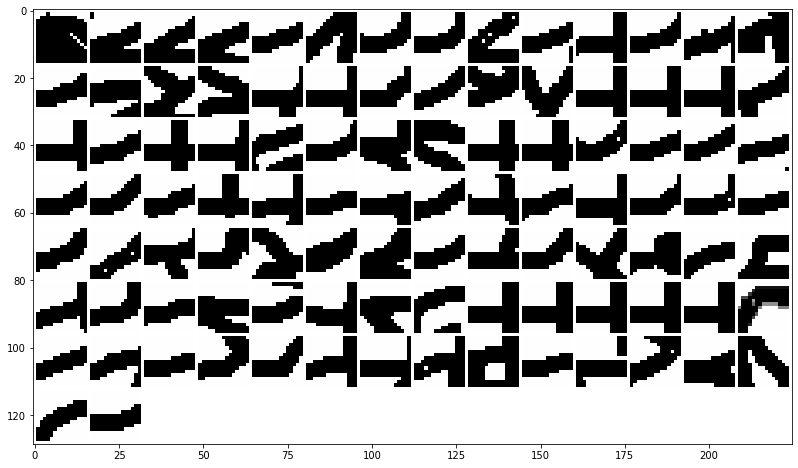

grid regions of 100 regions more=True or worst=False active for filter number: 35 :


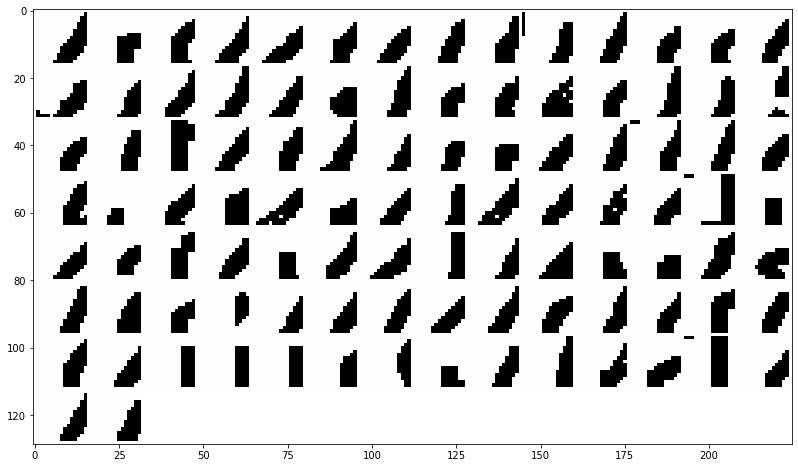

normalized regions:


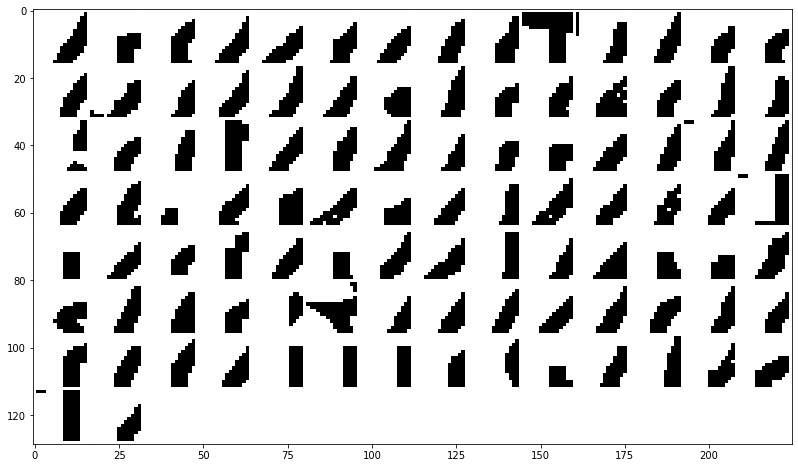

grid regions of 100 regions more=True or worst=False active for filter number: 40 :


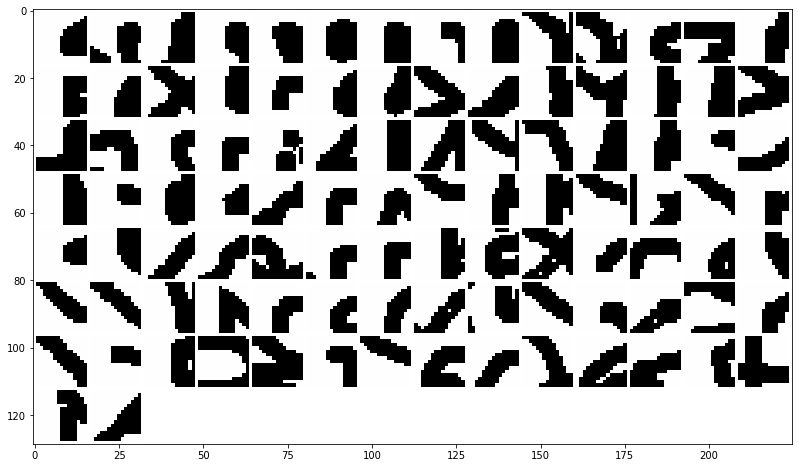

normalized regions:


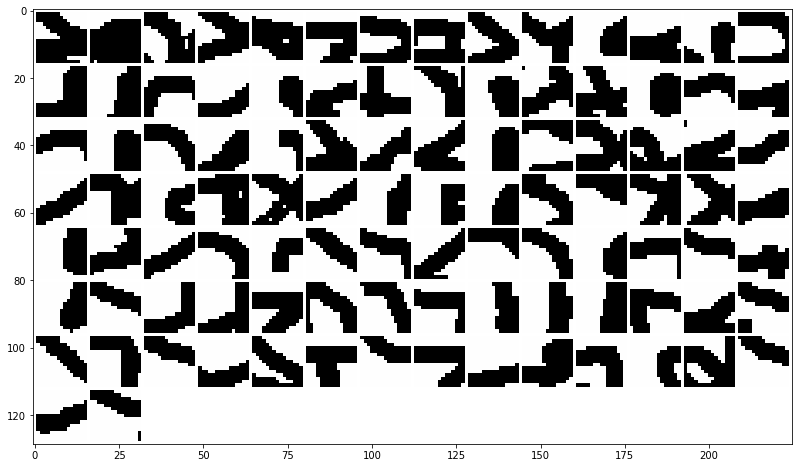

grid regions of 100 regions more=True or worst=False active for filter number: 45 :


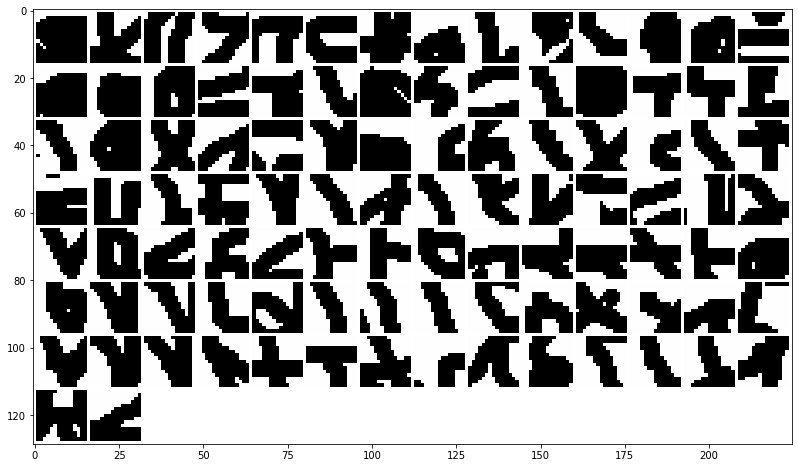

normalized regions:


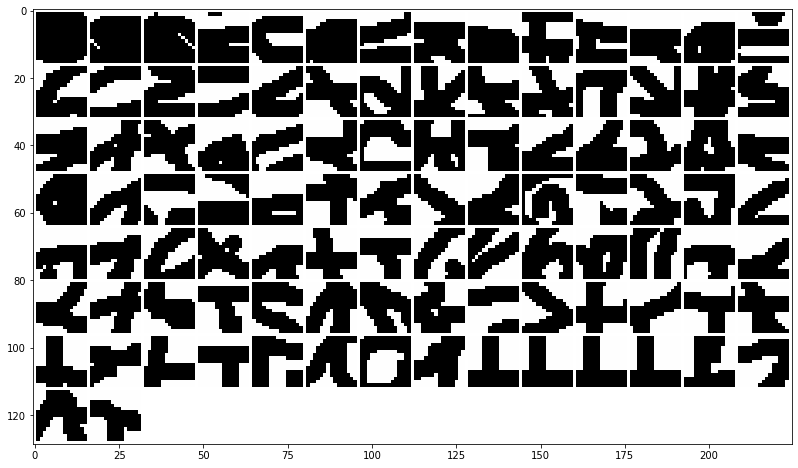

grid regions of 100 regions more=True or worst=False active for filter number: 50 :


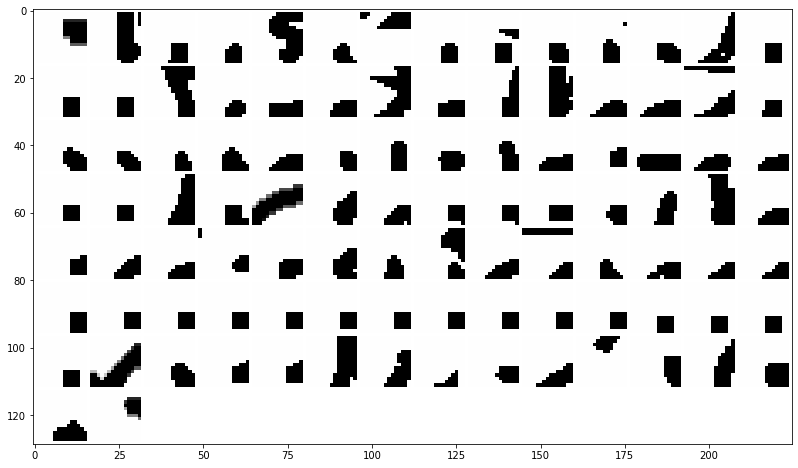

normalized regions:


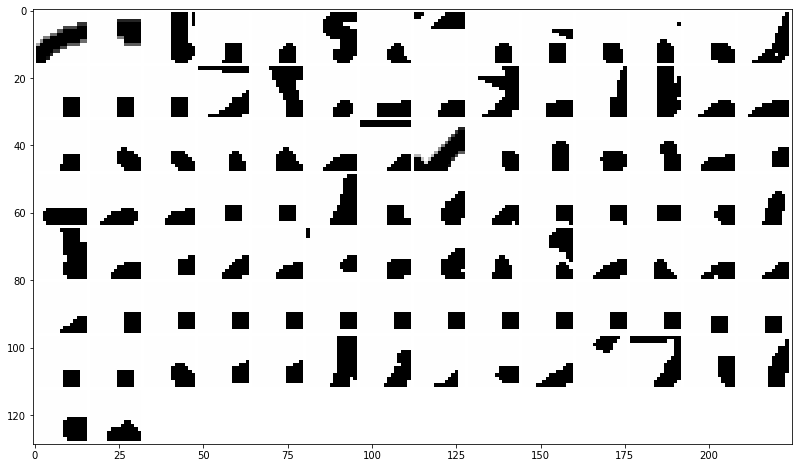

grid regions of 100 regions more=True or worst=False active for filter number: 55 :


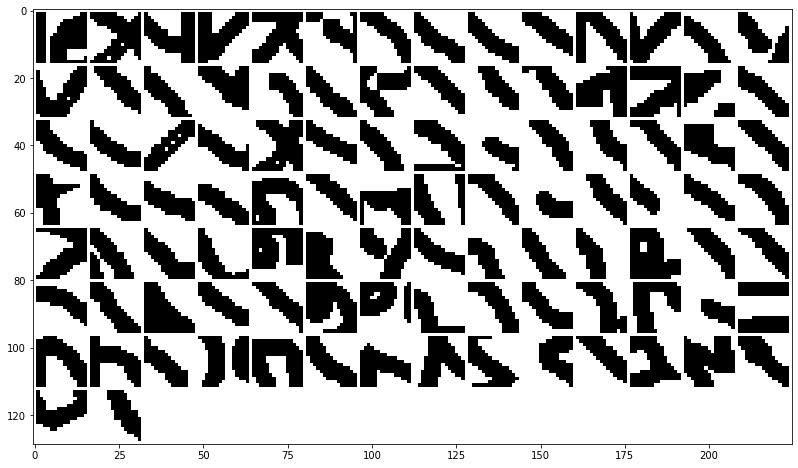

normalized regions:


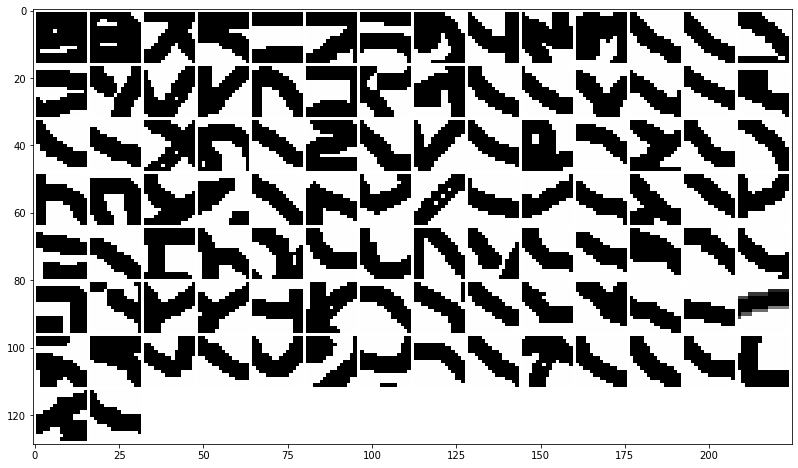

grid regions of 100 regions more=True or worst=False active for filter number: 60 :


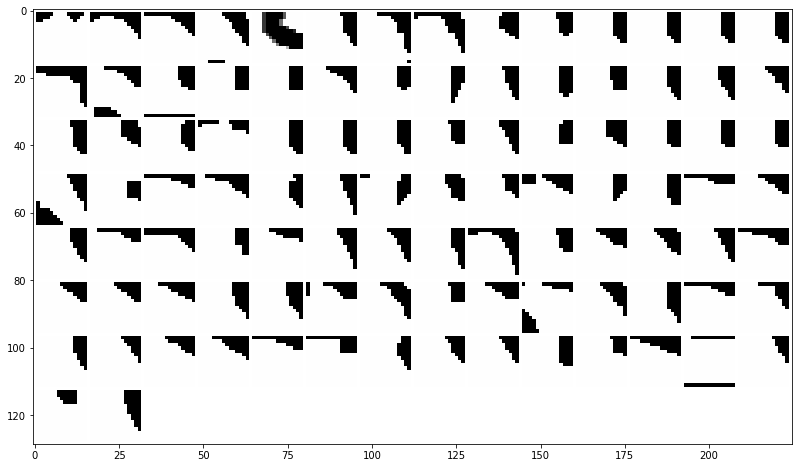

normalized regions:


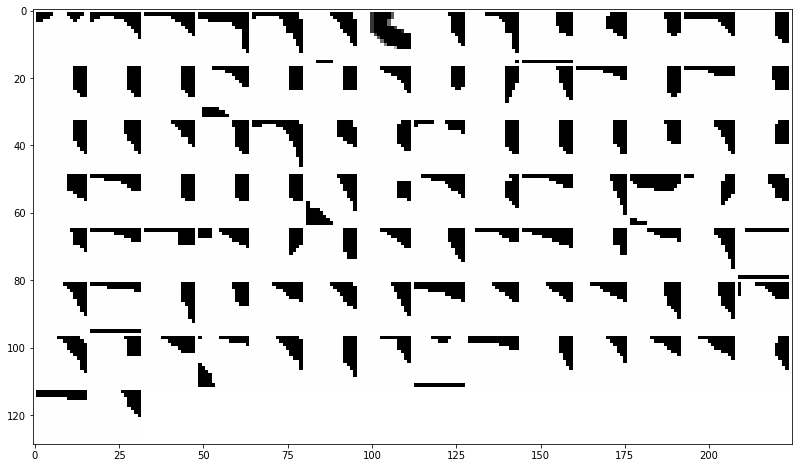

grid regions of 100 regions more=True or worst=False active for filter number: 65 :


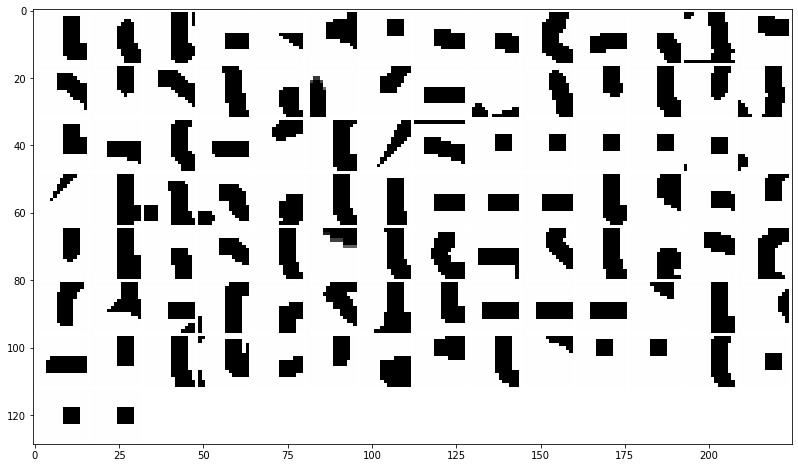

normalized regions:


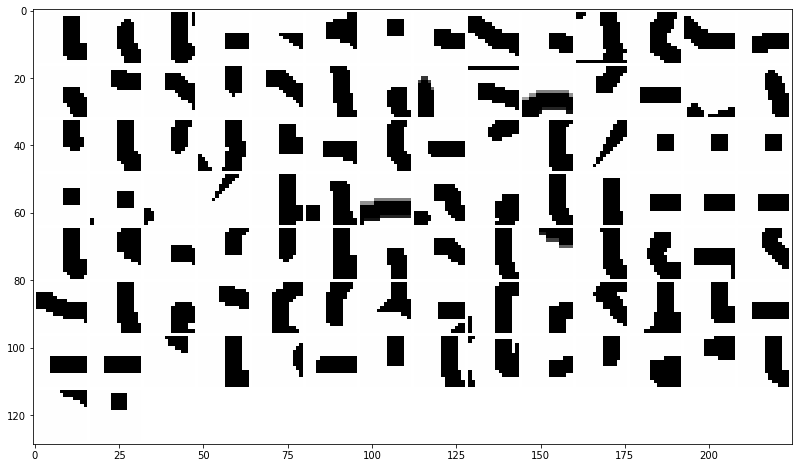

grid regions of 100 regions more=True or worst=False active for filter number: 70 :


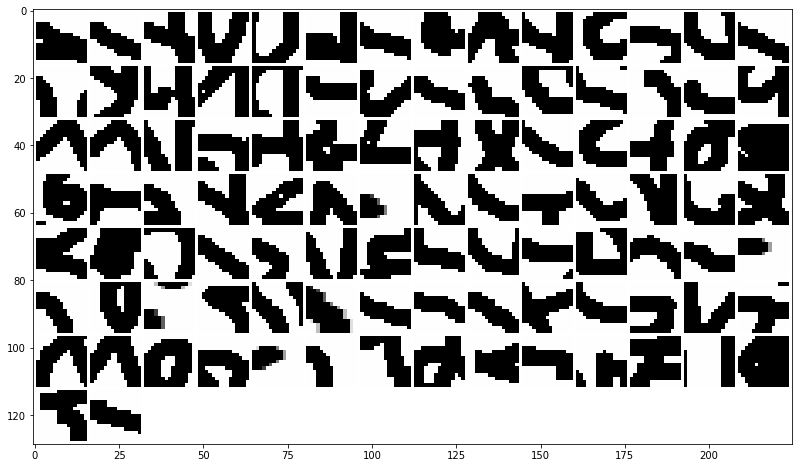

normalized regions:


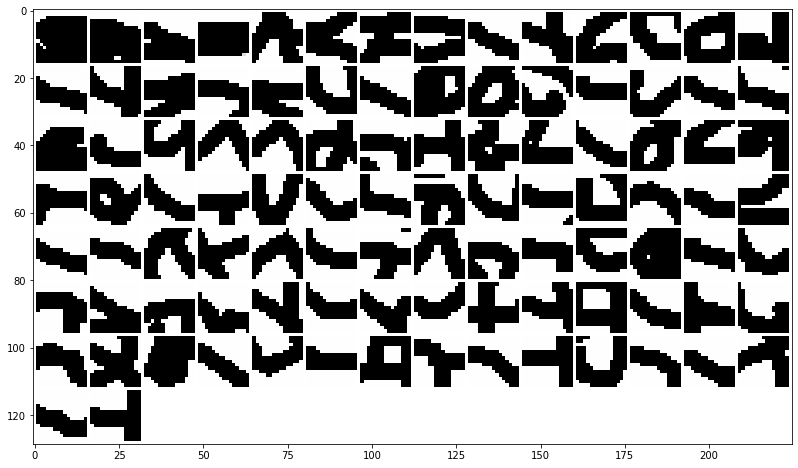

grid regions of 100 regions more=True or worst=False active for filter number: 80 :


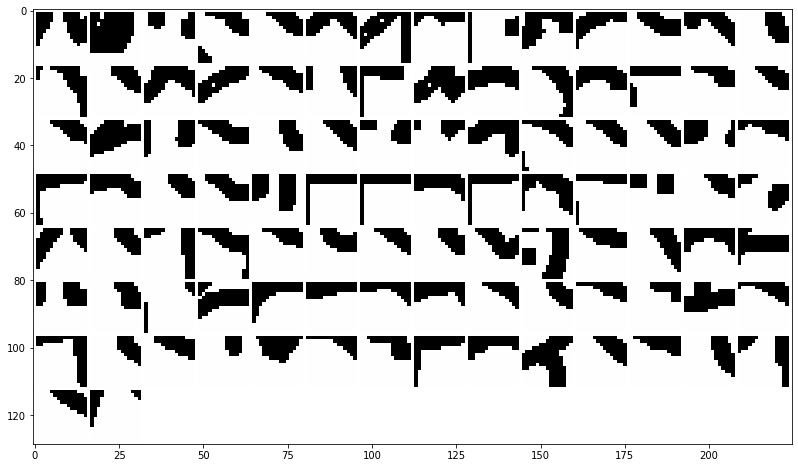

normalized regions:


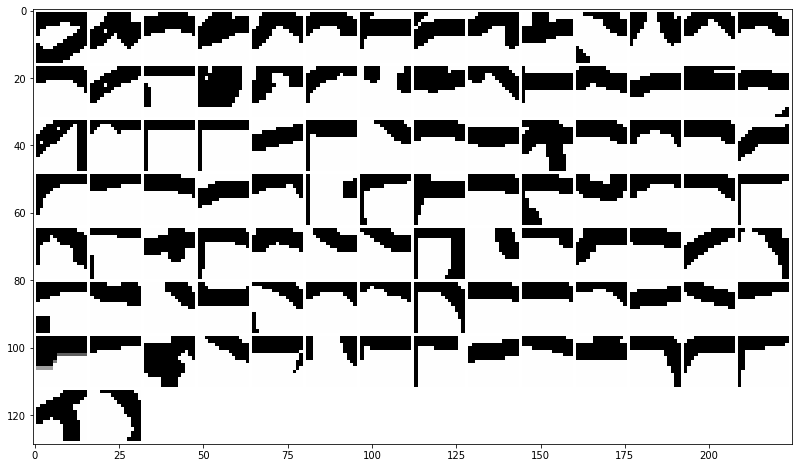

grid regions of 100 regions more=True or worst=False active for filter number: 85 :


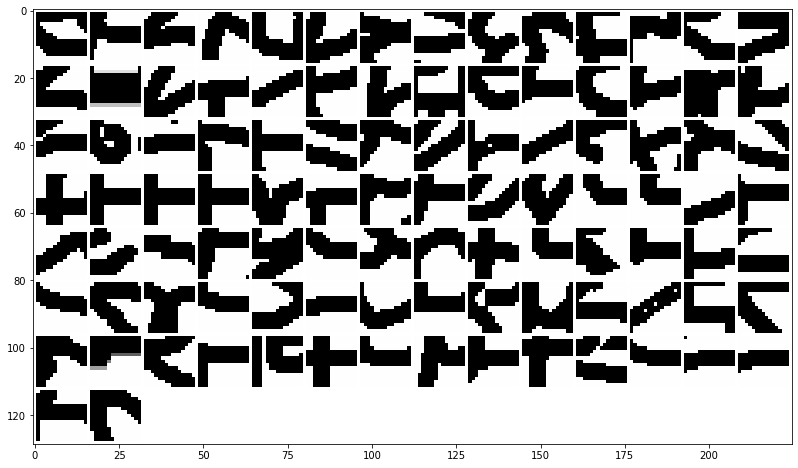

normalized regions:


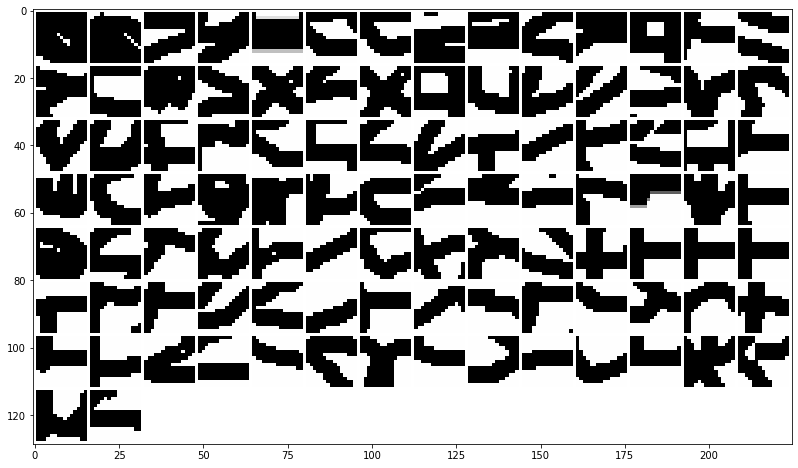

grid regions of 100 regions more=True or worst=False active for filter number: 90 :


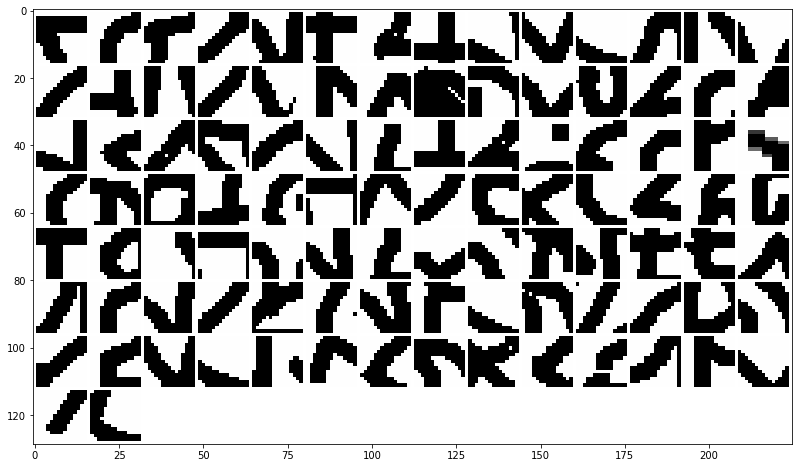

normalized regions:


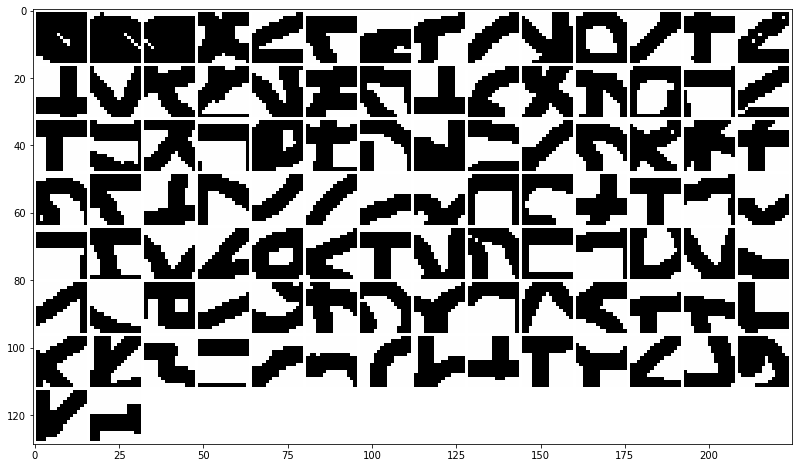

grid regions of 100 regions more=True or worst=False active for filter number: 95 :


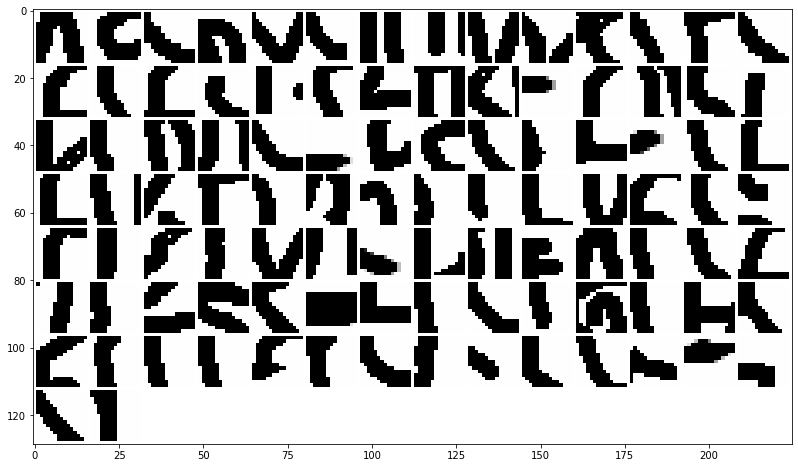

normalized regions:


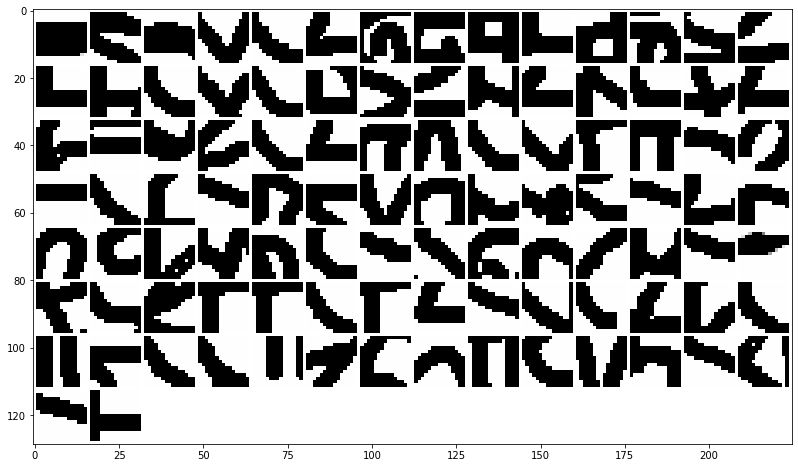

grid regions of 100 regions more=True or worst=False active for filter number: 100 :


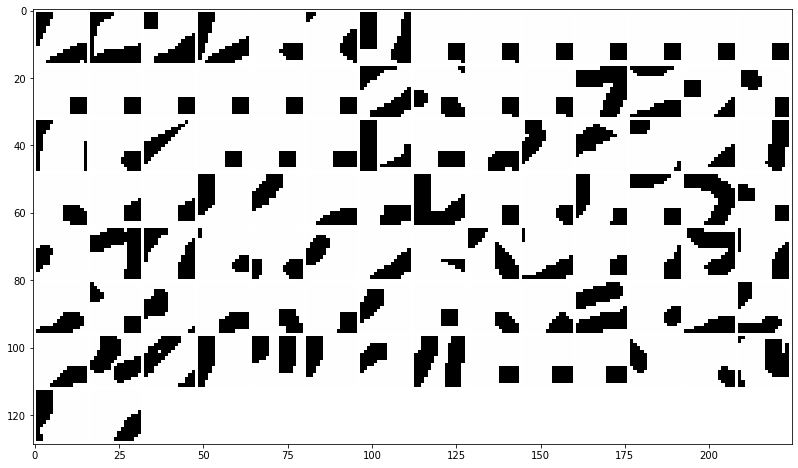

normalized regions:


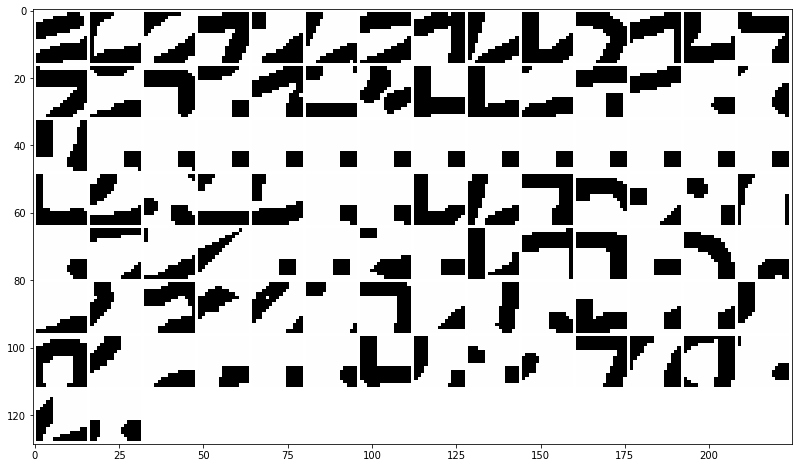

grid regions of 100 regions more=True or worst=False active for filter number: 105 :


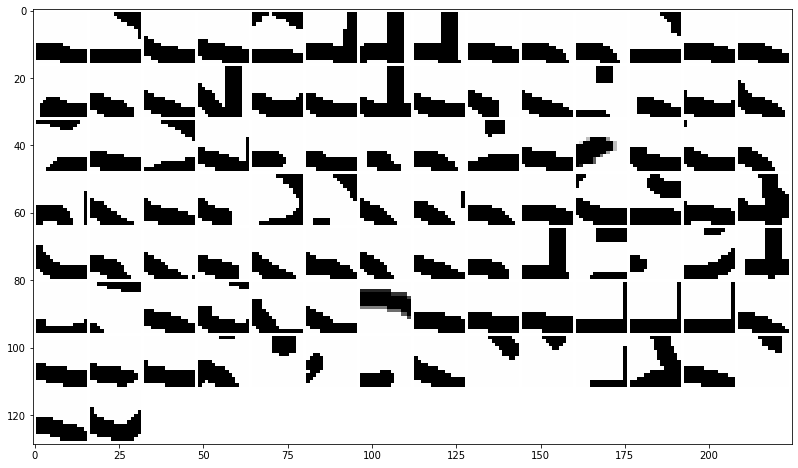

normalized regions:


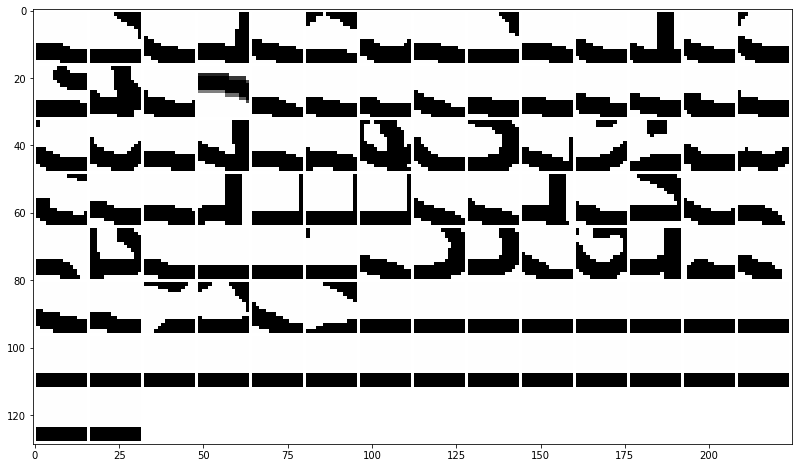

grid regions of 100 regions more=True or worst=False active for filter number: 110 :


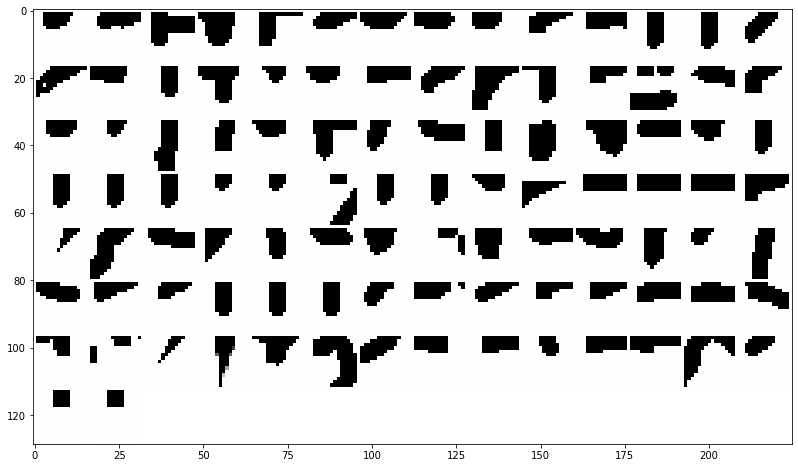

normalized regions:


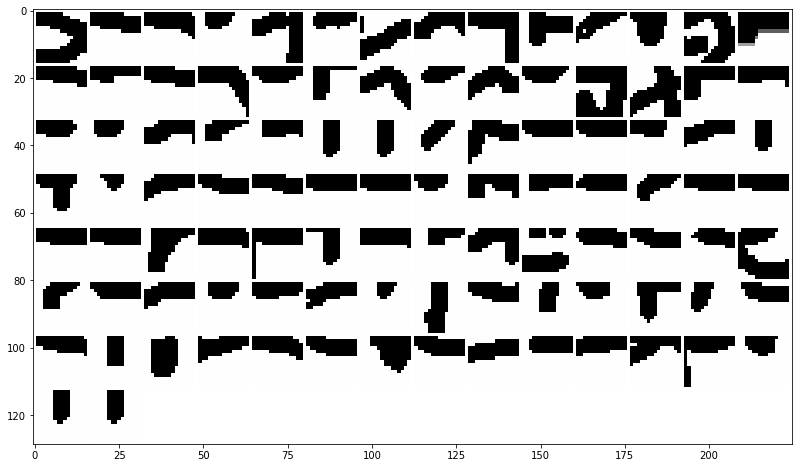

grid regions of 100 regions more=True or worst=False active for filter number: 115 :


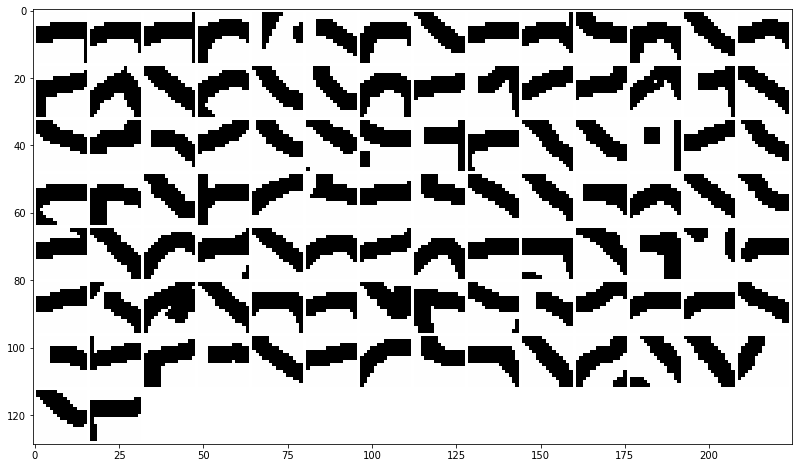

normalized regions:


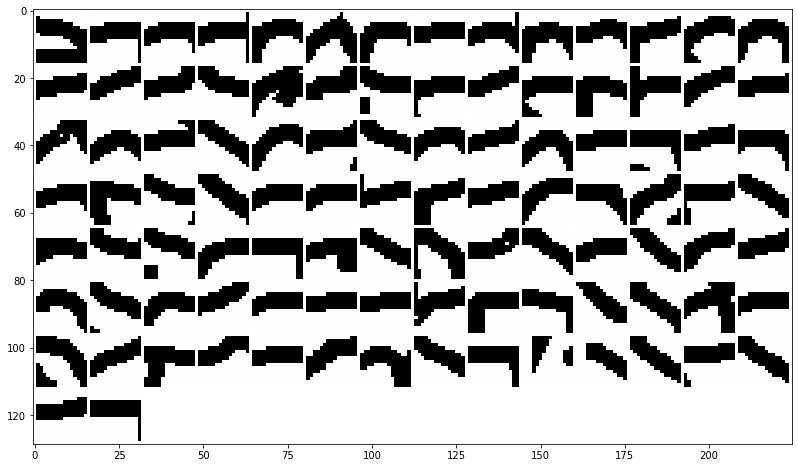

grid regions of 100 regions more=True or worst=False active for filter number: 120 :


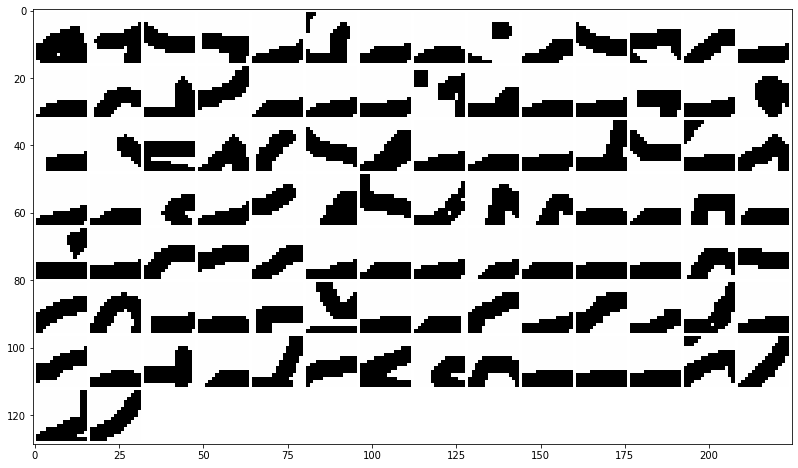

normalized regions:


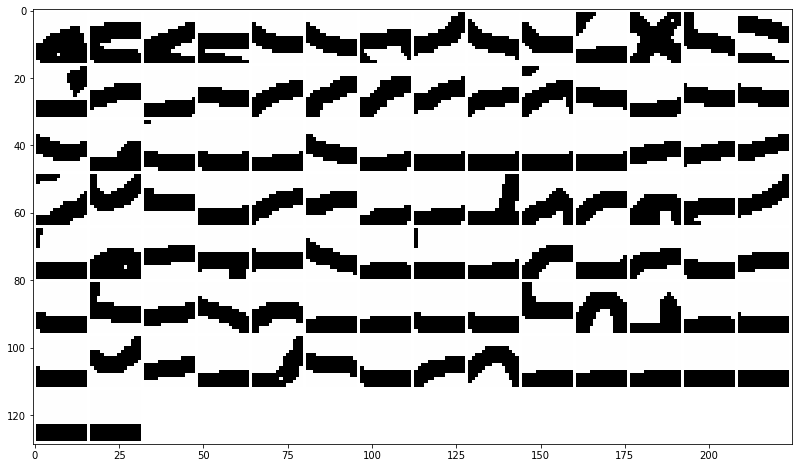

grid regions of 100 regions more=True or worst=False active for filter number: 125 :


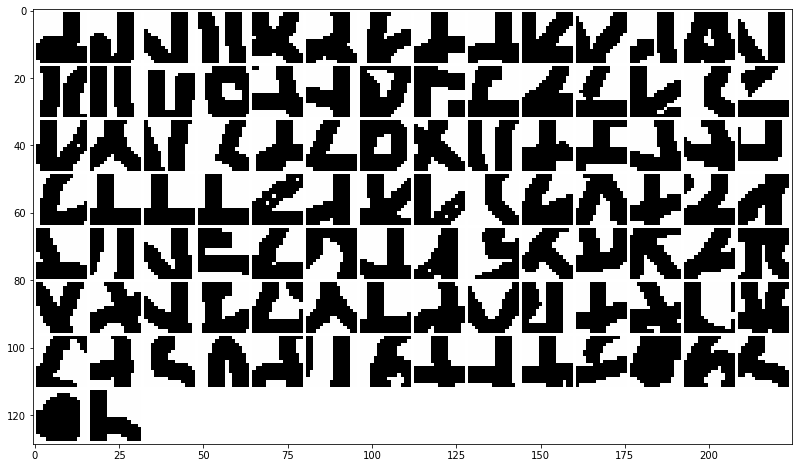

normalized regions:


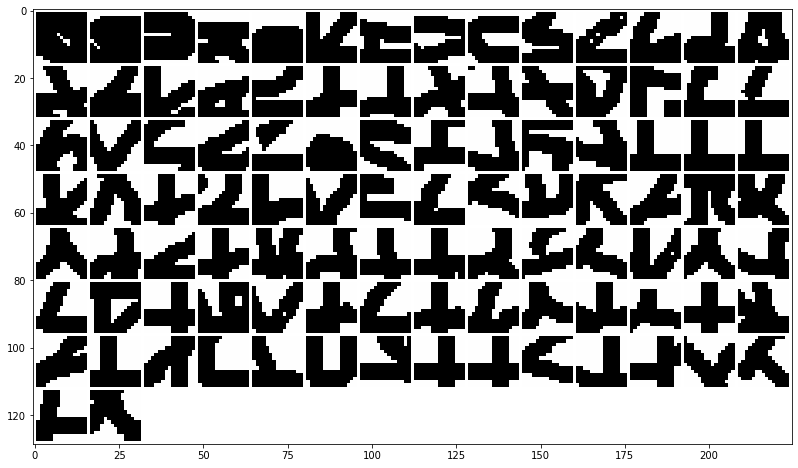

In [38]:
# regions and activation of interest
list_filter = list_filter_interest_layer3_mixt
regions = region_layer3_mixt_no_binary_stride
activations = activation_layer3_mixt_no_binary_stride
activations_normalized = activation_layer3_mixt_no_binary_normalized_stride

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

In [39]:
# regions and activation of interest
list_filter = list_filter_interest_layer4_mixt
regions = region_layer4_mixt_no_binary_stride
activations = activation_layer4_mixt_no_binary_stride
activations_normalized = activation_layer4_mixt_no_binary_normalized_stride

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

Output hidden; open in https://colab.research.google.com to view.

Interest of filters: [0, 5, 10, 15, 20, 25, 30]
Consider 10% image regions = 100 images
Consider 10% image regions = 100 images
mean image:
mean regions of 100 regions more=True or worst=False active for filter number: 0 :


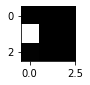

normalized region:


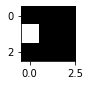

mean regions of 100 regions more=True or worst=False active for filter number: 5 :


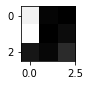

normalized region:


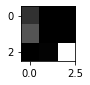

mean regions of 100 regions more=True or worst=False active for filter number: 10 :


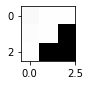

normalized region:


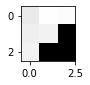

mean regions of 100 regions more=True or worst=False active for filter number: 15 :


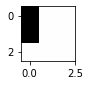

normalized region:


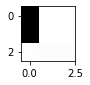

mean regions of 100 regions more=True or worst=False active for filter number: 20 :


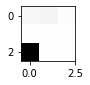

normalized region:


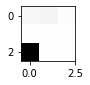

mean regions of 100 regions more=True or worst=False active for filter number: 25 :


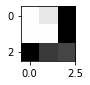

normalized region:


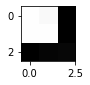

mean regions of 100 regions more=True or worst=False active for filter number: 30 :


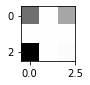

normalized region:


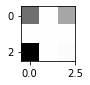

grid image
grid regions of 100 regions more=True or worst=False active for filter number: 0 :


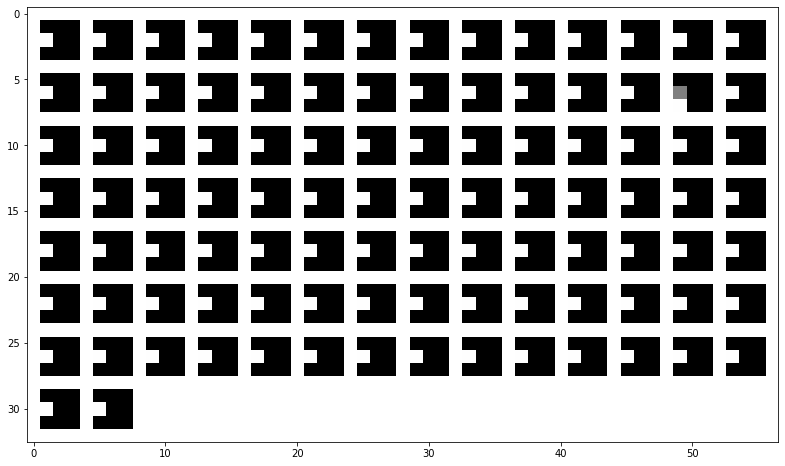

normalized regions:


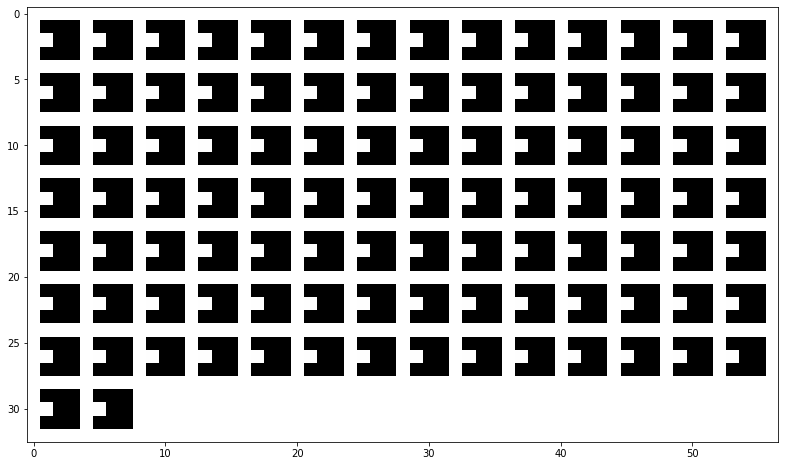

grid regions of 100 regions more=True or worst=False active for filter number: 5 :


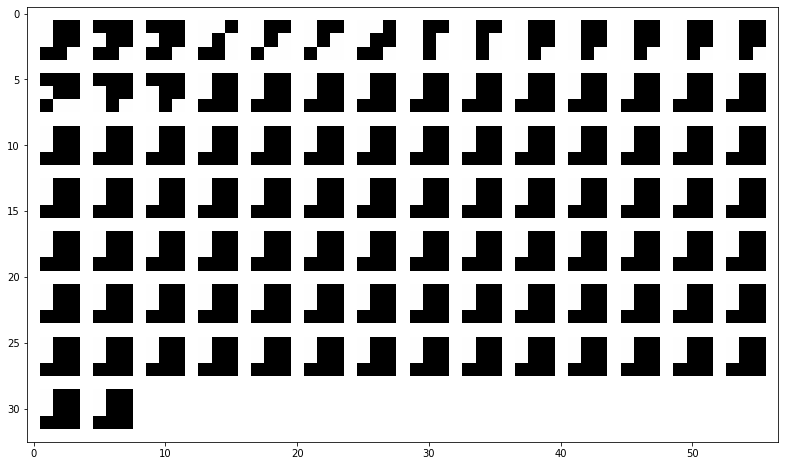

normalized regions:


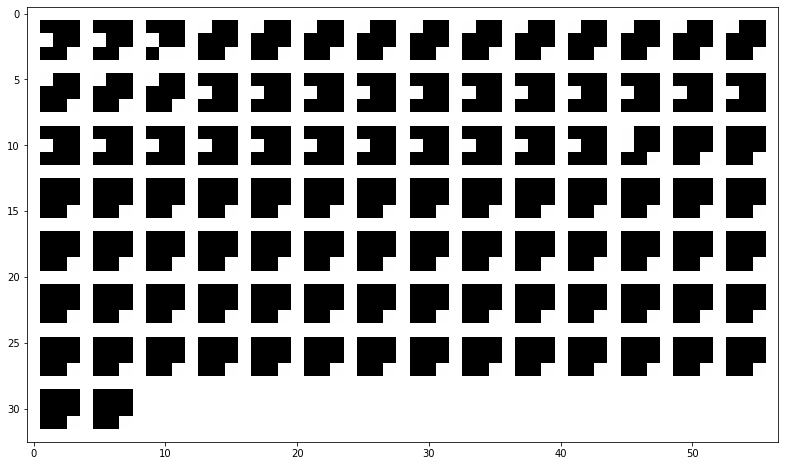

grid regions of 100 regions more=True or worst=False active for filter number: 10 :


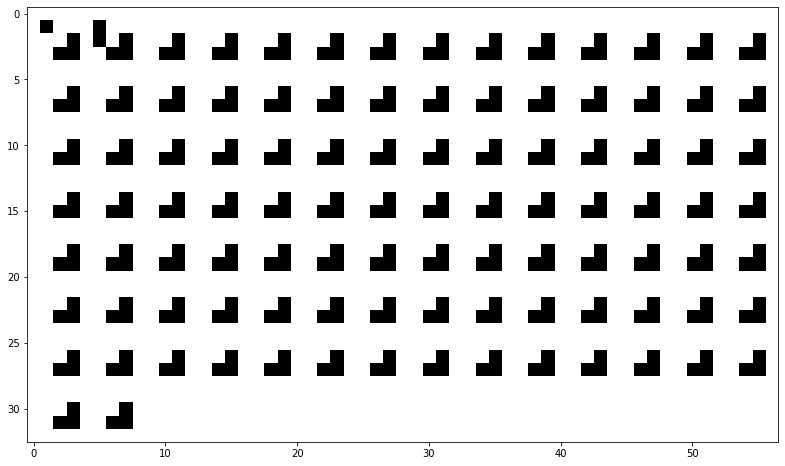

normalized regions:


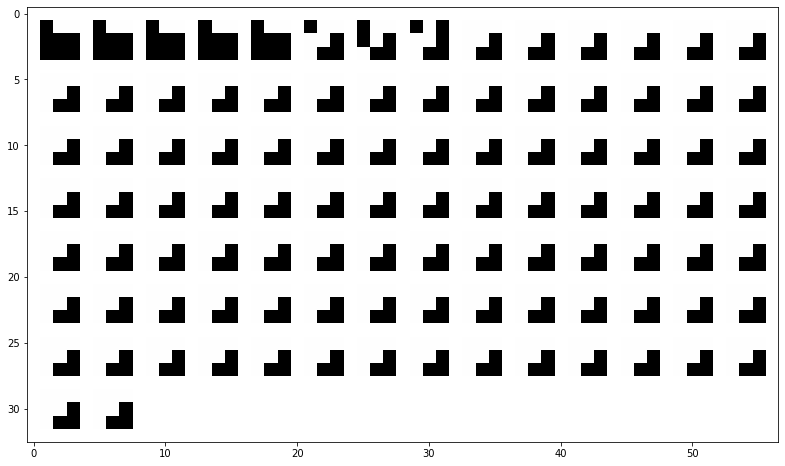

grid regions of 100 regions more=True or worst=False active for filter number: 15 :


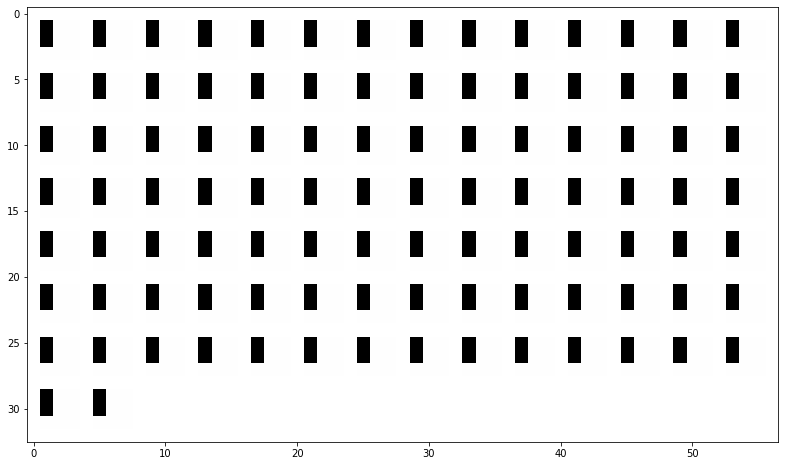

normalized regions:


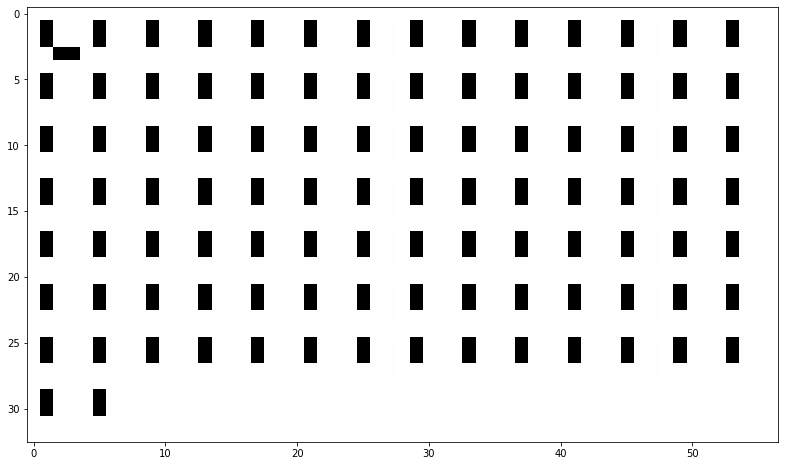

grid regions of 100 regions more=True or worst=False active for filter number: 20 :


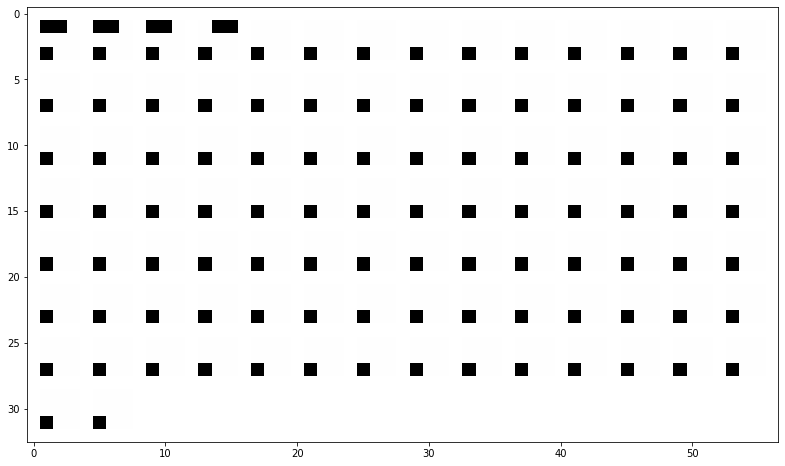

normalized regions:


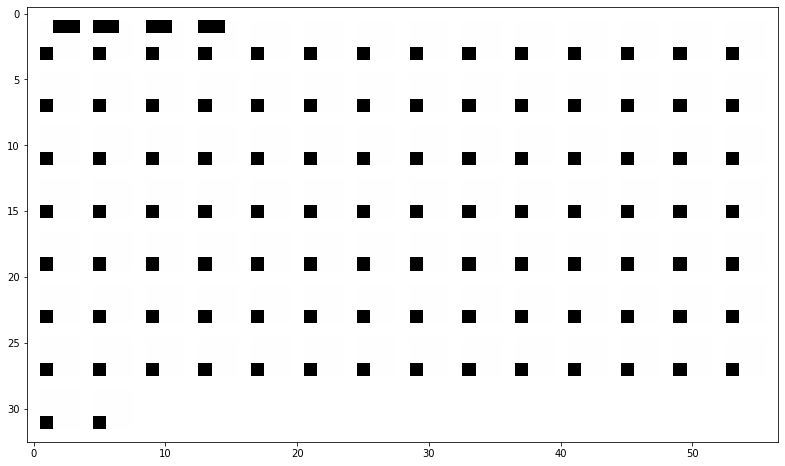

grid regions of 100 regions more=True or worst=False active for filter number: 25 :


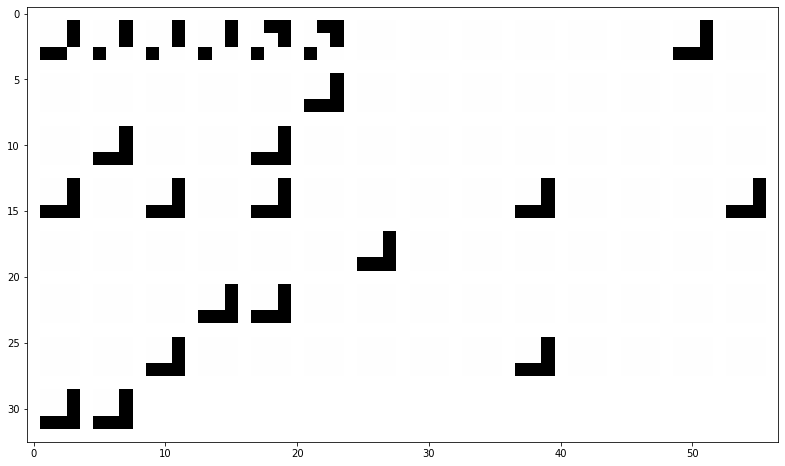

normalized regions:


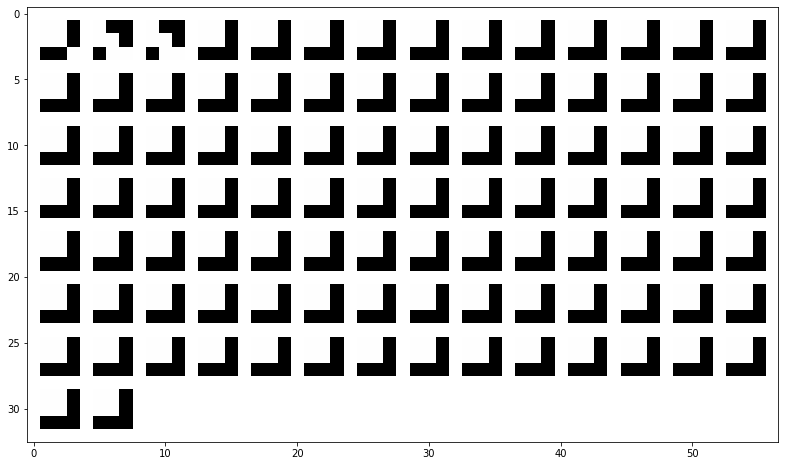

grid regions of 100 regions more=True or worst=False active for filter number: 30 :


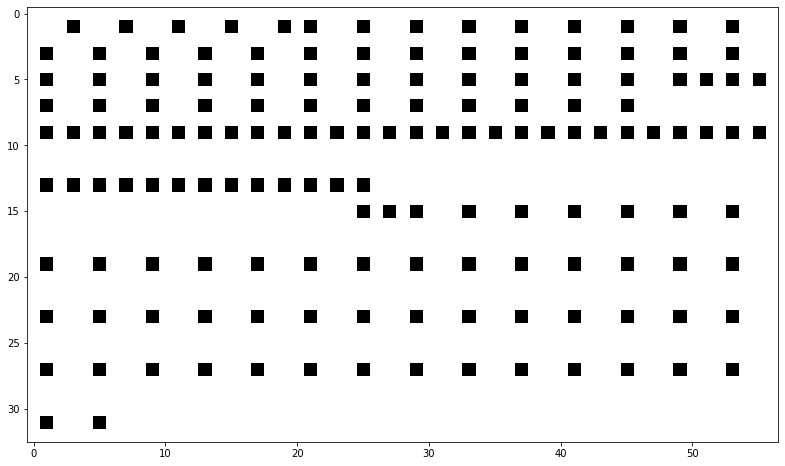

normalized regions:


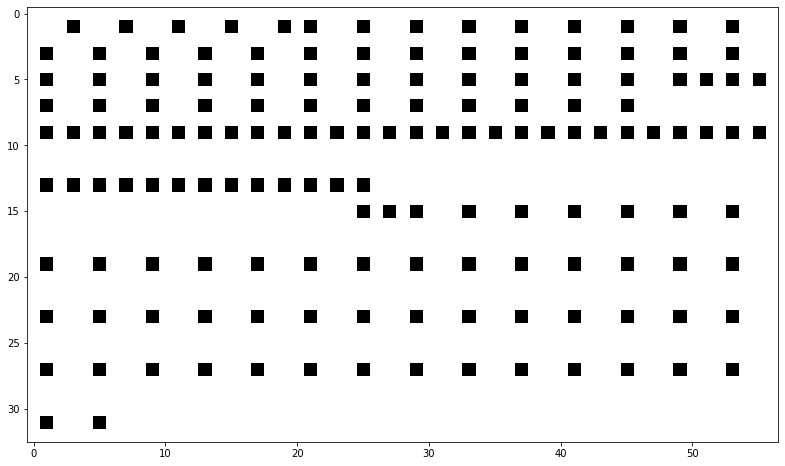

In [34]:
# regions and activation of interest
list_filter = list_filter_interest_layer1_mixt
regions = region_layer1_mixt_binary_stride
activations = activation_layer1_mixt_binary_stride
activations_normalized = activation_layer1_mixt_binary_normalized_stride

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

Interest of filters: [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60]
Consider 10% image regions = 100 images
Consider 10% image regions = 100 images
mean image:
mean regions of 100 regions more=True or worst=False active for filter number: 0 :


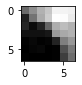

normalized region:


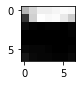

mean regions of 100 regions more=True or worst=False active for filter number: 5 :


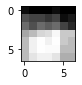

normalized region:


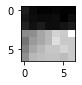

mean regions of 100 regions more=True or worst=False active for filter number: 10 :


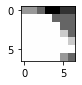

normalized region:


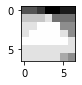

mean regions of 100 regions more=True or worst=False active for filter number: 15 :


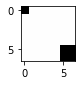

normalized region:


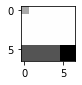

mean regions of 100 regions more=True or worst=False active for filter number: 20 :


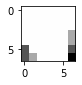

normalized region:


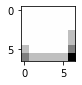

mean regions of 100 regions more=True or worst=False active for filter number: 25 :


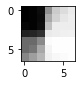

normalized region:


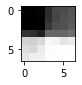

mean regions of 100 regions more=True or worst=False active for filter number: 30 :


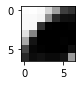

normalized region:


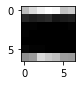

mean regions of 100 regions more=True or worst=False active for filter number: 35 :


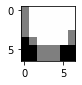

normalized region:


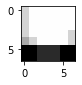

mean regions of 100 regions more=True or worst=False active for filter number: 40 :


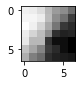

normalized region:


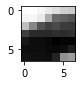

mean regions of 100 regions more=True or worst=False active for filter number: 45 :


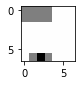

normalized region:


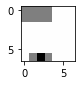

mean regions of 100 regions more=True or worst=False active for filter number: 50 :


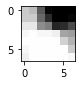

normalized region:


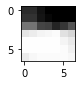

mean regions of 100 regions more=True or worst=False active for filter number: 55 :


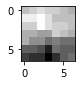

normalized region:


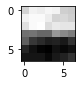

mean regions of 100 regions more=True or worst=False active for filter number: 60 :


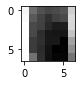

normalized region:


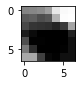

grid image
grid regions of 100 regions more=True or worst=False active for filter number: 0 :


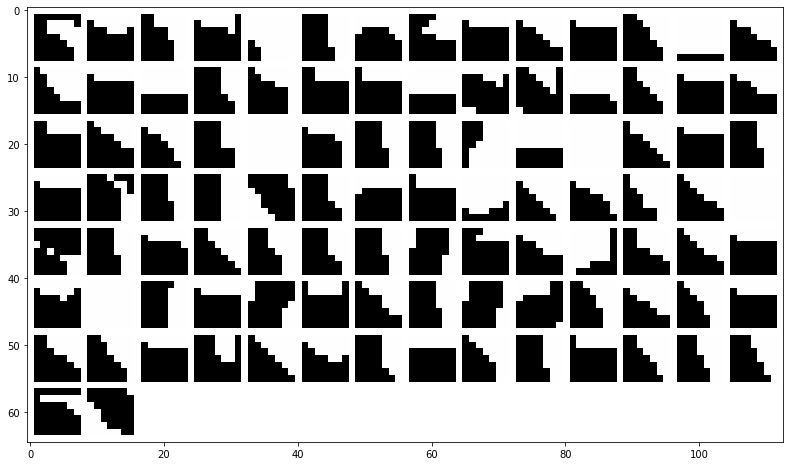

normalized regions:


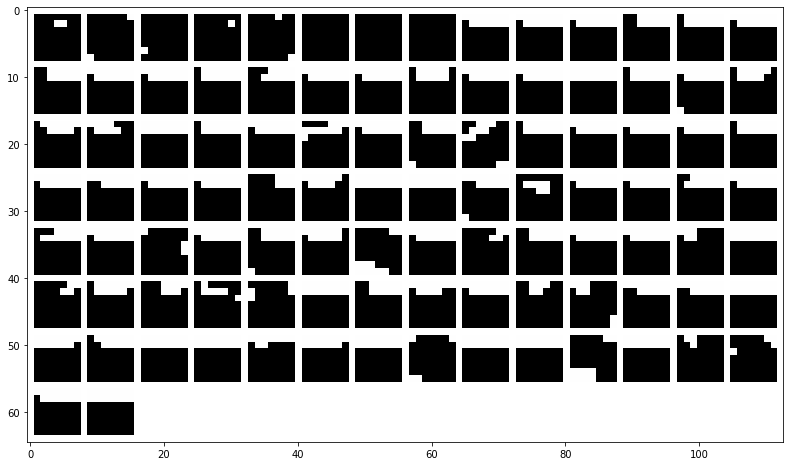

grid regions of 100 regions more=True or worst=False active for filter number: 5 :


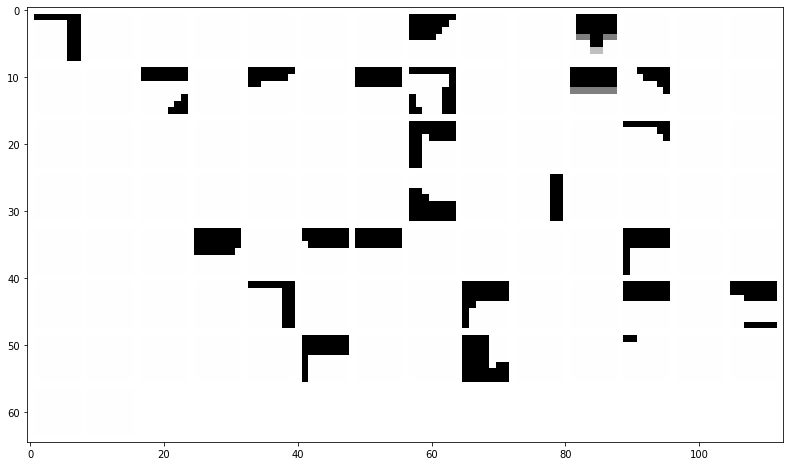

normalized regions:


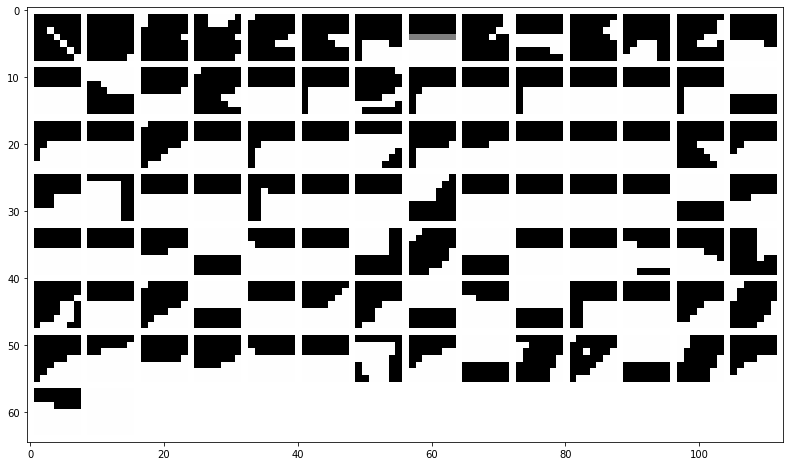

grid regions of 100 regions more=True or worst=False active for filter number: 10 :


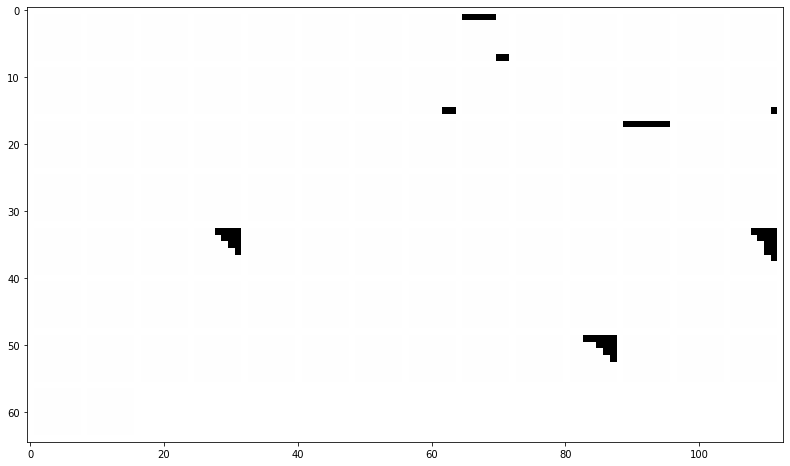

normalized regions:


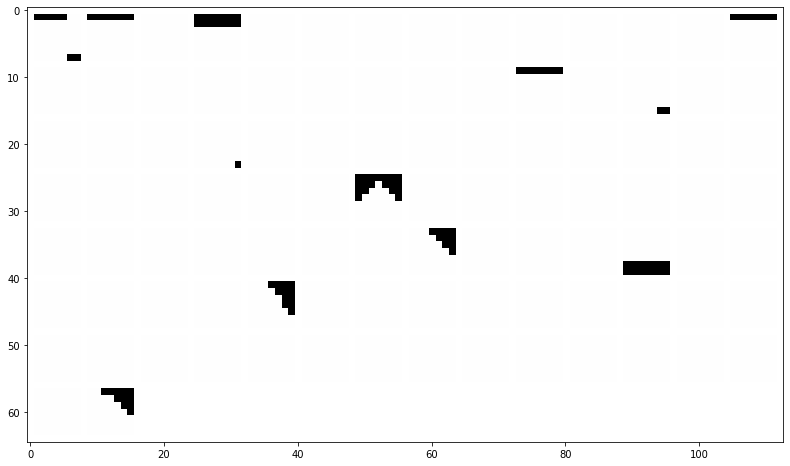

grid regions of 100 regions more=True or worst=False active for filter number: 15 :


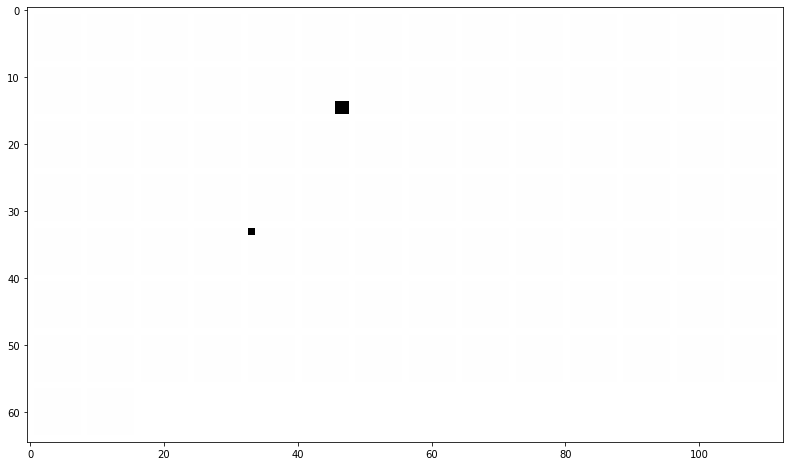

normalized regions:


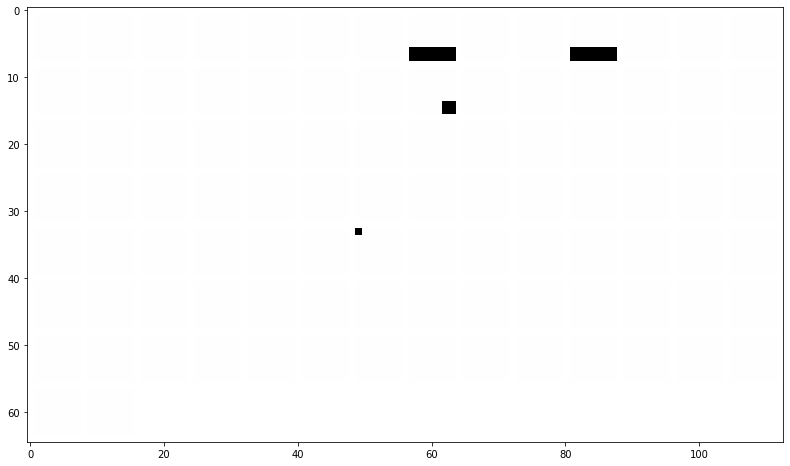

grid regions of 100 regions more=True or worst=False active for filter number: 20 :


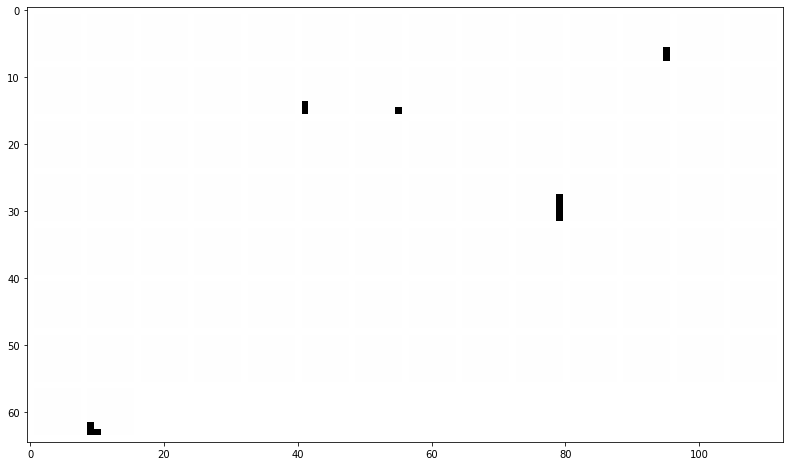

normalized regions:


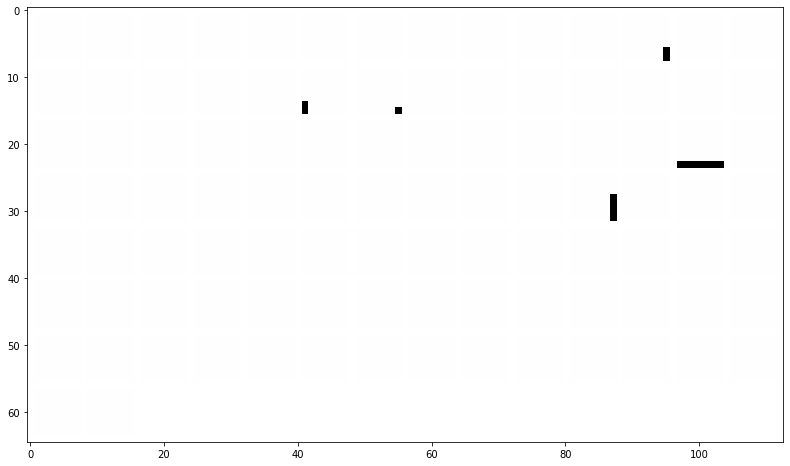

grid regions of 100 regions more=True or worst=False active for filter number: 25 :


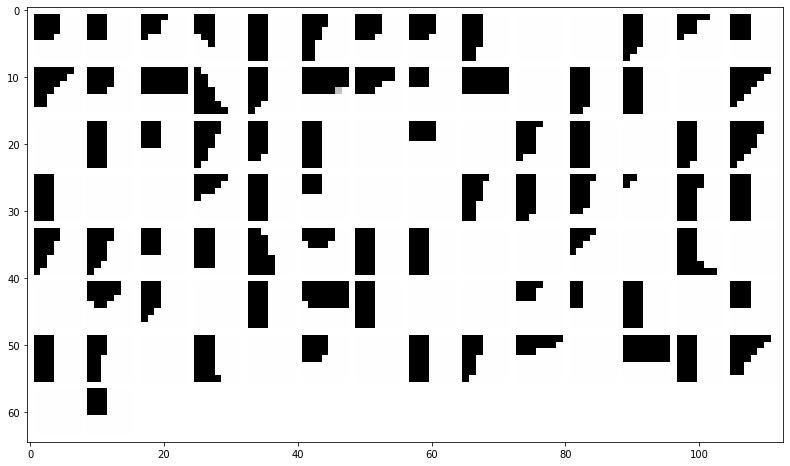

normalized regions:


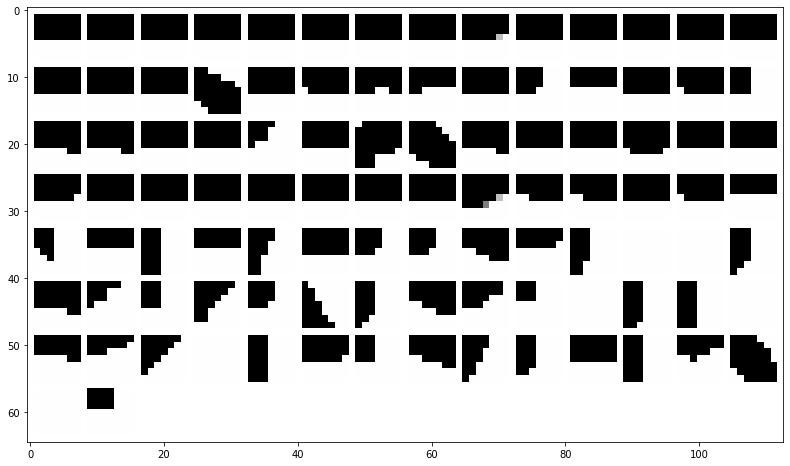

grid regions of 100 regions more=True or worst=False active for filter number: 30 :


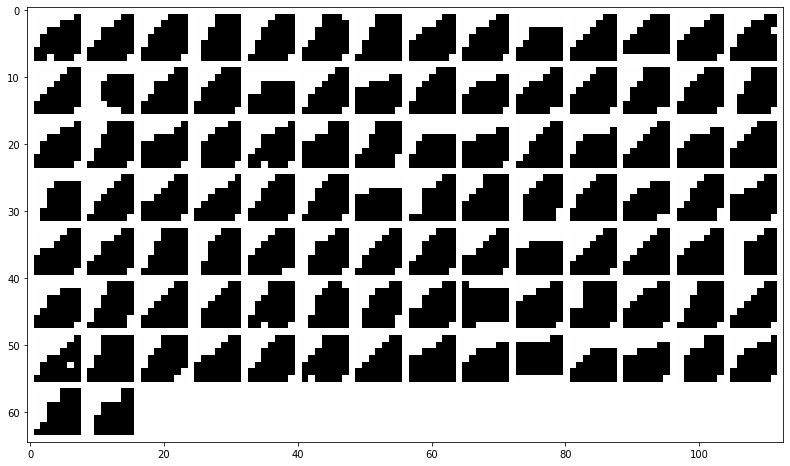

normalized regions:


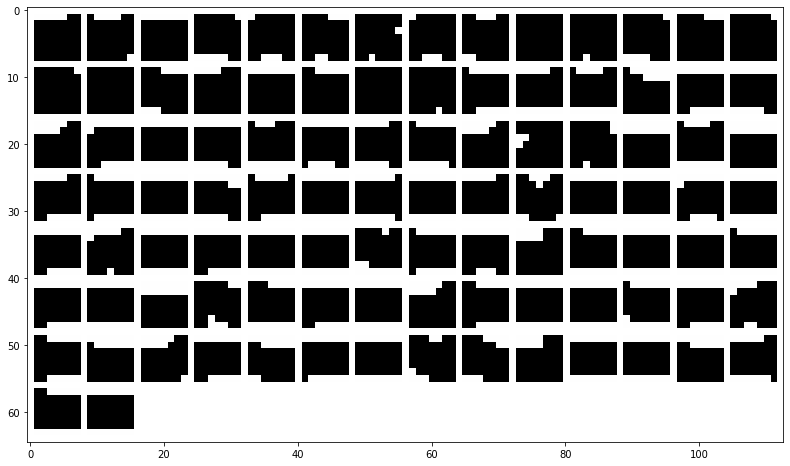

grid regions of 100 regions more=True or worst=False active for filter number: 35 :


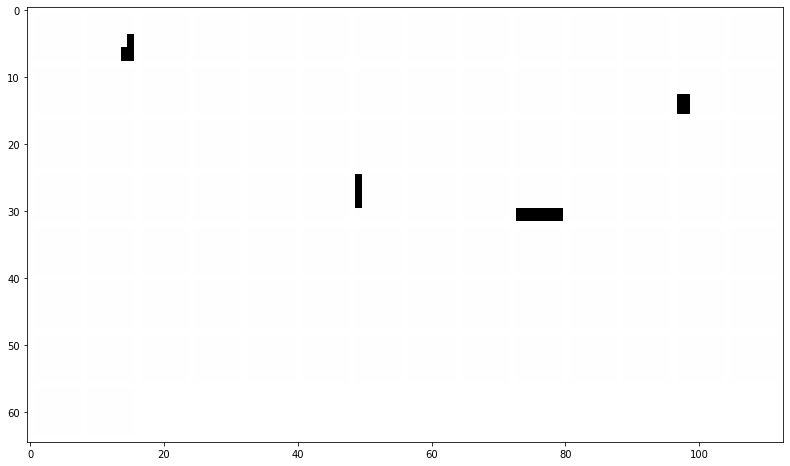

normalized regions:


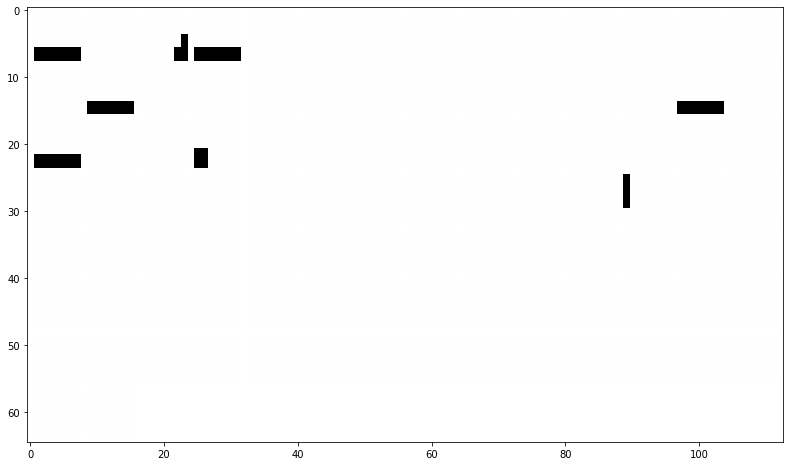

grid regions of 100 regions more=True or worst=False active for filter number: 40 :


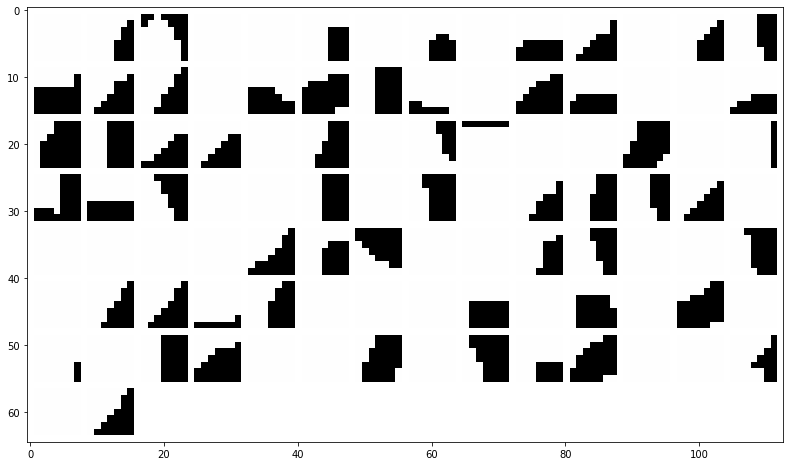

normalized regions:


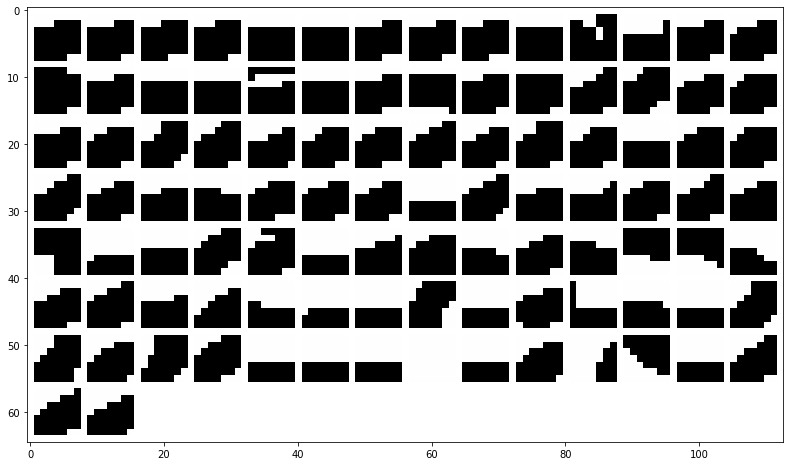

grid regions of 100 regions more=True or worst=False active for filter number: 45 :


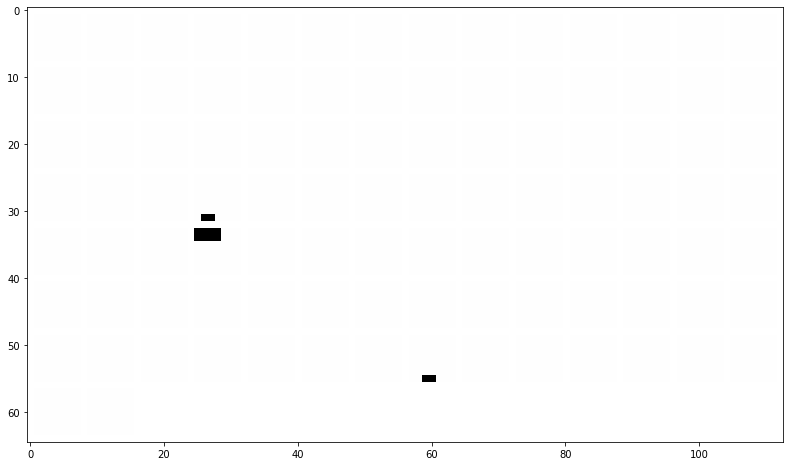

normalized regions:


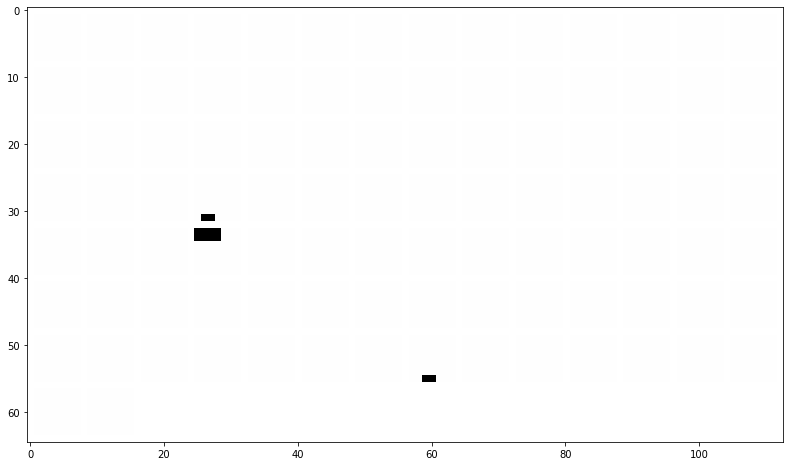

grid regions of 100 regions more=True or worst=False active for filter number: 50 :


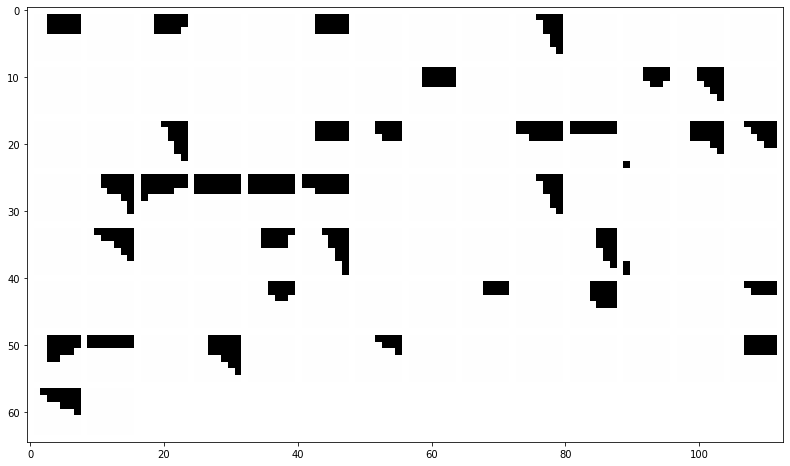

normalized regions:


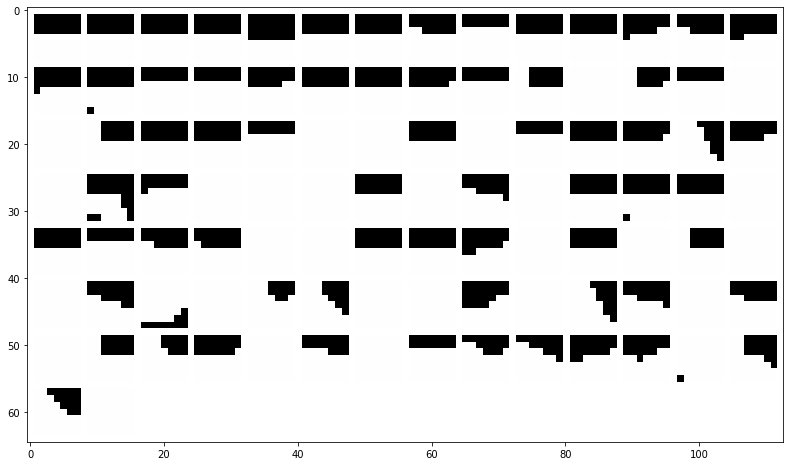

grid regions of 100 regions more=True or worst=False active for filter number: 55 :


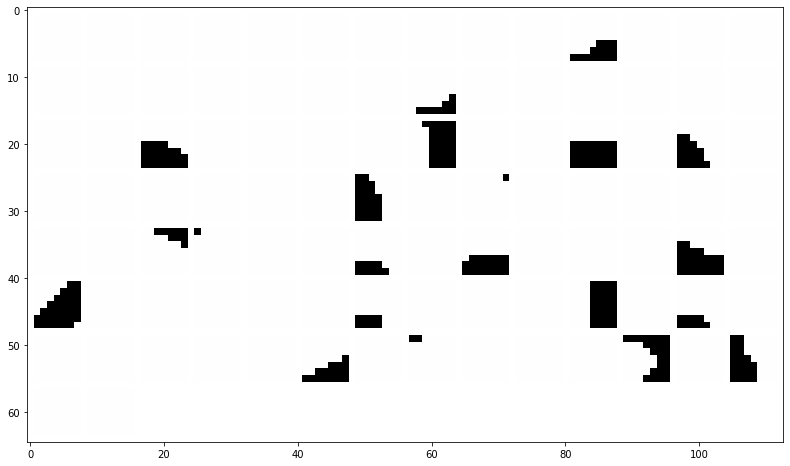

normalized regions:


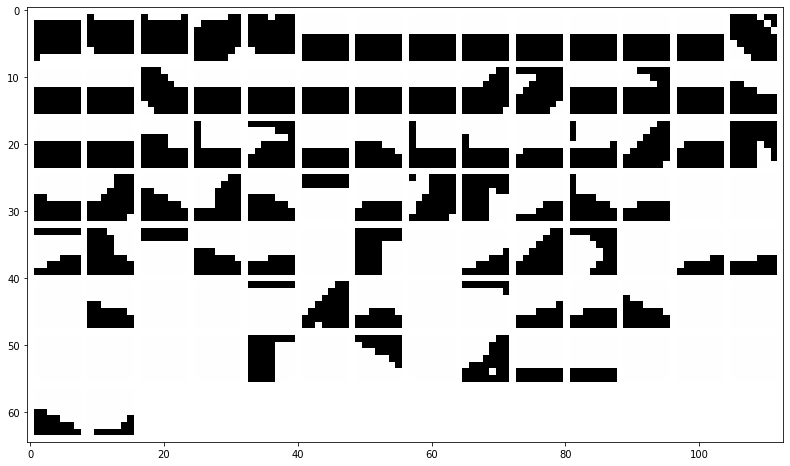

grid regions of 100 regions more=True or worst=False active for filter number: 60 :


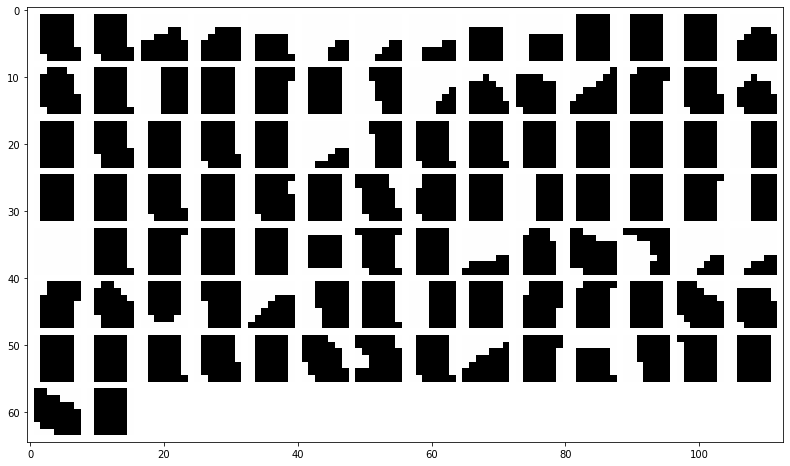

normalized regions:


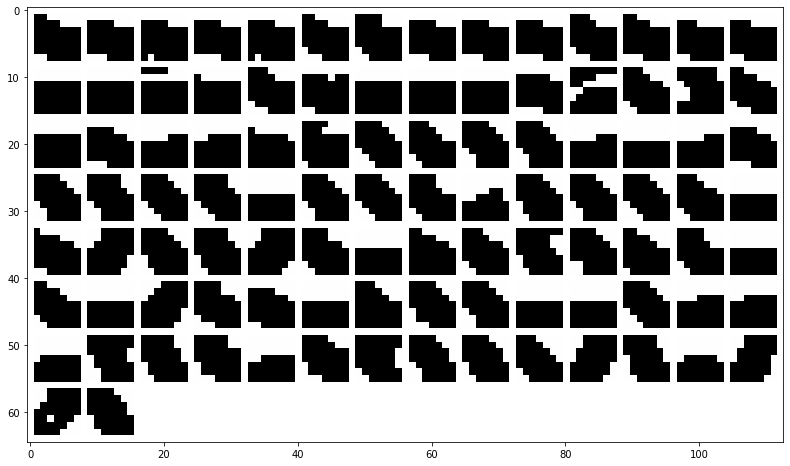

In [35]:
# regions and activation of interest
list_filter = list_filter_interest_layer2_mixt
regions = region_layer2_mixt_binary_stride
activations = activation_layer2_mixt_binary_stride
activations_normalized = activation_layer2_mixt_binary_normalized_stride

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

Interest of filters: [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 80, 85, 90, 95, 100, 105, 110, 115, 120, 125]
Consider 10% image regions = 100 images
Consider 10% image regions = 100 images
mean image:
mean regions of 100 regions more=True or worst=False active for filter number: 0 :


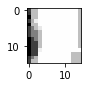

normalized region:


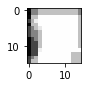

mean regions of 100 regions more=True or worst=False active for filter number: 5 :


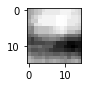

normalized region:


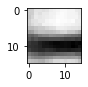

mean regions of 100 regions more=True or worst=False active for filter number: 10 :


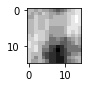

normalized region:


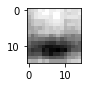

mean regions of 100 regions more=True or worst=False active for filter number: 15 :


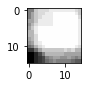

normalized region:


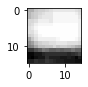

mean regions of 100 regions more=True or worst=False active for filter number: 20 :


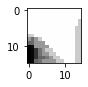

normalized region:


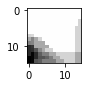

mean regions of 100 regions more=True or worst=False active for filter number: 25 :


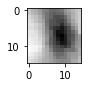

normalized region:


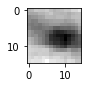

mean regions of 100 regions more=True or worst=False active for filter number: 30 :


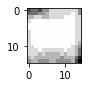

normalized region:


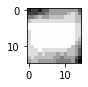

mean regions of 100 regions more=True or worst=False active for filter number: 35 :


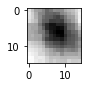

normalized region:


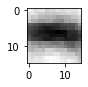

mean regions of 100 regions more=True or worst=False active for filter number: 40 :


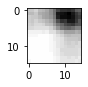

normalized region:


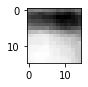

mean regions of 100 regions more=True or worst=False active for filter number: 45 :


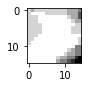

normalized region:


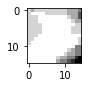

mean regions of 100 regions more=True or worst=False active for filter number: 50 :


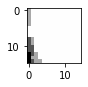

normalized region:


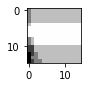

mean regions of 100 regions more=True or worst=False active for filter number: 55 :


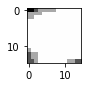

normalized region:


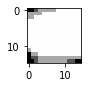

mean regions of 100 regions more=True or worst=False active for filter number: 60 :


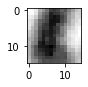

normalized region:


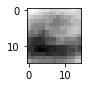

mean regions of 100 regions more=True or worst=False active for filter number: 65 :


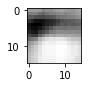

normalized region:


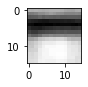

mean regions of 100 regions more=True or worst=False active for filter number: 70 :


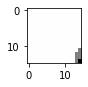

normalized region:


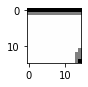

mean regions of 100 regions more=True or worst=False active for filter number: 80 :


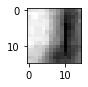

normalized region:


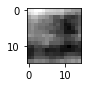

mean regions of 100 regions more=True or worst=False active for filter number: 85 :


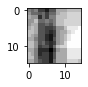

normalized region:


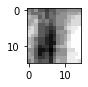

mean regions of 100 regions more=True or worst=False active for filter number: 90 :


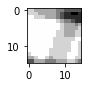

normalized region:


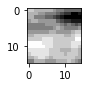

mean regions of 100 regions more=True or worst=False active for filter number: 95 :


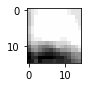

normalized region:


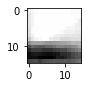

mean regions of 100 regions more=True or worst=False active for filter number: 100 :


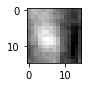

normalized region:


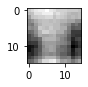

mean regions of 100 regions more=True or worst=False active for filter number: 105 :


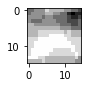

normalized region:


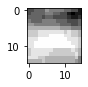

mean regions of 100 regions more=True or worst=False active for filter number: 110 :


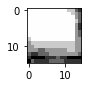

normalized region:


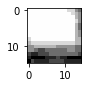

mean regions of 100 regions more=True or worst=False active for filter number: 115 :


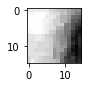

normalized region:


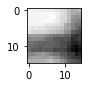

mean regions of 100 regions more=True or worst=False active for filter number: 120 :


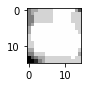

normalized region:


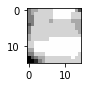

mean regions of 100 regions more=True or worst=False active for filter number: 125 :


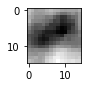

normalized region:


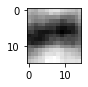

grid image
grid regions of 100 regions more=True or worst=False active for filter number: 0 :


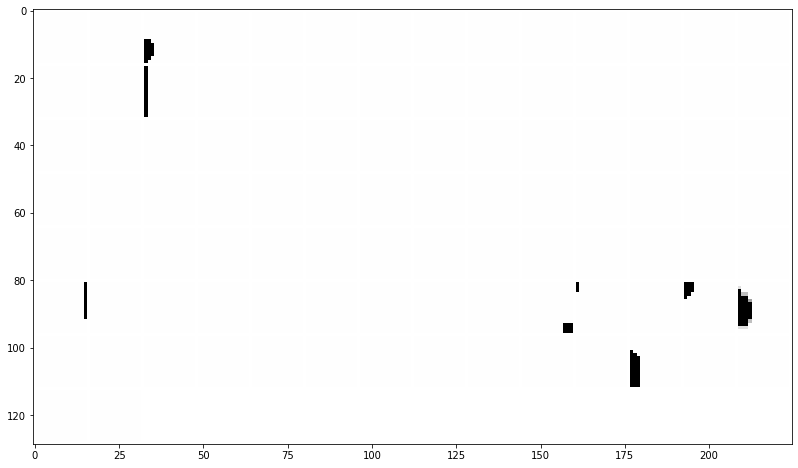

normalized regions:


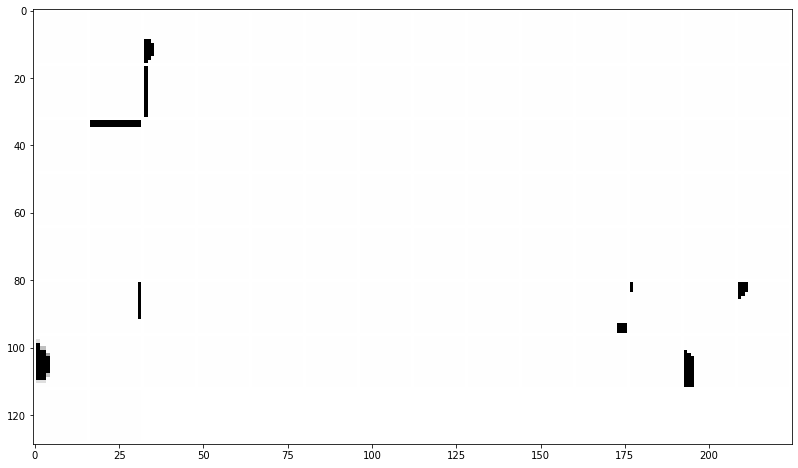

grid regions of 100 regions more=True or worst=False active for filter number: 5 :


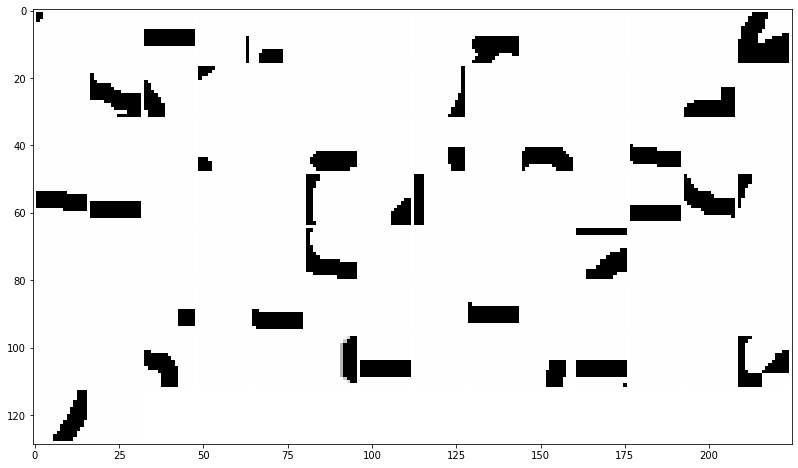

normalized regions:


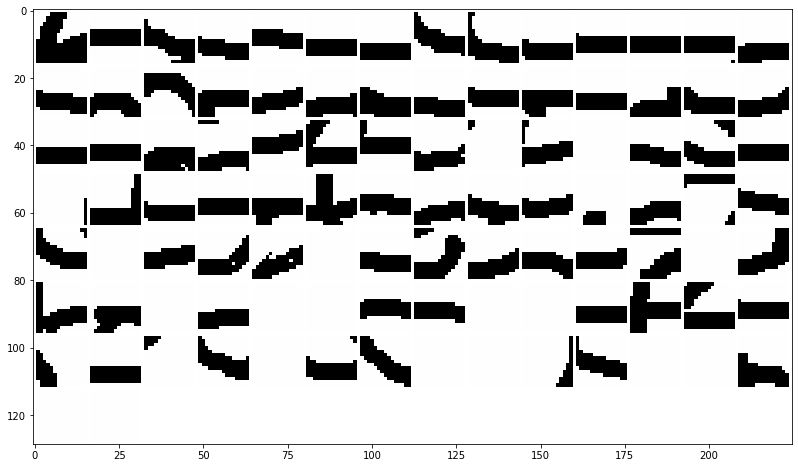

grid regions of 100 regions more=True or worst=False active for filter number: 10 :


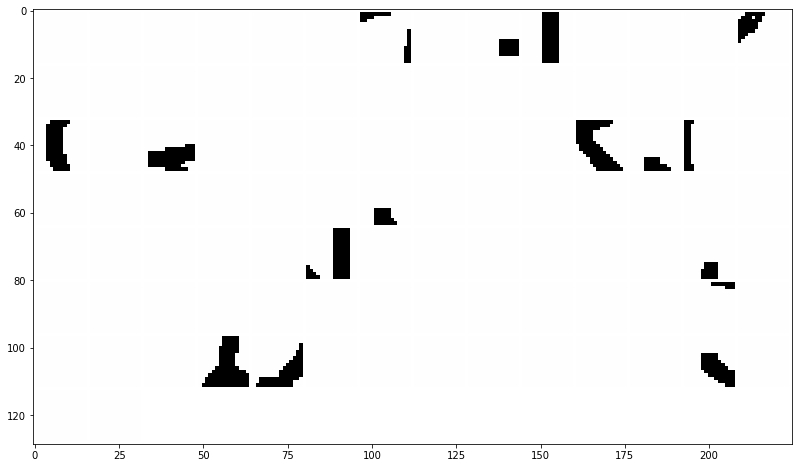

normalized regions:


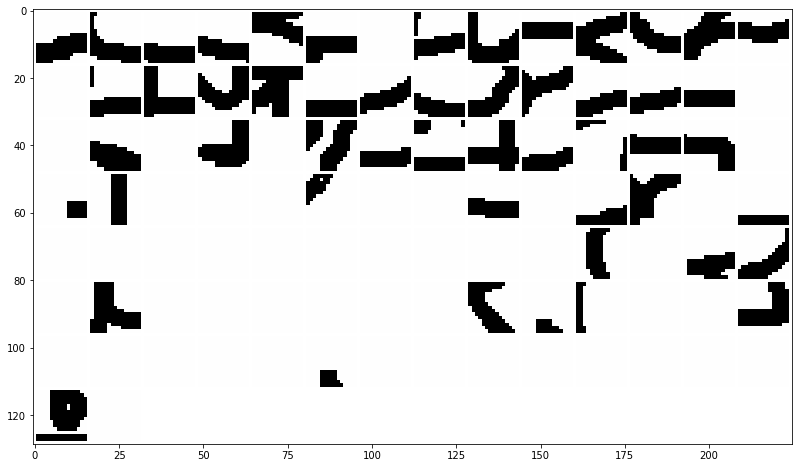

grid regions of 100 regions more=True or worst=False active for filter number: 15 :


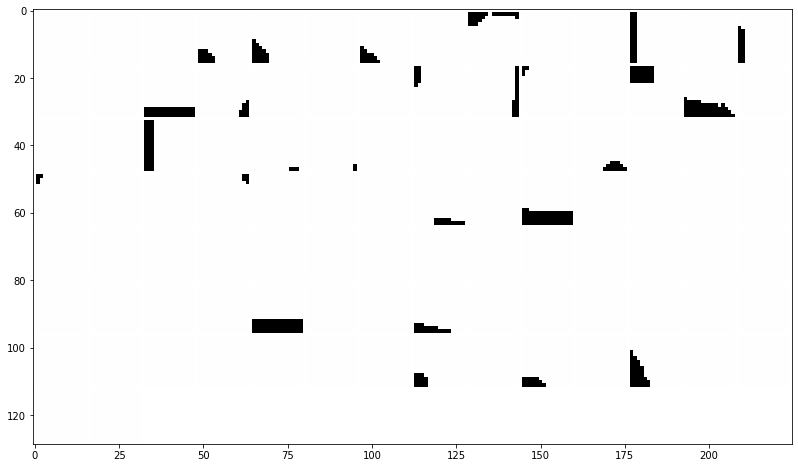

normalized regions:


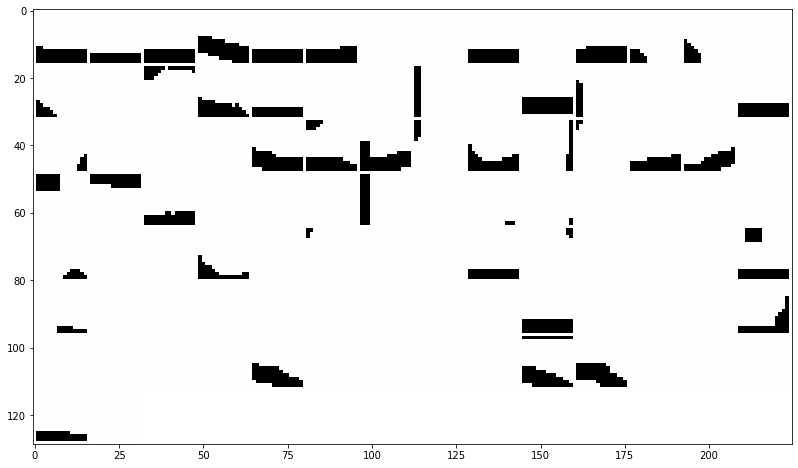

grid regions of 100 regions more=True or worst=False active for filter number: 20 :


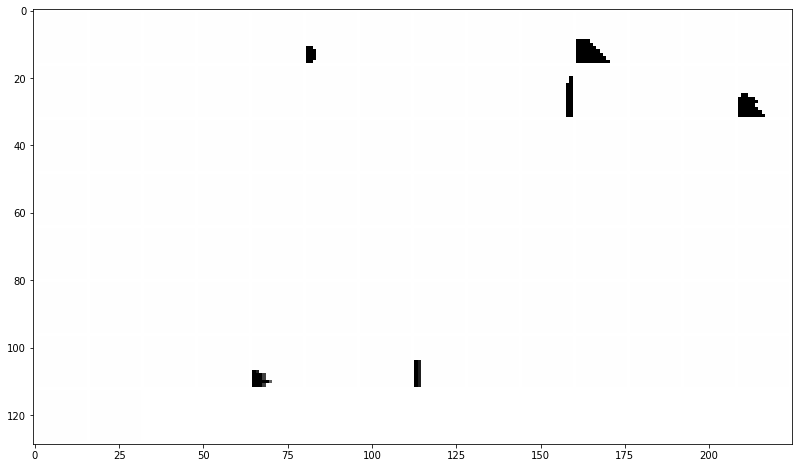

normalized regions:


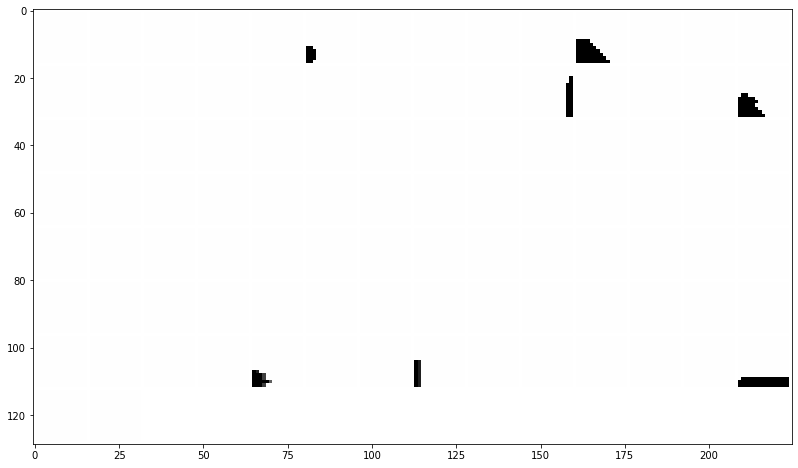

grid regions of 100 regions more=True or worst=False active for filter number: 25 :


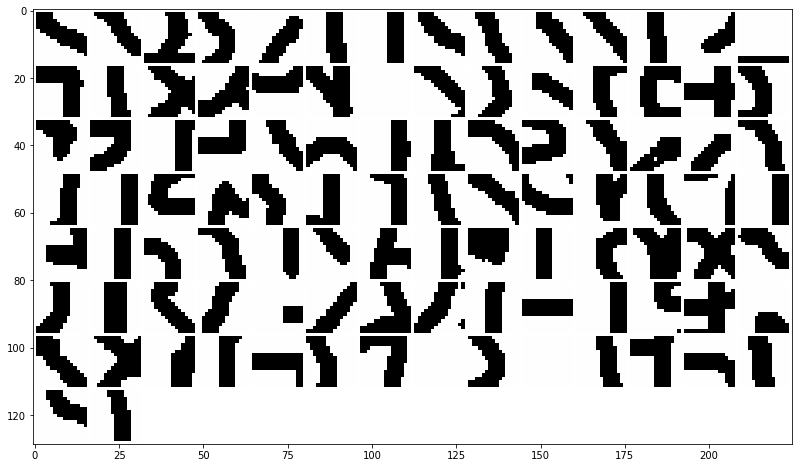

normalized regions:


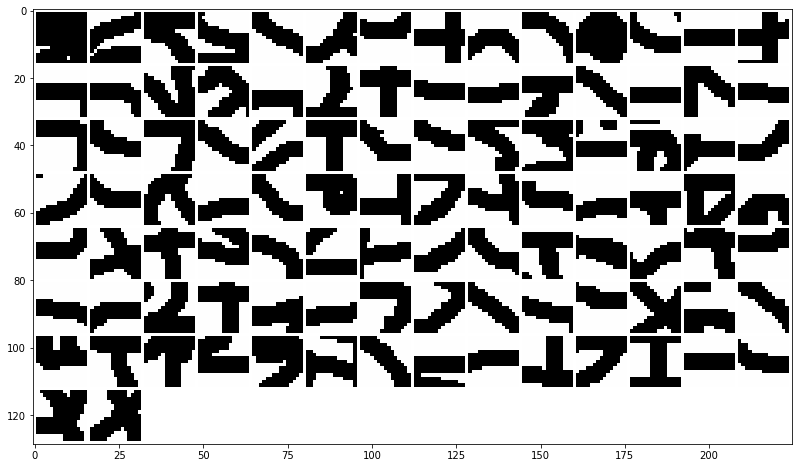

grid regions of 100 regions more=True or worst=False active for filter number: 30 :


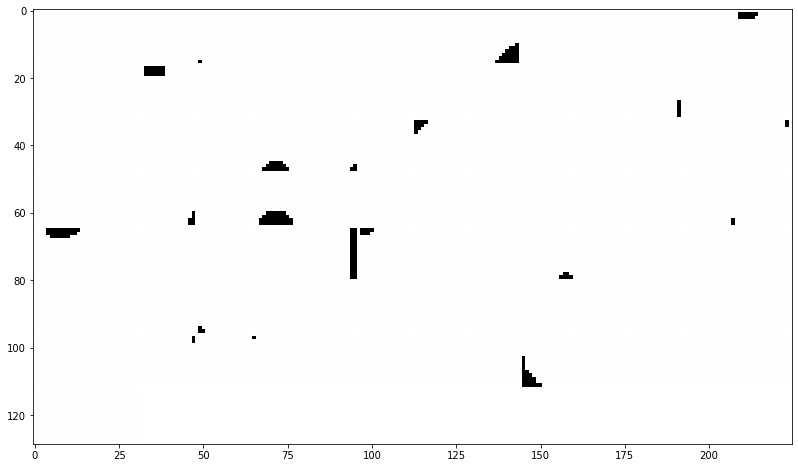

normalized regions:


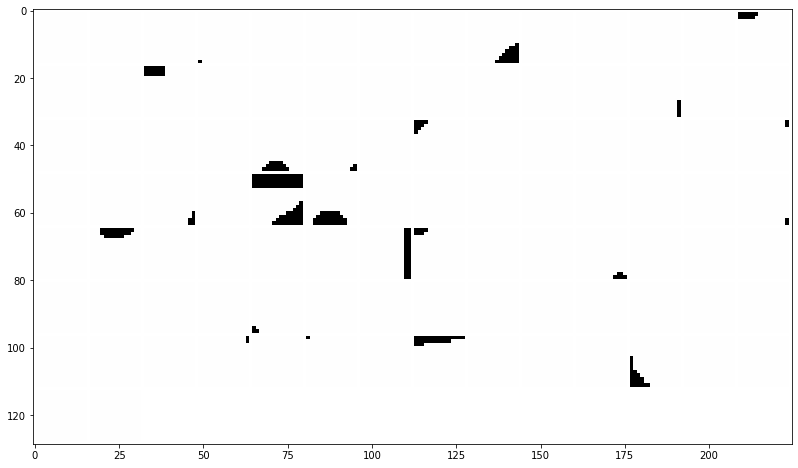

grid regions of 100 regions more=True or worst=False active for filter number: 35 :


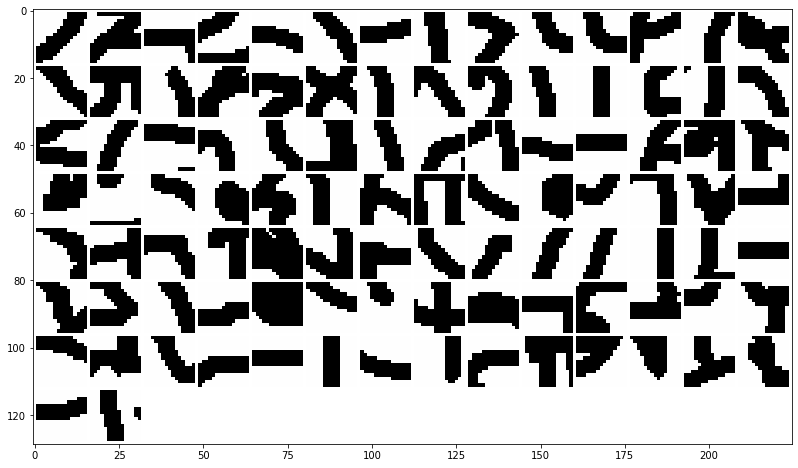

normalized regions:


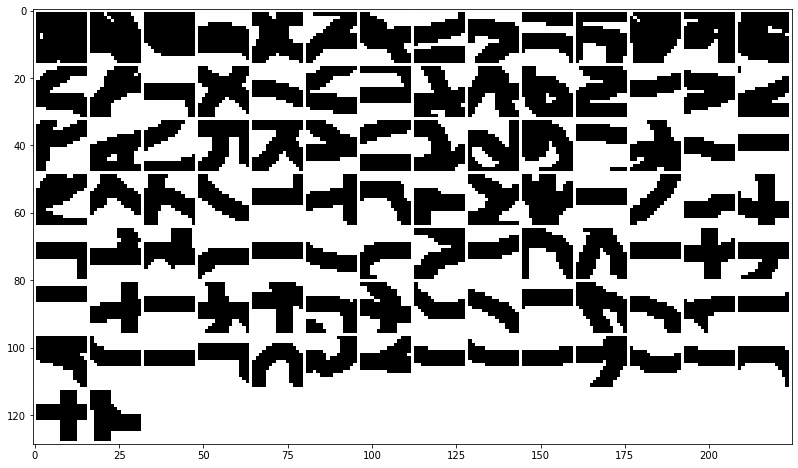

grid regions of 100 regions more=True or worst=False active for filter number: 40 :


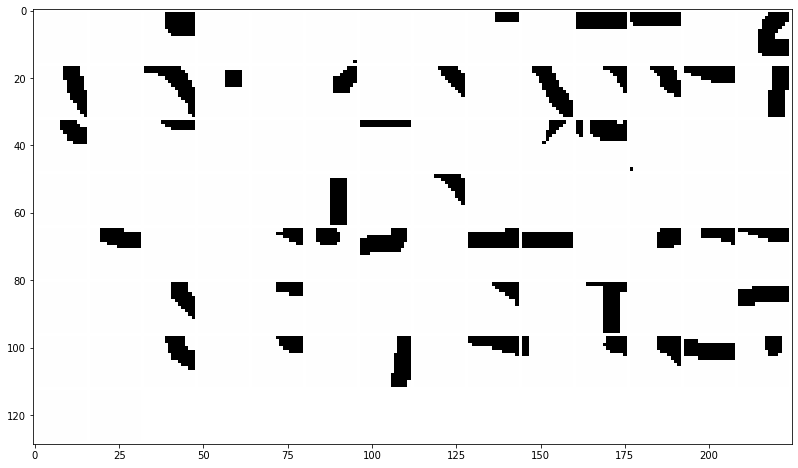

normalized regions:


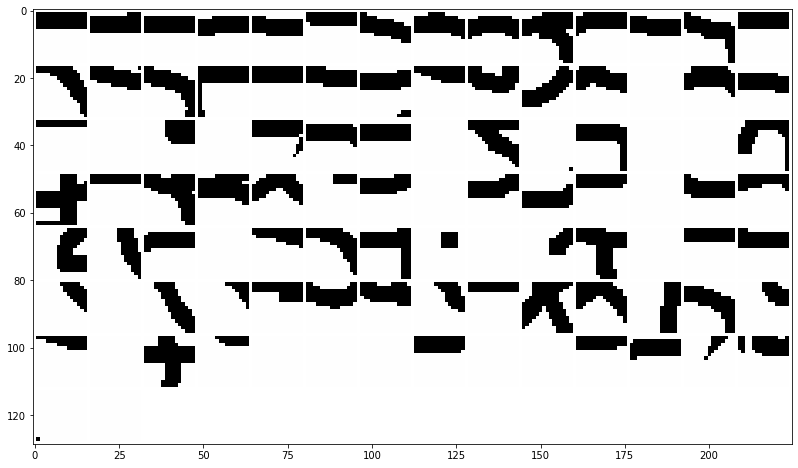

grid regions of 100 regions more=True or worst=False active for filter number: 45 :


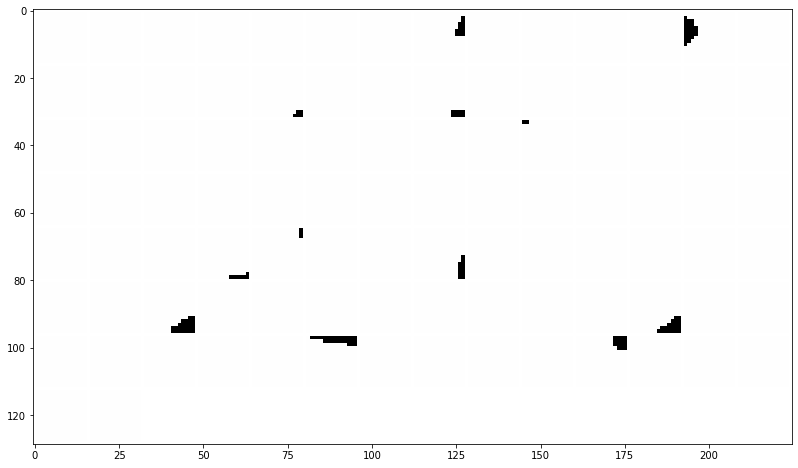

normalized regions:


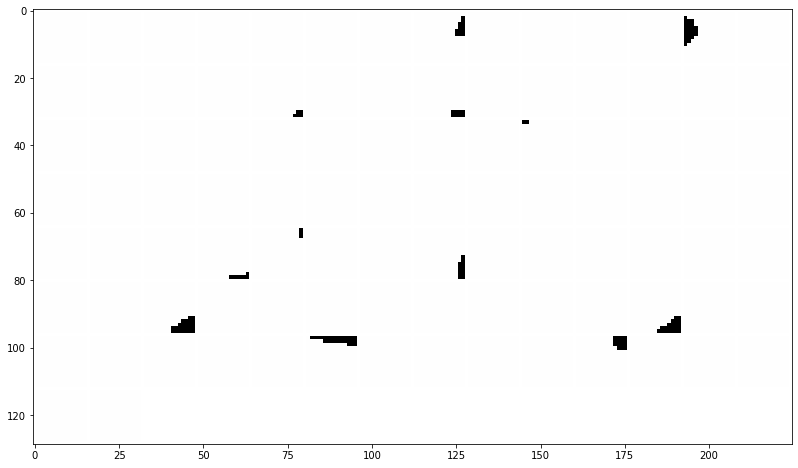

grid regions of 100 regions more=True or worst=False active for filter number: 50 :


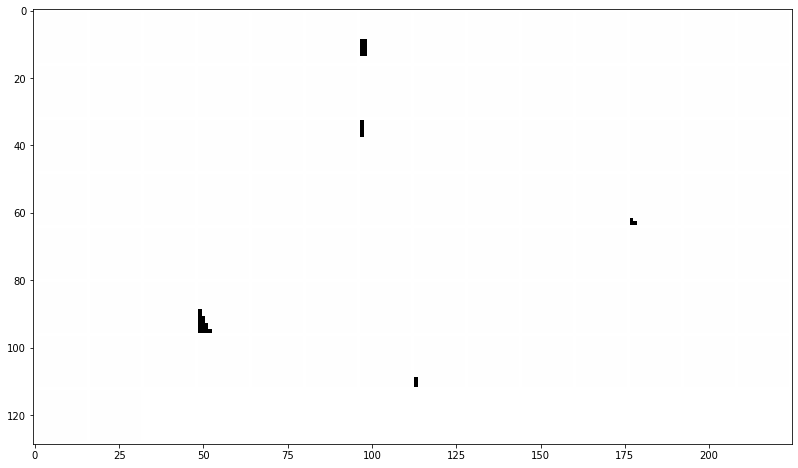

normalized regions:


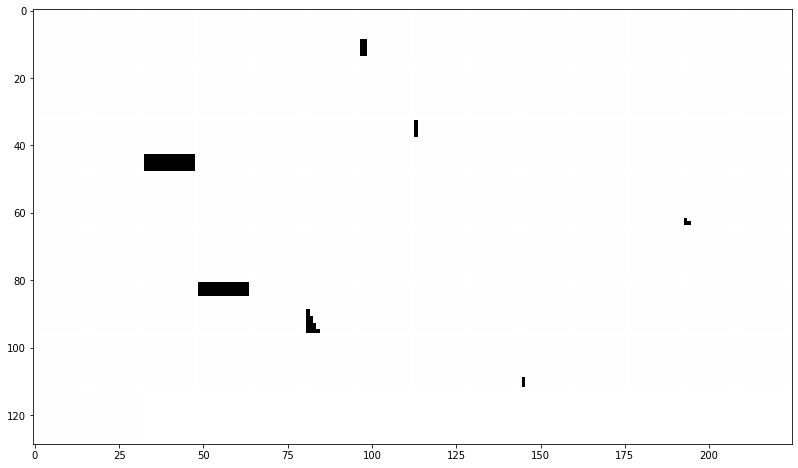

grid regions of 100 regions more=True or worst=False active for filter number: 55 :


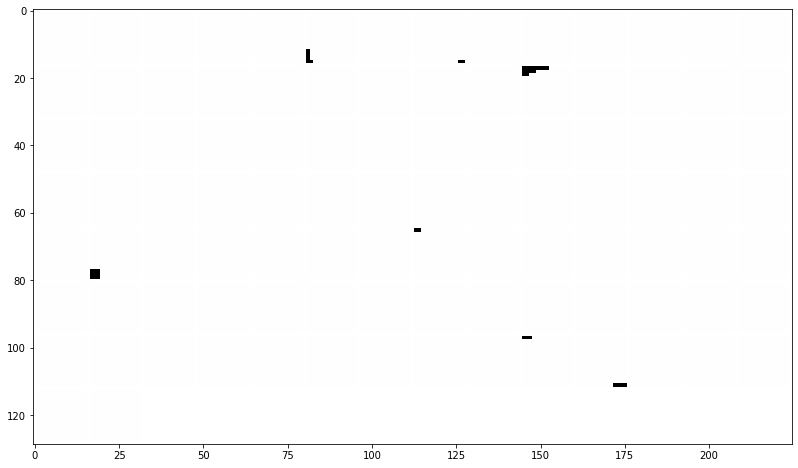

normalized regions:


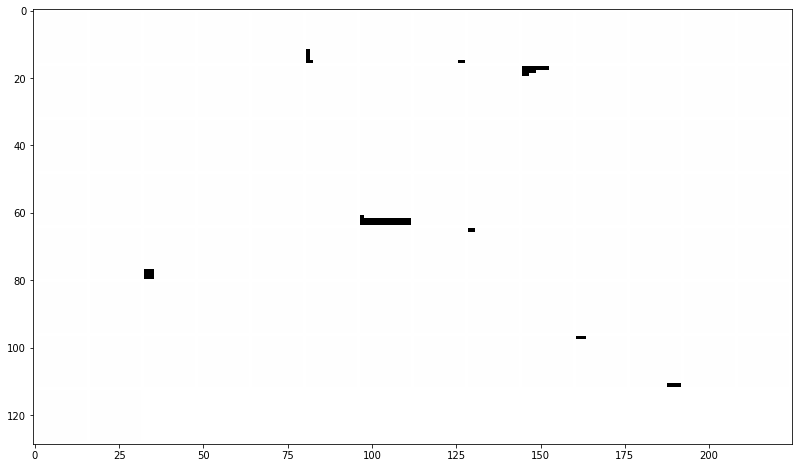

grid regions of 100 regions more=True or worst=False active for filter number: 60 :


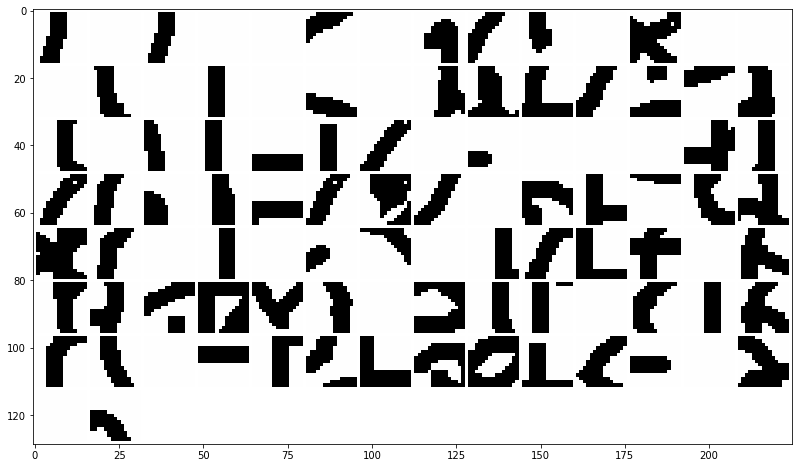

normalized regions:


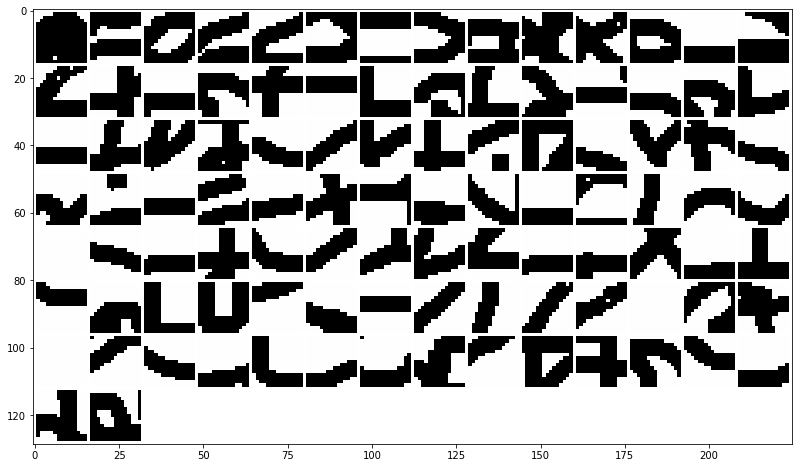

grid regions of 100 regions more=True or worst=False active for filter number: 65 :


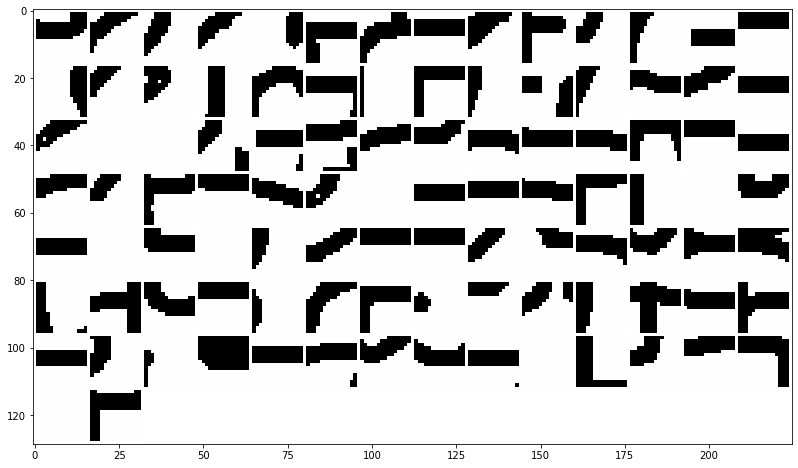

normalized regions:


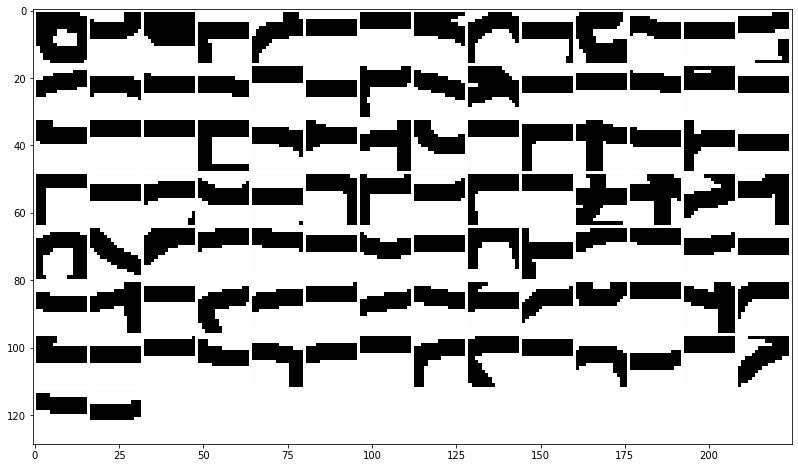

grid regions of 100 regions more=True or worst=False active for filter number: 70 :


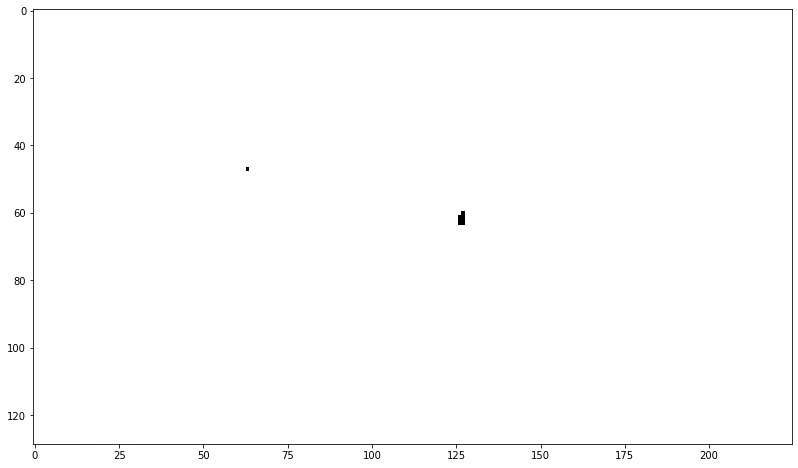

normalized regions:


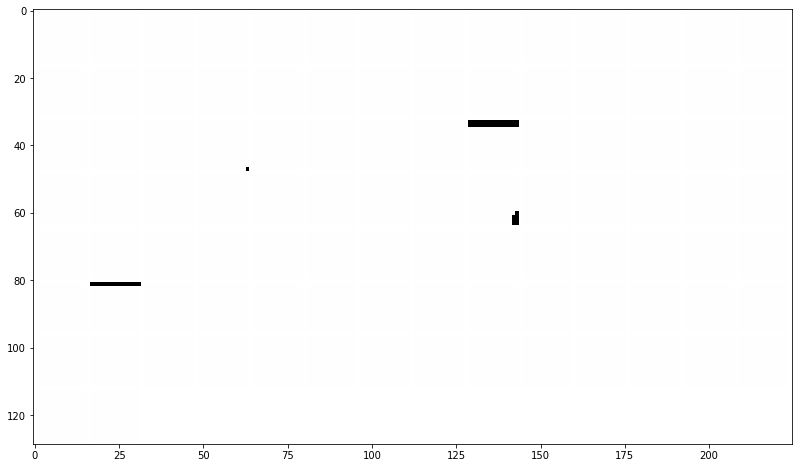

grid regions of 100 regions more=True or worst=False active for filter number: 80 :


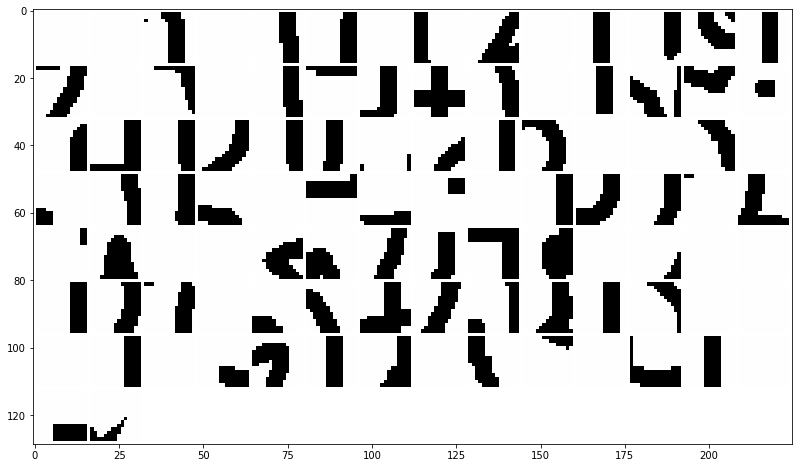

normalized regions:


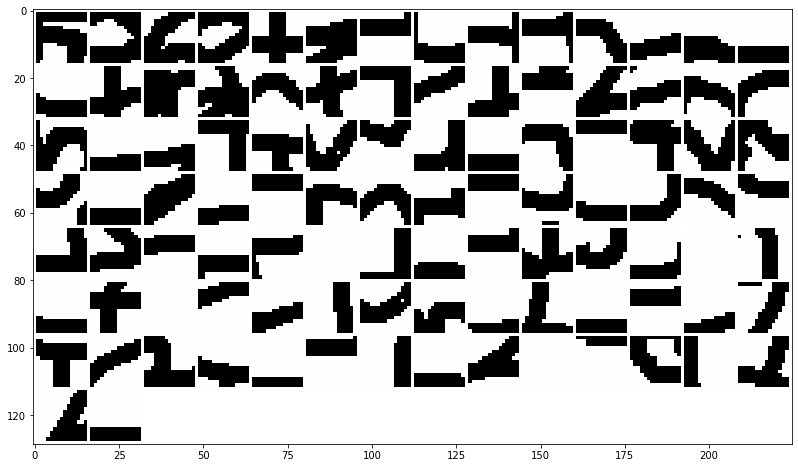

grid regions of 100 regions more=True or worst=False active for filter number: 85 :


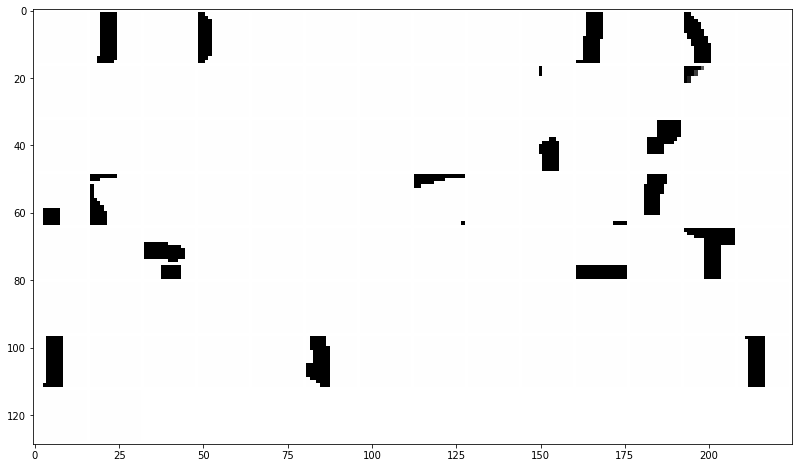

normalized regions:


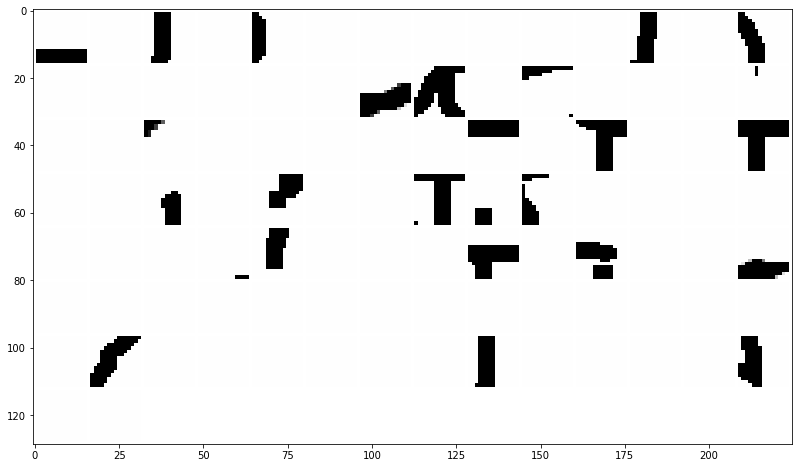

grid regions of 100 regions more=True or worst=False active for filter number: 90 :


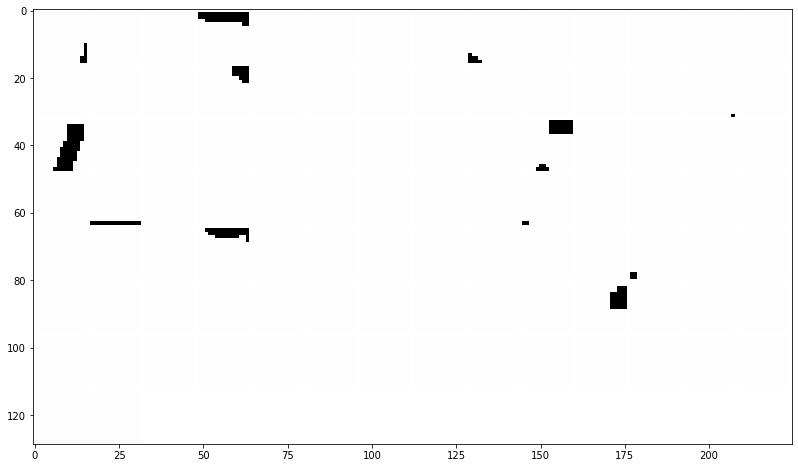

normalized regions:


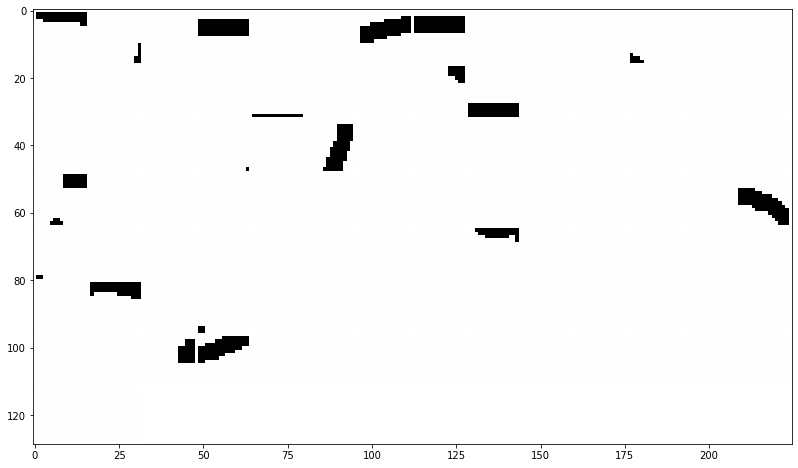

grid regions of 100 regions more=True or worst=False active for filter number: 95 :


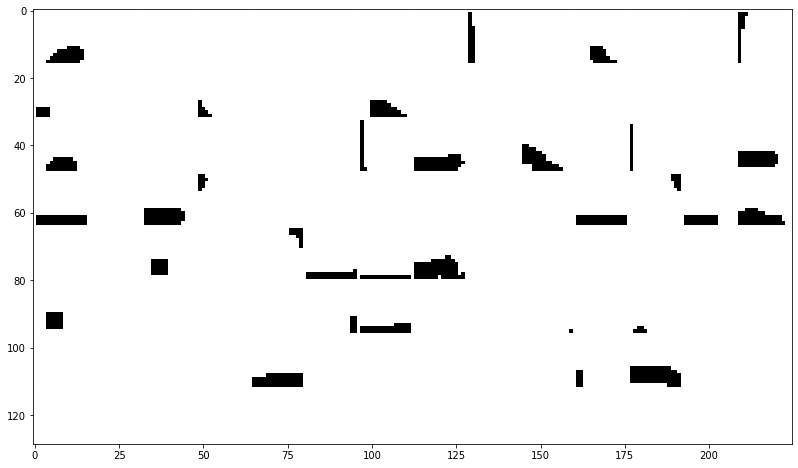

normalized regions:


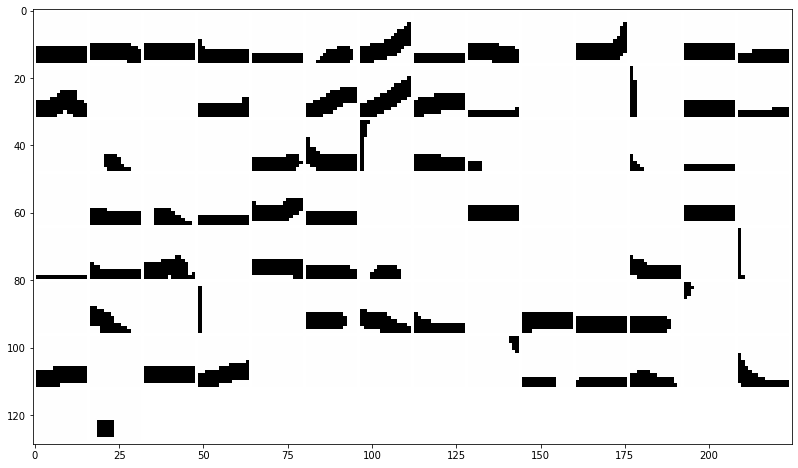

grid regions of 100 regions more=True or worst=False active for filter number: 100 :


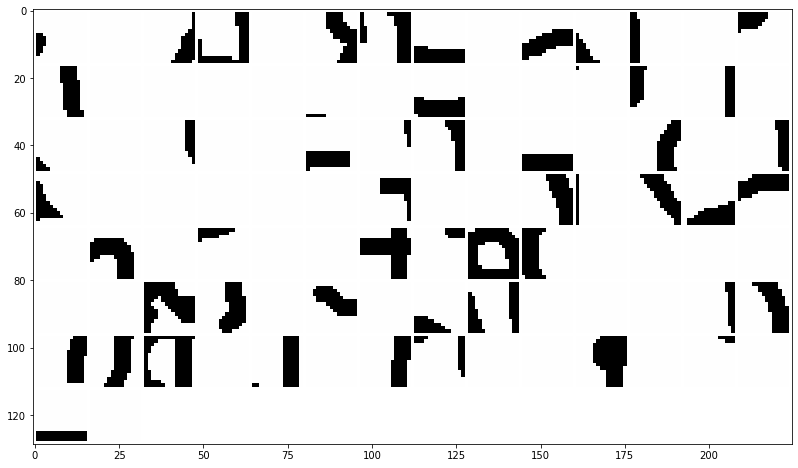

normalized regions:


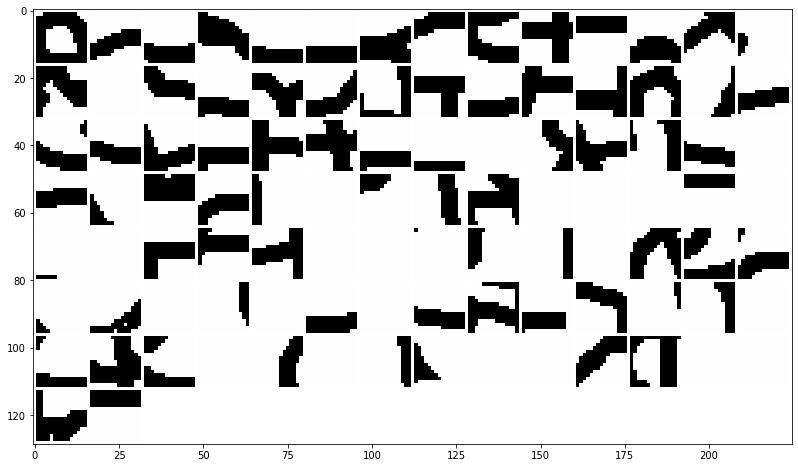

grid regions of 100 regions more=True or worst=False active for filter number: 105 :


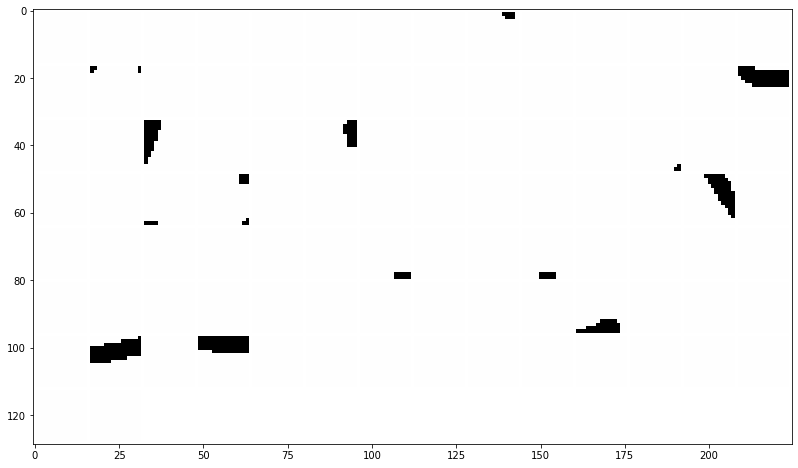

normalized regions:


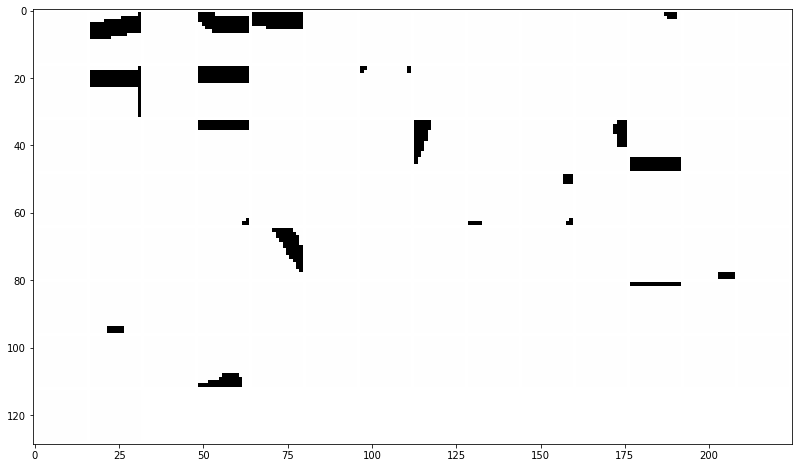

grid regions of 100 regions more=True or worst=False active for filter number: 110 :


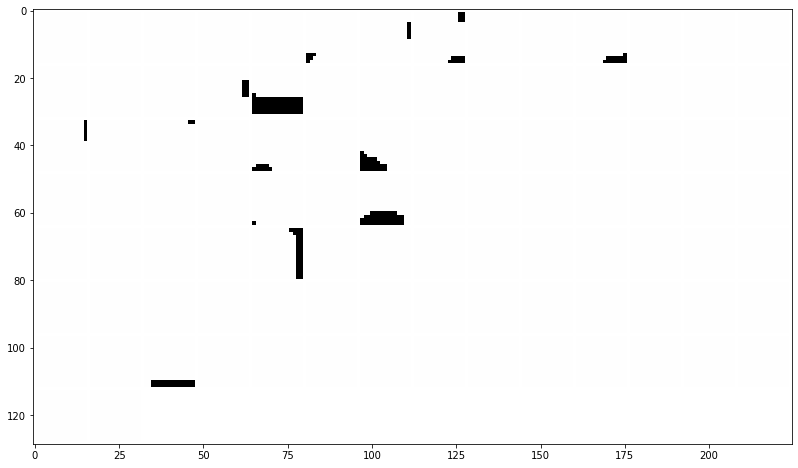

normalized regions:


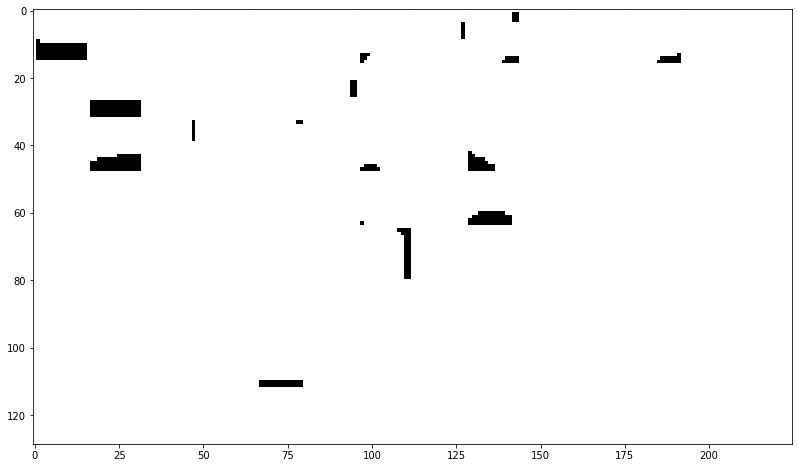

grid regions of 100 regions more=True or worst=False active for filter number: 115 :


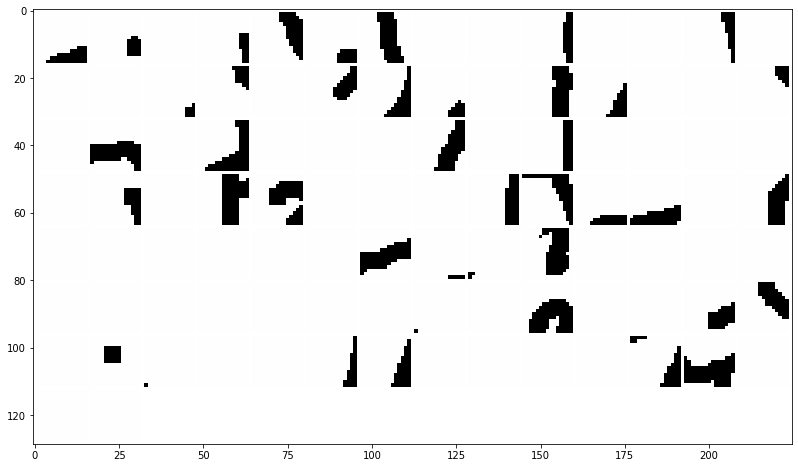

normalized regions:


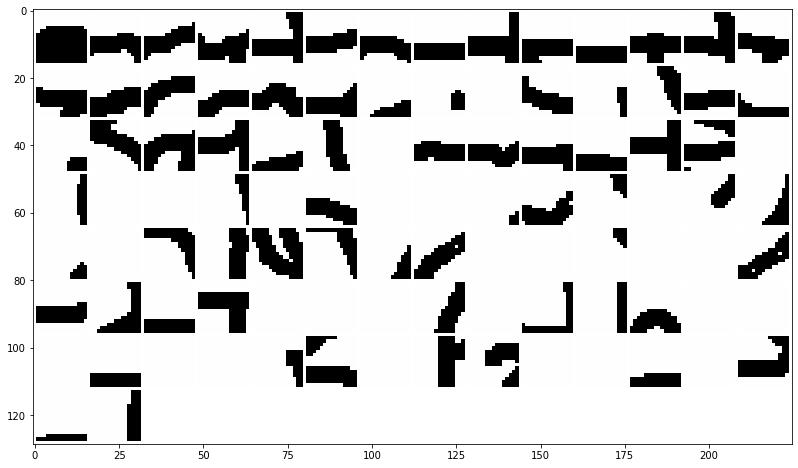

grid regions of 100 regions more=True or worst=False active for filter number: 120 :


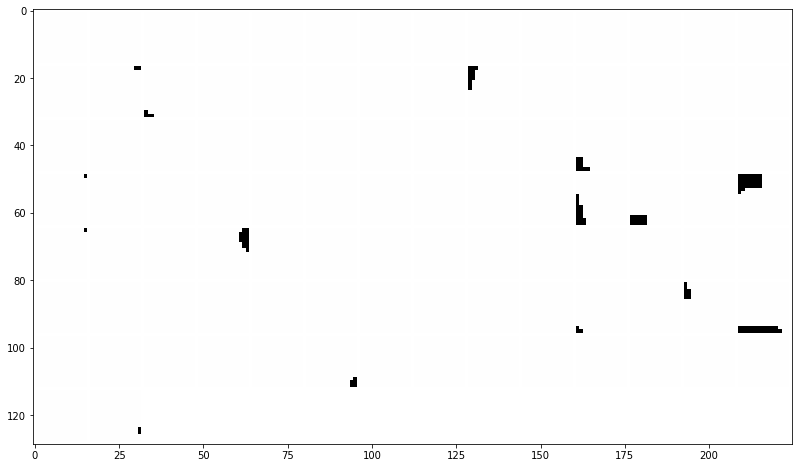

normalized regions:


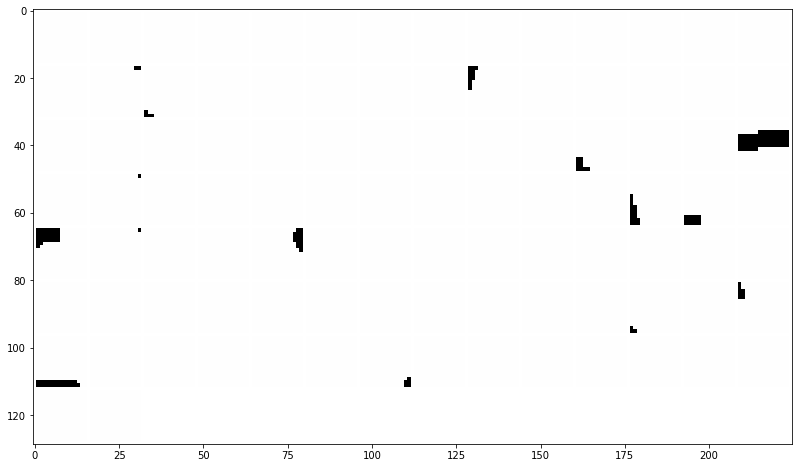

grid regions of 100 regions more=True or worst=False active for filter number: 125 :


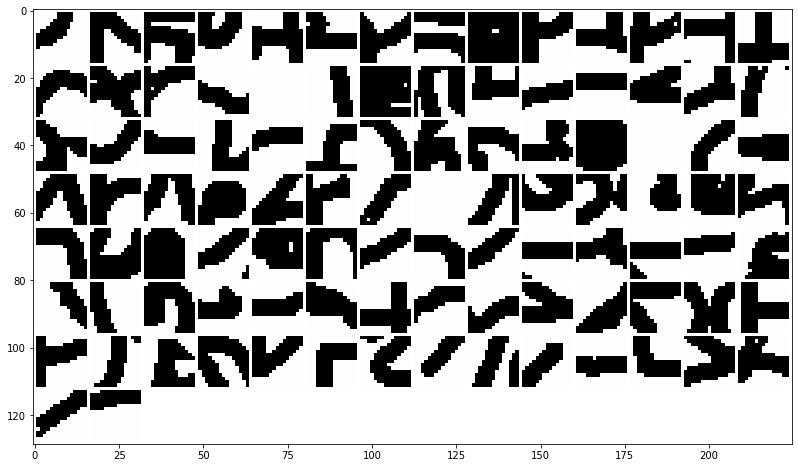

normalized regions:


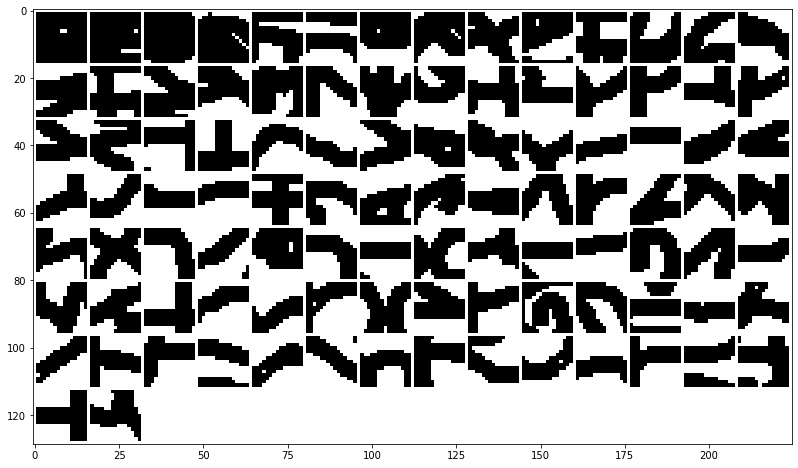

In [40]:
# regions and activation of interest
list_filter = list_filter_interest_layer3_mixt
regions = region_layer3_mixt_binary_stride
activations = activation_layer3_mixt_binary_stride
activations_normalized = activation_layer3_mixt_binary_normalized_stride

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

In [41]:
# regions and activation of interest
list_filter = list_filter_interest_layer4_mixt
regions = region_layer4_mixt_binary_stride
activations = activation_layer4_mixt_binary_stride
activations_normalized = activation_layer4_mixt_binary_normalized_stride

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

Output hidden; open in https://colab.research.google.com to view.

#### Mixt model maxpooling:

Interest of filters: [0, 5, 10, 15, 20, 25, 30]
Consider 10% image regions = 100 images
Consider 10% image regions = 100 images
mean image:
mean regions of 100 regions more=True or worst=False active for filter number: 0 :


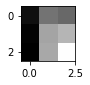

normalized region:


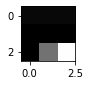

mean regions of 100 regions more=True or worst=False active for filter number: 5 :


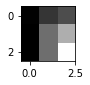

normalized region:


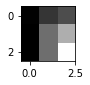

mean regions of 100 regions more=True or worst=False active for filter number: 10 :


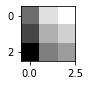

normalized region:


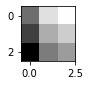

mean regions of 100 regions more=True or worst=False active for filter number: 15 :


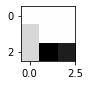

normalized region:


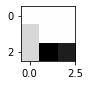

mean regions of 100 regions more=True or worst=False active for filter number: 20 :


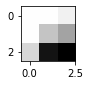

normalized region:


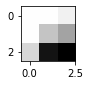

mean regions of 100 regions more=True or worst=False active for filter number: 25 :


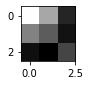

normalized region:


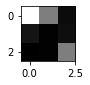

mean regions of 100 regions more=True or worst=False active for filter number: 30 :


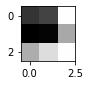

normalized region:


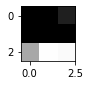

grid image
grid regions of 100 regions more=True or worst=False active for filter number: 0 :


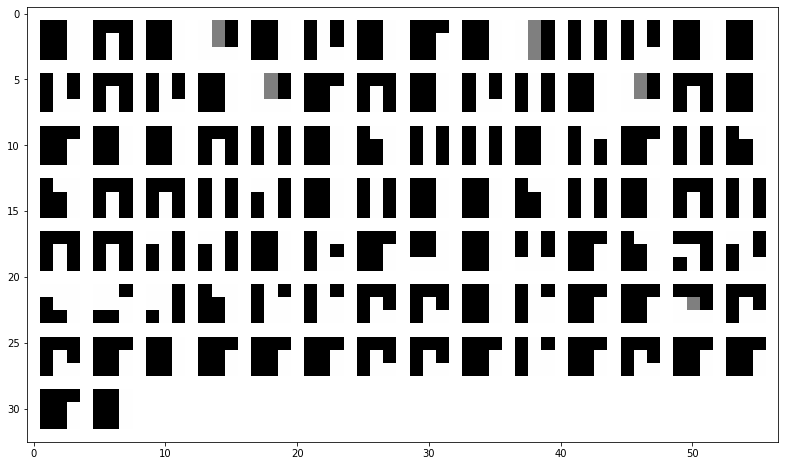

normalized regions:


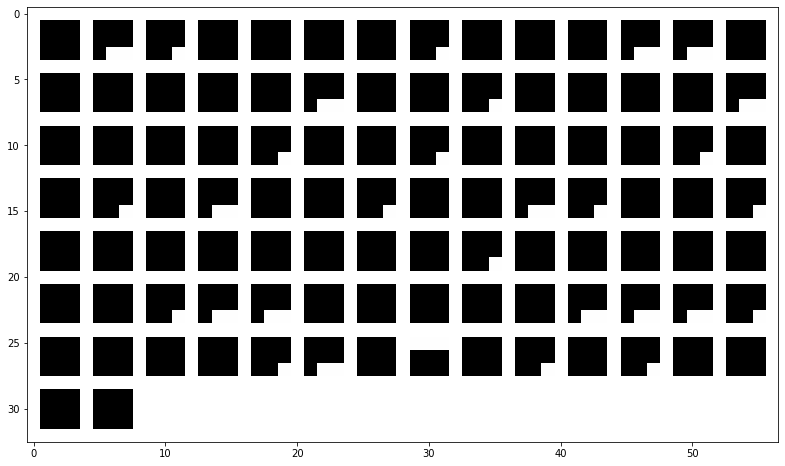

grid regions of 100 regions more=True or worst=False active for filter number: 5 :


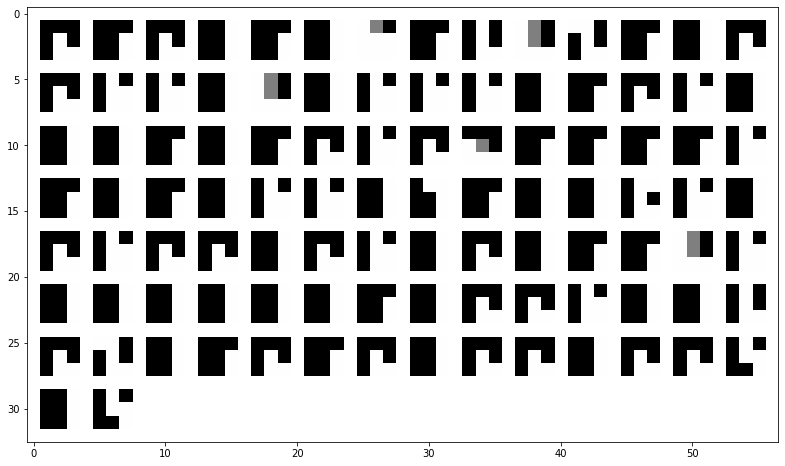

normalized regions:


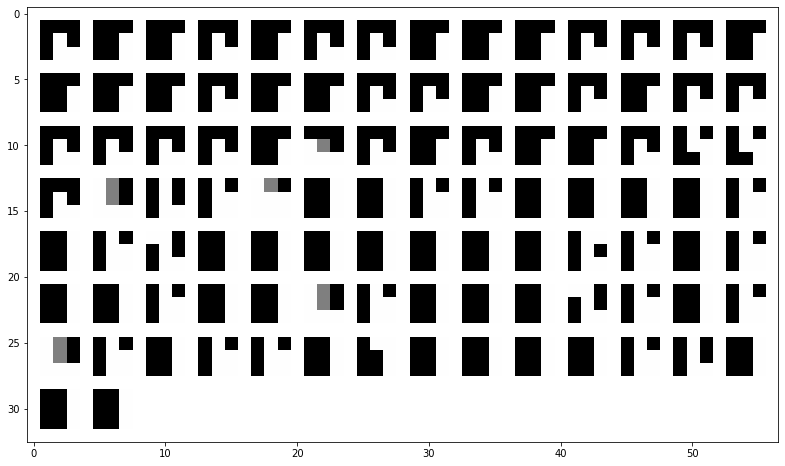

grid regions of 100 regions more=True or worst=False active for filter number: 10 :


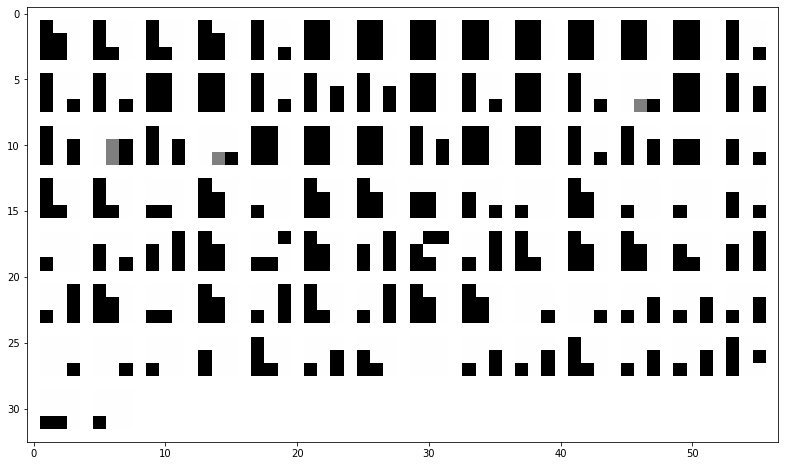

normalized regions:


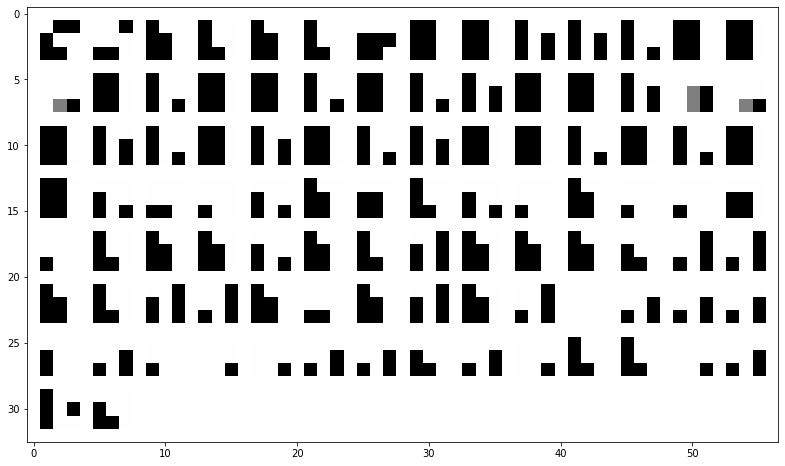

grid regions of 100 regions more=True or worst=False active for filter number: 15 :


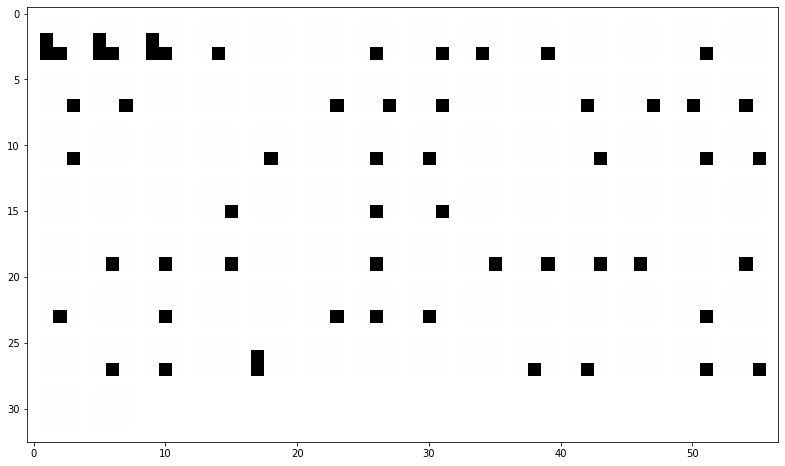

normalized regions:


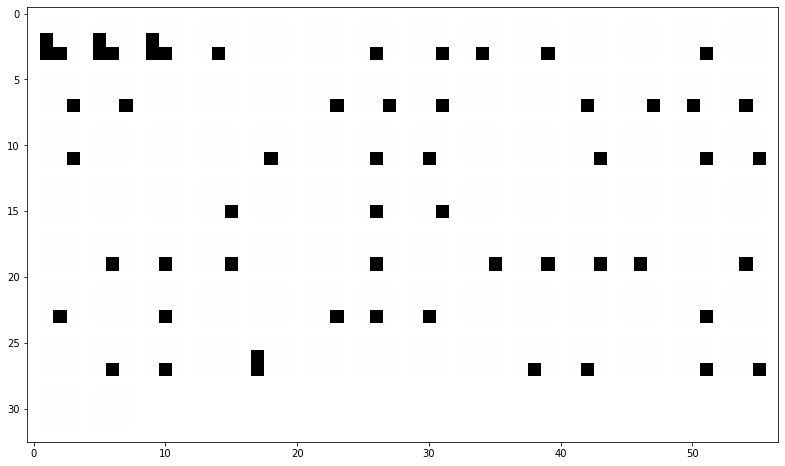

grid regions of 100 regions more=True or worst=False active for filter number: 20 :


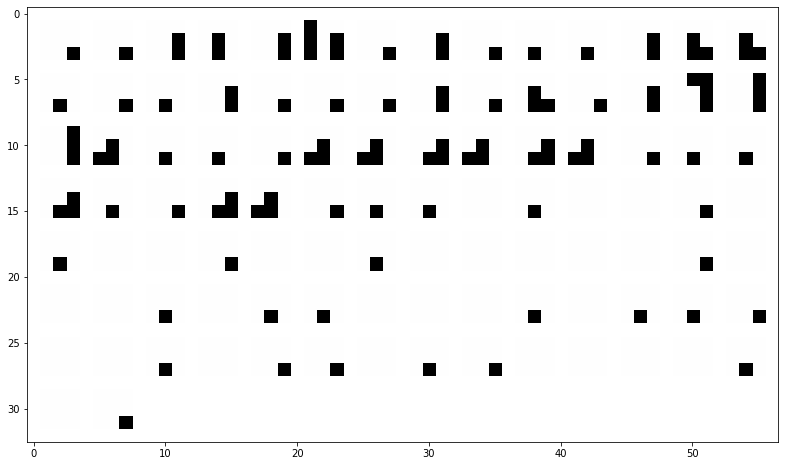

normalized regions:


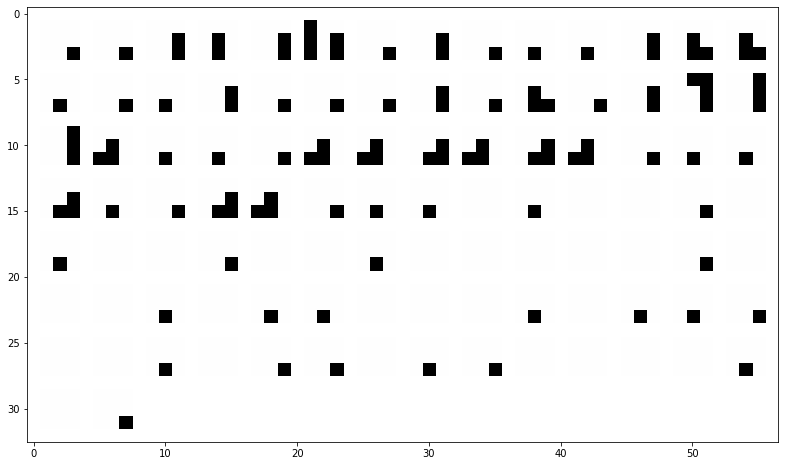

grid regions of 100 regions more=True or worst=False active for filter number: 25 :


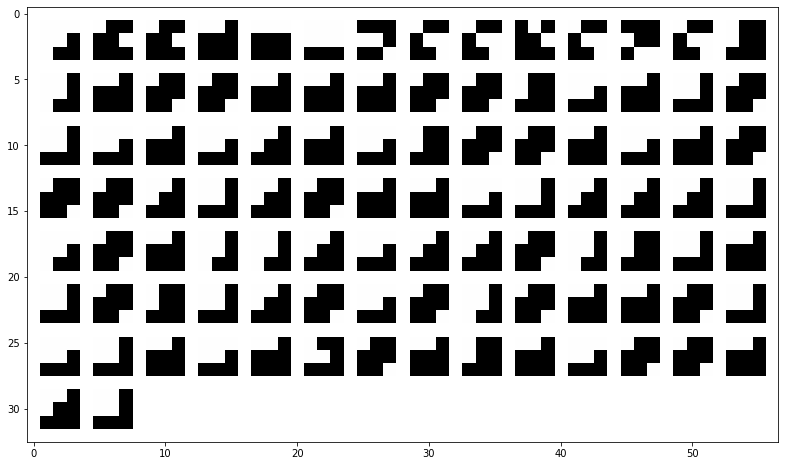

normalized regions:


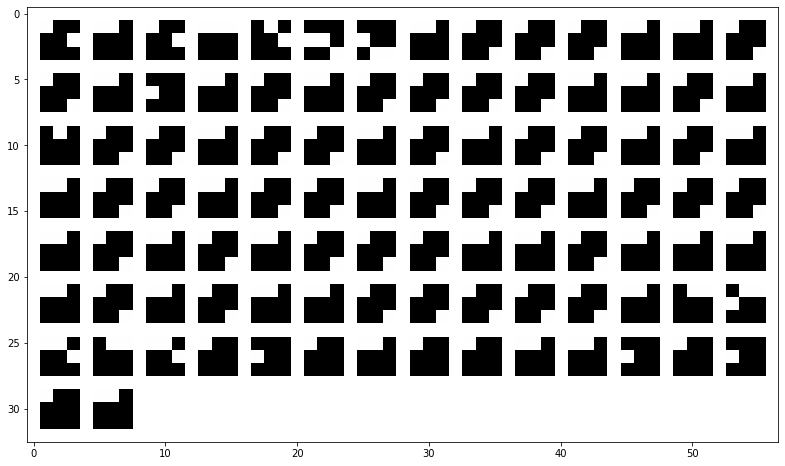

grid regions of 100 regions more=True or worst=False active for filter number: 30 :


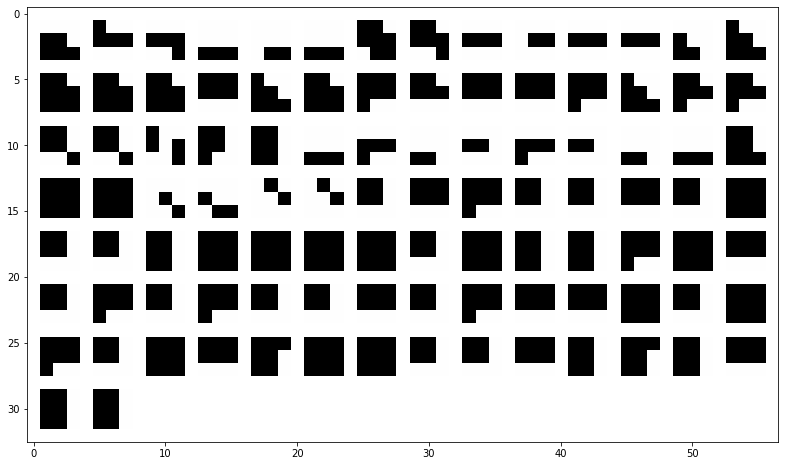

normalized regions:


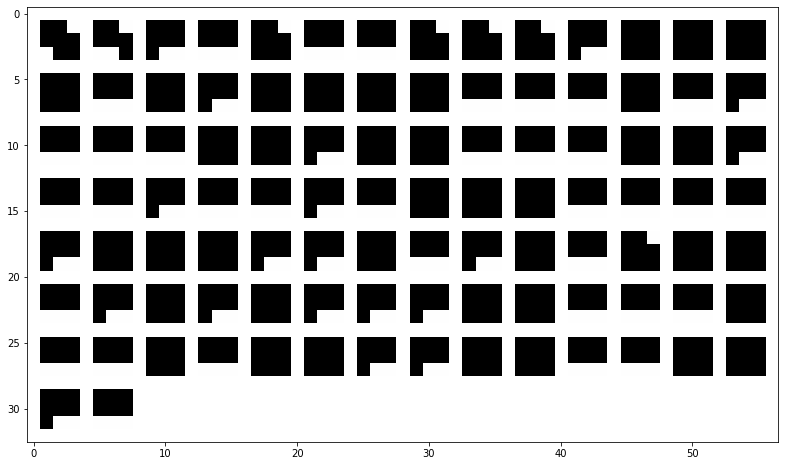

In [17]:
# regions and activation of interest
list_filter = list_filter_interest_layer1_mixt
regions = region_layer1_mixt_no_binary_maxpooling
activations = activation_layer1_mixt_no_binary_maxpooling
activations_normalized = activation_layer1_mixt_no_binary_normalized_maxpooling

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

Interest of filters: [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60]
Consider 10% image regions = 100 images
Consider 10% image regions = 100 images
mean image:
mean regions of 100 regions more=True or worst=False active for filter number: 0 :


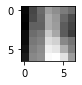

normalized region:


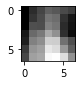

mean regions of 100 regions more=True or worst=False active for filter number: 5 :


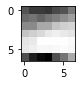

normalized region:


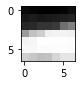

mean regions of 100 regions more=True or worst=False active for filter number: 10 :


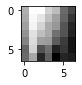

normalized region:


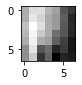

mean regions of 100 regions more=True or worst=False active for filter number: 15 :


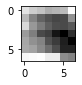

normalized region:


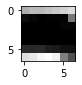

mean regions of 100 regions more=True or worst=False active for filter number: 20 :


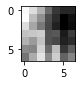

normalized region:


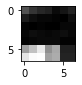

mean regions of 100 regions more=True or worst=False active for filter number: 25 :


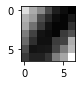

normalized region:


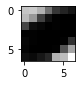

mean regions of 100 regions more=True or worst=False active for filter number: 30 :


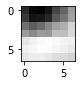

normalized region:


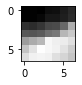

mean regions of 100 regions more=True or worst=False active for filter number: 35 :


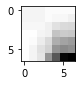

normalized region:


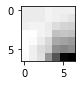

mean regions of 100 regions more=True or worst=False active for filter number: 40 :


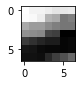

normalized region:


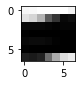

mean regions of 100 regions more=True or worst=False active for filter number: 45 :


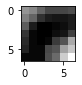

normalized region:


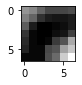

mean regions of 100 regions more=True or worst=False active for filter number: 50 :


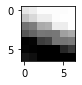

normalized region:


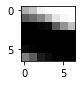

mean regions of 100 regions more=True or worst=False active for filter number: 55 :


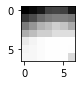

normalized region:


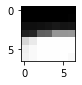

mean regions of 100 regions more=True or worst=False active for filter number: 60 :


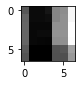

normalized region:


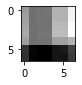

grid image
grid regions of 100 regions more=True or worst=False active for filter number: 0 :


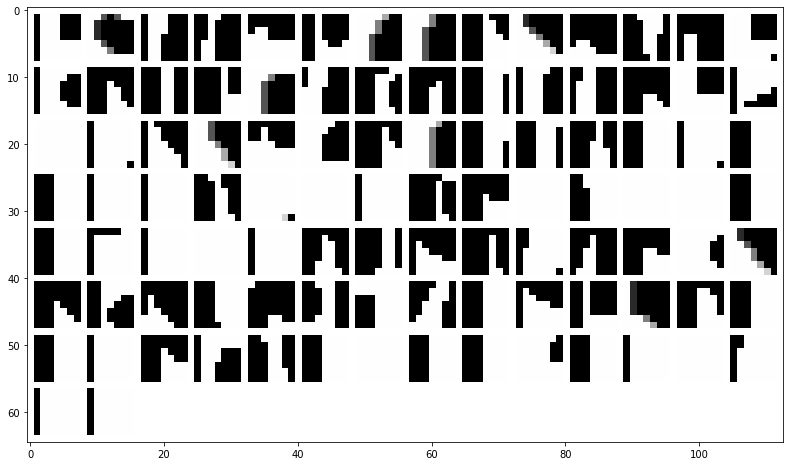

normalized regions:


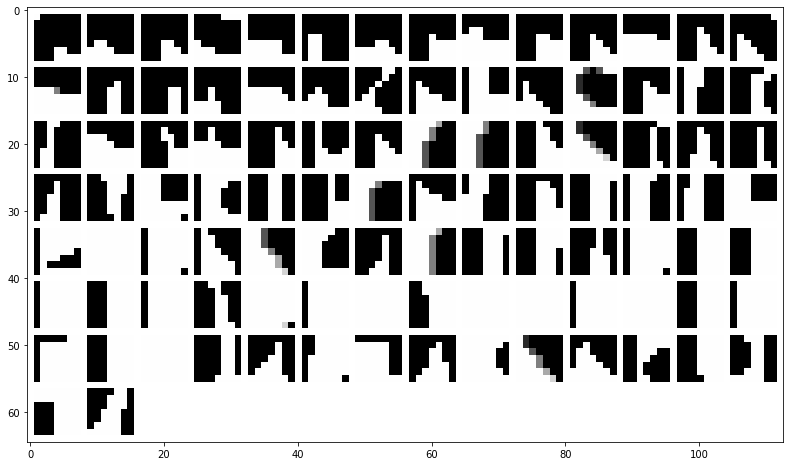

grid regions of 100 regions more=True or worst=False active for filter number: 5 :


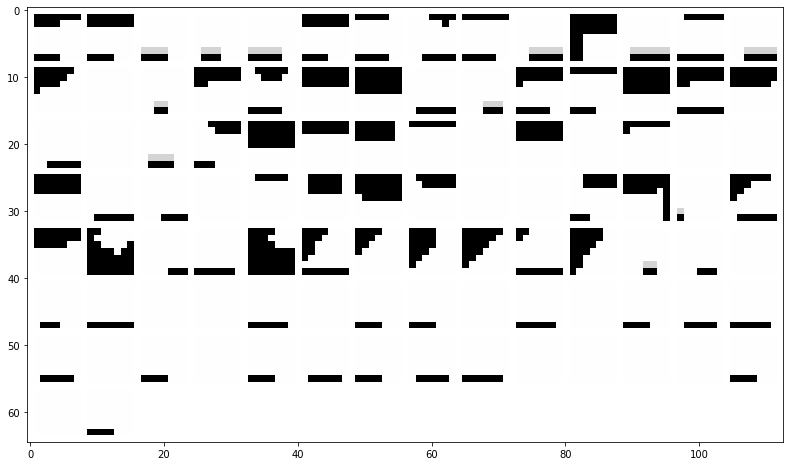

normalized regions:


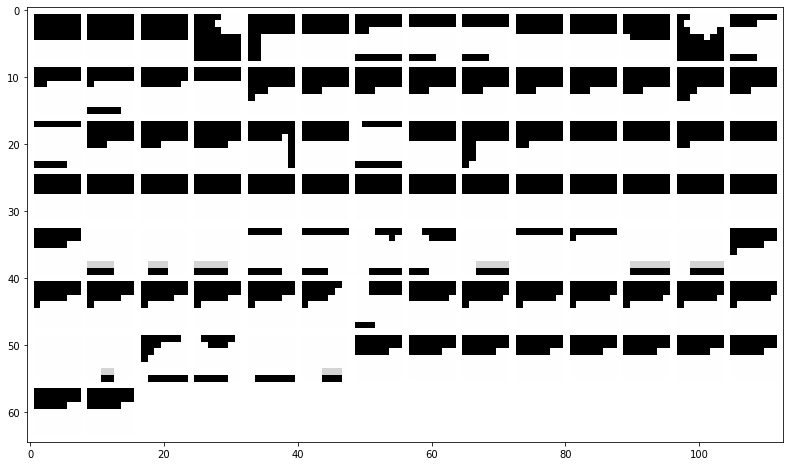

grid regions of 100 regions more=True or worst=False active for filter number: 10 :


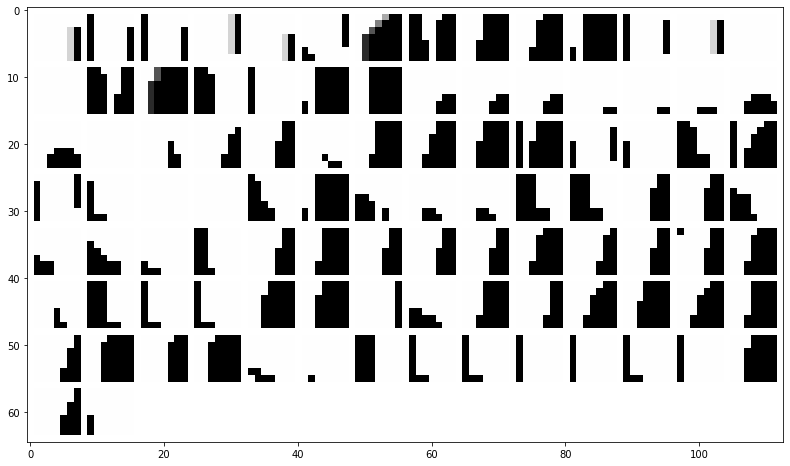

normalized regions:


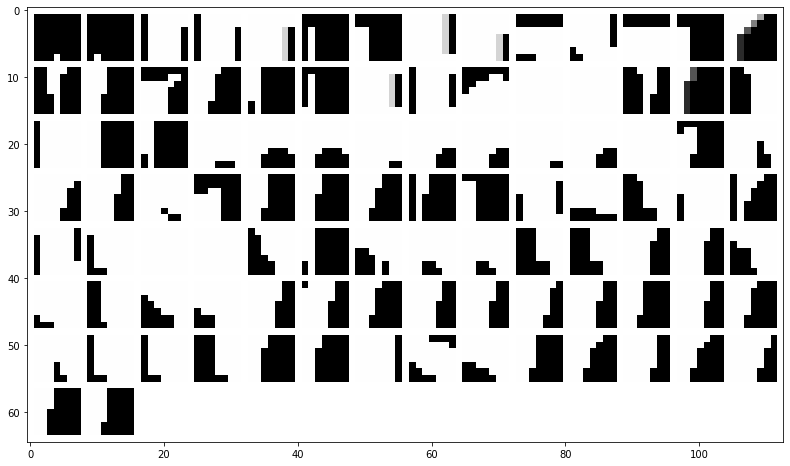

grid regions of 100 regions more=True or worst=False active for filter number: 15 :


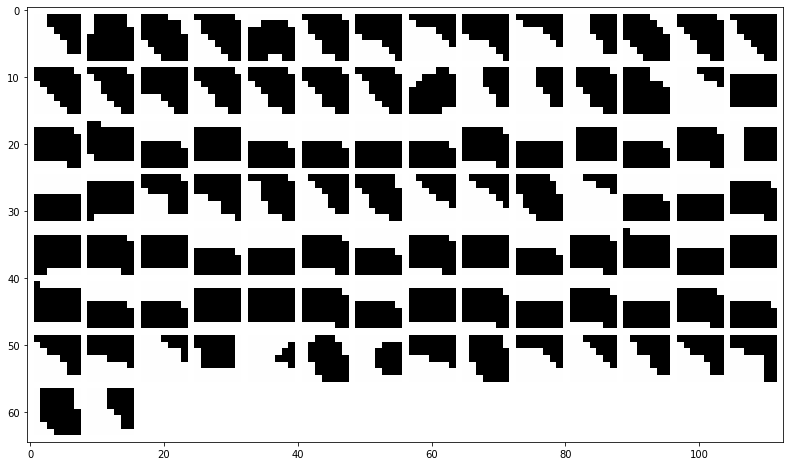

normalized regions:


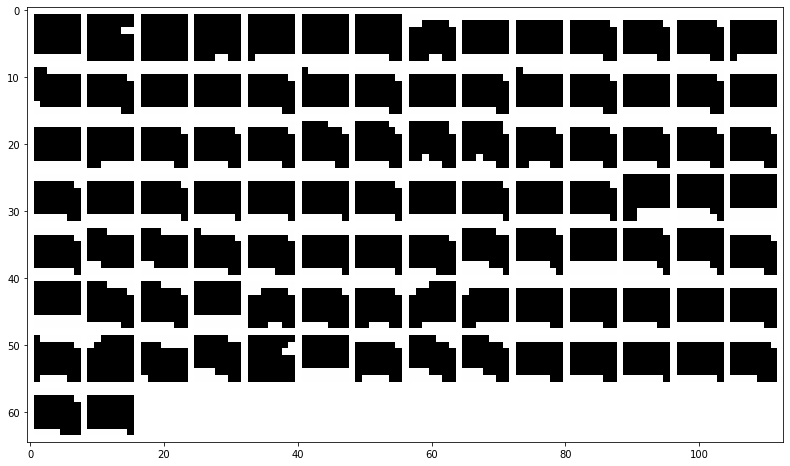

grid regions of 100 regions more=True or worst=False active for filter number: 20 :


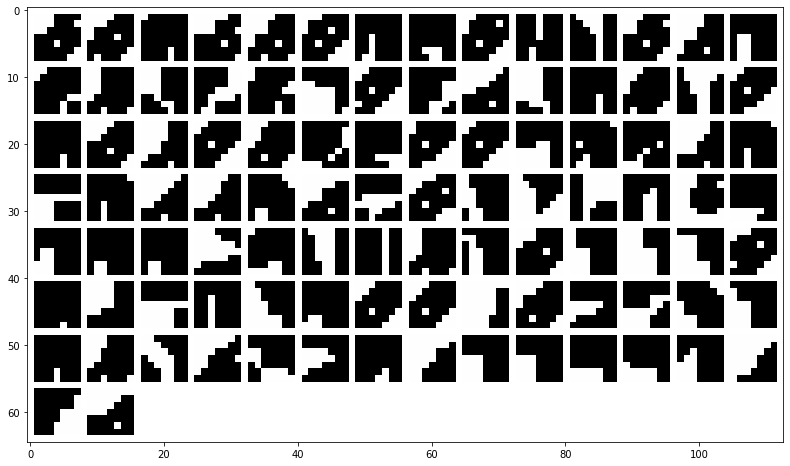

normalized regions:


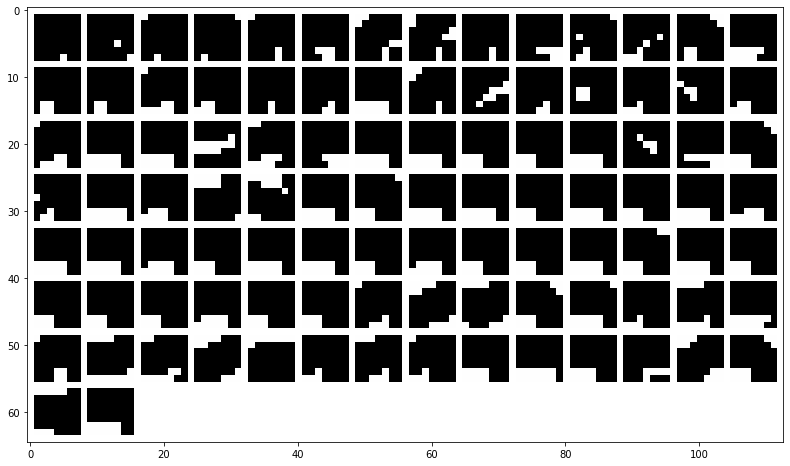

grid regions of 100 regions more=True or worst=False active for filter number: 25 :


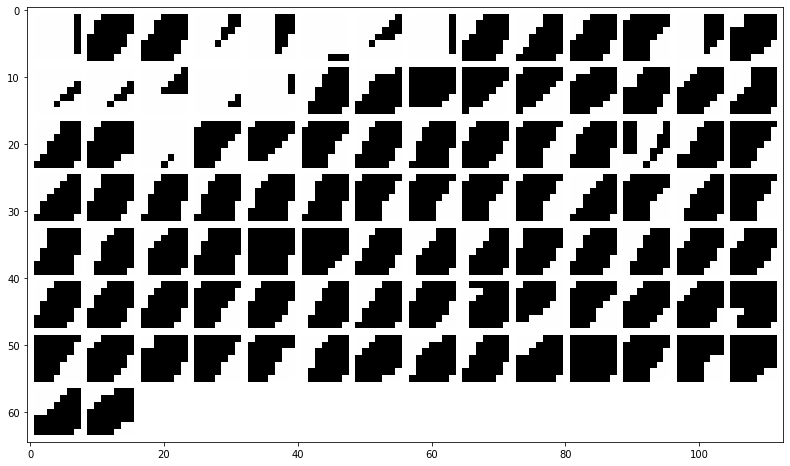

normalized regions:


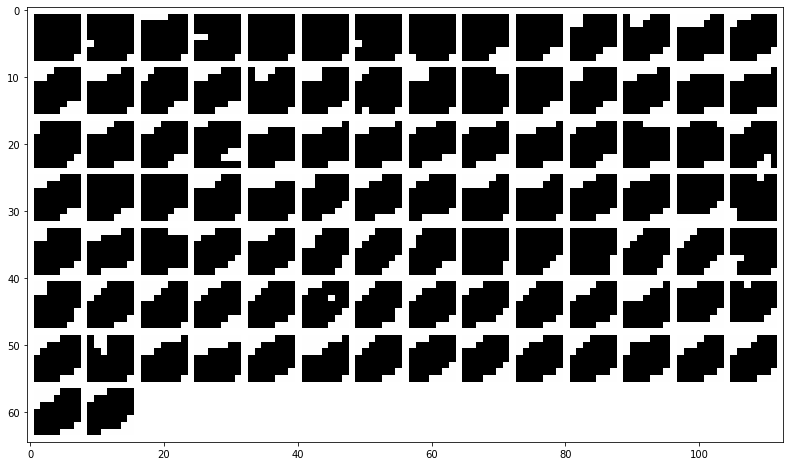

grid regions of 100 regions more=True or worst=False active for filter number: 30 :


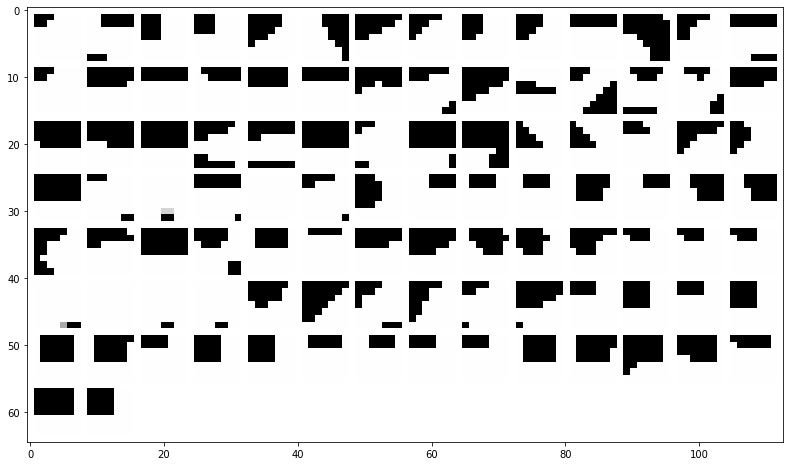

normalized regions:


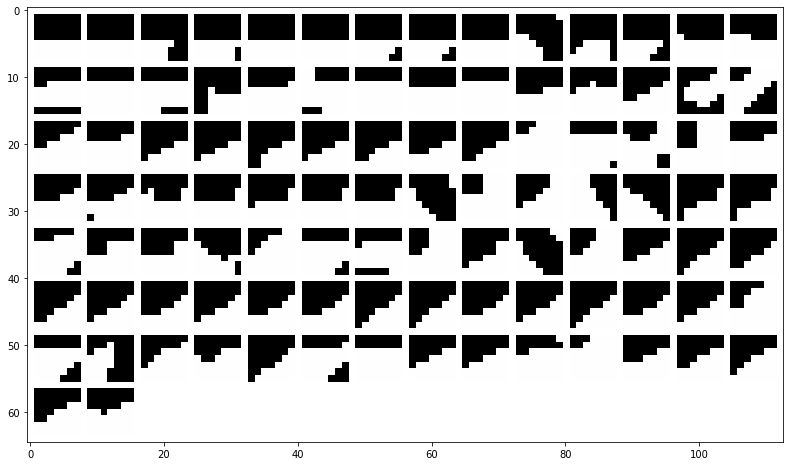

grid regions of 100 regions more=True or worst=False active for filter number: 35 :


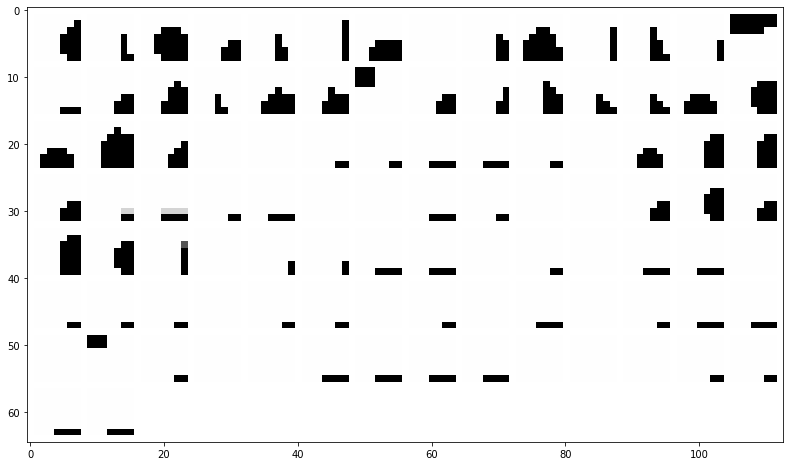

normalized regions:


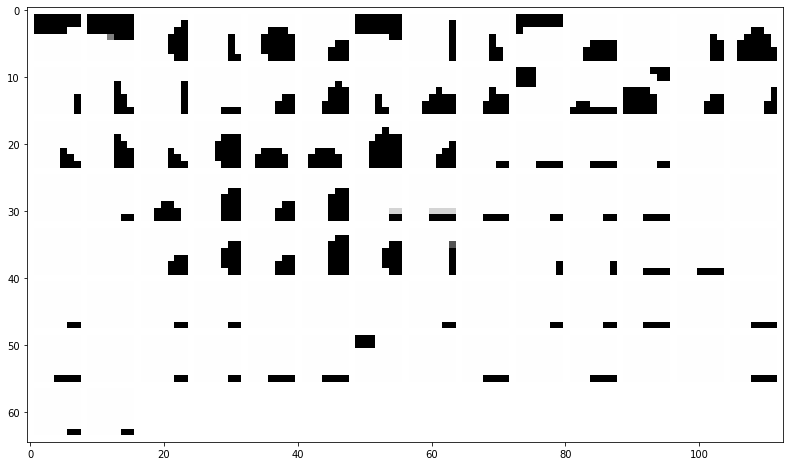

grid regions of 100 regions more=True or worst=False active for filter number: 40 :


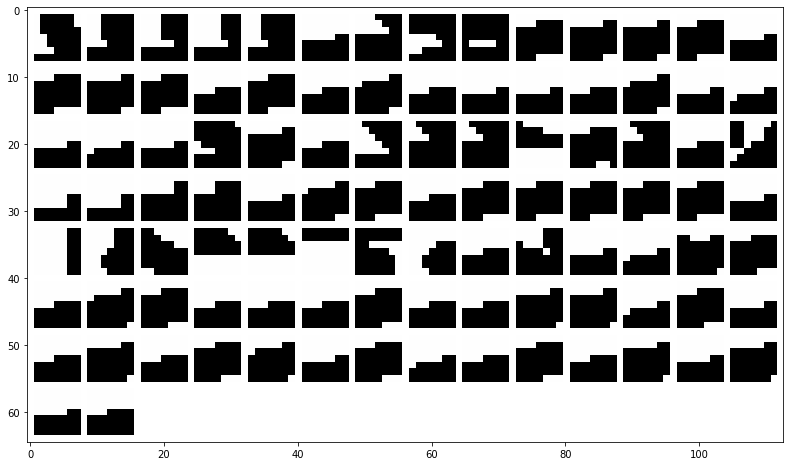

normalized regions:


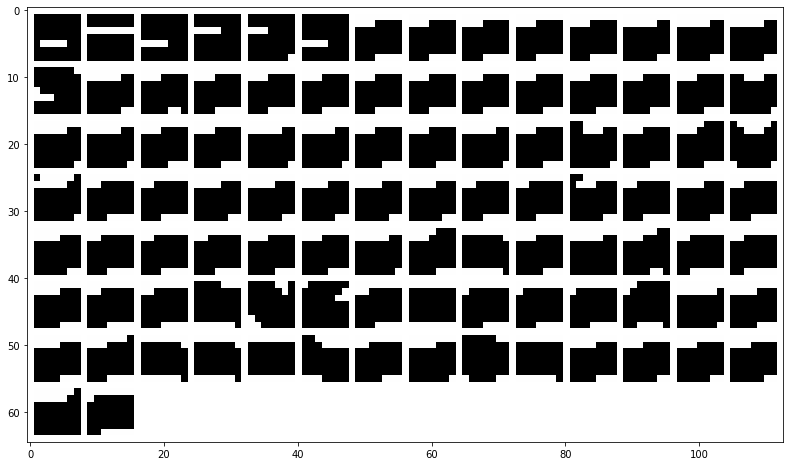

grid regions of 100 regions more=True or worst=False active for filter number: 45 :


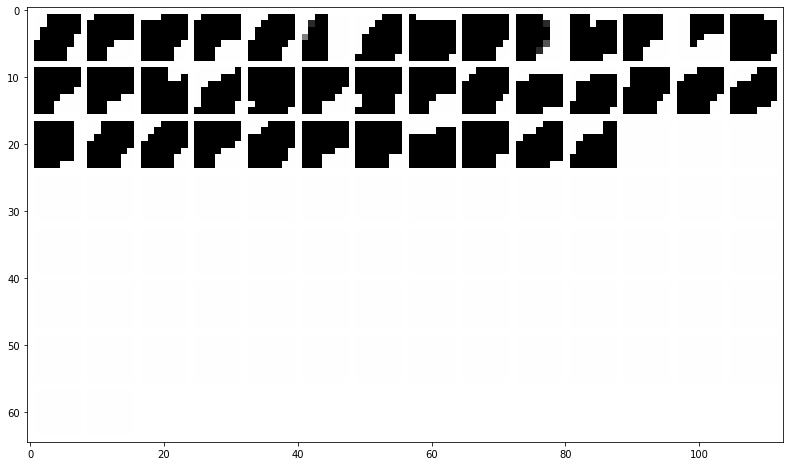

normalized regions:


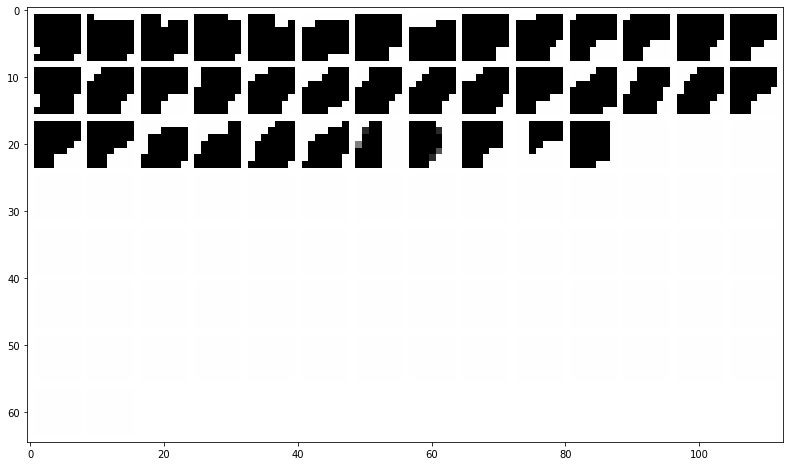

grid regions of 100 regions more=True or worst=False active for filter number: 50 :


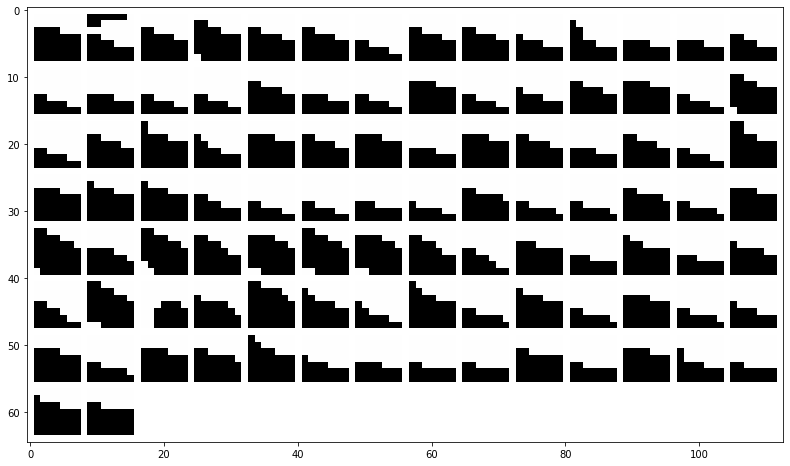

normalized regions:


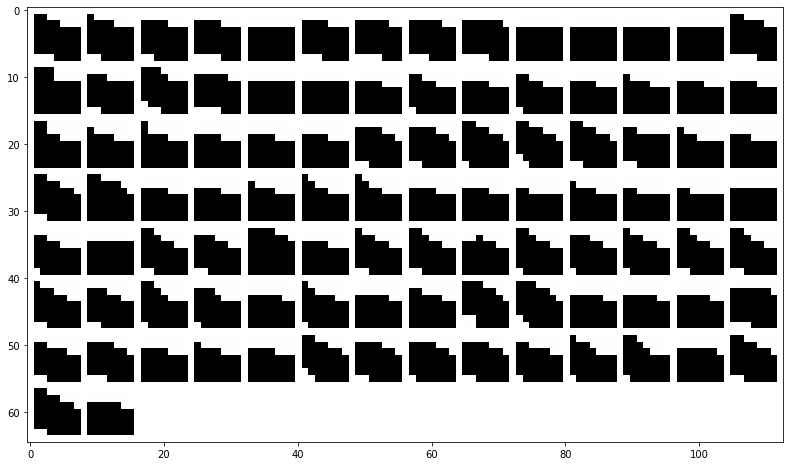

grid regions of 100 regions more=True or worst=False active for filter number: 55 :


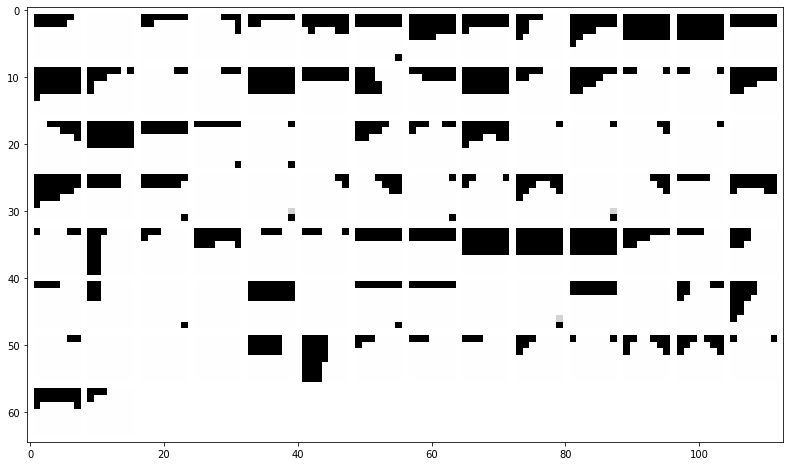

normalized regions:


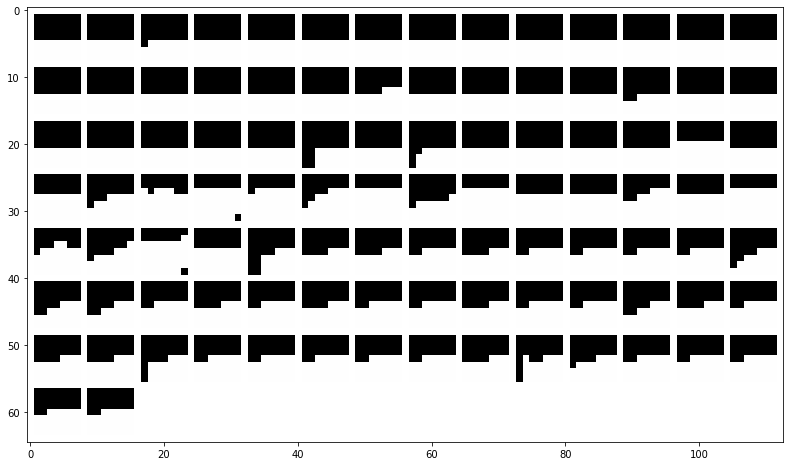

grid regions of 100 regions more=True or worst=False active for filter number: 60 :


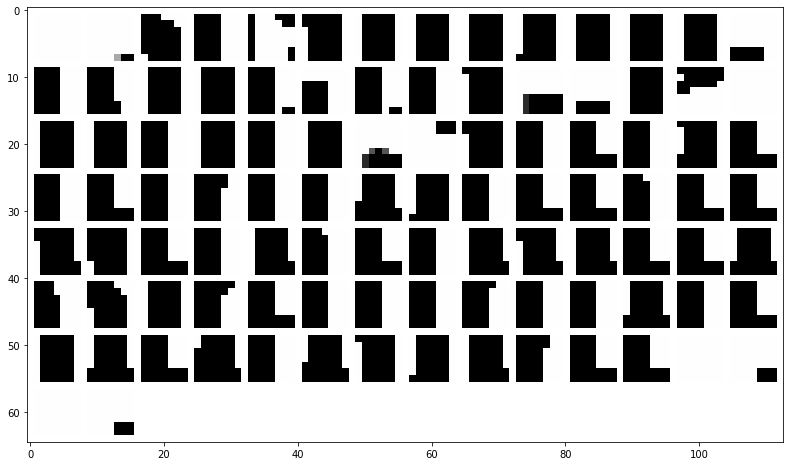

normalized regions:


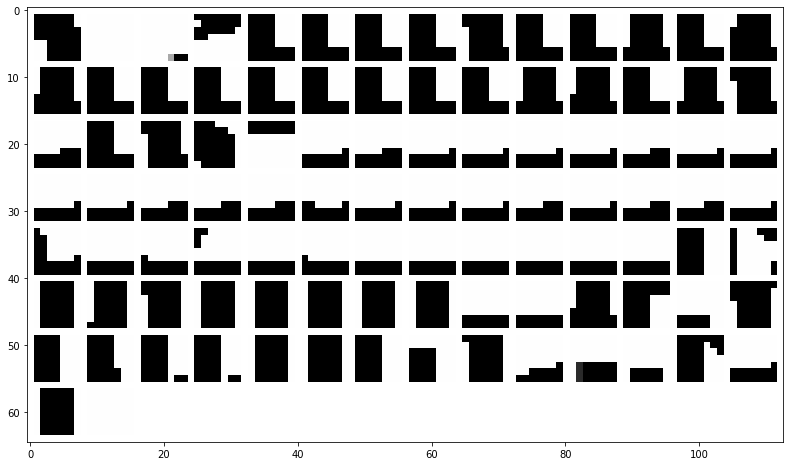

In [18]:
# regions and activation of interest
list_filter = list_filter_interest_layer2_mixt
regions = region_layer2_mixt_no_binary_maxpooling
activations = activation_layer2_mixt_no_binary_maxpooling
activations_normalized = activation_layer2_mixt_no_binary_normalized_maxpooling

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

Interest of filters: [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 80, 85, 90, 95, 100, 105, 110, 115, 120, 125]
Consider 10% image regions = 100 images
Consider 10% image regions = 100 images
mean image:
mean regions of 100 regions more=True or worst=False active for filter number: 0 :


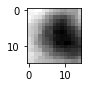

normalized region:


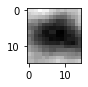

mean regions of 100 regions more=True or worst=False active for filter number: 5 :


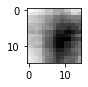

normalized region:


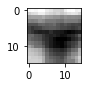

mean regions of 100 regions more=True or worst=False active for filter number: 10 :


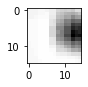

normalized region:


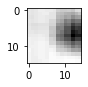

mean regions of 100 regions more=True or worst=False active for filter number: 15 :


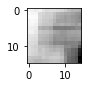

normalized region:


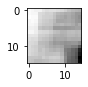

mean regions of 100 regions more=True or worst=False active for filter number: 20 :


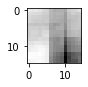

normalized region:


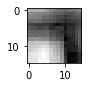

mean regions of 100 regions more=True or worst=False active for filter number: 25 :


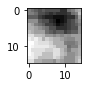

normalized region:


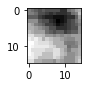

mean regions of 100 regions more=True or worst=False active for filter number: 30 :


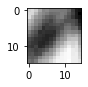

normalized region:


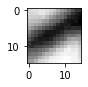

mean regions of 100 regions more=True or worst=False active for filter number: 35 :


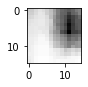

normalized region:


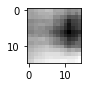

mean regions of 100 regions more=True or worst=False active for filter number: 40 :


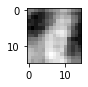

normalized region:


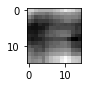

mean regions of 100 regions more=True or worst=False active for filter number: 45 :


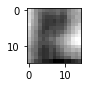

normalized region:


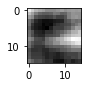

mean regions of 100 regions more=True or worst=False active for filter number: 50 :


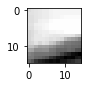

normalized region:


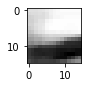

mean regions of 100 regions more=True or worst=False active for filter number: 55 :


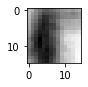

normalized region:


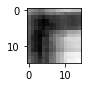

mean regions of 100 regions more=True or worst=False active for filter number: 60 :


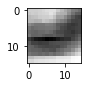

normalized region:


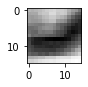

mean regions of 100 regions more=True or worst=False active for filter number: 65 :


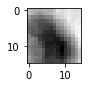

normalized region:


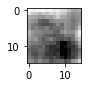

mean regions of 100 regions more=True or worst=False active for filter number: 70 :


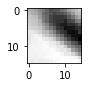

normalized region:


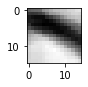

mean regions of 100 regions more=True or worst=False active for filter number: 80 :


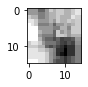

normalized region:


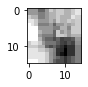

mean regions of 100 regions more=True or worst=False active for filter number: 85 :


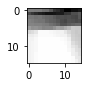

normalized region:


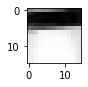

mean regions of 100 regions more=True or worst=False active for filter number: 90 :


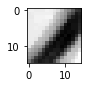

normalized region:


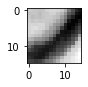

mean regions of 100 regions more=True or worst=False active for filter number: 95 :


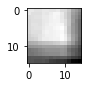

normalized region:


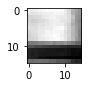

mean regions of 100 regions more=True or worst=False active for filter number: 100 :


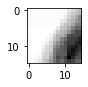

normalized region:


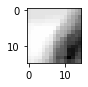

mean regions of 100 regions more=True or worst=False active for filter number: 105 :


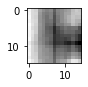

normalized region:


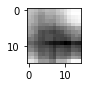

mean regions of 100 regions more=True or worst=False active for filter number: 110 :


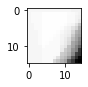

normalized region:


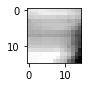

mean regions of 100 regions more=True or worst=False active for filter number: 115 :


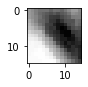

normalized region:


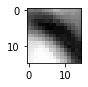

mean regions of 100 regions more=True or worst=False active for filter number: 120 :


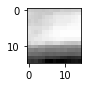

normalized region:


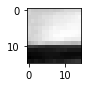

mean regions of 100 regions more=True or worst=False active for filter number: 125 :


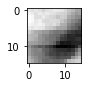

normalized region:


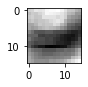

grid image
grid regions of 100 regions more=True or worst=False active for filter number: 0 :


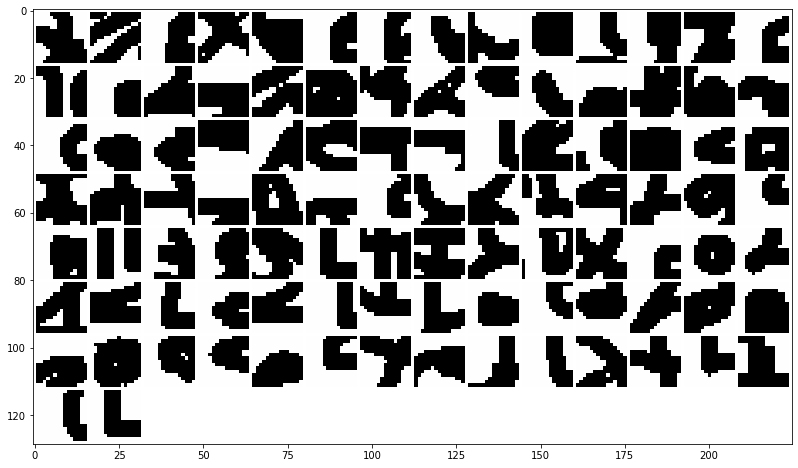

normalized regions:


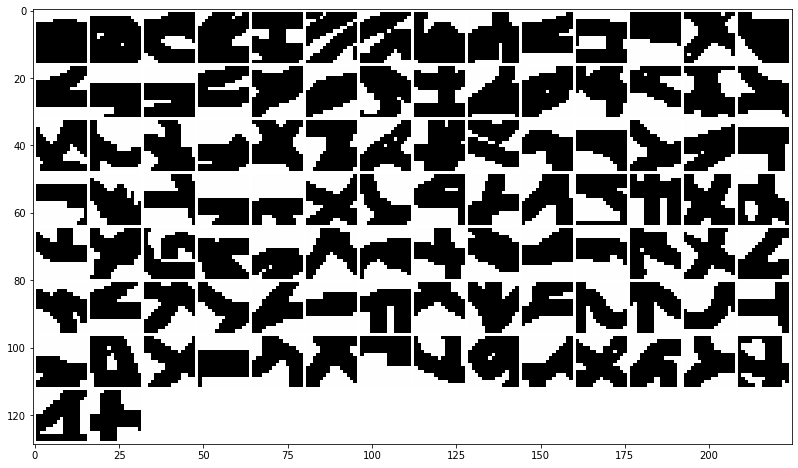

grid regions of 100 regions more=True or worst=False active for filter number: 5 :


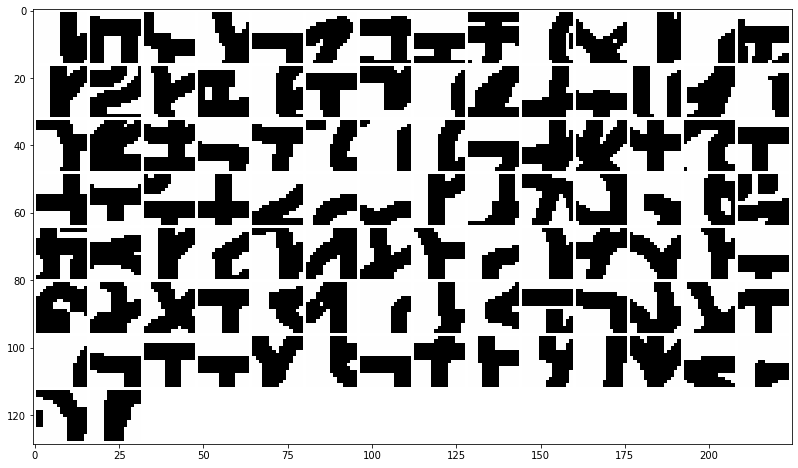

normalized regions:


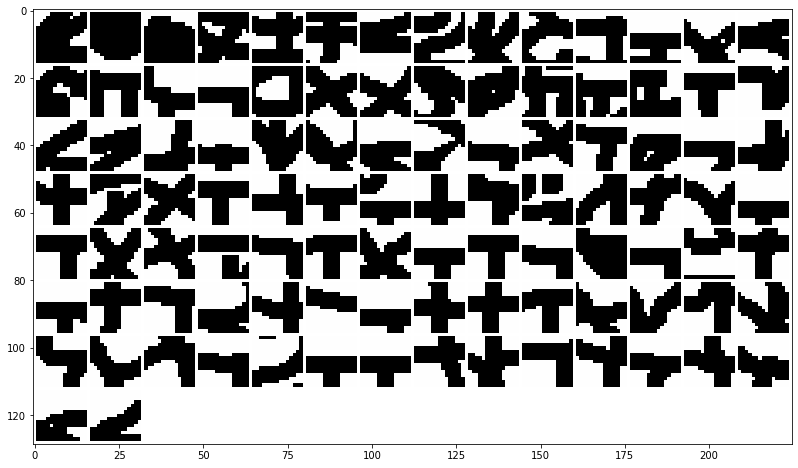

grid regions of 100 regions more=True or worst=False active for filter number: 10 :


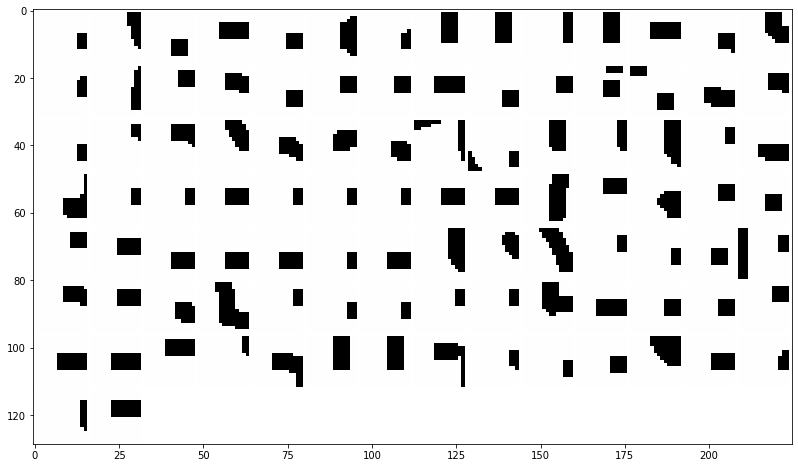

normalized regions:


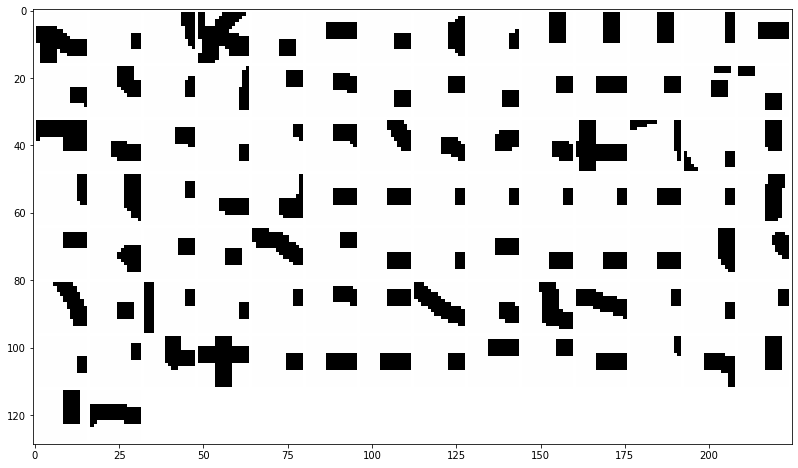

grid regions of 100 regions more=True or worst=False active for filter number: 15 :


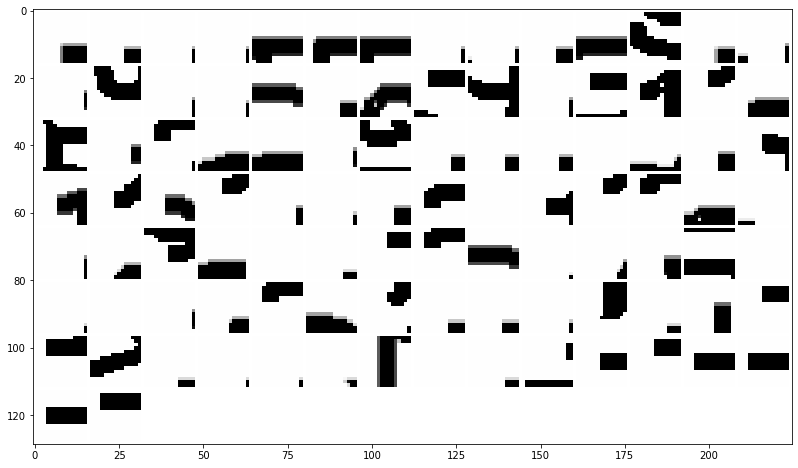

normalized regions:


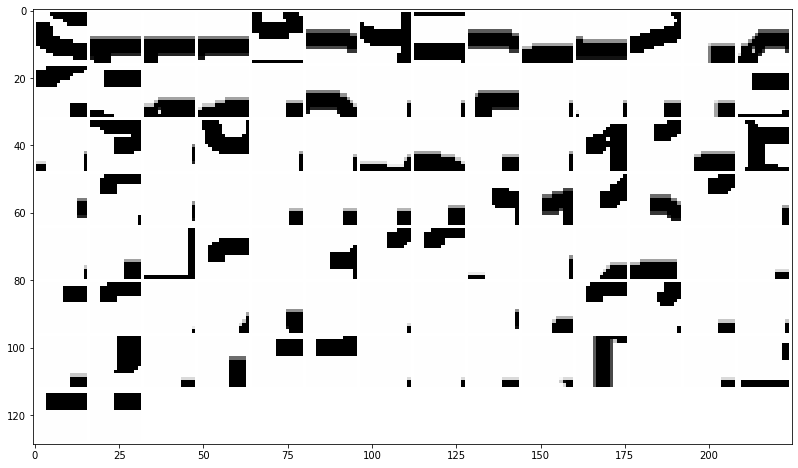

grid regions of 100 regions more=True or worst=False active for filter number: 20 :


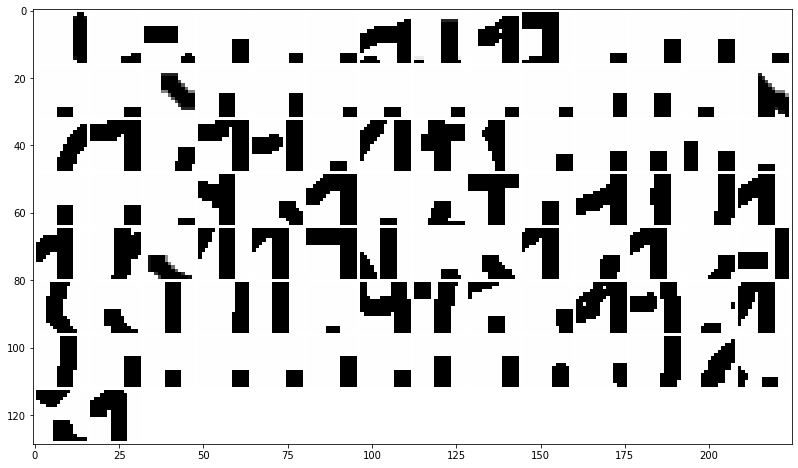

normalized regions:


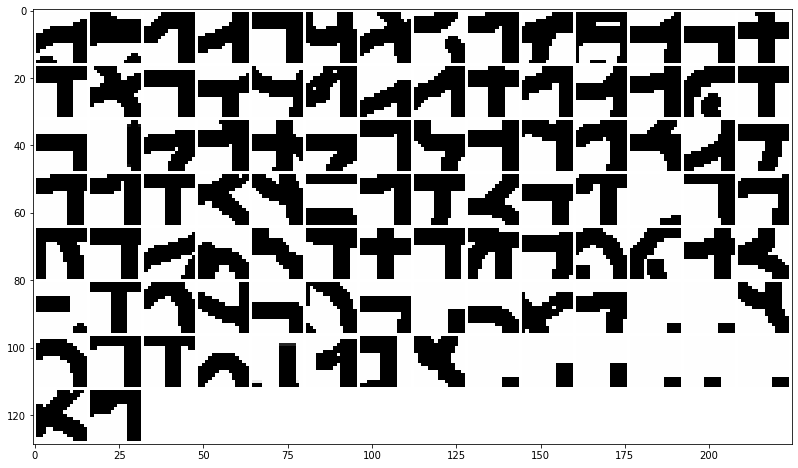

grid regions of 100 regions more=True or worst=False active for filter number: 25 :


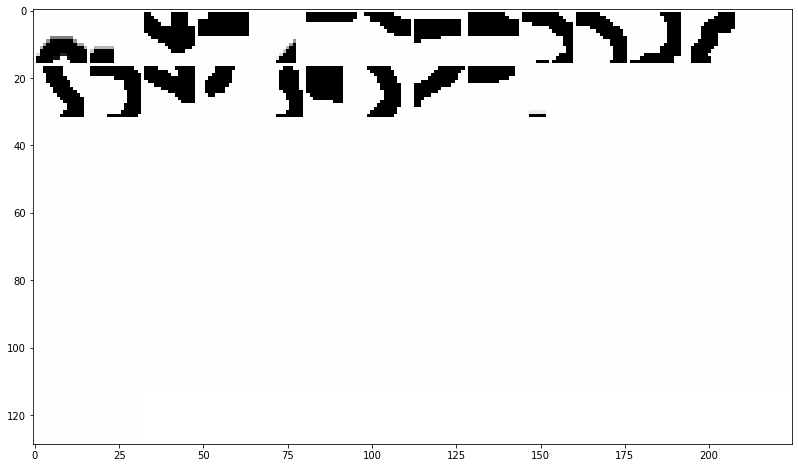

normalized regions:


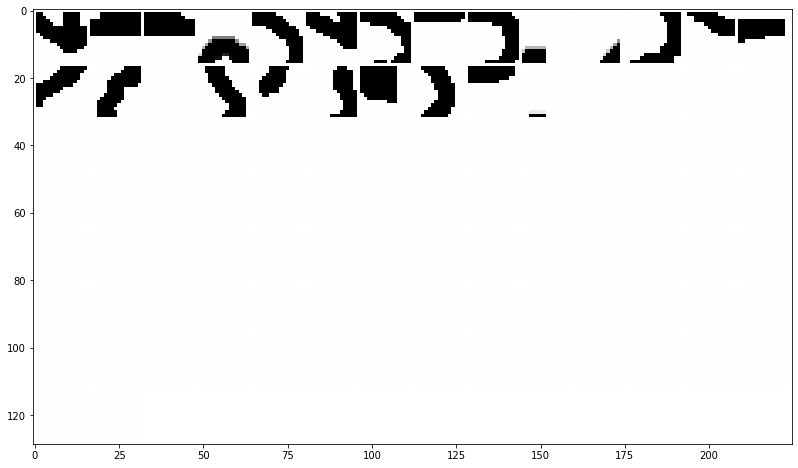

grid regions of 100 regions more=True or worst=False active for filter number: 30 :


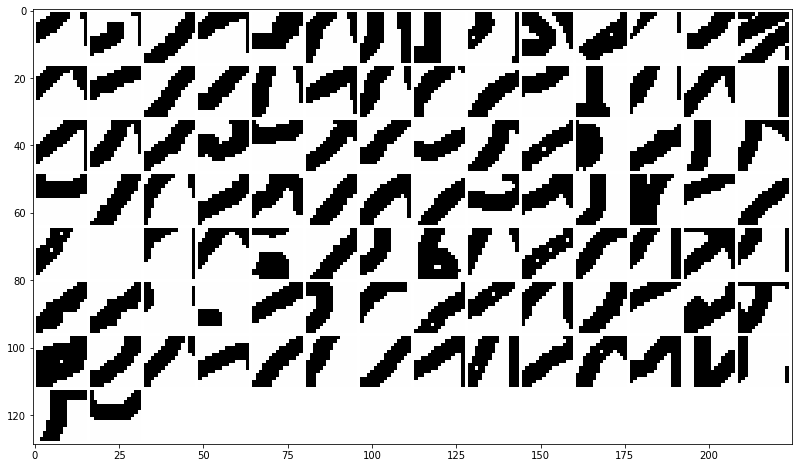

normalized regions:


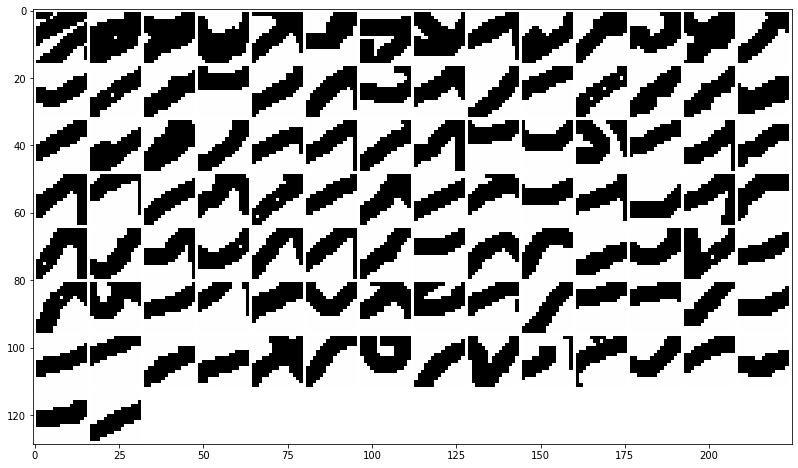

grid regions of 100 regions more=True or worst=False active for filter number: 35 :


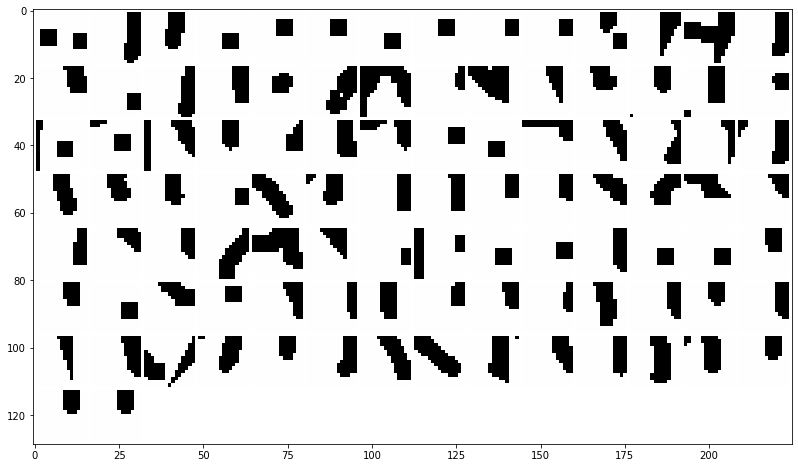

normalized regions:


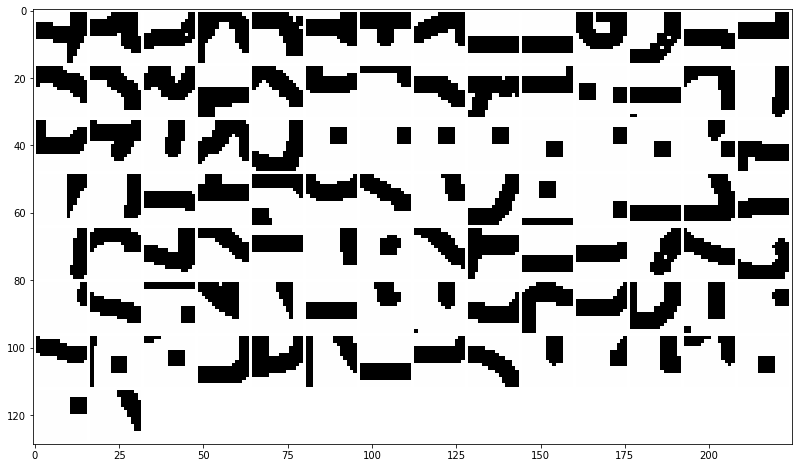

grid regions of 100 regions more=True or worst=False active for filter number: 40 :


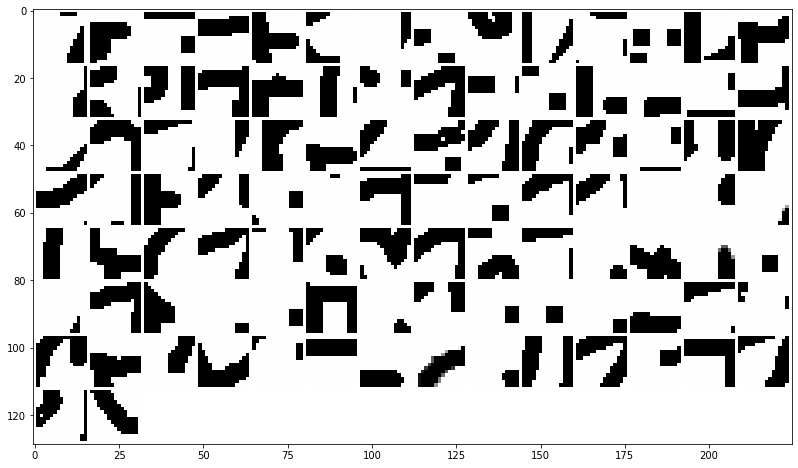

normalized regions:


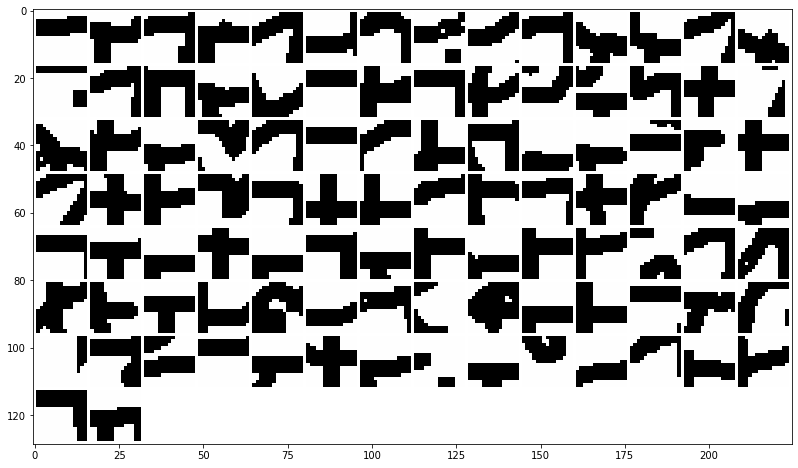

grid regions of 100 regions more=True or worst=False active for filter number: 45 :


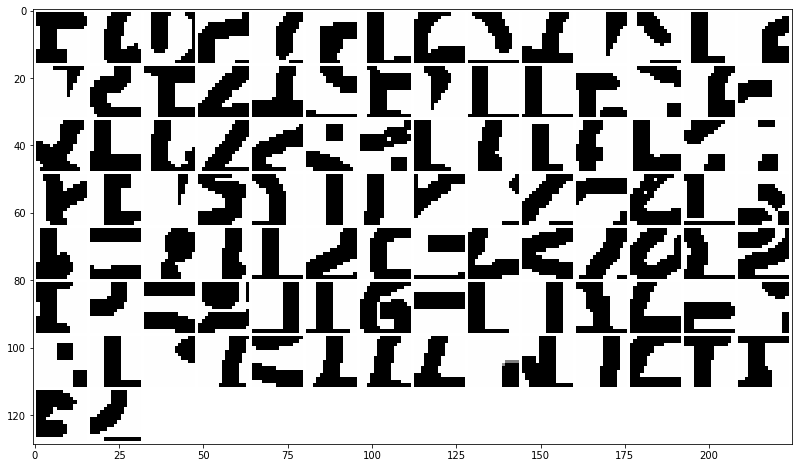

normalized regions:


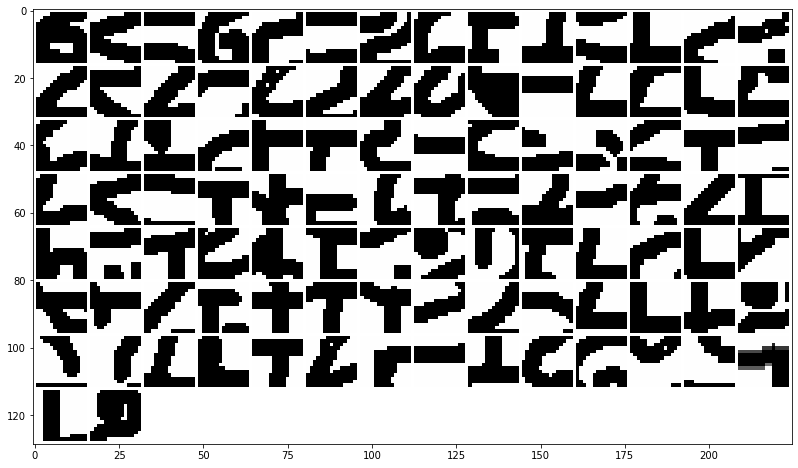

grid regions of 100 regions more=True or worst=False active for filter number: 50 :


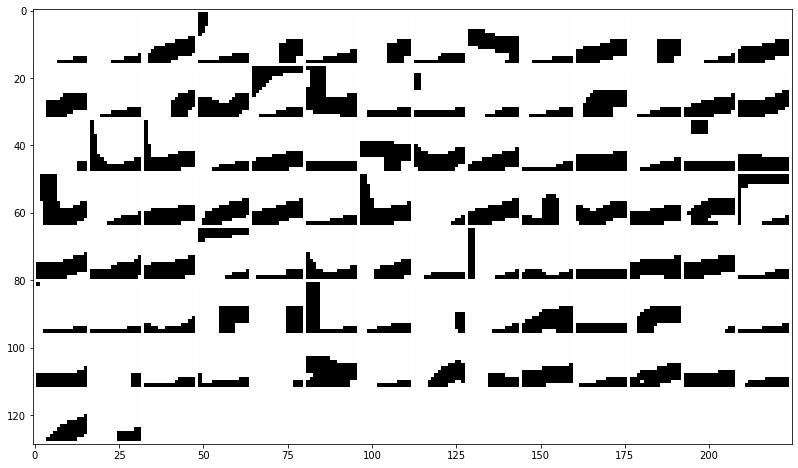

normalized regions:


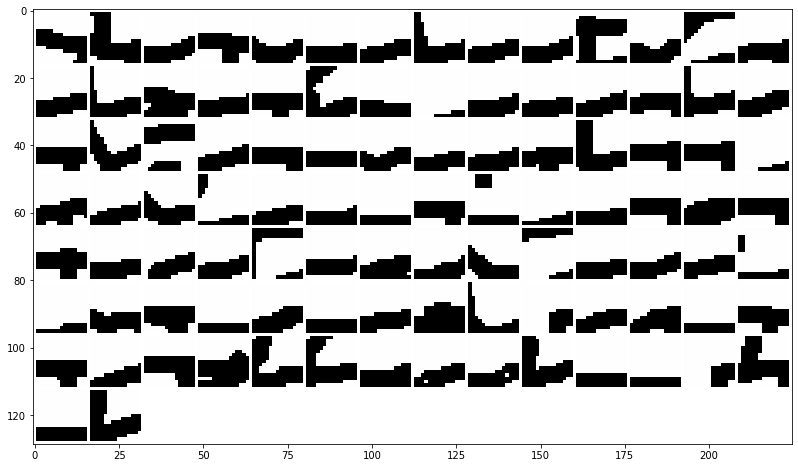

grid regions of 100 regions more=True or worst=False active for filter number: 55 :


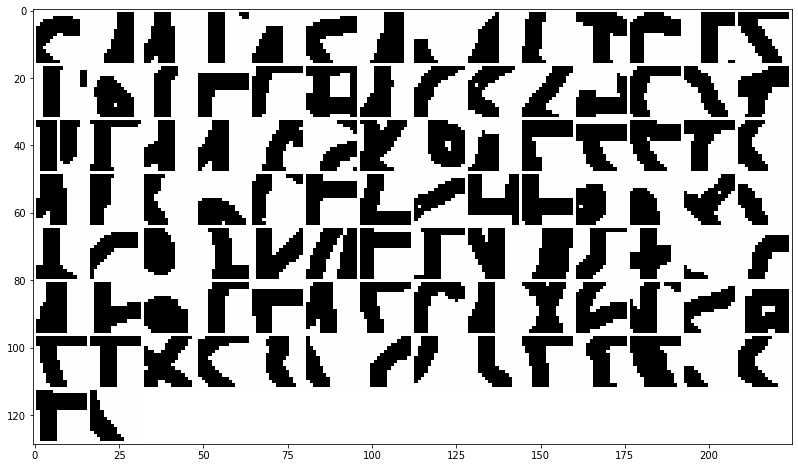

normalized regions:


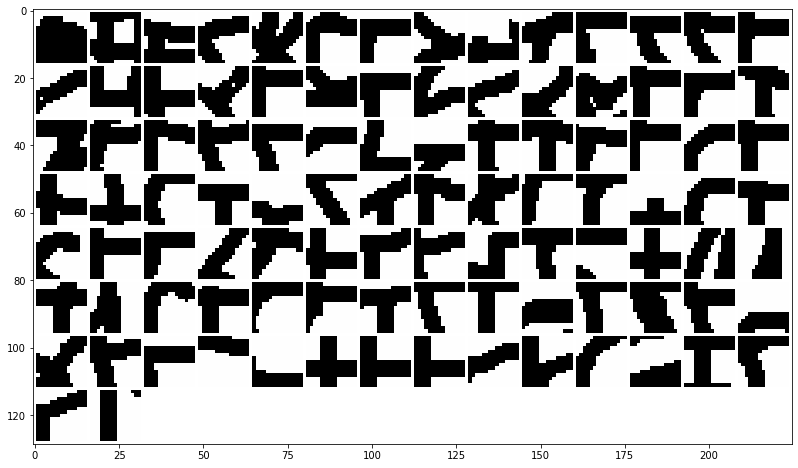

grid regions of 100 regions more=True or worst=False active for filter number: 60 :


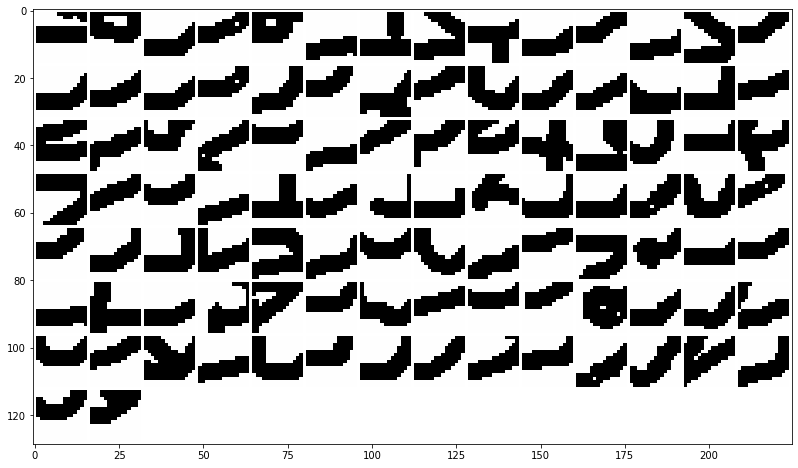

normalized regions:


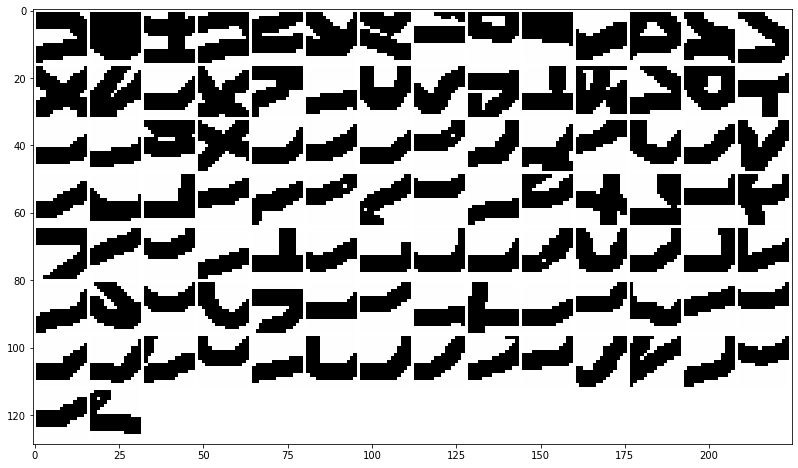

grid regions of 100 regions more=True or worst=False active for filter number: 65 :


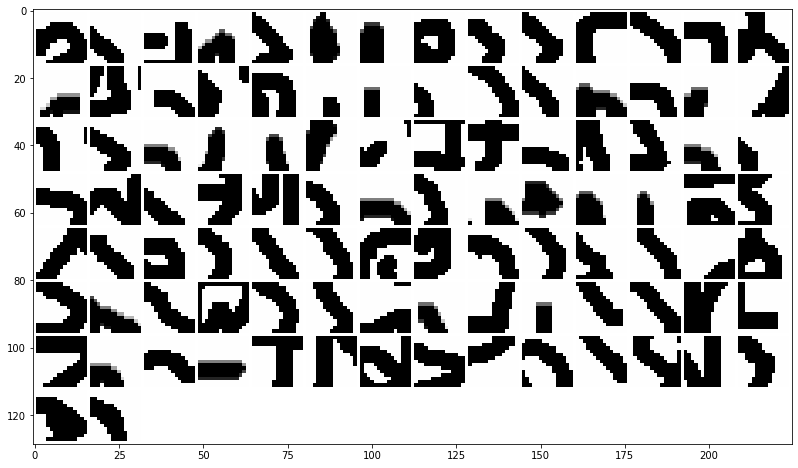

normalized regions:


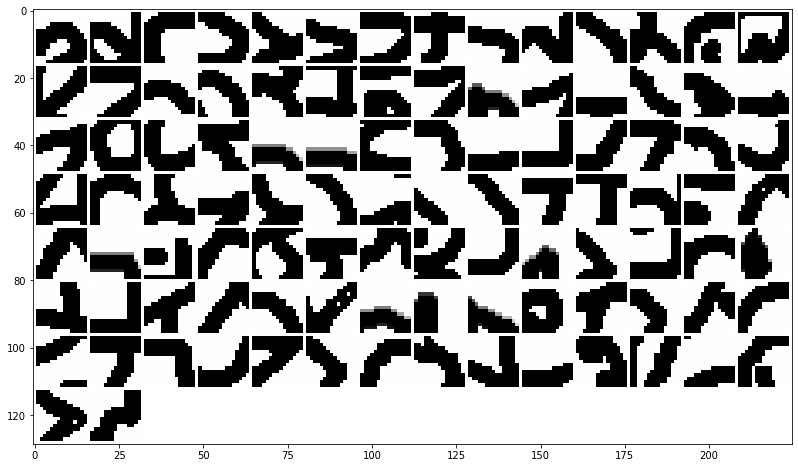

grid regions of 100 regions more=True or worst=False active for filter number: 70 :


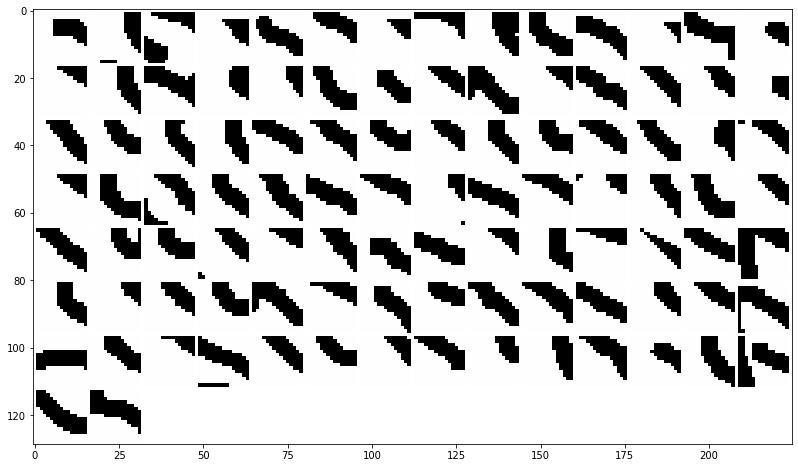

normalized regions:


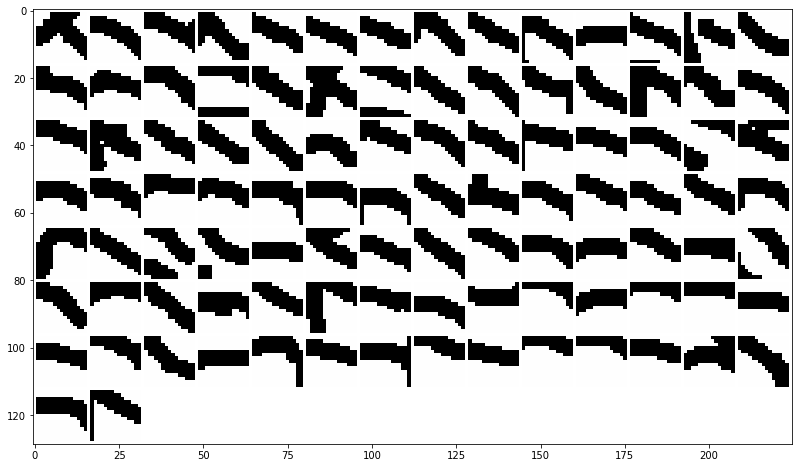

grid regions of 100 regions more=True or worst=False active for filter number: 80 :


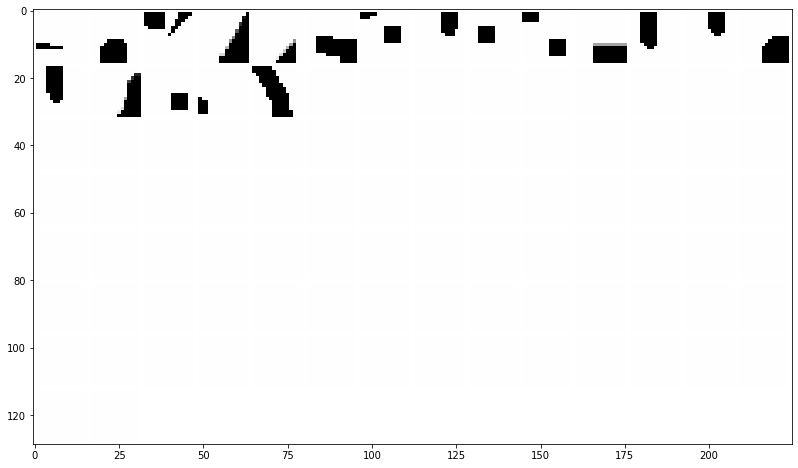

normalized regions:


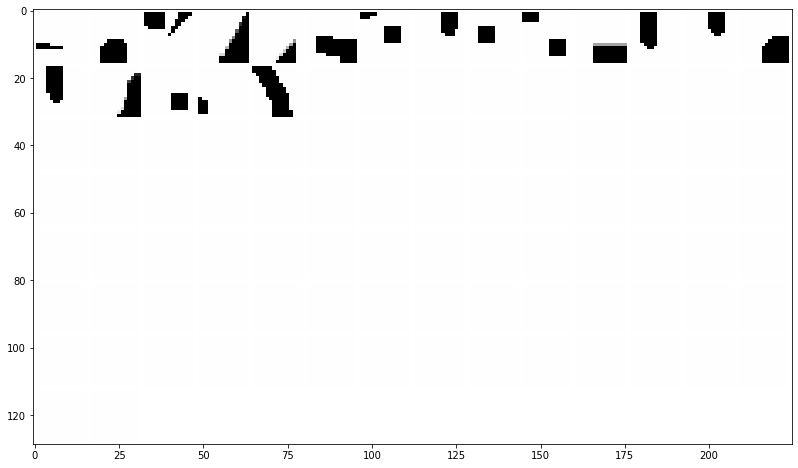

grid regions of 100 regions more=True or worst=False active for filter number: 85 :


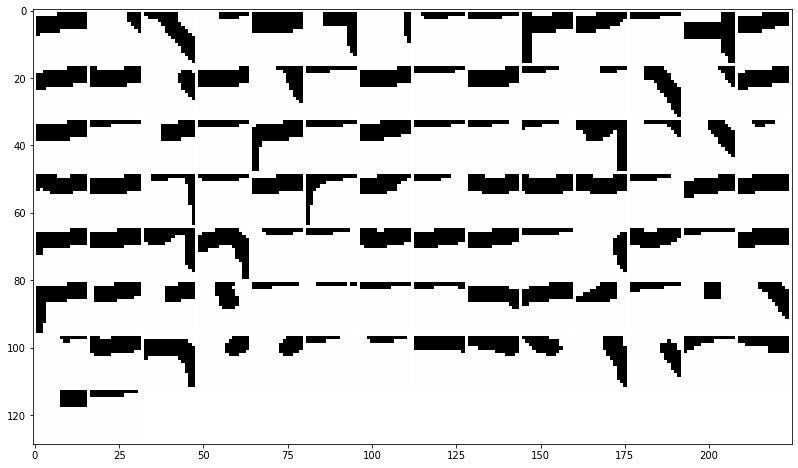

normalized regions:


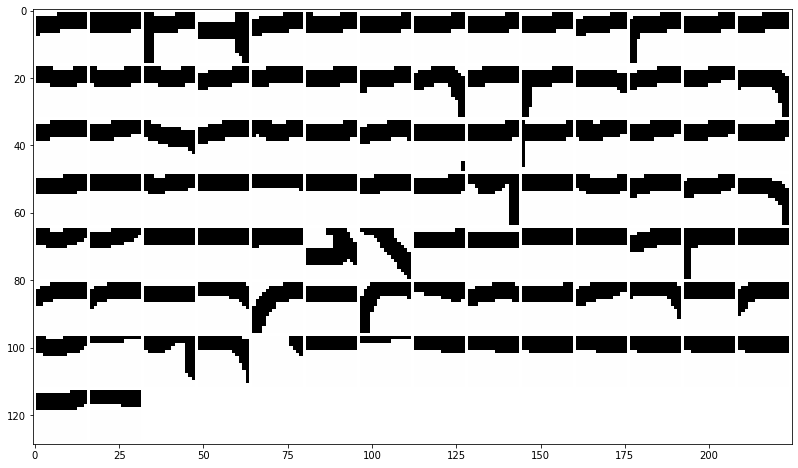

grid regions of 100 regions more=True or worst=False active for filter number: 90 :


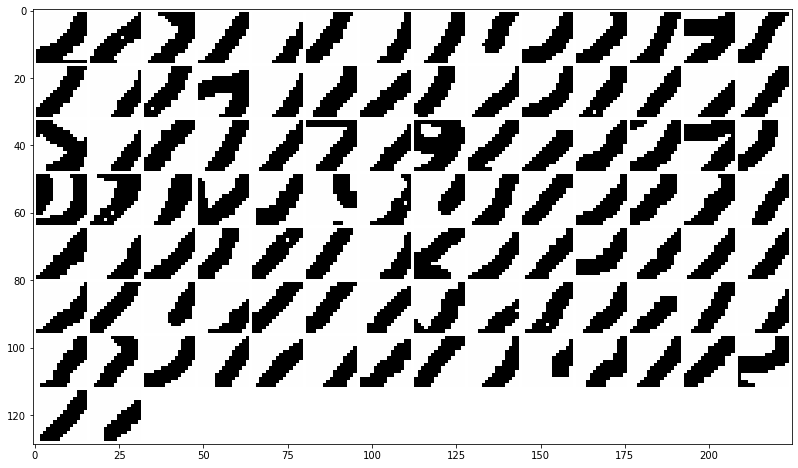

normalized regions:


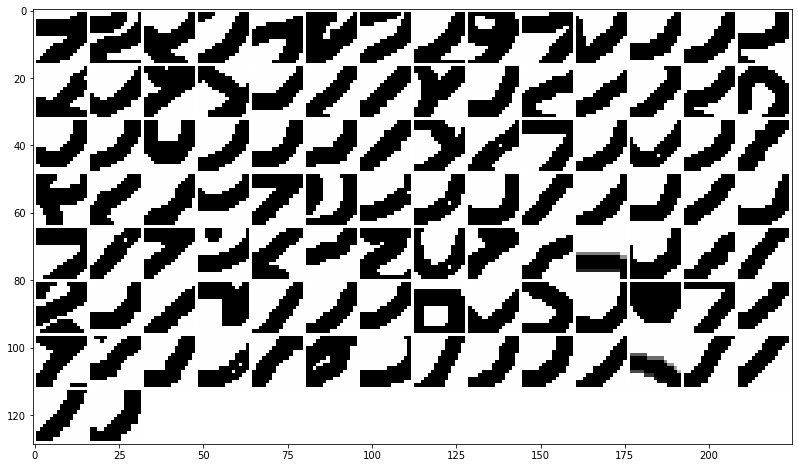

grid regions of 100 regions more=True or worst=False active for filter number: 95 :


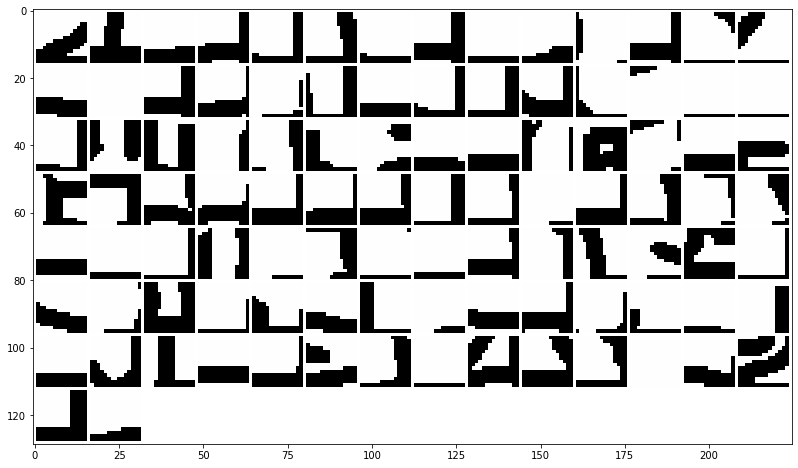

normalized regions:


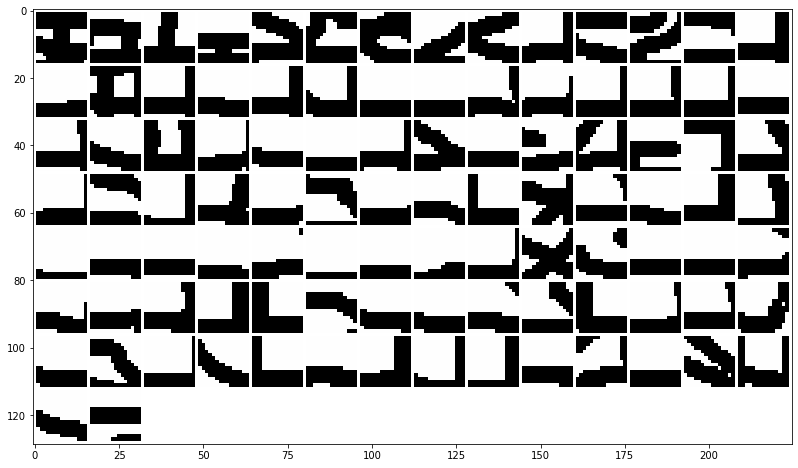

grid regions of 100 regions more=True or worst=False active for filter number: 100 :


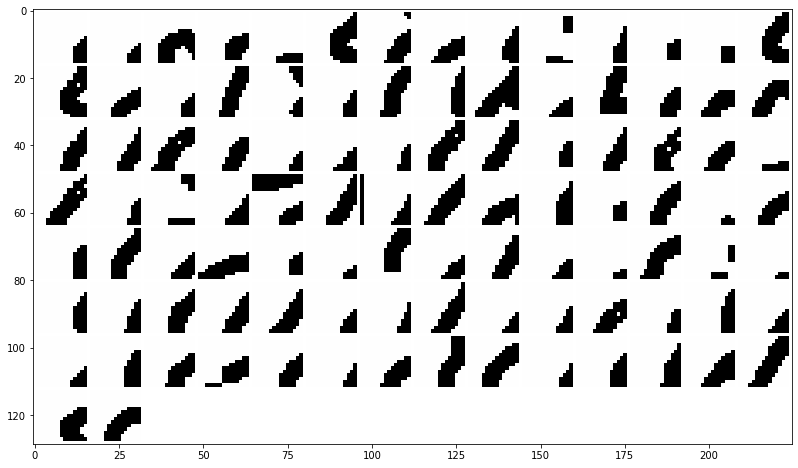

normalized regions:


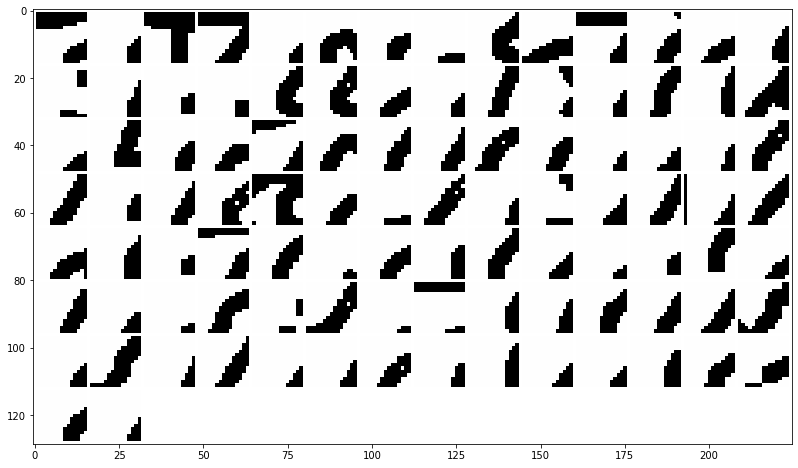

grid regions of 100 regions more=True or worst=False active for filter number: 105 :


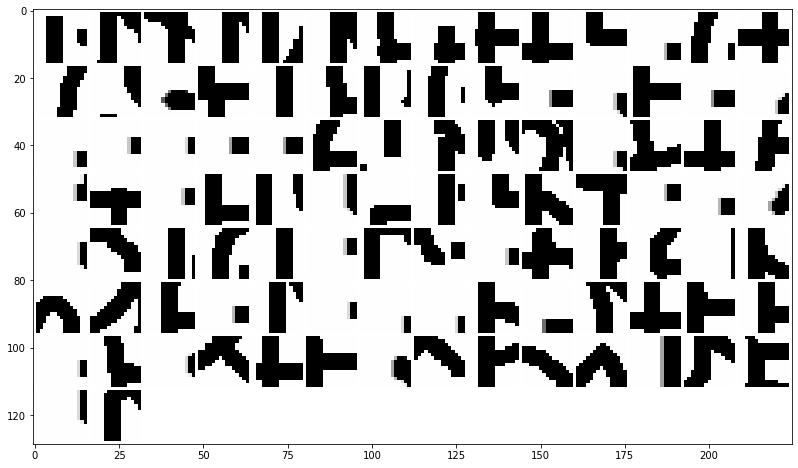

normalized regions:


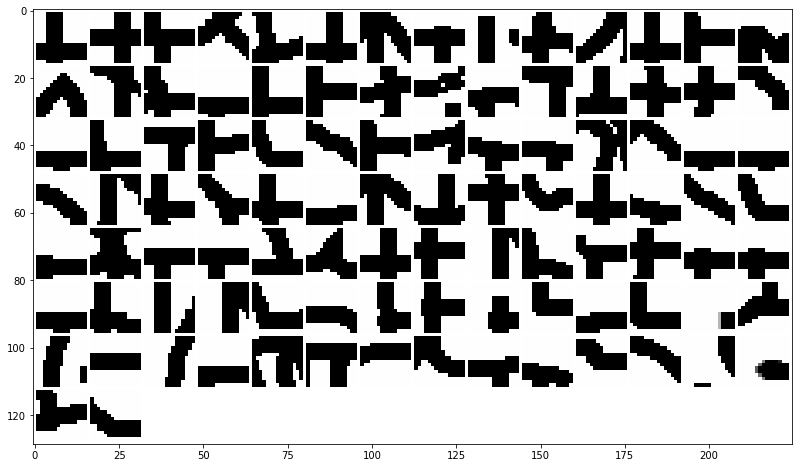

grid regions of 100 regions more=True or worst=False active for filter number: 110 :


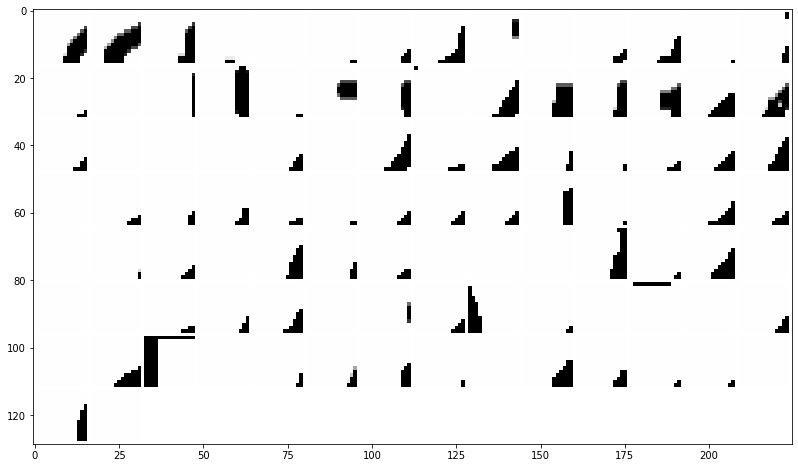

normalized regions:


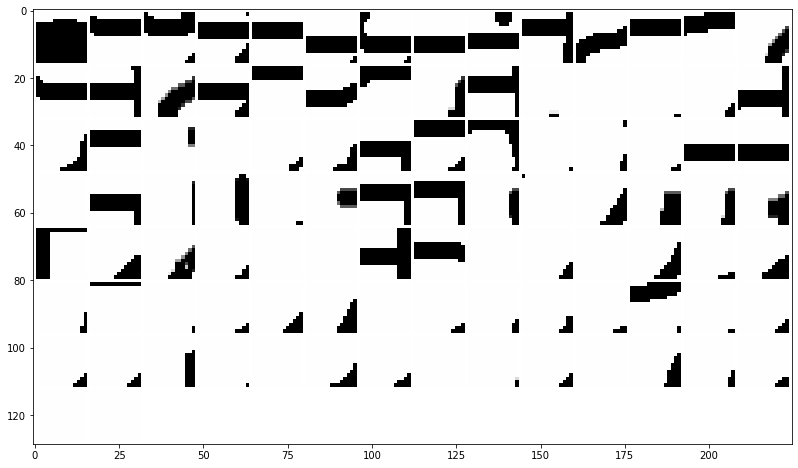

grid regions of 100 regions more=True or worst=False active for filter number: 115 :


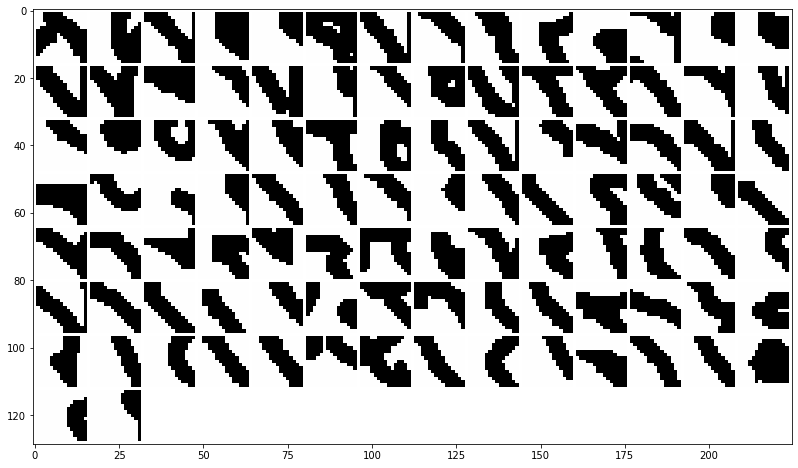

normalized regions:


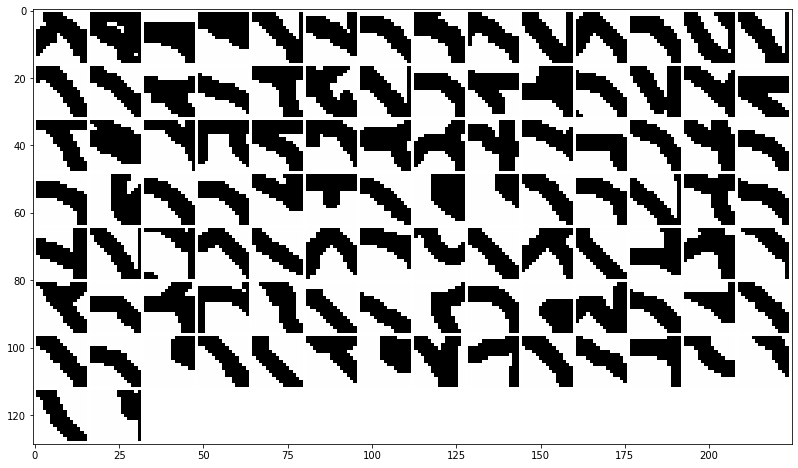

grid regions of 100 regions more=True or worst=False active for filter number: 120 :


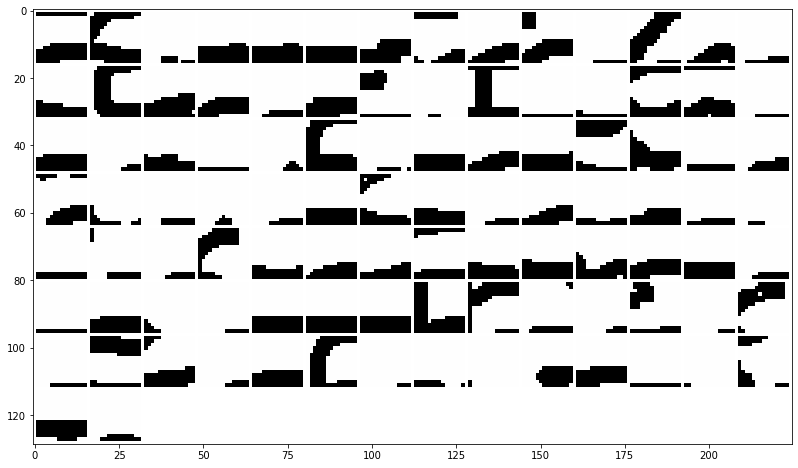

normalized regions:


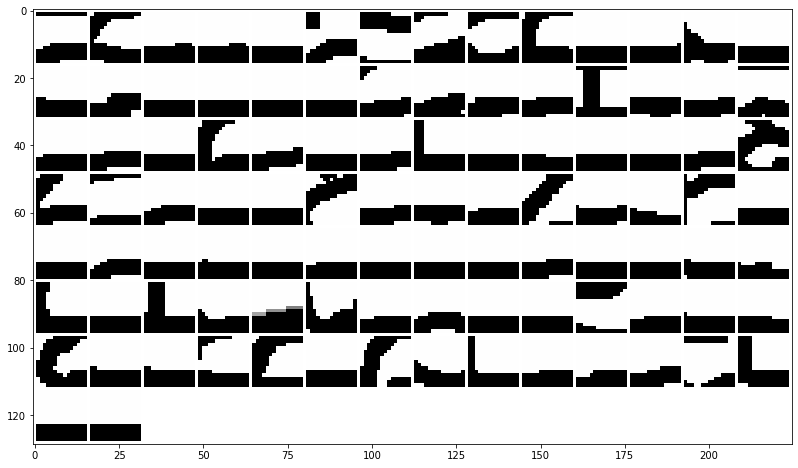

grid regions of 100 regions more=True or worst=False active for filter number: 125 :


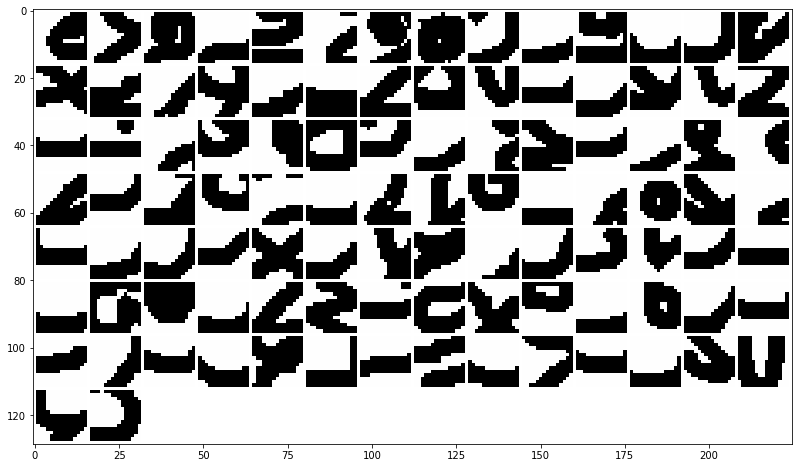

normalized regions:


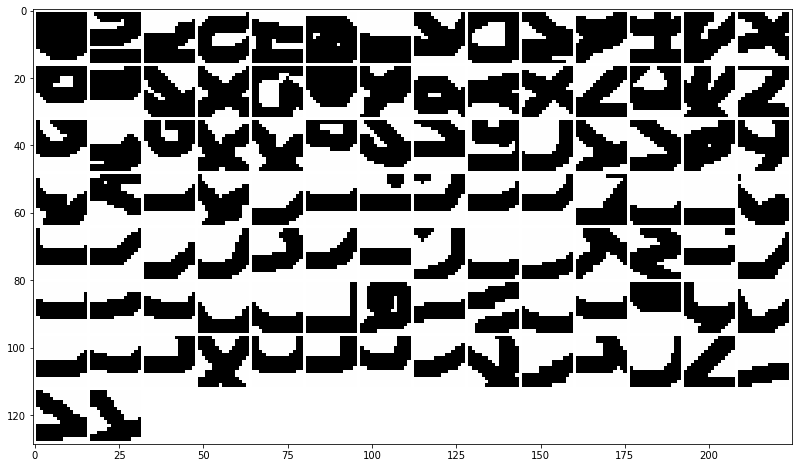

In [19]:
# regions and activation of interest
list_filter = list_filter_interest_layer3_mixt
regions = region_layer3_mixt_no_binary_maxpooling
activations = activation_layer3_mixt_no_binary_maxpooling
activations_normalized = activation_layer3_mixt_no_binary_normalized_maxpooling

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

In [20]:
# regions and activation of interest
list_filter = list_filter_interest_layer4_mixt
regions = region_layer4_mixt_no_binary_maxpooling
activations = activation_layer4_mixt_no_binary_maxpooling
activations_normalized = activation_layer4_mixt_no_binary_normalized_maxpooling

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

Output hidden; open in https://colab.research.google.com to view.

Interest of filters: [0, 5, 10, 15, 20, 25, 30]
Consider 10% image regions = 100 images
Consider 10% image regions = 100 images
mean image:
mean regions of 100 regions more=True or worst=False active for filter number: 0 :


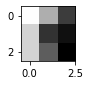

normalized region:


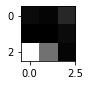

mean regions of 100 regions more=True or worst=False active for filter number: 5 :


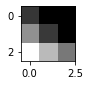

normalized region:


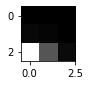

mean regions of 100 regions more=True or worst=False active for filter number: 10 :


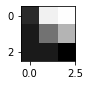

normalized region:


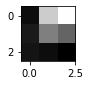

mean regions of 100 regions more=True or worst=False active for filter number: 15 :


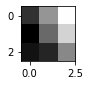

normalized region:


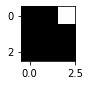

mean regions of 100 regions more=True or worst=False active for filter number: 20 :


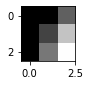

normalized region:


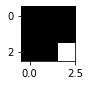

mean regions of 100 regions more=True or worst=False active for filter number: 25 :


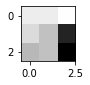

normalized region:


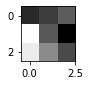

mean regions of 100 regions more=True or worst=False active for filter number: 30 :


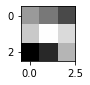

normalized region:


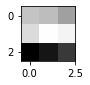

grid image
grid regions of 100 regions more=True or worst=False active for filter number: 0 :


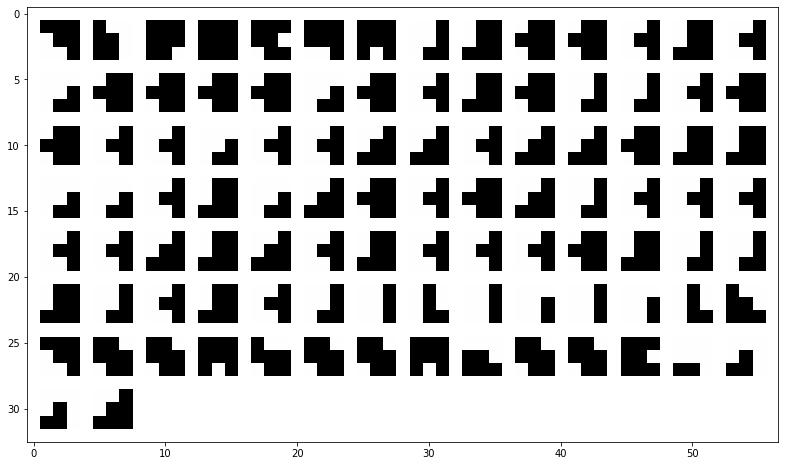

normalized regions:


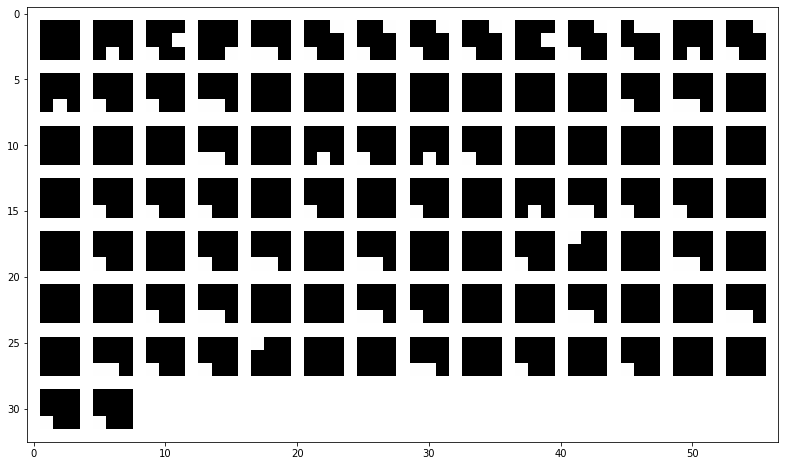

grid regions of 100 regions more=True or worst=False active for filter number: 5 :


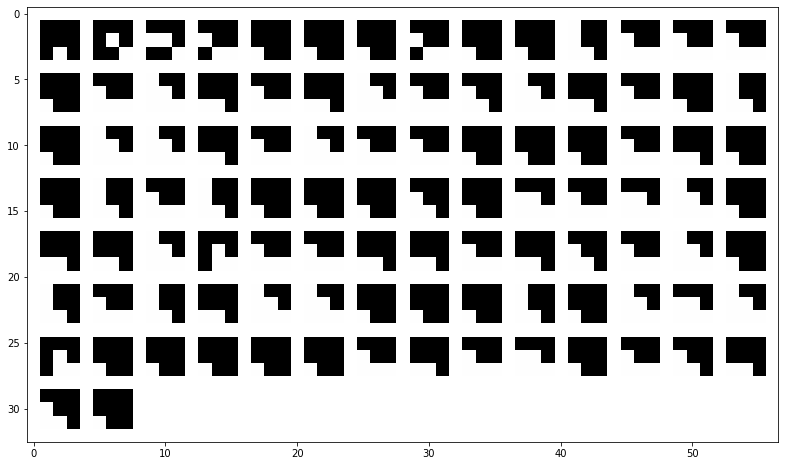

normalized regions:


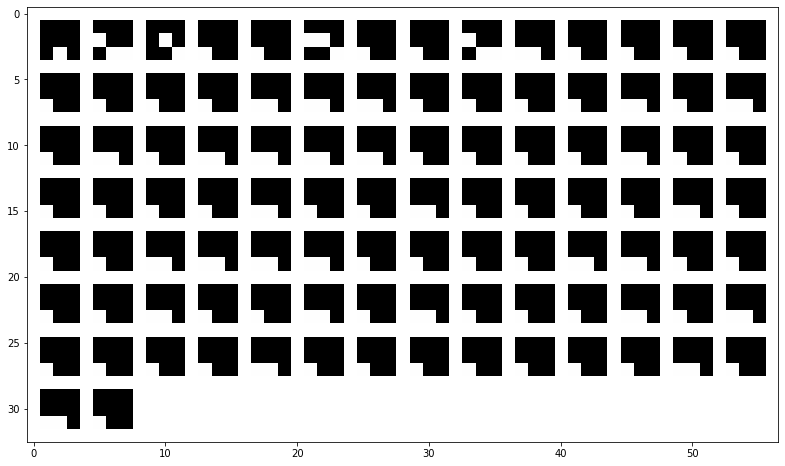

grid regions of 100 regions more=True or worst=False active for filter number: 10 :


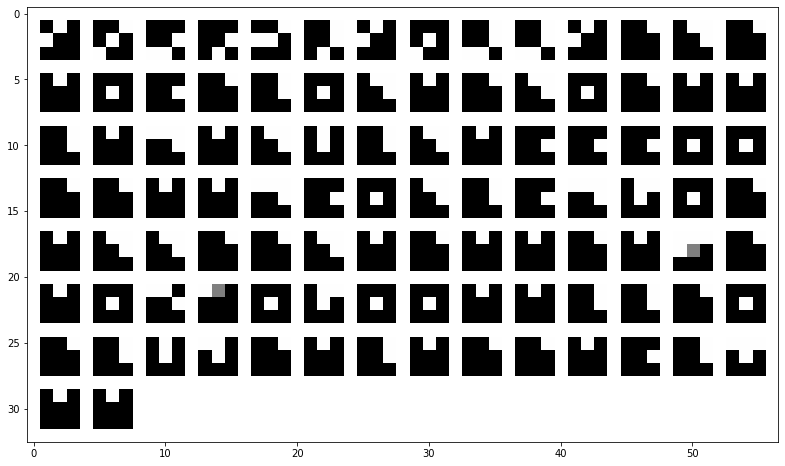

normalized regions:


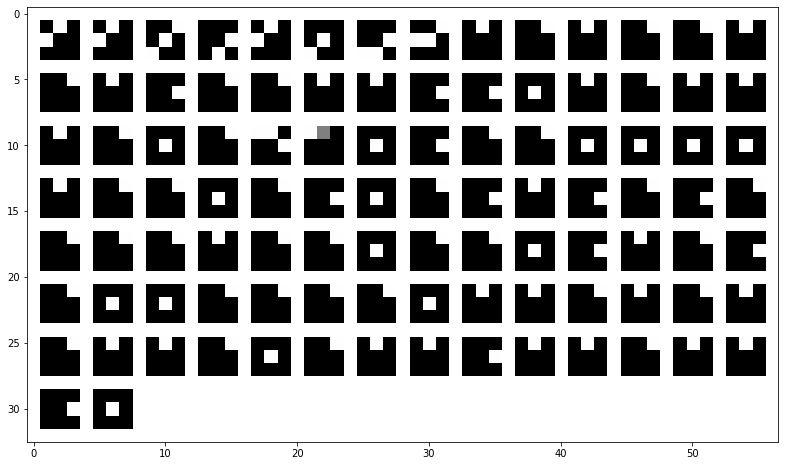

grid regions of 100 regions more=True or worst=False active for filter number: 15 :


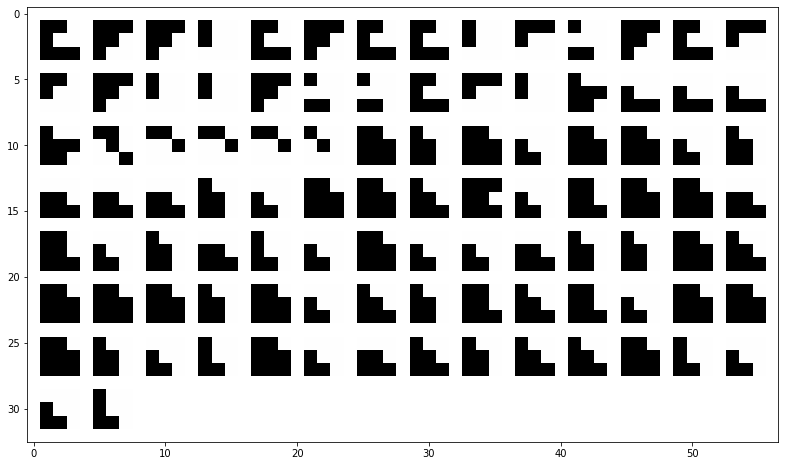

normalized regions:


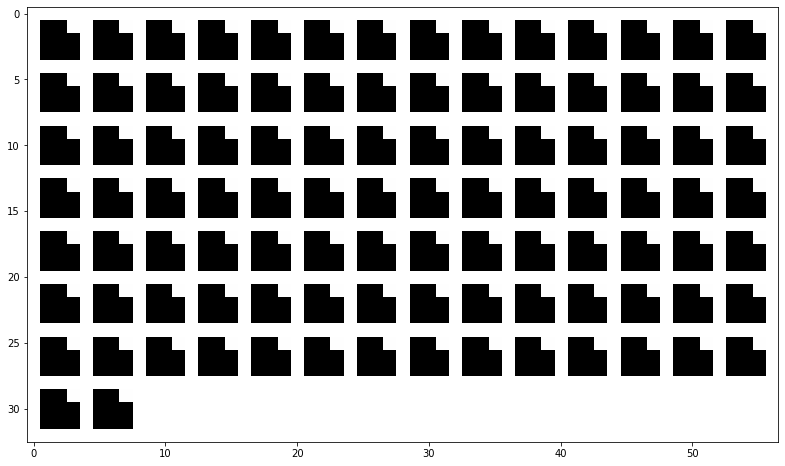

grid regions of 100 regions more=True or worst=False active for filter number: 20 :


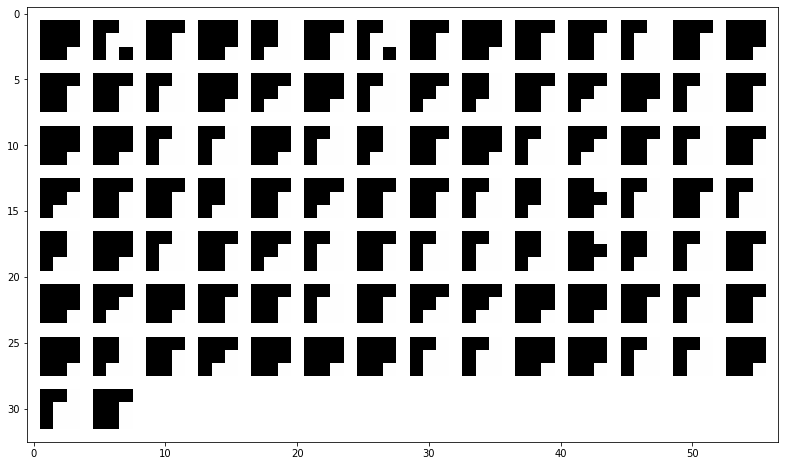

normalized regions:


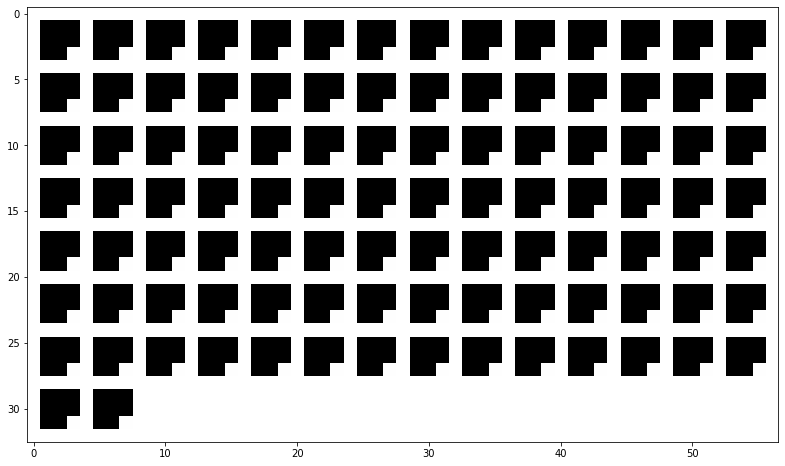

grid regions of 100 regions more=True or worst=False active for filter number: 25 :


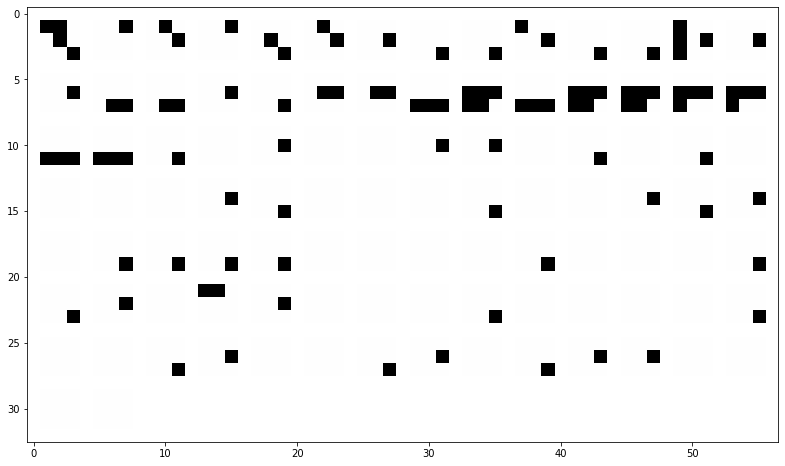

normalized regions:


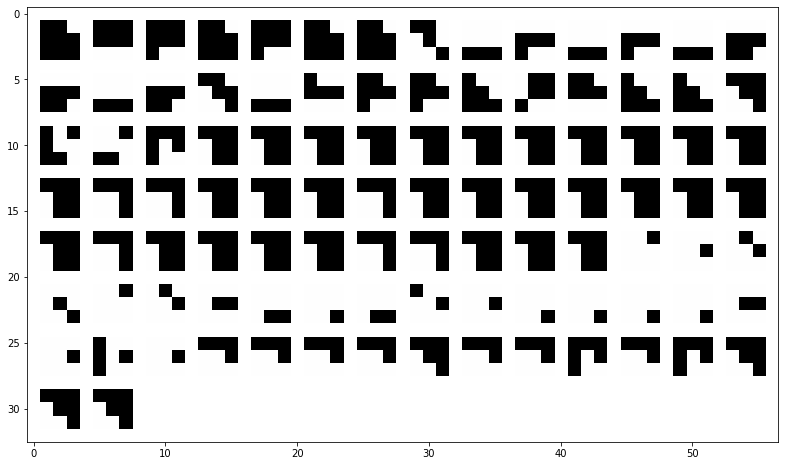

grid regions of 100 regions more=True or worst=False active for filter number: 30 :


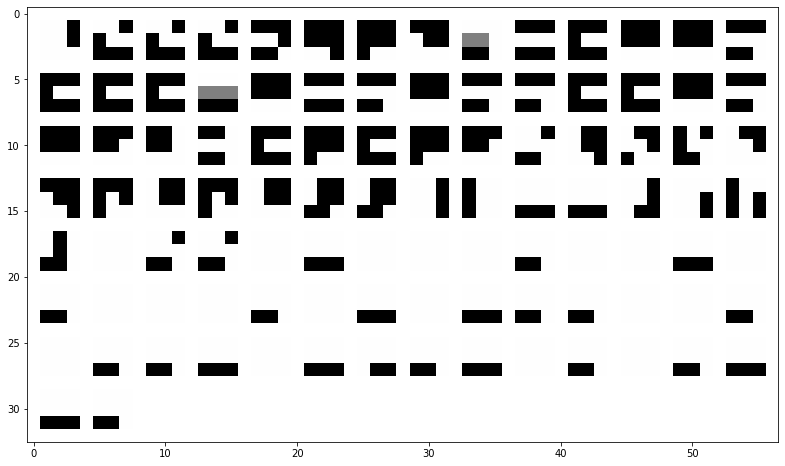

normalized regions:


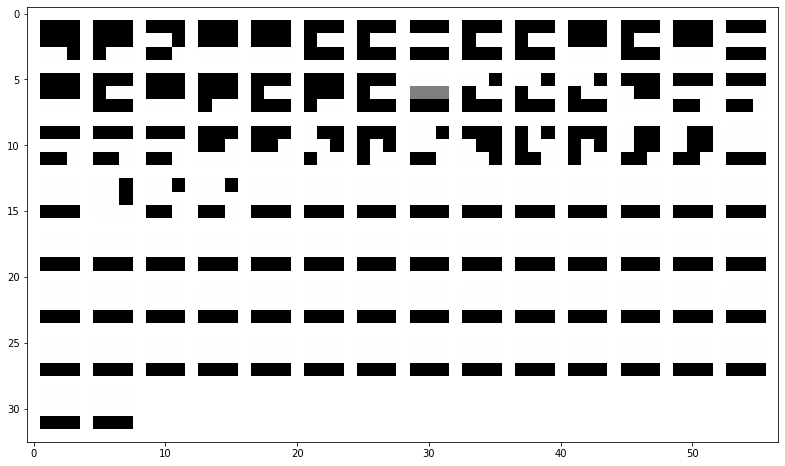

In [21]:
# regions and activation of interest
list_filter = list_filter_interest_layer1_mixt
regions = region_layer1_mixt_binary_maxpooling
activations = activation_layer1_mixt_binary_maxpooling
activations_normalized = activation_layer1_mixt_binary_normalized_maxpooling

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

Interest of filters: [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60]
Consider 10% image regions = 100 images
Consider 10% image regions = 100 images
mean image:
mean regions of 100 regions more=True or worst=False active for filter number: 0 :


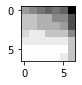

normalized region:


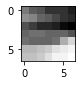

mean regions of 100 regions more=True or worst=False active for filter number: 5 :


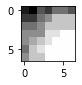

normalized region:


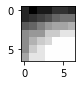

mean regions of 100 regions more=True or worst=False active for filter number: 10 :


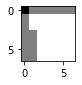

normalized region:


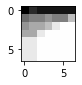

mean regions of 100 regions more=True or worst=False active for filter number: 15 :


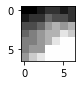

normalized region:


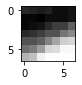

mean regions of 100 regions more=True or worst=False active for filter number: 20 :


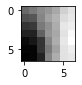

normalized region:


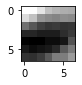

mean regions of 100 regions more=True or worst=False active for filter number: 25 :


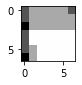

normalized region:


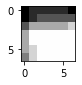

mean regions of 100 regions more=True or worst=False active for filter number: 30 :


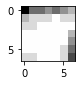

normalized region:


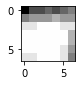

mean regions of 100 regions more=True or worst=False active for filter number: 35 :


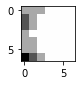

normalized region:


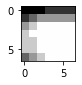

mean regions of 100 regions more=True or worst=False active for filter number: 40 :


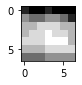

normalized region:


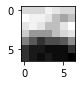

mean regions of 100 regions more=True or worst=False active for filter number: 45 :


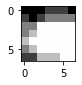

normalized region:


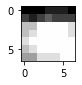

mean regions of 100 regions more=True or worst=False active for filter number: 50 :


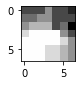

normalized region:


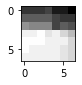

mean regions of 100 regions more=True or worst=False active for filter number: 55 :


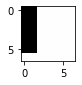

normalized region:


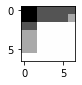

mean regions of 100 regions more=True or worst=False active for filter number: 60 :


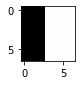

normalized region:


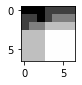

grid image
grid regions of 100 regions more=True or worst=False active for filter number: 0 :


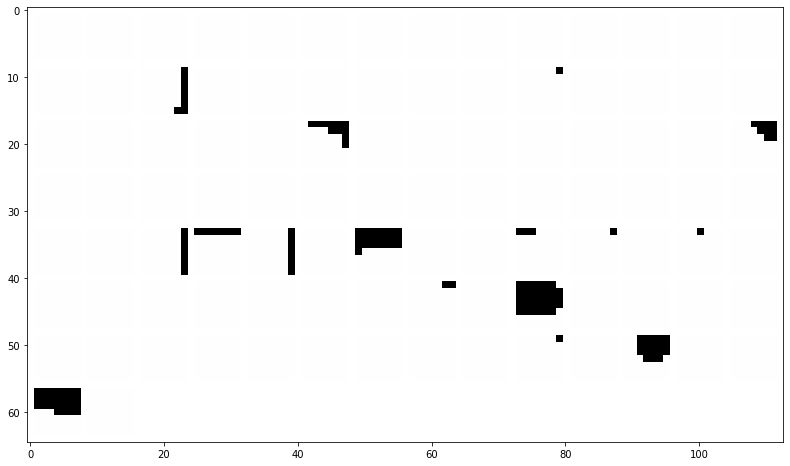

normalized regions:


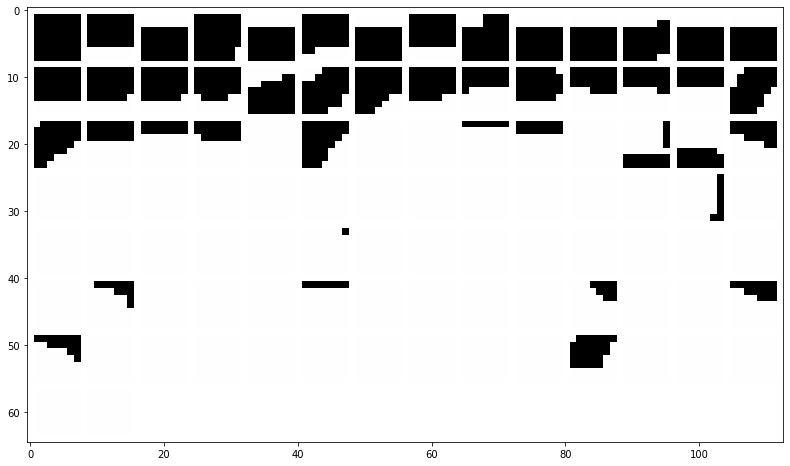

grid regions of 100 regions more=True or worst=False active for filter number: 5 :


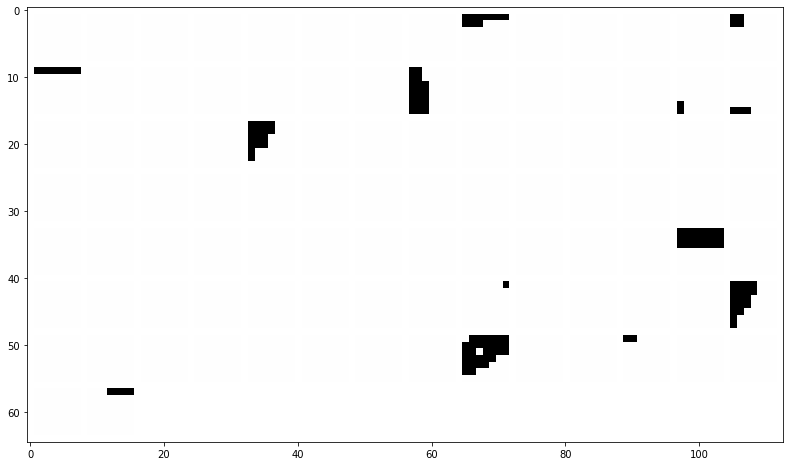

normalized regions:


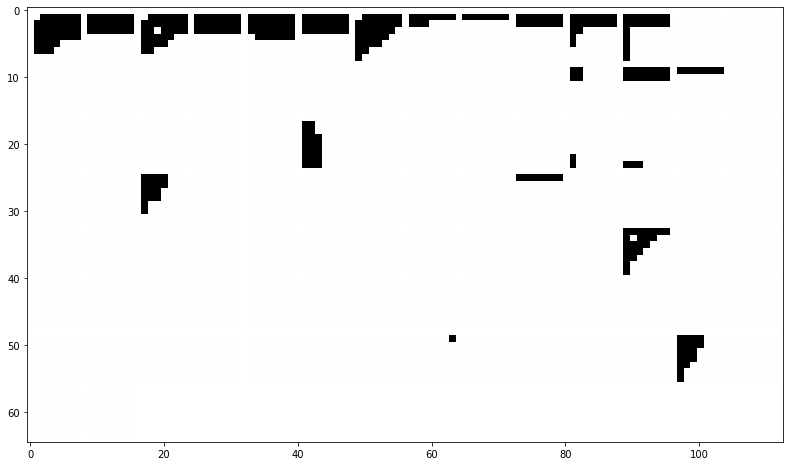

grid regions of 100 regions more=True or worst=False active for filter number: 10 :


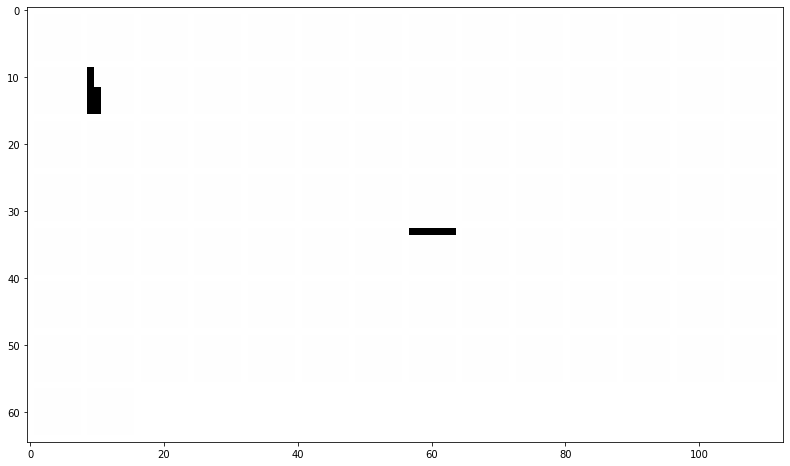

normalized regions:


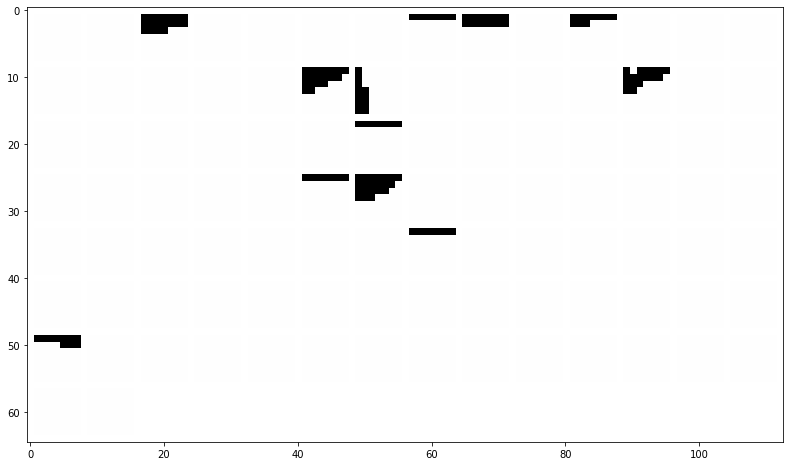

grid regions of 100 regions more=True or worst=False active for filter number: 15 :


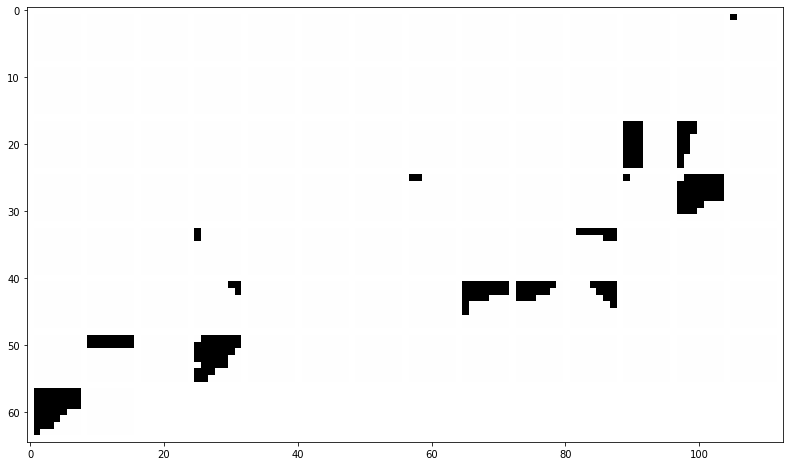

normalized regions:


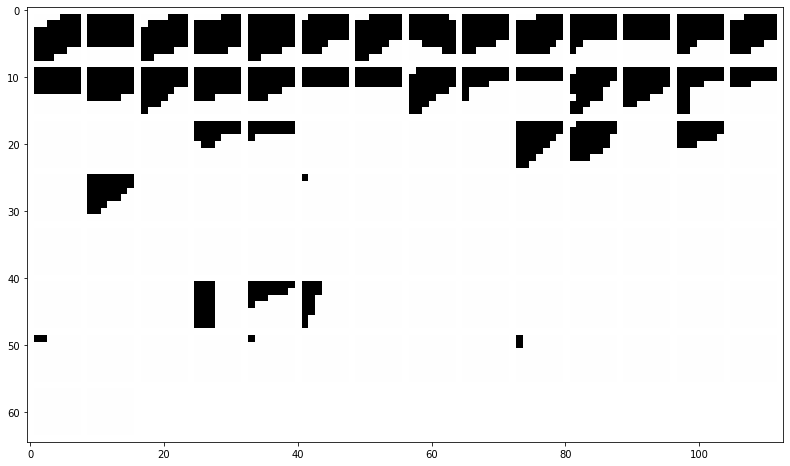

grid regions of 100 regions more=True or worst=False active for filter number: 20 :


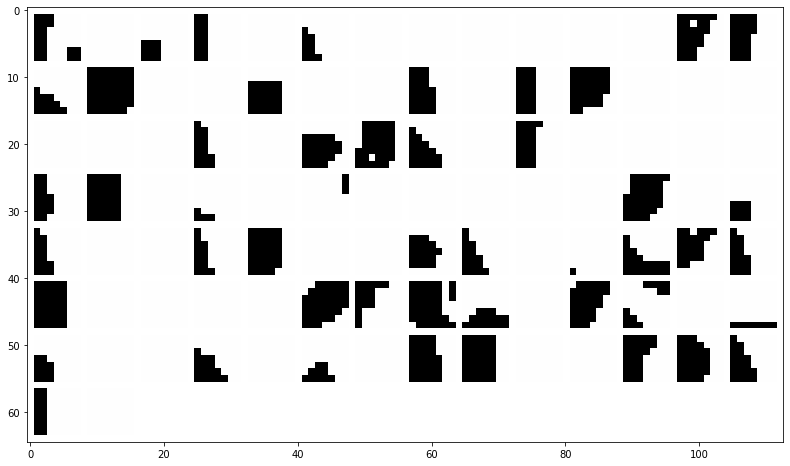

normalized regions:


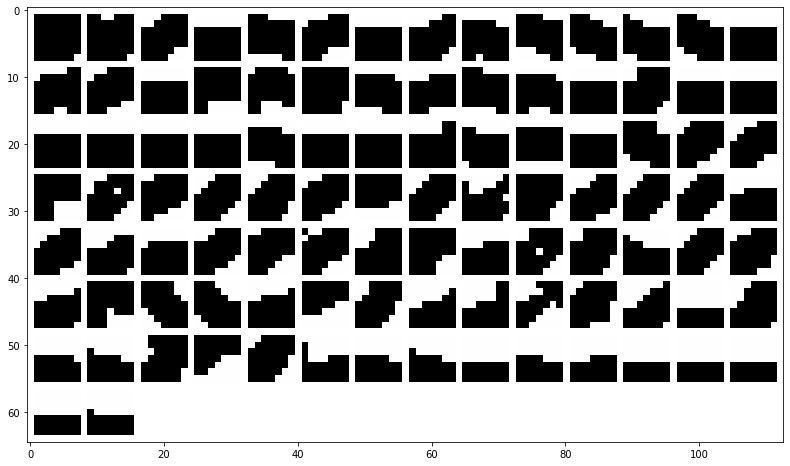

grid regions of 100 regions more=True or worst=False active for filter number: 25 :


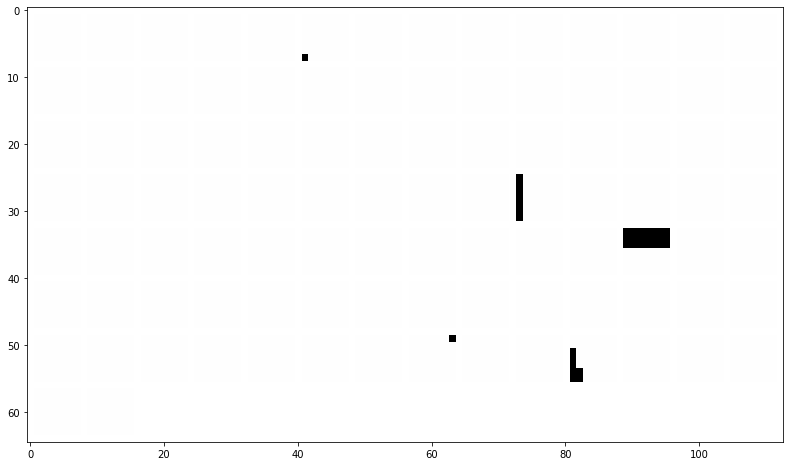

normalized regions:


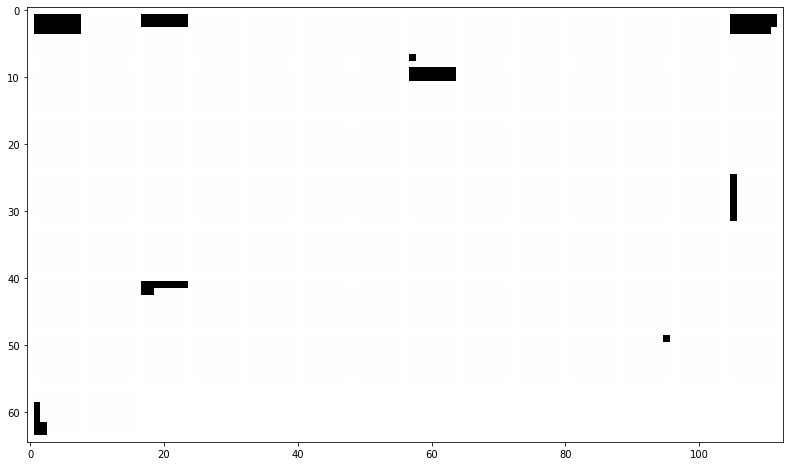

grid regions of 100 regions more=True or worst=False active for filter number: 30 :


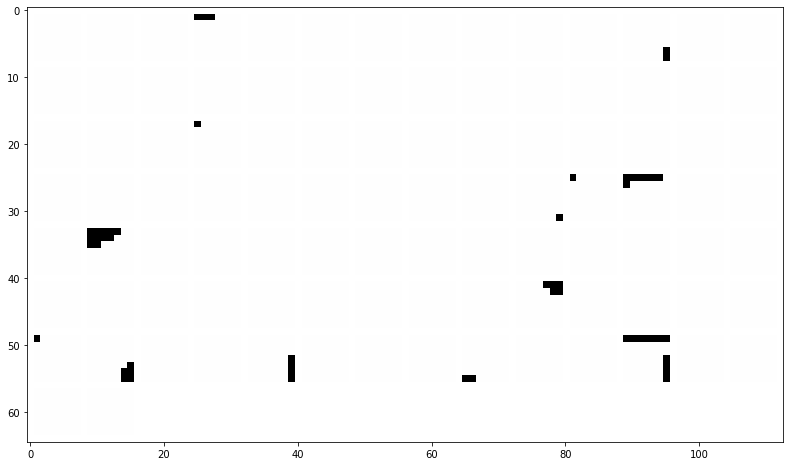

normalized regions:


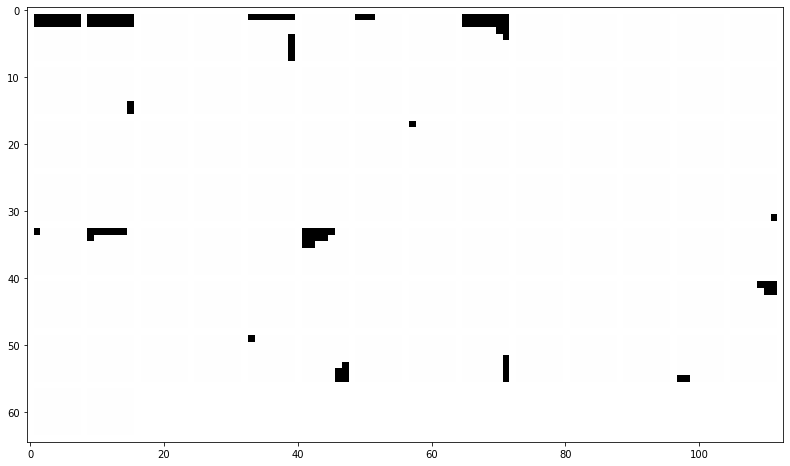

grid regions of 100 regions more=True or worst=False active for filter number: 35 :


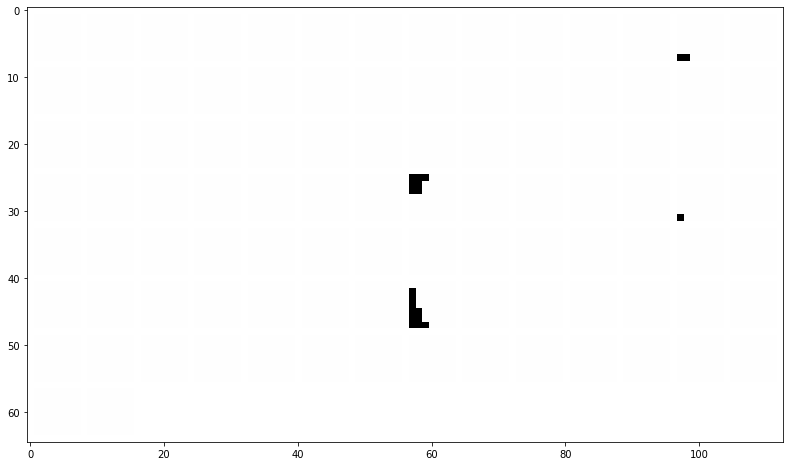

normalized regions:


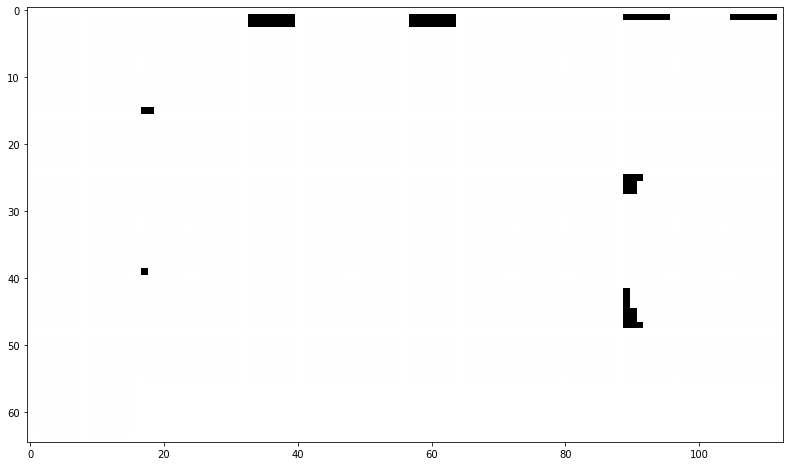

grid regions of 100 regions more=True or worst=False active for filter number: 40 :


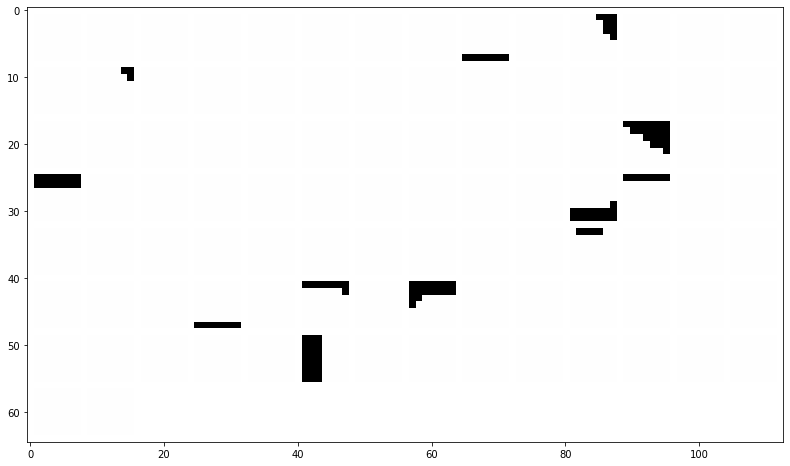

normalized regions:


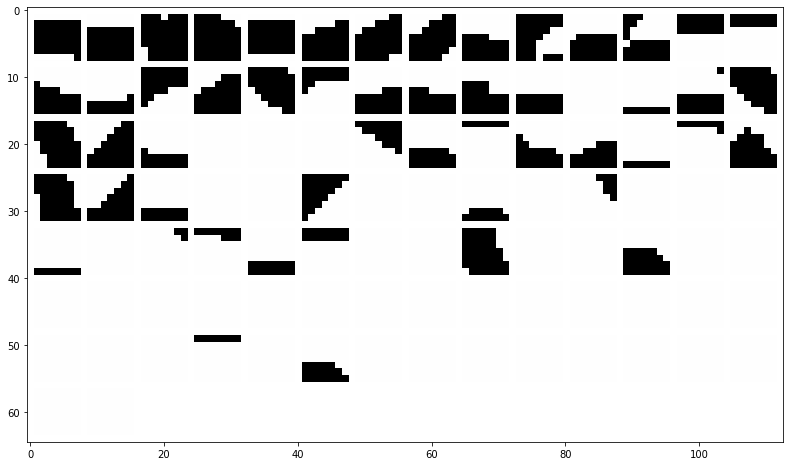

grid regions of 100 regions more=True or worst=False active for filter number: 45 :


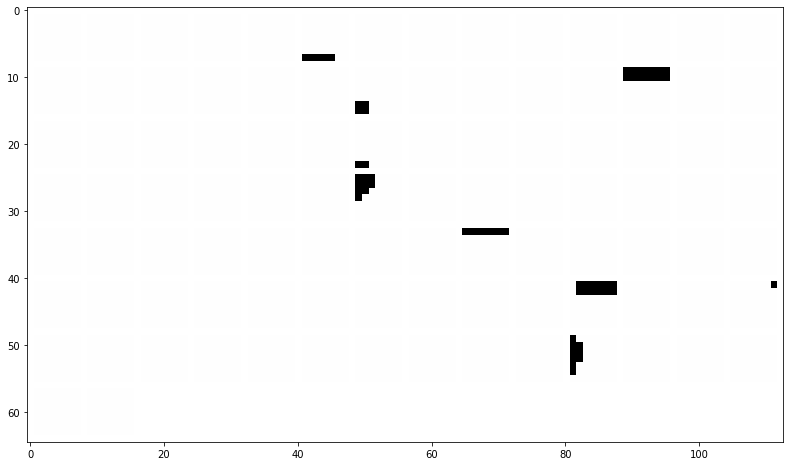

normalized regions:


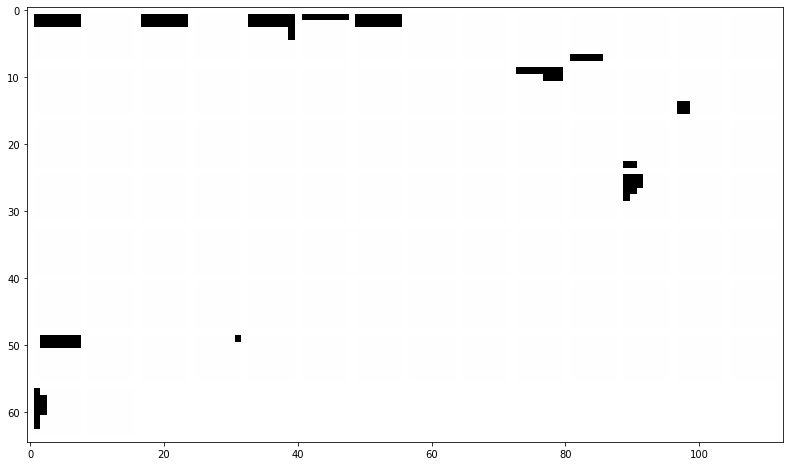

grid regions of 100 regions more=True or worst=False active for filter number: 50 :


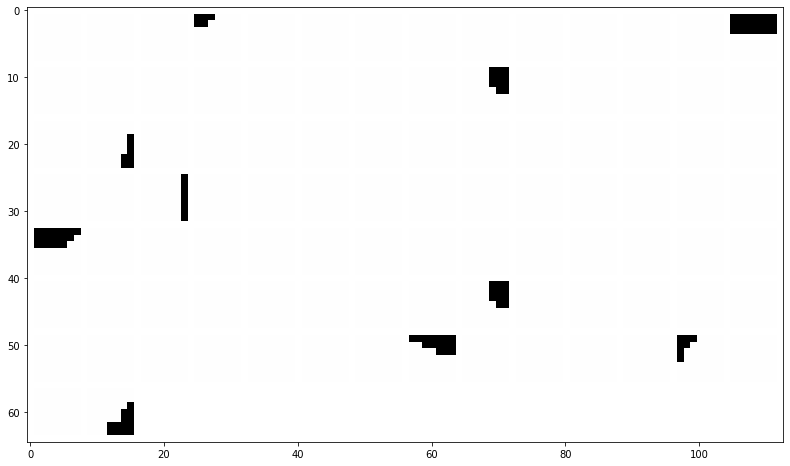

normalized regions:


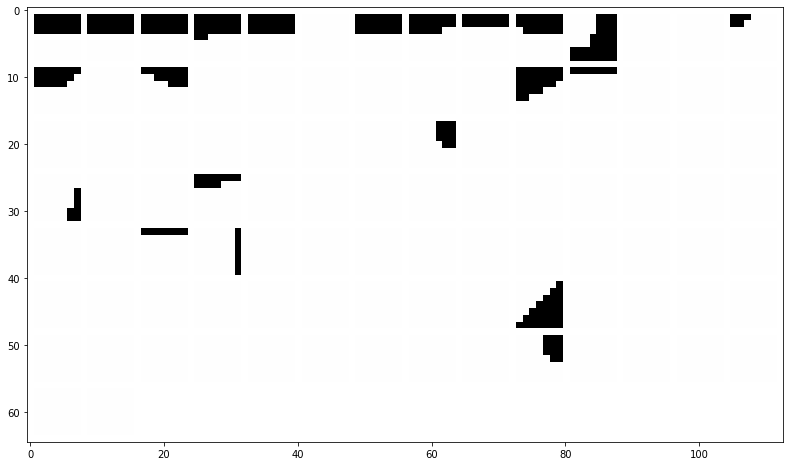

grid regions of 100 regions more=True or worst=False active for filter number: 55 :


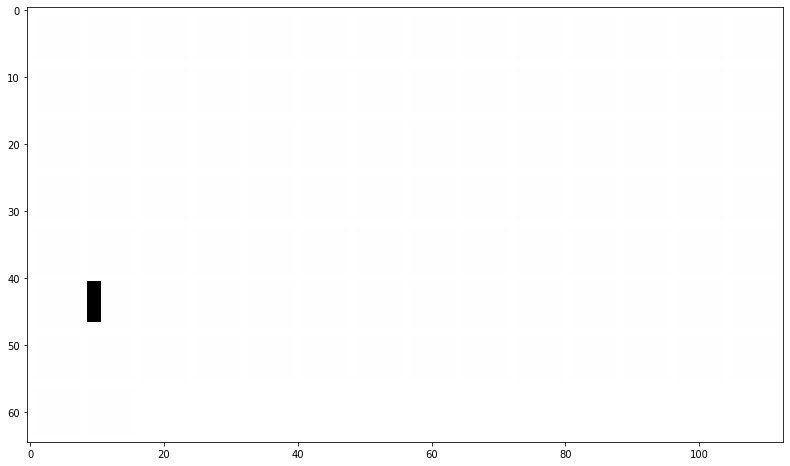

normalized regions:


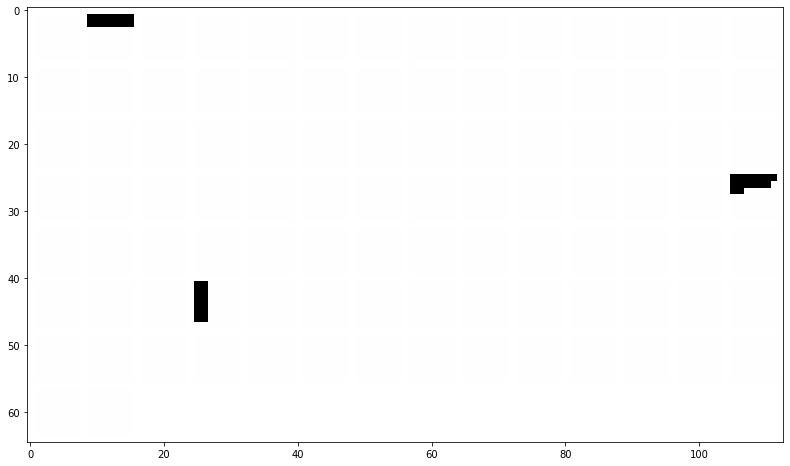

grid regions of 100 regions more=True or worst=False active for filter number: 60 :


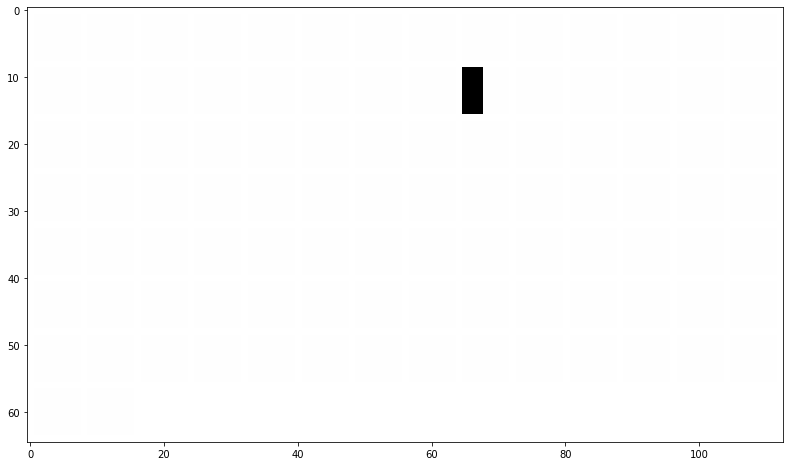

normalized regions:


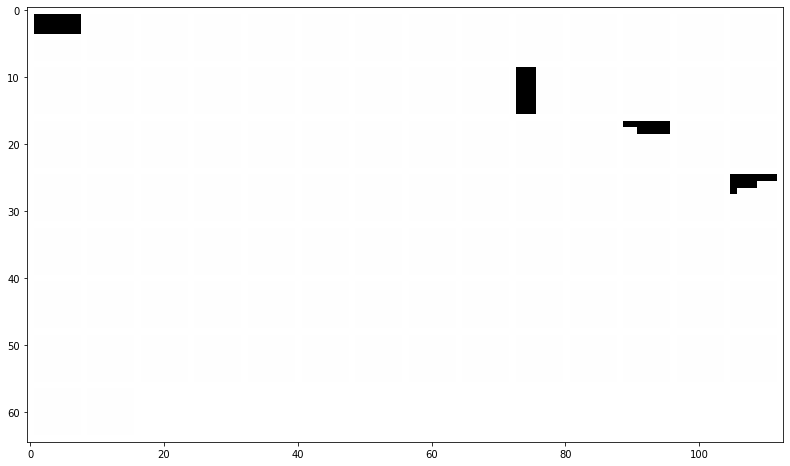

In [22]:
# regions and activation of interest
list_filter = list_filter_interest_layer2_mixt
regions = region_layer2_mixt_binary_maxpooling
activations = activation_layer2_mixt_binary_maxpooling
activations_normalized = activation_layer2_mixt_binary_normalized_maxpooling

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

Interest of filters: [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 80, 85, 90, 95, 100, 105, 110, 115, 120, 125]
Consider 10% image regions = 100 images
Consider 10% image regions = 100 images
mean image:
mean regions of 100 regions more=True or worst=False active for filter number: 0 :


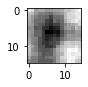

normalized region:


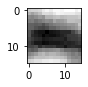

mean regions of 100 regions more=True or worst=False active for filter number: 5 :


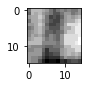

normalized region:


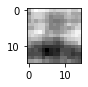

mean regions of 100 regions more=True or worst=False active for filter number: 10 :


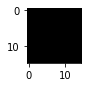

normalized region:


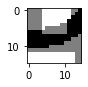

mean regions of 100 regions more=True or worst=False active for filter number: 15 :


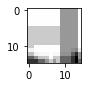

normalized region:


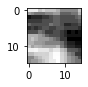

mean regions of 100 regions more=True or worst=False active for filter number: 20 :


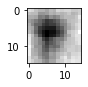

normalized region:


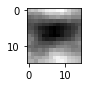

mean regions of 100 regions more=True or worst=False active for filter number: 25 :


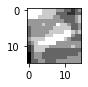

normalized region:


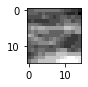

mean regions of 100 regions more=True or worst=False active for filter number: 30 :


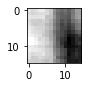

normalized region:


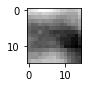

mean regions of 100 regions more=True or worst=False active for filter number: 35 :


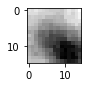

normalized region:


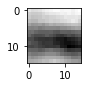

mean regions of 100 regions more=True or worst=False active for filter number: 40 :


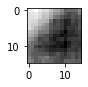

normalized region:


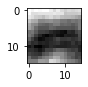

mean regions of 100 regions more=True or worst=False active for filter number: 45 :


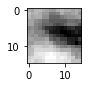

normalized region:


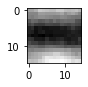

mean regions of 100 regions more=True or worst=False active for filter number: 50 :


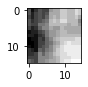

normalized region:


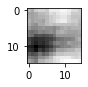

mean regions of 100 regions more=True or worst=False active for filter number: 55 :


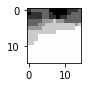

normalized region:


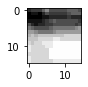

mean regions of 100 regions more=True or worst=False active for filter number: 60 :


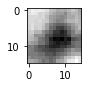

normalized region:


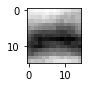

mean regions of 100 regions more=True or worst=False active for filter number: 65 :


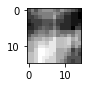

normalized region:


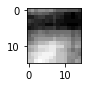

mean regions of 100 regions more=True or worst=False active for filter number: 70 :


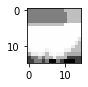

normalized region:


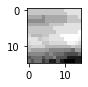

mean regions of 100 regions more=True or worst=False active for filter number: 80 :


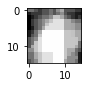

normalized region:


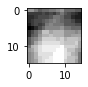

mean regions of 100 regions more=True or worst=False active for filter number: 85 :


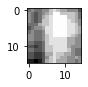

normalized region:


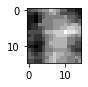

mean regions of 100 regions more=True or worst=False active for filter number: 90 :


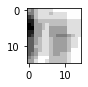

normalized region:


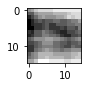

mean regions of 100 regions more=True or worst=False active for filter number: 95 :


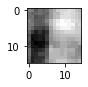

normalized region:


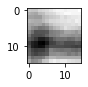

mean regions of 100 regions more=True or worst=False active for filter number: 100 :


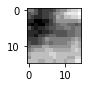

normalized region:


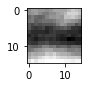

mean regions of 100 regions more=True or worst=False active for filter number: 105 :


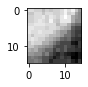

normalized region:


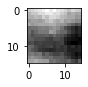

mean regions of 100 regions more=True or worst=False active for filter number: 110 :


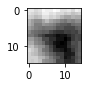

normalized region:


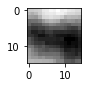

mean regions of 100 regions more=True or worst=False active for filter number: 115 :


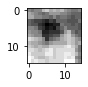

normalized region:


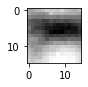

mean regions of 100 regions more=True or worst=False active for filter number: 120 :


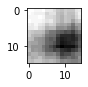

normalized region:


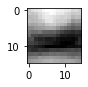

mean regions of 100 regions more=True or worst=False active for filter number: 125 :


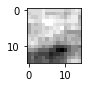

normalized region:


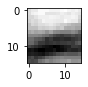

grid image
grid regions of 100 regions more=True or worst=False active for filter number: 0 :


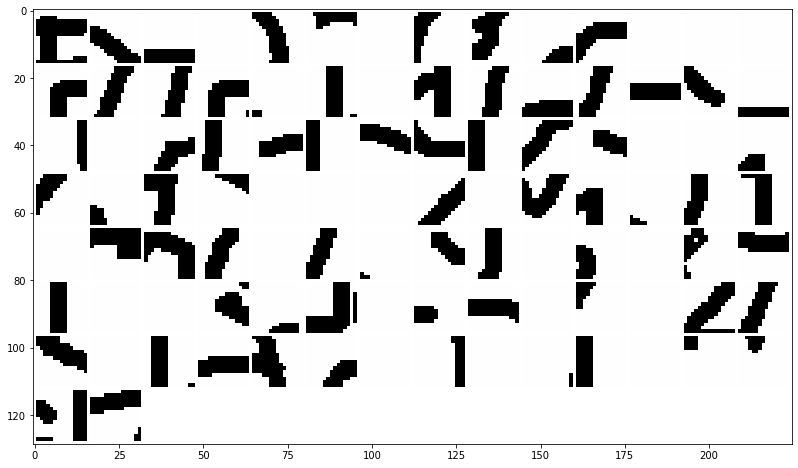

normalized regions:


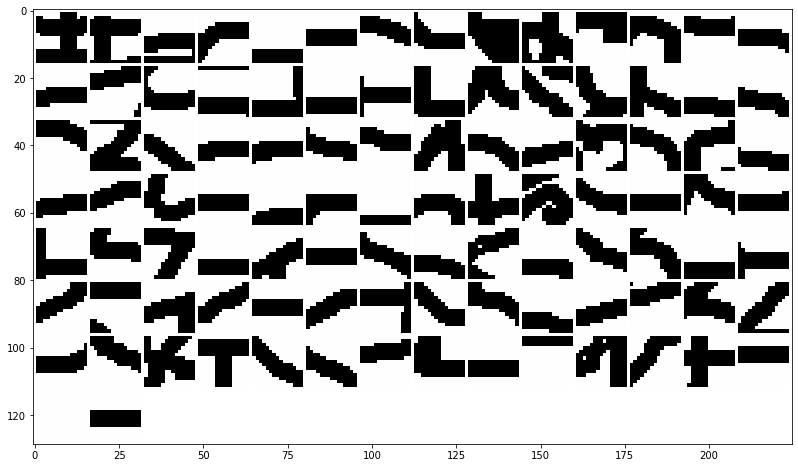

grid regions of 100 regions more=True or worst=False active for filter number: 5 :


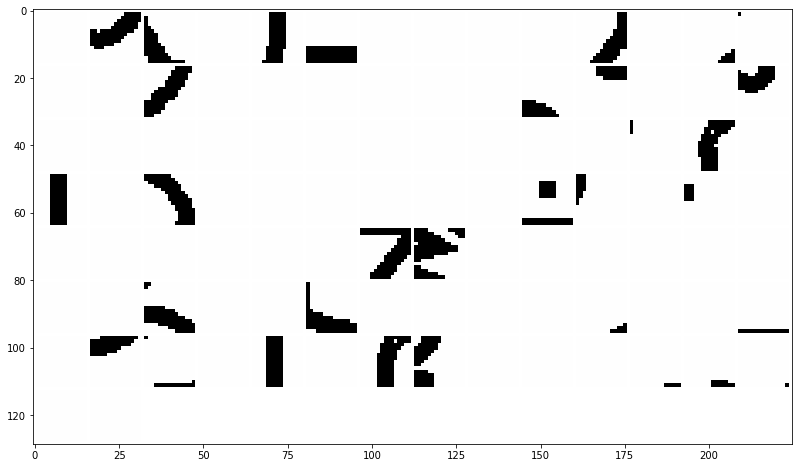

normalized regions:


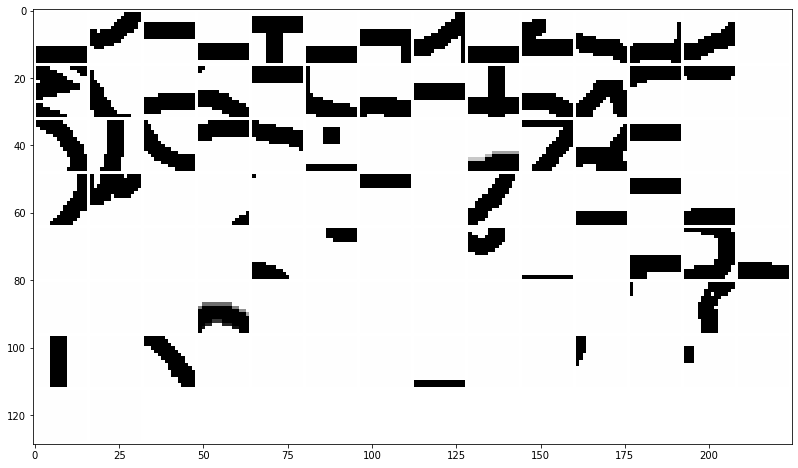

grid regions of 100 regions more=True or worst=False active for filter number: 10 :


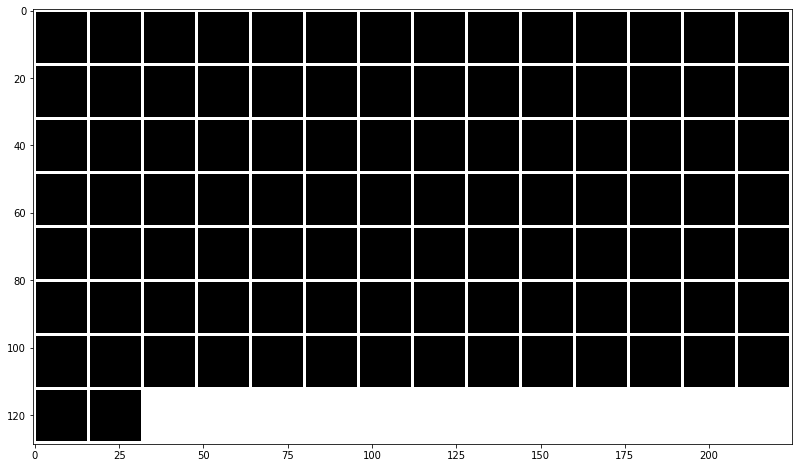

normalized regions:


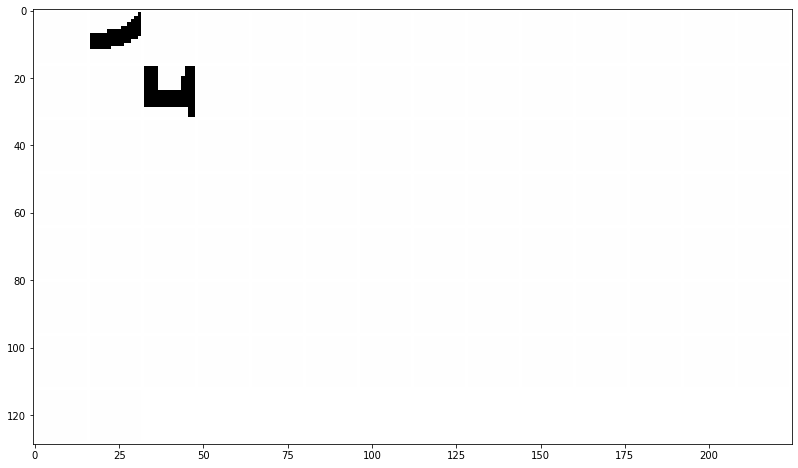

grid regions of 100 regions more=True or worst=False active for filter number: 15 :


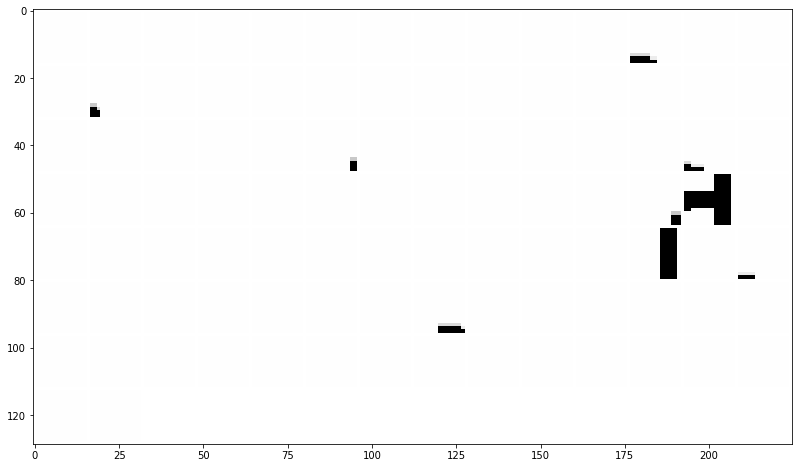

normalized regions:


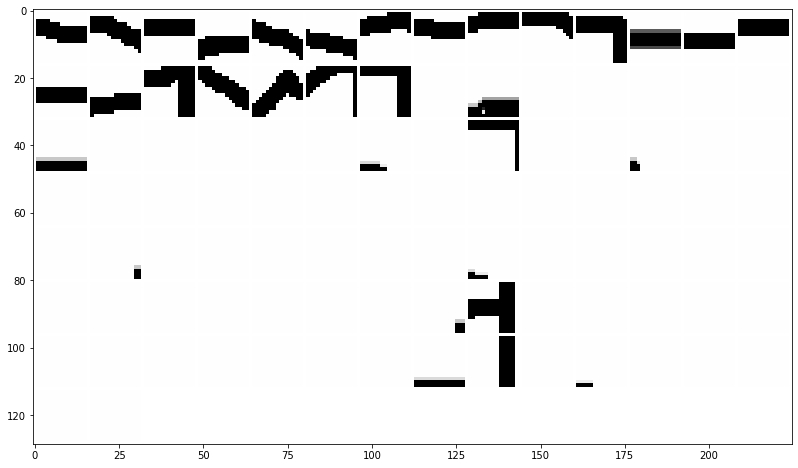

grid regions of 100 regions more=True or worst=False active for filter number: 20 :


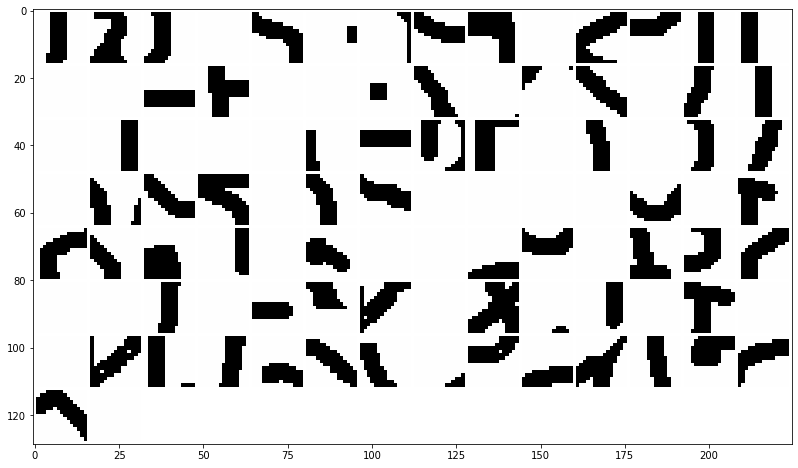

normalized regions:


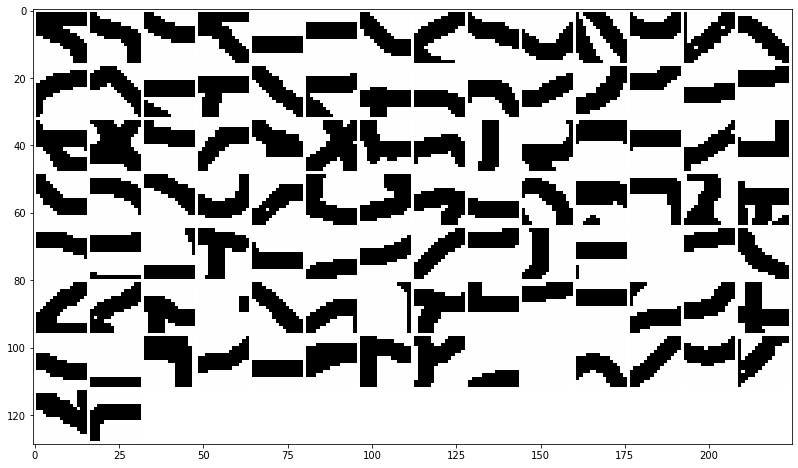

grid regions of 100 regions more=True or worst=False active for filter number: 25 :


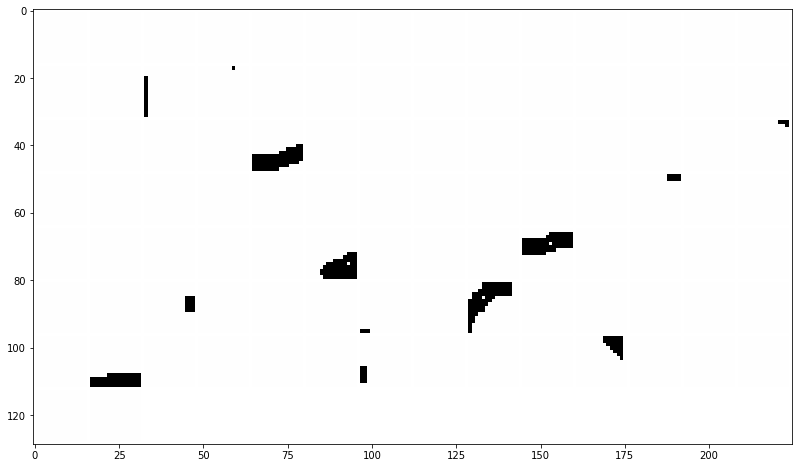

normalized regions:


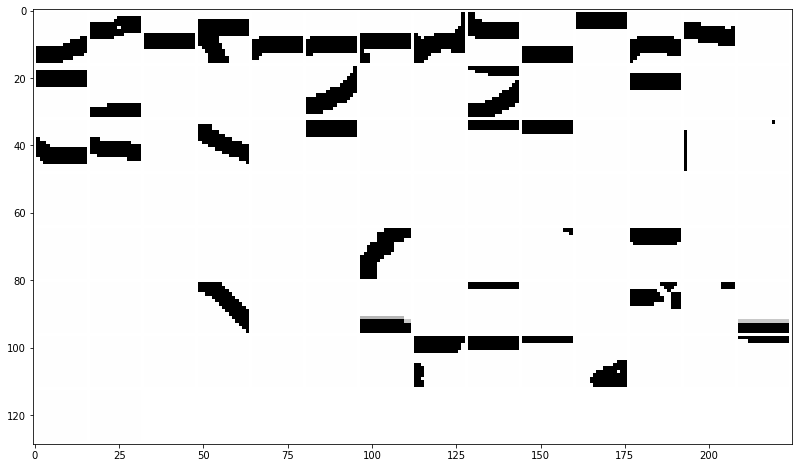

grid regions of 100 regions more=True or worst=False active for filter number: 30 :


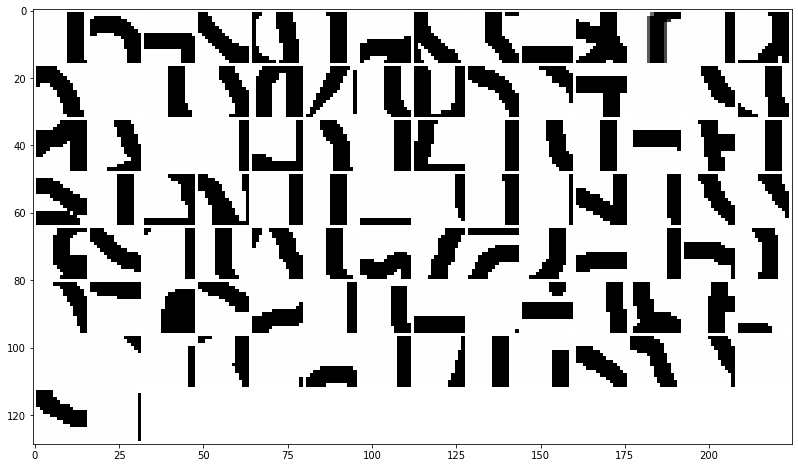

normalized regions:


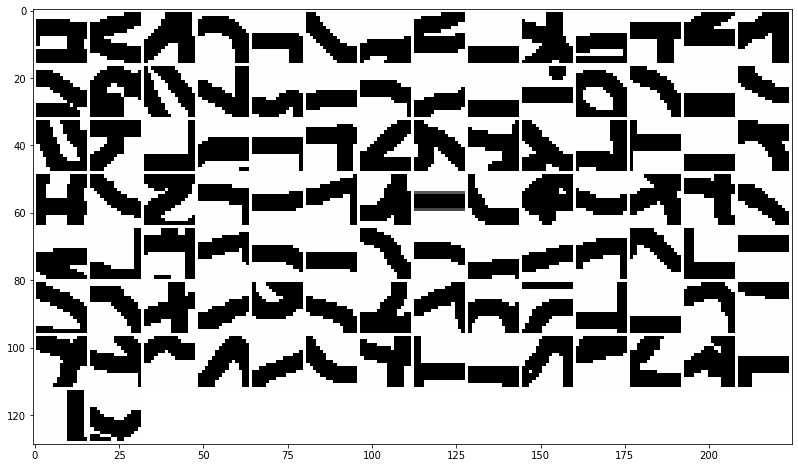

grid regions of 100 regions more=True or worst=False active for filter number: 35 :


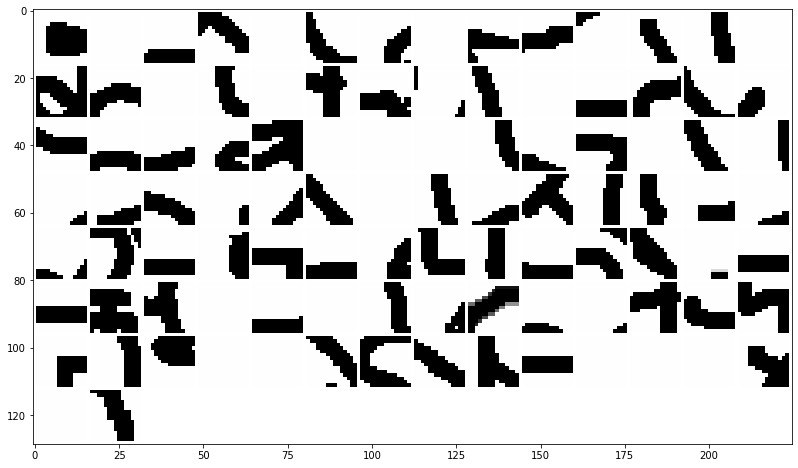

normalized regions:


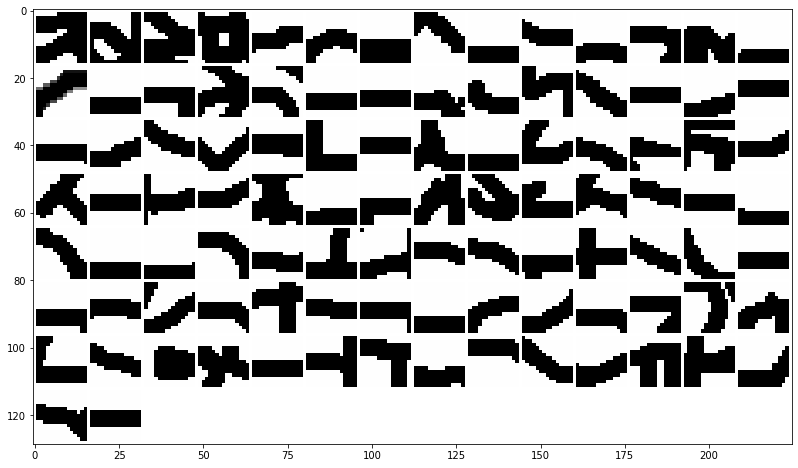

grid regions of 100 regions more=True or worst=False active for filter number: 40 :


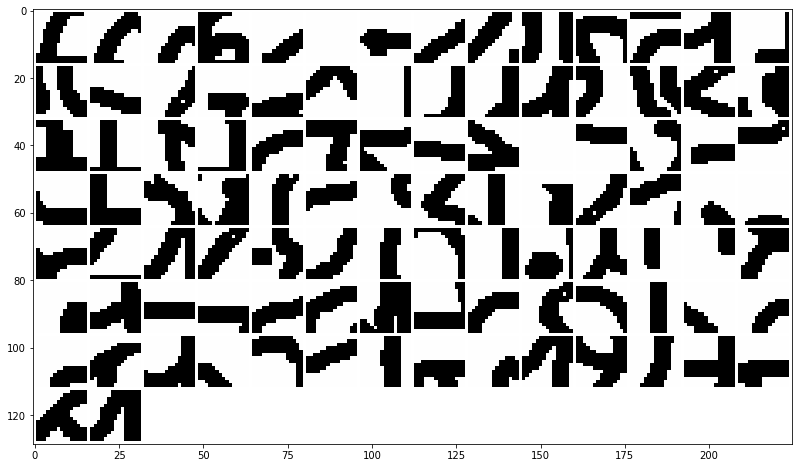

normalized regions:


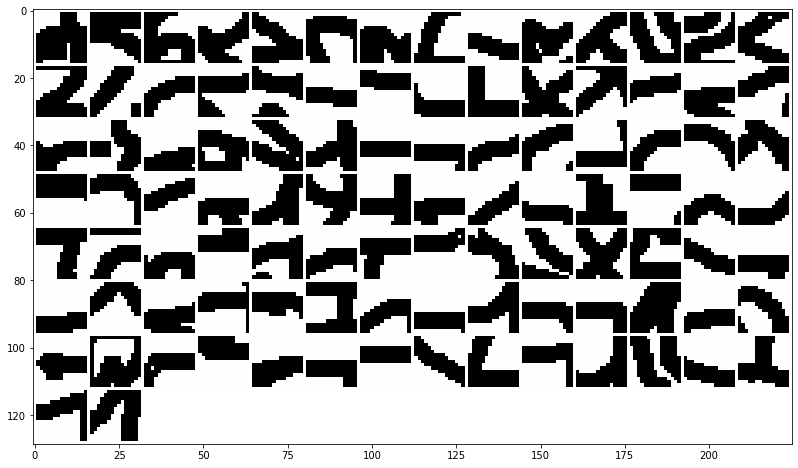

grid regions of 100 regions more=True or worst=False active for filter number: 45 :


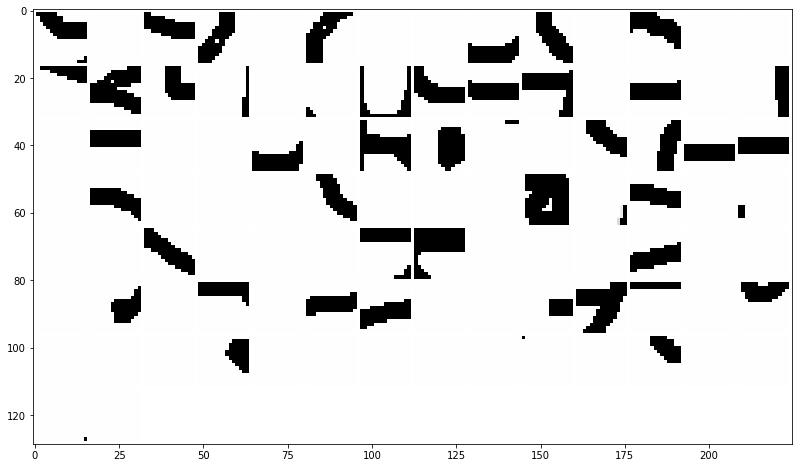

normalized regions:


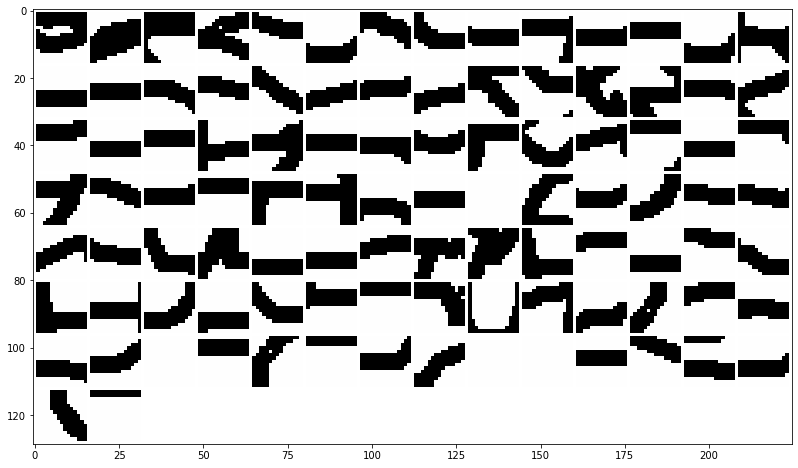

grid regions of 100 regions more=True or worst=False active for filter number: 50 :


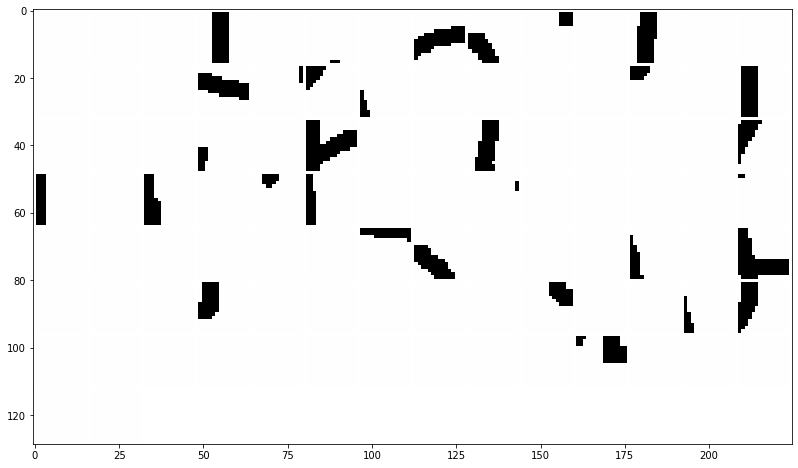

normalized regions:


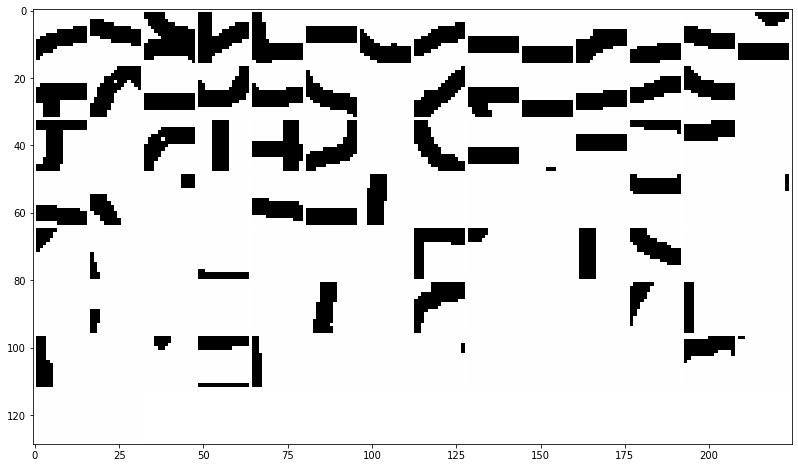

grid regions of 100 regions more=True or worst=False active for filter number: 55 :


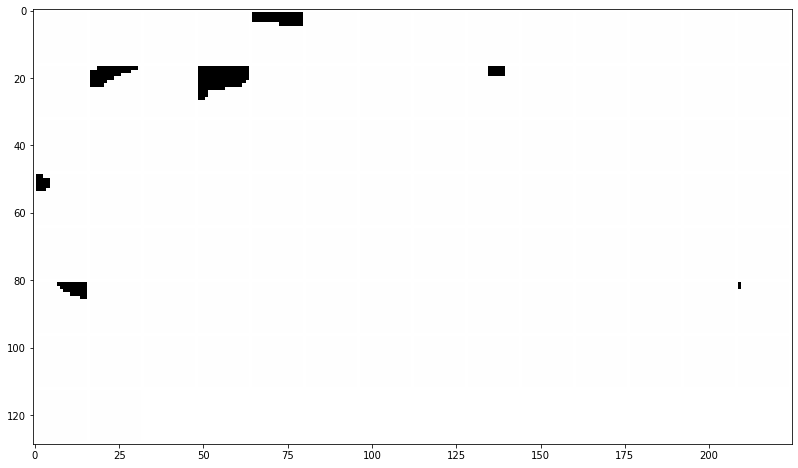

normalized regions:


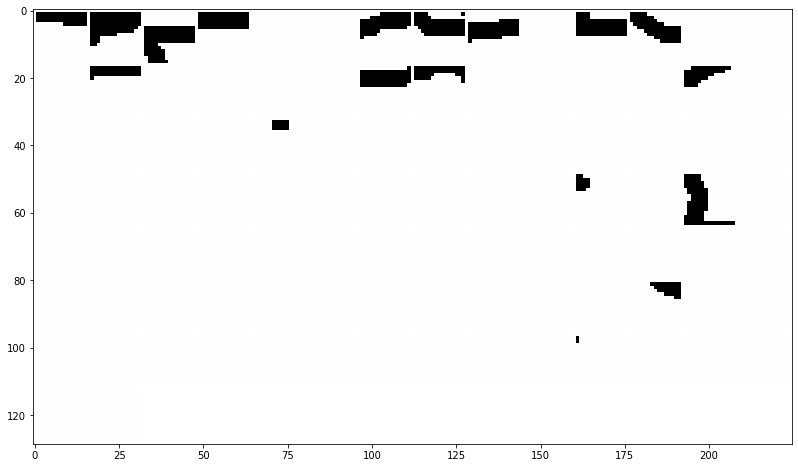

grid regions of 100 regions more=True or worst=False active for filter number: 60 :


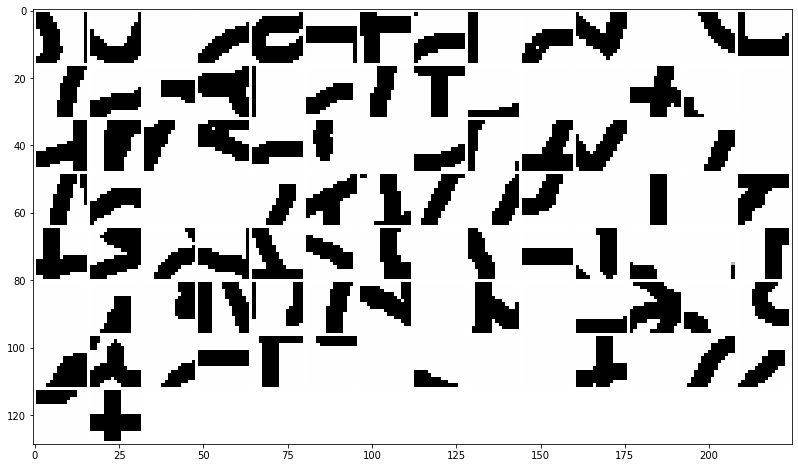

normalized regions:


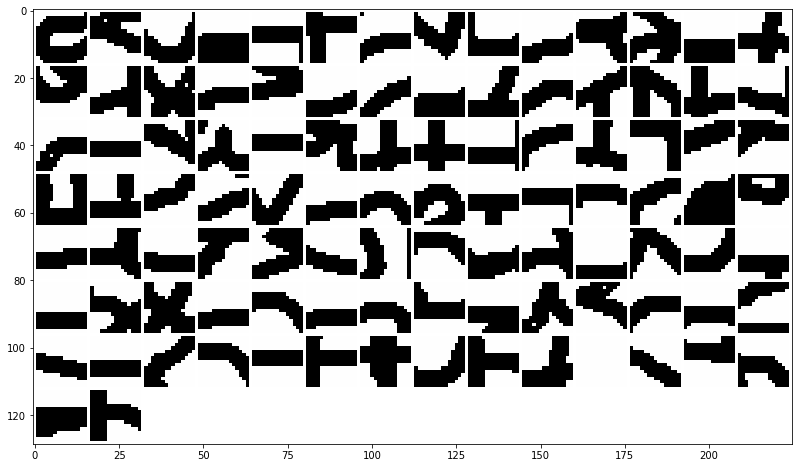

grid regions of 100 regions more=True or worst=False active for filter number: 65 :


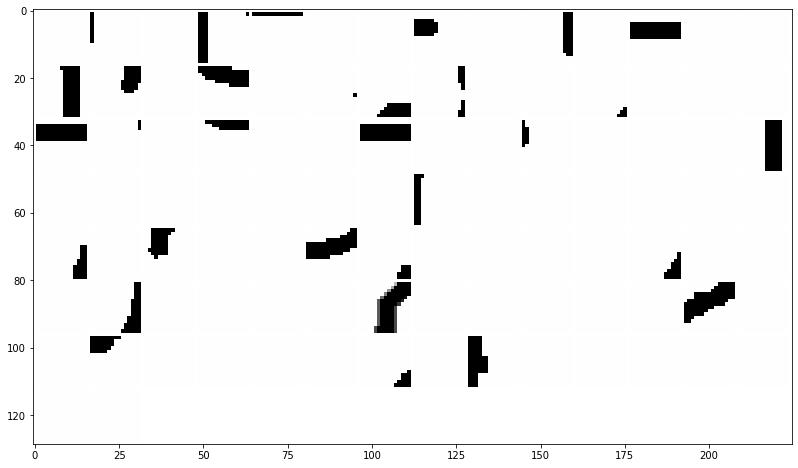

normalized regions:


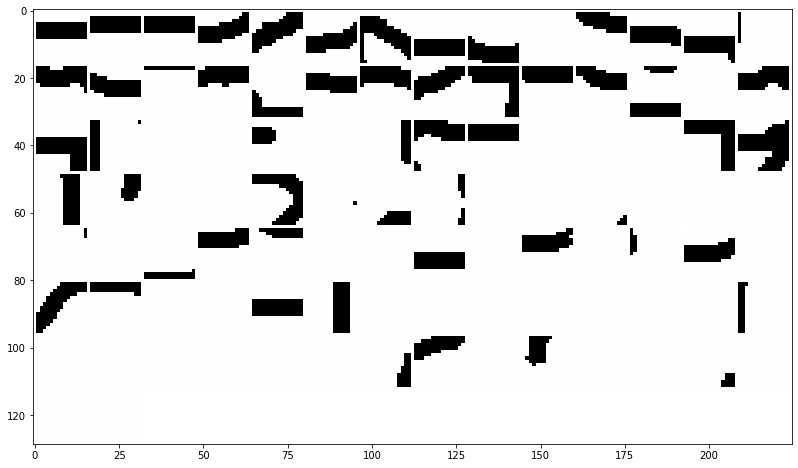

grid regions of 100 regions more=True or worst=False active for filter number: 70 :


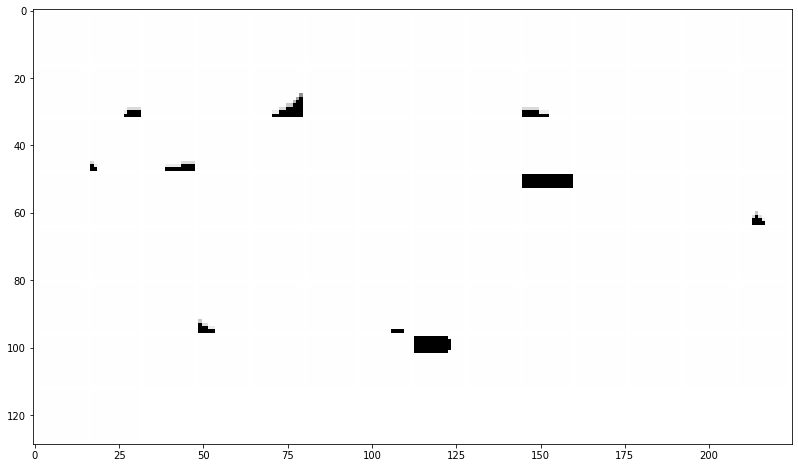

normalized regions:


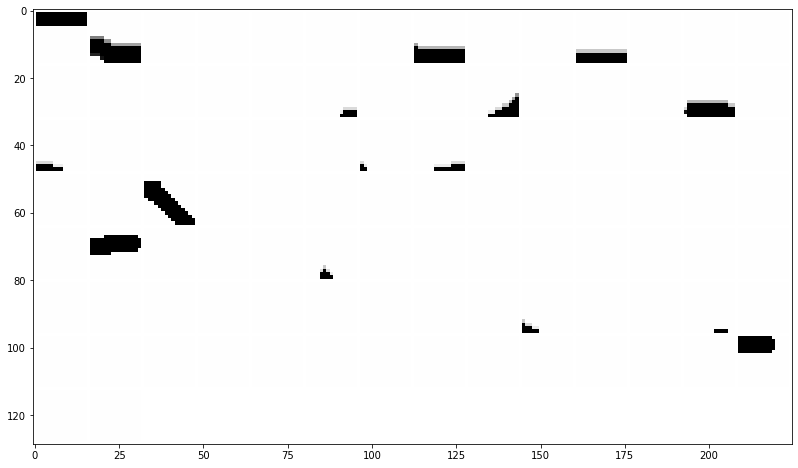

grid regions of 100 regions more=True or worst=False active for filter number: 80 :


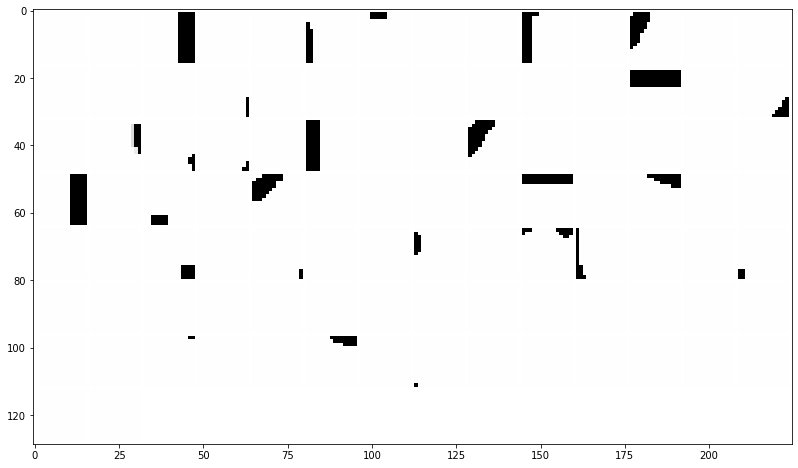

normalized regions:


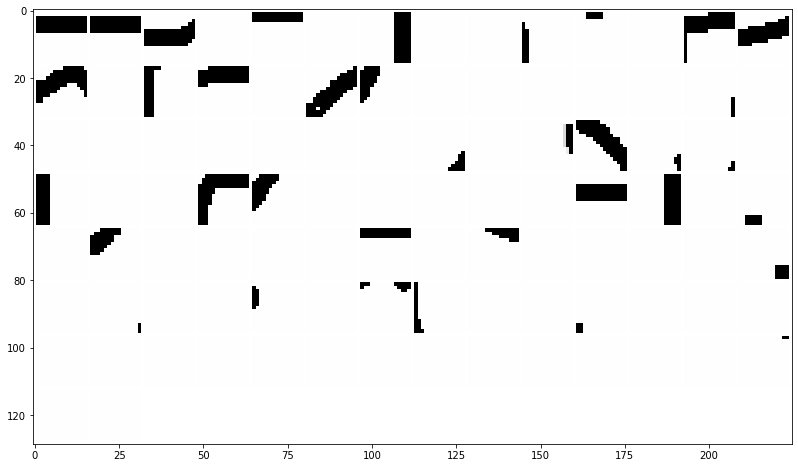

grid regions of 100 regions more=True or worst=False active for filter number: 85 :


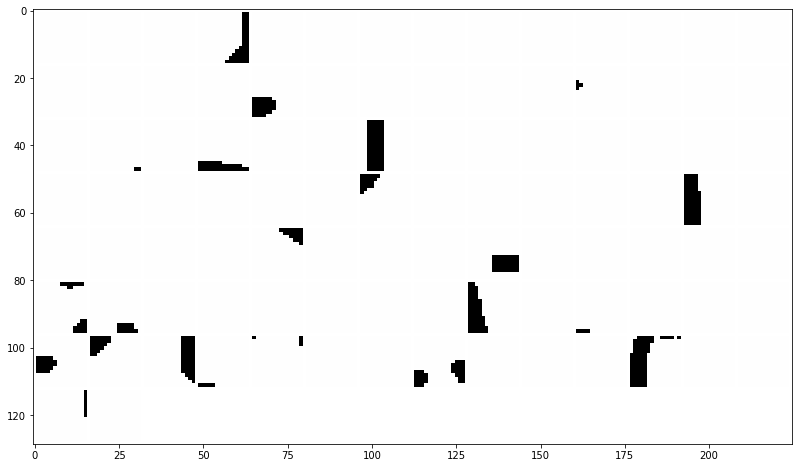

normalized regions:


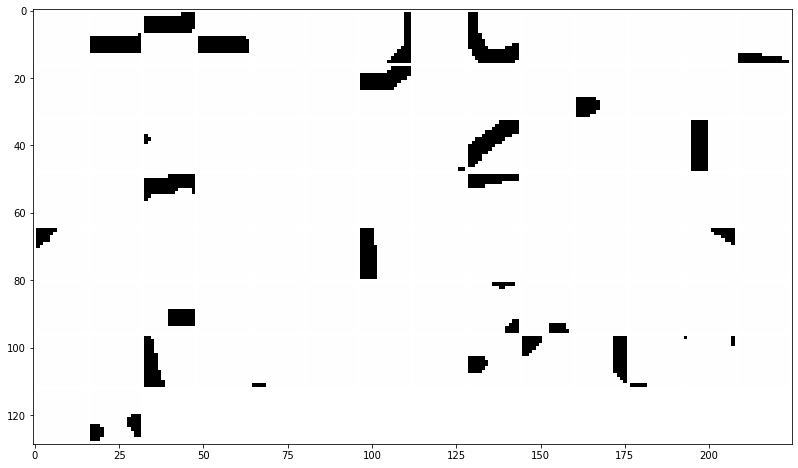

grid regions of 100 regions more=True or worst=False active for filter number: 90 :


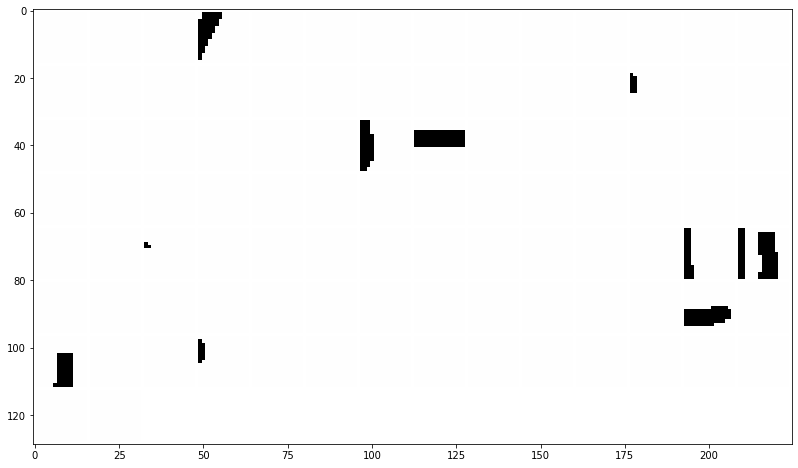

normalized regions:


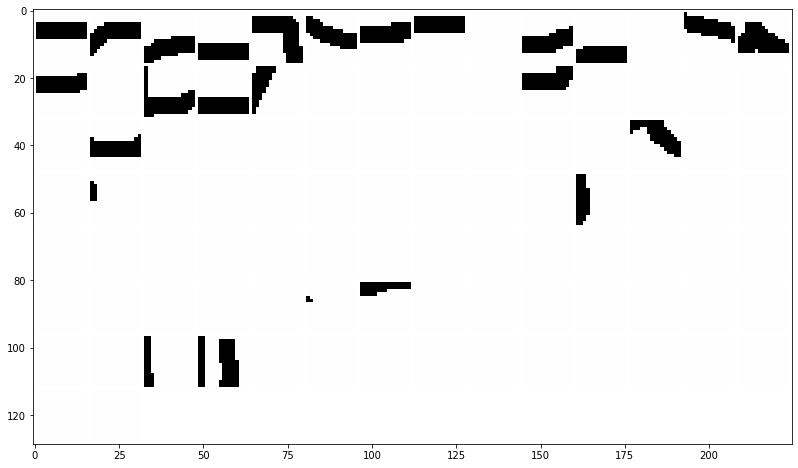

grid regions of 100 regions more=True or worst=False active for filter number: 95 :


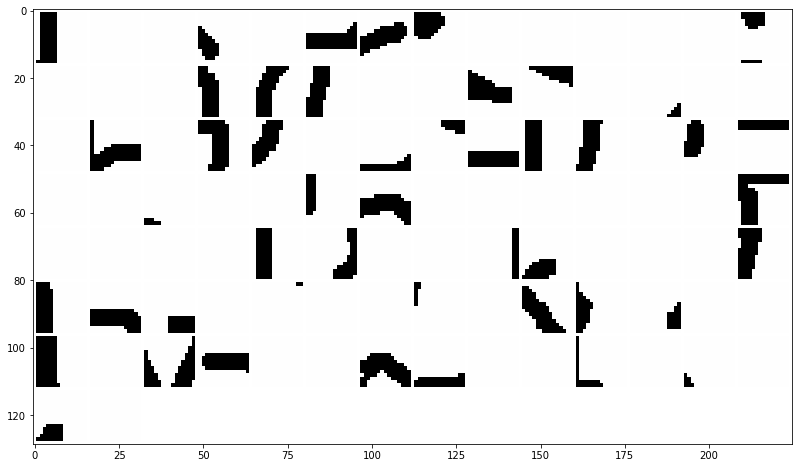

normalized regions:


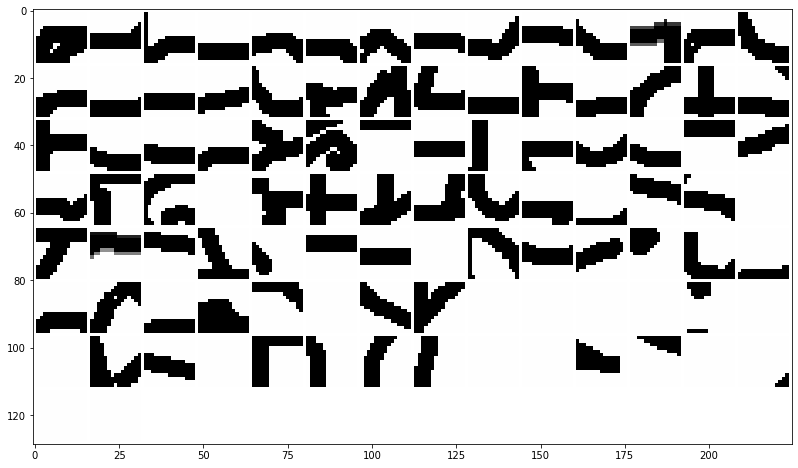

grid regions of 100 regions more=True or worst=False active for filter number: 100 :


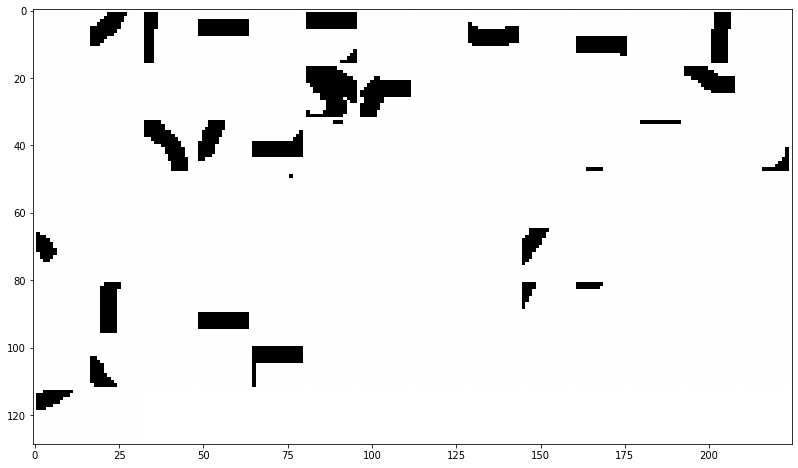

normalized regions:


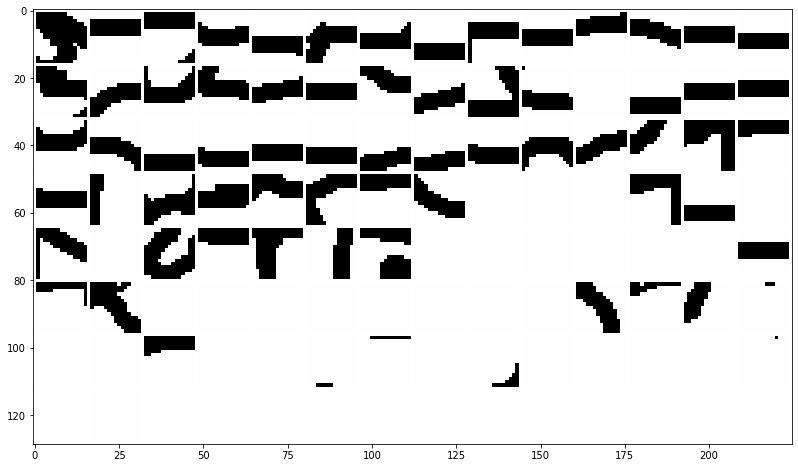

grid regions of 100 regions more=True or worst=False active for filter number: 105 :


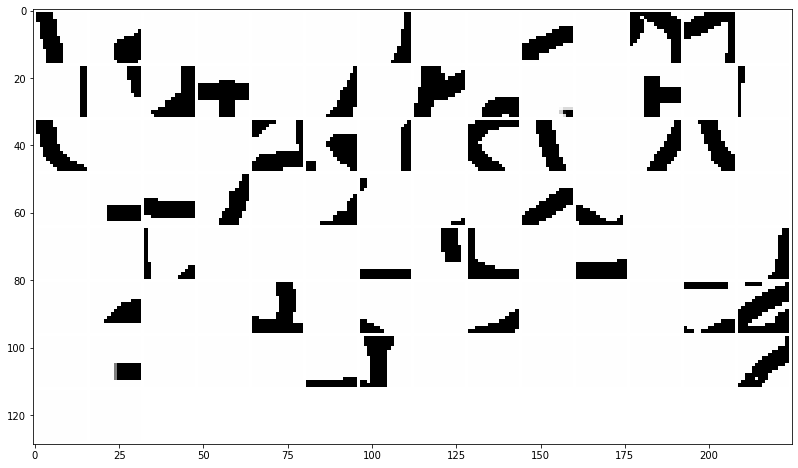

normalized regions:


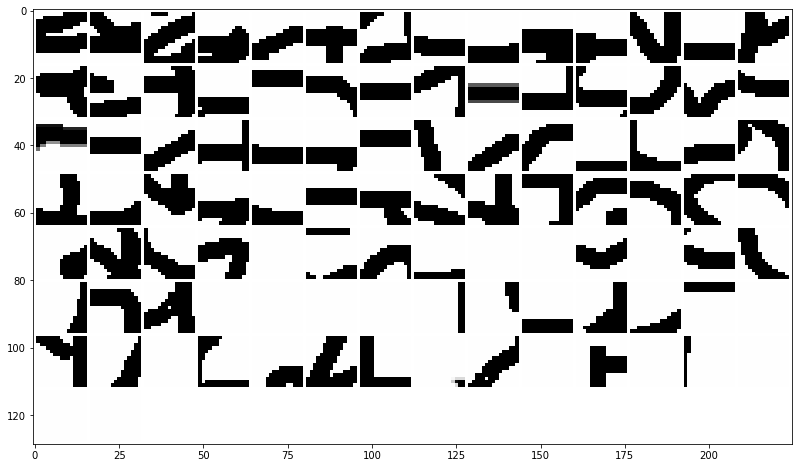

grid regions of 100 regions more=True or worst=False active for filter number: 110 :


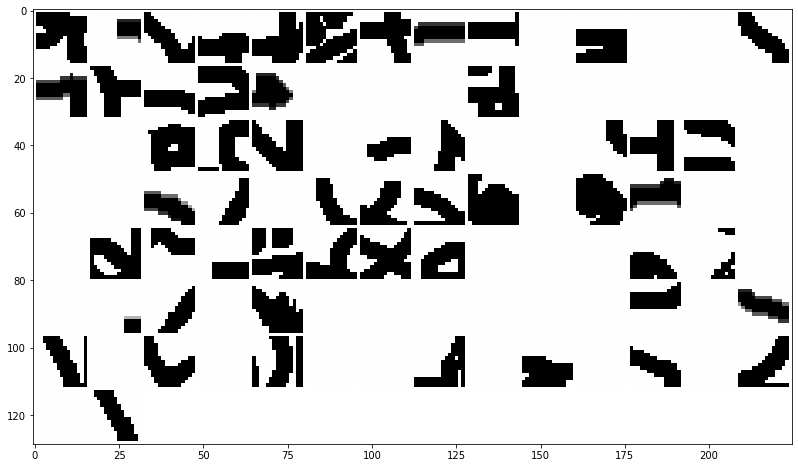

normalized regions:


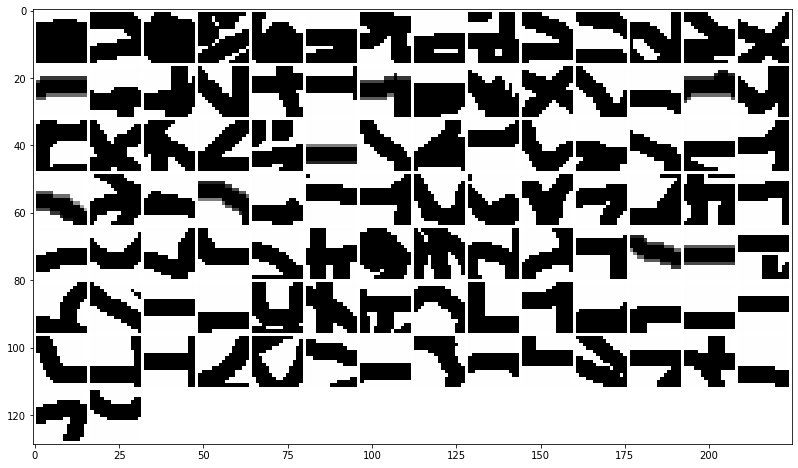

grid regions of 100 regions more=True or worst=False active for filter number: 115 :


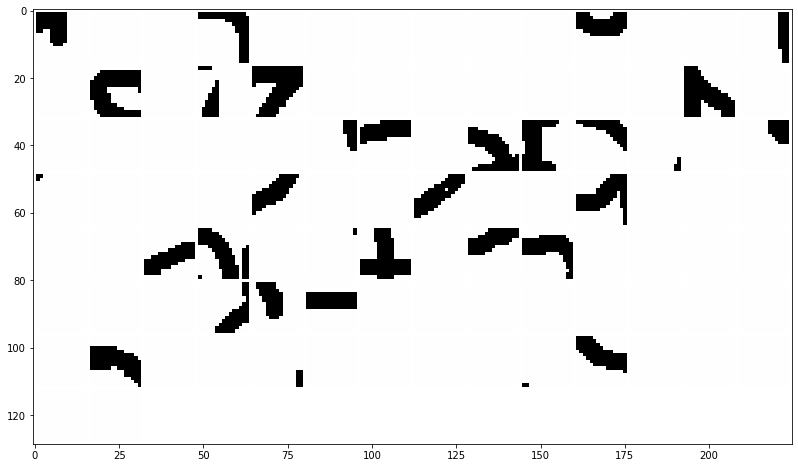

normalized regions:


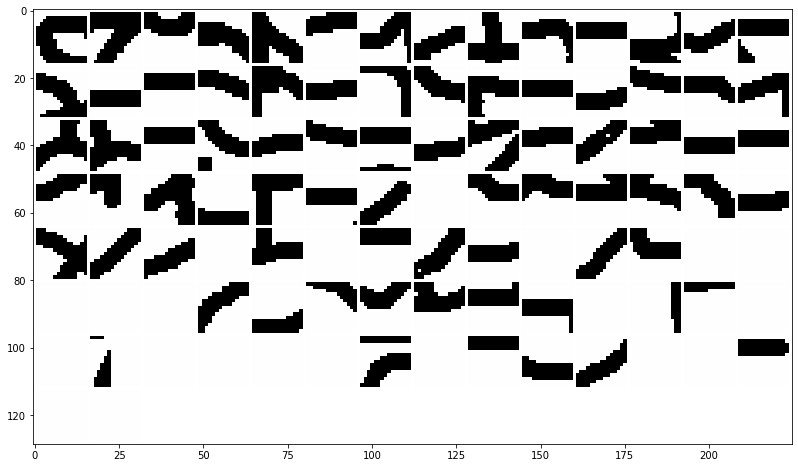

grid regions of 100 regions more=True or worst=False active for filter number: 120 :


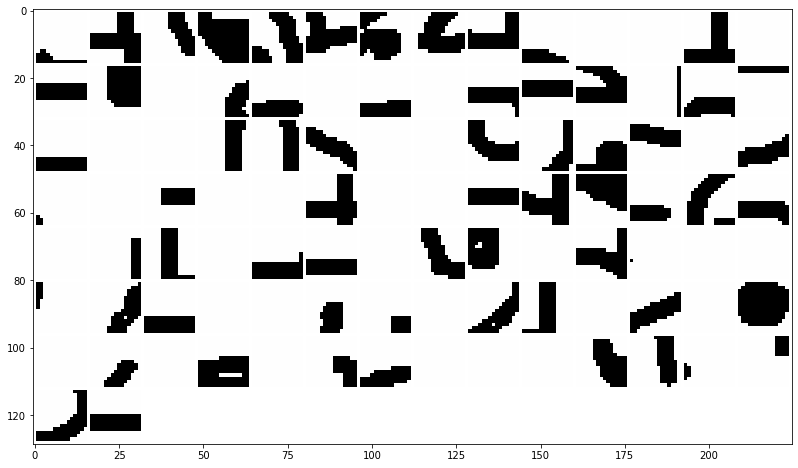

normalized regions:


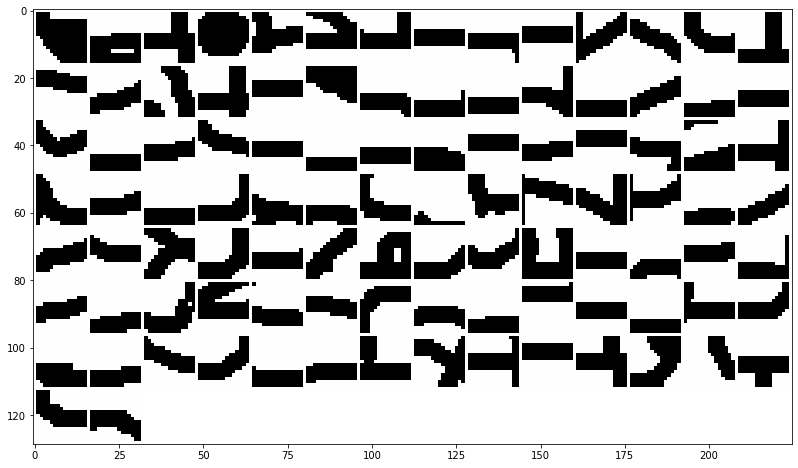

grid regions of 100 regions more=True or worst=False active for filter number: 125 :


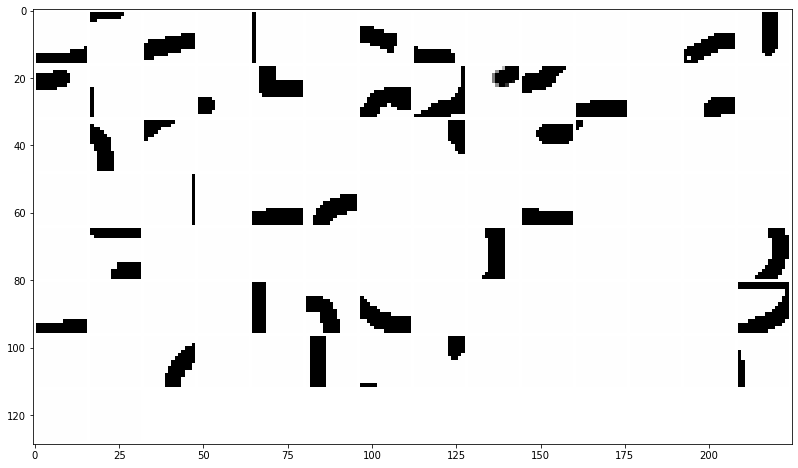

normalized regions:


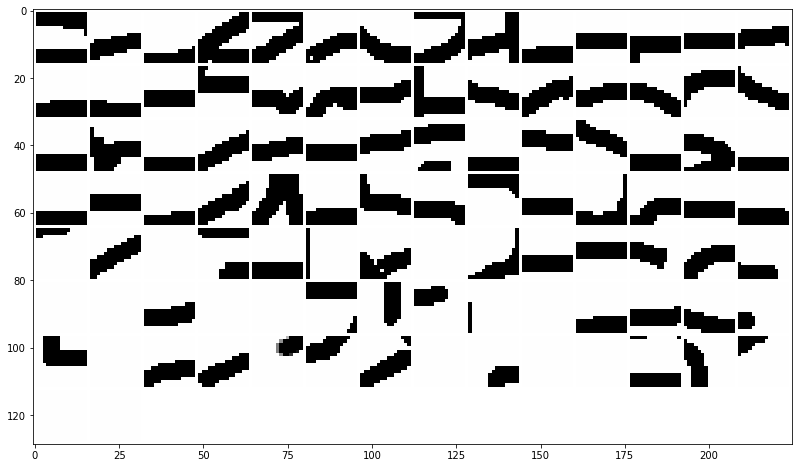

In [23]:
# regions and activation of interest
list_filter = list_filter_interest_layer3_mixt
regions = region_layer3_mixt_binary_maxpooling
activations = activation_layer3_mixt_binary_maxpooling
activations_normalized = activation_layer3_mixt_binary_normalized_maxpooling

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

In [24]:
# regions and activation of interest
list_filter = list_filter_interest_layer4_mixt
regions = region_layer4_mixt_binary_maxpooling
activations = activation_layer4_mixt_binary_maxpooling
activations_normalized = activation_layer4_mixt_binary_normalized_maxpooling

selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=True, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram)

Output hidden; open in https://colab.research.google.com to view.

### Viz mean images:

In [0]:
# parameters:
list_filter_interest_layer1 = range(64)
list_filter_interest_layer2 = range(128)
list_filter_interest_layer3 = range(256)
list_filter_interest_layer4 = range(512)
list_filter_interest_layer1_mixt = range(32)
list_filter_interest_layer2_mixt = range(64)
list_filter_interest_layer3_mixt = range(128)
list_filter_interest_layer4_mixt = range(256)

best = True
worst = False
viz_mean_img = True
plot_histogram = False
nrow=14
viz_grid=False
details = False
percentage = 10
save_mean_regions = True

#### No binary model with stride:

Consider 10% image regions = 100 images
mean regions of 100 regions who activate most filters:
image saved


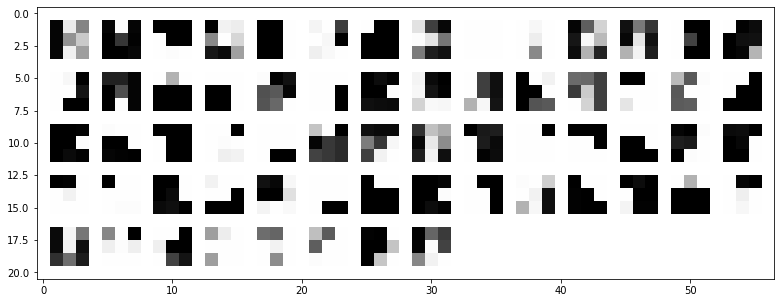

With normalized activations:
image saved


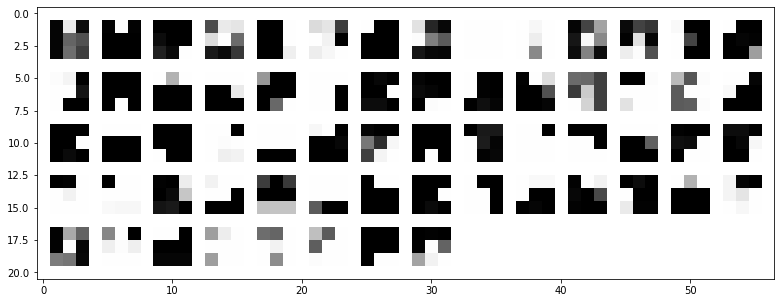

In [19]:
# regions and activation of interest
list_filter = list_filter_interest_layer1
regions = region_layer1_no_binary_stride
activations = activation_layer1_no_binary_stride
activations_normalized = activation_layer1_no_binary_normalized_stride

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/no_binary_model_stride_layer1'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

Consider 10% image regions = 100 images
mean regions of 100 regions who activate most filters:
image saved


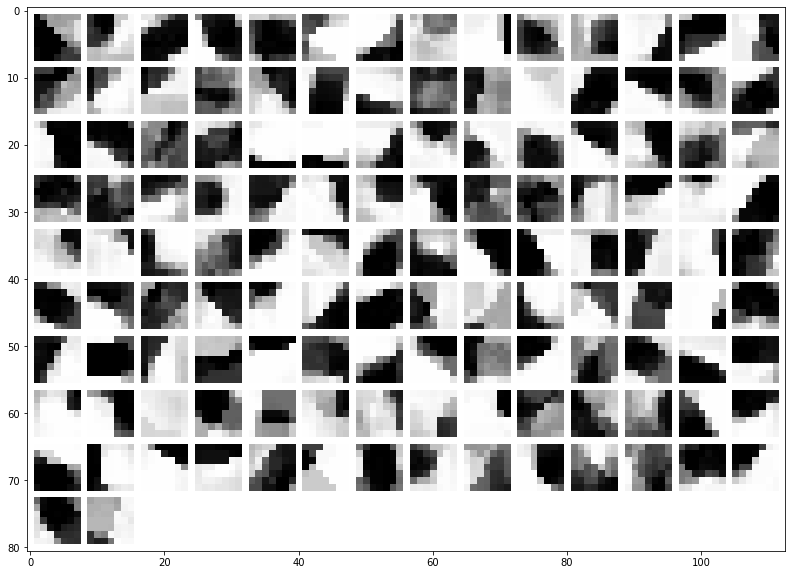

With normalized activations:
image saved


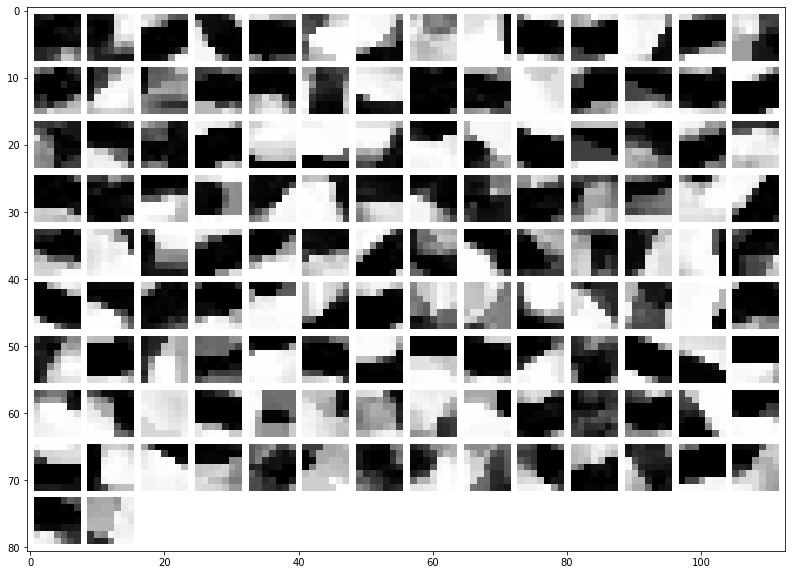

In [20]:
# regions and activation of interest
list_filter = list_filter_interest_layer2
regions = region_layer2_no_binary_stride
activations = activation_layer2_no_binary_stride
activations_normalized = activation_layer2_no_binary_normalized_stride

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/no_binary_model_stride_layer2'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

Consider 10% image regions = 100 images
mean regions of 100 regions who activate most filters:
image saved


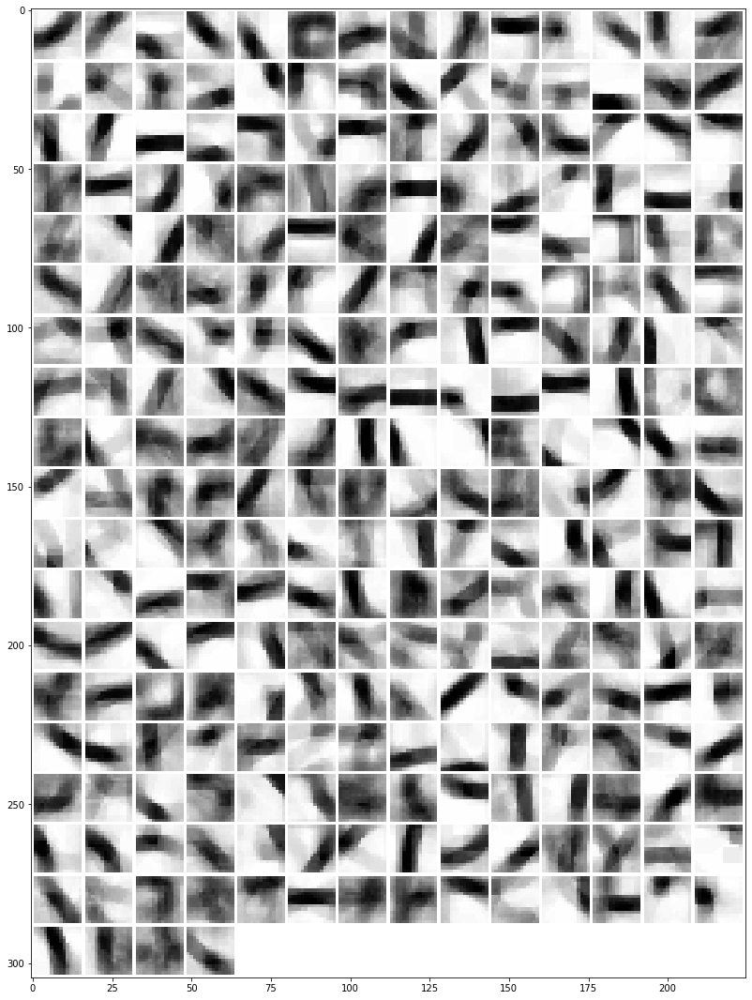

With normalized activations:
image saved


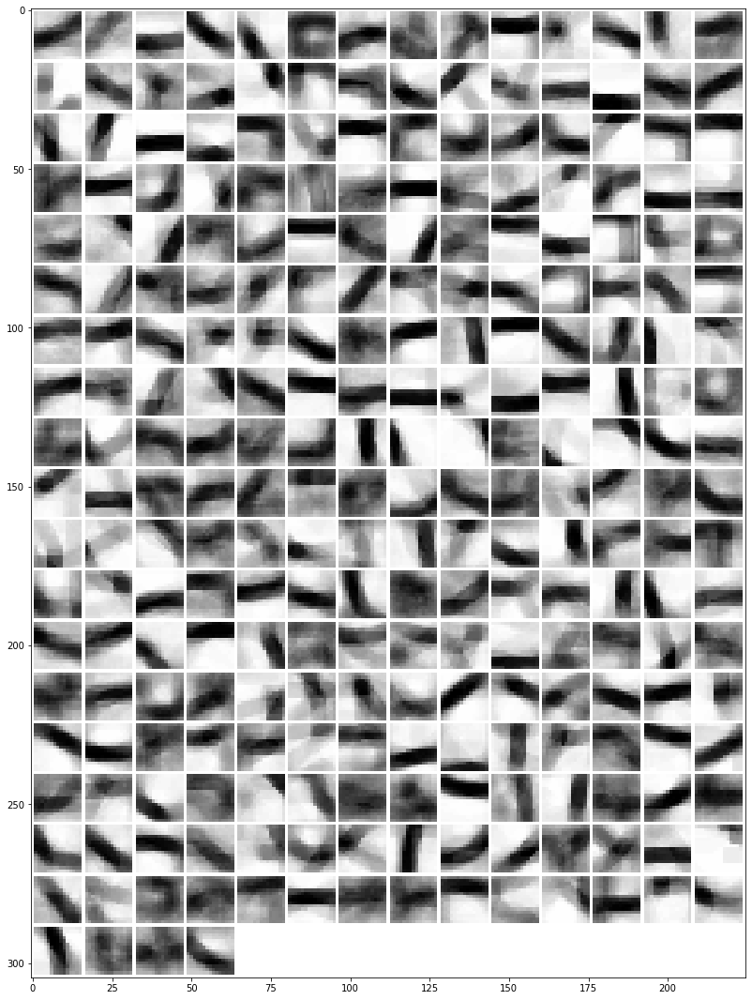

In [21]:
# regions and activation of interest
list_filter = list_filter_interest_layer3
regions = region_layer3_no_binary_stride
activations = activation_layer3_no_binary_stride
activations_normalized = activation_layer3_no_binary_normalized_stride

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/no_binary_model_stride_layer3'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

In [22]:
# regions and activation of interest
list_filter = list_filter_interest_layer4
regions = region_layer4_no_binary_stride
activations = activation_layer4_no_binary_stride
activations_normalized = activation_layer4_no_binary_normalized_stride

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/no_binary_model_stride_layer4'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

Output hidden; open in https://colab.research.google.com to view.

#### No binary model maxpooling:

Consider 10% image regions = 100 images
mean regions of 100 regions who activate most filters:
image saved


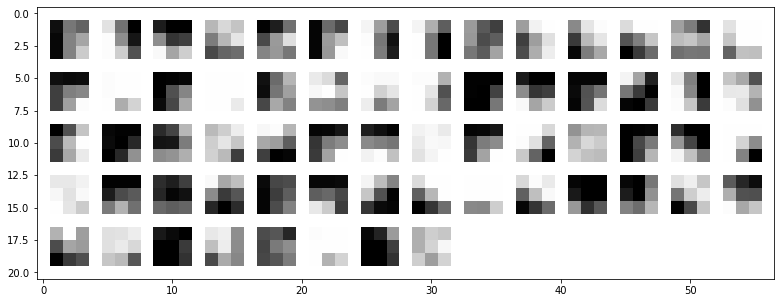

With normalized activations:
image saved


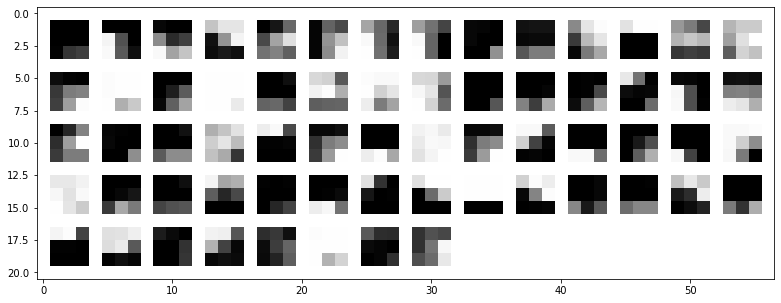

In [15]:
list_filter = list_filter_interest_layer1
regions = region_layer1_no_binary_maxpooling
activations = activation_layer1_no_binary_maxpooling
activations_normalized = activation_layer1_no_binary_normalized_maxpooling

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/no_binary_model_maxpooling_layer1'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

Consider 10% image regions = 100 images
mean regions of 100 regions who activate most filters:
image saved


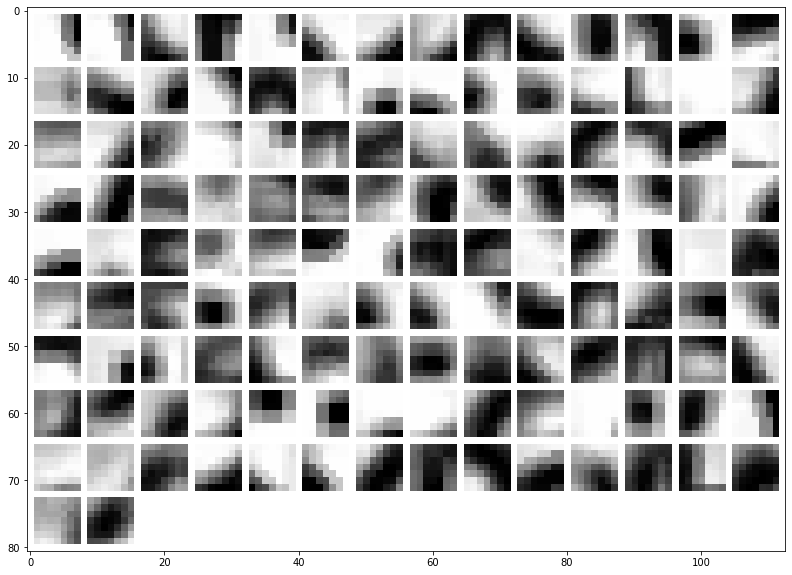

With normalized activations:
image saved


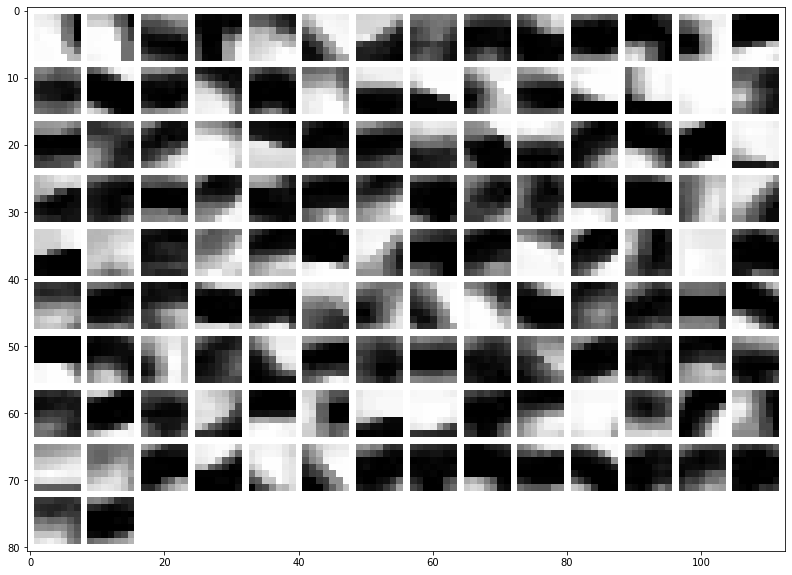

In [16]:
list_filter = list_filter_interest_layer2
regions = region_layer2_no_binary_maxpooling
activations = activation_layer2_no_binary_maxpooling
activations_normalized = activation_layer2_no_binary_normalized_maxpooling

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/no_binary_model_maxpooling_layer2'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

Consider 10% image regions = 100 images
mean regions of 100 regions who activate most filters:
image saved


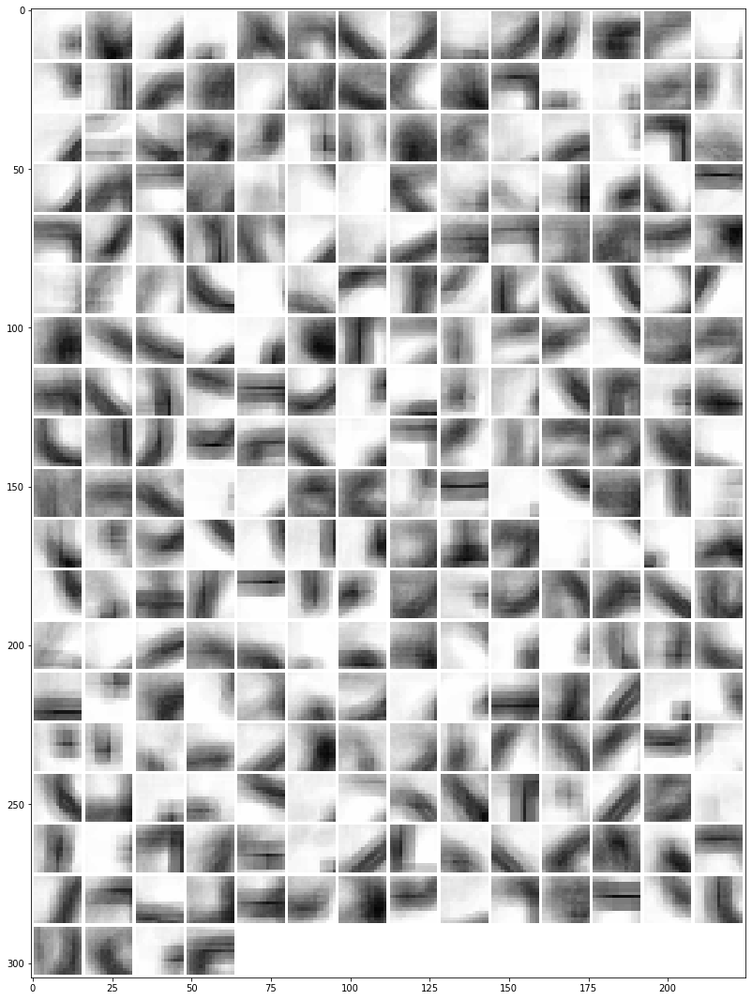

With normalized activations:
image saved


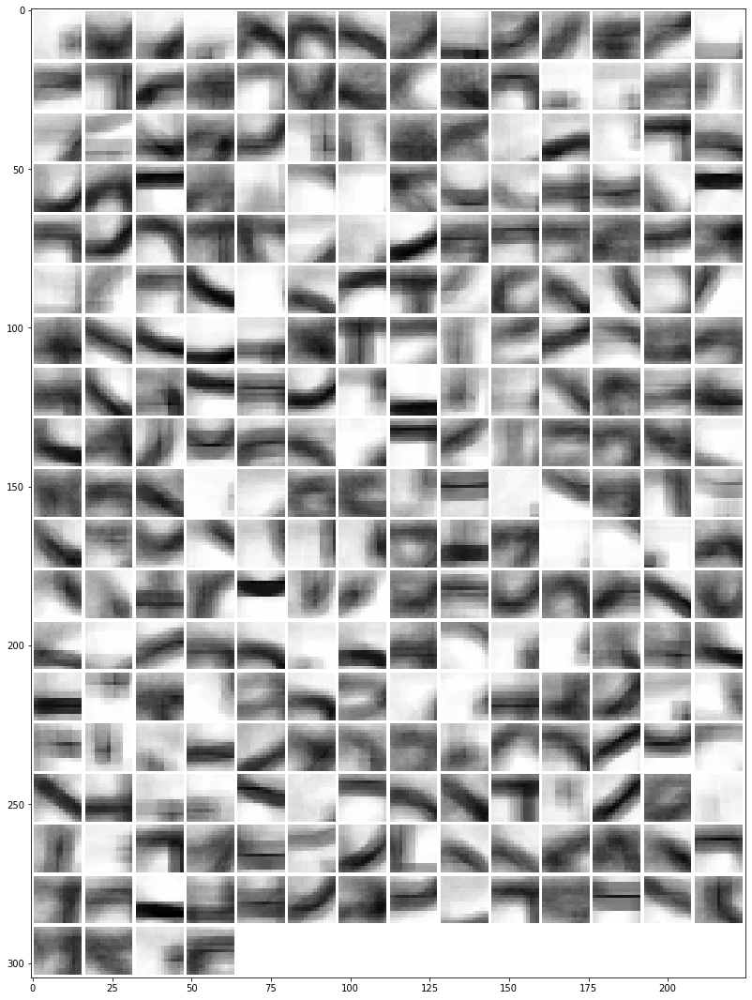

In [17]:
list_filter = list_filter_interest_layer3
regions = region_layer3_no_binary_maxpooling
activations = activation_layer3_no_binary_maxpooling
activations_normalized = activation_layer3_no_binary_normalized_maxpooling

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/no_binary_model_maxpooling_layer3'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

In [18]:
list_filter = list_filter_interest_layer4
regions = region_layer4_no_binary_maxpooling
activations = activation_layer4_no_binary_maxpooling
activations_normalized = activation_layer4_no_binary_normalized_maxpooling

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/no_binary_model_maxpooling_layer4'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

Output hidden; open in https://colab.research.google.com to view.

#### Binary model stride:

Consider 10% image regions = 100 images
mean regions of 100 regions who activate most filters:
image saved


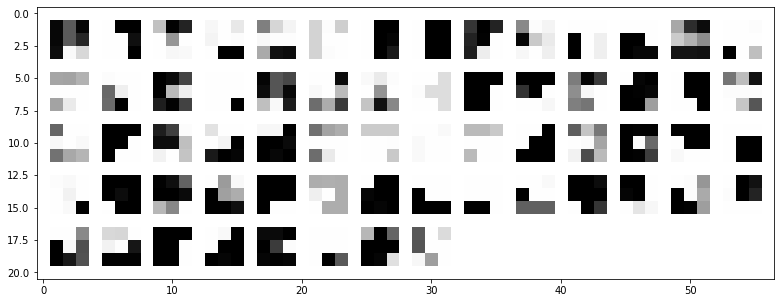

With normalized activations:
image saved


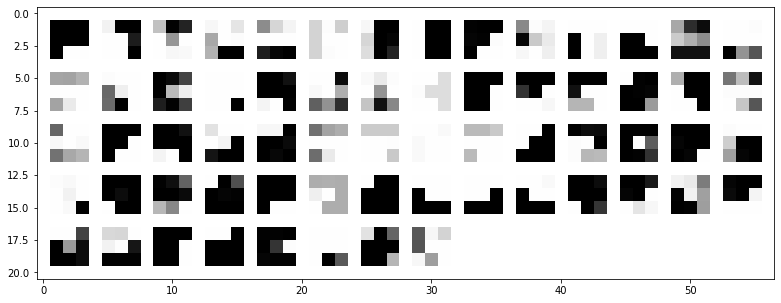

In [19]:
list_filter = list_filter_interest_layer1
regions = region_layer1_binary_stride
activations = activation_layer1_binary_stride
activations_normalized = activation_layer1_binary_normalized_stride

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/binary_model_stride_layer1'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

Consider 10% image regions = 100 images
mean regions of 100 regions who activate most filters:
image saved


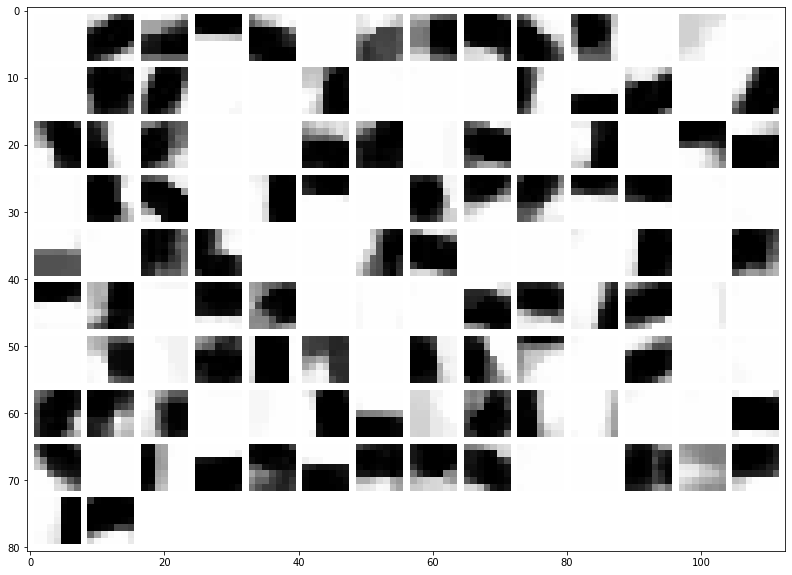

With normalized activations:
image saved


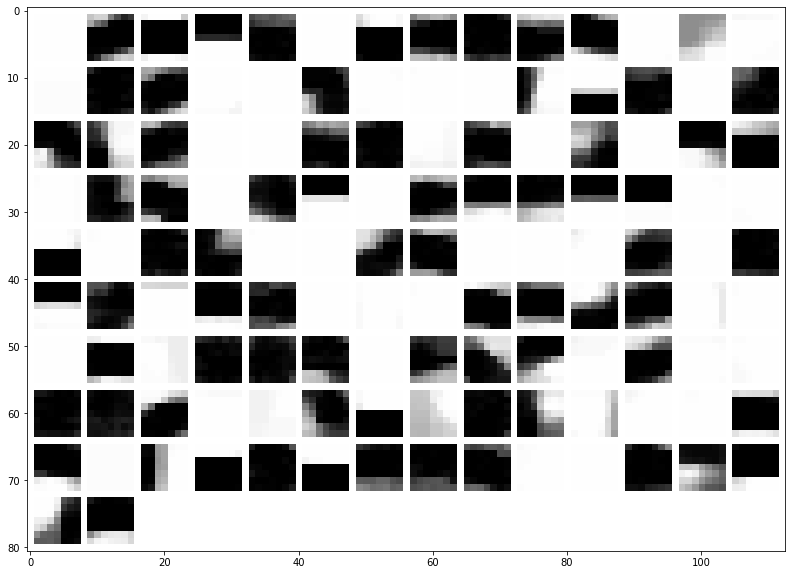

In [20]:
list_filter = list_filter_interest_layer2
regions = region_layer2_binary_stride
activations = activation_layer2_binary_stride
activations_normalized = activation_layer2_binary_normalized_stride

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/binary_model_stride_layer2'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

Consider 10% image regions = 100 images
mean regions of 100 regions who activate most filters:
image saved


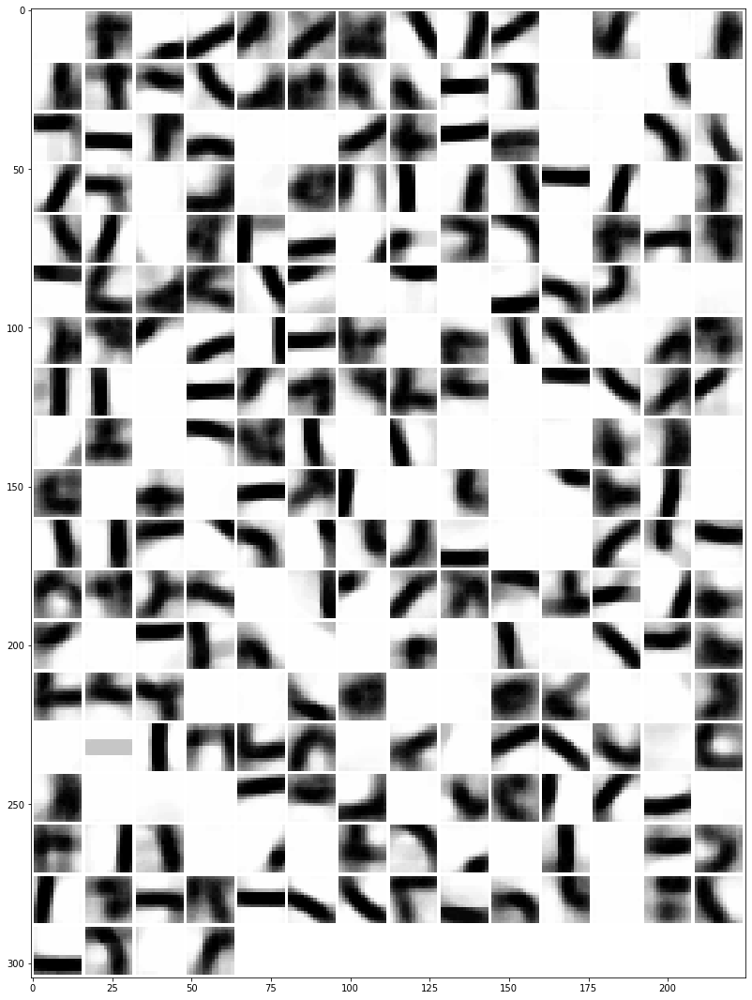

With normalized activations:
image saved


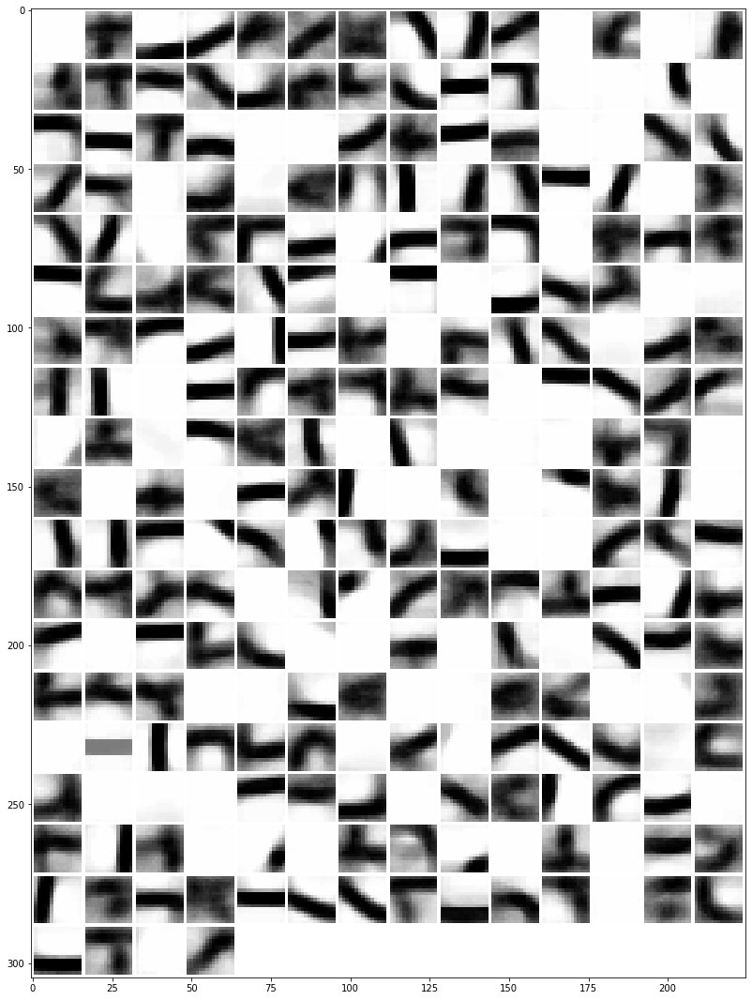

In [21]:
list_filter = list_filter_interest_layer3
regions = region_layer3_binary_stride
activations = activation_layer3_binary_stride
activations_normalized = activation_layer3_binary_normalized_stride

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/binary_model_stride_layer3'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

In [22]:
list_filter = list_filter_interest_layer4
regions = region_layer4_binary_stride
activations = activation_layer4_binary_stride
activations_normalized = activation_layer4_binary_normalized_stride

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/binary_model_stride_layer4'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

Output hidden; open in https://colab.research.google.com to view.

#### Binary model maxpooling:

Consider 10% image regions = 100 images
mean regions of 100 regions who activate most filters:
image saved


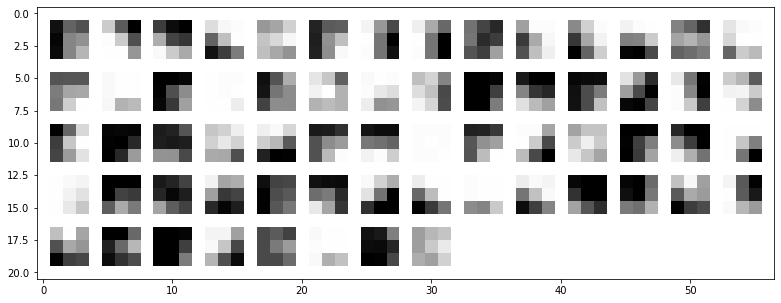

With normalized activations:
image saved


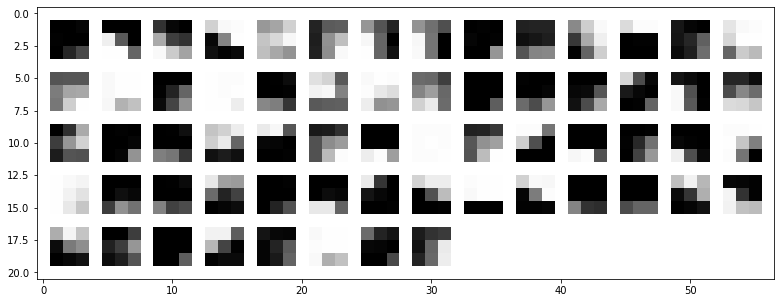

In [8]:
list_filter = list_filter_interest_layer1
regions = region_layer1_binary_maxpooling
activations = activation_layer1_binary_maxpooling
activations_normalized = activation_layer1_binary_normalized_maxpooling

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/binary_model_maxpooling_layer1'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

Consider 10% image regions = 100 images
mean regions of 100 regions who activate most filters:
image saved


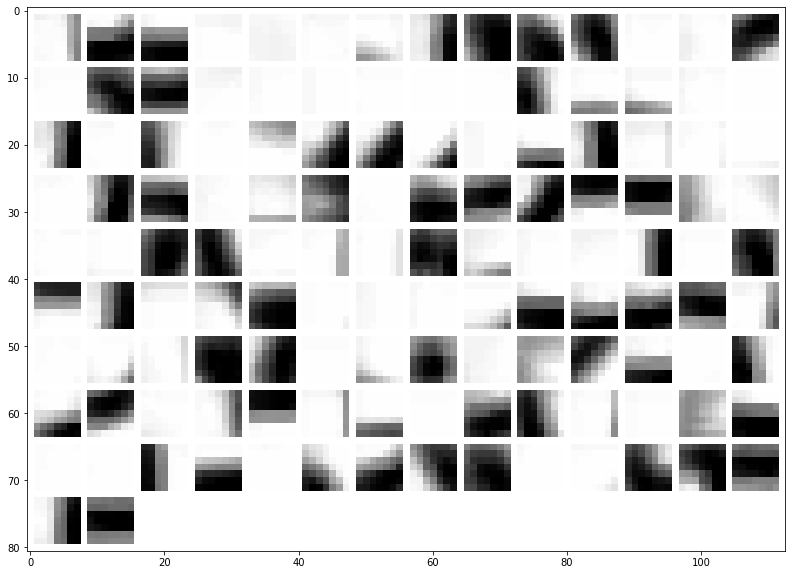

With normalized activations:
image saved


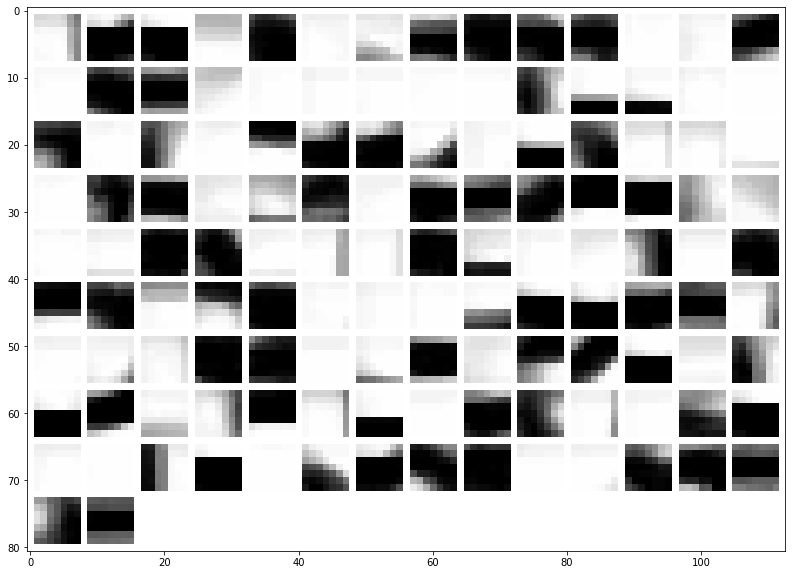

In [9]:
list_filter = list_filter_interest_layer2
regions = region_layer2_binary_maxpooling
activations = activation_layer2_binary_maxpooling
activations_normalized = activation_layer2_binary_normalized_maxpooling

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/binary_model_maxpooling_layer2'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

Consider 10% image regions = 100 images
mean regions of 100 regions who activate most filters:
image saved


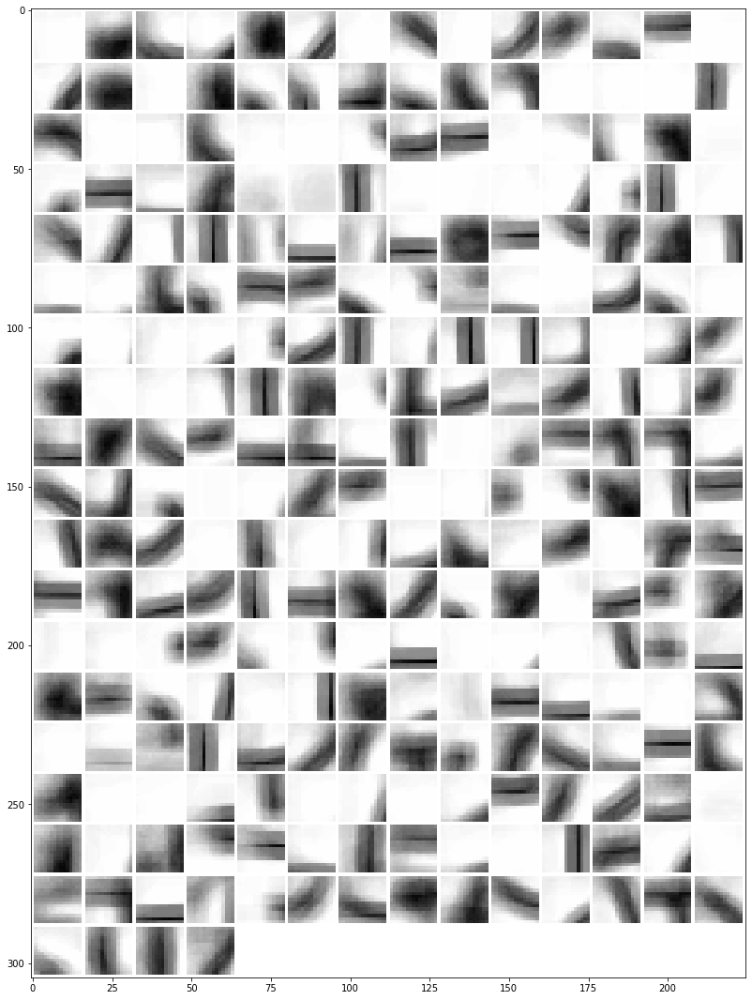

With normalized activations:
image saved


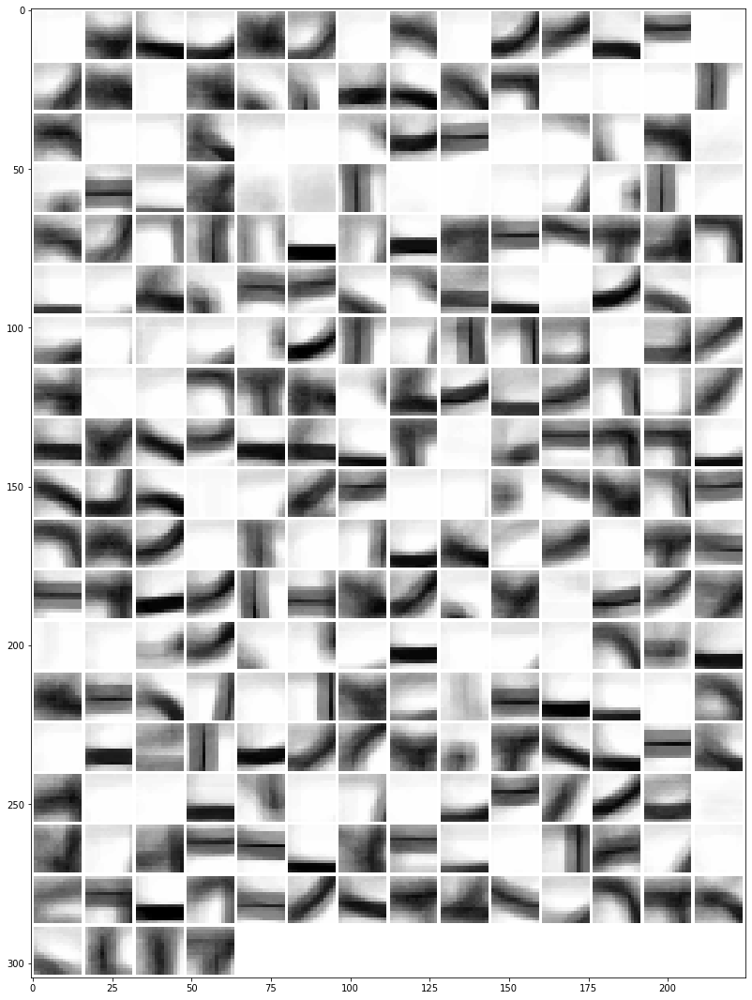

In [10]:
list_filter = list_filter_interest_layer3
regions = region_layer3_binary_maxpooling
activations = activation_layer3_binary_maxpooling
activations_normalized = activation_layer3_binary_normalized_maxpooling

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/binary_model_maxpooling_layer3'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

In [11]:
list_filter = list_filter_interest_layer4
regions = region_layer4_binary_maxpooling
activations = activation_layer4_binary_maxpooling
activations_normalized = activation_layer4_binary_normalized_maxpooling

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/binary_model_maxpooling_layer4'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

Output hidden; open in https://colab.research.google.com to view.

#### Mixt model stride:

binary model mixt stride:
Consider 10% image regions = 100 images
mean regions of 100 regions who activate most filters:
image saved


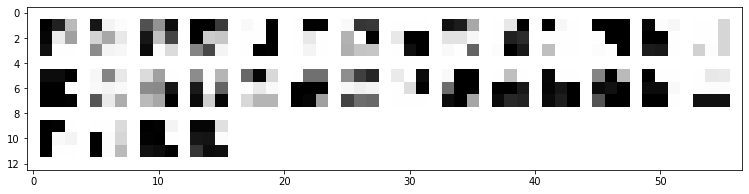

With normalized activations:
image saved


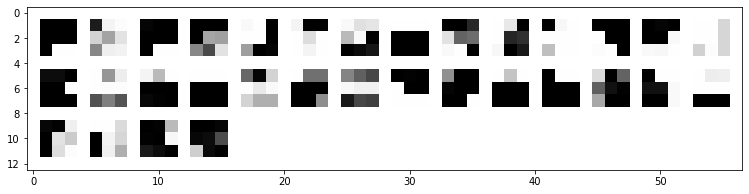

no binary model mixt stride:
Consider 10% image regions = 100 images
mean regions of 100 regions who activate most filters:
image saved


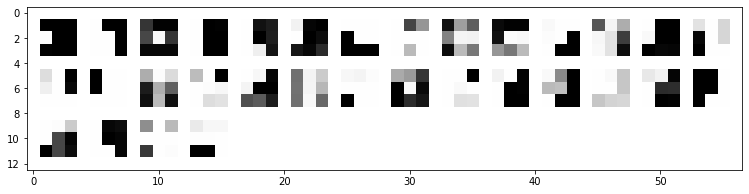

With normalized activations:
image saved


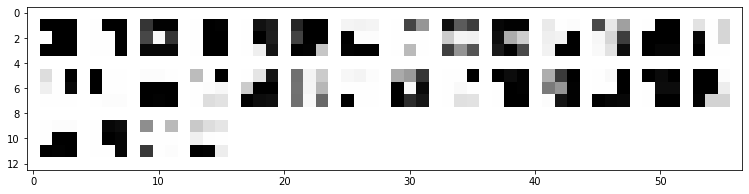

In [26]:
print('binary model mixt stride:')
list_filter = list_filter_interest_layer1_mixt
regions = region_layer1_mixt_no_binary_stride
activations = activation_layer1_mixt_no_binary_stride
activations_normalized = activation_layer1_mixt_no_binary_normalized_stride

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/mixt_no_binary_model_stride_layer1'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

print('no binary model mixt stride:')
regions = region_layer1_mixt_binary_stride
activations = activation_layer1_mixt_binary_stride
activations_normalized = activation_layer1_mixt_binary_normalized_stride

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/mixt_binary_model_stride_layer1'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

binary model mixt stride:
Consider 10% image regions = 100 images
mean regions of 100 regions who activate most filters:
image saved


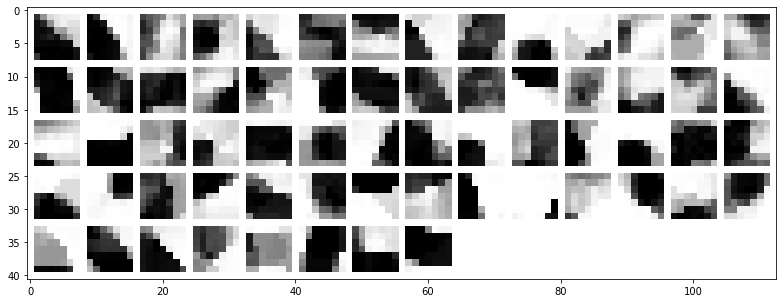

With normalized activations:
image saved


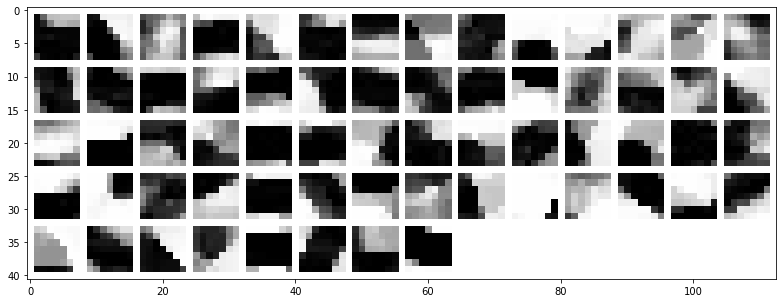

no binary model mixt stride:
Consider 10% image regions = 100 images
mean regions of 100 regions who activate most filters:
image saved


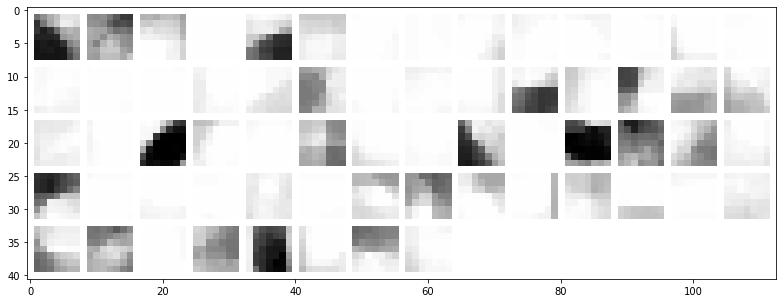

With normalized activations:
image saved


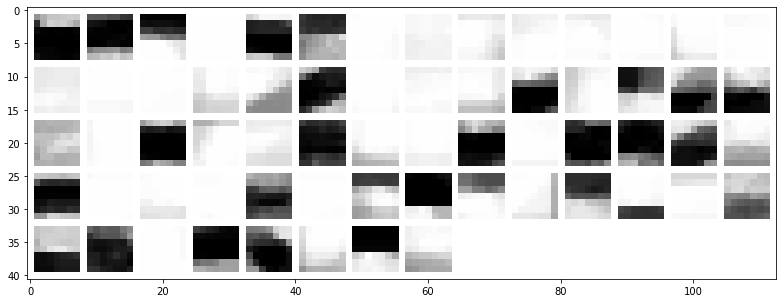

In [27]:
print('binary model mixt stride:')
list_filter = list_filter_interest_layer2_mixt
regions = region_layer2_mixt_no_binary_stride
activations = activation_layer2_mixt_no_binary_stride
activations_normalized = activation_layer2_mixt_no_binary_normalized_stride

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/mixt_no_binary_model_stride_layer2'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

print('no binary model mixt stride:')
regions = region_layer2_mixt_binary_stride
activations = activation_layer2_mixt_binary_stride
activations_normalized = activation_layer2_mixt_binary_normalized_stride

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/mixt_binary_model_stride_layer2'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

binary model mixt stride:
Consider 10% image regions = 100 images
mean regions of 100 regions who activate most filters:
image saved


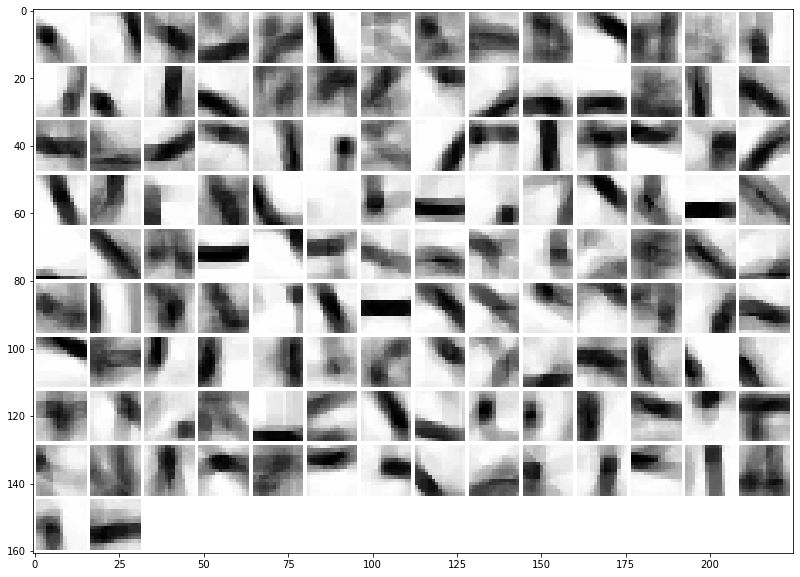

With normalized activations:
image saved


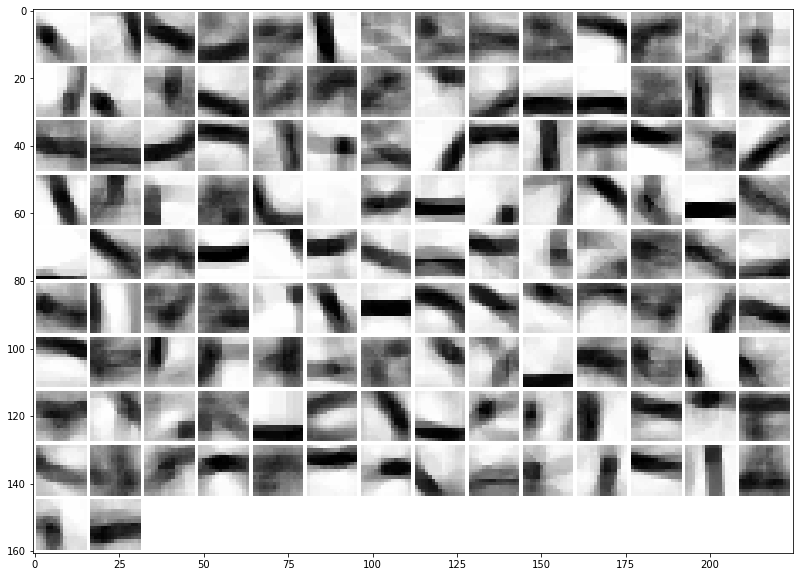

no binary model mixt stride:
Consider 10% image regions = 100 images
mean regions of 100 regions who activate most filters:
image saved


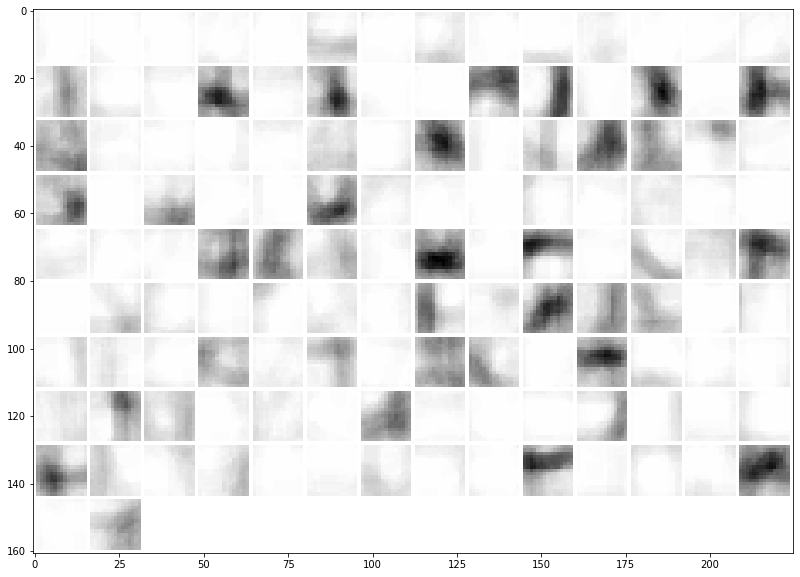

With normalized activations:
image saved


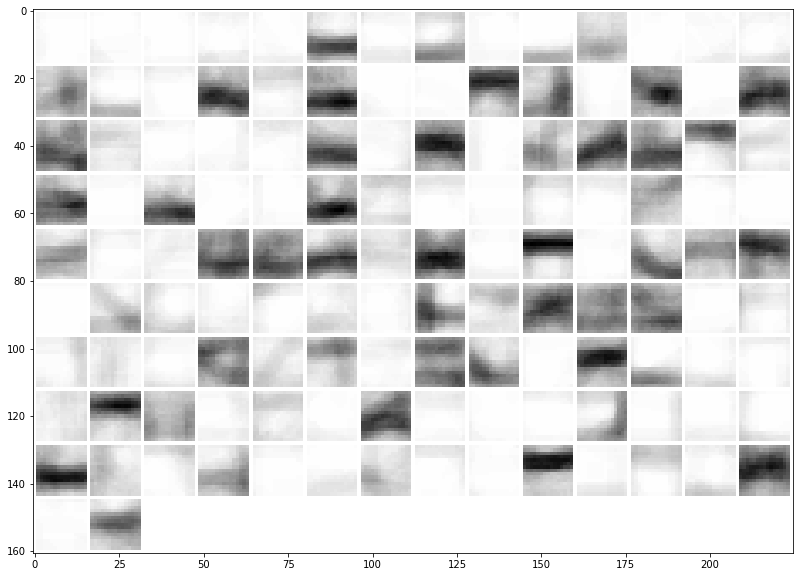

In [28]:
print('binary model mixt stride:')
list_filter = list_filter_interest_layer3_mixt
regions = region_layer3_mixt_no_binary_stride
activations = activation_layer3_mixt_no_binary_stride
activations_normalized = activation_layer3_mixt_no_binary_normalized_stride

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/mixt_no_binary_model_stride_layer3'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

print('no binary model mixt stride:')
regions = region_layer3_mixt_binary_stride
activations = activation_layer3_mixt_binary_stride
activations_normalized = activation_layer3_mixt_binary_normalized_stride

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/mixt_binary_model_stride_layer3'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

In [29]:
print('binary model mixt stride:')
list_filter = list_filter_interest_layer4_mixt
regions = region_layer4_mixt_no_binary_stride
activations = activation_layer4_mixt_no_binary_stride
activations_normalized = activation_layer4_mixt_no_binary_normalized_stride

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/mixt_no_binary_model_stride_layer4'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

print('no binary model mixt stride:')
regions = region_layer4_mixt_binary_stride
activations = activation_layer4_mixt_binary_stride
activations_normalized = activation_layer4_mixt_binary_normalized_stride

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/mixt_binary_model_stride_layer4'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

Output hidden; open in https://colab.research.google.com to view.

#### Mixt model maxpooling:

binary model mixt stride:
Consider 10% image regions = 100 images
mean regions of 100 regions who activate most filters:
image saved


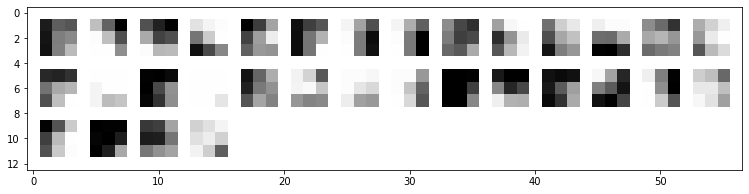

With normalized activations:
image saved


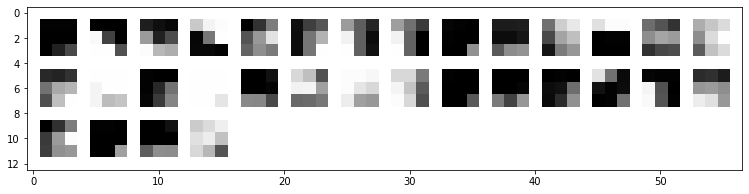

no binary model mixt stride:
Consider 10% image regions = 100 images
mean regions of 100 regions who activate most filters:
image saved


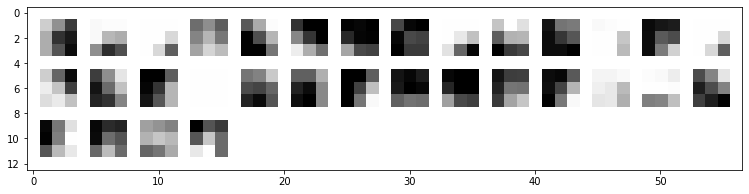

With normalized activations:
image saved


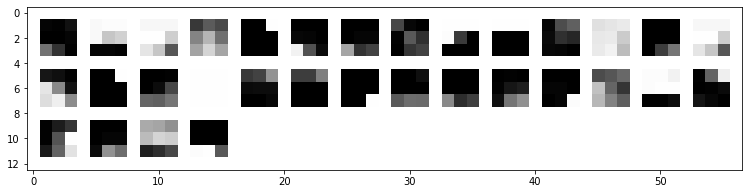

In [26]:
print('binary model mixt stride:')
list_filter = list_filter_interest_layer1_mixt
regions = region_layer1_mixt_no_binary_maxpooling
activations = activation_layer1_mixt_no_binary_maxpooling
activations_normalized = activation_layer1_mixt_no_binary_normalized_maxpooling

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/mixt_no_binary_model_maxpooling_layer1'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

print('no binary model mixt stride:')
regions = region_layer1_mixt_binary_maxpooling
activations = activation_layer1_mixt_binary_maxpooling
activations_normalized = activation_layer1_mixt_binary_normalized_maxpooling

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/mixt_binary_model_maxpooling_layer1'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

binary model mixt stride:
Consider 10% image regions = 100 images
mean regions of 100 regions who activate most filters:
image saved


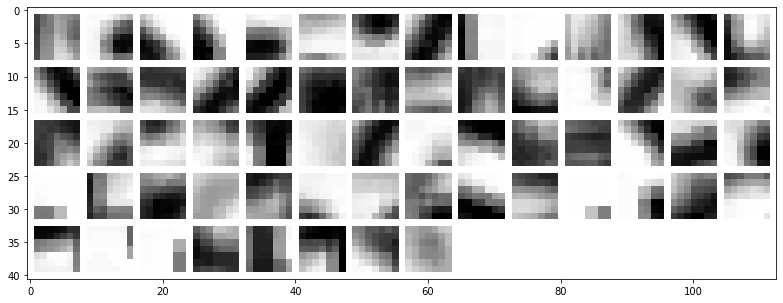

With normalized activations:
image saved


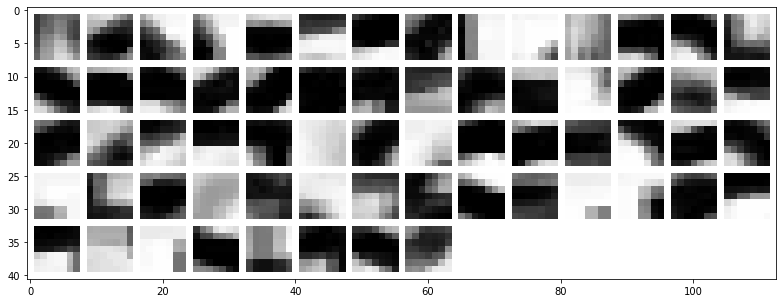

no binary model mixt stride:
Consider 10% image regions = 100 images
mean regions of 100 regions who activate most filters:
image saved


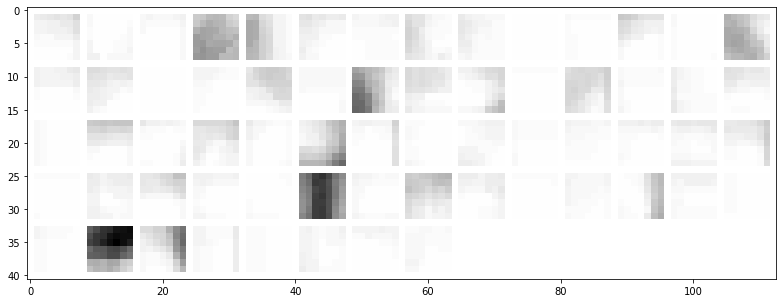

With normalized activations:
image saved


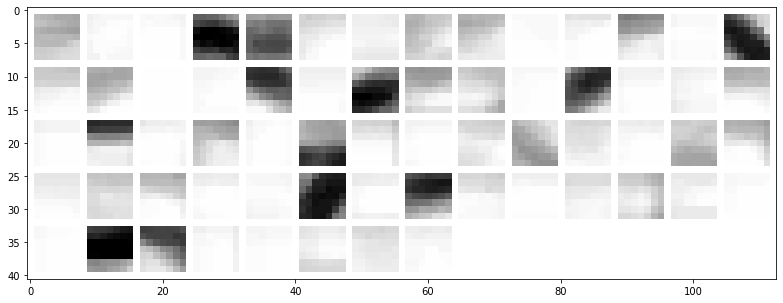

In [27]:
print('binary model mixt stride:')
list_filter = list_filter_interest_layer2_mixt
regions = region_layer2_mixt_no_binary_maxpooling
activations = activation_layer2_mixt_no_binary_maxpooling
activations_normalized = activation_layer2_mixt_no_binary_normalized_maxpooling

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/mixt_no_binary_model_maxpooling_layer2'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

print('no binary model mixt stride:')
regions = region_layer2_mixt_binary_maxpooling
activations = activation_layer2_mixt_binary_maxpooling
activations_normalized = activation_layer2_mixt_binary_normalized_maxpooling

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/mixt_binary_model_maxpooling_layer2'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

binary model mixt stride:
Consider 10% image regions = 100 images
mean regions of 100 regions who activate most filters:
image saved


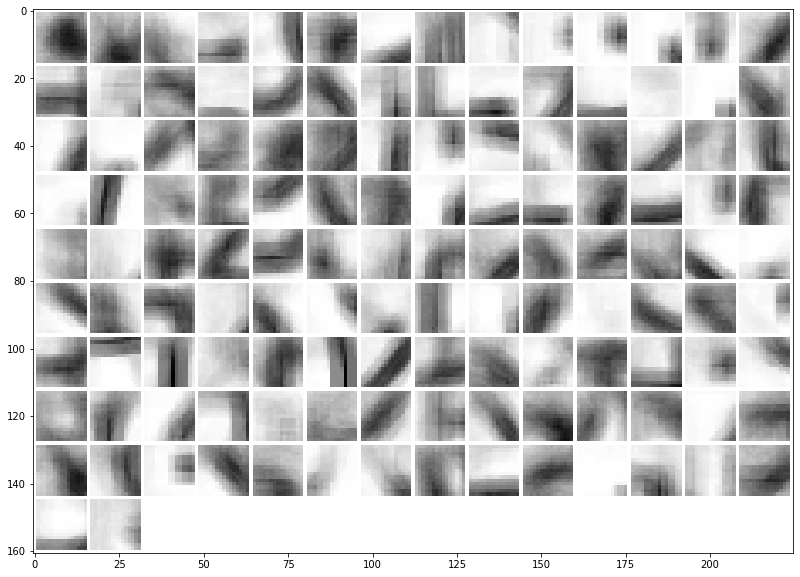

With normalized activations:
image saved


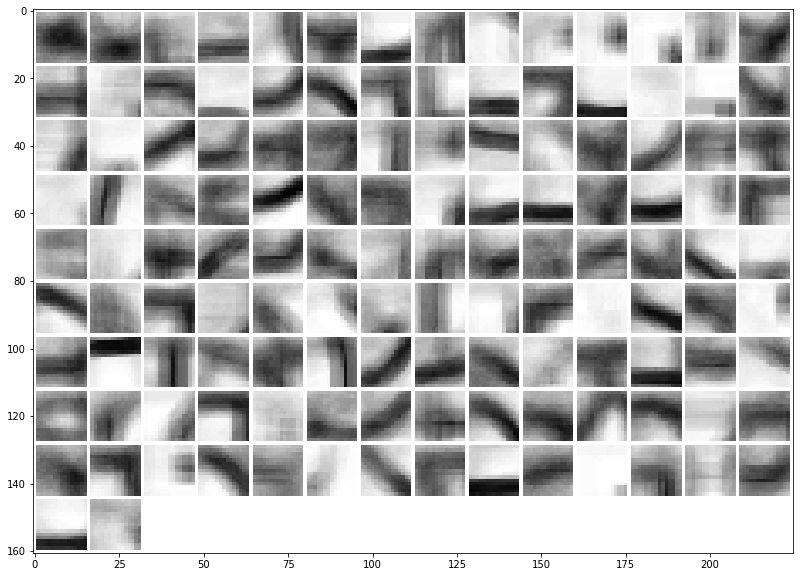

no binary model mixt stride:
Consider 10% image regions = 100 images
mean regions of 100 regions who activate most filters:
image saved


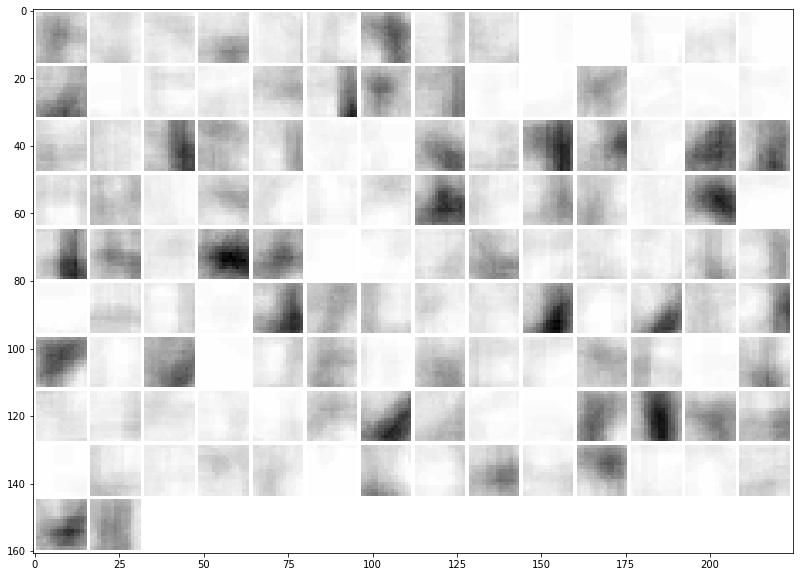

With normalized activations:
image saved


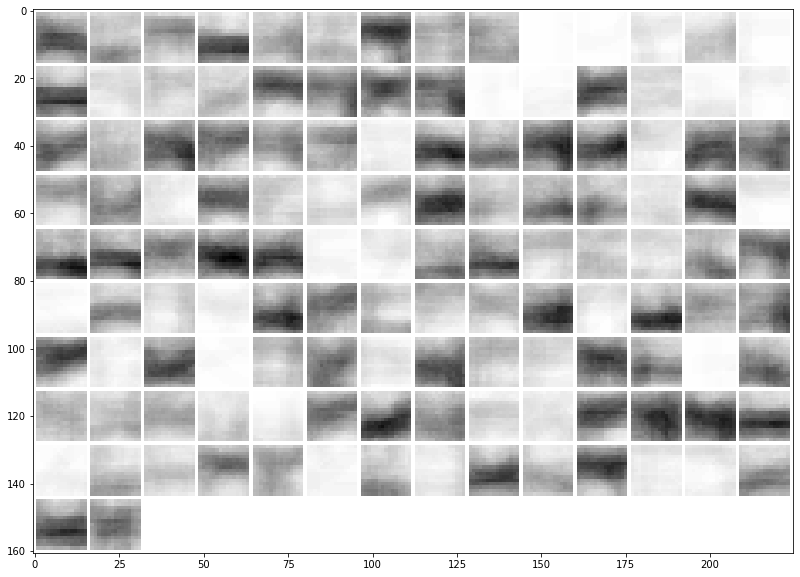

In [28]:
print('binary model mixt stride:')
list_filter = list_filter_interest_layer3_mixt
regions = region_layer3_mixt_no_binary_maxpooling
activations = activation_layer3_mixt_no_binary_maxpooling
activations_normalized = activation_layer3_mixt_no_binary_normalized_maxpooling

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/mixt_no_binary_model_maxpooling_layer3'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

print('no binary model mixt stride:')
regions = region_layer3_mixt_binary_maxpooling
activations = activation_layer3_mixt_binary_maxpooling
activations_normalized = activation_layer3_mixt_binary_normalized_maxpooling

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/mixt_binary_model_maxpooling_layer3'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

binary model mixt stride:
Consider 10% image regions = 100 images
mean regions of 100 regions who activate most filters:
image saved


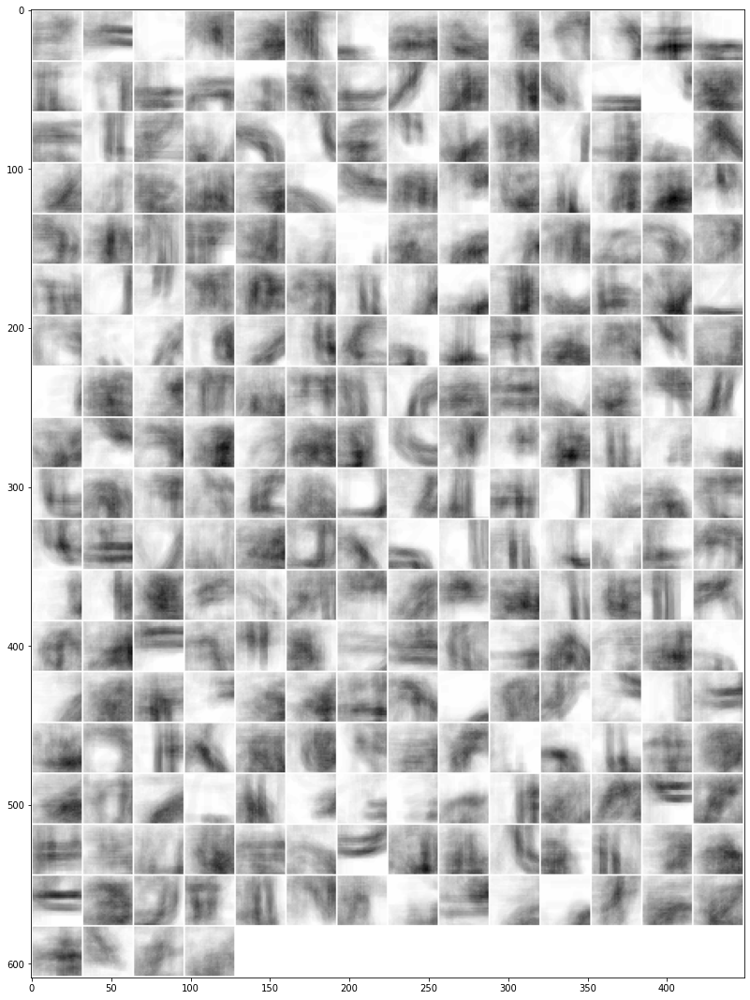

With normalized activations:
image saved


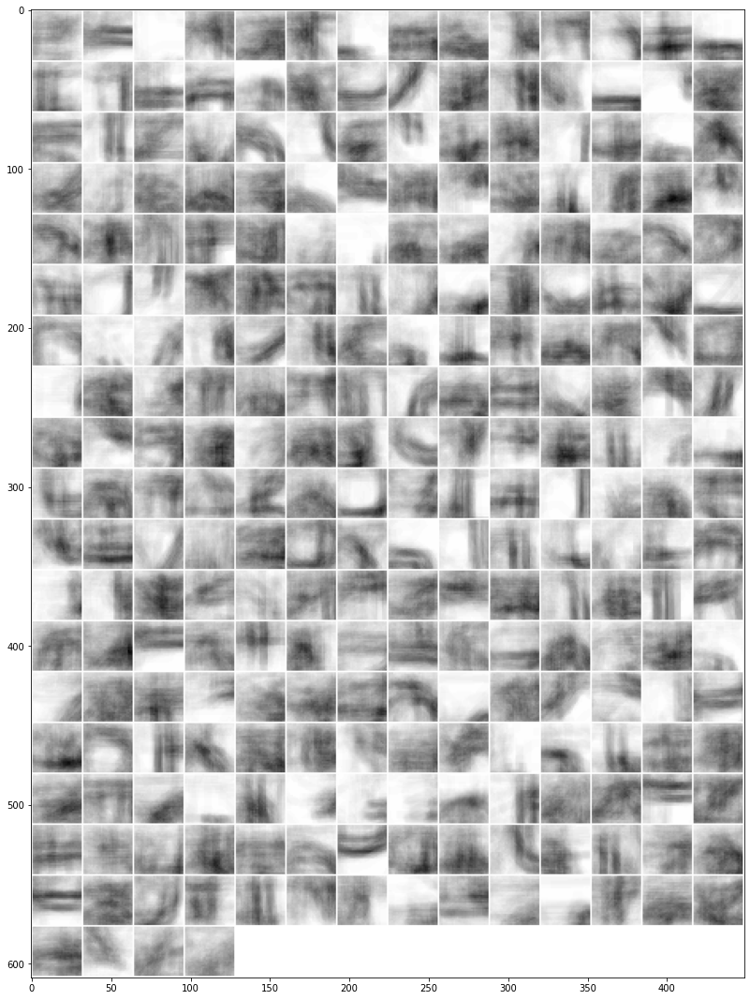

no binary model mixt stride:
Consider 10% image regions = 100 images
mean regions of 100 regions who activate most filters:


In [0]:
print('no binary model mixt stride:')
list_filter = list_filter_interest_layer4_mixt
regions = region_layer4_mixt_no_binary_maxpooling
activations = activation_layer4_mixt_no_binary_maxpooling
activations_normalized = activation_layer4_mixt_no_binary_normalized_maxpooling

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/mixt_no_binary_model_maxpooling_layer4'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

binary model mixt stride:
Consider 10% image regions = 100 images
mean regions of 100 regions who activate most filters:
image saved


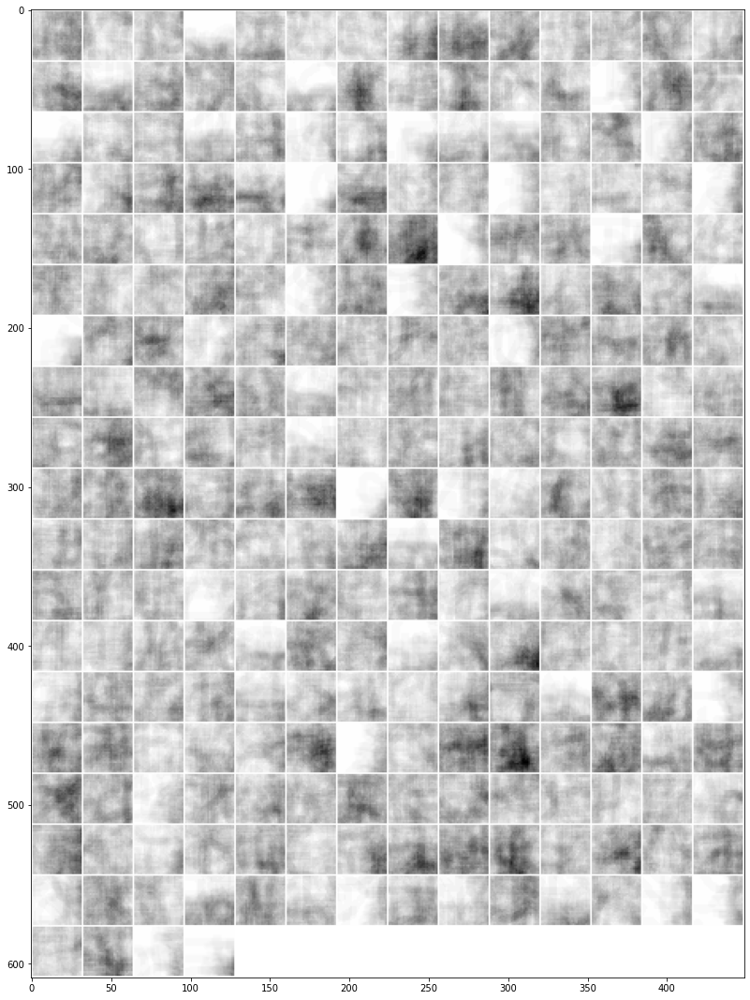

With normalized activations:
image saved


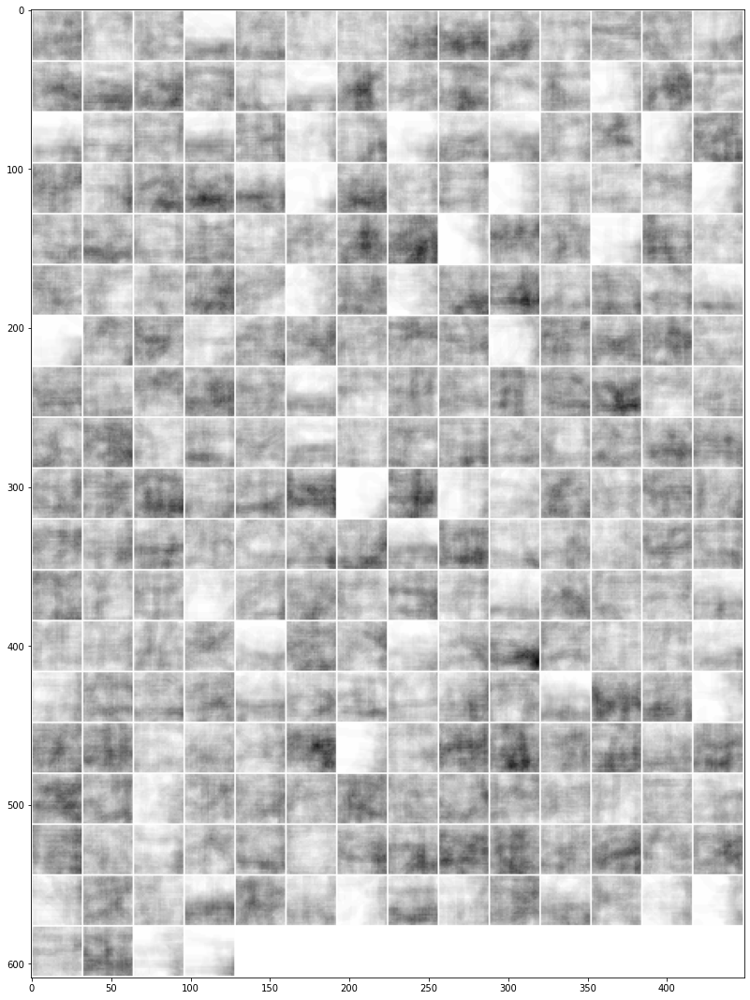

In [31]:
print('binary model mixt stride:')
list_filter = list_filter_interest_layer4_mixt
regions = region_layer4_mixt_binary_maxpooling
activations = activation_layer4_mixt_binary_maxpooling
activations_normalized = activation_layer4_mixt_binary_normalized_maxpooling

path_save_mean_region = 'results/Omniglot_results/regions/means_regions/mixt_binary_model_maxpooling_layer4'
selected_regions, activation_values, activation_values_normalized = get_regions_interest(regions, labels, activations, activations_normalized, details=details, best=best, worst=worst, viz_mean_img=viz_mean_img, viz_grid=viz_grid, percentage=percentage, list_filter=list_filter, nrow=nrow, plot_histogram=plot_histogram, save_mean_regions=save_mean_regions, path_save_mean_region=path_save_mean_region)

# Draft

## Test activation maximization with pre trained model:

In [0]:
import torchvision.models as models

In [0]:
model = models.vgg16(pretrained=True)

In [0]:
g_ascent = GradientAscent(model, img_size=224, filter_size=3)
g_ascent.use_gpu = True

conv1 = model.features[2]
conv1_filters = [17, 33, 34, 57]
mean_gradient_layer1 = False
ind_x_layer1 = 112
ind_y_layer1 = 112

conv2 = model.features[5]
conv2_filters = [27, 40, 68, 73]
mean_gradient_layer2 = False
ind_x_layer2 = 66
ind_y_layer2 = 66

conv3 = model.features[10]
conv3_filters = [31, 61, 147, 182]
mean_gradient_layer3 = False
ind_x_layer3 = 33
ind_y_layer3 = 33

conv4 = model.features[17]
conv4_filters = [238, 251, 338, 495]
mean_gradient_layer4 = False
ind_x_layer4 = 16
ind_y_layer4 = 16

conv5 = model.features[24]
conv5_filters = [45, 271, 363, 409]
mean_gradient_layer5 = False
ind_x_layer5 = 8
ind_y_layer5 = 8

lr = 1
num_iter = 30
MNIST = False

0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2


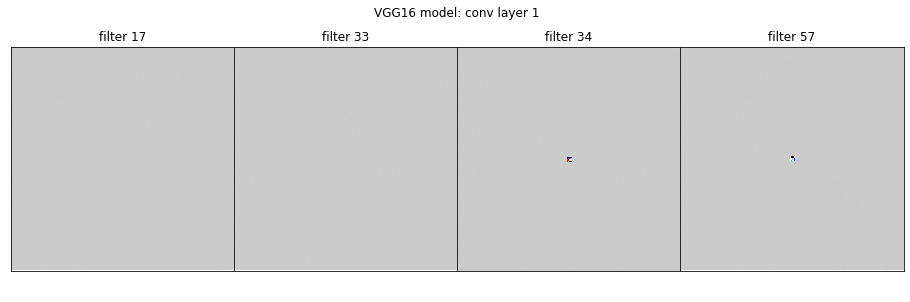

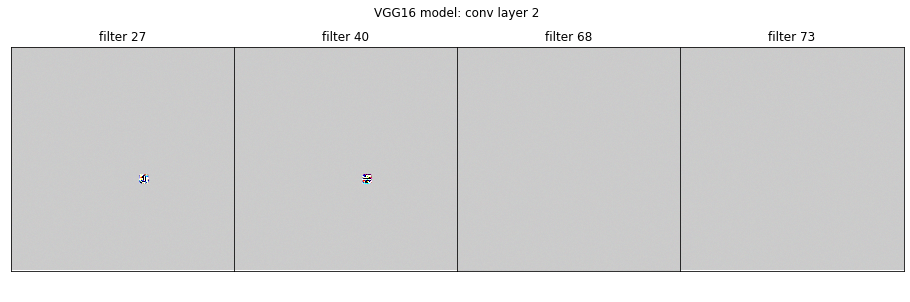

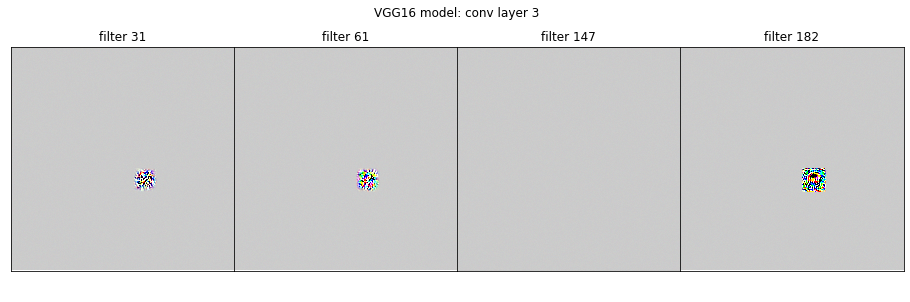

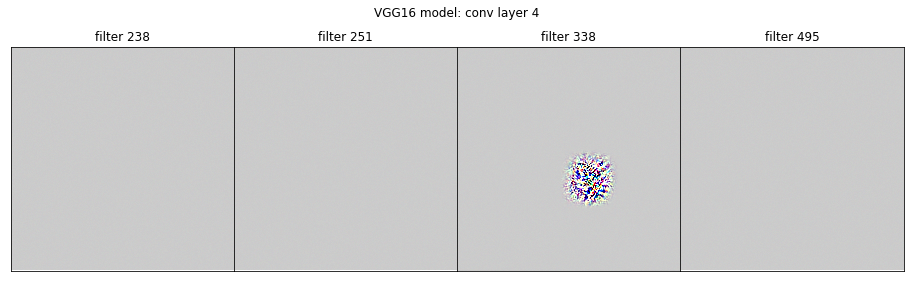

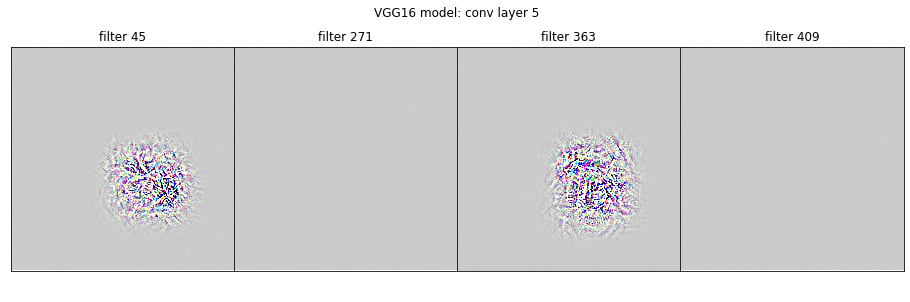

In [0]:
g_ascent.visualize(conv1, MNIST, conv1_filters, mean_gradient_layer1,
                             ind_x_layer1, ind_y_layer1, lr=lr, num_iter=num_iter, title='VGG16 model: conv layer 1', first_conv_layer=True)
g_ascent.visualize(conv2, MNIST, conv2_filters, mean_gradient_layer2,
                             ind_x_layer2, ind_y_layer2, lr=lr, num_iter=num_iter, title='VGG16 model: conv layer 2')
g_ascent.visualize(conv3, MNIST, conv3_filters, mean_gradient_layer3,
                             ind_x_layer3, ind_y_layer3, lr=lr, num_iter=num_iter, title='VGG16 model: conv layer 3')
g_ascent.visualize(conv4, MNIST, conv4_filters, mean_gradient_layer4,
                             ind_x_layer4, ind_y_layer4, lr=lr, num_iter=num_iter, title='VGG16 model: conv layer 4')
g_ascent.visualize(conv5, MNIST, conv5_filters, mean_gradient_layer5,
                             ind_x_layer5, ind_y_layer5, lr=lr, num_iter=num_iter, title='VGG16 model: conv layer 5')

In [0]:
g_ascent = GradientAscent(model, img_size=224, filter_size=3)
g_ascent.use_gpu = True

In [0]:
conv1 = model.features[2]
conv1_filters = [17, 33, 34, 57]
mean_gradient_layer1 = True
ind_x_layer1 = 112
ind_y_layer1 = 112

conv2 = model.features[5]
conv2_filters = [27, 40, 68, 73]
mean_gradient_layer2 = True
ind_x_layer2 = 66
ind_y_layer2 = 66

conv3 = model.features[10]
conv3_filters = [31, 61, 147, 182]
mean_gradient_layer3 = True
ind_x_layer3 = 33
ind_y_layer3 = 33

conv4 = model.features[17]
conv4_filters = [238, 251, 338, 495]
mean_gradient_layer4 = True
ind_x_layer4 = 16
ind_y_layer4 = 16

conv5 = model.features[24]
conv5_filters = [45, 271, 363, 409]
mean_gradient_layer5 = True
ind_x_layer5 = 8
ind_y_layer5 = 8

lr = 1
num_iter = 30
MNIST = False

In [0]:
g_ascent.visualize(conv1, MNIST, conv1_filters, mean_gradient_layer1,
                             ind_x_layer1, ind_y_layer1, lr=lr, num_iter=num_iter, title='VGG16 model: conv layer 1', first_conv_layer=True)
g_ascent.visualize(conv2, MNIST, conv2_filters, mean_gradient_layer2,
                             ind_x_layer2, ind_y_layer2, lr=lr, num_iter=num_iter, title='VGG16 model: conv layer 2')
g_ascent.visualize(conv3, MNIST, conv3_filters, mean_gradient_layer3,
                             ind_x_layer3, ind_y_layer3, lr=lr, num_iter=num_iter, title='VGG16 model: conv layer 3')
g_ascent.visualize(conv4, MNIST, conv4_filters, mean_gradient_layer4,
                             ind_x_layer4, ind_y_layer4, lr=lr, num_iter=num_iter, title='VGG16 model: conv layer 4')
g_ascent.visualize(conv5, MNIST, conv5_filters, mean_gradient_layer5,
                             ind_x_layer5, ind_y_layer5, lr=lr, num_iter=num_iter, title='VGG16 model: conv layer 5')

Output hidden; open in https://colab.research.google.com to view.

## Test activation maximization with pre trained model:

In [0]:
!pip install flashtorch

In [0]:
import torchvision.models as models
from flashtorch.activmax import GradientAscent as GA

In [0]:
model = models.vgg16(pretrained=True)

In [0]:
conv1_2 = model.features[2]
conv1_2_filters = [17, 33, 34, 57]

conv2_1 = model.features[5]
conv2_1_filters = [27, 40, 68, 73]

conv3_1 = model.features[10]
conv3_1_filters = [31, 61, 147, 182]

conv4_1 = model.features[17]
conv4_1_filters = [238, 251, 338, 495]

conv5_1 = model.features[24]
conv5_1_filters = [45, 271, 363, 409]

In [0]:
g_ascent = GA(model.features)

In [0]:
g_ascent.visualize(conv1_2, conv1_2_filters, title='conv1_2');
g_ascent.visualize(conv2_1, conv2_1_filters, title='conv2_1');
g_ascent.visualize(conv3_1, conv3_1_filters, title='conv3_1');
g_ascent.visualize(conv4_1, conv4_1_filters, title='conv4_1');
g_ascent.visualize(conv5_1, conv5_1_filters, title='conv5_1');

Output hidden; open in https://colab.research.google.com to view.

## TEst activation region max:

In [0]:
from utils.functions import Hardsigmoid
from visualize.viz import get_region_layer1
import matplotlib

In [0]:
def test_act_region_max(index_data, images):

  image = images[index_data].unsqueeze(0)
  label = labels[index_data].item()

  output = model_no_binary(image)

  keys  ='act_layer1'

  act_conv = activation[keys]
  print('{} for label {}'.format(keys, label))
  print(act_conv.shape)

  i=0
  act_max_abs = max(act_conv[0][i].min(), act_conv[0][i].max(), key=abs)
  act_max = act_conv[0][i].max()
  print(act_max_abs, act_max)
  ind_x = int((np.where(act_conv[0][i] == act_max)[0])[0])  # get index (x,y) of act_max
  ind_y = int((np.where(act_conv[0][i] == act_max)[1])[0])
  print(ind_x, ind_y)

  im = image.squeeze()
  name='no binary'
  stride=2
  padding=1
  filter_size=3
  len_img_h = 105
  len_img_w = 105
  region, begin_col, end_col, begin_raw, end_raw = get_region_layer1(im, ind_x, ind_y, name, stride, padding, filter_size, len_img_h, len_img_w, return_all=True)

  act_conv_im = activation[keys].squeeze()
  plt.imshow(act_conv_im[index_data], cmap='gray')
  plt.scatter(ind_y,ind_x,color='r')
  plt.show()

  fig,ax = plt.subplots(1)
  ax.imshow(im, cmap='gray')
  ax.scatter(((ind_y*stride)-padding)+1, ((ind_x*stride)-padding)+1,color='r')
  rect=matplotlib.patches.Rectangle((begin_raw-1, begin_col-1),3,3, edgecolor='r', facecolor="none")
  ax.add_patch(rect)
  plt.show()

  s_y = ((ind_y*stride)-padding)
  e_y = ((ind_y*stride)-padding)+3
  s_x = ((ind_x*stride)-padding)
  e_x=((ind_x*stride)-padding)+3

  print(im[s_y:e_y,s_x:e_x])
  print(region)
  plt.imshow(region, cmap='gray')
  plt.show()

  return region, begin_col, end_col, begin_raw, end_raw


In [0]:
activation = {}

for name, m in model_no_binary.named_modules():
        if type(m) == Hardsigmoid or type(m) == nn.ReLU:
            m.register_forward_hook(get_activation(name, activation))

index_data=10
if index_data == None:
    index_data = random.randint(0, len(train_loader))

dataiter = iter(train_loader)
images, labels = dataiter.next()

# model_no_binary.cpu()
# output = model_no_binary(image)

act_layer1 for label 253
torch.Size([1, 64, 53, 53])
tensor(5.3527) tensor(5.3527)
3 16


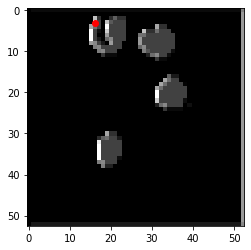

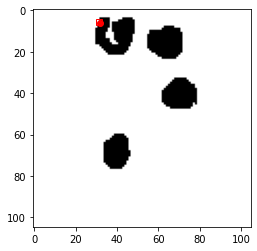

tensor([[1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.]])
tensor([[1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.]])


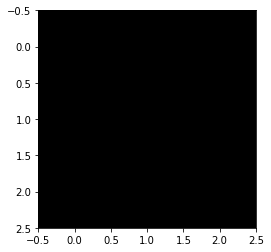

torch.Size([3, 3])
tensor([[1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.]])
5 8 31 34


In [0]:
index_data=0

region, begin_col, end_col, begin_raw, end_raw = test_act_region_max(index_data, images)

print(region.shape)
print(region)
print(begin_col,end_col,begin_raw,end_raw)

## test region's score:

In [0]:
from numpy import linalg as LA

In [0]:
def get_activation(name, activation):
    def hook(model, input, output):
        activation[name] = output.detach()
    return hook

def test_score_region(model, filter_choice, index=None):

  if index is None:
    # dataiter = iter(train_loader)
    # images, _ = dataiter.next()
    index = np.random.randint(0,1000)
    image = images[index]
  else:
    image = images[index]

  print('image test number: {} with shape: {}'.format(index, image.shape))
  plt.imshow(image[0], cmap='gray')
  plt.show()

  activation = {}

  for name, m in model.named_modules():
      if type(m) == nn.Conv2d:
          m.register_forward_hook(get_activation(name, activation))

  out = model(image.unsqueeze(0)) 

  activation_layer1 = activation['layer1'][0]
  activation_layer2 = activation['layer2'][0]

  print('prediction:{}'.format(out.data.numpy().argmax()))       

  filter = filter_choice
  act_max_layer1 = activation_layer1[filter].max()
  print('value activation max for filte {} :{}'.format(filter, act_max_layer1))

  ind_x = int((np.where(activation_layer1[filter] == act_max_layer1)[0])[0]) 
  ind_y = int((np.where(activation_layer1[filter] == act_max_layer1)[1])[0])

  print('index of max value: x: {}, y: {}'.format(ind_x, ind_y))

  name = 'layer1'
  stride = 2
  padding=1
  filter_size=3
  len_img_h=105
  len_img_w=105
  im = image[0]
  print(im.shape)

  region, begin_col, end_col, begin_raw, end_raw = get_region_layer1(im, ind_x, ind_y, name, stride, padding, filter_size, len_img_h, len_img_w, return_all=True)

  print('region extracted: {}'.format(region))
  plt.imshow(region, cmap='gray')
  plt.show()

  random_im = np.uint8(np.random.uniform(0, 255, (105, 105)))/255
  print('random image generated:')
  plt.imshow(random_im, cmap='gray')
  plt.show()

  random_im[begin_col:end_col, begin_raw:end_raw] = region
  plt.imshow(random_im, cmap='gray')
  print('random image generated with region that maximize filter activation:')
  plt.show()

  activation_random_im = {}

  for name, m in model_no_binary.named_modules():
      if type(m) == nn.Conv2d:
          m.register_forward_hook(get_activation(name, activation_random_im))

  random_image = (torch.tensor(random_im.reshape((1,1,105,105))))
  out = model_no_binary(random_image.float())
  activation_layer1_random = activation_random_im['layer1'][0]

  act_max_random = activation_layer1_random[filter].max()

  ind_x_random = int((np.where(activation_layer1_random[filter] == act_max_random)[0])[0]) 
  ind_y_random = int((np.where(activation_layer1_random[filter] == act_max_random)[1])[0])

  activation_value_index_random = activation_layer1_random[filter][ind_x][ind_y]
  activation_value_index = activation_layer1[filter][ind_x][ind_y]

  print('activation max for image: {} with index: x:{}, y:{}'.format(act_max_layer1, ind_x, ind_y))
  print('activation max for random image with region: {} with index: x:{}, y:{}'.format(act_max_random, ind_x_random, ind_y_random))  

  print('activation value for ind_x: {} and ind_y: {} = {}'.format(ind_x, ind_y, activation_value_index))
  print('random activation value for ind_x: {} and ind_y: {} = {}'.format(ind_x_random, ind_y_random, activation_value_index_random))
  
  region_new_random, begin_col, end_col, begin_raw, end_raw = get_region_layer1(random_im, ind_x_random, ind_y_random, name, stride, padding, filter_size, len_img_h, len_img_w, return_all=True)

  plt.imshow(region_new_random, cmap='gray')
  print('region_new_random')
  plt.show()

  return region

image test number: 1 with shape: torch.Size([1, 105, 105])


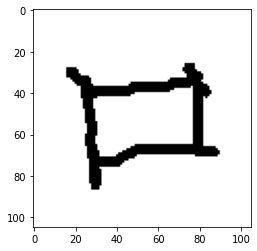

prediction:627
value activation max for filte 0 :0.7777348756790161
index of max value: x: 15, y: 8
torch.Size([105, 105])
index start: 15, 8
index hl: 29, 15
index extract region: 29, 32, 15, 18


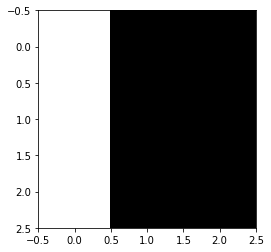

region extracted: tensor([[1., 0., 0.],
        [1., 0., 0.],
        [1., 0., 0.]])


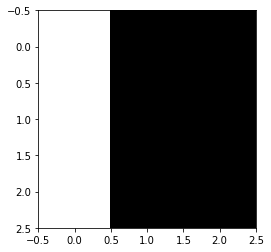

random image generated:


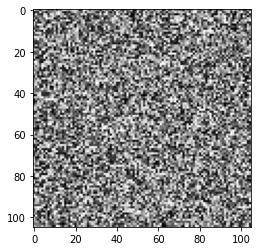

random image generated with region that maximize filter activation:


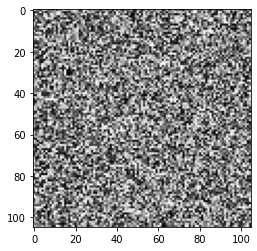

activation max for image: 0.7777348756790161 with index: x:15, y:8
activation max for random image with region: 0.7777348756790161 with index: x:15, y:8
activation value for ind_x: 15 and ind_y: 8 = 0.7777348756790161
random activation value for ind_x: 15 and ind_y: 8 = 0.7777348756790161
index start: 15, 8
index hl: 29, 15
index extract region: 29, 32, 15, 18


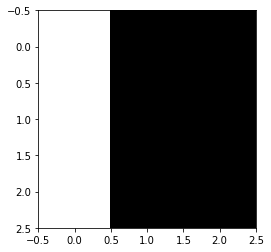

region_new_random


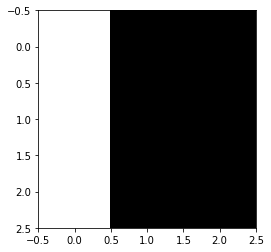

In [0]:
model = model_no_binary
filter_choice = 0
index=1


region = test_score_region(model, filter_choice, index=index)